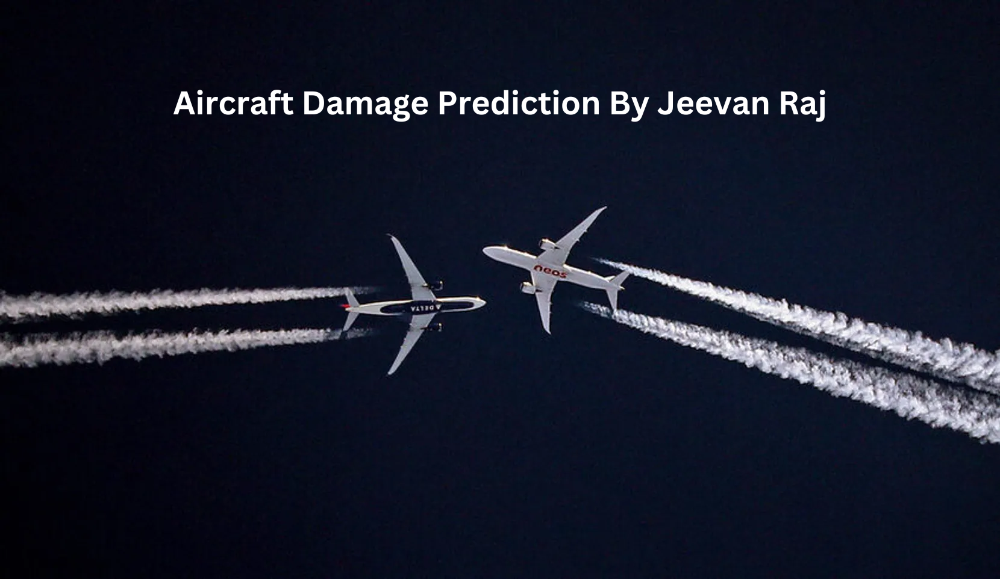

## WORK FLOW CHART

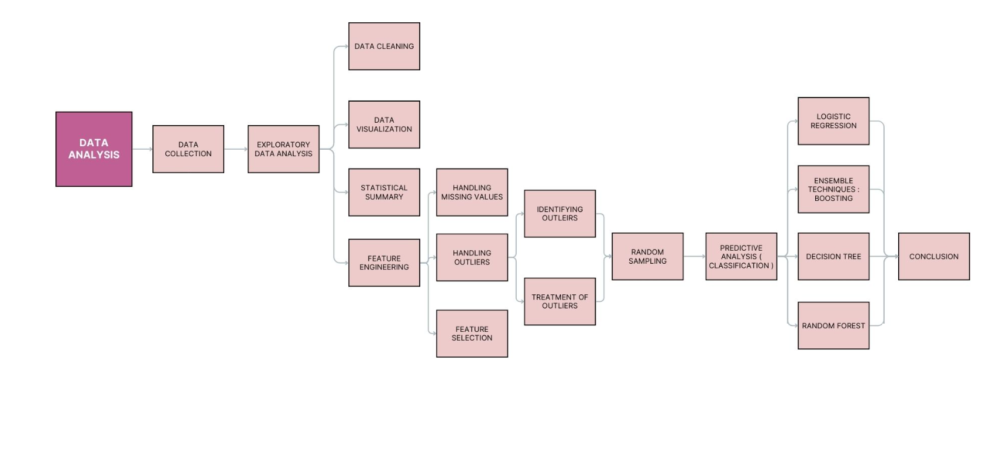

## ABOUT PROJECT

<span class="girk">- The aviation accident database synopses project, known as Aviation Data, is a comprehensive collection of data related to
  aviation accidents worldwide, providing detailed information and analysis to enhance safety and understanding within the 
  aviation industry.
 
<span class="girk"> - The NTSB aviation accident database contains information from 1962 and later about civil aviation accidents and selected 
  incidents within the United States, its territories and possessions, and in international waters.</span></span>
  
    - The NTSB is an independent federal agency in the United States responsible for investigating transportation 
      accidents, including those involving aviation.


## OBJECTIVE 

<span class="pirk">- The objective of the project on Aviation Accident Damage from the National Transportation Safety Board (NTSB) is to
  thoroughly investigate and analyze aviation accidents in order to understand the causes and consequences of these 
  incidents. 

        - Determine if there are any specific plane models or engine types that exhibit a higher level of risk or danger 
          in terms  of flight safety.

        - Investigate the weather conditions that have contributed to aviation accidents, aiming to understand the 
          specific factors  that lead to these incidents. 

        - Analyze the correlation between the number of engines on an aircraft and the likelihood of survivability, with 
          the goal  of determining if a higher number of engines leads to increased safety.

        - Assess which phase of a flight poses the highest level of risk or danger, considering factors such as takeoff, 
          climb,  cruise, descent, or landing.

## IMPORTING LIBRARIES

!pip install catboost
!pip install xgboost

In [12]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
from warnings import filterwarnings
filterwarnings('ignore')
pd.set_option("display.max_columns", None)

from scipy import stats
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest
from imblearn.under_sampling import RandomUnderSampler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split,GridSearchCV, KFold, cross_validate, cross_val_score

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
import catboost as cb
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier , AdaBoostClassifier , GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, r2_score , f1_score , confusion_matrix

## IMPORTING DATA

In [13]:
# Reading the CSV file "AviationData.csv" and storing it in the variable "Aviation"

# Specifying the encoding as 'mac_roman' to handle any special characters in the file

Aviation = pd.read_csv("AviationData.csv" , encoding = 'mac_roman')

Aviation

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,Injury.Severity,Aircraft.damage,Aircraft.Category,Registration.Number,Make,Model,Amateur.Built,Number.of.Engines,Engine.Type,FAR.Description,Schedule,Purpose.of.flight,Air.carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
0,20001218X45444,Accident,SEA87LA080,1948-10-24,"MOOSE CREEK, ID",United States,NaN,NaN,NaN,NaN,Fatal(2),Destroyed,NaN,NC6404,Stinson,108-3,No,1.0,Reciprocating,NaN,NaN,Personal,NaN,2.0,0.0,0.0,0.0,UNK,Cruise,Probable Cause,NaN
1,20001218X45447,Accident,LAX94LA336,1962-07-19,"BRIDGEPORT, CA",United States,NaN,NaN,NaN,NaN,Fatal(4),Destroyed,NaN,N5069P,Piper,PA24-180,No,1.0,Reciprocating,NaN,NaN,Personal,NaN,4.0,0.0,0.0,0.0,UNK,Unknown,Probable Cause,19-09-1996
2,20061025X01555,Accident,NYC07LA005,1974-08-30,"Saltville, VA",United States,36.922223,-81.878056,NaN,NaN,Fatal(3),Destroyed,NaN,N5142R,Cessna,172M,No,1.0,Reciprocating,NaN,NaN,Personal,NaN,3.0,NaN,NaN,NaN,IMC,Cruise,Probable Cause,26-02-2007
3,20001218X45448,Accident,LAX96LA321,1977-06-19,"EUREKA, CA",United States,NaN,NaN,NaN,NaN,Fatal(2),Destroyed,NaN,N1168J,Rockwell,112,No,1.0,Reciprocating,NaN,NaN,Personal,NaN,2.0,0.0,0.0,0.0,IMC,Cruise,Probable Cause,12-09-2000
4,20041105X01764,Accident,CHI79FA064,1979-08-02,"Canton, OH",United States,NaN,NaN,NaN,NaN,Fatal(1),Destroyed,NaN,N15NY,Cessna,501,No,NaN,NaN,NaN,NaN,Personal,NaN,1.0,2.0,NaN,0.0,VMC,Approach,Probable Cause,16-04-1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87277,20211223104439,Accident,GAA22WA054,2021-12-21,"Auxerre, OF",United States,475047N,0032948W,NaN,NaN,Fatal,Destroyed,Airplane,N565CK,CIRRUS DESIGN CORP,SR22,N,1.0,NaN,NUSN,NaN,Unknown,NaN,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
87278,20211228104450,Accident,WPR22LA069,2021-12-22,"Auburn, CA",United States,NaN,NaN,NaN,NaN,Non-Fatal,NaN,NaN,N6280F,CESSNA,172N,N,NaN,NaN,091,NaN,Positioning,"Fox Two, LLC",0.0,0.0,1.0,0.0,NaN,NaN,NaN,NaN
87279,20211227104443,Accident,CEN22FA082,2021-12-26,"Hardy, AR",United States,NaN,NaN,NaN,NaN,Fatal,NaN,NaN,N5798T,CESSNA,172E,N,NaN,NaN,091,NaN,Personal,NaN,2.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
87280,20211230104454,Accident,ERA22LA097,2021-12-29,"Marathon, FL",United States,NaN,NaN,NaN,NaN,Non-Fatal,NaN,NaN,N1596U,CESSNA,207,N,NaN,NaN,135,NSCH,NaN,ExecAir,0.0,3.0,0.0,0.0,NaN,NaN,NaN,NaN


In [21]:
Aviation.shape

(87282, 31)

### DATA DESCRIPTION

In [17]:
# Create a dictionary to store the information about the dataset

info_dict = {
    
    'Column': Aviation.columns.tolist(),    # Store the column names in a list
    
    'Non-Null Count': Aviation.count().tolist(), # Store the count of non-null values for each column
    
    'Dtype': Aviation.dtypes.tolist(), # Store the data types of each column
    
    'Null_Percentage' : np.round(( 87282 - Aviation.count()) * 100 / 87282) # Calculate the percentage of null values in each column
    
}


# Create a DataFrame from the info_dict dictionary

Description = pd.DataFrame(info_dict).reset_index(drop = True)

Description

,Column,Non-Null Count,Dtype,Null_Percentage
0,Event.Id,87282,object,0.0
1,Investigation.Type,87282,object,0.0
2,Accident.Number,87282,object,0.0
3,Event.Date,87282,object,0.0
4,Location,87230,object,0.0
5,Country,87056,object,0.0
6,Latitude,33073,object,62.0
7,Longitude,33064,object,62.0
8,Airport.Code,49217,object,44.0
9,Airport.Name,51870,object,41.0


### STATISTICAL SUMMARY

In [18]:
Aviation.describe( )  ## The statistical description of the discrete variables in the data set.

,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured
count,81533.000000,75881.000000,74772.000000,75349.000000,81370.000000
mean,1.147131,0.652772,0.280921,0.360814,5.311847
std,0.447085,5.521338,1.557476,2.257721,27.899156
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,1.000000
75%,1.000000,0.000000,0.000000,0.000000,2.000000
max,8.000000,349.000000,161.000000,380.000000,699.000000


In [19]:
# Describing the 'Aviation' DataFrame, including only object-type columns and excluding numerical columns
# include='object' specifies that we want to include only object-type columns in the description
# exclude=np.number specifies that we want to exclude numerical columns from the description

Aviation.describe(include = 'object' , exclude = np.number)

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,Injury.Severity,Aircraft.damage,Aircraft.Category,Registration.Number,Make,Model,Amateur.Built,Engine.Type,FAR.Description,Schedule,Purpose.of.flight,Air.carrier,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
count,87282,87282,87282,87282,87230,87056,33073,33064,49217,51870,86399,84272,30783,85900,87219,87190,87180,81372,30458,12330,81493,15971,83304,61724,82067,73629
unique,86370,2,87282,14435,27171,210,24752,26206,10252,24545,107,4,12,77696,8045,12185,4,10,31,3,28,13079,4,12,16666,2686
top,20001212X19172,Accident,SEA87LA080,1984-06-30,"ANCHORAGE, AK",United States,332739N,0112457W,NONE,Private,Non-Fatal,Substantial,Airplane,NONE,Cessna,152,No,Reciprocating,091,NSCH,Personal,Pilot,VMC,Landing,Probable Cause,25-09-2020
freq,3,83536,1,25,434,80998,19,22,1486,232,66561,62975,26343,344,22227,2350,58165,69159,17131,4284,48655,246,76251,15428,61754,17019


## EXPLORATORY DATA ANALYSIS 

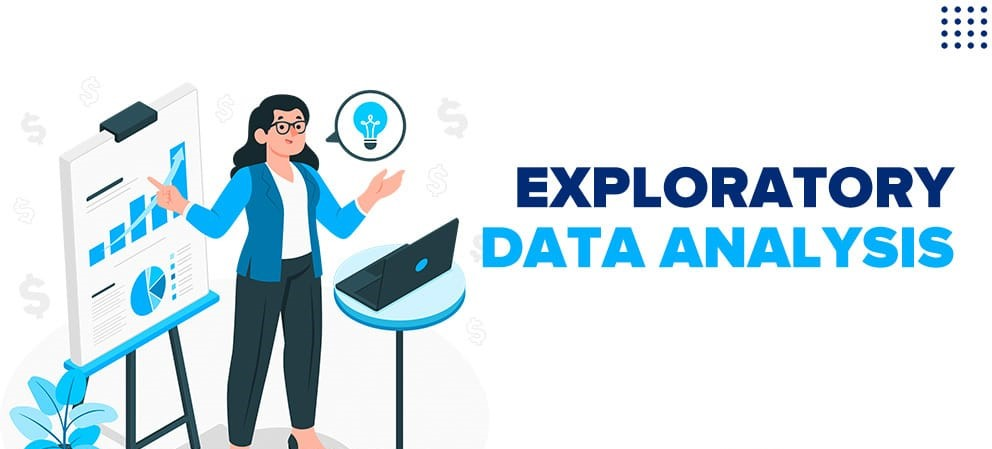

    * EDA allows us to explore the data's characteristics, patterns, and outliers, facilitating the identification of 
      crucial factors contributing to accidents. 
    
    * Through visualizations and analysis of numerical, categorical, and time-related variables, EDA allows for the 
      identification of correlations, anomalies, and potential data quality issues, providing a solid foundation for
      subsequent modeling and decision-making in the aviation industry.
      
    * EDA can uncover patterns and trends in different types of aviation accidents, such as crashes, collisions, or runway 
      incidents. It allows for the identification of common factors or circumstances contributing to these accidents, 
      including weather conditions, pilot error, mechanical failures, or specific phases of flight.

### DATA CLEANING

#### Checking for Duplicates

In [76]:
Aviation[Aviation.duplicated()]

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,Injury.Severity,Aircraft.damage,Aircraft.Category,Registration.Number,Make,Model,Amateur.Built,Engine.Type,FAR.Description,Schedule,Purpose.of.flight,Air.carrier,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Year


#### FILLING NULL VALUES

In [57]:
# Create an empty DataFrame to store columns and their null values

Null_Values = pd.DataFrame( ) 

# Retrieve the columns with null values and add them to the 'Columns' column of Null_Values DataFrame

Null_Values['Columns'] = Aviation.isnull( ).sum( ) [Aviation.isnull( ).sum( ) > 0].index.tolist( )

# Retrieve the corresponding null values for each column and add them to the 'Null_Values' column of Null_Values DataFrame

Null_Values['Null_Values'] = Aviation.isnull( ).sum( ) [Aviation.isnull( ).sum( ) > 0].values.tolist( )

# Displaying the percentage of null values for each column and add then to the %_of_Null_Values in Null_values DataFrame
pct_null_values = list((Aviation.isnull( ).sum( )[Aviation.isnull().sum()>0].values/Aviation.shape[0] * 100).round(2))
Null_Values['%_of_Null_Values'] = [str(i)+"%"  for i in pct_null_values]
Null_Values

,Columns,Null_Values,%_of_Null_Values
0,Location,52,0.06%
1,Country,226,0.26%
2,Latitude,54209,62.11%
3,Longitude,54218,62.12%
4,Airport.Code,38065,43.61%
5,Airport.Name,35412,40.57%
6,Injury.Severity,883,1.01%
7,Aircraft.damage,3010,3.45%
8,Aircraft.Category,56499,64.73%
9,Registration.Number,1382,1.58%


##### CATEGORICAL DATA

In [61]:
## Using Simple Imputer to fill in the null spaces with the mode values for categorical data

from sklearn.impute import SimpleImputer

Imputer = SimpleImputer(strategy = 'most_frequent')

Imputer.fit(Aviation.select_dtypes('object'))

DF = pd.DataFrame(Imputer.transform(Aviation.select_dtypes('object')),columns = Aviation.select_dtypes('object').columns )

In [62]:
Aviation['Number.of.Engines'].unique()

array([ 1., nan,  2.,  0.,  3.,  4.,  8.])

In [63]:
# Even Number.of.Engines is also a categorical variable so we are going to impute the missing values using most frequent values
Aviation['Number.of.Engines'].fillna(Aviation['Number.of.Engines'].mode()[0],inplace = True)

##### NUMERIC DATA

In [64]:
## Using Simple Imputer to fill in the null spaces with the mean values for the numeric data

Imputer_n = SimpleImputer(strategy = 'mean')

Imputer_n.fit(Aviation.select_dtypes(np.number))

DF_1 = pd.DataFrame(Imputer_n.transform(Aviation.select_dtypes(np.number)),columns = Aviation.select_dtypes(np.number).columns)

##### CONCATENATING THE CLEANING DATA FRAME

In [65]:
Aviation = pd.concat([DF,DF_1],axis = 1)
Aviation

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,Injury.Severity,Aircraft.damage,Aircraft.Category,Registration.Number,Make,Model,Amateur.Built,Engine.Type,FAR.Description,Schedule,Purpose.of.flight,Air.carrier,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured
0,20001218X45444,Accident,SEA87LA080,1948-10-24,"MOOSE CREEK, ID",United States,332739N,0112457W,NONE,Private,Fatal(2),Destroyed,Airplane,NC6404,Stinson,108-3,No,Reciprocating,091,NSCH,Personal,Pilot,UNK,Cruise,Probable Cause,25-09-2020,1.0,2.0,0.000000,0.000000,0.000000
1,20001218X45447,Accident,LAX94LA336,1962-07-19,"BRIDGEPORT, CA",United States,332739N,0112457W,NONE,Private,Fatal(4),Destroyed,Airplane,N5069P,Piper,PA24-180,No,Reciprocating,091,NSCH,Personal,Pilot,UNK,Unknown,Probable Cause,19-09-1996,1.0,4.0,0.000000,0.000000,0.000000
2,20061025X01555,Accident,NYC07LA005,1974-08-30,"Saltville, VA",United States,36.922223,-81.878056,NONE,Private,Fatal(3),Destroyed,Airplane,N5142R,Cessna,172M,No,Reciprocating,091,NSCH,Personal,Pilot,IMC,Cruise,Probable Cause,26-02-2007,1.0,3.0,0.280921,0.360814,5.311847
3,20001218X45448,Accident,LAX96LA321,1977-06-19,"EUREKA, CA",United States,332739N,0112457W,NONE,Private,Fatal(2),Destroyed,Airplane,N1168J,Rockwell,112,No,Reciprocating,091,NSCH,Personal,Pilot,IMC,Cruise,Probable Cause,12-09-2000,1.0,2.0,0.000000,0.000000,0.000000
4,20041105X01764,Accident,CHI79FA064,1979-08-02,"Canton, OH",United States,332739N,0112457W,NONE,Private,Fatal(1),Destroyed,Airplane,N15NY,Cessna,501,No,Reciprocating,091,NSCH,Personal,Pilot,VMC,Approach,Probable Cause,16-04-1980,1.0,1.0,2.000000,0.360814,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87277,20211223104439,Accident,GAA22WA054,2021-12-21,"Auxerre, OF",United States,475047N,0032948W,NONE,Private,Fatal,Destroyed,Airplane,N565CK,CIRRUS DESIGN CORP,SR22,N,Reciprocating,NUSN,NSCH,Unknown,Pilot,VMC,Landing,Probable Cause,25-09-2020,1.0,1.0,0.000000,0.000000,0.000000
87278,20211228104450,Accident,WPR22LA069,2021-12-22,"Auburn, CA",United States,332739N,0112457W,NONE,Private,Non-Fatal,Substantial,Airplane,N6280F,CESSNA,172N,N,Reciprocating,091,NSCH,Positioning,"Fox Two, LLC",VMC,Landing,Probable Cause,25-09-2020,1.0,0.0,0.000000,1.000000,0.000000
87279,20211227104443,Accident,CEN22FA082,2021-12-26,"Hardy, AR",United States,332739N,0112457W,NONE,Private,Fatal,Substantial,Airplane,N5798T,CESSNA,172E,N,Reciprocating,091,NSCH,Personal,Pilot,VMC,Landing,Probable Cause,25-09-2020,1.0,2.0,0.000000,0.000000,0.000000
87280,20211230104454,Accident,ERA22LA097,2021-12-29,"Marathon, FL",United States,332739N,0112457W,NONE,Private,Non-Fatal,Substantial,Airplane,N1596U,CESSNA,207,N,Reciprocating,135,NSCH,Personal,ExecAir,VMC,Landing,Probable Cause,25-09-2020,1.0,0.0,3.000000,0.000000,0.000000


In [69]:
# Checking for null values

Aviation.isnull().sum()[Aviation.isnull().sum()>0]

Series([], dtype: int64)

Finally we have treated all the missing values

### DATA VISUALIZATION

#### EVENTS THROUGHOUT THE YEAR

    - The x-axis would show the years, and the y-axis would represent the count or identification numbers of the aviation
      events or accidents. 

    - The line plot can provide insights into the trends and variations in accident occurrences over time.

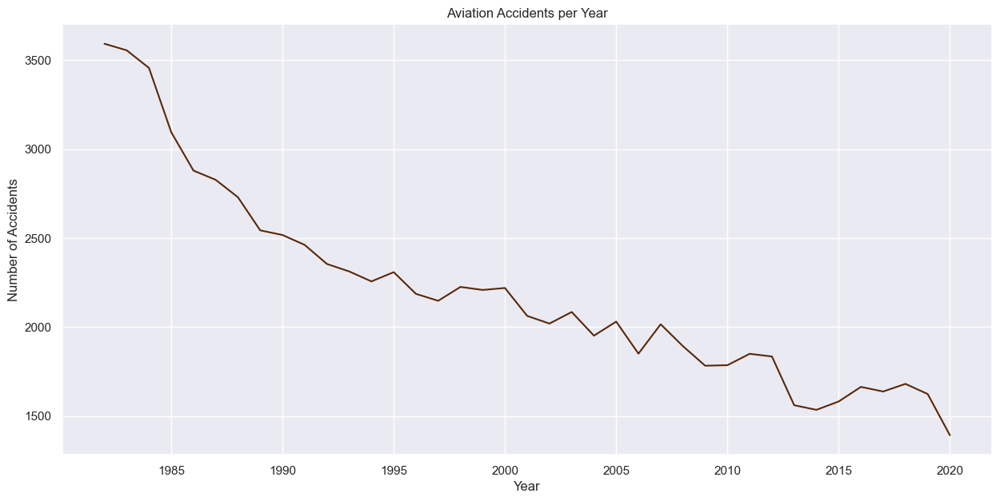

In [81]:
# Converting the Event Date column type from String > DateTime

Aviation['Event.Date'] = pd.to_datetime(Aviation['Event.Date'])


# Extracting Year from the transformed column of Event.Date and storing it in another column in the same Data Frame

Aviation['Year'] = Aviation['Event.Date'].dt.year


# Grouping the Aviation Dataset by Year and storing the Event.Id column from grouped data into a surrogate data frame

Accidents = Aviation.groupby(['Year'], as_index = False)['Event.Id'].count()


# Filtering the column Year from Accidents Dataframe 

Accidents = Accidents[(Accidents['Year'] >= 1982) & (Accidents['Year'] <= 2020)]


# Specifying the style and visualization aesthetics

plt.style.use("seaborn-dark")

plt.figure(figsize = (15 , 7))

sns.set(style = 'darkgrid')


# Create the line plot

sns.lineplot(x = 'Year', y = 'Event.Id', data = Accidents, color = '#582707' , markers = '*' )

# Add labels and title

plt.xlabel('Year')

plt.ylabel('Number of Accidents')

plt.title('Aviation Accidents per Year')

plt.show( )

<span class="burk"> --INFERENCE-- </span>

        * We can see that the number of accidents per year gradually decrease from 1982 to 2020, with peaks and valleys.

        * The decreasing trend suggests advancements in aircraft technology, maintenance, pilot training, and safety 
          regulations.
          
        * Efforts to learn from past accidents and implement proactive measures contribute to the trend.

#### MONTHLY ANALYSIS OF ACCIDENTS

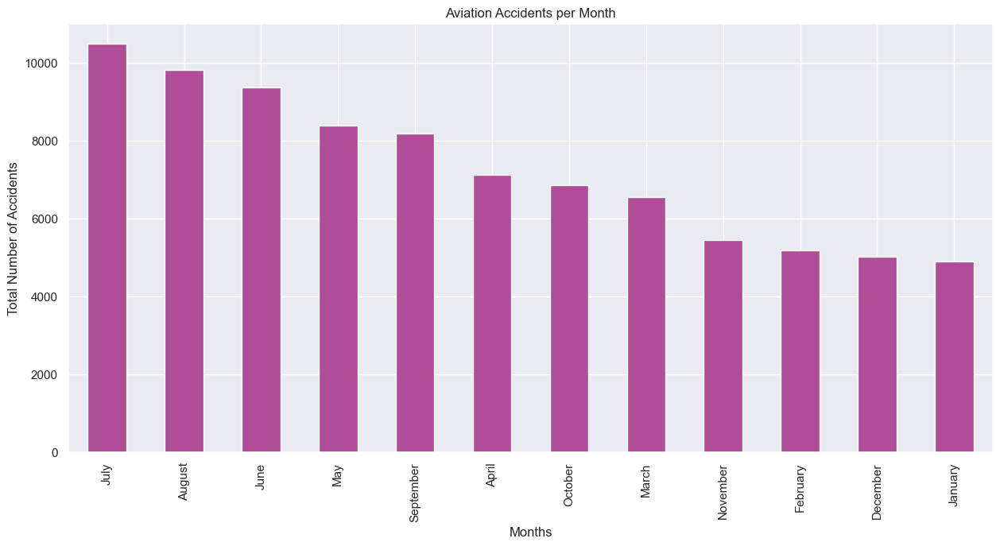

In [83]:
# Extracting Month Name from Event.Date and saving it as Month.Abbr > Abbreviations of the months

Aviation['Month.Abbr'] = Aviation['Event.Date'].dt.month_name()


# Specifying the style and visualization aesthetics

plt.style.use("seaborn-dark")

plt.figure(figsize = (15 , 7))

sns.set(style = 'darkgrid')


# Creating a plot

Aviation['Month.Abbr'].value_counts( ).sort_values(ascending = False).plot(kind = 'bar',color = '#AF4D98')

plt.xlabel('Months')

plt.ylabel('Total Number of Accidents')

plt.title('Aviation Accidents per Month')

plt.show( )

<span class="burk"> --INFERENCE-- </span>


        * We can see that the maximum number of accidents occur in the month of July, August, June and May, followed by 
        September and April.

            - More accidents occur during summer months, likely due to increased travel and challenging weather 
              conditions.

            - Factors unique to summer months contribute to a higher frequency of accidents.

        * The least number of accidents are recorded in the month of December , November , January and February.

            - The information helps aviation authorities, airlines, and travelers improve safety measures.
            
            - It aids in allocating resources effectively.
            
            - It promotes awareness during periods with higher accident rates.
            


#### WEEKLY ANALYSIS OF ACCIDENTS

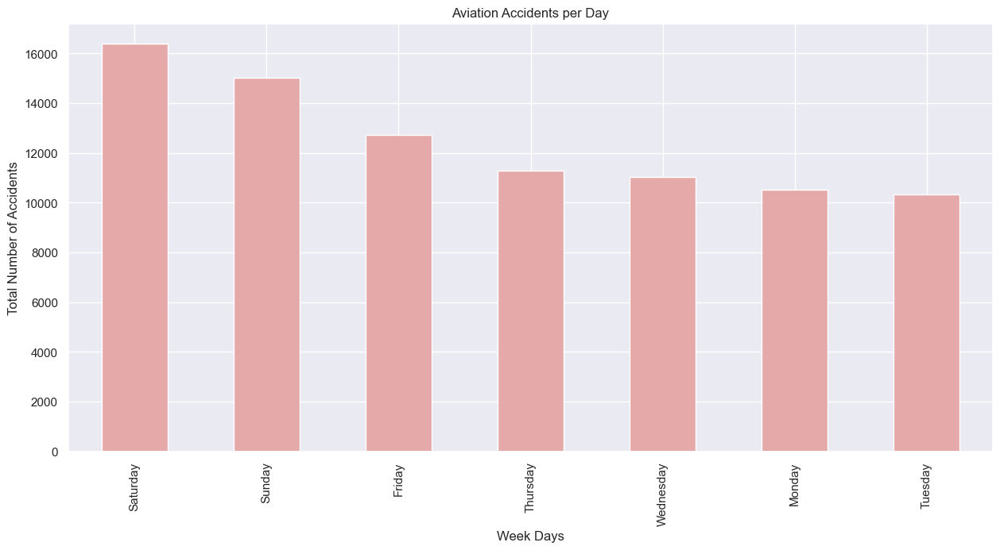

In [84]:
# Specifying the style and visualization aesthetics

plt.style.use( "seaborn-dark" )

plt.figure(figsize = (15,7))

sns.set(style = 'darkgrid')


# Extracting the name of the weekdays from Event.Date and saving it as Week column in the Aviation data set

Aviation['Week'] = Aviation['Event.Date'].dt.day_name( )


# Creating the plot

Aviation['Week'].value_counts().sort_values(ascending = False).plot(kind = 'bar', color = '#E5A9A9')

plt.xlabel('Week Days')

plt.ylabel('Total Number of Accidents')

plt.title('Aviation Accidents per Day')

plt.show( )

<span class="burk"> --INFERENCE-- </span>

    * Maximum accidents occur of Saturday and Sunday
    
    * Increased recreational activities and leisure flying on weekends.
    
    * Potential pilot fatigue from irregular work schedules and longer duty hours.
    
    * Higher passenger loads and crowded airports during weekend travel.

#### ACCIDENTS PER AVIATION PHASE OF FLIGHT

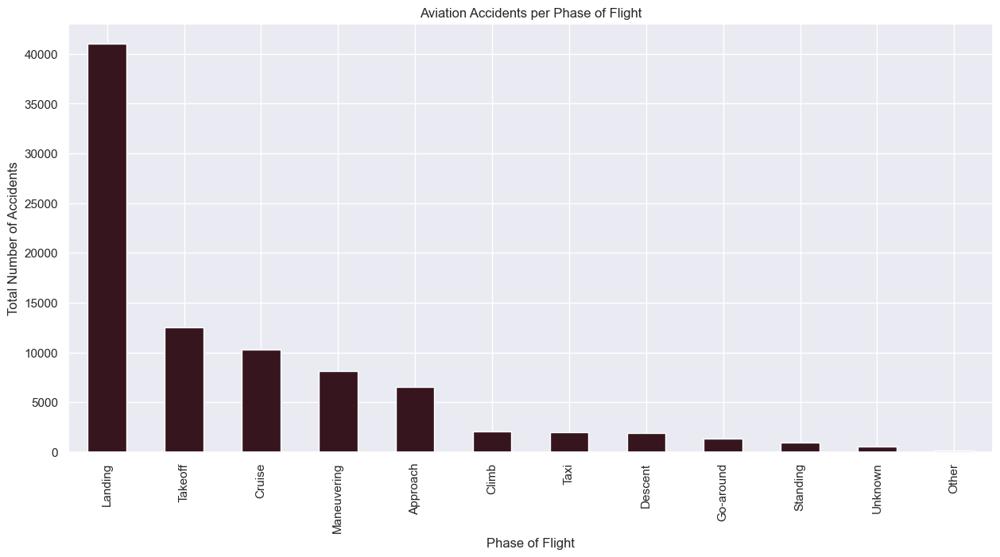

In [85]:
# Specifying the style and visualization aesthetics

plt.style.use("seaborn-dark")

plt.figure(figsize = (15 , 7))

sns.set(style = 'darkgrid')


# Creating the plot 

Aviation['Broad.phase.of.flight'].value_counts( ).sort_values(ascending = False).plot(kind = 'bar', color = '#36151E')

plt.xlabel('Phase of Flight')

plt.ylabel('Total Number of Accidents')

plt.title('Aviation Accidents per Phase of Flight')

plt.show( )

<span class="burk"> --INFERENCE-- </span>


    * We can see that the maximum number of accidents occur during the Landing phase and Take off phase, followed by 
      cruise, maneuvering and approach.
      
    * Takeoff and landing phases are critical due to complex maneuvers and proximity to the ground.
    
    * Runway conditions impact takeoff and landing safety.
    
    * These phases have a higher risk compared to other flight phases.
    
    * Ongoing vigilance is necessary during the cruise phase to prevent accidents during stable flight.
    

#### DAMAGE TYPE & WEATHER CONDITIONS

In [90]:
Aviation['Weather.Condition'].unique()

array(['UNK', 'IMC', 'VMC', 'Unk'], dtype=object)

array([<Axes: ylabel='proportion'>], dtype=object)

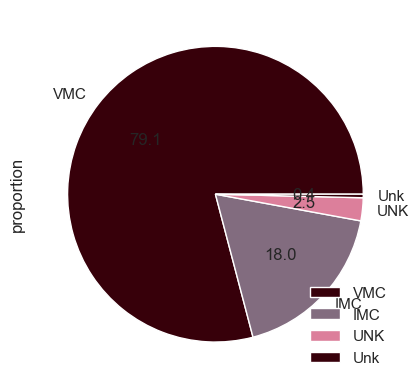

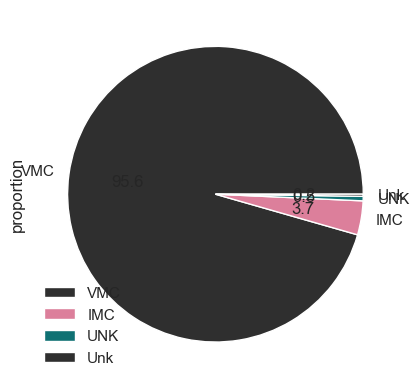

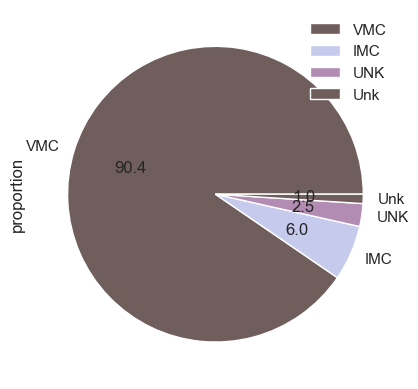

In [88]:
# Creating a DataFrame to store the normalized value counts of Weather.Condition grouped by Aircraft.damage

Weather_Damage = pd.DataFrame(Aviation['Weather.Condition'].groupby(Aviation['Aircraft.damage']).value_counts (normalize = True) * 100)


# Plotting pie chart for the 'Destroyed' category

Weather_Damage.loc['Destroyed', :].plot(kind='pie', subplots=True, autopct='%.1f', colors = ['#37000A' , '#826C7F' , '#DC7F9B'])


# Plotting pie chart for the 'Substantial' category

Weather_Damage.loc['Substantial', :].plot(kind='pie', subplots=True, autopct='%.1f', colors = ['#2F2F2F' , '#DC7F9B' , '#0F7173'])


# Plotting pie chart for the 'Minor' category

Weather_Damage.loc['Minor', :].plot(kind='pie', subplots=True, autopct='%.1f', colors = ['#6F5E5C' , '#C6CAED' , '#B38CB4'])



    * 79.1 percent of aircrafts which have been destroyed in the accidents were in visual Meteorological operations (VMC), 
      indicating a region with predominantly clear weather. 

    * 95.6 percent of aircrafts which have been substantially affected in the accidents were in visual flight operations
      (VMC )
      
    * 90.4 percent of aircrafts which have suffered minor destruction in the accidents were in visual flight operations
      (VMC).
      
    Reasons
    
        1. More aircraft in the sky during clear weather means a higher probability of accidents occurring, which can 
           result in a higher number of aircraft being destroyed.
        
        2. Pilots may perceive clear weather conditions as low-risk situations and may be more inclined to take risks or
           engage in more aggressive flying maneuvers. This behavior could increase the probability of accidents happening,
           leading to a higher proportion of destroyed aircraft.

#### DAMAGE SUSTAINED

<BarContainer object of 3 artists>

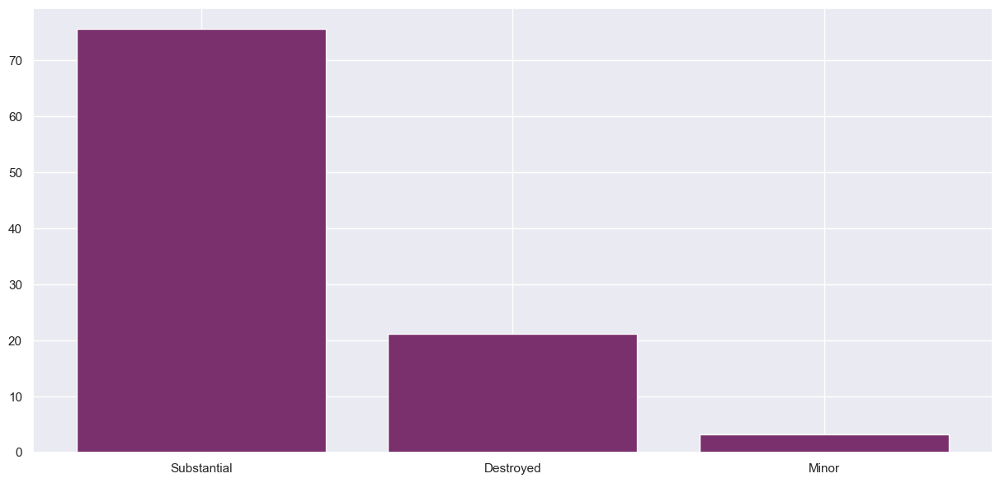

In [94]:
# Creating a surrogate dataframe for representing the Damage recorded in graphical format, since it is 
# categorical & has only 3 values

Damage = pd.DataFrame( )

Damage['Damage_Sustained'] = (Aviation['Aircraft.damage'].value_counts(normalize = True) * 100).index 

Damage['Values'] = (Aviation['Aircraft.damage'].value_counts(normalize = True) * 100).values 


# Specifying the style and visualization aesthetics

plt.style.use("seaborn-dark")

plt.figure(figsize = (15 , 7))

sns.set(style = 'darkgrid')


# Plotting the bar chart

plt.bar(x = Damage.Damage_Sustained [ 0 : 3 ] , height = Damage.Values [ 0 : 3 ] , color = '#7A306C')


#### INJURIES OVER YEARS

In [95]:
Aviation[Aviation['Investigation.Type']=='Incident']

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,Injury.Severity,Aircraft.damage,Aircraft.Category,Registration.Number,Make,Model,Amateur.Built,Engine.Type,FAR.Description,Schedule,Purpose.of.flight,Air.carrier,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Year,Month.Abbr,Week
23,20020917X02333,Incident,LAX82IA034,1982-01-03,"VAN NUYS, CA",United States,332739N,0112457W,VNY,VAN NUYS,Incident,Minor,Airplane,N5018P,Piper,PA-24-180,No,Reciprocating,Part 91: General Aviation,NSCH,Personal,Pilot,VMC,Approach,Probable Cause,03-01-1983,1.0,0.0,0.0,0.0,1.0,1982,January,Sunday
40,20020917X01764,Incident,ATL82IA029,1982-01-05,"PENSACOLA, FL",United States,332739N,0112457W,NONE,Private,Incident,Minor,Airplane,N5782N,Rockwell,114,No,Reciprocating,Part 91: General Aviation,NSCH,Business,Pilot,VMC,Cruise,Probable Cause,05-01-1983,1.0,0.0,0.0,0.0,1.0,1982,January,Tuesday
79,20020917X01897,Incident,CHI82IA026,1982-01-12,"CHICAGO, IL",United States,332739N,0112457W,ORD,CHICAGO O'HARE INTER'L,Incident,Substantial,Airplane,N31031,Lockheed,L-1011,No,Turbo Fan,Part 121: Air Carrier,SCHD,Unknown,Trans World Airlines,UNK,Cruise,Probable Cause,12-01-1983,3.0,0.0,0.0,0.0,149.0,1982,January,Tuesday
80,20020917X01765,Incident,ATL82IA034,1982-01-12,"CLARKSBURG, WV",United States,332739N,0112457W,CKB,BENEDUM,Incident,Minor,Airplane,N615KC,Embraer,EMB-110P1,No,Turbo Prop,Part 135: Air Taxi & Commuter,SCHD,Unknown,Aeromech Incorporated,VMC,Taxi,Probable Cause,12-01-1983,2.0,0.0,0.0,0.0,2.0,1982,January,Tuesday
119,20020917X01766,Incident,ATL82IA038,1982-01-19,"WASHINGTON, DC",United States,332739N,0112457W,IAD,Private,Incident,Minor,Airplane,N9240N,De Havilland,DHC-6-300,No,Turbo Prop,Part 91: General Aviation,NSCH,Ferry,Pilot,IMC,Descent,Probable Cause,19-01-1983,2.0,0.0,0.0,0.0,1.0,1982,January,Tuesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87207,20211221104430,Incident,ENG22WA005,2021-11-22,"Owerri, Nigeria",Nigeria,332739N,0112457W,NONE,Private,Non-Fatal,Substantial,Airplane,5N-BUQ,BOEING,737,N,Reciprocating,NUSC,NSCH,Personal,Air Peace Limited,VMC,Landing,Probable Cause,25-09-2020,2.0,0.0,0.0,0.0,0.0,2021,November,Monday
87215,20211129104327,Incident,DCA22WA035,2021-11-25,"Bogata, Colombia",Colombia,004426N,0074849W,BOG,El Dorado International Airpor,Non-Fatal,Minor,Airplane,N1604R,BOEING,767-332,N,Reciprocating,121,NSCH,Personal,DELTA AIR LINES INC,VMC,Landing,Probable Cause,25-09-2020,2.0,0.0,0.0,0.0,206.0,2021,November,Thursday
87229,20211207104357,Incident,DCA22WA039,2021-12-01,"Kuusamo, Finland",Finland,332739N,0112457W,NONE,Private,Non-Fatal,Substantial,Airplane,G-JZHL,BOEING,737,N,Reciprocating,NUSC,NSCH,Personal,Pilot,VMC,Landing,Probable Cause,25-09-2020,1.0,0.0,0.0,0.0,0.0,2021,December,Wednesday
87266,20211220104425,Incident,DCA22WA051,2021-12-13,"West Sumatera, Indonesia",Indonesia,332739N,0112457W,NONE,Private,Non-Fatal,Substantial,Airplane,PK-LQR,BOEING,737,N,Reciprocating,129,SCHD,Personal,PT. Lion Mentari Airlines,VMC,Landing,Probable Cause,25-09-2020,1.0,0.0,0.0,0.0,203.0,2021,December,Monday


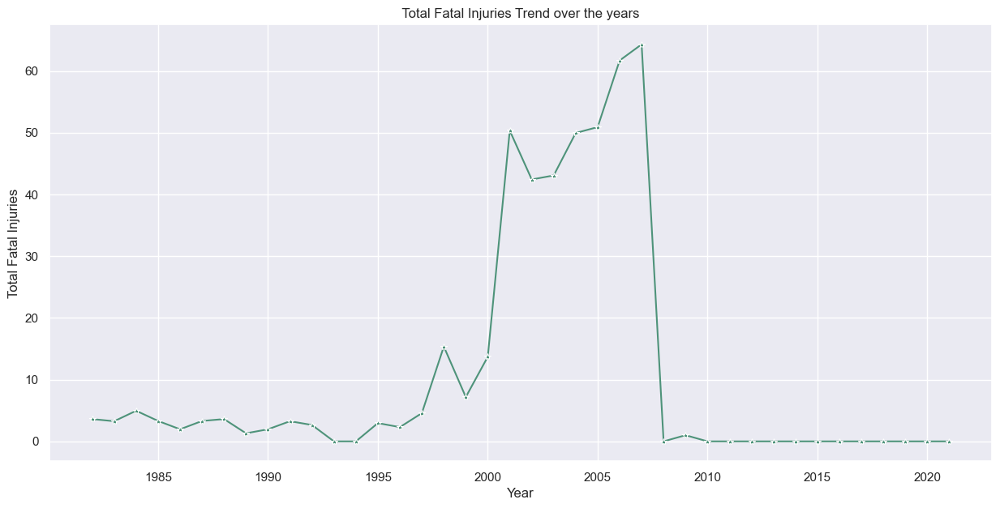

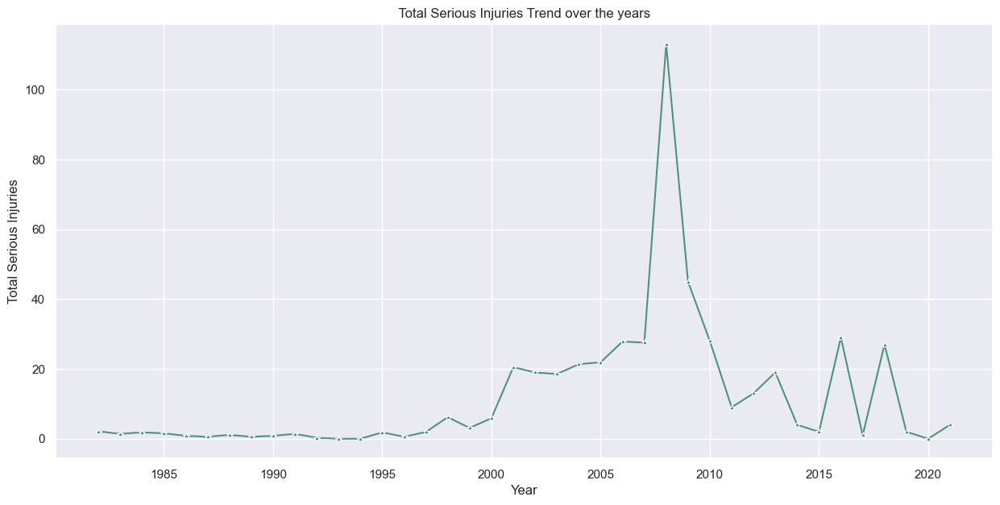

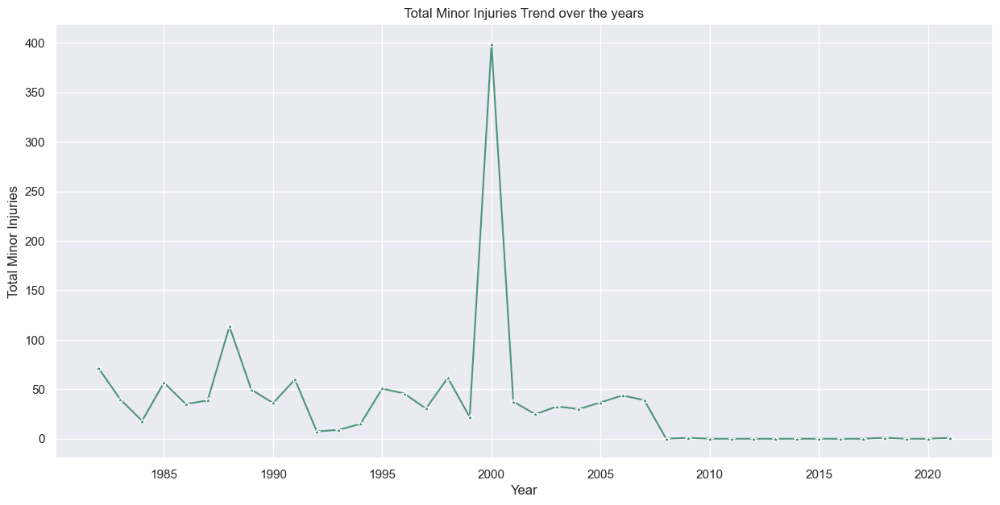

In [96]:
# Creating a separate dataframe to save the Injuries associated with Incident Type

# This is done to see how much injuries were sustained during the incidents

# It is grouped Year wise

Incident = Aviation[Aviation['Investigation.Type']=='Incident']

Incident_injuries = Incident.groupby('Year')[['Total.Fatal.Injuries','Total.Serious.Injuries','Total.Minor.Injuries']].sum().reset_index()


# Plotting the graphs for each kind of injuries over the years

for i in ['Total.Fatal.Injuries','Total.Serious.Injuries','Total.Minor.Injuries'] :
    
    plt.figure(figsize = ( 15 , 7 ))

    sns.lineplot(x = 'Year' , y =  i , data = Incident_injuries , color = '#4E937A' , marker = '*')
    
    plt.xlabel('Year')
    
    plt.ylabel(' '.join(i.split( '.' )))
    
    plt.title(" {} Trend over the years ".format(' '.join(i.split( '.' ))))

    * A spike in Total Fatal Injuries have been recorded in between the year 2000 to 2008.
    
        - It could indicate a potential issue in safety measures or an increase in high-risk activities during that time.
    
    * A spike in Total Serious Injuries have been recorded in between the year 2007 to 2010.
    
        - Similar to the first insight, this could signify a temporary lapse in safety measures or a higher occurrence of
          risky situations
    
    * A spike in Total Minor Injuries have been recorded in between the year 1998 to 2002.
    
        - It might imply that there were more incidents with less severe consequences during this period, but still
          requiring medical attention or treatment.

#### FATALITIES BASED ON ENGINE TYPE

<Axes: xlabel='Engine.Type', ylabel='Total.Fatal.Injuries'>

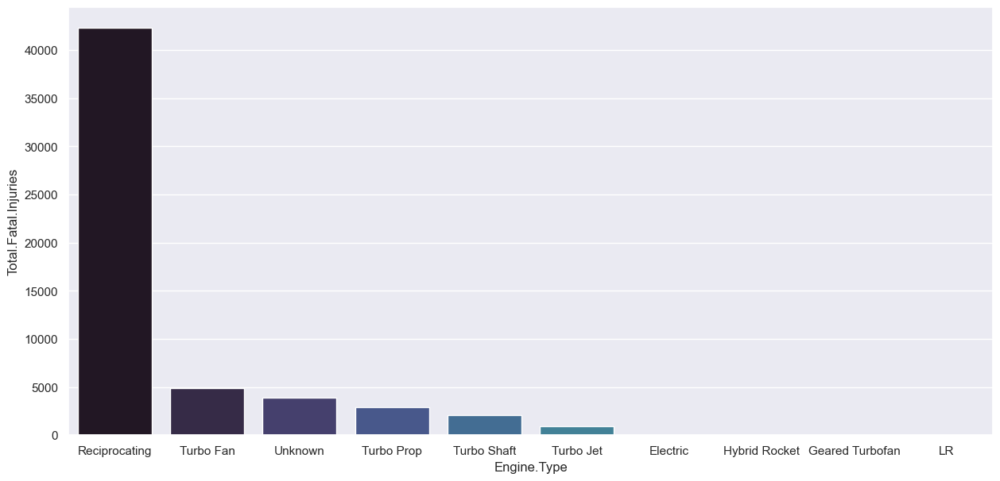

In [108]:
# Plotting the graph of Engine Type and Fatal Injuries recorded for each kind.

plt.figure(figsize = ( 15 , 7 ))

sns.barplot(x = 'Engine.Type',y='Total.Fatal.Injuries', data = Aviation.groupby("Engine.Type")['Total.Fatal.Injuries'].sum().reset_index().sort_values(by = ['Total.Fatal.Injuries'], ascending= False) , palette = 'mako')

    * Maximum number of fatalities are associated with the Reciprocating engine type
    
        Reciprocating engines are commonly used in smaller aircraft, which are more prone to accidents and have fewer 
        safety features, resulting in a higher number of fatalities in those incidents.
    
    * Followed by Turbofan
    
        Turbofan engines are typically used in commercial airliners, which carry a larger number of passengers. 
        
        In the event of an accident, the higher passenger capacity of these aircraft can contribute to a higher number of 
        fatalities.
    
    * But is it noticed that Turbojet engines have the least amount of fatalities
    
        Turbojet engines are generally used in supersonic military aircraft or high-performance jets. 
        
        These aircraft often have advanced safety systems and are designed for specific missions, which may reduce the
        occurrence of accidents and resulting fatalities.

#### DAMAGE TYPE & NUMBER OF ENGINES 

array([<Axes: ylabel='count'>], dtype=object)

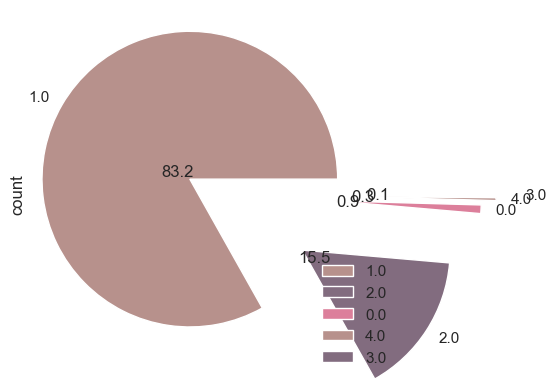

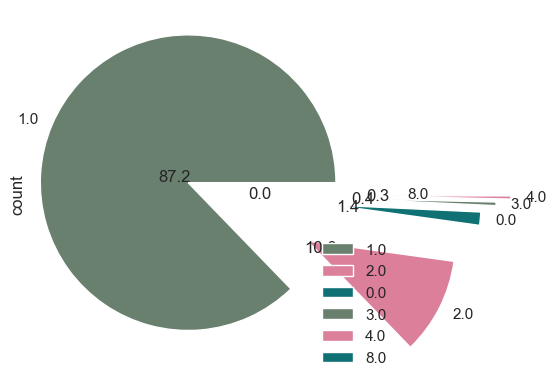

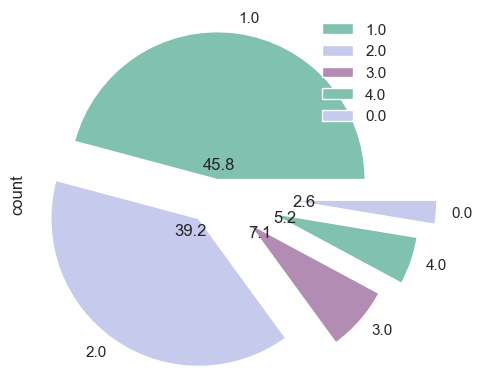

In [109]:
Engine_Damage = pd.DataFrame(Aviation['Number.of.Engines'].groupby(Aviation['Aircraft.damage']).value_counts ( ))

# Plotting the first pie chart for 'Destroyed' category

explode_values = [0.2, 0.7, 0.8, 0.9 , 1.0 ]  # Adjust the explode values as needed

Engine_Damage.loc['Destroyed', :].plot(
    
    kind = 'pie',
    
    subplots = True,
    
    autopct = '%.1f',
    
    colors = ['#B7918C', '#826C7F', '#DC7F9B'],
    
    explode = explode_values ,  pctdistance = 0.1 )# Adjust the distance of data labels from the center of each pie slice



explode_values = [0.2, 0.7, 0.8, 0.9, 1 , 0.2 ]

Engine_Damage.loc['Substantial', :].plot(
   
    kind = 'pie',
   
    subplots = True,
   
    autopct = '%.1f',
   
    colors = ['#6A806E', '#DC7F9B', '#0F7173'],
   
    explode = explode_values ,  pctdistance = 0.1 )


explode_values = [0.1, 0.2, 0.3, 0.4, 0.5]

Engine_Damage.loc['Minor', :].plot(kind = 'pie',
                                  
                                   subplots = True,
                                  
                                   autopct = '%.1f',
                                  
                                   colors = ['#80C2AF', '#C6CAED', '#B38CB4'],
                                  
                                   explode = explode_values ,  pctdistance = 0.1 )

    * 83.2 percent of the aircrafts that have been destroyed in the accidents had one engine

    * 87.2 percent of the aircrafts that suffered substantial effects had one engine

    * 45.8 percent of the aircrafts that suffered minor effects had one engine

    * We can see that as the number of engines increase, they get less into accidents and are relatively safer

    - REASONS

         * Multiple engines provide redundancy, meaning that if one engine fails, the remaining engines can compensate for
           the loss of power. 

         * This redundancy improves the overall reliability and safety of the aircraft. In contrast, a single-engine 
           aircraft has a higher risk of accidents in the event of engine failure.

         *  Multi-engine aircraft, especially those with more advanced engines, often offer better performance 
            characteristics such as higher thrust, better fuel efficiency, and improved climb rates. 

         * These performance advantages contribute to better operational capabilities and increased safety margins.

### DATA TRANSFORMATION : CATEGORICAL TO NUMERIC

In [113]:
## Dropping Columns that don't contribute to the data set

Drop = ['Publication.Date','Report.Status','FAR.Description','Model','Accident.Number','Registration.Number' ,'Latitude','Longitude']

Aviation.drop(columns = Drop , axis = 1 , inplace = True )

In [114]:
## Replacing the Unknown Values with Mode 

for i in Aviation:
    
    if Aviation[i].dtype == 'object' : 
        
        Aviation[i] = Aviation[i].str.title( )
        
        if 'Unknown' in Aviation[i].values: 
            
            Aviation[i].replace({'Unknown' : Aviation[i].mode( )[0]}, inplace = True)
            

### Encoding for Target Variable

In [115]:
Aviation['Aircraft.damage'].unique()

array(['Destroyed', 'Substantial', 'Minor'], dtype=object)

In [116]:
# Replacing the values in target variables 

Aviation['Aircraft.damage'].replace({'Substantial' : 1 , 'Minor' : 0 , 'Destroyed' : 2 } ,inplace = True)

In [117]:
# Extracting catrgorical data

Categorical_Data = Aviation.select_dtypes('object').columns.to_list ( )
Categorical_Data

['Event.Id',
 'Investigation.Type',
 'Location',
 'Country',
 'Airport.Code',
 'Airport.Name',
 'Injury.Severity',
 'Aircraft.Category',
 'Make',
 'Amateur.Built',
 'Engine.Type',
 'Schedule',
 'Purpose.of.flight',
 'Air.carrier',
 'Weather.Condition',
 'Broad.phase.of.flight',
 'Month.Abbr',
 'Week']

In [118]:
## Using Label encoding to convert all the categorical variables to numeric variables

## There is no inherent order noticed in the categorical variables that has a direct impact on the target variable

LE = LabelEncoder ( )

Aviation[Categorical_Data] = Aviation[Categorical_Data].apply(LE.fit_transform )

In [119]:
Aviation

,Event.Id,Investigation.Type,Event.Date,Location,Country,Airport.Code,Airport.Name,Injury.Severity,Aircraft.damage,Aircraft.Category,Make,Amateur.Built,Engine.Type,Schedule,Purpose.of.flight,Air.carrier,Weather.Condition,Broad.phase.of.flight,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Year,Month.Abbr,Week
0,45208,0,1948-10-24,12645,195,7727,15407,42,2,0,6421,1,4,0,19,9080,1,2,1.0,2.0,0.000000,0.000000,0.000000,1948,10,3
1,45211,0,1962-07-19,2281,195,7727,15407,68,2,0,5153,1,4,0,19,9080,1,5,1.0,4.0,0.000000,0.000000,0.000000,1962,5,4
2,60529,0,1974-08-30,16922,195,7727,15407,60,2,0,1226,1,4,0,19,9080,0,2,1.0,3.0,0.280921,0.360814,5.311847,1974,1,0
3,45212,0,1977-06-19,5997,195,7727,15407,42,2,0,5642,1,4,0,19,9080,0,2,1.0,2.0,0.000000,0.000000,0.000000,1977,6,3
4,56803,0,1979-08-02,2891,195,7727,15407,1,2,0,1226,1,4,0,19,9080,2,0,1.0,1.0,2.000000,0.360814,0.000000,1979,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87277,86364,0,2021-12-21,1026,195,7727,15407,0,2,0,1321,0,4,0,19,9080,2,5,1.0,1.0,0.000000,0.000000,0.000000,2021,2,5
87278,86368,0,2021-12-22,969,195,7727,15407,105,1,0,1226,0,4,0,20,4794,2,5,1.0,0.0,0.000000,1.000000,0.000000,2021,2,6
87279,86366,0,2021-12-26,7934,195,7727,15407,0,1,0,1226,0,4,0,19,9080,2,5,1.0,2.0,0.000000,0.000000,0.000000,2021,2,3
87280,86369,0,2021-12-29,11516,195,7727,15407,105,1,0,1226,0,4,0,19,4370,2,5,1.0,0.0,3.000000,0.000000,0.000000,2021,2,6


### HEATMAP

<Axes: >

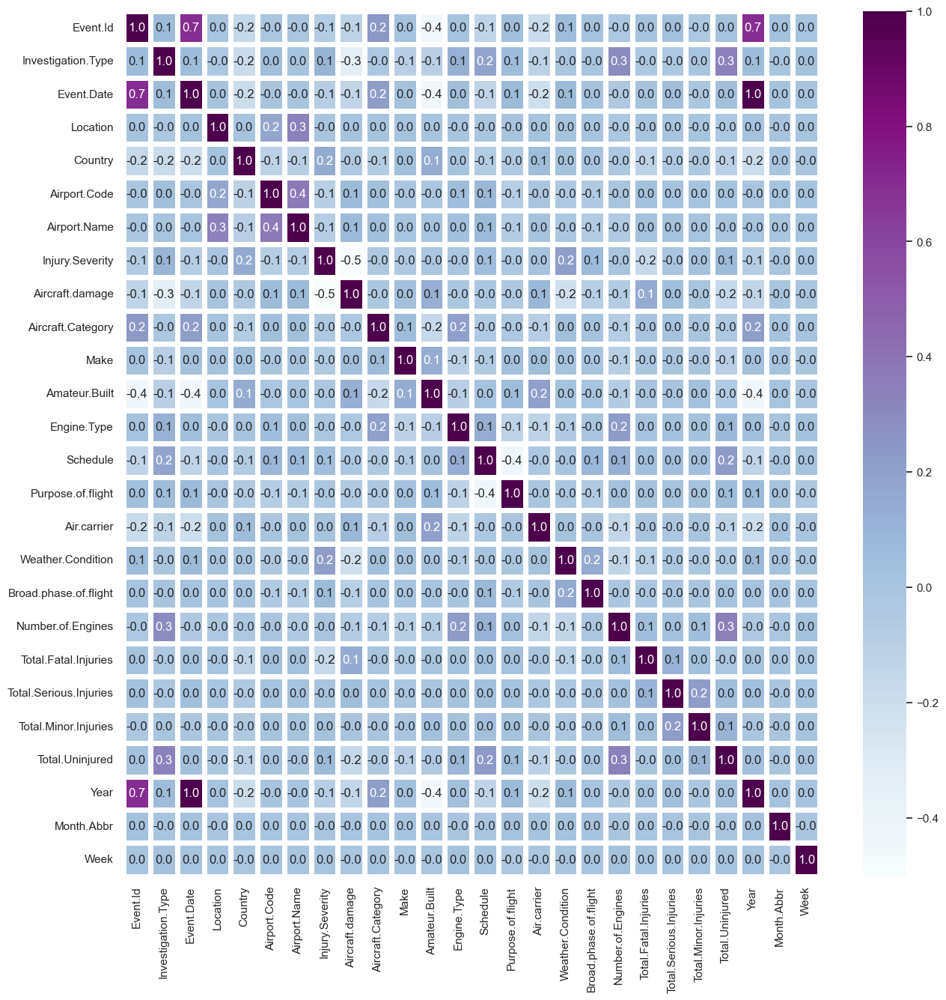

In [123]:
Correlation = Aviation.corr( )  # Calculate the correlation matrix

plt.figure(figsize=(15 , 15)) # Create a figure for the heatmap plot with a specific size


# Generate a heatmap plot using seaborn library

sns.heatmap(Correlation , annot = True, cmap = 'BuPu', linewidths = 5, fmt = '.1f', cbar = True)

    * Event.Id is highly correlated with Year 
    
        This suggests that the event identifier contains information related to the temporal aspect of the event, 
        such as the year it occurred.
        
    * Injury.Severity is highly correlated with Total.Fatal.Injuries 
    
        This implies that as the number of fatal injuries increases, the severity of injuries tends to be higher
    
    * Purpose.of.flight is highly correlated with Schedule 
    
        This suggests that the purpose of the flight can influence or determine the schedule of the flight.
    
    * Aircraft.damage is highly correlated with Investigation.Type 
    
        This suggests that the severity or type of damage can influence the chosen investigation approach.
    
    * Amateur.Built is highly correlated with Event.Id  
    
        This implies that the event identifier may contain information related to whether the incident involved an 
        amateur-built aircraft.
    

### OUTLIERS 

    * Outliers are data points that deviate significantly from the majority, and it is important to address them 
      because they can distory statistical analyses, affect model accuracy, and introduce bias in decision-making.
      
    * Ways to identify outliers :
        
        1. Boxplots
        
        2. Histograms
        
        3. Scatter plots
        
        4. Z-score 
        
          Calculate the z-score for each data point and consider values beyond a certain threshold (e.g., ±3) as outliers.

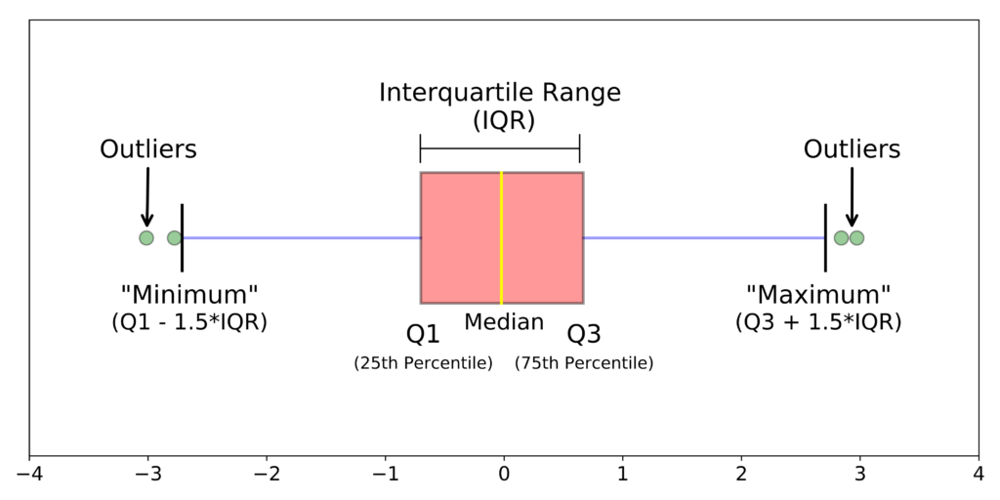

#### GRAPHICAL REPRESENTATION

        >> The following graphs are the box plots of select few columns which have the most number of outliers,

        >> The columns have been selected manually.

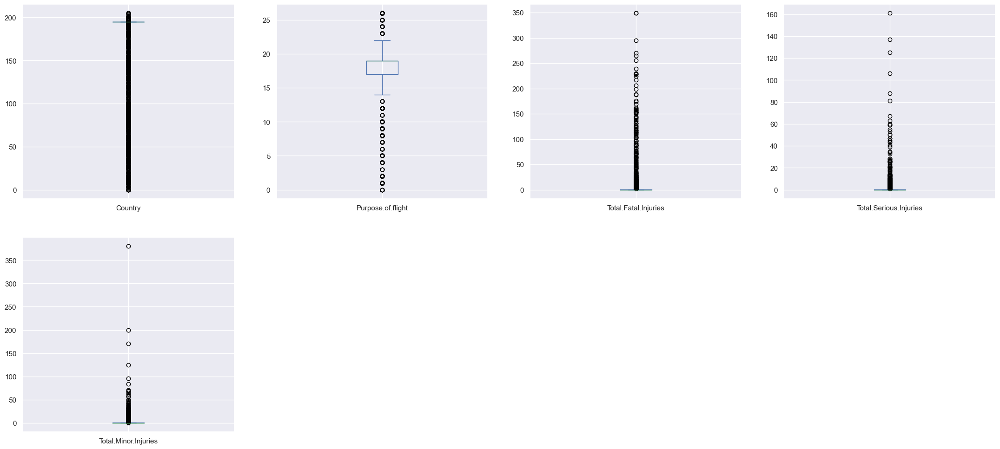

In [28]:
Aviation.iloc[ : , [ 4 , 14 , 19 , 20 , 21 ] ].plot( kind = "box", subplots = True, layout = ( 4 , 4 ), figsize = ( 27 , 25 ) ,sharex = False, sharey = False);

#### TREATMENT

     * Treating outliers in discrete data involves different approaches compared to continuous data. 
     
     * Since discrete data consists of distinct and limited values, outliers can have different implications and require
       specific treatment methods. 
       
         * Deleting Outliers
         

In [124]:
Discrete_Columns = [ 'Number.of.Engines' , 'Total.Fatal.Injuries' , 'Total.Minor.Injuries' , 'Total.Serious.Injuries' , 'Total.Uninjured' ]

## Checking for outliers beyond the upper and lower quartiles and in min and max values

Aviation[Discrete_Columns].describe( )

,Number.of.Engines,Total.Fatal.Injuries,Total.Minor.Injuries,Total.Serious.Injuries,Total.Uninjured
count,87282.000000,87282.000000,87282.000000,87282.000000,87282.000000
mean,1.137440,0.652772,0.360814,0.280921,5.311847
std,0.433648,5.148114,2.097714,1.441544,26.937712
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,1.000000
75%,1.000000,0.652772,0.360814,0.280921,2.000000
max,8.000000,349.000000,380.000000,161.000000,699.000000


In [125]:
# Define the percentile threshold for deleting outliers

percentile_threshold = 95 

for column in Discrete_Columns:
    
    threshold = np.percentile(Aviation[column], percentile_threshold)
    
    Aviation = Aviation[Aviation[column] <= threshold]

In [126]:
## Checking for outliers beyond the upper and lower quartiles and in min and max values, after the outlier treatment 

Aviation[Discrete_Columns].describe( )

,Number.of.Engines,Total.Fatal.Injuries,Total.Minor.Injuries,Total.Serious.Injuries,Total.Uninjured
count,74651.000000,74651.000000,74651.000000,74651.000000,74651.000000
mean,1.080575,0.329366,0.258952,0.149777,1.425432
std,0.318830,0.566906,0.496265,0.312286,1.473954
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,1.000000
75%,1.000000,0.652772,0.360814,0.280921,2.000000
max,2.000000,2.000000,2.000000,1.000000,5.311847


## RANDOM SAMPLING

### FEATURE ENGINEERING

     Effective feature engineering can uncover hidden patterns, capture complex relationships, handle data limitations, 
     and enhance the predictive power of a model, ultimately leading to better insights and more accurate predictions.

#### FEATURE SELECTION

    Select the most relevant features that are likely to have a significant impact on the target variable.
    
    Methods Used :
    
        1. Random Forest Feature Importance
        
        2. L1 Regularization
        
        3. SelectKBest
        
        4. Recursive Feature Elimination
        
        5. Variance Inflation Factor
        

A high VIF indicates that the independent variable is highly correlated with other independent variables in the mode [multicollinearity]
    
    This can cause problems with the model, such as:

       * The model may be unstable and difficult to interpret.
    
       * The model may be sensitive to small changes in the data.
    
       * The model may have poor predictive performance.
  
  
       >> OUTLIERS & VIF VALUES
  
     - Outliers have the potential to increase the VIF values of independent variables that are correlated with them. 
    
     - This occurs because outliers can create a perception of stronger correlation between the independent variables, 
       exaggerating their actual level of correlation.

In [128]:
# Create a new DataFrame with only independent variables for variance inflation factor analysis

New_Aviation = Aviation.drop(['Event.Date'  , 'Aircraft.damage'] , axis = 1) 

# Calculate the VIF for each predictor variable

VIF_Scores = pd.DataFrame( ) 

VIF_Scores["Feature"] = New_Aviation.columns

VIF_Scores["VIF"] = [variance_inflation_factor(New_Aviation.values, i) for i in range(New_Aviation.shape[ 1 ])]

# Print the VIF scores

print(VIF_Scores)

# Set a threshold for VIF

threshold = 15

# Select features with VIF below the threshold

selected_features = VIF_Scores[VIF_Scores['VIF'] < threshold]['Feature'].values

# Create a new DataFrame with the selected features

NEW_Aviation_X = New_Aviation[selected_features]

                   Feature         VIF
0                 Event.Id    5.800781
1       Investigation.Type    1.157809
2                 Location    4.487369
3                  Country   59.053194
4             Airport.Code    9.745639
5             Airport.Name    8.709293
6          Injury.Severity   19.082714
7        Aircraft.Category    1.198063
8                     Make    2.866209
9            Amateur.Built    3.661084
10             Engine.Type   25.410182
11                Schedule    1.582812
12       Purpose.of.flight   17.520098
13             Air.carrier   28.270143
14       Weather.Condition   19.825766
15   Broad.phase.of.flight    5.110576
16       Number.of.Engines   13.664120
17    Total.Fatal.Injuries    3.604126
18  Total.Serious.Injuries    1.293747
19    Total.Minor.Injuries    1.335519
20         Total.Uninjured    2.129532
21                    Year  215.406309
22              Month.Abbr    3.578840
23                    Week    3.248972


In [129]:
# Concatenate the 'NEW_Aviation_X' and 'Aircraft.damage' columns of the 'Aviation' DataFrame 

# along the axis=1 (i.e., columns-wise concatenation)

Aviation = pd.concat([NEW_Aviation_X , Aviation['Aircraft.damage']], axis = 1 )
Aviation

,Event.Id,Investigation.Type,Location,Airport.Code,Airport.Name,Aircraft.Category,Make,Amateur.Built,Schedule,Broad.phase.of.flight,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Month.Abbr,Week,Aircraft.damage
0,45208,0,12645,7727,15407,0,6421,1,0,2,1.0,2.0,0.0,0.0,0.0,10,3,2
3,45212,0,5997,7727,15407,0,5642,1,0,2,1.0,2.0,0.0,0.0,0.0,6,3,2
7,49012,0,15796,7727,1757,0,1226,1,0,9,1.0,0.0,0.0,0.0,2.0,4,0,1
8,49011,0,5416,7553,8058,0,1226,1,0,5,2.0,0.0,0.0,0.0,2.0,4,0,1
10,49009,0,8415,7727,15407,0,5153,1,0,0,1.0,0.0,0.0,0.0,1.0,4,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87276,86361,1,13653,7727,15407,0,5153,0,0,5,1.0,0.0,0.0,0.0,0.0,2,5,1
87277,86364,0,1026,7727,15407,0,1321,0,0,5,1.0,1.0,0.0,0.0,0.0,2,5,2
87278,86368,0,969,7727,15407,0,1226,0,0,5,1.0,0.0,0.0,1.0,0.0,2,6,1
87279,86366,0,7934,7727,15407,0,1226,0,0,5,1.0,2.0,0.0,0.0,0.0,2,3,1


      MERGING THE VALUES : MINOR & SUSTAINED INTO ONE VALUE FOR BETTER PERFORMANCE ANALYSIS
      
      
      1. Minor + Sustained: 
      
          * This category can include accidents where the damage is limited to specific areas of the aircraft, such as 
            landing gear, engines, or control surfaces, and the aircraft remains largely intact. 

          * It may also include accidents with moderate damage but without complete destruction or disintegration.
          
          
      2. Destroyed: 
      
          * This category encompasses accidents where the damage is extensive and renders the aircraft irreparable or leads 
            to disintegration. 
             
          * It may include accidents involving severe fire or explosion, complete structural failure, or widespread 
            wreckage.


#### Now will convert multi class classification to binary classification 

In [130]:
Aviation['Aircraft.damage'].replace({1 : 0 , 2 : 1},inplace = True )

### TRAIN TEST SPLIT 

In [131]:
# Sampling the data set and dividing it into train and test, Further dividing it into train_X and Train_Y

Train , Test = train_test_split(Aviation , test_size = 0.2 , random_state = 42 ) 

Train_X = Train.drop(['Aircraft.damage'], axis = 1)

Train_Y = Train['Aircraft.damage']

Test_X = Test.drop(['Aircraft.damage'], axis = 1)

Test_Y = Test['Aircraft.damage']

print("The shapes of the data sets are : ")

print("\nTrain >> {} , Test >> {}\n\nTrain_X >> {} , Train_Y >> {}\n\nTest_X >> {} , Test_Y >> {}".format(Train.shape , Test.shape , Train_X.shape , Train_Y.shape , Test_X.shape , Test_Y.shape))

The shapes of the data sets are : 

Train >> (59720, 18) , Test >> (14931, 18)

Train_X >> (59720, 17) , Train_Y >> (59720,)

Test_X >> (14931, 17) , Test_Y >> (14931,)


In [132]:
Train_Y.value_counts()

Aircraft.damage
0    48605
1    11115
Name: count, dtype: int64

In [134]:
Train_Y.value_counts(normalize =True)*100

Aircraft.damage
0    81.388145
1    18.611855
Name: proportion, dtype: float64

## PREDICTIVE ANALYSIS

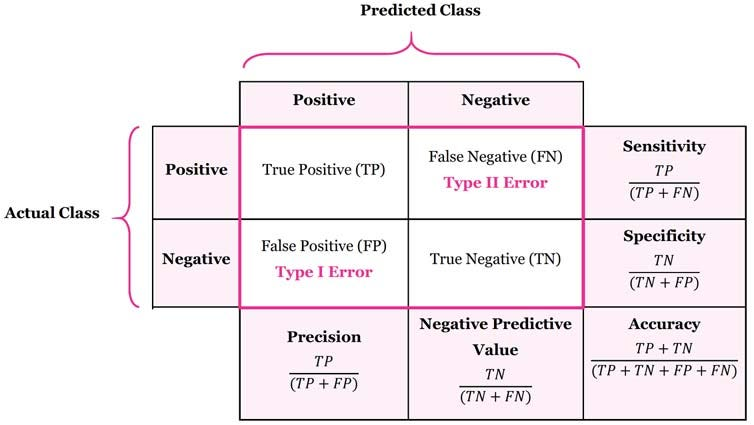

### LOGISTIC REGRESSION

In [135]:
# Fitting or Training the Logistic regression model on the train x and train y data setsabs

LR = LogisticRegression( )

LR.fit(Train_X ,Train_Y)


# Using the trained model to predict on Test data set 

Y_LR = LR.predict(Test_X)


# Evaluating the performance metrics like accuracy , precision, recall and F1 Score


# Accuracy of the LR model on test data, it tells us about the overall performance of the model

Accuracy_LR = accuracy_score(Test_Y , Y_LR) * 100 


# Precision is needed because Accuracy is easily influenced by a dominating class. about the predictive performance 

# of a classification model, specifically regarding the positive predictions made by the model.

Precision_LR = precision_score(Test_Y , Y_LR) * 100 


# Recall measures the proportion of actual positive instances (or true positives) that were correctly identified.

Recall_LR = recall_score(Test_Y , Y_LR) * 100 


# The F1 score is the harmonic mean of precision and recall, and it balances the trade-off between these two metrics.abs

# It is not affected by Class Imbalance and True Negative which usually takes up a lot of place in the classification

F1_Score_LR = f1_score(Test_Y , Y_LR) * 100


# Printing the values

print ( "The performance metrics of the Test Data is : \n" )

print ( "Accuracy = {}%\n\nPrecision = {}%\n\nRecall = {}%\n\nF1 Score = {}%".format ( Accuracy_LR , Precision_LR , Recall_LR , F1_Score_LR) )

The performance metrics of the Test Data is : 

Accuracy = 81.7627754336615%

Precision = 100.0%

Recall = 0.03671071953010279%

F1 Score = 0.07339449541284403%


Text(0.5, 1.0, 'Confusion Matrix')

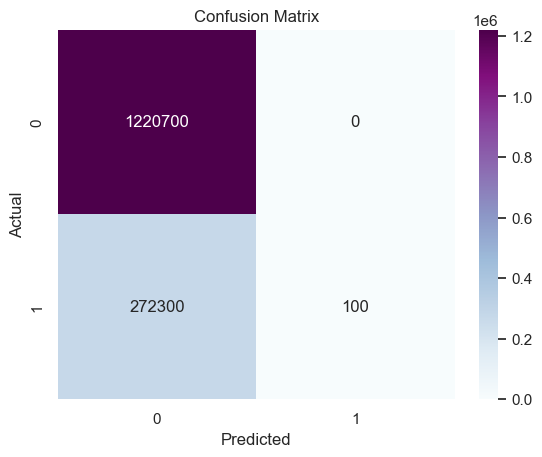

In [137]:
Confusion_Matrix_LR = confusion_matrix(Test_Y , Y_LR) * 100

sns.heatmap(Confusion_Matrix_LR , annot = True , fmt='.0f' , cmap = 'BuPu')

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

# We can see that there is a class imbalace, that is class is underrepresented.

<span class="burk">-    INFERENCE</span>

    * From the above confusion matrix we can tell that there is a significant class imbalance, mainly because of poor data 
      quality.
      
    * The recall score and precision score is alarmingly low.

    * The accuracy appears to be good, because of the dominating class 0.

<span class="birk">-  REASONS</span>

    * Class Imbalance
    
        - Complex Data
        
        - Natural Occurrence 
        
        - Errors during labeling process
        
    * Class Misclassification
    
        - Irrelevant Features
        
        - Inconsistent Data
        
        - Class Imbalance
        
        - Poor Data Quality
        
<span class="girk">- SOLUTION</span>

    * Class Imbalance
    
        - Boosting
        
        - Over Sampling
        
        - Under Sampling
        
        - Data Re-sampling
    
    * Misclassification
    
        - Feature Engineering
        
            > Feature Scaling
        
        - Hyper parameter tuning
        
        - Boosting
        

#### CHECKING FOR OVERFITTING 

    - By comparing the training and testing accuracy scores, you can get an indication of over fitting. 
    
    - If the training accuracy is significantly higher than the testing accuracy, it could suggest that the model is over
      fitting to the training data.

In [138]:
train_predictions = LR.predict(Train_X)

test_predictions = LR.predict(Test_X)

train_accuracy = accuracy_score(Train_Y, train_predictions) * 100

test_accuracy = accuracy_score(Test_Y, test_predictions) * 100

# If the values are close by or in the same vicinity then there is no overfitting ocurrinabsg

print ( "Train Accuracy >> {}\n\nTest Accuracy >> {}".format ( train_accuracy , test_accuracy ) )

Train Accuracy >> 81.38647019423979

Test Accuracy >> 81.7627754336615


### UNDER SAMPLING 

RandomUnderSampler is a technique used to address class imbalance in a dataset by randomly reducing the number of samples in the majority class, creating a more balanced dataset and potentially improving the model's ability to predict the minority class accurately.


In [139]:
# Create the under samplier instance 

undersampler = RandomUnderSampler( random_state = 42 )

# Undersample the majority class

Train_X, Train_Y = undersampler.fit_resample(Train_X , Train_Y)

Test_X, Test_Y = undersampler.fit_resample(Test_X , Test_Y)

print ( "\nTrain >> {} , Test >> {}\n\nTrain_X >> {} , Train_Y >> {}\n\nTest_X >> {} , Test_Y >> {}".format ( Train.shape , Test.shape , Train_X.shape , Train_Y.shape , Test_X.shape , Test_Y.shape) )


Train >> (59720, 18) , Test >> (14931, 18)

Train_X >> (22230, 17) , Train_Y >> (22230,)

Test_X >> (5448, 17) , Test_Y >> (5448,)


In [140]:
display(Train_Y.value_counts( ))

Test_Y.value_counts( )

Aircraft.damage
0    11115
1    11115
Name: count, dtype: int64

Aircraft.damage
0    2724
1    2724
Name: count, dtype: int64

### DECISION TREE

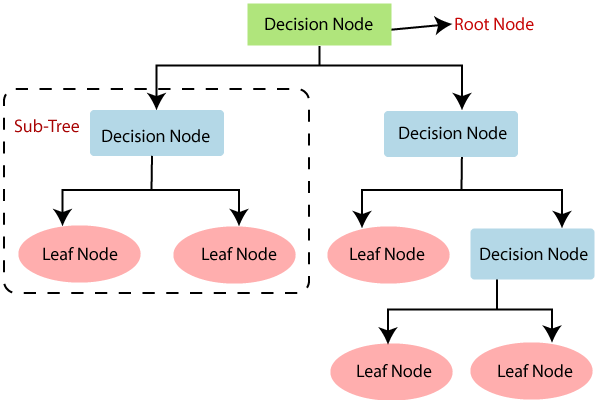

#### HYPER PARAMETER TUNING

        * CV = Cross-validation is a re-sampling technique used to assess the performance of a model on an independent 
          dataset.
        
        
        * It involves splitting the available data into multiple subsets or folds, training the model on a subset of the 
          data, and evaluating its performance on the remaining fold. 
        
        
        * The choice of the value for "k" determines how the data is partitioned. Common values for "k" include 5, 10, or 
          even higher values.
        
        * The number of folds or subsets used in cross-validation is denoted by "k" and is often referred to as k-fold 
          cross-validation. 

In [141]:
# Setting up the parameters in dictionary of lists format, in order to find which parameter provides best results

Parameters = {
    
    'criterion': ['gini', 'entropy'],
    
    'max_depth': [ 5, 10, 15, 20],
    
    'min_samples_split': [ 5, 10],
    
 }


# Initializing the algorithm

DT = DecisionTreeClassifier()


# Performing grid search, which finds the appropriate parameter iteratively.

grid_search = GridSearchCV( DT, Parameters, cv = 5 )

grid_search.fit(Train_X ,Train_Y)

Params = grid_search.best_params_

# Printing the best parameters 

print("Best Hyperparameters: ", grid_search.best_params_)

print("\nBest Accuracy Score: ", grid_search.best_score_)

Best Hyperparameters:  {'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 5}

Best Accuracy Score:  0.8238866396761134


#### TEST

In [142]:
# Initializing Decision Tree Algorithm with the best parameters

DT = DecisionTreeClassifier(**Params)


# Training the decision tree algorithm on train data

DT.fit(Train_X ,Train_Y)


# Predicting the target variables on unseen data / test data

threshold = 0.333

Y_DT = DT.predict_proba(Test_X)[:, 1] >= threshold

# Performance Metrics : Accuracy , Precision , Recall and F1 score 

Accuracy_DT = accuracy_score( Test_Y , Y_DT ) * 100 

Precision_DT = precision_score ( Test_Y , Y_DT ) * 100 

Recall_DT = recall_score ( Test_Y , Y_DT ) * 100

F1_Score_DT = f1_score ( Test_Y , Y_DT ) * 100

print ( "The performance metrics of the Test Data is : \n" )

print ( "Accuracy = {} %\n\nPrecision = {} %\n\nRecall = {} %\n\nF1 Score = {} %".format ( Accuracy_DT  , Precision_DT  , Recall_DT  , F1_Score_DT ) )

The performance metrics of the Test Data is : 

Accuracy = 80.56167400881057 %

Precision = 78.1916694886556 %

Recall = 84.76505139500733 %

F1 Score = 81.34578122247666 %


Text(0.5, 1.0, 'Confusion Matrix')

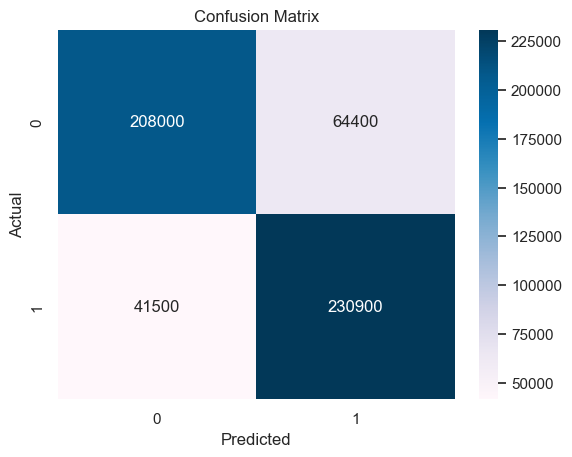

In [146]:
Confusion_Matrix_DT = confusion_matrix ( Test_Y , Y_DT ) * 100

sns.heatmap ( Confusion_Matrix_DT , annot = True , fmt='.0f' , cmap = 'PuBu' )

plt.xlabel ( "Predicted" )

plt.ylabel ( "Actual" )

plt.title ( "Confusion Matrix" )

<span class="burk">-    INFERENCE</span>

    * From the above confusion matrix we can tell that there is an improvement in Precision and Recall score 

    * But the class imbalance problem and misclassification still persists.

    * The overall accuracy appears to be good, because of the dominating class 0.
    
    * But there is a chance that the model has memorized the patterns instead of learning them resulting in Over fitting
    
    
<span class="birk">- REASONS</span>

    * Complex Model Architecture 
    
    * Lack of regularization
    
    * Imbalanced Data
    
    
<span class="girk">- SOLUTION</span>

    * Cross Validation
    
    * Feature Selection
    
    * Regularization
    
    * Model Simplification
    
    * Boosting


#### CHECKING FOR OVERFITTING 

In [147]:
# Predict the labels for the training set using the Decision Tree model

train_predictions = DT.predict(Train_X)


# Predict the labels for the test set using the Decision Tree  model

test_predictions = DT.predict(Test_X)


# Calculate the accuracy of the Decision Tree  model on the training set

train_accuracy = accuracy_score(Train_Y, train_predictions) * 100


# Calculate the accuracy of the Decision Tree model on the test set

test_accuracy = accuracy_score(Test_Y, test_predictions) * 100


print ( "Train Accuracy >> {}\n\nTest Accuracy >> {}".format ( train_accuracy , test_accuracy ) )

Train Accuracy >> 82.6855600539811

Test Accuracy >> 82.03010279001468


### RANDOM FOREST

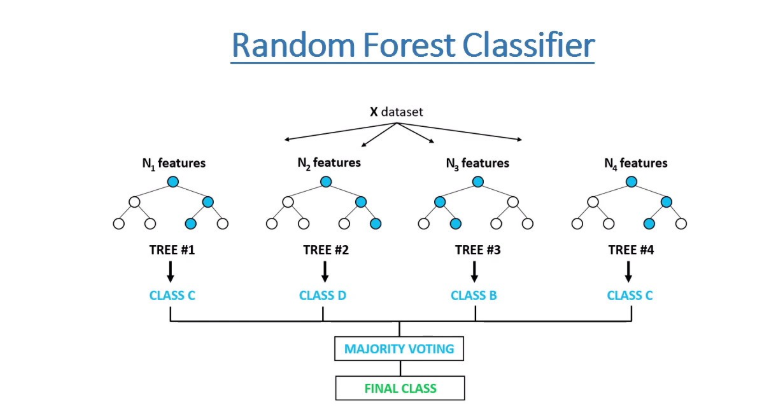

#### HYPER PARAMETER TUNING

In [148]:
# Setting up the parameters in dictionary of lists format, in order to find which parameter provides best results

Parameters = {
    
    'n_estimators': [ 100 , 300 , 500 ], # Number of trees in the forest
    
    'max_depth': [None, 5 , 10 , 15 ], # Maximum depth of each tree
    
    'min_samples_split': [ 5 , 10 , 15]  # Minimum number of samples required to split an internal node    
}

# Create a RandomForestClassifier instance

RF = RandomForestClassifier ( )


# Perform grid search with cross-validation

grid_search = GridSearchCV ( RF, Parameters, cv = 5)

grid_search.fit ( Train_X ,Train_Y )

Params = grid_search.best_params_

# Training model for each combination of the parameters

print("Best Hyperparameters: ", grid_search.best_params_)

print("\nBest Accuracy Score: ", grid_search.best_score_)

Best Hyperparameters:  {'max_depth': 10, 'min_samples_split': 15, 'n_estimators': 500}

Best Accuracy Score:  0.8273504273504273


#### TEST

In [149]:
# Create a Random Forest classifier with specified hyperparameters

RF = RandomForestClassifier ( **Params )


# Train the Random Forest classifier on the training data

RF.fit ( Train_X ,Train_Y )


# Use the trained classifier to predict the labels for the test data

Y_RF = RF.predict ( Test_X )

threshold = 0.333

Y_RF = RF.predict_proba(Test_X)[:, 1] >= threshold

# Calculating Performance Metrics : Accuracy , Precision , Recall and F1 score 

Accuracy_RF = accuracy_score( Test_Y , Y_RF ) * 100 

Precision_RF = precision_score ( Test_Y , Y_RF ) * 100 

Recall_RF = recall_score ( Test_Y , Y_RF ) * 100

F1_Score_RF = f1_score ( Test_Y , Y_RF ) * 100


print ( "The performance metrics of the Test Data is : \n" )

print ( "Accuracy = {}%\n\nPrecision = {}%\n\nRecall = {}%\n\nF1 Score = {}%".format ( Accuracy_RF  , Precision_RF  , Recall_RF  , F1_Score_RF ) )

The performance metrics of the Test Data is : 

Accuracy = 81.07562408223201%

Precision = 78.26377295492487%

Recall = 86.04992657856094%

F1 Score = 81.97237279244622%


Text(0.5, 1.0, 'Confusion Matrix')

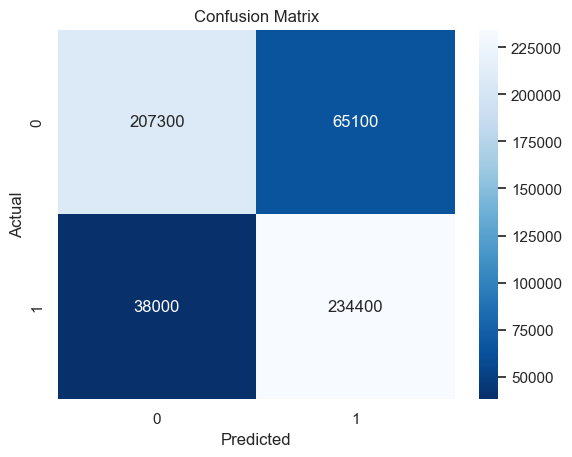

In [150]:
Confusion_Matrix_RF = confusion_matrix ( Test_Y , Y_RF ) * 100

sns.heatmap ( Confusion_Matrix_RF , annot = True , fmt='.0f' , cmap = 'Blues_r' )

plt.xlabel ( "Predicted" )

plt.ylabel ( "Actual" )

plt.title ( "Confusion Matrix" )


<span class="burk">-    INFERENCE</span>

    * Although there is a significant improvement in Precision, Accuracy and Recall scores the main problem that has arose 
      is the problem of over fitting 
      
    * The model performs well on training data but not on unseen data
    
    
<span class="birk">- REASONS</span>

    * Complex Model Architecture 
    
    * Lack of regularization
    
    * Imbalanced Data
    
    
<span class="girk">- SOLUTION</span>

    * Cross Validation
    
    * Feature Selection
    
    * Regularization
    
    * Model Simplification
    
    * Boosting


#### CHECKING FOR OVERFITTING 

        * THE MODEL SEEMS TO BE HAVE OVER FIT

In [151]:
# Predict the labels for the training set using the Random Forest model

train_predictions = RF.predict(Train_X)


# Predict the labels for the test set using the Random Forest model

test_predictions = RF.predict(Test_X)

# Calculate the accuracy of the Random Forest model on the training set

train_accuracy = accuracy_score(Train_Y, train_predictions) * 100


# Calculate the accuracy of the Random Forest model on the valiidation set

test_accuracy = accuracy_score(Test_Y, test_predictions) * 100


print ( "Train Accuracy >> {}\n\nTest Accuracy >> {}".format ( train_accuracy , test_accuracy ) )

Train Accuracy >> 84.68735942420153

Test Accuracy >> 82.43392070484582


### ENSEMBLE TECHNIQUES : BOOSTING

        Boosting is an iterative ensemble technique that combines weak models to create a strong model. 
        
        Each model in the ensemble is trained to correct the mistakes made by the previous models.
        
        Techniques :
        
            
            1. Gradient Boosting Machines (GBM)
            
            2. Extreme Gradient Boosting (XGBoost)
            
            3. LightGBM
            
            4. CatBoost 
            
        
        What do Boosting Techniques do ?
        
           * Over fitting: Boosting algorithms, such as AdaBoost and Gradient Boosting Machines (GBM), are used to reduce 
             over fitting
             
           * Boosting algorithms inherently focus on improving the performance on challenging instances and adjusting the 
             model to minimize errors. 
           
           * This adaptive learning process makes them particularly effective in handling over fitting and class imbalance 
             problems. 

#### ADAPTIVE BOOSTING

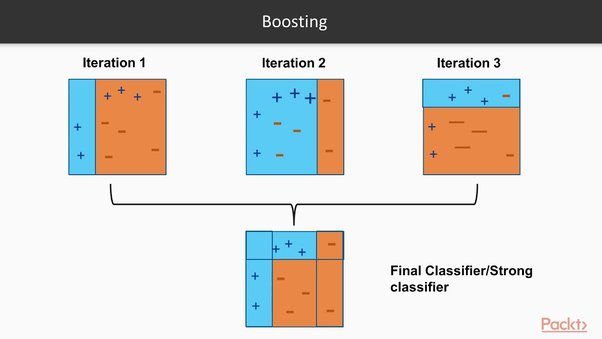

##### TUNING & INITIALIZATION

In [154]:
# Create a Random Forest classifier with best hyperparameters obtained from grid search

RF = RandomForestClassifier ()

# Create an AdaBoost classifier with Random Forest as the base estimator

AB = AdaBoostClassifier(base_estimator = RF)

##### TRAINING & TESTING

In [155]:
# Create an AdaBoost classifier with Random Forest as the base estimator

AB = AdaBoostClassifier(RF)


# Fit the AdaBoost classifier on the training data

AB.fit(Train_X ,Train_Y)


# Make predictions on the test data using the trained AdaBoost classifier

Y_AB = AB.predict(Test_X)


# Calculating Performance Metrics : Accuracy , Precision , Recall and F1 score 

Accuracy_AB = accuracy_score(Test_Y , Y_AB) * 100 

Precision_AB = precision_score(Test_Y , Y_AB) * 100 

Recall_AB = recall_score(Test_Y , Y_AB) * 100

F1_Score_AB = f1_score(Test_Y , Y_AB) * 100


print ( "The performance metrics of the Test Data is : \n" )

print ( "Accuracy = {}%\n\nPrecision = {}%\n\nRecall = {}%\n\nF1 Score = {}%".format ( Accuracy_AB , Precision_AB , Recall_AB , F1_Score_AB ) )

The performance metrics of the Test Data is : 

Accuracy = 82.28707782672541%

Precision = 83.99690761499807%

Recall = 79.77239353891336%

F1 Score = 81.8301638109584%


Text(0.5, 1.0, 'Confusion Matrix')

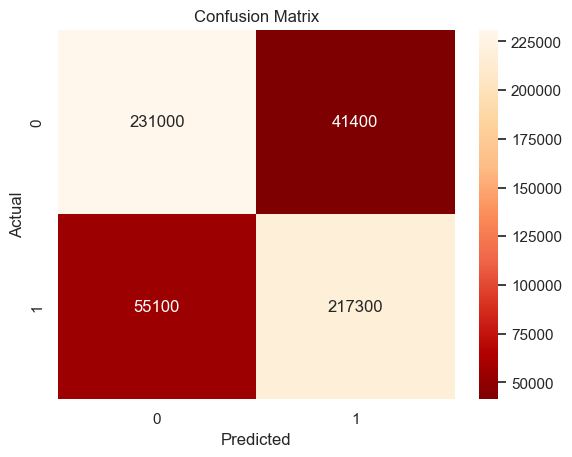

In [156]:
Confusion_Matrix_AB = confusion_matrix ( Test_Y , Y_AB ) * 100

sns.heatmap ( Confusion_Matrix_AB , annot = True , fmt='.0f' , cmap = 'OrRd_r' )

plt.xlabel ( "Predicted" )

plt.ylabel ( "Actual" )

plt.title ( "Confusion Matrix" )


<span class="burk">-    INFERENCE</span>

    * The ensemble technique : Adaptive boost has really improved the model. 
    
    * The problem of class imbalance hasn't been completely eradicated yet, but there is a significant improvement in 
      classification. 
      
    * The over all performance has increased all while mitigating over fitting. 


##### CHECKING FOR OVERFITTING 

In [157]:
# Predict the classes for the training set using KNN classifier

train_predictions = AB.predict(Train_X)


# Predict the classes for the test set using KNN classifier

test_predictions = AB.predict(Test_X)


# Calculate the accuracy of the model on the training set

train_accuracy = accuracy_score(Train_Y, train_predictions) * 100


# Calculate the accuracy of the model on the test set

test_accuracy = accuracy_score(Test_Y, test_predictions) * 100


print ( "Train Accuracy >> {}\n\nTest Accuracy >> {}".format ( train_accuracy , test_accuracy ) )

Train Accuracy >> 99.99100314889789

Test Accuracy >> 82.28707782672541


#### GRADIENT BOOSTING

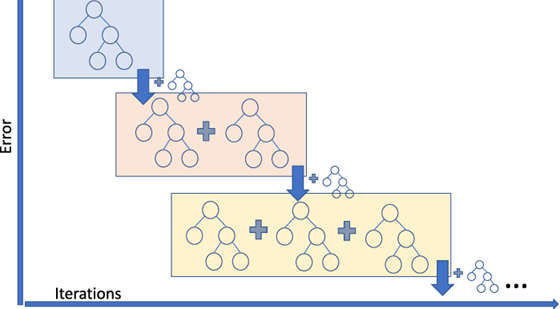

##### TUNING & INITIALIZATION

In [158]:
# Create a Gradient Boosting Classifier object

GB = GradientBoostingClassifier( )


# Define the hyperparameter grid for tuning

Parameters = {
    
    'learning_rate': [0.1, 0.001],
    
    'n_estimators': [200, 500],
    
    'max_depth': [3 , 5]
    
}

# Perform grid search cross-validation to find the best hyperparameters

grid_search = GridSearchCV ( GB , Parameters )

grid_search.fit ( Train_X , Train_Y )


# Print the best hyperparameters and the corresponding accuracy score

print("Best Hyperparameters: ", grid_search.best_params_)

print("\nBest Accuracy Score: ", grid_search.best_score_)

Params = grid_search.best_params_

# Evaluate the model with the best hyperparameters on the test set

best_model = grid_search.best_estimator_

accuracy = best_model.score( Test_X, Test_Y )

print("\nTest Accuracy: ", accuracy)

Best Hyperparameters:  {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}

Best Accuracy Score:  0.8284750337381915

Test Accuracy:  0.8274596182085169


##### TRAINING & TESTING

In [159]:
# Create an Gradient Boosting classifier with obtained hyper parameters

GB = GradientBoostingClassifier ( **Params )


# Fit the AdaBoost classifier on the training data

GB.fit ( Train_X ,Train_Y )

# Make predictions on the test data using the trained AdaBoost classifier

Y_GB = GB.predict ( Test_X )

threshold = 0.333

Y_GB = GB.predict_proba(Test_X)[:, 1] >= threshold

# Calculating Performance Metrics : Accuracy , Precision , Recall and F1 score 

Accuracy_GB = accuracy_score( Test_Y , Y_GB ) * 100 

Precision_GB = precision_score ( Test_Y , Y_GB ) * 100 

Recall_GB = recall_score ( Test_Y , Y_GB ) * 100

F1_Score_GB = f1_score ( Test_Y , Y_GB ) * 100


print ( "The performance metrics of the Test Data is : \n" )

print ( "Accuracy = {}%\n\nPrecision = {}%\n\nRecall = {}%\n\nF1 Score = {}%".format ( Accuracy_GB , Precision_GB , Recall_GB , F1_Score_GB ) )

The performance metrics of the Test Data is : 

Accuracy = 81.40602055800294%

Precision = 78.97053843548933%

Recall = 85.6093979441997%

F1 Score = 82.15606834595738%


##### CHECKING FOR OVERFITTING 

In [160]:
# Predict the classes for the training set using KNN classifier

train_predictions = GB.predict(Train_X)


# Predict the classes for the test set using KNN classifier

test_predictions = GB.predict(Test_X)


# Calculate the accuracy of the model on the training set

train_accuracy = accuracy_score(Train_Y, train_predictions) * 100


# Calculate the accuracy of the model on the test set

test_accuracy = accuracy_score(Test_Y, test_predictions) * 100


print ( "Train Accuracy >> {}\n\nTest Accuracy >> {}".format ( train_accuracy , test_accuracy ) )

Train Accuracy >> 83.8506522717049

Test Accuracy >> 82.74596182085169


Text(0.5, 1.0, 'Confusion Matrix')

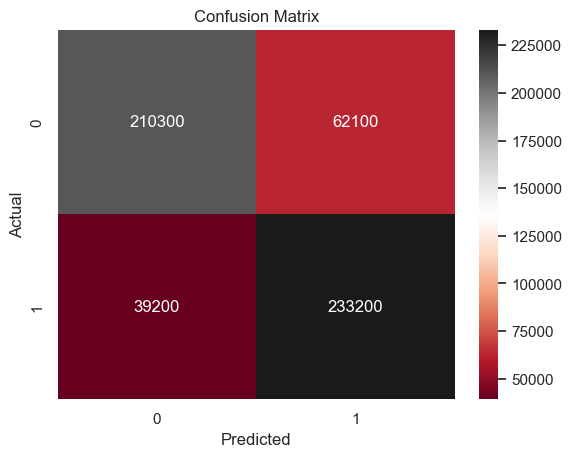

In [161]:
Confusion_Matrix_GB = confusion_matrix ( Test_Y , Y_GB ) * 100

sns.heatmap ( Confusion_Matrix_GB , annot = True , fmt='.0f' , cmap = 'RdGy' )

plt.xlabel ( "Predicted" )

plt.ylabel ( "Actual" )

plt.title ( "Confusion Matrix" )

<span class="burk">-    INFERENCE</span>

    * We can see that False Positive Rate has decreased from previous confusion matrix
    
    * The misclassification problem seems to have improved.
    
    * True Negative is still dominating the matrix and is a major contributor to performance metrics


#### EXTREME GRADIENT BOOSTING

##### TUNING & INITIALIZATION

In [162]:
# Define the parameter grid for tuning

Parameters = {
    
    'n_estimators': [100, 200, 300],  # Number of trees
    
    'learning_rate': [ 0.5 , 0.1, 0.01, 0.001],  # Step size shrinkage
    
    'max_depth': [3, 5, 7]  # Maximum depth of a tree
    
}

# Initialize the XGBoost classifier

XGB = XGBClassifier( random_state = 42 )


# Perform grid search with cross-validation

grid_search = GridSearchCV( estimator = XGB, param_grid = Parameters, cv = 5 )

grid_search.fit(Train_X, Train_Y)


# Print the best parameters and best score

print("Best Parameters: ", grid_search.best_params_)

print("\nBest Score: ", grid_search.best_score_)

Params = grid_search.best_params_

# Evaluate the tuned model on the test set

accuracy = grid_search.best_estimator_.score( Test_X , Test_Y)

print("\nTest Set Accuracy: ", accuracy)


Best Parameters:  {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}

Best Score:  0.8289248762932973

Test Set Accuracy:  0.8259911894273128


##### TRAINING & TESTING

In [163]:
# Create an Extreme Gradient Boosting classifier with obtained hyper parameters

XGB = GradientBoostingClassifier ( **Params )


# Fit the Extreme Gradient Boosting classifier on the training data

XGB.fit ( Train_X ,Train_Y )


# Make predictions on the test data using the trained Extreme Gradient Boosting##### TRAINING & TESTING

Y_XGB = XGB.predict ( Test_X )

threshold = 0.333

Y_XGB = XGB.predict_proba(Test_X)[:, 1] >= threshold

# Calculating Performance Metrics : Accuracy , Precision , Recall and F1 score 

Accuracy_XGB = accuracy_score( Test_Y , Y_XGB ) * 100 

Precision_XGB = precision_score ( Test_Y , Y_XGB ) * 100 

Recall_XGB = recall_score ( Test_Y , Y_XGB ) * 100

F1_Score_XGB = f1_score ( Test_Y , Y_XGB ) * 100


print ( "The performance metrics of the Test Data is : \n" )

print ( "Accuracy = {}%\n\nPrecision = {}%\n\nRecall = {}%\n\nF1 Score = {}%".format ( Accuracy_XGB , Precision_XGB , Recall_XGB , F1_Score_XGB ) )

The performance metrics of the Test Data is : 

Accuracy = 81.35095447870778%

Precision = 78.71553463349025%

Recall = 85.93979441997062%

F1 Score = 82.16918216918216%


Text(0.5, 1.0, 'Confusion Matrix')

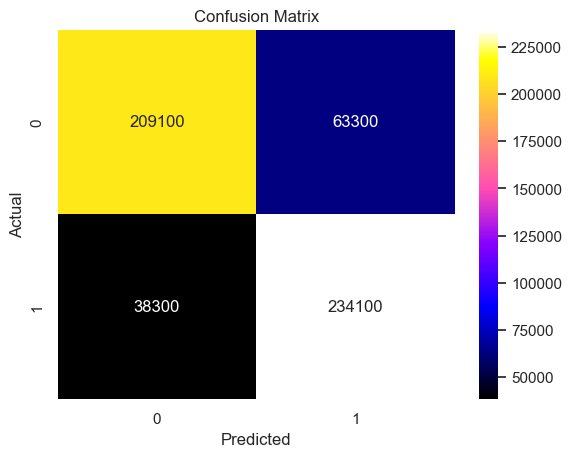

In [164]:
Confusion_Matrix_XGB = confusion_matrix ( Test_Y , Y_XGB ) * 100

sns.heatmap ( Confusion_Matrix_XGB , annot = True , fmt='.0f' , cmap = 'gnuplot2' )

plt.xlabel ( "Predicted" )

plt.ylabel ( "Actual" )

plt.title ( "Confusion Matrix" )

<span class="burk">-    INFERENCE</span>

    * We can see that False Positive Rate has decreased from previous confusion matrix
    
    * The misclassification problem seems to have improved.
    
    * True Negative is still dominating the matrix and is a major contributor to performance metrics


##### CHECKING FOR OVERFITTING 

In [165]:
# Predict the classes for the training set using KNN classifier

train_predictions = XGB.predict(Train_X)


# Predict the classes for the test set using KNN classifier

test_predictions = XGB.predict(Test_X)


# Calculate the accuracy of the model on the training set

train_accuracy = accuracy_score(Train_Y, train_predictions) * 100


# Calculate the accuracy of the model on the test set

test_accuracy = accuracy_score(Test_Y, test_predictions) * 100


print ( "Train Accuracy >> {}\n\nTest Accuracy >> {}".format ( train_accuracy , test_accuracy ) )

Train Accuracy >> 84.45344129554655

Test Accuracy >> 82.85609397944201


#### CATEGORICAL BOOST

##### TUNING & INITIALIZATION

In [166]:
# Define the parameter grid for tuning

Parameters = {
    
    'learning_rate': [0.01, 0.1, 0.5],
    
    'depth': [4, 6, 8],
    
    'l2_leaf_reg': [1, 3, 5]
    
}

# Create a CatBoost classifier

CB = CatBoostClassifier(  )


# Perform grid search with cross-validation

grid_search = GridSearchCV ( estimator = CB, param_grid = Parameters, cv = 5 )

grid_search.fit ( Train_X, Train_Y )


# Print the best parameters and best score

print("Best Parameters: ", grid_search.best_params_)

print("\nBest Score: ", grid_search.best_score_)


# Evaluate the best model on the test set

best_model = grid_search.best_estimator_

Params = grid_search.best_params_

accuracy = best_model.score( Test_X, Test_Y )

print("\nTest Accuracy: ", accuracy)


0:	learn: 0.6863296	total: 172ms	remaining: 2m 52s
1:	learn: 0.6793959	total: 203ms	remaining: 1m 41s
2:	learn: 0.6729535	total: 232ms	remaining: 1m 17s
3:	learn: 0.6662679	total: 262ms	remaining: 1m 5s
4:	learn: 0.6598118	total: 293ms	remaining: 58.3s
5:	learn: 0.6534515	total: 324ms	remaining: 53.7s
6:	learn: 0.6471834	total: 354ms	remaining: 50.2s
7:	learn: 0.6411994	total: 384ms	remaining: 47.6s
8:	learn: 0.6352452	total: 413ms	remaining: 45.5s
9:	learn: 0.6295247	total: 443ms	remaining: 43.8s
10:	learn: 0.6241097	total: 473ms	remaining: 42.6s
11:	learn: 0.6188231	total: 503ms	remaining: 41.4s
12:	learn: 0.6137352	total: 533ms	remaining: 40.4s
13:	learn: 0.6086582	total: 562ms	remaining: 39.6s
14:	learn: 0.6038193	total: 594ms	remaining: 39s
15:	learn: 0.5989110	total: 624ms	remaining: 38.4s
16:	learn: 0.5941723	total: 656ms	remaining: 37.9s
17:	learn: 0.5895744	total: 686ms	remaining: 37.4s
18:	learn: 0.5852034	total: 716ms	remaining: 37s
19:	learn: 0.5810986	total: 746ms	remainin

166:	learn: 0.4106478	total: 5.2s	remaining: 26s
167:	learn: 0.4103916	total: 5.23s	remaining: 25.9s
168:	learn: 0.4102413	total: 5.26s	remaining: 25.9s
169:	learn: 0.4099847	total: 5.29s	remaining: 25.8s
170:	learn: 0.4097589	total: 5.32s	remaining: 25.8s
171:	learn: 0.4095384	total: 5.35s	remaining: 25.8s
172:	learn: 0.4093705	total: 5.38s	remaining: 25.7s
173:	learn: 0.4091291	total: 5.41s	remaining: 25.7s
174:	learn: 0.4089413	total: 5.44s	remaining: 25.6s
175:	learn: 0.4088338	total: 5.47s	remaining: 25.6s
176:	learn: 0.4087258	total: 5.5s	remaining: 25.6s
177:	learn: 0.4085240	total: 5.53s	remaining: 25.5s
178:	learn: 0.4083034	total: 5.56s	remaining: 25.5s
179:	learn: 0.4081222	total: 5.59s	remaining: 25.5s
180:	learn: 0.4079510	total: 5.62s	remaining: 25.4s
181:	learn: 0.4077691	total: 5.66s	remaining: 25.4s
182:	learn: 0.4076090	total: 5.68s	remaining: 25.4s
183:	learn: 0.4074406	total: 5.71s	remaining: 25.3s
184:	learn: 0.4072519	total: 5.74s	remaining: 25.3s
185:	learn: 0.40

325:	learn: 0.3944530	total: 9.95s	remaining: 20.6s
326:	learn: 0.3944132	total: 9.98s	remaining: 20.5s
327:	learn: 0.3943519	total: 10s	remaining: 20.5s
328:	learn: 0.3942633	total: 10s	remaining: 20.5s
329:	learn: 0.3941870	total: 10.1s	remaining: 20.5s
330:	learn: 0.3941442	total: 10.1s	remaining: 20.4s
331:	learn: 0.3941075	total: 10.1s	remaining: 20.4s
332:	learn: 0.3940708	total: 10.2s	remaining: 20.4s
333:	learn: 0.3940127	total: 10.2s	remaining: 20.3s
334:	learn: 0.3939757	total: 10.2s	remaining: 20.3s
335:	learn: 0.3939377	total: 10.3s	remaining: 20.3s
336:	learn: 0.3939141	total: 10.3s	remaining: 20.2s
337:	learn: 0.3938764	total: 10.3s	remaining: 20.2s
338:	learn: 0.3938450	total: 10.3s	remaining: 20.2s
339:	learn: 0.3937805	total: 10.4s	remaining: 20.1s
340:	learn: 0.3937252	total: 10.4s	remaining: 20.1s
341:	learn: 0.3936898	total: 10.4s	remaining: 20.1s
342:	learn: 0.3936558	total: 10.5s	remaining: 20s
343:	learn: 0.3936259	total: 10.5s	remaining: 20s
344:	learn: 0.393553

491:	learn: 0.3884194	total: 14.9s	remaining: 15.3s
492:	learn: 0.3883919	total: 14.9s	remaining: 15.3s
493:	learn: 0.3883711	total: 14.9s	remaining: 15.3s
494:	learn: 0.3883583	total: 14.9s	remaining: 15.2s
495:	learn: 0.3883317	total: 15s	remaining: 15.2s
496:	learn: 0.3883023	total: 15s	remaining: 15.2s
497:	learn: 0.3882903	total: 15s	remaining: 15.2s
498:	learn: 0.3882269	total: 15.1s	remaining: 15.1s
499:	learn: 0.3882017	total: 15.1s	remaining: 15.1s
500:	learn: 0.3881856	total: 15.1s	remaining: 15.1s
501:	learn: 0.3881474	total: 15.2s	remaining: 15s
502:	learn: 0.3881286	total: 15.2s	remaining: 15s
503:	learn: 0.3880930	total: 15.2s	remaining: 15s
504:	learn: 0.3880764	total: 15.2s	remaining: 14.9s
505:	learn: 0.3880500	total: 15.3s	remaining: 14.9s
506:	learn: 0.3880251	total: 15.3s	remaining: 14.9s
507:	learn: 0.3879907	total: 15.3s	remaining: 14.8s
508:	learn: 0.3879645	total: 15.4s	remaining: 14.8s
509:	learn: 0.3879309	total: 15.4s	remaining: 14.8s
510:	learn: 0.3879043	to

657:	learn: 0.3844716	total: 19.8s	remaining: 10.3s
658:	learn: 0.3844344	total: 19.8s	remaining: 10.2s
659:	learn: 0.3844045	total: 19.8s	remaining: 10.2s
660:	learn: 0.3843851	total: 19.9s	remaining: 10.2s
661:	learn: 0.3843684	total: 19.9s	remaining: 10.2s
662:	learn: 0.3843564	total: 19.9s	remaining: 10.1s
663:	learn: 0.3843533	total: 19.9s	remaining: 10.1s
664:	learn: 0.3843354	total: 20s	remaining: 10.1s
665:	learn: 0.3843204	total: 20s	remaining: 10s
666:	learn: 0.3843065	total: 20s	remaining: 10s
667:	learn: 0.3842860	total: 20.1s	remaining: 9.97s
668:	learn: 0.3842688	total: 20.1s	remaining: 9.94s
669:	learn: 0.3842557	total: 20.1s	remaining: 9.91s
670:	learn: 0.3842450	total: 20.1s	remaining: 9.88s
671:	learn: 0.3842266	total: 20.2s	remaining: 9.85s
672:	learn: 0.3842146	total: 20.2s	remaining: 9.82s
673:	learn: 0.3841900	total: 20.2s	remaining: 9.79s
674:	learn: 0.3841753	total: 20.3s	remaining: 9.76s
675:	learn: 0.3841621	total: 20.3s	remaining: 9.73s
676:	learn: 0.3841323	

816:	learn: 0.3813485	total: 24.5s	remaining: 5.48s
817:	learn: 0.3813271	total: 24.5s	remaining: 5.45s
818:	learn: 0.3813132	total: 24.5s	remaining: 5.42s
819:	learn: 0.3812985	total: 24.6s	remaining: 5.39s
820:	learn: 0.3812823	total: 24.6s	remaining: 5.36s
821:	learn: 0.3812619	total: 24.6s	remaining: 5.33s
822:	learn: 0.3812475	total: 24.6s	remaining: 5.3s
823:	learn: 0.3812291	total: 24.7s	remaining: 5.27s
824:	learn: 0.3812038	total: 24.7s	remaining: 5.24s
825:	learn: 0.3811926	total: 24.7s	remaining: 5.21s
826:	learn: 0.3811771	total: 24.8s	remaining: 5.18s
827:	learn: 0.3811584	total: 24.8s	remaining: 5.15s
828:	learn: 0.3811418	total: 24.8s	remaining: 5.12s
829:	learn: 0.3811159	total: 24.9s	remaining: 5.09s
830:	learn: 0.3810991	total: 24.9s	remaining: 5.06s
831:	learn: 0.3810866	total: 24.9s	remaining: 5.03s
832:	learn: 0.3810705	total: 24.9s	remaining: 5s
833:	learn: 0.3810537	total: 25s	remaining: 4.97s
834:	learn: 0.3810418	total: 25s	remaining: 4.94s
835:	learn: 0.381023

981:	learn: 0.3783623	total: 29.5s	remaining: 541ms
982:	learn: 0.3783508	total: 29.6s	remaining: 511ms
983:	learn: 0.3783369	total: 29.6s	remaining: 481ms
984:	learn: 0.3783221	total: 29.6s	remaining: 451ms
985:	learn: 0.3783017	total: 29.7s	remaining: 421ms
986:	learn: 0.3782908	total: 29.7s	remaining: 391ms
987:	learn: 0.3782689	total: 29.7s	remaining: 361ms
988:	learn: 0.3782497	total: 29.7s	remaining: 331ms
989:	learn: 0.3782239	total: 29.8s	remaining: 301ms
990:	learn: 0.3782047	total: 29.8s	remaining: 271ms
991:	learn: 0.3781793	total: 29.8s	remaining: 241ms
992:	learn: 0.3781596	total: 29.9s	remaining: 211ms
993:	learn: 0.3781487	total: 29.9s	remaining: 180ms
994:	learn: 0.3781272	total: 29.9s	remaining: 150ms
995:	learn: 0.3781007	total: 30s	remaining: 120ms
996:	learn: 0.3780818	total: 30s	remaining: 90.2ms
997:	learn: 0.3780595	total: 30s	remaining: 60.2ms
998:	learn: 0.3780428	total: 30s	remaining: 30.1ms
999:	learn: 0.3780263	total: 30.1s	remaining: 0us
0:	learn: 0.6862506

148:	learn: 0.4117565	total: 4.42s	remaining: 25.3s
149:	learn: 0.4114701	total: 4.45s	remaining: 25.2s
150:	learn: 0.4111959	total: 4.48s	remaining: 25.2s
151:	learn: 0.4109178	total: 4.51s	remaining: 25.2s
152:	learn: 0.4106846	total: 4.54s	remaining: 25.1s
153:	learn: 0.4104222	total: 4.57s	remaining: 25.1s
154:	learn: 0.4101346	total: 4.6s	remaining: 25.1s
155:	learn: 0.4098542	total: 4.63s	remaining: 25s
156:	learn: 0.4096534	total: 4.66s	remaining: 25s
157:	learn: 0.4093870	total: 4.69s	remaining: 25s
158:	learn: 0.4090859	total: 4.72s	remaining: 25s
159:	learn: 0.4088286	total: 4.75s	remaining: 24.9s
160:	learn: 0.4086669	total: 4.78s	remaining: 24.9s
161:	learn: 0.4083822	total: 4.81s	remaining: 24.9s
162:	learn: 0.4082076	total: 4.83s	remaining: 24.8s
163:	learn: 0.4080010	total: 4.87s	remaining: 24.8s
164:	learn: 0.4077345	total: 4.89s	remaining: 24.8s
165:	learn: 0.4074861	total: 4.92s	remaining: 24.7s
166:	learn: 0.4072154	total: 4.95s	remaining: 24.7s
167:	learn: 0.4070045

312:	learn: 0.3915433	total: 9.32s	remaining: 20.4s
313:	learn: 0.3914825	total: 9.35s	remaining: 20.4s
314:	learn: 0.3914524	total: 9.38s	remaining: 20.4s
315:	learn: 0.3914144	total: 9.41s	remaining: 20.4s
316:	learn: 0.3913715	total: 9.44s	remaining: 20.3s
317:	learn: 0.3912822	total: 9.47s	remaining: 20.3s
318:	learn: 0.3912296	total: 9.5s	remaining: 20.3s
319:	learn: 0.3911645	total: 9.53s	remaining: 20.3s
320:	learn: 0.3911150	total: 9.56s	remaining: 20.2s
321:	learn: 0.3910856	total: 9.59s	remaining: 20.2s
322:	learn: 0.3910100	total: 9.62s	remaining: 20.2s
323:	learn: 0.3909358	total: 9.65s	remaining: 20.1s
324:	learn: 0.3908215	total: 9.68s	remaining: 20.1s
325:	learn: 0.3907610	total: 9.71s	remaining: 20.1s
326:	learn: 0.3907144	total: 9.74s	remaining: 20.1s
327:	learn: 0.3906506	total: 9.77s	remaining: 20s
328:	learn: 0.3906057	total: 9.8s	remaining: 20s
329:	learn: 0.3905609	total: 9.83s	remaining: 20s
330:	learn: 0.3905219	total: 9.87s	remaining: 19.9s
331:	learn: 0.390481

471:	learn: 0.3852535	total: 14.1s	remaining: 15.8s
472:	learn: 0.3852326	total: 14.1s	remaining: 15.8s
473:	learn: 0.3852074	total: 14.2s	remaining: 15.7s
474:	learn: 0.3851840	total: 14.2s	remaining: 15.7s
475:	learn: 0.3851510	total: 14.2s	remaining: 15.7s
476:	learn: 0.3851274	total: 14.3s	remaining: 15.6s
477:	learn: 0.3851057	total: 14.3s	remaining: 15.6s
478:	learn: 0.3850812	total: 14.3s	remaining: 15.6s
479:	learn: 0.3850527	total: 14.3s	remaining: 15.5s
480:	learn: 0.3850347	total: 14.4s	remaining: 15.5s
481:	learn: 0.3850111	total: 14.4s	remaining: 15.5s
482:	learn: 0.3849938	total: 14.4s	remaining: 15.5s
483:	learn: 0.3849657	total: 14.5s	remaining: 15.4s
484:	learn: 0.3849300	total: 14.5s	remaining: 15.4s
485:	learn: 0.3849077	total: 14.5s	remaining: 15.4s
486:	learn: 0.3848850	total: 14.6s	remaining: 15.3s
487:	learn: 0.3848645	total: 14.6s	remaining: 15.3s
488:	learn: 0.3848497	total: 14.6s	remaining: 15.3s
489:	learn: 0.3848300	total: 14.6s	remaining: 15.2s
490:	learn: 

630:	learn: 0.3812443	total: 18.9s	remaining: 11s
631:	learn: 0.3812263	total: 18.9s	remaining: 11s
632:	learn: 0.3812038	total: 18.9s	remaining: 11s
633:	learn: 0.3811863	total: 18.9s	remaining: 10.9s
634:	learn: 0.3811619	total: 19s	remaining: 10.9s
635:	learn: 0.3811435	total: 19s	remaining: 10.9s
636:	learn: 0.3811242	total: 19s	remaining: 10.8s
637:	learn: 0.3811061	total: 19.1s	remaining: 10.8s
638:	learn: 0.3810628	total: 19.1s	remaining: 10.8s
639:	learn: 0.3810237	total: 19.1s	remaining: 10.8s
640:	learn: 0.3810027	total: 19.2s	remaining: 10.7s
641:	learn: 0.3809799	total: 19.2s	remaining: 10.7s
642:	learn: 0.3809444	total: 19.2s	remaining: 10.7s
643:	learn: 0.3809274	total: 19.2s	remaining: 10.6s
644:	learn: 0.3809136	total: 19.3s	remaining: 10.6s
645:	learn: 0.3808925	total: 19.3s	remaining: 10.6s
646:	learn: 0.3808737	total: 19.3s	remaining: 10.5s
647:	learn: 0.3808523	total: 19.4s	remaining: 10.5s
648:	learn: 0.3808123	total: 19.4s	remaining: 10.5s
649:	learn: 0.3807937	to

790:	learn: 0.3779077	total: 23.7s	remaining: 6.25s
791:	learn: 0.3778941	total: 23.7s	remaining: 6.22s
792:	learn: 0.3778809	total: 23.7s	remaining: 6.19s
793:	learn: 0.3778670	total: 23.8s	remaining: 6.16s
794:	learn: 0.3778240	total: 23.8s	remaining: 6.13s
795:	learn: 0.3778067	total: 23.8s	remaining: 6.1s
796:	learn: 0.3777911	total: 23.8s	remaining: 6.07s
797:	learn: 0.3777725	total: 23.9s	remaining: 6.04s
798:	learn: 0.3777558	total: 23.9s	remaining: 6.01s
799:	learn: 0.3777454	total: 23.9s	remaining: 5.99s
800:	learn: 0.3777234	total: 24s	remaining: 5.96s
801:	learn: 0.3777022	total: 24s	remaining: 5.92s
802:	learn: 0.3776838	total: 24s	remaining: 5.89s
803:	learn: 0.3776660	total: 24.1s	remaining: 5.87s
804:	learn: 0.3776385	total: 24.1s	remaining: 5.83s
805:	learn: 0.3776267	total: 24.1s	remaining: 5.8s
806:	learn: 0.3776142	total: 24.1s	remaining: 5.78s
807:	learn: 0.3775931	total: 24.2s	remaining: 5.75s
808:	learn: 0.3775829	total: 24.2s	remaining: 5.71s
809:	learn: 0.377572

953:	learn: 0.3750435	total: 28.6s	remaining: 1.38s
954:	learn: 0.3750325	total: 28.6s	remaining: 1.35s
955:	learn: 0.3750219	total: 28.6s	remaining: 1.32s
956:	learn: 0.3750078	total: 28.6s	remaining: 1.29s
957:	learn: 0.3749972	total: 28.7s	remaining: 1.26s
958:	learn: 0.3749793	total: 28.7s	remaining: 1.23s
959:	learn: 0.3749663	total: 28.7s	remaining: 1.2s
960:	learn: 0.3749496	total: 28.8s	remaining: 1.17s
961:	learn: 0.3749308	total: 28.8s	remaining: 1.14s
962:	learn: 0.3749153	total: 28.8s	remaining: 1.11s
963:	learn: 0.3748971	total: 28.9s	remaining: 1.08s
964:	learn: 0.3748837	total: 28.9s	remaining: 1.05s
965:	learn: 0.3748689	total: 28.9s	remaining: 1.02s
966:	learn: 0.3748508	total: 28.9s	remaining: 988ms
967:	learn: 0.3748380	total: 29s	remaining: 958ms
968:	learn: 0.3748237	total: 29s	remaining: 928ms
969:	learn: 0.3747892	total: 29s	remaining: 898ms
970:	learn: 0.3747690	total: 29.1s	remaining: 868ms
971:	learn: 0.3747583	total: 29.1s	remaining: 838ms
972:	learn: 0.37473

118:	learn: 0.4213594	total: 3.56s	remaining: 26.3s
119:	learn: 0.4210151	total: 3.59s	remaining: 26.3s
120:	learn: 0.4205907	total: 3.62s	remaining: 26.3s
121:	learn: 0.4201318	total: 3.65s	remaining: 26.3s
122:	learn: 0.4197679	total: 3.68s	remaining: 26.2s
123:	learn: 0.4193559	total: 3.71s	remaining: 26.2s
124:	learn: 0.4189230	total: 3.74s	remaining: 26.2s
125:	learn: 0.4184294	total: 3.77s	remaining: 26.1s
126:	learn: 0.4180836	total: 3.8s	remaining: 26.1s
127:	learn: 0.4176650	total: 3.83s	remaining: 26.1s
128:	learn: 0.4172966	total: 3.86s	remaining: 26.1s
129:	learn: 0.4168437	total: 3.89s	remaining: 26s
130:	learn: 0.4164408	total: 3.92s	remaining: 26s
131:	learn: 0.4160321	total: 3.95s	remaining: 26s
132:	learn: 0.4156191	total: 3.98s	remaining: 25.9s
133:	learn: 0.4153052	total: 4.01s	remaining: 25.9s
134:	learn: 0.4149766	total: 4.04s	remaining: 25.9s
135:	learn: 0.4146406	total: 4.07s	remaining: 25.8s
136:	learn: 0.4143789	total: 4.1s	remaining: 25.8s
137:	learn: 0.413999

282:	learn: 0.3918764	total: 8.49s	remaining: 21.5s
283:	learn: 0.3917864	total: 8.52s	remaining: 21.5s
284:	learn: 0.3917130	total: 8.55s	remaining: 21.5s
285:	learn: 0.3916323	total: 8.58s	remaining: 21.4s
286:	learn: 0.3915373	total: 8.61s	remaining: 21.4s
287:	learn: 0.3914835	total: 8.64s	remaining: 21.4s
288:	learn: 0.3914408	total: 8.67s	remaining: 21.3s
289:	learn: 0.3913446	total: 8.7s	remaining: 21.3s
290:	learn: 0.3912935	total: 8.73s	remaining: 21.3s
291:	learn: 0.3912402	total: 8.76s	remaining: 21.2s
292:	learn: 0.3911686	total: 8.79s	remaining: 21.2s
293:	learn: 0.3911208	total: 8.82s	remaining: 21.2s
294:	learn: 0.3910673	total: 8.85s	remaining: 21.2s
295:	learn: 0.3909967	total: 8.88s	remaining: 21.1s
296:	learn: 0.3909486	total: 8.91s	remaining: 21.1s
297:	learn: 0.3908738	total: 8.94s	remaining: 21.1s
298:	learn: 0.3908217	total: 8.97s	remaining: 21s
299:	learn: 0.3907571	total: 9s	remaining: 21s
300:	learn: 0.3907072	total: 9.03s	remaining: 21s
301:	learn: 0.3906476	

443:	learn: 0.3843138	total: 13.3s	remaining: 16.6s
444:	learn: 0.3842802	total: 13.3s	remaining: 16.6s
445:	learn: 0.3842566	total: 13.4s	remaining: 16.6s
446:	learn: 0.3842364	total: 13.4s	remaining: 16.6s
447:	learn: 0.3841785	total: 13.4s	remaining: 16.5s
448:	learn: 0.3841502	total: 13.4s	remaining: 16.5s
449:	learn: 0.3841209	total: 13.5s	remaining: 16.5s
450:	learn: 0.3841000	total: 13.5s	remaining: 16.4s
451:	learn: 0.3840661	total: 13.5s	remaining: 16.4s
452:	learn: 0.3840332	total: 13.6s	remaining: 16.4s
453:	learn: 0.3840073	total: 13.6s	remaining: 16.3s
454:	learn: 0.3839818	total: 13.6s	remaining: 16.3s
455:	learn: 0.3839474	total: 13.7s	remaining: 16.3s
456:	learn: 0.3839205	total: 13.7s	remaining: 16.3s
457:	learn: 0.3839010	total: 13.7s	remaining: 16.2s
458:	learn: 0.3838793	total: 13.7s	remaining: 16.2s
459:	learn: 0.3838437	total: 13.8s	remaining: 16.2s
460:	learn: 0.3838157	total: 13.8s	remaining: 16.1s
461:	learn: 0.3837573	total: 13.8s	remaining: 16.1s
462:	learn: 

604:	learn: 0.3798285	total: 18.2s	remaining: 11.9s
605:	learn: 0.3798036	total: 18.2s	remaining: 11.8s
606:	learn: 0.3797725	total: 18.2s	remaining: 11.8s
607:	learn: 0.3797387	total: 18.3s	remaining: 11.8s
608:	learn: 0.3797186	total: 18.3s	remaining: 11.7s
609:	learn: 0.3796965	total: 18.3s	remaining: 11.7s
610:	learn: 0.3796625	total: 18.3s	remaining: 11.7s
611:	learn: 0.3796323	total: 18.4s	remaining: 11.7s
612:	learn: 0.3796054	total: 18.4s	remaining: 11.6s
613:	learn: 0.3795843	total: 18.4s	remaining: 11.6s
614:	learn: 0.3795656	total: 18.5s	remaining: 11.6s
615:	learn: 0.3795447	total: 18.5s	remaining: 11.5s
616:	learn: 0.3795218	total: 18.5s	remaining: 11.5s
617:	learn: 0.3794794	total: 18.6s	remaining: 11.5s
618:	learn: 0.3794650	total: 18.6s	remaining: 11.4s
619:	learn: 0.3794308	total: 18.6s	remaining: 11.4s
620:	learn: 0.3794094	total: 18.7s	remaining: 11.4s
621:	learn: 0.3793813	total: 18.7s	remaining: 11.4s
622:	learn: 0.3793550	total: 18.7s	remaining: 11.3s
623:	learn: 

765:	learn: 0.3765392	total: 23s	remaining: 7.04s
766:	learn: 0.3765299	total: 23.1s	remaining: 7s
767:	learn: 0.3765055	total: 23.1s	remaining: 6.97s
768:	learn: 0.3764884	total: 23.1s	remaining: 6.95s
769:	learn: 0.3764739	total: 23.1s	remaining: 6.91s
770:	learn: 0.3764551	total: 23.2s	remaining: 6.88s
771:	learn: 0.3764415	total: 23.2s	remaining: 6.85s
772:	learn: 0.3764254	total: 23.2s	remaining: 6.82s
773:	learn: 0.3764093	total: 23.3s	remaining: 6.79s
774:	learn: 0.3763983	total: 23.3s	remaining: 6.76s
775:	learn: 0.3763817	total: 23.3s	remaining: 6.74s
776:	learn: 0.3763730	total: 23.4s	remaining: 6.71s
777:	learn: 0.3763592	total: 23.4s	remaining: 6.67s
778:	learn: 0.3763389	total: 23.4s	remaining: 6.64s
779:	learn: 0.3763220	total: 23.5s	remaining: 6.61s
780:	learn: 0.3762884	total: 23.5s	remaining: 6.58s
781:	learn: 0.3762686	total: 23.5s	remaining: 6.55s
782:	learn: 0.3762565	total: 23.5s	remaining: 6.52s
783:	learn: 0.3762452	total: 23.6s	remaining: 6.49s
784:	learn: 0.376

926:	learn: 0.3737759	total: 27.8s	remaining: 2.19s
927:	learn: 0.3737577	total: 27.8s	remaining: 2.16s
928:	learn: 0.3737428	total: 27.9s	remaining: 2.13s
929:	learn: 0.3737291	total: 27.9s	remaining: 2.1s
930:	learn: 0.3737175	total: 27.9s	remaining: 2.07s
931:	learn: 0.3736970	total: 28s	remaining: 2.04s
932:	learn: 0.3736746	total: 28s	remaining: 2.01s
933:	learn: 0.3736578	total: 28s	remaining: 1.98s
934:	learn: 0.3736360	total: 28.1s	remaining: 1.95s
935:	learn: 0.3736240	total: 28.1s	remaining: 1.92s
936:	learn: 0.3736066	total: 28.1s	remaining: 1.89s
937:	learn: 0.3735799	total: 28.1s	remaining: 1.86s
938:	learn: 0.3735548	total: 28.2s	remaining: 1.83s
939:	learn: 0.3735387	total: 28.2s	remaining: 1.8s
940:	learn: 0.3735224	total: 28.2s	remaining: 1.77s
941:	learn: 0.3734970	total: 28.3s	remaining: 1.74s
942:	learn: 0.3734855	total: 28.3s	remaining: 1.71s
943:	learn: 0.3734696	total: 28.3s	remaining: 1.68s
944:	learn: 0.3734523	total: 28.4s	remaining: 1.65s
945:	learn: 0.373411

87:	learn: 0.4436123	total: 2.59s	remaining: 26.9s
88:	learn: 0.4426880	total: 2.62s	remaining: 26.8s
89:	learn: 0.4418789	total: 2.65s	remaining: 26.8s
90:	learn: 0.4411875	total: 2.68s	remaining: 26.8s
91:	learn: 0.4406085	total: 2.71s	remaining: 26.8s
92:	learn: 0.4397486	total: 2.74s	remaining: 26.8s
93:	learn: 0.4390568	total: 2.77s	remaining: 26.7s
94:	learn: 0.4383427	total: 2.8s	remaining: 26.7s
95:	learn: 0.4376587	total: 2.83s	remaining: 26.7s
96:	learn: 0.4368370	total: 2.86s	remaining: 26.7s
97:	learn: 0.4360311	total: 2.89s	remaining: 26.6s
98:	learn: 0.4354225	total: 2.92s	remaining: 26.6s
99:	learn: 0.4347903	total: 2.95s	remaining: 26.6s
100:	learn: 0.4340064	total: 2.98s	remaining: 26.5s
101:	learn: 0.4333515	total: 3.01s	remaining: 26.5s
102:	learn: 0.4327599	total: 3.04s	remaining: 26.5s
103:	learn: 0.4321759	total: 3.07s	remaining: 26.5s
104:	learn: 0.4315952	total: 3.1s	remaining: 26.4s
105:	learn: 0.4310274	total: 3.13s	remaining: 26.4s
106:	learn: 0.4304142	total

252:	learn: 0.3973914	total: 7.6s	remaining: 22.4s
253:	learn: 0.3972816	total: 7.63s	remaining: 22.4s
254:	learn: 0.3972096	total: 7.66s	remaining: 22.4s
255:	learn: 0.3970827	total: 7.69s	remaining: 22.4s
256:	learn: 0.3969975	total: 7.72s	remaining: 22.3s
257:	learn: 0.3968887	total: 7.75s	remaining: 22.3s
258:	learn: 0.3968157	total: 7.78s	remaining: 22.3s
259:	learn: 0.3967732	total: 7.81s	remaining: 22.2s
260:	learn: 0.3967222	total: 7.84s	remaining: 22.2s
261:	learn: 0.3966038	total: 7.87s	remaining: 22.2s
262:	learn: 0.3965432	total: 7.9s	remaining: 22.1s
263:	learn: 0.3964805	total: 7.93s	remaining: 22.1s
264:	learn: 0.3964239	total: 7.96s	remaining: 22.1s
265:	learn: 0.3963273	total: 7.99s	remaining: 22.1s
266:	learn: 0.3962522	total: 8.02s	remaining: 22s
267:	learn: 0.3961370	total: 8.05s	remaining: 22s
268:	learn: 0.3960780	total: 8.08s	remaining: 22s
269:	learn: 0.3960279	total: 8.11s	remaining: 21.9s
270:	learn: 0.3959425	total: 8.14s	remaining: 21.9s
271:	learn: 0.395839

412:	learn: 0.3890133	total: 12.4s	remaining: 17.6s
413:	learn: 0.3889906	total: 12.4s	remaining: 17.6s
414:	learn: 0.3889449	total: 12.5s	remaining: 17.6s
415:	learn: 0.3888902	total: 12.5s	remaining: 17.6s
416:	learn: 0.3888616	total: 12.5s	remaining: 17.5s
417:	learn: 0.3888426	total: 12.6s	remaining: 17.5s
418:	learn: 0.3888123	total: 12.6s	remaining: 17.5s
419:	learn: 0.3887774	total: 12.6s	remaining: 17.4s
420:	learn: 0.3887444	total: 12.7s	remaining: 17.4s
421:	learn: 0.3887119	total: 12.7s	remaining: 17.4s
422:	learn: 0.3886486	total: 12.7s	remaining: 17.3s
423:	learn: 0.3886133	total: 12.7s	remaining: 17.3s
424:	learn: 0.3885781	total: 12.8s	remaining: 17.3s
425:	learn: 0.3885169	total: 12.8s	remaining: 17.3s
426:	learn: 0.3884737	total: 12.8s	remaining: 17.2s
427:	learn: 0.3884354	total: 12.9s	remaining: 17.2s
428:	learn: 0.3884099	total: 12.9s	remaining: 17.2s
429:	learn: 0.3883891	total: 12.9s	remaining: 17.1s
430:	learn: 0.3883675	total: 13s	remaining: 17.1s
431:	learn: 0.

575:	learn: 0.3842298	total: 17.3s	remaining: 12.7s
576:	learn: 0.3841895	total: 17.3s	remaining: 12.7s
577:	learn: 0.3841729	total: 17.3s	remaining: 12.7s
578:	learn: 0.3841470	total: 17.4s	remaining: 12.6s
579:	learn: 0.3841312	total: 17.4s	remaining: 12.6s
580:	learn: 0.3841028	total: 17.4s	remaining: 12.6s
581:	learn: 0.3840766	total: 17.5s	remaining: 12.5s
582:	learn: 0.3840606	total: 17.5s	remaining: 12.5s
583:	learn: 0.3840483	total: 17.5s	remaining: 12.5s
584:	learn: 0.3840053	total: 17.6s	remaining: 12.5s
585:	learn: 0.3839820	total: 17.6s	remaining: 12.4s
586:	learn: 0.3839583	total: 17.6s	remaining: 12.4s
587:	learn: 0.3839272	total: 17.6s	remaining: 12.4s
588:	learn: 0.3839079	total: 17.7s	remaining: 12.3s
589:	learn: 0.3838815	total: 17.7s	remaining: 12.3s
590:	learn: 0.3838549	total: 17.7s	remaining: 12.3s
591:	learn: 0.3838409	total: 17.8s	remaining: 12.2s
592:	learn: 0.3838253	total: 17.8s	remaining: 12.2s
593:	learn: 0.3838083	total: 17.8s	remaining: 12.2s
594:	learn: 

740:	learn: 0.3807859	total: 22.3s	remaining: 7.8s
741:	learn: 0.3807672	total: 22.3s	remaining: 7.77s
742:	learn: 0.3807495	total: 22.4s	remaining: 7.74s
743:	learn: 0.3807193	total: 22.4s	remaining: 7.71s
744:	learn: 0.3806913	total: 22.4s	remaining: 7.68s
745:	learn: 0.3806757	total: 22.5s	remaining: 7.65s
746:	learn: 0.3806649	total: 22.5s	remaining: 7.62s
747:	learn: 0.3806520	total: 22.5s	remaining: 7.59s
748:	learn: 0.3806386	total: 22.6s	remaining: 7.56s
749:	learn: 0.3806252	total: 22.6s	remaining: 7.53s
750:	learn: 0.3806097	total: 22.6s	remaining: 7.5s
751:	learn: 0.3805980	total: 22.6s	remaining: 7.47s
752:	learn: 0.3805783	total: 22.7s	remaining: 7.44s
753:	learn: 0.3805647	total: 22.7s	remaining: 7.41s
754:	learn: 0.3805421	total: 22.7s	remaining: 7.38s
755:	learn: 0.3805304	total: 22.8s	remaining: 7.35s
756:	learn: 0.3805030	total: 22.8s	remaining: 7.32s
757:	learn: 0.3804879	total: 22.8s	remaining: 7.29s
758:	learn: 0.3804487	total: 22.9s	remaining: 7.26s
759:	learn: 0.

905:	learn: 0.3778576	total: 27.3s	remaining: 2.83s
906:	learn: 0.3778425	total: 27.4s	remaining: 2.81s
907:	learn: 0.3778236	total: 27.4s	remaining: 2.77s
908:	learn: 0.3778091	total: 27.4s	remaining: 2.75s
909:	learn: 0.3777876	total: 27.5s	remaining: 2.71s
910:	learn: 0.3777728	total: 27.5s	remaining: 2.68s
911:	learn: 0.3777526	total: 27.5s	remaining: 2.65s
912:	learn: 0.3777342	total: 27.5s	remaining: 2.62s
913:	learn: 0.3777154	total: 27.6s	remaining: 2.59s
914:	learn: 0.3777015	total: 27.6s	remaining: 2.56s
915:	learn: 0.3776631	total: 27.6s	remaining: 2.53s
916:	learn: 0.3776422	total: 27.7s	remaining: 2.5s
917:	learn: 0.3776210	total: 27.7s	remaining: 2.47s
918:	learn: 0.3776074	total: 27.7s	remaining: 2.44s
919:	learn: 0.3775802	total: 27.7s	remaining: 2.41s
920:	learn: 0.3775649	total: 27.8s	remaining: 2.38s
921:	learn: 0.3775488	total: 27.8s	remaining: 2.35s
922:	learn: 0.3775324	total: 27.8s	remaining: 2.32s
923:	learn: 0.3775003	total: 27.9s	remaining: 2.29s
924:	learn: 0

70:	learn: 0.4578618	total: 2.17s	remaining: 28.4s
71:	learn: 0.4566330	total: 2.2s	remaining: 28.3s
72:	learn: 0.4554326	total: 2.23s	remaining: 28.3s
73:	learn: 0.4544436	total: 2.26s	remaining: 28.3s
74:	learn: 0.4534959	total: 2.29s	remaining: 28.2s
75:	learn: 0.4523424	total: 2.32s	remaining: 28.2s
76:	learn: 0.4513166	total: 2.35s	remaining: 28.2s
77:	learn: 0.4503640	total: 2.38s	remaining: 28.1s
78:	learn: 0.4493836	total: 2.41s	remaining: 28.1s
79:	learn: 0.4482813	total: 2.44s	remaining: 28.1s
80:	learn: 0.4474917	total: 2.47s	remaining: 28s
81:	learn: 0.4465175	total: 2.5s	remaining: 28s
82:	learn: 0.4455255	total: 2.53s	remaining: 28s
83:	learn: 0.4445453	total: 2.56s	remaining: 27.9s
84:	learn: 0.4436549	total: 2.59s	remaining: 27.9s
85:	learn: 0.4428594	total: 2.62s	remaining: 27.9s
86:	learn: 0.4419860	total: 2.65s	remaining: 27.8s
87:	learn: 0.4411469	total: 2.68s	remaining: 27.8s
88:	learn: 0.4404219	total: 2.71s	remaining: 27.8s
89:	learn: 0.4397363	total: 2.74s	remai

232:	learn: 0.3981154	total: 7.02s	remaining: 23.1s
233:	learn: 0.3980612	total: 7.05s	remaining: 23.1s
234:	learn: 0.3979260	total: 7.08s	remaining: 23s
235:	learn: 0.3977861	total: 7.11s	remaining: 23s
236:	learn: 0.3976804	total: 7.14s	remaining: 23s
237:	learn: 0.3975715	total: 7.17s	remaining: 23s
238:	learn: 0.3974849	total: 7.2s	remaining: 22.9s
239:	learn: 0.3974150	total: 7.23s	remaining: 22.9s
240:	learn: 0.3972908	total: 7.26s	remaining: 22.9s
241:	learn: 0.3972108	total: 7.29s	remaining: 22.8s
242:	learn: 0.3971512	total: 7.32s	remaining: 22.8s
243:	learn: 0.3971030	total: 7.35s	remaining: 22.8s
244:	learn: 0.3970123	total: 7.38s	remaining: 22.7s
245:	learn: 0.3969221	total: 7.41s	remaining: 22.7s
246:	learn: 0.3968549	total: 7.44s	remaining: 22.7s
247:	learn: 0.3967593	total: 7.47s	remaining: 22.6s
248:	learn: 0.3966642	total: 7.5s	remaining: 22.6s
249:	learn: 0.3965767	total: 7.53s	remaining: 22.6s
250:	learn: 0.3964787	total: 7.55s	remaining: 22.5s
251:	learn: 0.3963779	

393:	learn: 0.3884670	total: 11.8s	remaining: 18.1s
394:	learn: 0.3884340	total: 11.8s	remaining: 18.1s
395:	learn: 0.3883971	total: 11.8s	remaining: 18s
396:	learn: 0.3883625	total: 11.9s	remaining: 18s
397:	learn: 0.3883267	total: 11.9s	remaining: 18s
398:	learn: 0.3882738	total: 11.9s	remaining: 17.9s
399:	learn: 0.3882416	total: 11.9s	remaining: 17.9s
400:	learn: 0.3882051	total: 12s	remaining: 17.9s
401:	learn: 0.3881639	total: 12s	remaining: 17.8s
402:	learn: 0.3881248	total: 12s	remaining: 17.8s
403:	learn: 0.3880864	total: 12.1s	remaining: 17.8s
404:	learn: 0.3880240	total: 12.1s	remaining: 17.8s
405:	learn: 0.3879652	total: 12.1s	remaining: 17.7s
406:	learn: 0.3879169	total: 12.1s	remaining: 17.7s
407:	learn: 0.3878816	total: 12.2s	remaining: 17.7s
408:	learn: 0.3878584	total: 12.2s	remaining: 17.6s
409:	learn: 0.3878211	total: 12.2s	remaining: 17.6s
410:	learn: 0.3877778	total: 12.3s	remaining: 17.6s
411:	learn: 0.3877383	total: 12.3s	remaining: 17.5s
412:	learn: 0.3876800	to

554:	learn: 0.3836148	total: 16.6s	remaining: 13.3s
555:	learn: 0.3835947	total: 16.6s	remaining: 13.3s
556:	learn: 0.3835705	total: 16.7s	remaining: 13.3s
557:	learn: 0.3835569	total: 16.7s	remaining: 13.2s
558:	learn: 0.3835331	total: 16.7s	remaining: 13.2s
559:	learn: 0.3835021	total: 16.8s	remaining: 13.2s
560:	learn: 0.3834706	total: 16.8s	remaining: 13.1s
561:	learn: 0.3834197	total: 16.8s	remaining: 13.1s
562:	learn: 0.3833729	total: 16.9s	remaining: 13.1s
563:	learn: 0.3833354	total: 16.9s	remaining: 13.1s
564:	learn: 0.3833198	total: 16.9s	remaining: 13s
565:	learn: 0.3832914	total: 17s	remaining: 13s
566:	learn: 0.3832649	total: 17s	remaining: 13s
567:	learn: 0.3832449	total: 17s	remaining: 12.9s
568:	learn: 0.3832223	total: 17s	remaining: 12.9s
569:	learn: 0.3831959	total: 17.1s	remaining: 12.9s
570:	learn: 0.3831697	total: 17.1s	remaining: 12.9s
571:	learn: 0.3831472	total: 17.1s	remaining: 12.8s
572:	learn: 0.3831308	total: 17.2s	remaining: 12.8s
573:	learn: 0.3831004	tota

716:	learn: 0.3799120	total: 21.6s	remaining: 8.51s
717:	learn: 0.3798983	total: 21.6s	remaining: 8.48s
718:	learn: 0.3798860	total: 21.6s	remaining: 8.45s
719:	learn: 0.3798733	total: 21.7s	remaining: 8.42s
720:	learn: 0.3798466	total: 21.7s	remaining: 8.39s
721:	learn: 0.3798254	total: 21.7s	remaining: 8.36s
722:	learn: 0.3797916	total: 21.7s	remaining: 8.33s
723:	learn: 0.3797767	total: 21.8s	remaining: 8.3s
724:	learn: 0.3797631	total: 21.8s	remaining: 8.27s
725:	learn: 0.3797518	total: 21.8s	remaining: 8.24s
726:	learn: 0.3797304	total: 21.9s	remaining: 8.21s
727:	learn: 0.3797097	total: 21.9s	remaining: 8.18s
728:	learn: 0.3796704	total: 21.9s	remaining: 8.15s
729:	learn: 0.3796556	total: 22s	remaining: 8.12s
730:	learn: 0.3796384	total: 22s	remaining: 8.09s
731:	learn: 0.3796230	total: 22s	remaining: 8.06s
732:	learn: 0.3796082	total: 22s	remaining: 8.03s
733:	learn: 0.3795807	total: 22.1s	remaining: 8s
734:	learn: 0.3795579	total: 22.1s	remaining: 7.97s
735:	learn: 0.3795353	to

878:	learn: 0.3768933	total: 26.5s	remaining: 3.65s
879:	learn: 0.3768697	total: 26.6s	remaining: 3.62s
880:	learn: 0.3768567	total: 26.6s	remaining: 3.59s
881:	learn: 0.3768508	total: 26.6s	remaining: 3.56s
882:	learn: 0.3768353	total: 26.7s	remaining: 3.53s
883:	learn: 0.3768229	total: 26.7s	remaining: 3.5s
884:	learn: 0.3768017	total: 26.7s	remaining: 3.47s
885:	learn: 0.3767827	total: 26.8s	remaining: 3.44s
886:	learn: 0.3767655	total: 26.8s	remaining: 3.41s
887:	learn: 0.3767521	total: 26.8s	remaining: 3.38s
888:	learn: 0.3767405	total: 26.8s	remaining: 3.35s
889:	learn: 0.3767157	total: 26.9s	remaining: 3.32s
890:	learn: 0.3767073	total: 26.9s	remaining: 3.29s
891:	learn: 0.3766840	total: 26.9s	remaining: 3.26s
892:	learn: 0.3766643	total: 27s	remaining: 3.23s
893:	learn: 0.3766460	total: 27s	remaining: 3.2s
894:	learn: 0.3766273	total: 27s	remaining: 3.17s
895:	learn: 0.3766058	total: 27.1s	remaining: 3.14s
896:	learn: 0.3765897	total: 27.1s	remaining: 3.11s
897:	learn: 0.376577

40:	learn: 0.3900676	total: 1.23s	remaining: 28.9s
41:	learn: 0.3898114	total: 1.26s	remaining: 28.8s
42:	learn: 0.3894550	total: 1.29s	remaining: 28.8s
43:	learn: 0.3891667	total: 1.32s	remaining: 28.8s
44:	learn: 0.3889171	total: 1.35s	remaining: 28.7s
45:	learn: 0.3886511	total: 1.38s	remaining: 28.7s
46:	learn: 0.3884415	total: 1.41s	remaining: 28.7s
47:	learn: 0.3878264	total: 1.44s	remaining: 28.7s
48:	learn: 0.3876465	total: 1.47s	remaining: 28.6s
49:	learn: 0.3873688	total: 1.5s	remaining: 28.6s
50:	learn: 0.3870112	total: 1.53s	remaining: 28.6s
51:	learn: 0.3867495	total: 1.56s	remaining: 28.5s
52:	learn: 0.3865394	total: 1.59s	remaining: 28.5s
53:	learn: 0.3865063	total: 1.62s	remaining: 28.4s
54:	learn: 0.3861269	total: 1.65s	remaining: 28.4s
55:	learn: 0.3859490	total: 1.68s	remaining: 28.4s
56:	learn: 0.3856619	total: 1.71s	remaining: 28.4s
57:	learn: 0.3854329	total: 1.74s	remaining: 28.3s
58:	learn: 0.3852612	total: 1.78s	remaining: 28.3s
59:	learn: 0.3849927	total: 1.81

201:	learn: 0.3620370	total: 6.1s	remaining: 24.1s
202:	learn: 0.3618933	total: 6.13s	remaining: 24.1s
203:	learn: 0.3617553	total: 6.16s	remaining: 24.1s
204:	learn: 0.3616311	total: 6.19s	remaining: 24s
205:	learn: 0.3614525	total: 6.22s	remaining: 24s
206:	learn: 0.3613538	total: 6.25s	remaining: 24s
207:	learn: 0.3612024	total: 6.28s	remaining: 23.9s
208:	learn: 0.3610868	total: 6.31s	remaining: 23.9s
209:	learn: 0.3609888	total: 6.34s	remaining: 23.9s
210:	learn: 0.3608928	total: 6.37s	remaining: 23.8s
211:	learn: 0.3607695	total: 6.4s	remaining: 23.8s
212:	learn: 0.3606124	total: 6.43s	remaining: 23.8s
213:	learn: 0.3604973	total: 6.46s	remaining: 23.7s
214:	learn: 0.3603256	total: 6.49s	remaining: 23.7s
215:	learn: 0.3602440	total: 6.52s	remaining: 23.7s
216:	learn: 0.3601804	total: 6.55s	remaining: 23.6s
217:	learn: 0.3600257	total: 6.58s	remaining: 23.6s
218:	learn: 0.3598764	total: 6.61s	remaining: 23.6s
219:	learn: 0.3598028	total: 6.64s	remaining: 23.6s
220:	learn: 0.359633

361:	learn: 0.3442177	total: 11s	remaining: 19.3s
362:	learn: 0.3441525	total: 11s	remaining: 19.3s
363:	learn: 0.3440570	total: 11s	remaining: 19.3s
364:	learn: 0.3439729	total: 11.1s	remaining: 19.2s
365:	learn: 0.3437994	total: 11.1s	remaining: 19.2s
366:	learn: 0.3436883	total: 11.1s	remaining: 19.2s
367:	learn: 0.3435718	total: 11.2s	remaining: 19.2s
368:	learn: 0.3434959	total: 11.2s	remaining: 19.1s
369:	learn: 0.3434175	total: 11.2s	remaining: 19.1s
370:	learn: 0.3433315	total: 11.3s	remaining: 19.1s
371:	learn: 0.3432316	total: 11.3s	remaining: 19s
372:	learn: 0.3431208	total: 11.3s	remaining: 19s
373:	learn: 0.3430013	total: 11.3s	remaining: 19s
374:	learn: 0.3428811	total: 11.4s	remaining: 19s
375:	learn: 0.3427972	total: 11.4s	remaining: 18.9s
376:	learn: 0.3427280	total: 11.4s	remaining: 18.9s
377:	learn: 0.3426694	total: 11.5s	remaining: 18.9s
378:	learn: 0.3425810	total: 11.5s	remaining: 18.9s
379:	learn: 0.3425174	total: 11.5s	remaining: 18.8s
380:	learn: 0.3424250	tota

525:	learn: 0.3285819	total: 16s	remaining: 14.5s
526:	learn: 0.3285045	total: 16.1s	remaining: 14.4s
527:	learn: 0.3284295	total: 16.1s	remaining: 14.4s
528:	learn: 0.3283163	total: 16.1s	remaining: 14.4s
529:	learn: 0.3282046	total: 16.2s	remaining: 14.3s
530:	learn: 0.3280945	total: 16.2s	remaining: 14.3s
531:	learn: 0.3279901	total: 16.2s	remaining: 14.3s
532:	learn: 0.3279323	total: 16.3s	remaining: 14.2s
533:	learn: 0.3278662	total: 16.3s	remaining: 14.2s
534:	learn: 0.3276714	total: 16.3s	remaining: 14.2s
535:	learn: 0.3275895	total: 16.3s	remaining: 14.2s
536:	learn: 0.3274985	total: 16.4s	remaining: 14.1s
537:	learn: 0.3274407	total: 16.4s	remaining: 14.1s
538:	learn: 0.3273536	total: 16.4s	remaining: 14.1s
539:	learn: 0.3272486	total: 16.5s	remaining: 14s
540:	learn: 0.3271830	total: 16.5s	remaining: 14s
541:	learn: 0.3271009	total: 16.5s	remaining: 14s
542:	learn: 0.3270202	total: 16.6s	remaining: 13.9s
543:	learn: 0.3269587	total: 16.6s	remaining: 13.9s
544:	learn: 0.326840

686:	learn: 0.3152632	total: 20.9s	remaining: 9.52s
687:	learn: 0.3151667	total: 20.9s	remaining: 9.48s
688:	learn: 0.3150612	total: 20.9s	remaining: 9.45s
689:	learn: 0.3149604	total: 21s	remaining: 9.42s
690:	learn: 0.3148433	total: 21s	remaining: 9.39s
691:	learn: 0.3147339	total: 21s	remaining: 9.36s
692:	learn: 0.3146778	total: 21.1s	remaining: 9.33s
693:	learn: 0.3146436	total: 21.1s	remaining: 9.3s
694:	learn: 0.3145461	total: 21.1s	remaining: 9.27s
695:	learn: 0.3144869	total: 21.2s	remaining: 9.24s
696:	learn: 0.3144171	total: 21.2s	remaining: 9.21s
697:	learn: 0.3143355	total: 21.2s	remaining: 9.18s
698:	learn: 0.3142475	total: 21.2s	remaining: 9.15s
699:	learn: 0.3141977	total: 21.3s	remaining: 9.12s
700:	learn: 0.3141164	total: 21.3s	remaining: 9.09s
701:	learn: 0.3140336	total: 21.3s	remaining: 9.06s
702:	learn: 0.3139554	total: 21.4s	remaining: 9.03s
703:	learn: 0.3138302	total: 21.4s	remaining: 8.99s
704:	learn: 0.3137662	total: 21.4s	remaining: 8.96s
705:	learn: 0.31370

851:	learn: 0.3030744	total: 25.9s	remaining: 4.5s
852:	learn: 0.3030054	total: 25.9s	remaining: 4.46s
853:	learn: 0.3029114	total: 25.9s	remaining: 4.43s
854:	learn: 0.3028667	total: 26s	remaining: 4.4s
855:	learn: 0.3027770	total: 26s	remaining: 4.37s
856:	learn: 0.3026908	total: 26s	remaining: 4.34s
857:	learn: 0.3026007	total: 26.1s	remaining: 4.31s
858:	learn: 0.3025319	total: 26.1s	remaining: 4.28s
859:	learn: 0.3024372	total: 26.1s	remaining: 4.25s
860:	learn: 0.3023881	total: 26.2s	remaining: 4.22s
861:	learn: 0.3023291	total: 26.2s	remaining: 4.19s
862:	learn: 0.3022782	total: 26.2s	remaining: 4.16s
863:	learn: 0.3022240	total: 26.2s	remaining: 4.13s
864:	learn: 0.3021707	total: 26.3s	remaining: 4.1s
865:	learn: 0.3020798	total: 26.3s	remaining: 4.07s
866:	learn: 0.3020296	total: 26.3s	remaining: 4.04s
867:	learn: 0.3019494	total: 26.4s	remaining: 4.01s
868:	learn: 0.3018806	total: 26.4s	remaining: 3.98s
869:	learn: 0.3018137	total: 26.4s	remaining: 3.95s
870:	learn: 0.3017542

17:	learn: 0.4044648	total: 539ms	remaining: 29.4s
18:	learn: 0.4032040	total: 570ms	remaining: 29.4s
19:	learn: 0.4016543	total: 600ms	remaining: 29.4s
20:	learn: 0.4003009	total: 632ms	remaining: 29.5s
21:	learn: 0.3989870	total: 663ms	remaining: 29.5s
22:	learn: 0.3981357	total: 693ms	remaining: 29.5s
23:	learn: 0.3970245	total: 724ms	remaining: 29.4s
24:	learn: 0.3962200	total: 754ms	remaining: 29.4s
25:	learn: 0.3951968	total: 784ms	remaining: 29.4s
26:	learn: 0.3947024	total: 814ms	remaining: 29.3s
27:	learn: 0.3937211	total: 844ms	remaining: 29.3s
28:	learn: 0.3928973	total: 875ms	remaining: 29.3s
29:	learn: 0.3923055	total: 906ms	remaining: 29.3s
30:	learn: 0.3916055	total: 938ms	remaining: 29.3s
31:	learn: 0.3909614	total: 969ms	remaining: 29.3s
32:	learn: 0.3905684	total: 1s	remaining: 29.4s
33:	learn: 0.3900994	total: 1.03s	remaining: 29.4s
34:	learn: 0.3892659	total: 1.06s	remaining: 29.3s
35:	learn: 0.3889620	total: 1.09s	remaining: 29.3s
36:	learn: 0.3886876	total: 1.12s	

180:	learn: 0.3613213	total: 5.64s	remaining: 25.5s
181:	learn: 0.3611601	total: 5.67s	remaining: 25.5s
182:	learn: 0.3610426	total: 5.7s	remaining: 25.5s
183:	learn: 0.3609629	total: 5.73s	remaining: 25.4s
184:	learn: 0.3607956	total: 5.76s	remaining: 25.4s
185:	learn: 0.3606776	total: 5.79s	remaining: 25.4s
186:	learn: 0.3605845	total: 5.82s	remaining: 25.3s
187:	learn: 0.3604937	total: 5.85s	remaining: 25.3s
188:	learn: 0.3603761	total: 5.88s	remaining: 25.2s
189:	learn: 0.3602270	total: 5.91s	remaining: 25.2s
190:	learn: 0.3601126	total: 5.94s	remaining: 25.2s
191:	learn: 0.3599524	total: 5.97s	remaining: 25.1s
192:	learn: 0.3598315	total: 6s	remaining: 25.1s
193:	learn: 0.3597182	total: 6.03s	remaining: 25.1s
194:	learn: 0.3596466	total: 6.06s	remaining: 25s
195:	learn: 0.3594783	total: 6.09s	remaining: 25s
196:	learn: 0.3593557	total: 6.12s	remaining: 25s
197:	learn: 0.3592115	total: 6.15s	remaining: 24.9s
198:	learn: 0.3590883	total: 6.18s	remaining: 24.9s
199:	learn: 0.3589818	

339:	learn: 0.3426643	total: 10.4s	remaining: 20.2s
340:	learn: 0.3425429	total: 10.4s	remaining: 20.1s
341:	learn: 0.3424486	total: 10.4s	remaining: 20.1s
342:	learn: 0.3423661	total: 10.5s	remaining: 20.1s
343:	learn: 0.3422840	total: 10.5s	remaining: 20s
344:	learn: 0.3421694	total: 10.5s	remaining: 20s
345:	learn: 0.3420827	total: 10.6s	remaining: 20s
346:	learn: 0.3419635	total: 10.6s	remaining: 19.9s
347:	learn: 0.3418689	total: 10.6s	remaining: 19.9s
348:	learn: 0.3417766	total: 10.7s	remaining: 19.9s
349:	learn: 0.3416569	total: 10.7s	remaining: 19.9s
350:	learn: 0.3415661	total: 10.7s	remaining: 19.8s
351:	learn: 0.3414849	total: 10.8s	remaining: 19.8s
352:	learn: 0.3413993	total: 10.8s	remaining: 19.8s
353:	learn: 0.3412978	total: 10.8s	remaining: 19.7s
354:	learn: 0.3412216	total: 10.8s	remaining: 19.7s
355:	learn: 0.3411375	total: 10.9s	remaining: 19.7s
356:	learn: 0.3410296	total: 10.9s	remaining: 19.6s
357:	learn: 0.3409537	total: 10.9s	remaining: 19.6s
358:	learn: 0.3408

500:	learn: 0.3274572	total: 15.2s	remaining: 15.1s
501:	learn: 0.3273819	total: 15.2s	remaining: 15.1s
502:	learn: 0.3272986	total: 15.2s	remaining: 15s
503:	learn: 0.3272169	total: 15.3s	remaining: 15s
504:	learn: 0.3271633	total: 15.3s	remaining: 15s
505:	learn: 0.3270955	total: 15.3s	remaining: 15s
506:	learn: 0.3270081	total: 15.3s	remaining: 14.9s
507:	learn: 0.3269548	total: 15.4s	remaining: 14.9s
508:	learn: 0.3268613	total: 15.4s	remaining: 14.9s
509:	learn: 0.3267994	total: 15.4s	remaining: 14.8s
510:	learn: 0.3267057	total: 15.5s	remaining: 14.8s
511:	learn: 0.3266428	total: 15.5s	remaining: 14.8s
512:	learn: 0.3265534	total: 15.5s	remaining: 14.7s
513:	learn: 0.3265214	total: 15.6s	remaining: 14.7s
514:	learn: 0.3264266	total: 15.6s	remaining: 14.7s
515:	learn: 0.3263144	total: 15.6s	remaining: 14.7s
516:	learn: 0.3261739	total: 15.7s	remaining: 14.6s
517:	learn: 0.3261122	total: 15.7s	remaining: 14.6s
518:	learn: 0.3260452	total: 15.7s	remaining: 14.6s
519:	learn: 0.325984

660:	learn: 0.3144030	total: 19.9s	remaining: 10.2s
661:	learn: 0.3143156	total: 19.9s	remaining: 10.2s
662:	learn: 0.3142365	total: 20s	remaining: 10.2s
663:	learn: 0.3141320	total: 20s	remaining: 10.1s
664:	learn: 0.3140455	total: 20s	remaining: 10.1s
665:	learn: 0.3139641	total: 20.1s	remaining: 10.1s
666:	learn: 0.3138950	total: 20.1s	remaining: 10s
667:	learn: 0.3138188	total: 20.1s	remaining: 10s
668:	learn: 0.3137377	total: 20.1s	remaining: 9.97s
669:	learn: 0.3136647	total: 20.2s	remaining: 9.94s
670:	learn: 0.3135850	total: 20.2s	remaining: 9.91s
671:	learn: 0.3134824	total: 20.2s	remaining: 9.88s
672:	learn: 0.3134171	total: 20.3s	remaining: 9.85s
673:	learn: 0.3133286	total: 20.3s	remaining: 9.82s
674:	learn: 0.3132200	total: 20.3s	remaining: 9.79s
675:	learn: 0.3131725	total: 20.4s	remaining: 9.75s
676:	learn: 0.3131280	total: 20.4s	remaining: 9.72s
677:	learn: 0.3130303	total: 20.4s	remaining: 9.69s
678:	learn: 0.3129254	total: 20.4s	remaining: 9.66s
679:	learn: 0.3128346	

824:	learn: 0.3029860	total: 24.8s	remaining: 5.26s
825:	learn: 0.3029370	total: 24.8s	remaining: 5.23s
826:	learn: 0.3028617	total: 24.9s	remaining: 5.2s
827:	learn: 0.3027513	total: 24.9s	remaining: 5.17s
828:	learn: 0.3026648	total: 24.9s	remaining: 5.14s
829:	learn: 0.3026120	total: 25s	remaining: 5.11s
830:	learn: 0.3025502	total: 25s	remaining: 5.08s
831:	learn: 0.3024869	total: 25s	remaining: 5.05s
832:	learn: 0.3024434	total: 25s	remaining: 5.02s
833:	learn: 0.3023637	total: 25.1s	remaining: 4.99s
834:	learn: 0.3022873	total: 25.1s	remaining: 4.96s
835:	learn: 0.3022236	total: 25.1s	remaining: 4.93s
836:	learn: 0.3021168	total: 25.2s	remaining: 4.9s
837:	learn: 0.3020441	total: 25.2s	remaining: 4.87s
838:	learn: 0.3019944	total: 25.2s	remaining: 4.84s
839:	learn: 0.3019430	total: 25.3s	remaining: 4.81s
840:	learn: 0.3018703	total: 25.3s	remaining: 4.78s
841:	learn: 0.3018275	total: 25.3s	remaining: 4.75s
842:	learn: 0.3017258	total: 25.3s	remaining: 4.72s
843:	learn: 0.3016760	

985:	learn: 0.2919283	total: 29.6s	remaining: 421ms
986:	learn: 0.2918733	total: 29.7s	remaining: 391ms
987:	learn: 0.2917972	total: 29.7s	remaining: 361ms
988:	learn: 0.2917093	total: 29.7s	remaining: 330ms
989:	learn: 0.2916727	total: 29.7s	remaining: 300ms
990:	learn: 0.2916231	total: 29.8s	remaining: 270ms
991:	learn: 0.2915741	total: 29.8s	remaining: 240ms
992:	learn: 0.2915075	total: 29.8s	remaining: 210ms
993:	learn: 0.2914594	total: 29.9s	remaining: 180ms
994:	learn: 0.2913730	total: 29.9s	remaining: 150ms
995:	learn: 0.2913232	total: 29.9s	remaining: 120ms
996:	learn: 0.2912613	total: 29.9s	remaining: 90.1ms
997:	learn: 0.2912113	total: 30s	remaining: 60.1ms
998:	learn: 0.2911650	total: 30s	remaining: 30ms
999:	learn: 0.2911228	total: 30s	remaining: 0us
0:	learn: 0.6272984	total: 29.8ms	remaining: 29.7s
1:	learn: 0.5743372	total: 58.9ms	remaining: 29.4s
2:	learn: 0.5358709	total: 88.3ms	remaining: 29.3s
3:	learn: 0.5098144	total: 118ms	remaining: 29.3s
4:	learn: 0.4856594	tota

150:	learn: 0.3644501	total: 4.51s	remaining: 25.3s
151:	learn: 0.3642869	total: 4.54s	remaining: 25.3s
152:	learn: 0.3641306	total: 4.57s	remaining: 25.3s
153:	learn: 0.3639626	total: 4.6s	remaining: 25.3s
154:	learn: 0.3638179	total: 4.63s	remaining: 25.2s
155:	learn: 0.3636759	total: 4.66s	remaining: 25.2s
156:	learn: 0.3635645	total: 4.69s	remaining: 25.2s
157:	learn: 0.3634096	total: 4.72s	remaining: 25.2s
158:	learn: 0.3633135	total: 4.75s	remaining: 25.1s
159:	learn: 0.3631589	total: 4.78s	remaining: 25.1s
160:	learn: 0.3630350	total: 4.81s	remaining: 25.1s
161:	learn: 0.3629333	total: 4.84s	remaining: 25.1s
162:	learn: 0.3628211	total: 4.87s	remaining: 25s
163:	learn: 0.3627175	total: 4.9s	remaining: 25s
164:	learn: 0.3626004	total: 4.93s	remaining: 25s
165:	learn: 0.3624518	total: 4.96s	remaining: 24.9s
166:	learn: 0.3623829	total: 4.99s	remaining: 24.9s
167:	learn: 0.3622929	total: 5.02s	remaining: 24.9s
168:	learn: 0.3621757	total: 5.05s	remaining: 24.8s
169:	learn: 0.361972

313:	learn: 0.3448454	total: 9.45s	remaining: 20.6s
314:	learn: 0.3447632	total: 9.48s	remaining: 20.6s
315:	learn: 0.3446679	total: 9.51s	remaining: 20.6s
316:	learn: 0.3445310	total: 9.53s	remaining: 20.5s
317:	learn: 0.3444358	total: 9.56s	remaining: 20.5s
318:	learn: 0.3443191	total: 9.59s	remaining: 20.5s
319:	learn: 0.3441939	total: 9.62s	remaining: 20.4s
320:	learn: 0.3441112	total: 9.65s	remaining: 20.4s
321:	learn: 0.3440180	total: 9.68s	remaining: 20.4s
322:	learn: 0.3438970	total: 9.71s	remaining: 20.4s
323:	learn: 0.3437588	total: 9.74s	remaining: 20.3s
324:	learn: 0.3436374	total: 9.77s	remaining: 20.3s
325:	learn: 0.3435265	total: 9.8s	remaining: 20.3s
326:	learn: 0.3434302	total: 9.83s	remaining: 20.2s
327:	learn: 0.3432722	total: 9.86s	remaining: 20.2s
328:	learn: 0.3431469	total: 9.89s	remaining: 20.2s
329:	learn: 0.3430856	total: 9.92s	remaining: 20.1s
330:	learn: 0.3429793	total: 9.95s	remaining: 20.1s
331:	learn: 0.3429060	total: 9.98s	remaining: 20.1s
332:	learn: 0

476:	learn: 0.3288536	total: 14.3s	remaining: 15.7s
477:	learn: 0.3286955	total: 14.3s	remaining: 15.6s
478:	learn: 0.3286203	total: 14.3s	remaining: 15.6s
479:	learn: 0.3285643	total: 14.4s	remaining: 15.6s
480:	learn: 0.3284411	total: 14.4s	remaining: 15.5s
481:	learn: 0.3283347	total: 14.4s	remaining: 15.5s
482:	learn: 0.3282223	total: 14.5s	remaining: 15.5s
483:	learn: 0.3281396	total: 14.5s	remaining: 15.5s
484:	learn: 0.3280374	total: 14.5s	remaining: 15.4s
485:	learn: 0.3279550	total: 14.6s	remaining: 15.4s
486:	learn: 0.3278280	total: 14.6s	remaining: 15.4s
487:	learn: 0.3277664	total: 14.6s	remaining: 15.3s
488:	learn: 0.3277005	total: 14.6s	remaining: 15.3s
489:	learn: 0.3276397	total: 14.7s	remaining: 15.3s
490:	learn: 0.3275529	total: 14.7s	remaining: 15.2s
491:	learn: 0.3274519	total: 14.7s	remaining: 15.2s
492:	learn: 0.3273865	total: 14.8s	remaining: 15.2s
493:	learn: 0.3273176	total: 14.8s	remaining: 15.2s
494:	learn: 0.3272013	total: 14.8s	remaining: 15.1s
495:	learn: 

636:	learn: 0.3157816	total: 19.2s	remaining: 11s
637:	learn: 0.3156883	total: 19.3s	remaining: 10.9s
638:	learn: 0.3155967	total: 19.3s	remaining: 10.9s
639:	learn: 0.3155251	total: 19.3s	remaining: 10.9s
640:	learn: 0.3154332	total: 19.4s	remaining: 10.8s
641:	learn: 0.3153315	total: 19.4s	remaining: 10.8s
642:	learn: 0.3152600	total: 19.4s	remaining: 10.8s
643:	learn: 0.3151844	total: 19.5s	remaining: 10.8s
644:	learn: 0.3151131	total: 19.5s	remaining: 10.7s
645:	learn: 0.3150113	total: 19.5s	remaining: 10.7s
646:	learn: 0.3148859	total: 19.6s	remaining: 10.7s
647:	learn: 0.3148155	total: 19.6s	remaining: 10.6s
648:	learn: 0.3147758	total: 19.6s	remaining: 10.6s
649:	learn: 0.3146327	total: 19.7s	remaining: 10.6s
650:	learn: 0.3145679	total: 19.7s	remaining: 10.6s
651:	learn: 0.3144336	total: 19.7s	remaining: 10.5s
652:	learn: 0.3143529	total: 19.8s	remaining: 10.5s
653:	learn: 0.3142885	total: 19.8s	remaining: 10.5s
654:	learn: 0.3142067	total: 19.8s	remaining: 10.4s
655:	learn: 0.

795:	learn: 0.3036532	total: 24.9s	remaining: 6.38s
796:	learn: 0.3035839	total: 24.9s	remaining: 6.35s
797:	learn: 0.3035281	total: 25s	remaining: 6.32s
798:	learn: 0.3034352	total: 25s	remaining: 6.29s
799:	learn: 0.3033534	total: 25s	remaining: 6.26s
800:	learn: 0.3032759	total: 25.1s	remaining: 6.23s
801:	learn: 0.3031902	total: 25.1s	remaining: 6.2s
802:	learn: 0.3031031	total: 25.1s	remaining: 6.17s
803:	learn: 0.3030043	total: 25.2s	remaining: 6.14s
804:	learn: 0.3029202	total: 25.2s	remaining: 6.11s
805:	learn: 0.3028497	total: 25.2s	remaining: 6.07s
806:	learn: 0.3027414	total: 25.3s	remaining: 6.04s
807:	learn: 0.3026671	total: 25.3s	remaining: 6.01s
808:	learn: 0.3026018	total: 25.3s	remaining: 5.98s
809:	learn: 0.3025519	total: 25.4s	remaining: 5.95s
810:	learn: 0.3025010	total: 25.4s	remaining: 5.92s
811:	learn: 0.3024524	total: 25.4s	remaining: 5.89s
812:	learn: 0.3023828	total: 25.5s	remaining: 5.86s
813:	learn: 0.3023228	total: 25.5s	remaining: 5.82s
814:	learn: 0.30221

955:	learn: 0.2921821	total: 30.1s	remaining: 1.38s
956:	learn: 0.2920926	total: 30.1s	remaining: 1.35s
957:	learn: 0.2920367	total: 30.1s	remaining: 1.32s
958:	learn: 0.2920036	total: 30.2s	remaining: 1.29s
959:	learn: 0.2919606	total: 30.2s	remaining: 1.26s
960:	learn: 0.2919121	total: 30.2s	remaining: 1.23s
961:	learn: 0.2918349	total: 30.2s	remaining: 1.19s
962:	learn: 0.2917548	total: 30.3s	remaining: 1.16s
963:	learn: 0.2917118	total: 30.3s	remaining: 1.13s
964:	learn: 0.2916383	total: 30.3s	remaining: 1.1s
965:	learn: 0.2915697	total: 30.4s	remaining: 1.07s
966:	learn: 0.2915117	total: 30.4s	remaining: 1.04s
967:	learn: 0.2914353	total: 30.4s	remaining: 1s
968:	learn: 0.2913763	total: 30.5s	remaining: 974ms
969:	learn: 0.2913128	total: 30.5s	remaining: 943ms
970:	learn: 0.2912477	total: 30.5s	remaining: 912ms
971:	learn: 0.2911687	total: 30.6s	remaining: 880ms
972:	learn: 0.2911050	total: 30.6s	remaining: 849ms
973:	learn: 0.2910133	total: 30.6s	remaining: 817ms
974:	learn: 0.29

116:	learn: 0.3727973	total: 3.5s	remaining: 26.4s
117:	learn: 0.3726346	total: 3.53s	remaining: 26.4s
118:	learn: 0.3724561	total: 3.56s	remaining: 26.3s
119:	learn: 0.3722280	total: 3.59s	remaining: 26.3s
120:	learn: 0.3720944	total: 3.62s	remaining: 26.3s
121:	learn: 0.3719505	total: 3.65s	remaining: 26.3s
122:	learn: 0.3718209	total: 3.68s	remaining: 26.2s
123:	learn: 0.3716423	total: 3.71s	remaining: 26.2s
124:	learn: 0.3715053	total: 3.74s	remaining: 26.2s
125:	learn: 0.3713895	total: 3.77s	remaining: 26.1s
126:	learn: 0.3712591	total: 3.8s	remaining: 26.1s
127:	learn: 0.3711464	total: 3.83s	remaining: 26.1s
128:	learn: 0.3709170	total: 3.86s	remaining: 26s
129:	learn: 0.3707762	total: 3.89s	remaining: 26s
130:	learn: 0.3705895	total: 3.92s	remaining: 26s
131:	learn: 0.3704702	total: 3.95s	remaining: 26s
132:	learn: 0.3703371	total: 3.98s	remaining: 25.9s
133:	learn: 0.3701792	total: 4.01s	remaining: 25.9s
134:	learn: 0.3699808	total: 4.04s	remaining: 25.9s
135:	learn: 0.3698250	

280:	learn: 0.3512992	total: 8.39s	remaining: 21.5s
281:	learn: 0.3512001	total: 8.42s	remaining: 21.4s
282:	learn: 0.3511030	total: 8.45s	remaining: 21.4s
283:	learn: 0.3510159	total: 8.48s	remaining: 21.4s
284:	learn: 0.3509008	total: 8.51s	remaining: 21.3s
285:	learn: 0.3507792	total: 8.54s	remaining: 21.3s
286:	learn: 0.3506666	total: 8.56s	remaining: 21.3s
287:	learn: 0.3505400	total: 8.59s	remaining: 21.2s
288:	learn: 0.3503462	total: 8.62s	remaining: 21.2s
289:	learn: 0.3502463	total: 8.65s	remaining: 21.2s
290:	learn: 0.3501504	total: 8.68s	remaining: 21.1s
291:	learn: 0.3500616	total: 8.71s	remaining: 21.1s
292:	learn: 0.3499657	total: 8.74s	remaining: 21.1s
293:	learn: 0.3499063	total: 8.77s	remaining: 21.1s
294:	learn: 0.3498148	total: 8.8s	remaining: 21s
295:	learn: 0.3497080	total: 8.83s	remaining: 21s
296:	learn: 0.3496038	total: 8.86s	remaining: 21s
297:	learn: 0.3495300	total: 8.89s	remaining: 20.9s
298:	learn: 0.3494324	total: 8.92s	remaining: 20.9s
299:	learn: 0.34934

439:	learn: 0.3354502	total: 13.3s	remaining: 16.9s
440:	learn: 0.3353861	total: 13.3s	remaining: 16.9s
441:	learn: 0.3353282	total: 13.3s	remaining: 16.8s
442:	learn: 0.3352266	total: 13.4s	remaining: 16.8s
443:	learn: 0.3351681	total: 13.4s	remaining: 16.8s
444:	learn: 0.3350351	total: 13.4s	remaining: 16.7s
445:	learn: 0.3349357	total: 13.5s	remaining: 16.7s
446:	learn: 0.3348274	total: 13.5s	remaining: 16.7s
447:	learn: 0.3347500	total: 13.5s	remaining: 16.7s
448:	learn: 0.3346260	total: 13.5s	remaining: 16.6s
449:	learn: 0.3345153	total: 13.6s	remaining: 16.6s
450:	learn: 0.3344510	total: 13.6s	remaining: 16.6s
451:	learn: 0.3343768	total: 13.6s	remaining: 16.5s
452:	learn: 0.3342731	total: 13.7s	remaining: 16.5s
453:	learn: 0.3341500	total: 13.7s	remaining: 16.5s
454:	learn: 0.3340506	total: 13.7s	remaining: 16.4s
455:	learn: 0.3339724	total: 13.8s	remaining: 16.4s
456:	learn: 0.3338361	total: 13.8s	remaining: 16.4s
457:	learn: 0.3337364	total: 13.8s	remaining: 16.3s
458:	learn: 

604:	learn: 0.3214429	total: 18.2s	remaining: 11.9s
605:	learn: 0.3213483	total: 18.2s	remaining: 11.8s
606:	learn: 0.3212620	total: 18.2s	remaining: 11.8s
607:	learn: 0.3211771	total: 18.3s	remaining: 11.8s
608:	learn: 0.3211064	total: 18.3s	remaining: 11.7s
609:	learn: 0.3210473	total: 18.3s	remaining: 11.7s
610:	learn: 0.3209832	total: 18.4s	remaining: 11.7s
611:	learn: 0.3209027	total: 18.4s	remaining: 11.7s
612:	learn: 0.3208212	total: 18.4s	remaining: 11.6s
613:	learn: 0.3206486	total: 18.4s	remaining: 11.6s
614:	learn: 0.3205733	total: 18.5s	remaining: 11.6s
615:	learn: 0.3205281	total: 18.5s	remaining: 11.5s
616:	learn: 0.3204671	total: 18.5s	remaining: 11.5s
617:	learn: 0.3203914	total: 18.6s	remaining: 11.5s
618:	learn: 0.3203354	total: 18.6s	remaining: 11.4s
619:	learn: 0.3202464	total: 18.6s	remaining: 11.4s
620:	learn: 0.3201745	total: 18.6s	remaining: 11.4s
621:	learn: 0.3200594	total: 18.7s	remaining: 11.3s
622:	learn: 0.3199929	total: 18.7s	remaining: 11.3s
623:	learn: 

763:	learn: 0.3094051	total: 22.9s	remaining: 7.06s
764:	learn: 0.3093518	total: 22.9s	remaining: 7.03s
765:	learn: 0.3092616	total: 22.9s	remaining: 7s
766:	learn: 0.3092079	total: 23s	remaining: 6.97s
767:	learn: 0.3091594	total: 23s	remaining: 6.94s
768:	learn: 0.3090509	total: 23s	remaining: 6.91s
769:	learn: 0.3089990	total: 23s	remaining: 6.88s
770:	learn: 0.3089247	total: 23.1s	remaining: 6.85s
771:	learn: 0.3088756	total: 23.1s	remaining: 6.82s
772:	learn: 0.3088099	total: 23.1s	remaining: 6.79s
773:	learn: 0.3087549	total: 23.2s	remaining: 6.76s
774:	learn: 0.3086856	total: 23.2s	remaining: 6.73s
775:	learn: 0.3085813	total: 23.2s	remaining: 6.7s
776:	learn: 0.3084567	total: 23.3s	remaining: 6.67s
777:	learn: 0.3083624	total: 23.3s	remaining: 6.64s
778:	learn: 0.3082865	total: 23.3s	remaining: 6.61s
779:	learn: 0.3082137	total: 23.3s	remaining: 6.58s
780:	learn: 0.3081906	total: 23.4s	remaining: 6.55s
781:	learn: 0.3081032	total: 23.4s	remaining: 6.52s
782:	learn: 0.3080165	to

925:	learn: 0.2979162	total: 27.8s	remaining: 2.22s
926:	learn: 0.2978515	total: 27.8s	remaining: 2.19s
927:	learn: 0.2977614	total: 27.8s	remaining: 2.16s
928:	learn: 0.2976733	total: 27.8s	remaining: 2.13s
929:	learn: 0.2976323	total: 27.9s	remaining: 2.1s
930:	learn: 0.2975899	total: 27.9s	remaining: 2.07s
931:	learn: 0.2975542	total: 27.9s	remaining: 2.04s
932:	learn: 0.2974798	total: 28s	remaining: 2.01s
933:	learn: 0.2974273	total: 28s	remaining: 1.98s
934:	learn: 0.2973651	total: 28s	remaining: 1.95s
935:	learn: 0.2972550	total: 28s	remaining: 1.92s
936:	learn: 0.2971807	total: 28.1s	remaining: 1.89s
937:	learn: 0.2970949	total: 28.1s	remaining: 1.86s
938:	learn: 0.2970297	total: 28.1s	remaining: 1.83s
939:	learn: 0.2969593	total: 28.2s	remaining: 1.8s
940:	learn: 0.2969012	total: 28.2s	remaining: 1.77s
941:	learn: 0.2968514	total: 28.2s	remaining: 1.74s
942:	learn: 0.2967591	total: 28.2s	remaining: 1.71s
943:	learn: 0.2966783	total: 28.3s	remaining: 1.68s
944:	learn: 0.2966162	

87:	learn: 0.3772266	total: 2.67s	remaining: 27.7s
88:	learn: 0.3770735	total: 2.7s	remaining: 27.7s
89:	learn: 0.3766303	total: 2.73s	remaining: 27.7s
90:	learn: 0.3764407	total: 2.76s	remaining: 27.6s
91:	learn: 0.3762103	total: 2.79s	remaining: 27.6s
92:	learn: 0.3760983	total: 2.82s	remaining: 27.5s
93:	learn: 0.3758837	total: 2.85s	remaining: 27.5s
94:	learn: 0.3757360	total: 2.88s	remaining: 27.5s
95:	learn: 0.3755410	total: 2.91s	remaining: 27.4s
96:	learn: 0.3754423	total: 2.94s	remaining: 27.4s
97:	learn: 0.3752656	total: 2.97s	remaining: 27.4s
98:	learn: 0.3749540	total: 3s	remaining: 27.3s
99:	learn: 0.3747877	total: 3.03s	remaining: 27.3s
100:	learn: 0.3746314	total: 3.06s	remaining: 27.2s
101:	learn: 0.3743287	total: 3.09s	remaining: 27.2s
102:	learn: 0.3740861	total: 3.12s	remaining: 27.2s
103:	learn: 0.3739237	total: 3.15s	remaining: 27.2s
104:	learn: 0.3735769	total: 3.19s	remaining: 27.2s
105:	learn: 0.3733912	total: 3.22s	remaining: 27.1s
106:	learn: 0.3731578	total: 

248:	learn: 0.3531515	total: 7.46s	remaining: 22.5s
249:	learn: 0.3530393	total: 7.49s	remaining: 22.5s
250:	learn: 0.3529405	total: 7.52s	remaining: 22.4s
251:	learn: 0.3528207	total: 7.55s	remaining: 22.4s
252:	learn: 0.3526608	total: 7.58s	remaining: 22.4s
253:	learn: 0.3525609	total: 7.61s	remaining: 22.3s
254:	learn: 0.3524582	total: 7.63s	remaining: 22.3s
255:	learn: 0.3523517	total: 7.66s	remaining: 22.3s
256:	learn: 0.3522244	total: 7.69s	remaining: 22.2s
257:	learn: 0.3520928	total: 7.72s	remaining: 22.2s
258:	learn: 0.3520066	total: 7.75s	remaining: 22.2s
259:	learn: 0.3518919	total: 7.78s	remaining: 22.1s
260:	learn: 0.3518125	total: 7.81s	remaining: 22.1s
261:	learn: 0.3517111	total: 7.84s	remaining: 22.1s
262:	learn: 0.3515637	total: 7.87s	remaining: 22s
263:	learn: 0.3514146	total: 7.9s	remaining: 22s
264:	learn: 0.3512977	total: 7.92s	remaining: 22s
265:	learn: 0.3511734	total: 7.95s	remaining: 21.9s
266:	learn: 0.3510753	total: 7.98s	remaining: 21.9s
267:	learn: 0.35098

411:	learn: 0.3361107	total: 12.4s	remaining: 17.7s
412:	learn: 0.3360172	total: 12.4s	remaining: 17.6s
413:	learn: 0.3358836	total: 12.4s	remaining: 17.6s
414:	learn: 0.3357880	total: 12.5s	remaining: 17.6s
415:	learn: 0.3356925	total: 12.5s	remaining: 17.5s
416:	learn: 0.3355904	total: 12.5s	remaining: 17.5s
417:	learn: 0.3355035	total: 12.6s	remaining: 17.5s
418:	learn: 0.3354119	total: 12.6s	remaining: 17.5s
419:	learn: 0.3353347	total: 12.6s	remaining: 17.4s
420:	learn: 0.3352478	total: 12.7s	remaining: 17.4s
421:	learn: 0.3351603	total: 12.7s	remaining: 17.4s
422:	learn: 0.3350677	total: 12.7s	remaining: 17.3s
423:	learn: 0.3349438	total: 12.7s	remaining: 17.3s
424:	learn: 0.3348575	total: 12.8s	remaining: 17.3s
425:	learn: 0.3347474	total: 12.8s	remaining: 17.2s
426:	learn: 0.3346559	total: 12.8s	remaining: 17.2s
427:	learn: 0.3345862	total: 12.9s	remaining: 17.2s
428:	learn: 0.3344907	total: 12.9s	remaining: 17.2s
429:	learn: 0.3343947	total: 12.9s	remaining: 17.1s
430:	learn: 

571:	learn: 0.3220094	total: 17.2s	remaining: 12.9s
572:	learn: 0.3219346	total: 17.3s	remaining: 12.9s
573:	learn: 0.3218689	total: 17.3s	remaining: 12.8s
574:	learn: 0.3217875	total: 17.3s	remaining: 12.8s
575:	learn: 0.3216674	total: 17.3s	remaining: 12.8s
576:	learn: 0.3215857	total: 17.4s	remaining: 12.7s
577:	learn: 0.3215182	total: 17.4s	remaining: 12.7s
578:	learn: 0.3214416	total: 17.4s	remaining: 12.7s
579:	learn: 0.3213693	total: 17.5s	remaining: 12.6s
580:	learn: 0.3212836	total: 17.5s	remaining: 12.6s
581:	learn: 0.3211891	total: 17.5s	remaining: 12.6s
582:	learn: 0.3210877	total: 17.5s	remaining: 12.6s
583:	learn: 0.3210037	total: 17.6s	remaining: 12.5s
584:	learn: 0.3209362	total: 17.6s	remaining: 12.5s
585:	learn: 0.3208312	total: 17.6s	remaining: 12.5s
586:	learn: 0.3207455	total: 17.7s	remaining: 12.4s
587:	learn: 0.3206958	total: 17.7s	remaining: 12.4s
588:	learn: 0.3206155	total: 17.7s	remaining: 12.4s
589:	learn: 0.3205368	total: 17.8s	remaining: 12.3s
590:	learn: 

731:	learn: 0.3093737	total: 22s	remaining: 8.06s
732:	learn: 0.3093171	total: 22.1s	remaining: 8.03s
733:	learn: 0.3092550	total: 22.1s	remaining: 8.01s
734:	learn: 0.3091840	total: 22.1s	remaining: 7.98s
735:	learn: 0.3091169	total: 22.2s	remaining: 7.95s
736:	learn: 0.3090381	total: 22.2s	remaining: 7.92s
737:	learn: 0.3089644	total: 22.2s	remaining: 7.89s
738:	learn: 0.3088401	total: 22.3s	remaining: 7.86s
739:	learn: 0.3087727	total: 22.3s	remaining: 7.83s
740:	learn: 0.3087228	total: 22.3s	remaining: 7.8s
741:	learn: 0.3086599	total: 22.3s	remaining: 7.77s
742:	learn: 0.3085807	total: 22.4s	remaining: 7.74s
743:	learn: 0.3085235	total: 22.4s	remaining: 7.71s
744:	learn: 0.3084427	total: 22.4s	remaining: 7.68s
745:	learn: 0.3083632	total: 22.5s	remaining: 7.65s
746:	learn: 0.3082999	total: 22.5s	remaining: 7.62s
747:	learn: 0.3082379	total: 22.5s	remaining: 7.59s
748:	learn: 0.3081438	total: 22.6s	remaining: 7.56s
749:	learn: 0.3080713	total: 22.6s	remaining: 7.53s
750:	learn: 0.3

894:	learn: 0.2976910	total: 26.9s	remaining: 3.16s
895:	learn: 0.2976207	total: 26.9s	remaining: 3.13s
896:	learn: 0.2975773	total: 27s	remaining: 3.1s
897:	learn: 0.2975166	total: 27s	remaining: 3.07s
898:	learn: 0.2974678	total: 27s	remaining: 3.04s
899:	learn: 0.2974120	total: 27.1s	remaining: 3.01s
900:	learn: 0.2973580	total: 27.1s	remaining: 2.98s
901:	learn: 0.2972756	total: 27.1s	remaining: 2.95s
902:	learn: 0.2972101	total: 27.1s	remaining: 2.92s
903:	learn: 0.2971389	total: 27.2s	remaining: 2.88s
904:	learn: 0.2970824	total: 27.2s	remaining: 2.85s
905:	learn: 0.2970125	total: 27.2s	remaining: 2.83s
906:	learn: 0.2969289	total: 27.3s	remaining: 2.79s
907:	learn: 0.2968656	total: 27.3s	remaining: 2.77s
908:	learn: 0.2967988	total: 27.3s	remaining: 2.73s
909:	learn: 0.2967261	total: 27.4s	remaining: 2.71s
910:	learn: 0.2966629	total: 27.4s	remaining: 2.67s
911:	learn: 0.2966101	total: 27.4s	remaining: 2.64s
912:	learn: 0.2965191	total: 27.4s	remaining: 2.61s
913:	learn: 0.29647

54:	learn: 0.3579141	total: 1.67s	remaining: 28.6s
55:	learn: 0.3573106	total: 1.7s	remaining: 28.6s
56:	learn: 0.3566625	total: 1.73s	remaining: 28.6s
57:	learn: 0.3559655	total: 1.75s	remaining: 28.5s
58:	learn: 0.3552931	total: 1.78s	remaining: 28.5s
59:	learn: 0.3547493	total: 1.82s	remaining: 28.5s
60:	learn: 0.3542314	total: 1.85s	remaining: 28.4s
61:	learn: 0.3539045	total: 1.88s	remaining: 28.4s
62:	learn: 0.3534961	total: 1.91s	remaining: 28.4s
63:	learn: 0.3529350	total: 1.94s	remaining: 28.4s
64:	learn: 0.3522943	total: 1.97s	remaining: 28.3s
65:	learn: 0.3518969	total: 2s	remaining: 28.3s
66:	learn: 0.3512593	total: 2.03s	remaining: 28.3s
67:	learn: 0.3509202	total: 2.06s	remaining: 28.2s
68:	learn: 0.3504836	total: 2.09s	remaining: 28.2s
69:	learn: 0.3500375	total: 2.12s	remaining: 28.1s
70:	learn: 0.3496007	total: 2.15s	remaining: 28.1s
71:	learn: 0.3490292	total: 2.18s	remaining: 28.1s
72:	learn: 0.3486841	total: 2.21s	remaining: 28s
73:	learn: 0.3480733	total: 2.24s	rem

215:	learn: 0.2924875	total: 6.51s	remaining: 23.6s
216:	learn: 0.2920978	total: 6.54s	remaining: 23.6s
217:	learn: 0.2917780	total: 6.57s	remaining: 23.6s
218:	learn: 0.2914508	total: 6.59s	remaining: 23.5s
219:	learn: 0.2911864	total: 6.62s	remaining: 23.5s
220:	learn: 0.2908474	total: 6.65s	remaining: 23.5s
221:	learn: 0.2906180	total: 6.68s	remaining: 23.4s
222:	learn: 0.2903215	total: 6.71s	remaining: 23.4s
223:	learn: 0.2900018	total: 6.74s	remaining: 23.4s
224:	learn: 0.2896825	total: 6.77s	remaining: 23.3s
225:	learn: 0.2894362	total: 6.8s	remaining: 23.3s
226:	learn: 0.2892644	total: 6.83s	remaining: 23.3s
227:	learn: 0.2890639	total: 6.86s	remaining: 23.2s
228:	learn: 0.2887740	total: 6.89s	remaining: 23.2s
229:	learn: 0.2884129	total: 6.92s	remaining: 23.2s
230:	learn: 0.2880483	total: 6.95s	remaining: 23.1s
231:	learn: 0.2877675	total: 6.97s	remaining: 23.1s
232:	learn: 0.2874097	total: 7s	remaining: 23.1s
233:	learn: 0.2870663	total: 7.03s	remaining: 23s
234:	learn: 0.2867

380:	learn: 0.2477162	total: 11.4s	remaining: 18.6s
381:	learn: 0.2475142	total: 11.5s	remaining: 18.6s
382:	learn: 0.2472761	total: 11.5s	remaining: 18.5s
383:	learn: 0.2468901	total: 11.5s	remaining: 18.5s
384:	learn: 0.2465361	total: 11.6s	remaining: 18.5s
385:	learn: 0.2463790	total: 11.6s	remaining: 18.4s
386:	learn: 0.2460983	total: 11.6s	remaining: 18.4s
387:	learn: 0.2459627	total: 11.7s	remaining: 18.4s
388:	learn: 0.2456226	total: 11.7s	remaining: 18.3s
389:	learn: 0.2454154	total: 11.7s	remaining: 18.3s
390:	learn: 0.2452544	total: 11.7s	remaining: 18.3s
391:	learn: 0.2449642	total: 11.8s	remaining: 18.3s
392:	learn: 0.2445963	total: 11.8s	remaining: 18.2s
393:	learn: 0.2443759	total: 11.8s	remaining: 18.2s
394:	learn: 0.2442180	total: 11.9s	remaining: 18.2s
395:	learn: 0.2439253	total: 11.9s	remaining: 18.1s
396:	learn: 0.2438425	total: 11.9s	remaining: 18.1s
397:	learn: 0.2436640	total: 12s	remaining: 18.1s
398:	learn: 0.2433653	total: 12s	remaining: 18.1s
399:	learn: 0.24

545:	learn: 0.2137729	total: 16.3s	remaining: 13.6s
546:	learn: 0.2136266	total: 16.4s	remaining: 13.5s
547:	learn: 0.2133831	total: 16.4s	remaining: 13.5s
548:	learn: 0.2131913	total: 16.4s	remaining: 13.5s
549:	learn: 0.2129498	total: 16.4s	remaining: 13.5s
550:	learn: 0.2127848	total: 16.5s	remaining: 13.4s
551:	learn: 0.2126677	total: 16.5s	remaining: 13.4s
552:	learn: 0.2124247	total: 16.5s	remaining: 13.4s
553:	learn: 0.2122738	total: 16.6s	remaining: 13.3s
554:	learn: 0.2120584	total: 16.6s	remaining: 13.3s
555:	learn: 0.2118279	total: 16.6s	remaining: 13.3s
556:	learn: 0.2116132	total: 16.6s	remaining: 13.2s
557:	learn: 0.2114605	total: 16.7s	remaining: 13.2s
558:	learn: 0.2113252	total: 16.7s	remaining: 13.2s
559:	learn: 0.2111402	total: 16.7s	remaining: 13.2s
560:	learn: 0.2109929	total: 16.8s	remaining: 13.1s
561:	learn: 0.2107418	total: 16.8s	remaining: 13.1s
562:	learn: 0.2104890	total: 16.8s	remaining: 13.1s
563:	learn: 0.2104019	total: 16.9s	remaining: 13s
564:	learn: 0.

704:	learn: 0.1864906	total: 21.1s	remaining: 8.81s
705:	learn: 0.1863283	total: 21.1s	remaining: 8.78s
706:	learn: 0.1862282	total: 21.1s	remaining: 8.75s
707:	learn: 0.1860361	total: 21.1s	remaining: 8.72s
708:	learn: 0.1859519	total: 21.2s	remaining: 8.69s
709:	learn: 0.1858308	total: 21.2s	remaining: 8.66s
710:	learn: 0.1857236	total: 21.2s	remaining: 8.63s
711:	learn: 0.1855736	total: 21.3s	remaining: 8.6s
712:	learn: 0.1853958	total: 21.3s	remaining: 8.57s
713:	learn: 0.1851840	total: 21.3s	remaining: 8.54s
714:	learn: 0.1849929	total: 21.3s	remaining: 8.51s
715:	learn: 0.1847817	total: 21.4s	remaining: 8.48s
716:	learn: 0.1847045	total: 21.4s	remaining: 8.45s
717:	learn: 0.1845291	total: 21.4s	remaining: 8.42s
718:	learn: 0.1843659	total: 21.5s	remaining: 8.39s
719:	learn: 0.1841940	total: 21.5s	remaining: 8.36s
720:	learn: 0.1840792	total: 21.5s	remaining: 8.33s
721:	learn: 0.1839347	total: 21.5s	remaining: 8.3s
722:	learn: 0.1838196	total: 21.6s	remaining: 8.27s
723:	learn: 0.

867:	learn: 0.1633173	total: 25.8s	remaining: 3.93s
868:	learn: 0.1632181	total: 25.9s	remaining: 3.9s
869:	learn: 0.1630828	total: 25.9s	remaining: 3.87s
870:	learn: 0.1630136	total: 25.9s	remaining: 3.84s
871:	learn: 0.1628419	total: 26s	remaining: 3.81s
872:	learn: 0.1626713	total: 26s	remaining: 3.78s
873:	learn: 0.1625169	total: 26s	remaining: 3.75s
874:	learn: 0.1624321	total: 26s	remaining: 3.72s
875:	learn: 0.1622717	total: 26.1s	remaining: 3.69s
876:	learn: 0.1621491	total: 26.1s	remaining: 3.66s
877:	learn: 0.1620055	total: 26.1s	remaining: 3.63s
878:	learn: 0.1617752	total: 26.2s	remaining: 3.6s
879:	learn: 0.1615959	total: 26.2s	remaining: 3.57s
880:	learn: 0.1614632	total: 26.2s	remaining: 3.54s
881:	learn: 0.1612547	total: 26.2s	remaining: 3.51s
882:	learn: 0.1610940	total: 26.3s	remaining: 3.48s
883:	learn: 0.1609747	total: 26.3s	remaining: 3.45s
884:	learn: 0.1608309	total: 26.3s	remaining: 3.42s
885:	learn: 0.1607205	total: 26.4s	remaining: 3.39s
886:	learn: 0.1606420	

31:	learn: 0.3657236	total: 1.07s	remaining: 32.5s
32:	learn: 0.3649154	total: 1.11s	remaining: 32.4s
33:	learn: 0.3643770	total: 1.14s	remaining: 32.4s
34:	learn: 0.3639013	total: 1.17s	remaining: 32.3s
35:	learn: 0.3631104	total: 1.2s	remaining: 32.2s
36:	learn: 0.3627576	total: 1.23s	remaining: 32.1s
37:	learn: 0.3621140	total: 1.26s	remaining: 32s
38:	learn: 0.3614412	total: 1.29s	remaining: 31.9s
39:	learn: 0.3608679	total: 1.32s	remaining: 31.8s
40:	learn: 0.3602831	total: 1.35s	remaining: 31.6s
41:	learn: 0.3598861	total: 1.38s	remaining: 31.6s
42:	learn: 0.3594326	total: 1.41s	remaining: 31.5s
43:	learn: 0.3585251	total: 1.44s	remaining: 31.4s
44:	learn: 0.3579394	total: 1.47s	remaining: 31.3s
45:	learn: 0.3571064	total: 1.5s	remaining: 31.2s
46:	learn: 0.3567512	total: 1.53s	remaining: 31.1s
47:	learn: 0.3562136	total: 1.57s	remaining: 31.1s
48:	learn: 0.3555601	total: 1.6s	remaining: 31s
49:	learn: 0.3550672	total: 1.63s	remaining: 30.9s
50:	learn: 0.3546396	total: 1.66s	rema

195:	learn: 0.2977578	total: 6s	remaining: 24.6s
196:	learn: 0.2973975	total: 6.04s	remaining: 24.6s
197:	learn: 0.2970750	total: 6.07s	remaining: 24.6s
198:	learn: 0.2967532	total: 6.1s	remaining: 24.5s
199:	learn: 0.2965443	total: 6.13s	remaining: 24.5s
200:	learn: 0.2960184	total: 6.16s	remaining: 24.5s
201:	learn: 0.2956922	total: 6.19s	remaining: 24.4s
202:	learn: 0.2954540	total: 6.22s	remaining: 24.4s
203:	learn: 0.2952173	total: 6.25s	remaining: 24.4s
204:	learn: 0.2948240	total: 6.28s	remaining: 24.3s
205:	learn: 0.2945607	total: 6.31s	remaining: 24.3s
206:	learn: 0.2941316	total: 6.34s	remaining: 24.3s
207:	learn: 0.2937647	total: 6.37s	remaining: 24.2s
208:	learn: 0.2934694	total: 6.39s	remaining: 24.2s
209:	learn: 0.2930832	total: 6.42s	remaining: 24.2s
210:	learn: 0.2927447	total: 6.45s	remaining: 24.1s
211:	learn: 0.2924796	total: 6.48s	remaining: 24.1s
212:	learn: 0.2921808	total: 6.51s	remaining: 24.1s
213:	learn: 0.2920831	total: 6.54s	remaining: 24s
214:	learn: 0.2915

354:	learn: 0.2513223	total: 10.7s	remaining: 19.5s
355:	learn: 0.2511541	total: 10.8s	remaining: 19.5s
356:	learn: 0.2508863	total: 10.8s	remaining: 19.4s
357:	learn: 0.2506195	total: 10.8s	remaining: 19.4s
358:	learn: 0.2504159	total: 10.9s	remaining: 19.4s
359:	learn: 0.2500086	total: 10.9s	remaining: 19.4s
360:	learn: 0.2496360	total: 10.9s	remaining: 19.3s
361:	learn: 0.2494442	total: 11s	remaining: 19.3s
362:	learn: 0.2492766	total: 11s	remaining: 19.3s
363:	learn: 0.2489926	total: 11s	remaining: 19.2s
364:	learn: 0.2487943	total: 11s	remaining: 19.2s
365:	learn: 0.2484911	total: 11.1s	remaining: 19.2s
366:	learn: 0.2482607	total: 11.1s	remaining: 19.2s
367:	learn: 0.2480829	total: 11.1s	remaining: 19.1s
368:	learn: 0.2478589	total: 11.2s	remaining: 19.1s
369:	learn: 0.2475858	total: 11.2s	remaining: 19.1s
370:	learn: 0.2474665	total: 11.2s	remaining: 19s
371:	learn: 0.2472700	total: 11.2s	remaining: 19s
372:	learn: 0.2469153	total: 11.3s	remaining: 19s
373:	learn: 0.2467028	tota

517:	learn: 0.2179382	total: 15.5s	remaining: 14.5s
518:	learn: 0.2177737	total: 15.6s	remaining: 14.4s
519:	learn: 0.2174874	total: 15.6s	remaining: 14.4s
520:	learn: 0.2173288	total: 15.6s	remaining: 14.4s
521:	learn: 0.2171984	total: 15.7s	remaining: 14.3s
522:	learn: 0.2169545	total: 15.7s	remaining: 14.3s
523:	learn: 0.2168299	total: 15.7s	remaining: 14.3s
524:	learn: 0.2165016	total: 15.7s	remaining: 14.2s
525:	learn: 0.2163930	total: 15.8s	remaining: 14.2s
526:	learn: 0.2162647	total: 15.8s	remaining: 14.2s
527:	learn: 0.2161118	total: 15.8s	remaining: 14.2s
528:	learn: 0.2158610	total: 15.9s	remaining: 14.1s
529:	learn: 0.2156595	total: 15.9s	remaining: 14.1s
530:	learn: 0.2154852	total: 15.9s	remaining: 14.1s
531:	learn: 0.2152352	total: 16s	remaining: 14s
532:	learn: 0.2151173	total: 16s	remaining: 14s
533:	learn: 0.2147848	total: 16s	remaining: 14s
534:	learn: 0.2145796	total: 16s	remaining: 13.9s
535:	learn: 0.2144169	total: 16.1s	remaining: 13.9s
536:	learn: 0.2142439	tota

679:	learn: 0.1880284	total: 20.3s	remaining: 9.55s
680:	learn: 0.1879098	total: 20.3s	remaining: 9.52s
681:	learn: 0.1876834	total: 20.4s	remaining: 9.49s
682:	learn: 0.1875666	total: 20.4s	remaining: 9.46s
683:	learn: 0.1874036	total: 20.4s	remaining: 9.43s
684:	learn: 0.1872973	total: 20.4s	remaining: 9.4s
685:	learn: 0.1871255	total: 20.5s	remaining: 9.37s
686:	learn: 0.1870440	total: 20.5s	remaining: 9.34s
687:	learn: 0.1867994	total: 20.5s	remaining: 9.31s
688:	learn: 0.1865362	total: 20.6s	remaining: 9.28s
689:	learn: 0.1864146	total: 20.6s	remaining: 9.25s
690:	learn: 0.1862192	total: 20.6s	remaining: 9.22s
691:	learn: 0.1860976	total: 20.7s	remaining: 9.19s
692:	learn: 0.1860358	total: 20.7s	remaining: 9.16s
693:	learn: 0.1859282	total: 20.7s	remaining: 9.13s
694:	learn: 0.1857278	total: 20.7s	remaining: 9.1s
695:	learn: 0.1855836	total: 20.8s	remaining: 9.07s
696:	learn: 0.1854648	total: 20.8s	remaining: 9.04s
697:	learn: 0.1853315	total: 20.8s	remaining: 9.01s
698:	learn: 0.

839:	learn: 0.1643580	total: 25s	remaining: 4.77s
840:	learn: 0.1642277	total: 25.1s	remaining: 4.74s
841:	learn: 0.1640877	total: 25.1s	remaining: 4.71s
842:	learn: 0.1639181	total: 25.1s	remaining: 4.68s
843:	learn: 0.1638107	total: 25.1s	remaining: 4.65s
844:	learn: 0.1636138	total: 25.2s	remaining: 4.62s
845:	learn: 0.1634158	total: 25.2s	remaining: 4.59s
846:	learn: 0.1632983	total: 25.2s	remaining: 4.56s
847:	learn: 0.1631682	total: 25.3s	remaining: 4.53s
848:	learn: 0.1629918	total: 25.3s	remaining: 4.5s
849:	learn: 0.1629330	total: 25.3s	remaining: 4.47s
850:	learn: 0.1628699	total: 25.4s	remaining: 4.44s
851:	learn: 0.1627792	total: 25.4s	remaining: 4.41s
852:	learn: 0.1626718	total: 25.4s	remaining: 4.38s
853:	learn: 0.1624368	total: 25.4s	remaining: 4.35s
854:	learn: 0.1623211	total: 25.5s	remaining: 4.32s
855:	learn: 0.1622157	total: 25.5s	remaining: 4.29s
856:	learn: 0.1621709	total: 25.5s	remaining: 4.26s
857:	learn: 0.1620234	total: 25.6s	remaining: 4.23s
858:	learn: 0.1

0:	learn: 0.4648566	total: 29.4ms	remaining: 29.4s
1:	learn: 0.4183690	total: 58.6ms	remaining: 29.3s
2:	learn: 0.4066764	total: 88ms	remaining: 29.2s
3:	learn: 0.3997762	total: 117ms	remaining: 29.1s
4:	learn: 0.3953903	total: 146ms	remaining: 29.1s
5:	learn: 0.3917517	total: 175ms	remaining: 29s
6:	learn: 0.3887213	total: 204ms	remaining: 29s
7:	learn: 0.3869726	total: 234ms	remaining: 29s
8:	learn: 0.3852192	total: 263ms	remaining: 29s
9:	learn: 0.3844533	total: 293ms	remaining: 29s
10:	learn: 0.3835957	total: 322ms	remaining: 28.9s
11:	learn: 0.3827910	total: 351ms	remaining: 28.9s
12:	learn: 0.3821972	total: 381ms	remaining: 28.9s
13:	learn: 0.3806263	total: 409ms	remaining: 28.8s
14:	learn: 0.3794491	total: 438ms	remaining: 28.8s
15:	learn: 0.3782550	total: 468ms	remaining: 28.8s
16:	learn: 0.3770659	total: 496ms	remaining: 28.7s
17:	learn: 0.3763274	total: 526ms	remaining: 28.7s
18:	learn: 0.3751040	total: 555ms	remaining: 28.7s
19:	learn: 0.3743985	total: 585ms	remaining: 28.6s

164:	learn: 0.3045730	total: 4.85s	remaining: 24.5s
165:	learn: 0.3041177	total: 4.88s	remaining: 24.5s
166:	learn: 0.3037468	total: 4.91s	remaining: 24.5s
167:	learn: 0.3033978	total: 4.94s	remaining: 24.5s
168:	learn: 0.3030780	total: 4.97s	remaining: 24.4s
169:	learn: 0.3025020	total: 5s	remaining: 24.4s
170:	learn: 0.3023469	total: 5.03s	remaining: 24.4s
171:	learn: 0.3019589	total: 5.05s	remaining: 24.3s
172:	learn: 0.3015871	total: 5.08s	remaining: 24.3s
173:	learn: 0.3012810	total: 5.11s	remaining: 24.3s
174:	learn: 0.3008994	total: 5.14s	remaining: 24.2s
175:	learn: 0.3005992	total: 5.17s	remaining: 24.2s
176:	learn: 0.3002889	total: 5.2s	remaining: 24.2s
177:	learn: 0.2999079	total: 5.23s	remaining: 24.2s
178:	learn: 0.2996206	total: 5.26s	remaining: 24.1s
179:	learn: 0.2994221	total: 5.29s	remaining: 24.1s
180:	learn: 0.2990856	total: 5.32s	remaining: 24.1s
181:	learn: 0.2988173	total: 5.35s	remaining: 24s
182:	learn: 0.2986577	total: 5.38s	remaining: 24s
183:	learn: 0.298406

327:	learn: 0.2580634	total: 9.64s	remaining: 19.8s
328:	learn: 0.2579060	total: 9.67s	remaining: 19.7s
329:	learn: 0.2576939	total: 9.7s	remaining: 19.7s
330:	learn: 0.2574557	total: 9.73s	remaining: 19.7s
331:	learn: 0.2572393	total: 9.76s	remaining: 19.6s
332:	learn: 0.2570769	total: 9.79s	remaining: 19.6s
333:	learn: 0.2568025	total: 9.82s	remaining: 19.6s
334:	learn: 0.2565962	total: 9.85s	remaining: 19.5s
335:	learn: 0.2564223	total: 9.88s	remaining: 19.5s
336:	learn: 0.2561336	total: 9.9s	remaining: 19.5s
337:	learn: 0.2558706	total: 9.93s	remaining: 19.5s
338:	learn: 0.2557043	total: 9.96s	remaining: 19.4s
339:	learn: 0.2554793	total: 9.99s	remaining: 19.4s
340:	learn: 0.2552661	total: 10s	remaining: 19.4s
341:	learn: 0.2550015	total: 10.1s	remaining: 19.3s
342:	learn: 0.2545822	total: 10.1s	remaining: 19.3s
343:	learn: 0.2543027	total: 10.1s	remaining: 19.3s
344:	learn: 0.2539992	total: 10.1s	remaining: 19.3s
345:	learn: 0.2537189	total: 10.2s	remaining: 19.2s
346:	learn: 0.25

488:	learn: 0.2199948	total: 14.4s	remaining: 15s
489:	learn: 0.2198259	total: 14.4s	remaining: 15s
490:	learn: 0.2196623	total: 14.4s	remaining: 15s
491:	learn: 0.2194443	total: 14.5s	remaining: 14.9s
492:	learn: 0.2192946	total: 14.5s	remaining: 14.9s
493:	learn: 0.2190953	total: 14.5s	remaining: 14.9s
494:	learn: 0.2189084	total: 14.5s	remaining: 14.8s
495:	learn: 0.2187355	total: 14.6s	remaining: 14.8s
496:	learn: 0.2184781	total: 14.6s	remaining: 14.8s
497:	learn: 0.2182741	total: 14.6s	remaining: 14.8s
498:	learn: 0.2180630	total: 14.7s	remaining: 14.7s
499:	learn: 0.2177920	total: 14.7s	remaining: 14.7s
500:	learn: 0.2176247	total: 14.7s	remaining: 14.7s
501:	learn: 0.2174474	total: 14.8s	remaining: 14.6s
502:	learn: 0.2172815	total: 14.8s	remaining: 14.6s
503:	learn: 0.2171554	total: 14.8s	remaining: 14.6s
504:	learn: 0.2168326	total: 14.8s	remaining: 14.5s
505:	learn: 0.2166017	total: 14.9s	remaining: 14.5s
506:	learn: 0.2163707	total: 14.9s	remaining: 14.5s
507:	learn: 0.2160

652:	learn: 0.1909185	total: 19.2s	remaining: 10.2s
653:	learn: 0.1907522	total: 19.2s	remaining: 10.2s
654:	learn: 0.1905474	total: 19.2s	remaining: 10.1s
655:	learn: 0.1903684	total: 19.3s	remaining: 10.1s
656:	learn: 0.1902255	total: 19.3s	remaining: 10.1s
657:	learn: 0.1900042	total: 19.3s	remaining: 10s
658:	learn: 0.1897846	total: 19.4s	remaining: 10s
659:	learn: 0.1895987	total: 19.4s	remaining: 9.98s
660:	learn: 0.1893961	total: 19.4s	remaining: 9.96s
661:	learn: 0.1891819	total: 19.4s	remaining: 9.93s
662:	learn: 0.1890229	total: 19.5s	remaining: 9.9s
663:	learn: 0.1888313	total: 19.5s	remaining: 9.87s
664:	learn: 0.1887691	total: 19.5s	remaining: 9.84s
665:	learn: 0.1885901	total: 19.6s	remaining: 9.81s
666:	learn: 0.1884908	total: 19.6s	remaining: 9.78s
667:	learn: 0.1884404	total: 19.6s	remaining: 9.75s
668:	learn: 0.1882302	total: 19.6s	remaining: 9.72s
669:	learn: 0.1880498	total: 19.7s	remaining: 9.69s
670:	learn: 0.1878872	total: 19.7s	remaining: 9.66s
671:	learn: 0.187

815:	learn: 0.1656310	total: 23.9s	remaining: 5.4s
816:	learn: 0.1654123	total: 24s	remaining: 5.37s
817:	learn: 0.1652717	total: 24s	remaining: 5.34s
818:	learn: 0.1651052	total: 24s	remaining: 5.31s
819:	learn: 0.1648828	total: 24.1s	remaining: 5.28s
820:	learn: 0.1647461	total: 24.1s	remaining: 5.25s
821:	learn: 0.1645588	total: 24.1s	remaining: 5.22s
822:	learn: 0.1643755	total: 24.2s	remaining: 5.19s
823:	learn: 0.1642813	total: 24.2s	remaining: 5.17s
824:	learn: 0.1641715	total: 24.2s	remaining: 5.14s
825:	learn: 0.1638655	total: 24.2s	remaining: 5.11s
826:	learn: 0.1637950	total: 24.3s	remaining: 5.08s
827:	learn: 0.1635993	total: 24.3s	remaining: 5.05s
828:	learn: 0.1634178	total: 24.3s	remaining: 5.02s
829:	learn: 0.1633193	total: 24.4s	remaining: 4.99s
830:	learn: 0.1630985	total: 24.4s	remaining: 4.96s
831:	learn: 0.1629375	total: 24.4s	remaining: 4.93s
832:	learn: 0.1628722	total: 24.4s	remaining: 4.9s
833:	learn: 0.1627912	total: 24.5s	remaining: 4.87s
834:	learn: 0.162703

981:	learn: 0.1437056	total: 28.9s	remaining: 529ms
982:	learn: 0.1435787	total: 28.9s	remaining: 500ms
983:	learn: 0.1435257	total: 28.9s	remaining: 470ms
984:	learn: 0.1434268	total: 28.9s	remaining: 441ms
985:	learn: 0.1432780	total: 29s	remaining: 411ms
986:	learn: 0.1431711	total: 29s	remaining: 382ms
987:	learn: 0.1430421	total: 29s	remaining: 353ms
988:	learn: 0.1428593	total: 29.1s	remaining: 323ms
989:	learn: 0.1427395	total: 29.1s	remaining: 294ms
990:	learn: 0.1426040	total: 29.1s	remaining: 264ms
991:	learn: 0.1423936	total: 29.1s	remaining: 235ms
992:	learn: 0.1423429	total: 29.2s	remaining: 206ms
993:	learn: 0.1421912	total: 29.2s	remaining: 176ms
994:	learn: 0.1421151	total: 29.2s	remaining: 147ms
995:	learn: 0.1420116	total: 29.3s	remaining: 118ms
996:	learn: 0.1419156	total: 29.3s	remaining: 88.2ms
997:	learn: 0.1418284	total: 29.3s	remaining: 58.8ms
998:	learn: 0.1417205	total: 29.4s	remaining: 29.4ms
999:	learn: 0.1416441	total: 29.4s	remaining: 0us
0:	learn: 0.46992

148:	learn: 0.3117965	total: 4.37s	remaining: 25s
149:	learn: 0.3115962	total: 4.41s	remaining: 25s
150:	learn: 0.3111802	total: 4.44s	remaining: 25s
151:	learn: 0.3108641	total: 4.47s	remaining: 25s
152:	learn: 0.3105453	total: 4.5s	remaining: 24.9s
153:	learn: 0.3101517	total: 4.53s	remaining: 24.9s
154:	learn: 0.3099270	total: 4.56s	remaining: 24.9s
155:	learn: 0.3095978	total: 4.59s	remaining: 24.9s
156:	learn: 0.3093564	total: 4.62s	remaining: 24.8s
157:	learn: 0.3091724	total: 4.65s	remaining: 24.8s
158:	learn: 0.3087371	total: 4.68s	remaining: 24.8s
159:	learn: 0.3083917	total: 4.71s	remaining: 24.7s
160:	learn: 0.3078824	total: 4.74s	remaining: 24.7s
161:	learn: 0.3075624	total: 4.77s	remaining: 24.7s
162:	learn: 0.3072027	total: 4.8s	remaining: 24.6s
163:	learn: 0.3067651	total: 4.83s	remaining: 24.6s
164:	learn: 0.3064852	total: 4.86s	remaining: 24.6s
165:	learn: 0.3062123	total: 4.89s	remaining: 24.6s
166:	learn: 0.3058806	total: 4.92s	remaining: 24.5s
167:	learn: 0.3054879	

308:	learn: 0.2660393	total: 9.09s	remaining: 20.3s
309:	learn: 0.2655910	total: 9.12s	remaining: 20.3s
310:	learn: 0.2651572	total: 9.15s	remaining: 20.3s
311:	learn: 0.2649593	total: 9.18s	remaining: 20.2s
312:	learn: 0.2647778	total: 9.21s	remaining: 20.2s
313:	learn: 0.2644163	total: 9.24s	remaining: 20.2s
314:	learn: 0.2642329	total: 9.27s	remaining: 20.2s
315:	learn: 0.2640769	total: 9.3s	remaining: 20.1s
316:	learn: 0.2637545	total: 9.33s	remaining: 20.1s
317:	learn: 0.2634481	total: 9.36s	remaining: 20.1s
318:	learn: 0.2632375	total: 9.38s	remaining: 20s
319:	learn: 0.2629063	total: 9.41s	remaining: 20s
320:	learn: 0.2625804	total: 9.45s	remaining: 20s
321:	learn: 0.2621822	total: 9.47s	remaining: 19.9s
322:	learn: 0.2618024	total: 9.5s	remaining: 19.9s
323:	learn: 0.2615900	total: 9.53s	remaining: 19.9s
324:	learn: 0.2614293	total: 9.56s	remaining: 19.9s
325:	learn: 0.2611533	total: 9.59s	remaining: 19.8s
326:	learn: 0.2609085	total: 9.62s	remaining: 19.8s
327:	learn: 0.260664

468:	learn: 0.2287776	total: 13.8s	remaining: 15.6s
469:	learn: 0.2285805	total: 13.8s	remaining: 15.6s
470:	learn: 0.2284167	total: 13.9s	remaining: 15.6s
471:	learn: 0.2281245	total: 13.9s	remaining: 15.6s
472:	learn: 0.2278764	total: 13.9s	remaining: 15.5s
473:	learn: 0.2276393	total: 14s	remaining: 15.5s
474:	learn: 0.2274024	total: 14s	remaining: 15.5s
475:	learn: 0.2272408	total: 14s	remaining: 15.4s
476:	learn: 0.2270276	total: 14.1s	remaining: 15.4s
477:	learn: 0.2267658	total: 14.1s	remaining: 15.4s
478:	learn: 0.2265339	total: 14.1s	remaining: 15.3s
479:	learn: 0.2263054	total: 14.1s	remaining: 15.3s
480:	learn: 0.2261431	total: 14.2s	remaining: 15.3s
481:	learn: 0.2258537	total: 14.2s	remaining: 15.3s
482:	learn: 0.2254942	total: 14.2s	remaining: 15.2s
483:	learn: 0.2253195	total: 14.3s	remaining: 15.2s
484:	learn: 0.2250214	total: 14.3s	remaining: 15.2s
485:	learn: 0.2249229	total: 14.3s	remaining: 15.1s
486:	learn: 0.2246533	total: 14.3s	remaining: 15.1s
487:	learn: 0.2244

629:	learn: 0.1987614	total: 18.6s	remaining: 10.9s
630:	learn: 0.1986604	total: 18.6s	remaining: 10.9s
631:	learn: 0.1984971	total: 18.6s	remaining: 10.8s
632:	learn: 0.1983415	total: 18.6s	remaining: 10.8s
633:	learn: 0.1980776	total: 18.7s	remaining: 10.8s
634:	learn: 0.1978534	total: 18.7s	remaining: 10.7s
635:	learn: 0.1976233	total: 18.7s	remaining: 10.7s
636:	learn: 0.1975152	total: 18.8s	remaining: 10.7s
637:	learn: 0.1973047	total: 18.8s	remaining: 10.7s
638:	learn: 0.1971151	total: 18.8s	remaining: 10.6s
639:	learn: 0.1968518	total: 18.8s	remaining: 10.6s
640:	learn: 0.1967069	total: 18.9s	remaining: 10.6s
641:	learn: 0.1966420	total: 18.9s	remaining: 10.5s
642:	learn: 0.1965279	total: 18.9s	remaining: 10.5s
643:	learn: 0.1963147	total: 19s	remaining: 10.5s
644:	learn: 0.1962160	total: 19s	remaining: 10.5s
645:	learn: 0.1960281	total: 19s	remaining: 10.4s
646:	learn: 0.1958700	total: 19s	remaining: 10.4s
647:	learn: 0.1956621	total: 19.1s	remaining: 10.4s
648:	learn: 0.195556

795:	learn: 0.1733465	total: 23.6s	remaining: 6.04s
796:	learn: 0.1732160	total: 23.6s	remaining: 6.01s
797:	learn: 0.1730855	total: 23.6s	remaining: 5.98s
798:	learn: 0.1728246	total: 23.6s	remaining: 5.95s
799:	learn: 0.1727418	total: 23.7s	remaining: 5.92s
800:	learn: 0.1725567	total: 23.7s	remaining: 5.89s
801:	learn: 0.1723554	total: 23.7s	remaining: 5.86s
802:	learn: 0.1721961	total: 23.8s	remaining: 5.83s
803:	learn: 0.1719809	total: 23.8s	remaining: 5.8s
804:	learn: 0.1718710	total: 23.8s	remaining: 5.77s
805:	learn: 0.1717840	total: 23.9s	remaining: 5.74s
806:	learn: 0.1716330	total: 23.9s	remaining: 5.71s
807:	learn: 0.1715082	total: 23.9s	remaining: 5.68s
808:	learn: 0.1714121	total: 23.9s	remaining: 5.65s
809:	learn: 0.1713087	total: 24s	remaining: 5.62s
810:	learn: 0.1711574	total: 24s	remaining: 5.59s
811:	learn: 0.1710019	total: 24s	remaining: 5.56s
812:	learn: 0.1709099	total: 24.1s	remaining: 5.53s
813:	learn: 0.1707436	total: 24.1s	remaining: 5.5s
814:	learn: 0.170627

959:	learn: 0.1509494	total: 28.4s	remaining: 1.18s
960:	learn: 0.1508938	total: 28.5s	remaining: 1.15s
961:	learn: 0.1506999	total: 28.5s	remaining: 1.13s
962:	learn: 0.1505097	total: 28.5s	remaining: 1.09s
963:	learn: 0.1504245	total: 28.5s	remaining: 1.06s
964:	learn: 0.1502520	total: 28.6s	remaining: 1.04s
965:	learn: 0.1501253	total: 28.6s	remaining: 1.01s
966:	learn: 0.1499948	total: 28.6s	remaining: 977ms
967:	learn: 0.1498315	total: 28.7s	remaining: 947ms
968:	learn: 0.1497142	total: 28.7s	remaining: 918ms
969:	learn: 0.1495994	total: 28.7s	remaining: 888ms
970:	learn: 0.1494392	total: 28.7s	remaining: 859ms
971:	learn: 0.1493933	total: 28.8s	remaining: 829ms
972:	learn: 0.1492745	total: 28.8s	remaining: 799ms
973:	learn: 0.1491449	total: 28.8s	remaining: 770ms
974:	learn: 0.1490296	total: 28.9s	remaining: 740ms
975:	learn: 0.1489417	total: 28.9s	remaining: 711ms
976:	learn: 0.1488786	total: 28.9s	remaining: 681ms
977:	learn: 0.1488016	total: 29s	remaining: 651ms
978:	learn: 0.

122:	learn: 0.3218432	total: 3.64s	remaining: 26s
123:	learn: 0.3214651	total: 3.67s	remaining: 25.9s
124:	learn: 0.3210952	total: 3.7s	remaining: 25.9s
125:	learn: 0.3205675	total: 3.73s	remaining: 25.9s
126:	learn: 0.3202332	total: 3.76s	remaining: 25.8s
127:	learn: 0.3197804	total: 3.79s	remaining: 25.8s
128:	learn: 0.3194358	total: 3.81s	remaining: 25.8s
129:	learn: 0.3190943	total: 3.85s	remaining: 25.7s
130:	learn: 0.3188124	total: 3.88s	remaining: 25.7s
131:	learn: 0.3183685	total: 3.9s	remaining: 25.7s
132:	learn: 0.3179159	total: 3.94s	remaining: 25.7s
133:	learn: 0.3175849	total: 3.96s	remaining: 25.6s
134:	learn: 0.3172726	total: 3.99s	remaining: 25.6s
135:	learn: 0.3167631	total: 4.02s	remaining: 25.6s
136:	learn: 0.3164182	total: 4.05s	remaining: 25.5s
137:	learn: 0.3159838	total: 4.08s	remaining: 25.5s
138:	learn: 0.3156112	total: 4.11s	remaining: 25.5s
139:	learn: 0.3152349	total: 4.14s	remaining: 25.5s
140:	learn: 0.3149550	total: 4.17s	remaining: 25.4s
141:	learn: 0.31

287:	learn: 0.2696797	total: 8.54s	remaining: 21.1s
288:	learn: 0.2693796	total: 8.57s	remaining: 21.1s
289:	learn: 0.2690352	total: 8.6s	remaining: 21.1s
290:	learn: 0.2687811	total: 8.63s	remaining: 21s
291:	learn: 0.2683788	total: 8.66s	remaining: 21s
292:	learn: 0.2680872	total: 8.69s	remaining: 21s
293:	learn: 0.2678763	total: 8.71s	remaining: 20.9s
294:	learn: 0.2675644	total: 8.74s	remaining: 20.9s
295:	learn: 0.2672860	total: 8.78s	remaining: 20.9s
296:	learn: 0.2670319	total: 8.8s	remaining: 20.8s
297:	learn: 0.2666192	total: 8.84s	remaining: 20.8s
298:	learn: 0.2662163	total: 8.86s	remaining: 20.8s
299:	learn: 0.2660131	total: 8.89s	remaining: 20.8s
300:	learn: 0.2657223	total: 8.92s	remaining: 20.7s
301:	learn: 0.2654669	total: 8.95s	remaining: 20.7s
302:	learn: 0.2652718	total: 8.98s	remaining: 20.7s
303:	learn: 0.2651558	total: 9.01s	remaining: 20.6s
304:	learn: 0.2649100	total: 9.04s	remaining: 20.6s
305:	learn: 0.2645809	total: 9.07s	remaining: 20.6s
306:	learn: 0.264368

450:	learn: 0.2306843	total: 13.5s	remaining: 16.4s
451:	learn: 0.2304210	total: 13.5s	remaining: 16.4s
452:	learn: 0.2301877	total: 13.6s	remaining: 16.4s
453:	learn: 0.2300552	total: 13.6s	remaining: 16.4s
454:	learn: 0.2297279	total: 13.6s	remaining: 16.3s
455:	learn: 0.2294287	total: 13.7s	remaining: 16.3s
456:	learn: 0.2292827	total: 13.7s	remaining: 16.3s
457:	learn: 0.2291358	total: 13.7s	remaining: 16.2s
458:	learn: 0.2289435	total: 13.8s	remaining: 16.2s
459:	learn: 0.2287699	total: 13.8s	remaining: 16.2s
460:	learn: 0.2286392	total: 13.8s	remaining: 16.1s
461:	learn: 0.2285185	total: 13.8s	remaining: 16.1s
462:	learn: 0.2284081	total: 13.9s	remaining: 16.1s
463:	learn: 0.2281954	total: 13.9s	remaining: 16.1s
464:	learn: 0.2279206	total: 13.9s	remaining: 16s
465:	learn: 0.2276682	total: 14s	remaining: 16s
466:	learn: 0.2272416	total: 14s	remaining: 16s
467:	learn: 0.2271545	total: 14s	remaining: 15.9s
468:	learn: 0.2270882	total: 14s	remaining: 15.9s
469:	learn: 0.2270190	tota

612:	learn: 0.1998615	total: 18.5s	remaining: 11.7s
613:	learn: 0.1996394	total: 18.6s	remaining: 11.7s
614:	learn: 0.1992688	total: 18.6s	remaining: 11.7s
615:	learn: 0.1991401	total: 18.7s	remaining: 11.6s
616:	learn: 0.1989802	total: 18.7s	remaining: 11.6s
617:	learn: 0.1988897	total: 18.7s	remaining: 11.6s
618:	learn: 0.1986547	total: 18.8s	remaining: 11.6s
619:	learn: 0.1984637	total: 18.8s	remaining: 11.5s
620:	learn: 0.1983285	total: 18.8s	remaining: 11.5s
621:	learn: 0.1981199	total: 18.9s	remaining: 11.5s
622:	learn: 0.1979700	total: 18.9s	remaining: 11.4s
623:	learn: 0.1978203	total: 18.9s	remaining: 11.4s
624:	learn: 0.1976625	total: 19s	remaining: 11.4s
625:	learn: 0.1975127	total: 19s	remaining: 11.3s
626:	learn: 0.1973637	total: 19s	remaining: 11.3s
627:	learn: 0.1972401	total: 19.1s	remaining: 11.3s
628:	learn: 0.1971088	total: 19.1s	remaining: 11.3s
629:	learn: 0.1969150	total: 19.1s	remaining: 11.2s
630:	learn: 0.1967017	total: 19.2s	remaining: 11.2s
631:	learn: 0.1964

772:	learn: 0.1740722	total: 23.5s	remaining: 6.89s
773:	learn: 0.1739302	total: 23.5s	remaining: 6.86s
774:	learn: 0.1737927	total: 23.5s	remaining: 6.83s
775:	learn: 0.1735847	total: 23.5s	remaining: 6.8s
776:	learn: 0.1734802	total: 23.6s	remaining: 6.76s
777:	learn: 0.1734057	total: 23.6s	remaining: 6.74s
778:	learn: 0.1733108	total: 23.6s	remaining: 6.7s
779:	learn: 0.1731397	total: 23.7s	remaining: 6.67s
780:	learn: 0.1730215	total: 23.7s	remaining: 6.64s
781:	learn: 0.1729125	total: 23.7s	remaining: 6.61s
782:	learn: 0.1727519	total: 23.8s	remaining: 6.58s
783:	learn: 0.1726392	total: 23.8s	remaining: 6.55s
784:	learn: 0.1722877	total: 23.8s	remaining: 6.52s
785:	learn: 0.1721140	total: 23.8s	remaining: 6.49s
786:	learn: 0.1719617	total: 23.9s	remaining: 6.46s
787:	learn: 0.1717551	total: 23.9s	remaining: 6.43s
788:	learn: 0.1716724	total: 23.9s	remaining: 6.4s
789:	learn: 0.1715087	total: 24s	remaining: 6.37s
790:	learn: 0.1713217	total: 24s	remaining: 6.34s
791:	learn: 0.17120

931:	learn: 0.1536035	total: 28.1s	remaining: 2.05s
932:	learn: 0.1534934	total: 28.2s	remaining: 2.02s
933:	learn: 0.1533430	total: 28.2s	remaining: 1.99s
934:	learn: 0.1531598	total: 28.2s	remaining: 1.96s
935:	learn: 0.1530521	total: 28.3s	remaining: 1.93s
936:	learn: 0.1529048	total: 28.3s	remaining: 1.9s
937:	learn: 0.1527949	total: 28.3s	remaining: 1.87s
938:	learn: 0.1525693	total: 28.4s	remaining: 1.84s
939:	learn: 0.1524934	total: 28.4s	remaining: 1.81s
940:	learn: 0.1523094	total: 28.4s	remaining: 1.78s
941:	learn: 0.1521419	total: 28.4s	remaining: 1.75s
942:	learn: 0.1520778	total: 28.5s	remaining: 1.72s
943:	learn: 0.1519894	total: 28.5s	remaining: 1.69s
944:	learn: 0.1517636	total: 28.5s	remaining: 1.66s
945:	learn: 0.1516565	total: 28.6s	remaining: 1.63s
946:	learn: 0.1515162	total: 28.6s	remaining: 1.6s
947:	learn: 0.1514188	total: 28.6s	remaining: 1.57s
948:	learn: 0.1513461	total: 28.6s	remaining: 1.54s
949:	learn: 0.1512230	total: 28.7s	remaining: 1.51s
950:	learn: 0.

99:	learn: 0.4355409	total: 2.94s	remaining: 26.5s
100:	learn: 0.4349397	total: 2.97s	remaining: 26.4s
101:	learn: 0.4343926	total: 3s	remaining: 26.4s
102:	learn: 0.4338321	total: 3.03s	remaining: 26.4s
103:	learn: 0.4331080	total: 3.06s	remaining: 26.4s
104:	learn: 0.4324717	total: 3.09s	remaining: 26.3s
105:	learn: 0.4318410	total: 3.12s	remaining: 26.3s
106:	learn: 0.4312463	total: 3.15s	remaining: 26.3s
107:	learn: 0.4305981	total: 3.18s	remaining: 26.2s
108:	learn: 0.4299623	total: 3.21s	remaining: 26.2s
109:	learn: 0.4294082	total: 3.24s	remaining: 26.2s
110:	learn: 0.4289600	total: 3.27s	remaining: 26.2s
111:	learn: 0.4283780	total: 3.29s	remaining: 26.1s
112:	learn: 0.4278350	total: 3.32s	remaining: 26.1s
113:	learn: 0.4272646	total: 3.35s	remaining: 26s
114:	learn: 0.4268038	total: 3.38s	remaining: 26s
115:	learn: 0.4263609	total: 3.41s	remaining: 26s
116:	learn: 0.4258702	total: 3.44s	remaining: 26s
117:	learn: 0.4253576	total: 3.47s	remaining: 25.9s
118:	learn: 0.4248555	to

262:	learn: 0.3982798	total: 7.75s	remaining: 21.7s
263:	learn: 0.3981809	total: 7.78s	remaining: 21.7s
264:	learn: 0.3980756	total: 7.8s	remaining: 21.6s
265:	learn: 0.3980130	total: 7.83s	remaining: 21.6s
266:	learn: 0.3979520	total: 7.86s	remaining: 21.6s
267:	learn: 0.3978652	total: 7.89s	remaining: 21.6s
268:	learn: 0.3978100	total: 7.92s	remaining: 21.5s
269:	learn: 0.3977467	total: 7.95s	remaining: 21.5s
270:	learn: 0.3976617	total: 7.98s	remaining: 21.5s
271:	learn: 0.3975584	total: 8.01s	remaining: 21.4s
272:	learn: 0.3974692	total: 8.04s	remaining: 21.4s
273:	learn: 0.3974282	total: 8.07s	remaining: 21.4s
274:	learn: 0.3973493	total: 8.1s	remaining: 21.4s
275:	learn: 0.3972727	total: 8.13s	remaining: 21.3s
276:	learn: 0.3971976	total: 8.16s	remaining: 21.3s
277:	learn: 0.3971403	total: 8.19s	remaining: 21.3s
278:	learn: 0.3970619	total: 8.22s	remaining: 21.2s
279:	learn: 0.3970066	total: 8.25s	remaining: 21.2s
280:	learn: 0.3969479	total: 8.28s	remaining: 21.2s
281:	learn: 0.

422:	learn: 0.3904688	total: 12.6s	remaining: 17.1s
423:	learn: 0.3904301	total: 12.6s	remaining: 17.1s
424:	learn: 0.3903885	total: 12.6s	remaining: 17.1s
425:	learn: 0.3903653	total: 12.6s	remaining: 17s
426:	learn: 0.3903040	total: 12.7s	remaining: 17s
427:	learn: 0.3902708	total: 12.7s	remaining: 17s
428:	learn: 0.3902470	total: 12.7s	remaining: 16.9s
429:	learn: 0.3902314	total: 12.8s	remaining: 16.9s
430:	learn: 0.3901546	total: 12.8s	remaining: 16.9s
431:	learn: 0.3901005	total: 12.8s	remaining: 16.9s
432:	learn: 0.3900774	total: 12.9s	remaining: 16.8s
433:	learn: 0.3900549	total: 12.9s	remaining: 16.8s
434:	learn: 0.3900304	total: 12.9s	remaining: 16.8s
435:	learn: 0.3899890	total: 12.9s	remaining: 16.7s
436:	learn: 0.3899649	total: 13s	remaining: 16.7s
437:	learn: 0.3899311	total: 13s	remaining: 16.7s
438:	learn: 0.3898810	total: 13s	remaining: 16.6s
439:	learn: 0.3898374	total: 13.1s	remaining: 16.6s
440:	learn: 0.3897840	total: 13.1s	remaining: 16.6s
441:	learn: 0.3897548	to

588:	learn: 0.3859222	total: 17.4s	remaining: 12.2s
589:	learn: 0.3859023	total: 17.5s	remaining: 12.1s
590:	learn: 0.3858838	total: 17.5s	remaining: 12.1s
591:	learn: 0.3858576	total: 17.5s	remaining: 12.1s
592:	learn: 0.3858340	total: 17.5s	remaining: 12s
593:	learn: 0.3858189	total: 17.6s	remaining: 12s
594:	learn: 0.3857938	total: 17.6s	remaining: 12s
595:	learn: 0.3857735	total: 17.6s	remaining: 11.9s
596:	learn: 0.3857486	total: 17.7s	remaining: 11.9s
597:	learn: 0.3857237	total: 17.7s	remaining: 11.9s
598:	learn: 0.3857057	total: 17.7s	remaining: 11.9s
599:	learn: 0.3856880	total: 17.7s	remaining: 11.8s
600:	learn: 0.3856669	total: 17.8s	remaining: 11.8s
601:	learn: 0.3856305	total: 17.8s	remaining: 11.8s
602:	learn: 0.3855904	total: 17.8s	remaining: 11.7s
603:	learn: 0.3855689	total: 17.9s	remaining: 11.7s
604:	learn: 0.3855585	total: 17.9s	remaining: 11.7s
605:	learn: 0.3855292	total: 17.9s	remaining: 11.7s
606:	learn: 0.3855152	total: 17.9s	remaining: 11.6s
607:	learn: 0.3854

749:	learn: 0.3827951	total: 22.2s	remaining: 7.39s
750:	learn: 0.3827797	total: 22.2s	remaining: 7.36s
751:	learn: 0.3827721	total: 22.2s	remaining: 7.33s
752:	learn: 0.3827566	total: 22.3s	remaining: 7.3s
753:	learn: 0.3827375	total: 22.3s	remaining: 7.28s
754:	learn: 0.3827221	total: 22.3s	remaining: 7.25s
755:	learn: 0.3826925	total: 22.4s	remaining: 7.21s
756:	learn: 0.3826746	total: 22.4s	remaining: 7.19s
757:	learn: 0.3826536	total: 22.4s	remaining: 7.16s
758:	learn: 0.3826333	total: 22.4s	remaining: 7.13s
759:	learn: 0.3825923	total: 22.5s	remaining: 7.1s
760:	learn: 0.3825752	total: 22.5s	remaining: 7.07s
761:	learn: 0.3825443	total: 22.5s	remaining: 7.04s
762:	learn: 0.3825300	total: 22.6s	remaining: 7.01s
763:	learn: 0.3825026	total: 22.6s	remaining: 6.98s
764:	learn: 0.3824890	total: 22.6s	remaining: 6.95s
765:	learn: 0.3824705	total: 22.7s	remaining: 6.92s
766:	learn: 0.3824599	total: 22.7s	remaining: 6.89s
767:	learn: 0.3824457	total: 22.7s	remaining: 6.86s
768:	learn: 0.

908:	learn: 0.3800162	total: 26.9s	remaining: 2.69s
909:	learn: 0.3799824	total: 26.9s	remaining: 2.66s
910:	learn: 0.3799656	total: 26.9s	remaining: 2.63s
911:	learn: 0.3799473	total: 26.9s	remaining: 2.6s
912:	learn: 0.3799271	total: 27s	remaining: 2.57s
913:	learn: 0.3799137	total: 27s	remaining: 2.54s
914:	learn: 0.3798982	total: 27s	remaining: 2.51s
915:	learn: 0.3798818	total: 27.1s	remaining: 2.48s
916:	learn: 0.3798668	total: 27.1s	remaining: 2.45s
917:	learn: 0.3798528	total: 27.1s	remaining: 2.42s
918:	learn: 0.3798234	total: 27.1s	remaining: 2.39s
919:	learn: 0.3798109	total: 27.2s	remaining: 2.36s
920:	learn: 0.3797896	total: 27.2s	remaining: 2.33s
921:	learn: 0.3797726	total: 27.2s	remaining: 2.3s
922:	learn: 0.3797479	total: 27.3s	remaining: 2.27s
923:	learn: 0.3797246	total: 27.3s	remaining: 2.24s
924:	learn: 0.3797073	total: 27.3s	remaining: 2.21s
925:	learn: 0.3796905	total: 27.4s	remaining: 2.19s
926:	learn: 0.3796714	total: 27.4s	remaining: 2.16s
927:	learn: 0.379655

74:	learn: 0.4543711	total: 2.24s	remaining: 27.6s
75:	learn: 0.4531985	total: 2.27s	remaining: 27.6s
76:	learn: 0.4520627	total: 2.3s	remaining: 27.6s
77:	learn: 0.4511764	total: 2.34s	remaining: 27.6s
78:	learn: 0.4501242	total: 2.37s	remaining: 27.6s
79:	learn: 0.4490103	total: 2.4s	remaining: 27.6s
80:	learn: 0.4478897	total: 2.44s	remaining: 27.7s
81:	learn: 0.4470638	total: 2.47s	remaining: 27.6s
82:	learn: 0.4461967	total: 2.5s	remaining: 27.6s
83:	learn: 0.4453419	total: 2.53s	remaining: 27.6s
84:	learn: 0.4443635	total: 2.56s	remaining: 27.5s
85:	learn: 0.4435727	total: 2.59s	remaining: 27.5s
86:	learn: 0.4426102	total: 2.62s	remaining: 27.5s
87:	learn: 0.4417333	total: 2.65s	remaining: 27.4s
88:	learn: 0.4408170	total: 2.68s	remaining: 27.4s
89:	learn: 0.4401257	total: 2.71s	remaining: 27.4s
90:	learn: 0.4393589	total: 2.73s	remaining: 27.3s
91:	learn: 0.4385788	total: 2.76s	remaining: 27.3s
92:	learn: 0.4378657	total: 2.79s	remaining: 27.2s
93:	learn: 0.4371926	total: 2.82s	

239:	learn: 0.3967770	total: 7.16s	remaining: 22.7s
240:	learn: 0.3966783	total: 7.19s	remaining: 22.6s
241:	learn: 0.3965979	total: 7.22s	remaining: 22.6s
242:	learn: 0.3965012	total: 7.25s	remaining: 22.6s
243:	learn: 0.3964079	total: 7.28s	remaining: 22.5s
244:	learn: 0.3962924	total: 7.3s	remaining: 22.5s
245:	learn: 0.3962195	total: 7.33s	remaining: 22.5s
246:	learn: 0.3961594	total: 7.36s	remaining: 22.4s
247:	learn: 0.3960461	total: 7.39s	remaining: 22.4s
248:	learn: 0.3959634	total: 7.42s	remaining: 22.4s
249:	learn: 0.3959123	total: 7.45s	remaining: 22.4s
250:	learn: 0.3957973	total: 7.48s	remaining: 22.3s
251:	learn: 0.3957220	total: 7.51s	remaining: 22.3s
252:	learn: 0.3956442	total: 7.54s	remaining: 22.3s
253:	learn: 0.3955724	total: 7.57s	remaining: 22.2s
254:	learn: 0.3954765	total: 7.6s	remaining: 22.2s
255:	learn: 0.3954211	total: 7.64s	remaining: 22.2s
256:	learn: 0.3953744	total: 7.67s	remaining: 22.2s
257:	learn: 0.3952627	total: 7.71s	remaining: 22.2s
258:	learn: 0.

399:	learn: 0.3874704	total: 12s	remaining: 18s
400:	learn: 0.3874458	total: 12s	remaining: 18s
401:	learn: 0.3874120	total: 12.1s	remaining: 17.9s
402:	learn: 0.3873710	total: 12.1s	remaining: 17.9s
403:	learn: 0.3872806	total: 12.1s	remaining: 17.9s
404:	learn: 0.3872537	total: 12.1s	remaining: 17.8s
405:	learn: 0.3872122	total: 12.2s	remaining: 17.8s
406:	learn: 0.3871890	total: 12.2s	remaining: 17.8s
407:	learn: 0.3871593	total: 12.2s	remaining: 17.8s
408:	learn: 0.3871187	total: 12.3s	remaining: 17.7s
409:	learn: 0.3870820	total: 12.3s	remaining: 17.7s
410:	learn: 0.3870517	total: 12.3s	remaining: 17.7s
411:	learn: 0.3870213	total: 12.4s	remaining: 17.6s
412:	learn: 0.3869904	total: 12.4s	remaining: 17.6s
413:	learn: 0.3869612	total: 12.4s	remaining: 17.6s
414:	learn: 0.3869335	total: 12.4s	remaining: 17.5s
415:	learn: 0.3868906	total: 12.5s	remaining: 17.5s
416:	learn: 0.3868621	total: 12.5s	remaining: 17.5s
417:	learn: 0.3868344	total: 12.5s	remaining: 17.4s
418:	learn: 0.386795

565:	learn: 0.3826875	total: 17s	remaining: 13s
566:	learn: 0.3826579	total: 17s	remaining: 13s
567:	learn: 0.3826193	total: 17.1s	remaining: 13s
568:	learn: 0.3825963	total: 17.1s	remaining: 12.9s
569:	learn: 0.3825743	total: 17.1s	remaining: 12.9s
570:	learn: 0.3825552	total: 17.1s	remaining: 12.9s
571:	learn: 0.3825346	total: 17.2s	remaining: 12.9s
572:	learn: 0.3825129	total: 17.2s	remaining: 12.8s
573:	learn: 0.3824934	total: 17.2s	remaining: 12.8s
574:	learn: 0.3824744	total: 17.3s	remaining: 12.8s
575:	learn: 0.3824499	total: 17.3s	remaining: 12.7s
576:	learn: 0.3824368	total: 17.3s	remaining: 12.7s
577:	learn: 0.3824048	total: 17.4s	remaining: 12.7s
578:	learn: 0.3823741	total: 17.4s	remaining: 12.6s
579:	learn: 0.3823562	total: 17.4s	remaining: 12.6s
580:	learn: 0.3823253	total: 17.4s	remaining: 12.6s
581:	learn: 0.3823080	total: 17.5s	remaining: 12.6s
582:	learn: 0.3822575	total: 17.5s	remaining: 12.5s
583:	learn: 0.3822431	total: 17.5s	remaining: 12.5s
584:	learn: 0.3822192	

725:	learn: 0.3794072	total: 21.7s	remaining: 8.2s
726:	learn: 0.3793563	total: 21.7s	remaining: 8.17s
727:	learn: 0.3793402	total: 21.8s	remaining: 8.13s
728:	learn: 0.3793316	total: 21.8s	remaining: 8.11s
729:	learn: 0.3793133	total: 21.8s	remaining: 8.07s
730:	learn: 0.3792686	total: 21.9s	remaining: 8.04s
731:	learn: 0.3792560	total: 21.9s	remaining: 8.01s
732:	learn: 0.3792395	total: 21.9s	remaining: 7.99s
733:	learn: 0.3792268	total: 22s	remaining: 7.96s
734:	learn: 0.3792082	total: 22s	remaining: 7.93s
735:	learn: 0.3791738	total: 22s	remaining: 7.9s
736:	learn: 0.3791622	total: 22s	remaining: 7.87s
737:	learn: 0.3791429	total: 22.1s	remaining: 7.83s
738:	learn: 0.3791175	total: 22.1s	remaining: 7.8s
739:	learn: 0.3790998	total: 22.1s	remaining: 7.78s
740:	learn: 0.3790851	total: 22.2s	remaining: 7.75s
741:	learn: 0.3790722	total: 22.2s	remaining: 7.71s
742:	learn: 0.3790623	total: 22.2s	remaining: 7.68s
743:	learn: 0.3790402	total: 22.3s	remaining: 7.66s
744:	learn: 0.3790227	t

887:	learn: 0.3762733	total: 26.6s	remaining: 3.35s
888:	learn: 0.3762537	total: 26.6s	remaining: 3.32s
889:	learn: 0.3762379	total: 26.6s	remaining: 3.29s
890:	learn: 0.3762130	total: 26.7s	remaining: 3.26s
891:	learn: 0.3761974	total: 26.7s	remaining: 3.23s
892:	learn: 0.3761750	total: 26.7s	remaining: 3.2s
893:	learn: 0.3761505	total: 26.7s	remaining: 3.17s
894:	learn: 0.3761356	total: 26.8s	remaining: 3.14s
895:	learn: 0.3761131	total: 26.8s	remaining: 3.11s
896:	learn: 0.3760898	total: 26.8s	remaining: 3.08s
897:	learn: 0.3760727	total: 26.9s	remaining: 3.05s
898:	learn: 0.3760591	total: 26.9s	remaining: 3.02s
899:	learn: 0.3760437	total: 26.9s	remaining: 2.99s
900:	learn: 0.3760310	total: 26.9s	remaining: 2.96s
901:	learn: 0.3760107	total: 27s	remaining: 2.93s
902:	learn: 0.3759925	total: 27s	remaining: 2.9s
903:	learn: 0.3759823	total: 27s	remaining: 2.87s
904:	learn: 0.3759726	total: 27.1s	remaining: 2.84s
905:	learn: 0.3759542	total: 27.1s	remaining: 2.81s
906:	learn: 0.375940

47:	learn: 0.4936813	total: 1.43s	remaining: 28.3s
48:	learn: 0.4915223	total: 1.46s	remaining: 28.3s
49:	learn: 0.4897394	total: 1.49s	remaining: 28.3s
50:	learn: 0.4879228	total: 1.52s	remaining: 28.3s
51:	learn: 0.4858723	total: 1.55s	remaining: 28.3s
52:	learn: 0.4838984	total: 1.58s	remaining: 28.3s
53:	learn: 0.4819987	total: 1.61s	remaining: 28.3s
54:	learn: 0.4800930	total: 1.65s	remaining: 28.3s
55:	learn: 0.4783418	total: 1.68s	remaining: 28.3s
56:	learn: 0.4767667	total: 1.71s	remaining: 28.3s
57:	learn: 0.4749963	total: 1.74s	remaining: 28.3s
58:	learn: 0.4734265	total: 1.77s	remaining: 28.3s
59:	learn: 0.4717266	total: 1.8s	remaining: 28.3s
60:	learn: 0.4704325	total: 1.83s	remaining: 28.3s
61:	learn: 0.4689396	total: 1.86s	remaining: 28.2s
62:	learn: 0.4677112	total: 1.9s	remaining: 28.2s
63:	learn: 0.4663575	total: 1.93s	remaining: 28.2s
64:	learn: 0.4648313	total: 1.95s	remaining: 28.1s
65:	learn: 0.4633177	total: 1.98s	remaining: 28.1s
66:	learn: 0.4621562	total: 2.01s

209:	learn: 0.3986963	total: 6.39s	remaining: 24s
210:	learn: 0.3985469	total: 6.42s	remaining: 24s
211:	learn: 0.3983992	total: 6.45s	remaining: 24s
212:	learn: 0.3983008	total: 6.47s	remaining: 23.9s
213:	learn: 0.3981783	total: 6.5s	remaining: 23.9s
214:	learn: 0.3980678	total: 6.54s	remaining: 23.9s
215:	learn: 0.3979394	total: 6.57s	remaining: 23.8s
216:	learn: 0.3977854	total: 6.59s	remaining: 23.8s
217:	learn: 0.3976158	total: 6.62s	remaining: 23.8s
218:	learn: 0.3975040	total: 6.66s	remaining: 23.7s
219:	learn: 0.3973323	total: 6.68s	remaining: 23.7s
220:	learn: 0.3972071	total: 6.71s	remaining: 23.7s
221:	learn: 0.3971418	total: 6.74s	remaining: 23.6s
222:	learn: 0.3970712	total: 6.77s	remaining: 23.6s
223:	learn: 0.3969513	total: 6.8s	remaining: 23.6s
224:	learn: 0.3968507	total: 6.83s	remaining: 23.5s
225:	learn: 0.3967509	total: 6.86s	remaining: 23.5s
226:	learn: 0.3966596	total: 6.89s	remaining: 23.5s
227:	learn: 0.3964907	total: 6.92s	remaining: 23.4s
228:	learn: 0.396436

371:	learn: 0.3869994	total: 11.2s	remaining: 18.8s
372:	learn: 0.3869728	total: 11.2s	remaining: 18.8s
373:	learn: 0.3869388	total: 11.2s	remaining: 18.8s
374:	learn: 0.3868858	total: 11.2s	remaining: 18.7s
375:	learn: 0.3868552	total: 11.3s	remaining: 18.7s
376:	learn: 0.3868262	total: 11.3s	remaining: 18.7s
377:	learn: 0.3867808	total: 11.3s	remaining: 18.6s
378:	learn: 0.3867468	total: 11.4s	remaining: 18.6s
379:	learn: 0.3867213	total: 11.4s	remaining: 18.6s
380:	learn: 0.3866879	total: 11.4s	remaining: 18.5s
381:	learn: 0.3866440	total: 11.4s	remaining: 18.5s
382:	learn: 0.3866066	total: 11.5s	remaining: 18.5s
383:	learn: 0.3865708	total: 11.5s	remaining: 18.5s
384:	learn: 0.3865418	total: 11.5s	remaining: 18.4s
385:	learn: 0.3864924	total: 11.6s	remaining: 18.4s
386:	learn: 0.3864297	total: 11.6s	remaining: 18.4s
387:	learn: 0.3864141	total: 11.6s	remaining: 18.3s
388:	learn: 0.3863731	total: 11.7s	remaining: 18.3s
389:	learn: 0.3863174	total: 11.7s	remaining: 18.3s
390:	learn: 

537:	learn: 0.3817291	total: 16.1s	remaining: 13.8s
538:	learn: 0.3817056	total: 16.1s	remaining: 13.8s
539:	learn: 0.3816787	total: 16.1s	remaining: 13.7s
540:	learn: 0.3816493	total: 16.1s	remaining: 13.7s
541:	learn: 0.3816333	total: 16.2s	remaining: 13.7s
542:	learn: 0.3816154	total: 16.2s	remaining: 13.6s
543:	learn: 0.3815925	total: 16.2s	remaining: 13.6s
544:	learn: 0.3815608	total: 16.3s	remaining: 13.6s
545:	learn: 0.3815441	total: 16.3s	remaining: 13.5s
546:	learn: 0.3815222	total: 16.3s	remaining: 13.5s
547:	learn: 0.3814974	total: 16.4s	remaining: 13.5s
548:	learn: 0.3814682	total: 16.4s	remaining: 13.5s
549:	learn: 0.3814450	total: 16.4s	remaining: 13.4s
550:	learn: 0.3814242	total: 16.4s	remaining: 13.4s
551:	learn: 0.3814022	total: 16.5s	remaining: 13.4s
552:	learn: 0.3813882	total: 16.5s	remaining: 13.3s
553:	learn: 0.3813620	total: 16.5s	remaining: 13.3s
554:	learn: 0.3813444	total: 16.6s	remaining: 13.3s
555:	learn: 0.3813309	total: 16.6s	remaining: 13.2s
556:	learn: 

698:	learn: 0.3780674	total: 20.9s	remaining: 8.98s
699:	learn: 0.3780522	total: 20.9s	remaining: 8.96s
700:	learn: 0.3780339	total: 20.9s	remaining: 8.93s
701:	learn: 0.3780131	total: 21s	remaining: 8.89s
702:	learn: 0.3779897	total: 21s	remaining: 8.87s
703:	learn: 0.3779774	total: 21s	remaining: 8.84s
704:	learn: 0.3779594	total: 21s	remaining: 8.8s
705:	learn: 0.3779212	total: 21.1s	remaining: 8.78s
706:	learn: 0.3778945	total: 21.1s	remaining: 8.74s
707:	learn: 0.3778785	total: 21.1s	remaining: 8.71s
708:	learn: 0.3778490	total: 21.2s	remaining: 8.69s
709:	learn: 0.3778255	total: 21.2s	remaining: 8.66s
710:	learn: 0.3778115	total: 21.2s	remaining: 8.63s
711:	learn: 0.3777908	total: 21.3s	remaining: 8.6s
712:	learn: 0.3777766	total: 21.3s	remaining: 8.57s
713:	learn: 0.3777497	total: 21.3s	remaining: 8.54s
714:	learn: 0.3777401	total: 21.3s	remaining: 8.51s
715:	learn: 0.3777233	total: 21.4s	remaining: 8.48s
716:	learn: 0.3777098	total: 21.4s	remaining: 8.45s
717:	learn: 0.3776938	

858:	learn: 0.3751375	total: 25.7s	remaining: 4.22s
859:	learn: 0.3751249	total: 25.7s	remaining: 4.19s
860:	learn: 0.3751100	total: 25.8s	remaining: 4.16s
861:	learn: 0.3751003	total: 25.8s	remaining: 4.13s
862:	learn: 0.3750868	total: 25.8s	remaining: 4.1s
863:	learn: 0.3750660	total: 25.9s	remaining: 4.07s
864:	learn: 0.3750523	total: 25.9s	remaining: 4.04s
865:	learn: 0.3750365	total: 25.9s	remaining: 4.01s
866:	learn: 0.3750176	total: 26s	remaining: 3.98s
867:	learn: 0.3750056	total: 26s	remaining: 3.95s
868:	learn: 0.3749935	total: 26s	remaining: 3.92s
869:	learn: 0.3749767	total: 26s	remaining: 3.89s
870:	learn: 0.3749636	total: 26.1s	remaining: 3.86s
871:	learn: 0.3749264	total: 26.1s	remaining: 3.83s
872:	learn: 0.3749072	total: 26.1s	remaining: 3.8s
873:	learn: 0.3748880	total: 26.2s	remaining: 3.77s
874:	learn: 0.3748795	total: 26.2s	remaining: 3.74s
875:	learn: 0.3748656	total: 26.2s	remaining: 3.71s
876:	learn: 0.3748308	total: 26.3s	remaining: 3.68s
877:	learn: 0.3748165	

19:	learn: 0.5810795	total: 605ms	remaining: 29.7s
20:	learn: 0.5766810	total: 636ms	remaining: 29.6s
21:	learn: 0.5725080	total: 665ms	remaining: 29.6s
22:	learn: 0.5683198	total: 695ms	remaining: 29.5s
23:	learn: 0.5643646	total: 725ms	remaining: 29.5s
24:	learn: 0.5605253	total: 755ms	remaining: 29.4s
25:	learn: 0.5567093	total: 785ms	remaining: 29.4s
26:	learn: 0.5533359	total: 815ms	remaining: 29.4s
27:	learn: 0.5498041	total: 847ms	remaining: 29.4s
28:	learn: 0.5463188	total: 878ms	remaining: 29.4s
29:	learn: 0.5432116	total: 910ms	remaining: 29.4s
30:	learn: 0.5397941	total: 942ms	remaining: 29.4s
31:	learn: 0.5371756	total: 973ms	remaining: 29.4s
32:	learn: 0.5341849	total: 1s	remaining: 29.4s
33:	learn: 0.5310047	total: 1.03s	remaining: 29.4s
34:	learn: 0.5280519	total: 1.07s	remaining: 29.4s
35:	learn: 0.5252913	total: 1.1s	remaining: 29.4s
36:	learn: 0.5227881	total: 1.13s	remaining: 29.4s
37:	learn: 0.5198884	total: 1.16s	remaining: 29.4s
38:	learn: 0.5173699	total: 1.19s	r

183:	learn: 0.4057261	total: 5.57s	remaining: 24.7s
184:	learn: 0.4055377	total: 5.6s	remaining: 24.7s
185:	learn: 0.4053291	total: 5.63s	remaining: 24.6s
186:	learn: 0.4051304	total: 5.66s	remaining: 24.6s
187:	learn: 0.4049560	total: 5.69s	remaining: 24.6s
188:	learn: 0.4048415	total: 5.72s	remaining: 24.5s
189:	learn: 0.4047253	total: 5.75s	remaining: 24.5s
190:	learn: 0.4045719	total: 5.78s	remaining: 24.5s
191:	learn: 0.4044195	total: 5.81s	remaining: 24.4s
192:	learn: 0.4042273	total: 5.84s	remaining: 24.4s
193:	learn: 0.4040850	total: 5.87s	remaining: 24.4s
194:	learn: 0.4039728	total: 5.9s	remaining: 24.3s
195:	learn: 0.4038601	total: 5.93s	remaining: 24.3s
196:	learn: 0.4036968	total: 5.96s	remaining: 24.3s
197:	learn: 0.4035762	total: 5.99s	remaining: 24.3s
198:	learn: 0.4034658	total: 6.02s	remaining: 24.2s
199:	learn: 0.4033406	total: 6.05s	remaining: 24.2s
200:	learn: 0.4031898	total: 6.08s	remaining: 24.2s
201:	learn: 0.4030195	total: 6.12s	remaining: 24.2s
202:	learn: 0.

342:	learn: 0.3919549	total: 10.4s	remaining: 19.9s
343:	learn: 0.3919202	total: 10.4s	remaining: 19.8s
344:	learn: 0.3918927	total: 10.4s	remaining: 19.8s
345:	learn: 0.3918205	total: 10.5s	remaining: 19.8s
346:	learn: 0.3917337	total: 10.5s	remaining: 19.7s
347:	learn: 0.3916932	total: 10.5s	remaining: 19.7s
348:	learn: 0.3916473	total: 10.6s	remaining: 19.7s
349:	learn: 0.3915880	total: 10.6s	remaining: 19.7s
350:	learn: 0.3915442	total: 10.6s	remaining: 19.6s
351:	learn: 0.3914911	total: 10.6s	remaining: 19.6s
352:	learn: 0.3914588	total: 10.7s	remaining: 19.6s
353:	learn: 0.3914163	total: 10.7s	remaining: 19.5s
354:	learn: 0.3913680	total: 10.7s	remaining: 19.5s
355:	learn: 0.3913368	total: 10.8s	remaining: 19.5s
356:	learn: 0.3913016	total: 10.8s	remaining: 19.4s
357:	learn: 0.3912682	total: 10.8s	remaining: 19.4s
358:	learn: 0.3912248	total: 10.9s	remaining: 19.4s
359:	learn: 0.3911615	total: 10.9s	remaining: 19.4s
360:	learn: 0.3911361	total: 10.9s	remaining: 19.3s
361:	learn: 

507:	learn: 0.3861737	total: 15.4s	remaining: 14.9s
508:	learn: 0.3861406	total: 15.4s	remaining: 14.8s
509:	learn: 0.3861171	total: 15.4s	remaining: 14.8s
510:	learn: 0.3860943	total: 15.4s	remaining: 14.8s
511:	learn: 0.3860741	total: 15.5s	remaining: 14.8s
512:	learn: 0.3860535	total: 15.5s	remaining: 14.7s
513:	learn: 0.3860257	total: 15.5s	remaining: 14.7s
514:	learn: 0.3859597	total: 15.6s	remaining: 14.7s
515:	learn: 0.3859301	total: 15.6s	remaining: 14.6s
516:	learn: 0.3859146	total: 15.6s	remaining: 14.6s
517:	learn: 0.3858982	total: 15.7s	remaining: 14.6s
518:	learn: 0.3858792	total: 15.7s	remaining: 14.5s
519:	learn: 0.3858612	total: 15.7s	remaining: 14.5s
520:	learn: 0.3858271	total: 15.7s	remaining: 14.5s
521:	learn: 0.3858072	total: 15.8s	remaining: 14.4s
522:	learn: 0.3857794	total: 15.8s	remaining: 14.4s
523:	learn: 0.3857256	total: 15.8s	remaining: 14.4s
524:	learn: 0.3856764	total: 15.9s	remaining: 14.4s
525:	learn: 0.3856588	total: 15.9s	remaining: 14.3s
526:	learn: 

667:	learn: 0.3825804	total: 20.2s	remaining: 10s
668:	learn: 0.3825660	total: 20.2s	remaining: 10s
669:	learn: 0.3825478	total: 20.3s	remaining: 9.98s
670:	learn: 0.3825329	total: 20.3s	remaining: 9.95s
671:	learn: 0.3825024	total: 20.3s	remaining: 9.92s
672:	learn: 0.3824796	total: 20.4s	remaining: 9.89s
673:	learn: 0.3824626	total: 20.4s	remaining: 9.86s
674:	learn: 0.3824459	total: 20.4s	remaining: 9.83s
675:	learn: 0.3824241	total: 20.4s	remaining: 9.8s
676:	learn: 0.3823995	total: 20.5s	remaining: 9.77s
677:	learn: 0.3823810	total: 20.5s	remaining: 9.74s
678:	learn: 0.3823624	total: 20.5s	remaining: 9.71s
679:	learn: 0.3823417	total: 20.6s	remaining: 9.68s
680:	learn: 0.3823257	total: 20.6s	remaining: 9.65s
681:	learn: 0.3823081	total: 20.6s	remaining: 9.62s
682:	learn: 0.3822890	total: 20.7s	remaining: 9.59s
683:	learn: 0.3822625	total: 20.7s	remaining: 9.56s
684:	learn: 0.3822434	total: 20.7s	remaining: 9.53s
685:	learn: 0.3822233	total: 20.8s	remaining: 9.5s
686:	learn: 0.3822

829:	learn: 0.3796029	total: 25.1s	remaining: 5.15s
830:	learn: 0.3795900	total: 25.2s	remaining: 5.12s
831:	learn: 0.3795646	total: 25.2s	remaining: 5.09s
832:	learn: 0.3795510	total: 25.2s	remaining: 5.06s
833:	learn: 0.3795276	total: 25.3s	remaining: 5.03s
834:	learn: 0.3795135	total: 25.3s	remaining: 5s
835:	learn: 0.3794991	total: 25.3s	remaining: 4.97s
836:	learn: 0.3794802	total: 25.4s	remaining: 4.94s
837:	learn: 0.3794605	total: 25.4s	remaining: 4.91s
838:	learn: 0.3794458	total: 25.4s	remaining: 4.88s
839:	learn: 0.3794292	total: 25.5s	remaining: 4.85s
840:	learn: 0.3794125	total: 25.5s	remaining: 4.82s
841:	learn: 0.3794009	total: 25.5s	remaining: 4.79s
842:	learn: 0.3793808	total: 25.5s	remaining: 4.76s
843:	learn: 0.3793610	total: 25.6s	remaining: 4.73s
844:	learn: 0.3793422	total: 25.6s	remaining: 4.7s
845:	learn: 0.3793237	total: 25.6s	remaining: 4.67s
846:	learn: 0.3793104	total: 25.7s	remaining: 4.64s
847:	learn: 0.3792876	total: 25.7s	remaining: 4.61s
848:	learn: 0.37

993:	learn: 0.3768447	total: 30.2s	remaining: 182ms
994:	learn: 0.3768150	total: 30.2s	remaining: 152ms
995:	learn: 0.3767904	total: 30.2s	remaining: 121ms
996:	learn: 0.3767669	total: 30.3s	remaining: 91.1ms
997:	learn: 0.3767473	total: 30.3s	remaining: 60.7ms
998:	learn: 0.3767367	total: 30.3s	remaining: 30.4ms
999:	learn: 0.3767212	total: 30.4s	remaining: 0us
0:	learn: 0.6861908	total: 32.4ms	remaining: 32.4s
1:	learn: 0.6790701	total: 61.9ms	remaining: 30.9s
2:	learn: 0.6724888	total: 91ms	remaining: 30.2s
3:	learn: 0.6657976	total: 120ms	remaining: 30s
4:	learn: 0.6593776	total: 149ms	remaining: 29.7s
5:	learn: 0.6528147	total: 179ms	remaining: 29.6s
6:	learn: 0.6464837	total: 209ms	remaining: 29.6s
7:	learn: 0.6402991	total: 238ms	remaining: 29.5s
8:	learn: 0.6342285	total: 268ms	remaining: 29.5s
9:	learn: 0.6283312	total: 298ms	remaining: 29.5s
10:	learn: 0.6227841	total: 327ms	remaining: 29.4s
11:	learn: 0.6171065	total: 356ms	remaining: 29.3s
12:	learn: 0.6119304	total: 385ms	

155:	learn: 0.4097797	total: 4.76s	remaining: 25.7s
156:	learn: 0.4095408	total: 4.79s	remaining: 25.7s
157:	learn: 0.4092935	total: 4.82s	remaining: 25.7s
158:	learn: 0.4090440	total: 4.85s	remaining: 25.6s
159:	learn: 0.4088512	total: 4.88s	remaining: 25.6s
160:	learn: 0.4086767	total: 4.91s	remaining: 25.6s
161:	learn: 0.4084367	total: 4.94s	remaining: 25.5s
162:	learn: 0.4081878	total: 4.97s	remaining: 25.5s
163:	learn: 0.4079978	total: 5s	remaining: 25.5s
164:	learn: 0.4078029	total: 5.03s	remaining: 25.4s
165:	learn: 0.4075854	total: 5.06s	remaining: 25.4s
166:	learn: 0.4073748	total: 5.09s	remaining: 25.4s
167:	learn: 0.4071936	total: 5.12s	remaining: 25.3s
168:	learn: 0.4069869	total: 5.15s	remaining: 25.3s
169:	learn: 0.4067603	total: 5.18s	remaining: 25.3s
170:	learn: 0.4065619	total: 5.21s	remaining: 25.2s
171:	learn: 0.4063394	total: 5.24s	remaining: 25.2s
172:	learn: 0.4061472	total: 5.26s	remaining: 25.2s
173:	learn: 0.4059787	total: 5.29s	remaining: 25.1s
174:	learn: 0.4

317:	learn: 0.3919388	total: 9.64s	remaining: 20.7s
318:	learn: 0.3918933	total: 9.67s	remaining: 20.6s
319:	learn: 0.3918600	total: 9.7s	remaining: 20.6s
320:	learn: 0.3918016	total: 9.73s	remaining: 20.6s
321:	learn: 0.3917642	total: 9.76s	remaining: 20.6s
322:	learn: 0.3917085	total: 9.79s	remaining: 20.5s
323:	learn: 0.3916846	total: 9.82s	remaining: 20.5s
324:	learn: 0.3916174	total: 9.85s	remaining: 20.5s
325:	learn: 0.3915390	total: 9.88s	remaining: 20.4s
326:	learn: 0.3914885	total: 9.91s	remaining: 20.4s
327:	learn: 0.3914126	total: 9.94s	remaining: 20.4s
328:	learn: 0.3913526	total: 9.97s	remaining: 20.3s
329:	learn: 0.3913212	total: 10s	remaining: 20.3s
330:	learn: 0.3912737	total: 10s	remaining: 20.3s
331:	learn: 0.3911927	total: 10.1s	remaining: 20.2s
332:	learn: 0.3910977	total: 10.1s	remaining: 20.2s
333:	learn: 0.3910534	total: 10.1s	remaining: 20.2s
334:	learn: 0.3910008	total: 10.2s	remaining: 20.1s
335:	learn: 0.3909471	total: 10.2s	remaining: 20.1s
336:	learn: 0.390

482:	learn: 0.3854879	total: 14.6s	remaining: 15.7s
483:	learn: 0.3854645	total: 14.7s	remaining: 15.6s
484:	learn: 0.3854488	total: 14.7s	remaining: 15.6s
485:	learn: 0.3854215	total: 14.7s	remaining: 15.6s
486:	learn: 0.3853866	total: 14.8s	remaining: 15.5s
487:	learn: 0.3853615	total: 14.8s	remaining: 15.5s
488:	learn: 0.3853355	total: 14.8s	remaining: 15.5s
489:	learn: 0.3853184	total: 14.8s	remaining: 15.4s
490:	learn: 0.3852984	total: 14.9s	remaining: 15.4s
491:	learn: 0.3852819	total: 14.9s	remaining: 15.4s
492:	learn: 0.3852658	total: 14.9s	remaining: 15.4s
493:	learn: 0.3852492	total: 15s	remaining: 15.3s
494:	learn: 0.3852126	total: 15s	remaining: 15.3s
495:	learn: 0.3851795	total: 15s	remaining: 15.3s
496:	learn: 0.3851488	total: 15s	remaining: 15.2s
497:	learn: 0.3851373	total: 15.1s	remaining: 15.2s
498:	learn: 0.3851246	total: 15.1s	remaining: 15.2s
499:	learn: 0.3850978	total: 15.2s	remaining: 15.2s
500:	learn: 0.3850688	total: 15.2s	remaining: 15.1s
501:	learn: 0.385032

644:	learn: 0.3817234	total: 19.6s	remaining: 10.8s
645:	learn: 0.3816970	total: 19.6s	remaining: 10.7s
646:	learn: 0.3816849	total: 19.6s	remaining: 10.7s
647:	learn: 0.3816711	total: 19.6s	remaining: 10.7s
648:	learn: 0.3816594	total: 19.7s	remaining: 10.6s
649:	learn: 0.3816373	total: 19.7s	remaining: 10.6s
650:	learn: 0.3816183	total: 19.7s	remaining: 10.6s
651:	learn: 0.3815960	total: 19.8s	remaining: 10.6s
652:	learn: 0.3815747	total: 19.8s	remaining: 10.5s
653:	learn: 0.3815571	total: 19.8s	remaining: 10.5s
654:	learn: 0.3815383	total: 19.9s	remaining: 10.5s
655:	learn: 0.3815250	total: 19.9s	remaining: 10.4s
656:	learn: 0.3815036	total: 19.9s	remaining: 10.4s
657:	learn: 0.3814925	total: 19.9s	remaining: 10.4s
658:	learn: 0.3814731	total: 20s	remaining: 10.3s
659:	learn: 0.3814576	total: 20s	remaining: 10.3s
660:	learn: 0.3814426	total: 20s	remaining: 10.3s
661:	learn: 0.3814187	total: 20.1s	remaining: 10.2s
662:	learn: 0.3813996	total: 20.1s	remaining: 10.2s
663:	learn: 0.3813

806:	learn: 0.3786763	total: 24.5s	remaining: 5.87s
807:	learn: 0.3786622	total: 24.6s	remaining: 5.84s
808:	learn: 0.3786418	total: 24.6s	remaining: 5.81s
809:	learn: 0.3786127	total: 24.6s	remaining: 5.78s
810:	learn: 0.3786021	total: 24.7s	remaining: 5.75s
811:	learn: 0.3785852	total: 24.7s	remaining: 5.72s
812:	learn: 0.3785702	total: 24.7s	remaining: 5.69s
813:	learn: 0.3785578	total: 24.8s	remaining: 5.66s
814:	learn: 0.3785444	total: 24.8s	remaining: 5.63s
815:	learn: 0.3785229	total: 24.8s	remaining: 5.59s
816:	learn: 0.3785107	total: 24.8s	remaining: 5.57s
817:	learn: 0.3784974	total: 24.9s	remaining: 5.54s
818:	learn: 0.3784873	total: 24.9s	remaining: 5.5s
819:	learn: 0.3784682	total: 24.9s	remaining: 5.47s
820:	learn: 0.3784472	total: 25s	remaining: 5.44s
821:	learn: 0.3784290	total: 25s	remaining: 5.41s
822:	learn: 0.3784093	total: 25s	remaining: 5.38s
823:	learn: 0.3783924	total: 25.1s	remaining: 5.35s
824:	learn: 0.3783802	total: 25.1s	remaining: 5.32s
825:	learn: 0.37836

970:	learn: 0.3757250	total: 29.6s	remaining: 884ms
971:	learn: 0.3757148	total: 29.6s	remaining: 854ms
972:	learn: 0.3757023	total: 29.7s	remaining: 823ms
973:	learn: 0.3756681	total: 29.7s	remaining: 793ms
974:	learn: 0.3756494	total: 29.7s	remaining: 762ms
975:	learn: 0.3756343	total: 29.8s	remaining: 732ms
976:	learn: 0.3756166	total: 29.8s	remaining: 701ms
977:	learn: 0.3756016	total: 29.8s	remaining: 671ms
978:	learn: 0.3755813	total: 29.8s	remaining: 640ms
979:	learn: 0.3755623	total: 29.9s	remaining: 610ms
980:	learn: 0.3755407	total: 29.9s	remaining: 579ms
981:	learn: 0.3755342	total: 29.9s	remaining: 549ms
982:	learn: 0.3755132	total: 30s	remaining: 518ms
983:	learn: 0.3754996	total: 30s	remaining: 488ms
984:	learn: 0.3754824	total: 30s	remaining: 457ms
985:	learn: 0.3754680	total: 30.1s	remaining: 427ms
986:	learn: 0.3754490	total: 30.1s	remaining: 396ms
987:	learn: 0.3754166	total: 30.1s	remaining: 366ms
988:	learn: 0.3753804	total: 30.1s	remaining: 335ms
989:	learn: 0.3753

133:	learn: 0.3733317	total: 4.11s	remaining: 26.6s
134:	learn: 0.3731565	total: 4.14s	remaining: 26.5s
135:	learn: 0.3730100	total: 4.17s	remaining: 26.5s
136:	learn: 0.3728790	total: 4.2s	remaining: 26.5s
137:	learn: 0.3727470	total: 4.23s	remaining: 26.5s
138:	learn: 0.3725858	total: 4.26s	remaining: 26.4s
139:	learn: 0.3724426	total: 4.3s	remaining: 26.4s
140:	learn: 0.3722595	total: 4.33s	remaining: 26.4s
141:	learn: 0.3721033	total: 4.36s	remaining: 26.3s
142:	learn: 0.3719018	total: 4.39s	remaining: 26.3s
143:	learn: 0.3717568	total: 4.42s	remaining: 26.3s
144:	learn: 0.3716448	total: 4.45s	remaining: 26.3s
145:	learn: 0.3714266	total: 4.49s	remaining: 26.2s
146:	learn: 0.3712702	total: 4.51s	remaining: 26.2s
147:	learn: 0.3711032	total: 4.54s	remaining: 26.2s
148:	learn: 0.3709025	total: 4.58s	remaining: 26.1s
149:	learn: 0.3707942	total: 4.61s	remaining: 26.1s
150:	learn: 0.3706201	total: 4.64s	remaining: 26.1s
151:	learn: 0.3704250	total: 4.67s	remaining: 26s
152:	learn: 0.37

295:	learn: 0.3530090	total: 9.13s	remaining: 21.7s
296:	learn: 0.3528584	total: 9.16s	remaining: 21.7s
297:	learn: 0.3527660	total: 9.19s	remaining: 21.7s
298:	learn: 0.3526697	total: 9.22s	remaining: 21.6s
299:	learn: 0.3525515	total: 9.25s	remaining: 21.6s
300:	learn: 0.3524177	total: 9.28s	remaining: 21.6s
301:	learn: 0.3523212	total: 9.31s	remaining: 21.5s
302:	learn: 0.3522376	total: 9.34s	remaining: 21.5s
303:	learn: 0.3521756	total: 9.38s	remaining: 21.5s
304:	learn: 0.3520753	total: 9.41s	remaining: 21.4s
305:	learn: 0.3519988	total: 9.44s	remaining: 21.4s
306:	learn: 0.3519039	total: 9.47s	remaining: 21.4s
307:	learn: 0.3517482	total: 9.5s	remaining: 21.3s
308:	learn: 0.3516694	total: 9.53s	remaining: 21.3s
309:	learn: 0.3515829	total: 9.56s	remaining: 21.3s
310:	learn: 0.3514804	total: 9.59s	remaining: 21.2s
311:	learn: 0.3513714	total: 9.62s	remaining: 21.2s
312:	learn: 0.3512048	total: 9.65s	remaining: 21.2s
313:	learn: 0.3510637	total: 9.68s	remaining: 21.1s
314:	learn: 0

457:	learn: 0.3371170	total: 14.1s	remaining: 16.7s
458:	learn: 0.3370263	total: 14.1s	remaining: 16.6s
459:	learn: 0.3369460	total: 14.2s	remaining: 16.6s
460:	learn: 0.3368507	total: 14.2s	remaining: 16.6s
461:	learn: 0.3367865	total: 14.2s	remaining: 16.6s
462:	learn: 0.3366842	total: 14.2s	remaining: 16.5s
463:	learn: 0.3366065	total: 14.3s	remaining: 16.5s
464:	learn: 0.3365334	total: 14.3s	remaining: 16.5s
465:	learn: 0.3364656	total: 14.3s	remaining: 16.4s
466:	learn: 0.3363715	total: 14.4s	remaining: 16.4s
467:	learn: 0.3362714	total: 14.4s	remaining: 16.4s
468:	learn: 0.3361980	total: 14.4s	remaining: 16.3s
469:	learn: 0.3361274	total: 14.5s	remaining: 16.3s
470:	learn: 0.3360035	total: 14.5s	remaining: 16.3s
471:	learn: 0.3358799	total: 14.5s	remaining: 16.2s
472:	learn: 0.3357852	total: 14.6s	remaining: 16.2s
473:	learn: 0.3357087	total: 14.6s	remaining: 16.2s
474:	learn: 0.3356402	total: 14.6s	remaining: 16.2s
475:	learn: 0.3355737	total: 14.6s	remaining: 16.1s
476:	learn: 

621:	learn: 0.3229342	total: 19.1s	remaining: 11.6s
622:	learn: 0.3228531	total: 19.2s	remaining: 11.6s
623:	learn: 0.3227720	total: 19.2s	remaining: 11.6s
624:	learn: 0.3226608	total: 19.2s	remaining: 11.5s
625:	learn: 0.3225884	total: 19.3s	remaining: 11.5s
626:	learn: 0.3225078	total: 19.3s	remaining: 11.5s
627:	learn: 0.3224599	total: 19.3s	remaining: 11.4s
628:	learn: 0.3224004	total: 19.4s	remaining: 11.4s
629:	learn: 0.3223192	total: 19.4s	remaining: 11.4s
630:	learn: 0.3222771	total: 19.4s	remaining: 11.4s
631:	learn: 0.3222167	total: 19.4s	remaining: 11.3s
632:	learn: 0.3221451	total: 19.5s	remaining: 11.3s
633:	learn: 0.3220889	total: 19.5s	remaining: 11.3s
634:	learn: 0.3220176	total: 19.5s	remaining: 11.2s
635:	learn: 0.3219264	total: 19.6s	remaining: 11.2s
636:	learn: 0.3218518	total: 19.6s	remaining: 11.2s
637:	learn: 0.3217771	total: 19.6s	remaining: 11.1s
638:	learn: 0.3216801	total: 19.7s	remaining: 11.1s
639:	learn: 0.3216348	total: 19.7s	remaining: 11.1s
640:	learn: 

785:	learn: 0.3109305	total: 24.2s	remaining: 6.58s
786:	learn: 0.3108630	total: 24.2s	remaining: 6.55s
787:	learn: 0.3108159	total: 24.2s	remaining: 6.52s
788:	learn: 0.3107524	total: 24.3s	remaining: 6.49s
789:	learn: 0.3106841	total: 24.3s	remaining: 6.46s
790:	learn: 0.3105982	total: 24.3s	remaining: 6.43s
791:	learn: 0.3105217	total: 24.4s	remaining: 6.4s
792:	learn: 0.3104541	total: 24.4s	remaining: 6.37s
793:	learn: 0.3103532	total: 24.4s	remaining: 6.34s
794:	learn: 0.3102562	total: 24.5s	remaining: 6.3s
795:	learn: 0.3101895	total: 24.5s	remaining: 6.27s
796:	learn: 0.3101251	total: 24.5s	remaining: 6.24s
797:	learn: 0.3100720	total: 24.5s	remaining: 6.21s
798:	learn: 0.3099928	total: 24.6s	remaining: 6.18s
799:	learn: 0.3099277	total: 24.6s	remaining: 6.15s
800:	learn: 0.3098642	total: 24.6s	remaining: 6.12s
801:	learn: 0.3097652	total: 24.7s	remaining: 6.09s
802:	learn: 0.3097062	total: 24.7s	remaining: 6.06s
803:	learn: 0.3096317	total: 24.7s	remaining: 6.03s
804:	learn: 0.

947:	learn: 0.3000180	total: 29.2s	remaining: 1.6s
948:	learn: 0.2999537	total: 29.2s	remaining: 1.57s
949:	learn: 0.2998746	total: 29.2s	remaining: 1.54s
950:	learn: 0.2998041	total: 29.3s	remaining: 1.51s
951:	learn: 0.2997525	total: 29.3s	remaining: 1.48s
952:	learn: 0.2996792	total: 29.3s	remaining: 1.45s
953:	learn: 0.2996085	total: 29.4s	remaining: 1.42s
954:	learn: 0.2995689	total: 29.4s	remaining: 1.39s
955:	learn: 0.2995064	total: 29.4s	remaining: 1.35s
956:	learn: 0.2994126	total: 29.5s	remaining: 1.32s
957:	learn: 0.2993411	total: 29.5s	remaining: 1.29s
958:	learn: 0.2992969	total: 29.5s	remaining: 1.26s
959:	learn: 0.2992504	total: 29.6s	remaining: 1.23s
960:	learn: 0.2992025	total: 29.6s	remaining: 1.2s
961:	learn: 0.2991426	total: 29.6s	remaining: 1.17s
962:	learn: 0.2990872	total: 29.6s	remaining: 1.14s
963:	learn: 0.2989834	total: 29.7s	remaining: 1.11s
964:	learn: 0.2989367	total: 29.7s	remaining: 1.08s
965:	learn: 0.2988894	total: 29.7s	remaining: 1.05s
966:	learn: 0.

114:	learn: 0.3719335	total: 3.53s	remaining: 27.2s
115:	learn: 0.3717513	total: 3.56s	remaining: 27.2s
116:	learn: 0.3716062	total: 3.6s	remaining: 27.1s
117:	learn: 0.3714398	total: 3.63s	remaining: 27.1s
118:	learn: 0.3713113	total: 3.66s	remaining: 27.1s
119:	learn: 0.3711002	total: 3.69s	remaining: 27.1s
120:	learn: 0.3709733	total: 3.73s	remaining: 27.1s
121:	learn: 0.3707956	total: 3.76s	remaining: 27s
122:	learn: 0.3706942	total: 3.79s	remaining: 27s
123:	learn: 0.3705586	total: 3.82s	remaining: 27s
124:	learn: 0.3704182	total: 3.85s	remaining: 27s
125:	learn: 0.3702082	total: 3.88s	remaining: 26.9s
126:	learn: 0.3700805	total: 3.92s	remaining: 26.9s
127:	learn: 0.3699054	total: 3.95s	remaining: 26.9s
128:	learn: 0.3697241	total: 3.98s	remaining: 26.9s
129:	learn: 0.3695564	total: 4.01s	remaining: 26.9s
130:	learn: 0.3693369	total: 4.05s	remaining: 26.9s
131:	learn: 0.3691981	total: 4.08s	remaining: 26.8s
132:	learn: 0.3690754	total: 4.11s	remaining: 26.8s
133:	learn: 0.3689053

276:	learn: 0.3509730	total: 8.58s	remaining: 22.4s
277:	learn: 0.3508842	total: 8.61s	remaining: 22.4s
278:	learn: 0.3507721	total: 8.64s	remaining: 22.3s
279:	learn: 0.3507245	total: 8.67s	remaining: 22.3s
280:	learn: 0.3506255	total: 8.7s	remaining: 22.3s
281:	learn: 0.3505062	total: 8.73s	remaining: 22.2s
282:	learn: 0.3503827	total: 8.76s	remaining: 22.2s
283:	learn: 0.3502843	total: 8.79s	remaining: 22.2s
284:	learn: 0.3501102	total: 8.82s	remaining: 22.1s
285:	learn: 0.3499936	total: 8.85s	remaining: 22.1s
286:	learn: 0.3499168	total: 8.88s	remaining: 22.1s
287:	learn: 0.3497797	total: 8.91s	remaining: 22s
288:	learn: 0.3496906	total: 8.95s	remaining: 22s
289:	learn: 0.3495230	total: 8.98s	remaining: 22s
290:	learn: 0.3494258	total: 9.01s	remaining: 22s
291:	learn: 0.3493069	total: 9.04s	remaining: 21.9s
292:	learn: 0.3492325	total: 9.07s	remaining: 21.9s
293:	learn: 0.3491277	total: 9.11s	remaining: 21.9s
294:	learn: 0.3489971	total: 9.13s	remaining: 21.8s
295:	learn: 0.3488777

437:	learn: 0.3352909	total: 13.6s	remaining: 17.4s
438:	learn: 0.3351932	total: 13.6s	remaining: 17.4s
439:	learn: 0.3351086	total: 13.7s	remaining: 17.4s
440:	learn: 0.3350297	total: 13.7s	remaining: 17.3s
441:	learn: 0.3349378	total: 13.7s	remaining: 17.3s
442:	learn: 0.3348740	total: 13.8s	remaining: 17.3s
443:	learn: 0.3347639	total: 13.8s	remaining: 17.3s
444:	learn: 0.3346929	total: 13.8s	remaining: 17.2s
445:	learn: 0.3345988	total: 13.8s	remaining: 17.2s
446:	learn: 0.3345167	total: 13.9s	remaining: 17.2s
447:	learn: 0.3344395	total: 13.9s	remaining: 17.1s
448:	learn: 0.3343381	total: 13.9s	remaining: 17.1s
449:	learn: 0.3342379	total: 14s	remaining: 17.1s
450:	learn: 0.3341385	total: 14s	remaining: 17s
451:	learn: 0.3340341	total: 14s	remaining: 17s
452:	learn: 0.3339572	total: 14.1s	remaining: 17s
453:	learn: 0.3338684	total: 14.1s	remaining: 17s
454:	learn: 0.3337699	total: 14.1s	remaining: 16.9s
455:	learn: 0.3336722	total: 14.2s	remaining: 16.9s
456:	learn: 0.3335846	tota

599:	learn: 0.3217457	total: 18.6s	remaining: 12.4s
600:	learn: 0.3216810	total: 18.7s	remaining: 12.4s
601:	learn: 0.3215963	total: 18.7s	remaining: 12.4s
602:	learn: 0.3215420	total: 18.7s	remaining: 12.3s
603:	learn: 0.3214363	total: 18.8s	remaining: 12.3s
604:	learn: 0.3213679	total: 18.8s	remaining: 12.3s
605:	learn: 0.3213050	total: 18.8s	remaining: 12.2s
606:	learn: 0.3212370	total: 18.9s	remaining: 12.2s
607:	learn: 0.3211547	total: 18.9s	remaining: 12.2s
608:	learn: 0.3210819	total: 18.9s	remaining: 12.1s
609:	learn: 0.3210049	total: 19s	remaining: 12.1s
610:	learn: 0.3209219	total: 19s	remaining: 12.1s
611:	learn: 0.3208604	total: 19s	remaining: 12.1s
612:	learn: 0.3207837	total: 19s	remaining: 12s
613:	learn: 0.3207288	total: 19.1s	remaining: 12s
614:	learn: 0.3206426	total: 19.1s	remaining: 12s
615:	learn: 0.3205295	total: 19.1s	remaining: 11.9s
616:	learn: 0.3204299	total: 19.2s	remaining: 11.9s
617:	learn: 0.3203802	total: 19.2s	remaining: 11.9s
618:	learn: 0.3202973	tota

762:	learn: 0.3100462	total: 23.7s	remaining: 7.37s
763:	learn: 0.3099904	total: 23.8s	remaining: 7.34s
764:	learn: 0.3099143	total: 23.8s	remaining: 7.31s
765:	learn: 0.3098336	total: 23.8s	remaining: 7.28s
766:	learn: 0.3097386	total: 23.9s	remaining: 7.25s
767:	learn: 0.3096954	total: 23.9s	remaining: 7.21s
768:	learn: 0.3096281	total: 23.9s	remaining: 7.18s
769:	learn: 0.3095432	total: 23.9s	remaining: 7.15s
770:	learn: 0.3094838	total: 24s	remaining: 7.12s
771:	learn: 0.3094086	total: 24s	remaining: 7.09s
772:	learn: 0.3093364	total: 24s	remaining: 7.06s
773:	learn: 0.3092366	total: 24.1s	remaining: 7.03s
774:	learn: 0.3091936	total: 24.1s	remaining: 7s
775:	learn: 0.3091641	total: 24.1s	remaining: 6.97s
776:	learn: 0.3090662	total: 24.2s	remaining: 6.93s
777:	learn: 0.3089609	total: 24.2s	remaining: 6.9s
778:	learn: 0.3089091	total: 24.2s	remaining: 6.87s
779:	learn: 0.3088158	total: 24.3s	remaining: 6.84s
780:	learn: 0.3086855	total: 24.3s	remaining: 6.81s
781:	learn: 0.3086054	

923:	learn: 0.2992244	total: 28.8s	remaining: 2.37s
924:	learn: 0.2991552	total: 28.8s	remaining: 2.33s
925:	learn: 0.2991240	total: 28.8s	remaining: 2.3s
926:	learn: 0.2990292	total: 28.9s	remaining: 2.27s
927:	learn: 0.2989330	total: 28.9s	remaining: 2.24s
928:	learn: 0.2988646	total: 28.9s	remaining: 2.21s
929:	learn: 0.2987890	total: 28.9s	remaining: 2.18s
930:	learn: 0.2987354	total: 29s	remaining: 2.15s
931:	learn: 0.2986626	total: 29s	remaining: 2.12s
932:	learn: 0.2986162	total: 29s	remaining: 2.08s
933:	learn: 0.2985636	total: 29.1s	remaining: 2.05s
934:	learn: 0.2985206	total: 29.1s	remaining: 2.02s
935:	learn: 0.2984521	total: 29.1s	remaining: 1.99s
936:	learn: 0.2983712	total: 29.2s	remaining: 1.96s
937:	learn: 0.2983365	total: 29.2s	remaining: 1.93s
938:	learn: 0.2982898	total: 29.2s	remaining: 1.9s
939:	learn: 0.2982345	total: 29.3s	remaining: 1.87s
940:	learn: 0.2981620	total: 29.3s	remaining: 1.84s
941:	learn: 0.2981364	total: 29.3s	remaining: 1.8s
942:	learn: 0.2980819

84:	learn: 0.3754407	total: 2.68s	remaining: 28.9s
85:	learn: 0.3751389	total: 2.71s	remaining: 28.8s
86:	learn: 0.3749790	total: 2.74s	remaining: 28.8s
87:	learn: 0.3748356	total: 2.77s	remaining: 28.7s
88:	learn: 0.3745876	total: 2.81s	remaining: 28.7s
89:	learn: 0.3744801	total: 2.84s	remaining: 28.7s
90:	learn: 0.3744039	total: 2.87s	remaining: 28.7s
91:	learn: 0.3742198	total: 2.9s	remaining: 28.6s
92:	learn: 0.3740879	total: 2.94s	remaining: 28.6s
93:	learn: 0.3739973	total: 2.97s	remaining: 28.6s
94:	learn: 0.3736904	total: 3s	remaining: 28.6s
95:	learn: 0.3735497	total: 3.03s	remaining: 28.5s
96:	learn: 0.3734134	total: 3.06s	remaining: 28.5s
97:	learn: 0.3731207	total: 3.1s	remaining: 28.5s
98:	learn: 0.3729632	total: 3.13s	remaining: 28.5s
99:	learn: 0.3728099	total: 3.16s	remaining: 28.4s
100:	learn: 0.3726702	total: 3.19s	remaining: 28.4s
101:	learn: 0.3725496	total: 3.22s	remaining: 28.4s
102:	learn: 0.3724691	total: 3.25s	remaining: 28.3s
103:	learn: 0.3723296	total: 3.29

250:	learn: 0.3529997	total: 8.03s	remaining: 24s
251:	learn: 0.3528526	total: 8.06s	remaining: 23.9s
252:	learn: 0.3527062	total: 8.09s	remaining: 23.9s
253:	learn: 0.3525902	total: 8.12s	remaining: 23.8s
254:	learn: 0.3524714	total: 8.15s	remaining: 23.8s
255:	learn: 0.3524033	total: 8.18s	remaining: 23.8s
256:	learn: 0.3522831	total: 8.21s	remaining: 23.7s
257:	learn: 0.3521679	total: 8.23s	remaining: 23.7s
258:	learn: 0.3520613	total: 8.27s	remaining: 23.6s
259:	learn: 0.3519366	total: 8.29s	remaining: 23.6s
260:	learn: 0.3518260	total: 8.32s	remaining: 23.6s
261:	learn: 0.3517496	total: 8.35s	remaining: 23.5s
262:	learn: 0.3515998	total: 8.38s	remaining: 23.5s
263:	learn: 0.3514566	total: 8.41s	remaining: 23.5s
264:	learn: 0.3513539	total: 8.44s	remaining: 23.4s
265:	learn: 0.3512614	total: 8.47s	remaining: 23.4s
266:	learn: 0.3511835	total: 8.5s	remaining: 23.3s
267:	learn: 0.3510650	total: 8.53s	remaining: 23.3s
268:	learn: 0.3509668	total: 8.56s	remaining: 23.3s
269:	learn: 0.3

414:	learn: 0.3364419	total: 12.9s	remaining: 18.2s
415:	learn: 0.3363295	total: 12.9s	remaining: 18.2s
416:	learn: 0.3362402	total: 13s	remaining: 18.1s
417:	learn: 0.3361992	total: 13s	remaining: 18.1s
418:	learn: 0.3361195	total: 13s	remaining: 18.1s
419:	learn: 0.3360153	total: 13.1s	remaining: 18s
420:	learn: 0.3359595	total: 13.1s	remaining: 18s
421:	learn: 0.3358177	total: 13.1s	remaining: 18s
422:	learn: 0.3357452	total: 13.1s	remaining: 17.9s
423:	learn: 0.3356860	total: 13.2s	remaining: 17.9s
424:	learn: 0.3355960	total: 13.2s	remaining: 17.9s
425:	learn: 0.3355155	total: 13.2s	remaining: 17.8s
426:	learn: 0.3353860	total: 13.3s	remaining: 17.8s
427:	learn: 0.3352792	total: 13.3s	remaining: 17.8s
428:	learn: 0.3351688	total: 13.3s	remaining: 17.7s
429:	learn: 0.3351139	total: 13.4s	remaining: 17.7s
430:	learn: 0.3350021	total: 13.4s	remaining: 17.7s
431:	learn: 0.3348931	total: 13.4s	remaining: 17.6s
432:	learn: 0.3348048	total: 13.4s	remaining: 17.6s
433:	learn: 0.3347376	to

575:	learn: 0.3227479	total: 17.8s	remaining: 13.1s
576:	learn: 0.3226444	total: 17.8s	remaining: 13s
577:	learn: 0.3225096	total: 17.8s	remaining: 13s
578:	learn: 0.3224290	total: 17.9s	remaining: 13s
579:	learn: 0.3222786	total: 17.9s	remaining: 13s
580:	learn: 0.3221957	total: 17.9s	remaining: 12.9s
581:	learn: 0.3221122	total: 17.9s	remaining: 12.9s
582:	learn: 0.3220422	total: 18s	remaining: 12.9s
583:	learn: 0.3219515	total: 18s	remaining: 12.8s
584:	learn: 0.3218694	total: 18s	remaining: 12.8s
585:	learn: 0.3218142	total: 18.1s	remaining: 12.8s
586:	learn: 0.3217294	total: 18.1s	remaining: 12.7s
587:	learn: 0.3216791	total: 18.1s	remaining: 12.7s
588:	learn: 0.3216087	total: 18.2s	remaining: 12.7s
589:	learn: 0.3215220	total: 18.2s	remaining: 12.6s
590:	learn: 0.3214426	total: 18.2s	remaining: 12.6s
591:	learn: 0.3213716	total: 18.3s	remaining: 12.6s
592:	learn: 0.3213157	total: 18.3s	remaining: 12.5s
593:	learn: 0.3212316	total: 18.3s	remaining: 12.5s
594:	learn: 0.3211524	tota

739:	learn: 0.3102643	total: 22.8s	remaining: 8.02s
740:	learn: 0.3102026	total: 22.9s	remaining: 7.99s
741:	learn: 0.3101155	total: 22.9s	remaining: 7.96s
742:	learn: 0.3100614	total: 22.9s	remaining: 7.93s
743:	learn: 0.3100241	total: 23s	remaining: 7.9s
744:	learn: 0.3099425	total: 23s	remaining: 7.87s
745:	learn: 0.3098810	total: 23s	remaining: 7.84s
746:	learn: 0.3097852	total: 23.1s	remaining: 7.81s
747:	learn: 0.3097580	total: 23.1s	remaining: 7.78s
748:	learn: 0.3097031	total: 23.1s	remaining: 7.75s
749:	learn: 0.3096369	total: 23.1s	remaining: 7.71s
750:	learn: 0.3095548	total: 23.2s	remaining: 7.68s
751:	learn: 0.3094979	total: 23.2s	remaining: 7.65s
752:	learn: 0.3094467	total: 23.2s	remaining: 7.62s
753:	learn: 0.3093904	total: 23.3s	remaining: 7.59s
754:	learn: 0.3093213	total: 23.3s	remaining: 7.56s
755:	learn: 0.3092678	total: 23.3s	remaining: 7.53s
756:	learn: 0.3092001	total: 23.4s	remaining: 7.5s
757:	learn: 0.3091156	total: 23.4s	remaining: 7.47s
758:	learn: 0.309053

903:	learn: 0.2988745	total: 27.9s	remaining: 2.96s
904:	learn: 0.2988227	total: 27.9s	remaining: 2.93s
905:	learn: 0.2987459	total: 28s	remaining: 2.9s
906:	learn: 0.2986651	total: 28s	remaining: 2.87s
907:	learn: 0.2986095	total: 28s	remaining: 2.84s
908:	learn: 0.2985619	total: 28.1s	remaining: 2.81s
909:	learn: 0.2984920	total: 28.1s	remaining: 2.78s
910:	learn: 0.2983840	total: 28.1s	remaining: 2.75s
911:	learn: 0.2983439	total: 28.2s	remaining: 2.72s
912:	learn: 0.2982714	total: 28.2s	remaining: 2.69s
913:	learn: 0.2981594	total: 28.2s	remaining: 2.65s
914:	learn: 0.2981028	total: 28.2s	remaining: 2.62s
915:	learn: 0.2979755	total: 28.3s	remaining: 2.59s
916:	learn: 0.2978992	total: 28.3s	remaining: 2.56s
917:	learn: 0.2978518	total: 28.3s	remaining: 2.53s
918:	learn: 0.2977984	total: 28.4s	remaining: 2.5s
919:	learn: 0.2977352	total: 28.4s	remaining: 2.47s
920:	learn: 0.2976635	total: 28.4s	remaining: 2.44s
921:	learn: 0.2975887	total: 28.5s	remaining: 2.41s
922:	learn: 0.297521

64:	learn: 0.3839379	total: 1.94s	remaining: 27.9s
65:	learn: 0.3838332	total: 1.97s	remaining: 27.9s
66:	learn: 0.3835923	total: 2s	remaining: 27.9s
67:	learn: 0.3834154	total: 2.03s	remaining: 27.9s
68:	learn: 0.3831870	total: 2.06s	remaining: 27.8s
69:	learn: 0.3830112	total: 2.09s	remaining: 27.8s
70:	learn: 0.3828290	total: 2.12s	remaining: 27.8s
71:	learn: 0.3826489	total: 2.15s	remaining: 27.8s
72:	learn: 0.3824036	total: 2.18s	remaining: 27.7s
73:	learn: 0.3822676	total: 2.21s	remaining: 27.7s
74:	learn: 0.3817534	total: 2.24s	remaining: 27.7s
75:	learn: 0.3816037	total: 2.27s	remaining: 27.6s
76:	learn: 0.3813111	total: 2.3s	remaining: 27.6s
77:	learn: 0.3811992	total: 2.33s	remaining: 27.6s
78:	learn: 0.3810880	total: 2.36s	remaining: 27.6s
79:	learn: 0.3806167	total: 2.39s	remaining: 27.5s
80:	learn: 0.3804773	total: 2.42s	remaining: 27.5s
81:	learn: 0.3803112	total: 2.45s	remaining: 27.5s
82:	learn: 0.3802068	total: 2.48s	remaining: 27.4s
83:	learn: 0.3800625	total: 2.51s	r

224:	learn: 0.3592554	total: 6.73s	remaining: 23.2s
225:	learn: 0.3591283	total: 6.76s	remaining: 23.1s
226:	learn: 0.3589415	total: 6.79s	remaining: 23.1s
227:	learn: 0.3588496	total: 6.82s	remaining: 23.1s
228:	learn: 0.3587134	total: 6.85s	remaining: 23.1s
229:	learn: 0.3586236	total: 6.88s	remaining: 23s
230:	learn: 0.3585457	total: 6.91s	remaining: 23s
231:	learn: 0.3584367	total: 6.94s	remaining: 23s
232:	learn: 0.3583040	total: 6.96s	remaining: 22.9s
233:	learn: 0.3581953	total: 7s	remaining: 22.9s
234:	learn: 0.3580696	total: 7.02s	remaining: 22.9s
235:	learn: 0.3579924	total: 7.05s	remaining: 22.8s
236:	learn: 0.3578118	total: 7.08s	remaining: 22.8s
237:	learn: 0.3576858	total: 7.11s	remaining: 22.8s
238:	learn: 0.3576261	total: 7.14s	remaining: 22.7s
239:	learn: 0.3575027	total: 7.17s	remaining: 22.7s
240:	learn: 0.3573810	total: 7.2s	remaining: 22.7s
241:	learn: 0.3572439	total: 7.23s	remaining: 22.6s
242:	learn: 0.3571572	total: 7.26s	remaining: 22.6s
243:	learn: 0.3570256	

388:	learn: 0.3422210	total: 11.6s	remaining: 18.2s
389:	learn: 0.3420907	total: 11.6s	remaining: 18.2s
390:	learn: 0.3420084	total: 11.6s	remaining: 18.1s
391:	learn: 0.3419416	total: 11.7s	remaining: 18.1s
392:	learn: 0.3418379	total: 11.7s	remaining: 18.1s
393:	learn: 0.3417754	total: 11.7s	remaining: 18s
394:	learn: 0.3416947	total: 11.8s	remaining: 18s
395:	learn: 0.3415952	total: 11.8s	remaining: 18s
396:	learn: 0.3414660	total: 11.8s	remaining: 18s
397:	learn: 0.3413706	total: 11.9s	remaining: 17.9s
398:	learn: 0.3413154	total: 11.9s	remaining: 17.9s
399:	learn: 0.3412057	total: 11.9s	remaining: 17.9s
400:	learn: 0.3411187	total: 11.9s	remaining: 17.8s
401:	learn: 0.3410188	total: 12s	remaining: 17.8s
402:	learn: 0.3409384	total: 12s	remaining: 17.8s
403:	learn: 0.3408579	total: 12s	remaining: 17.7s
404:	learn: 0.3407519	total: 12.1s	remaining: 17.7s
405:	learn: 0.3406846	total: 12.1s	remaining: 17.7s
406:	learn: 0.3406148	total: 12.1s	remaining: 17.7s
407:	learn: 0.3405161	tota

552:	learn: 0.3279485	total: 16.4s	remaining: 13.3s
553:	learn: 0.3278636	total: 16.5s	remaining: 13.3s
554:	learn: 0.3277362	total: 16.5s	remaining: 13.2s
555:	learn: 0.3276663	total: 16.5s	remaining: 13.2s
556:	learn: 0.3275879	total: 16.6s	remaining: 13.2s
557:	learn: 0.3274891	total: 16.6s	remaining: 13.1s
558:	learn: 0.3273906	total: 16.6s	remaining: 13.1s
559:	learn: 0.3273163	total: 16.6s	remaining: 13.1s
560:	learn: 0.3272377	total: 16.7s	remaining: 13s
561:	learn: 0.3271437	total: 16.7s	remaining: 13s
562:	learn: 0.3270873	total: 16.7s	remaining: 13s
563:	learn: 0.3269853	total: 16.8s	remaining: 13s
564:	learn: 0.3268837	total: 16.8s	remaining: 12.9s
565:	learn: 0.3267937	total: 16.8s	remaining: 12.9s
566:	learn: 0.3266979	total: 16.8s	remaining: 12.9s
567:	learn: 0.3266313	total: 16.9s	remaining: 12.8s
568:	learn: 0.3265504	total: 16.9s	remaining: 12.8s
569:	learn: 0.3264324	total: 16.9s	remaining: 12.8s
570:	learn: 0.3263412	total: 17s	remaining: 12.7s
571:	learn: 0.3262607	

717:	learn: 0.3150728	total: 21.3s	remaining: 8.38s
718:	learn: 0.3150064	total: 21.4s	remaining: 8.35s
719:	learn: 0.3149744	total: 21.4s	remaining: 8.32s
720:	learn: 0.3148910	total: 21.4s	remaining: 8.29s
721:	learn: 0.3148368	total: 21.5s	remaining: 8.26s
722:	learn: 0.3147862	total: 21.5s	remaining: 8.23s
723:	learn: 0.3147399	total: 21.5s	remaining: 8.2s
724:	learn: 0.3146745	total: 21.5s	remaining: 8.17s
725:	learn: 0.3146006	total: 21.6s	remaining: 8.14s
726:	learn: 0.3145060	total: 21.6s	remaining: 8.11s
727:	learn: 0.3144494	total: 21.6s	remaining: 8.08s
728:	learn: 0.3143812	total: 21.7s	remaining: 8.05s
729:	learn: 0.3142880	total: 21.7s	remaining: 8.02s
730:	learn: 0.3142432	total: 21.7s	remaining: 7.99s
731:	learn: 0.3141945	total: 21.7s	remaining: 7.96s
732:	learn: 0.3140486	total: 21.8s	remaining: 7.93s
733:	learn: 0.3139555	total: 21.8s	remaining: 7.9s
734:	learn: 0.3138852	total: 21.8s	remaining: 7.87s
735:	learn: 0.3137932	total: 21.9s	remaining: 7.84s
736:	learn: 0.

877:	learn: 0.3038508	total: 26.1s	remaining: 3.62s
878:	learn: 0.3037862	total: 26.1s	remaining: 3.59s
879:	learn: 0.3037099	total: 26.1s	remaining: 3.56s
880:	learn: 0.3036655	total: 26.2s	remaining: 3.53s
881:	learn: 0.3036214	total: 26.2s	remaining: 3.5s
882:	learn: 0.3035849	total: 26.2s	remaining: 3.47s
883:	learn: 0.3035249	total: 26.2s	remaining: 3.44s
884:	learn: 0.3034534	total: 26.3s	remaining: 3.41s
885:	learn: 0.3034074	total: 26.3s	remaining: 3.38s
886:	learn: 0.3033375	total: 26.3s	remaining: 3.35s
887:	learn: 0.3032353	total: 26.4s	remaining: 3.33s
888:	learn: 0.3031706	total: 26.4s	remaining: 3.3s
889:	learn: 0.3030679	total: 26.4s	remaining: 3.27s
890:	learn: 0.3030394	total: 26.5s	remaining: 3.24s
891:	learn: 0.3030009	total: 26.5s	remaining: 3.21s
892:	learn: 0.3029621	total: 26.5s	remaining: 3.18s
893:	learn: 0.3029155	total: 26.6s	remaining: 3.15s
894:	learn: 0.3028380	total: 26.6s	remaining: 3.12s
895:	learn: 0.3027785	total: 26.6s	remaining: 3.09s
896:	learn: 0.

40:	learn: 0.3880264	total: 1.21s	remaining: 28.3s
41:	learn: 0.3877098	total: 1.24s	remaining: 28.3s
42:	learn: 0.3871686	total: 1.27s	remaining: 28.3s
43:	learn: 0.3866901	total: 1.3s	remaining: 28.2s
44:	learn: 0.3864454	total: 1.33s	remaining: 28.2s
45:	learn: 0.3861385	total: 1.36s	remaining: 28.2s
46:	learn: 0.3858983	total: 1.39s	remaining: 28.2s
47:	learn: 0.3854873	total: 1.42s	remaining: 28.1s
48:	learn: 0.3852904	total: 1.45s	remaining: 28.1s
49:	learn: 0.3850561	total: 1.48s	remaining: 28.1s
50:	learn: 0.3849108	total: 1.51s	remaining: 28.1s
51:	learn: 0.3847157	total: 1.54s	remaining: 28.1s
52:	learn: 0.3845023	total: 1.57s	remaining: 28.1s
53:	learn: 0.3842316	total: 1.6s	remaining: 28.1s
54:	learn: 0.3839932	total: 1.63s	remaining: 28s
55:	learn: 0.3838097	total: 1.66s	remaining: 28s
56:	learn: 0.3834895	total: 1.69s	remaining: 28s
57:	learn: 0.3832597	total: 1.72s	remaining: 27.9s
58:	learn: 0.3830387	total: 1.75s	remaining: 27.9s
59:	learn: 0.3827892	total: 1.78s	remai

200:	learn: 0.3603181	total: 5.96s	remaining: 23.7s
201:	learn: 0.3602209	total: 5.99s	remaining: 23.7s
202:	learn: 0.3601486	total: 6.02s	remaining: 23.6s
203:	learn: 0.3600414	total: 6.05s	remaining: 23.6s
204:	learn: 0.3598275	total: 6.08s	remaining: 23.6s
205:	learn: 0.3597399	total: 6.11s	remaining: 23.5s
206:	learn: 0.3596341	total: 6.14s	remaining: 23.5s
207:	learn: 0.3594671	total: 6.17s	remaining: 23.5s
208:	learn: 0.3593512	total: 6.2s	remaining: 23.5s
209:	learn: 0.3592481	total: 6.23s	remaining: 23.4s
210:	learn: 0.3590989	total: 6.26s	remaining: 23.4s
211:	learn: 0.3589574	total: 6.29s	remaining: 23.4s
212:	learn: 0.3588708	total: 6.32s	remaining: 23.3s
213:	learn: 0.3587232	total: 6.35s	remaining: 23.3s
214:	learn: 0.3586474	total: 6.38s	remaining: 23.3s
215:	learn: 0.3585132	total: 6.41s	remaining: 23.2s
216:	learn: 0.3584021	total: 6.43s	remaining: 23.2s
217:	learn: 0.3582670	total: 6.46s	remaining: 23.2s
218:	learn: 0.3581873	total: 6.5s	remaining: 23.2s
219:	learn: 0.

364:	learn: 0.3426515	total: 10.9s	remaining: 18.9s
365:	learn: 0.3425337	total: 10.9s	remaining: 18.9s
366:	learn: 0.3424471	total: 10.9s	remaining: 18.8s
367:	learn: 0.3423718	total: 10.9s	remaining: 18.8s
368:	learn: 0.3422833	total: 11s	remaining: 18.8s
369:	learn: 0.3421601	total: 11s	remaining: 18.7s
370:	learn: 0.3420667	total: 11s	remaining: 18.7s
371:	learn: 0.3419388	total: 11.1s	remaining: 18.7s
372:	learn: 0.3418381	total: 11.1s	remaining: 18.6s
373:	learn: 0.3417494	total: 11.1s	remaining: 18.6s
374:	learn: 0.3416412	total: 11.1s	remaining: 18.6s
375:	learn: 0.3415678	total: 11.2s	remaining: 18.6s
376:	learn: 0.3414940	total: 11.2s	remaining: 18.5s
377:	learn: 0.3413888	total: 11.2s	remaining: 18.5s
378:	learn: 0.3412867	total: 11.3s	remaining: 18.5s
379:	learn: 0.3411921	total: 11.3s	remaining: 18.4s
380:	learn: 0.3411321	total: 11.3s	remaining: 18.4s
381:	learn: 0.3410509	total: 11.4s	remaining: 18.4s
382:	learn: 0.3410138	total: 11.4s	remaining: 18.3s
383:	learn: 0.3409

526:	learn: 0.3285125	total: 16s	remaining: 14.3s
527:	learn: 0.3284456	total: 16s	remaining: 14.3s
528:	learn: 0.3283833	total: 16s	remaining: 14.3s
529:	learn: 0.3282981	total: 16.1s	remaining: 14.3s
530:	learn: 0.3282092	total: 16.1s	remaining: 14.2s
531:	learn: 0.3281035	total: 16.1s	remaining: 14.2s
532:	learn: 0.3280521	total: 16.2s	remaining: 14.2s
533:	learn: 0.3279967	total: 16.2s	remaining: 14.1s
534:	learn: 0.3279696	total: 16.2s	remaining: 14.1s
535:	learn: 0.3278805	total: 16.3s	remaining: 14.1s
536:	learn: 0.3278080	total: 16.3s	remaining: 14s
537:	learn: 0.3277428	total: 16.3s	remaining: 14s
538:	learn: 0.3276689	total: 16.4s	remaining: 14s
539:	learn: 0.3276113	total: 16.4s	remaining: 14s
540:	learn: 0.3275502	total: 16.4s	remaining: 13.9s
541:	learn: 0.3274568	total: 16.5s	remaining: 13.9s
542:	learn: 0.3273968	total: 16.5s	remaining: 13.9s
543:	learn: 0.3273496	total: 16.5s	remaining: 13.8s
544:	learn: 0.3273236	total: 16.5s	remaining: 13.8s
545:	learn: 0.3272766	tota

691:	learn: 0.3156733	total: 21.1s	remaining: 9.38s
692:	learn: 0.3156265	total: 21.1s	remaining: 9.35s
693:	learn: 0.3155744	total: 21.1s	remaining: 9.31s
694:	learn: 0.3154649	total: 21.2s	remaining: 9.28s
695:	learn: 0.3153971	total: 21.2s	remaining: 9.25s
696:	learn: 0.3153113	total: 21.2s	remaining: 9.22s
697:	learn: 0.3152486	total: 21.2s	remaining: 9.19s
698:	learn: 0.3152095	total: 21.3s	remaining: 9.16s
699:	learn: 0.3151687	total: 21.3s	remaining: 9.13s
700:	learn: 0.3151077	total: 21.3s	remaining: 9.1s
701:	learn: 0.3150385	total: 21.4s	remaining: 9.07s
702:	learn: 0.3149548	total: 21.4s	remaining: 9.04s
703:	learn: 0.3148739	total: 21.4s	remaining: 9.01s
704:	learn: 0.3147913	total: 21.5s	remaining: 8.98s
705:	learn: 0.3147126	total: 21.5s	remaining: 8.95s
706:	learn: 0.3146342	total: 21.5s	remaining: 8.92s
707:	learn: 0.3145694	total: 21.5s	remaining: 8.89s
708:	learn: 0.3144972	total: 21.6s	remaining: 8.86s
709:	learn: 0.3144339	total: 21.6s	remaining: 8.83s
710:	learn: 0

850:	learn: 0.3049893	total: 25.8s	remaining: 4.52s
851:	learn: 0.3049029	total: 25.8s	remaining: 4.49s
852:	learn: 0.3048214	total: 25.9s	remaining: 4.46s
853:	learn: 0.3047409	total: 25.9s	remaining: 4.43s
854:	learn: 0.3046878	total: 25.9s	remaining: 4.4s
855:	learn: 0.3046261	total: 26s	remaining: 4.37s
856:	learn: 0.3045431	total: 26s	remaining: 4.34s
857:	learn: 0.3044995	total: 26s	remaining: 4.31s
858:	learn: 0.3044389	total: 26.1s	remaining: 4.28s
859:	learn: 0.3043702	total: 26.1s	remaining: 4.25s
860:	learn: 0.3043096	total: 26.1s	remaining: 4.22s
861:	learn: 0.3042082	total: 26.1s	remaining: 4.18s
862:	learn: 0.3041561	total: 26.2s	remaining: 4.16s
863:	learn: 0.3040967	total: 26.2s	remaining: 4.12s
864:	learn: 0.3040545	total: 26.2s	remaining: 4.09s
865:	learn: 0.3039829	total: 26.3s	remaining: 4.06s
866:	learn: 0.3038984	total: 26.3s	remaining: 4.03s
867:	learn: 0.3038282	total: 26.3s	remaining: 4s
868:	learn: 0.3037747	total: 26.4s	remaining: 3.97s
869:	learn: 0.3037062	

10:	learn: 0.3878289	total: 328ms	remaining: 29.4s
11:	learn: 0.3866274	total: 356ms	remaining: 29.3s
12:	learn: 0.3859412	total: 386ms	remaining: 29.3s
13:	learn: 0.3852480	total: 415ms	remaining: 29.3s
14:	learn: 0.3835049	total: 444ms	remaining: 29.2s
15:	learn: 0.3829798	total: 474ms	remaining: 29.2s
16:	learn: 0.3824710	total: 503ms	remaining: 29.1s
17:	learn: 0.3820543	total: 533ms	remaining: 29.1s
18:	learn: 0.3813011	total: 563ms	remaining: 29.1s
19:	learn: 0.3802007	total: 592ms	remaining: 29s
20:	learn: 0.3791677	total: 622ms	remaining: 29s
21:	learn: 0.3782980	total: 651ms	remaining: 28.9s
22:	learn: 0.3777668	total: 680ms	remaining: 28.9s
23:	learn: 0.3773734	total: 710ms	remaining: 28.9s
24:	learn: 0.3766557	total: 739ms	remaining: 28.8s
25:	learn: 0.3759412	total: 769ms	remaining: 28.8s
26:	learn: 0.3752698	total: 799ms	remaining: 28.8s
27:	learn: 0.3747554	total: 829ms	remaining: 28.8s
28:	learn: 0.3742159	total: 859ms	remaining: 28.8s
29:	learn: 0.3732759	total: 888ms	r

174:	learn: 0.3065994	total: 5.22s	remaining: 24.6s
175:	learn: 0.3062787	total: 5.25s	remaining: 24.6s
176:	learn: 0.3059397	total: 5.28s	remaining: 24.5s
177:	learn: 0.3055766	total: 5.31s	remaining: 24.5s
178:	learn: 0.3053308	total: 5.33s	remaining: 24.5s
179:	learn: 0.3049416	total: 5.37s	remaining: 24.4s
180:	learn: 0.3046348	total: 5.39s	remaining: 24.4s
181:	learn: 0.3043962	total: 5.42s	remaining: 24.4s
182:	learn: 0.3040160	total: 5.45s	remaining: 24.3s
183:	learn: 0.3036881	total: 5.48s	remaining: 24.3s
184:	learn: 0.3031792	total: 5.51s	remaining: 24.3s
185:	learn: 0.3029853	total: 5.54s	remaining: 24.3s
186:	learn: 0.3027416	total: 5.57s	remaining: 24.2s
187:	learn: 0.3023302	total: 5.6s	remaining: 24.2s
188:	learn: 0.3021305	total: 5.63s	remaining: 24.2s
189:	learn: 0.3017405	total: 5.66s	remaining: 24.1s
190:	learn: 0.3012930	total: 5.69s	remaining: 24.1s
191:	learn: 0.3010586	total: 5.72s	remaining: 24.1s
192:	learn: 0.3006970	total: 5.75s	remaining: 24s
193:	learn: 0.3

336:	learn: 0.2612854	total: 10s	remaining: 19.8s
337:	learn: 0.2610420	total: 10.1s	remaining: 19.7s
338:	learn: 0.2608252	total: 10.1s	remaining: 19.7s
339:	learn: 0.2605995	total: 10.1s	remaining: 19.7s
340:	learn: 0.2604366	total: 10.2s	remaining: 19.6s
341:	learn: 0.2602281	total: 10.2s	remaining: 19.6s
342:	learn: 0.2598930	total: 10.2s	remaining: 19.6s
343:	learn: 0.2597268	total: 10.2s	remaining: 19.5s
344:	learn: 0.2594694	total: 10.3s	remaining: 19.5s
345:	learn: 0.2593840	total: 10.3s	remaining: 19.5s
346:	learn: 0.2592522	total: 10.3s	remaining: 19.4s
347:	learn: 0.2589239	total: 10.4s	remaining: 19.4s
348:	learn: 0.2587724	total: 10.4s	remaining: 19.4s
349:	learn: 0.2585270	total: 10.4s	remaining: 19.4s
350:	learn: 0.2583376	total: 10.5s	remaining: 19.3s
351:	learn: 0.2580469	total: 10.5s	remaining: 19.3s
352:	learn: 0.2578096	total: 10.5s	remaining: 19.3s
353:	learn: 0.2576527	total: 10.5s	remaining: 19.2s
354:	learn: 0.2574578	total: 10.6s	remaining: 19.2s
355:	learn: 0.

498:	learn: 0.2267582	total: 14.9s	remaining: 14.9s
499:	learn: 0.2266318	total: 14.9s	remaining: 14.9s
500:	learn: 0.2264737	total: 14.9s	remaining: 14.9s
501:	learn: 0.2262496	total: 14.9s	remaining: 14.8s
502:	learn: 0.2260503	total: 15s	remaining: 14.8s
503:	learn: 0.2258539	total: 15s	remaining: 14.8s
504:	learn: 0.2256275	total: 15s	remaining: 14.7s
505:	learn: 0.2254635	total: 15.1s	remaining: 14.7s
506:	learn: 0.2252816	total: 15.1s	remaining: 14.7s
507:	learn: 0.2251572	total: 15.1s	remaining: 14.7s
508:	learn: 0.2249657	total: 15.2s	remaining: 14.6s
509:	learn: 0.2247739	total: 15.2s	remaining: 14.6s
510:	learn: 0.2246113	total: 15.2s	remaining: 14.6s
511:	learn: 0.2243613	total: 15.2s	remaining: 14.5s
512:	learn: 0.2241794	total: 15.3s	remaining: 14.5s
513:	learn: 0.2240766	total: 15.3s	remaining: 14.5s
514:	learn: 0.2239205	total: 15.3s	remaining: 14.4s
515:	learn: 0.2236505	total: 15.4s	remaining: 14.4s
516:	learn: 0.2233509	total: 15.4s	remaining: 14.4s
517:	learn: 0.2230

658:	learn: 0.1991166	total: 19.6s	remaining: 10.2s
659:	learn: 0.1989784	total: 19.6s	remaining: 10.1s
660:	learn: 0.1989049	total: 19.7s	remaining: 10.1s
661:	learn: 0.1988065	total: 19.7s	remaining: 10.1s
662:	learn: 0.1987161	total: 19.7s	remaining: 10s
663:	learn: 0.1985439	total: 19.8s	remaining: 10s
664:	learn: 0.1984731	total: 19.8s	remaining: 9.97s
665:	learn: 0.1983209	total: 19.8s	remaining: 9.94s
666:	learn: 0.1981557	total: 19.9s	remaining: 9.91s
667:	learn: 0.1980487	total: 19.9s	remaining: 9.88s
668:	learn: 0.1979008	total: 19.9s	remaining: 9.85s
669:	learn: 0.1977822	total: 19.9s	remaining: 9.82s
670:	learn: 0.1976134	total: 20s	remaining: 9.79s
671:	learn: 0.1974014	total: 20s	remaining: 9.76s
672:	learn: 0.1973234	total: 20s	remaining: 9.73s
673:	learn: 0.1971495	total: 20.1s	remaining: 9.7s
674:	learn: 0.1969625	total: 20.1s	remaining: 9.67s
675:	learn: 0.1968880	total: 20.1s	remaining: 9.64s
676:	learn: 0.1966879	total: 20.2s	remaining: 9.61s
677:	learn: 0.1966185	t

822:	learn: 0.1755287	total: 24.5s	remaining: 5.26s
823:	learn: 0.1753801	total: 24.5s	remaining: 5.23s
824:	learn: 0.1752716	total: 24.5s	remaining: 5.2s
825:	learn: 0.1751355	total: 24.6s	remaining: 5.17s
826:	learn: 0.1749878	total: 24.6s	remaining: 5.14s
827:	learn: 0.1748533	total: 24.6s	remaining: 5.12s
828:	learn: 0.1747274	total: 24.7s	remaining: 5.08s
829:	learn: 0.1745948	total: 24.7s	remaining: 5.05s
830:	learn: 0.1744456	total: 24.7s	remaining: 5.03s
831:	learn: 0.1743738	total: 24.7s	remaining: 5s
832:	learn: 0.1742154	total: 24.8s	remaining: 4.96s
833:	learn: 0.1741499	total: 24.8s	remaining: 4.94s
834:	learn: 0.1739739	total: 24.8s	remaining: 4.91s
835:	learn: 0.1738661	total: 24.9s	remaining: 4.88s
836:	learn: 0.1737348	total: 24.9s	remaining: 4.85s
837:	learn: 0.1735569	total: 24.9s	remaining: 4.82s
838:	learn: 0.1734420	total: 24.9s	remaining: 4.79s
839:	learn: 0.1733101	total: 25s	remaining: 4.76s
840:	learn: 0.1730812	total: 25s	remaining: 4.73s
841:	learn: 0.172916

983:	learn: 0.1552706	total: 29.2s	remaining: 475ms
984:	learn: 0.1551724	total: 29.3s	remaining: 445ms
985:	learn: 0.1550897	total: 29.3s	remaining: 416ms
986:	learn: 0.1549665	total: 29.3s	remaining: 386ms
987:	learn: 0.1547878	total: 29.3s	remaining: 356ms
988:	learn: 0.1546911	total: 29.4s	remaining: 327ms
989:	learn: 0.1545712	total: 29.4s	remaining: 297ms
990:	learn: 0.1544280	total: 29.4s	remaining: 267ms
991:	learn: 0.1542404	total: 29.5s	remaining: 238ms
992:	learn: 0.1541539	total: 29.5s	remaining: 208ms
993:	learn: 0.1540371	total: 29.5s	remaining: 178ms
994:	learn: 0.1539971	total: 29.5s	remaining: 148ms
995:	learn: 0.1539285	total: 29.6s	remaining: 119ms
996:	learn: 0.1538234	total: 29.6s	remaining: 89.1ms
997:	learn: 0.1536473	total: 29.6s	remaining: 59.4ms
998:	learn: 0.1535523	total: 29.7s	remaining: 29.7ms
999:	learn: 0.1533654	total: 29.7s	remaining: 0us
0:	learn: 0.4696649	total: 30ms	remaining: 30s
1:	learn: 0.4220184	total: 58.9ms	remaining: 29.4s
2:	learn: 0.40875

147:	learn: 0.3121268	total: 4.4s	remaining: 25.3s
148:	learn: 0.3118309	total: 4.43s	remaining: 25.3s
149:	learn: 0.3116846	total: 4.46s	remaining: 25.3s
150:	learn: 0.3114327	total: 4.49s	remaining: 25.2s
151:	learn: 0.3111871	total: 4.52s	remaining: 25.2s
152:	learn: 0.3108363	total: 4.55s	remaining: 25.2s
153:	learn: 0.3104697	total: 4.58s	remaining: 25.1s
154:	learn: 0.3101036	total: 4.61s	remaining: 25.1s
155:	learn: 0.3098079	total: 4.64s	remaining: 25.1s
156:	learn: 0.3094923	total: 4.67s	remaining: 25.1s
157:	learn: 0.3090511	total: 4.7s	remaining: 25s
158:	learn: 0.3087600	total: 4.72s	remaining: 25s
159:	learn: 0.3084054	total: 4.75s	remaining: 25s
160:	learn: 0.3081458	total: 4.78s	remaining: 24.9s
161:	learn: 0.3077800	total: 4.81s	remaining: 24.9s
162:	learn: 0.3074270	total: 4.84s	remaining: 24.9s
163:	learn: 0.3070234	total: 4.87s	remaining: 24.8s
164:	learn: 0.3067765	total: 4.9s	remaining: 24.8s
165:	learn: 0.3064610	total: 4.93s	remaining: 24.8s
166:	learn: 0.3063128

306:	learn: 0.2655537	total: 9.14s	remaining: 20.6s
307:	learn: 0.2653783	total: 9.18s	remaining: 20.6s
308:	learn: 0.2651432	total: 9.21s	remaining: 20.6s
309:	learn: 0.2648373	total: 9.24s	remaining: 20.6s
310:	learn: 0.2646344	total: 9.27s	remaining: 20.5s
311:	learn: 0.2643011	total: 9.3s	remaining: 20.5s
312:	learn: 0.2640809	total: 9.33s	remaining: 20.5s
313:	learn: 0.2638547	total: 9.36s	remaining: 20.4s
314:	learn: 0.2636696	total: 9.39s	remaining: 20.4s
315:	learn: 0.2634718	total: 9.42s	remaining: 20.4s
316:	learn: 0.2633388	total: 9.45s	remaining: 20.4s
317:	learn: 0.2630396	total: 9.48s	remaining: 20.3s
318:	learn: 0.2627472	total: 9.51s	remaining: 20.3s
319:	learn: 0.2624923	total: 9.54s	remaining: 20.3s
320:	learn: 0.2622904	total: 9.57s	remaining: 20.2s
321:	learn: 0.2621146	total: 9.6s	remaining: 20.2s
322:	learn: 0.2618843	total: 9.62s	remaining: 20.2s
323:	learn: 0.2617229	total: 9.65s	remaining: 20.1s
324:	learn: 0.2614963	total: 9.68s	remaining: 20.1s
325:	learn: 0.

470:	learn: 0.2307189	total: 14.1s	remaining: 15.8s
471:	learn: 0.2306004	total: 14.1s	remaining: 15.8s
472:	learn: 0.2305171	total: 14.1s	remaining: 15.7s
473:	learn: 0.2302786	total: 14.2s	remaining: 15.7s
474:	learn: 0.2300928	total: 14.2s	remaining: 15.7s
475:	learn: 0.2299097	total: 14.2s	remaining: 15.6s
476:	learn: 0.2296839	total: 14.2s	remaining: 15.6s
477:	learn: 0.2293650	total: 14.3s	remaining: 15.6s
478:	learn: 0.2290621	total: 14.3s	remaining: 15.6s
479:	learn: 0.2289249	total: 14.3s	remaining: 15.5s
480:	learn: 0.2287641	total: 14.4s	remaining: 15.5s
481:	learn: 0.2284859	total: 14.4s	remaining: 15.5s
482:	learn: 0.2282673	total: 14.4s	remaining: 15.4s
483:	learn: 0.2281085	total: 14.4s	remaining: 15.4s
484:	learn: 0.2279399	total: 14.5s	remaining: 15.4s
485:	learn: 0.2277403	total: 14.5s	remaining: 15.3s
486:	learn: 0.2276470	total: 14.5s	remaining: 15.3s
487:	learn: 0.2274707	total: 14.6s	remaining: 15.3s
488:	learn: 0.2272448	total: 14.6s	remaining: 15.2s
489:	learn: 

630:	learn: 0.2014612	total: 18.8s	remaining: 11s
631:	learn: 0.2012904	total: 18.8s	remaining: 11s
632:	learn: 0.2011450	total: 18.8s	remaining: 10.9s
633:	learn: 0.2009579	total: 18.9s	remaining: 10.9s
634:	learn: 0.2008062	total: 18.9s	remaining: 10.9s
635:	learn: 0.2007304	total: 18.9s	remaining: 10.8s
636:	learn: 0.2005431	total: 19s	remaining: 10.8s
637:	learn: 0.2004898	total: 19s	remaining: 10.8s
638:	learn: 0.2002767	total: 19s	remaining: 10.7s
639:	learn: 0.2000630	total: 19s	remaining: 10.7s
640:	learn: 0.1999781	total: 19.1s	remaining: 10.7s
641:	learn: 0.1998710	total: 19.1s	remaining: 10.7s
642:	learn: 0.1996753	total: 19.1s	remaining: 10.6s
643:	learn: 0.1995237	total: 19.2s	remaining: 10.6s
644:	learn: 0.1994091	total: 19.2s	remaining: 10.6s
645:	learn: 0.1992412	total: 19.2s	remaining: 10.5s
646:	learn: 0.1991326	total: 19.3s	remaining: 10.5s
647:	learn: 0.1989503	total: 19.3s	remaining: 10.5s
648:	learn: 0.1987968	total: 19.3s	remaining: 10.4s
649:	learn: 0.1987594	to

794:	learn: 0.1777614	total: 23.6s	remaining: 6.1s
795:	learn: 0.1776574	total: 23.7s	remaining: 6.07s
796:	learn: 0.1775392	total: 23.7s	remaining: 6.04s
797:	learn: 0.1774600	total: 23.7s	remaining: 6.01s
798:	learn: 0.1772912	total: 23.8s	remaining: 5.98s
799:	learn: 0.1771448	total: 23.8s	remaining: 5.95s
800:	learn: 0.1769822	total: 23.8s	remaining: 5.92s
801:	learn: 0.1767731	total: 23.9s	remaining: 5.89s
802:	learn: 0.1766725	total: 23.9s	remaining: 5.86s
803:	learn: 0.1765231	total: 23.9s	remaining: 5.83s
804:	learn: 0.1764220	total: 23.9s	remaining: 5.8s
805:	learn: 0.1762646	total: 24s	remaining: 5.77s
806:	learn: 0.1760471	total: 24s	remaining: 5.74s
807:	learn: 0.1758927	total: 24s	remaining: 5.71s
808:	learn: 0.1757583	total: 24.1s	remaining: 5.69s
809:	learn: 0.1756491	total: 24.2s	remaining: 5.67s
810:	learn: 0.1754804	total: 24.2s	remaining: 5.64s
811:	learn: 0.1752947	total: 24.2s	remaining: 5.61s
812:	learn: 0.1751546	total: 24.3s	remaining: 5.58s
813:	learn: 0.175030

957:	learn: 0.1554012	total: 28.5s	remaining: 1.25s
958:	learn: 0.1552797	total: 28.6s	remaining: 1.22s
959:	learn: 0.1551117	total: 28.6s	remaining: 1.19s
960:	learn: 0.1549449	total: 28.6s	remaining: 1.16s
961:	learn: 0.1548066	total: 28.7s	remaining: 1.13s
962:	learn: 0.1547201	total: 28.7s	remaining: 1.1s
963:	learn: 0.1546916	total: 28.7s	remaining: 1.07s
964:	learn: 0.1545785	total: 28.7s	remaining: 1.04s
965:	learn: 0.1544984	total: 28.8s	remaining: 1.01s
966:	learn: 0.1544552	total: 28.8s	remaining: 983ms
967:	learn: 0.1543226	total: 28.8s	remaining: 953ms
968:	learn: 0.1542354	total: 28.9s	remaining: 923ms
969:	learn: 0.1541331	total: 28.9s	remaining: 893ms
970:	learn: 0.1539929	total: 28.9s	remaining: 864ms
971:	learn: 0.1539512	total: 28.9s	remaining: 834ms
972:	learn: 0.1538183	total: 29s	remaining: 804ms
973:	learn: 0.1537138	total: 29s	remaining: 774ms
974:	learn: 0.1536503	total: 29s	remaining: 745ms
975:	learn: 0.1535275	total: 29.1s	remaining: 715ms
976:	learn: 0.15335

123:	learn: 0.3226425	total: 3.71s	remaining: 26.2s
124:	learn: 0.3221968	total: 3.74s	remaining: 26.2s
125:	learn: 0.3218258	total: 3.77s	remaining: 26.2s
126:	learn: 0.3213834	total: 3.8s	remaining: 26.1s
127:	learn: 0.3211396	total: 3.83s	remaining: 26.1s
128:	learn: 0.3206699	total: 3.86s	remaining: 26.1s
129:	learn: 0.3202045	total: 3.89s	remaining: 26s
130:	learn: 0.3197467	total: 3.92s	remaining: 26s
131:	learn: 0.3191973	total: 3.95s	remaining: 26s
132:	learn: 0.3186882	total: 3.98s	remaining: 25.9s
133:	learn: 0.3183916	total: 4.01s	remaining: 25.9s
134:	learn: 0.3181195	total: 4.04s	remaining: 25.9s
135:	learn: 0.3179314	total: 4.07s	remaining: 25.8s
136:	learn: 0.3177191	total: 4.1s	remaining: 25.8s
137:	learn: 0.3174471	total: 4.13s	remaining: 25.8s
138:	learn: 0.3170534	total: 4.16s	remaining: 25.8s
139:	learn: 0.3167600	total: 4.19s	remaining: 25.7s
140:	learn: 0.3164389	total: 4.22s	remaining: 25.7s
141:	learn: 0.3161535	total: 4.25s	remaining: 25.7s
142:	learn: 0.315723

287:	learn: 0.2699989	total: 8.58s	remaining: 21.2s
288:	learn: 0.2698028	total: 8.61s	remaining: 21.2s
289:	learn: 0.2696020	total: 8.64s	remaining: 21.1s
290:	learn: 0.2693280	total: 8.66s	remaining: 21.1s
291:	learn: 0.2689683	total: 8.7s	remaining: 21.1s
292:	learn: 0.2686725	total: 8.72s	remaining: 21.1s
293:	learn: 0.2684403	total: 8.75s	remaining: 21s
294:	learn: 0.2681268	total: 8.78s	remaining: 21s
295:	learn: 0.2679612	total: 8.81s	remaining: 21s
296:	learn: 0.2678253	total: 8.84s	remaining: 20.9s
297:	learn: 0.2676366	total: 8.87s	remaining: 20.9s
298:	learn: 0.2674634	total: 8.9s	remaining: 20.9s
299:	learn: 0.2672584	total: 8.93s	remaining: 20.8s
300:	learn: 0.2668404	total: 8.96s	remaining: 20.8s
301:	learn: 0.2665296	total: 8.99s	remaining: 20.8s
302:	learn: 0.2662846	total: 9.02s	remaining: 20.7s
303:	learn: 0.2660489	total: 9.05s	remaining: 20.7s
304:	learn: 0.2658822	total: 9.08s	remaining: 20.7s
305:	learn: 0.2656109	total: 9.11s	remaining: 20.7s
306:	learn: 0.265471

453:	learn: 0.2317916	total: 13.5s	remaining: 16.2s
454:	learn: 0.2315845	total: 13.5s	remaining: 16.2s
455:	learn: 0.2312923	total: 13.5s	remaining: 16.2s
456:	learn: 0.2310673	total: 13.6s	remaining: 16.1s
457:	learn: 0.2309000	total: 13.6s	remaining: 16.1s
458:	learn: 0.2306499	total: 13.6s	remaining: 16.1s
459:	learn: 0.2305414	total: 13.7s	remaining: 16s
460:	learn: 0.2302406	total: 13.7s	remaining: 16s
461:	learn: 0.2301525	total: 13.7s	remaining: 16s
462:	learn: 0.2298882	total: 13.7s	remaining: 15.9s
463:	learn: 0.2297621	total: 13.8s	remaining: 15.9s
464:	learn: 0.2296269	total: 13.8s	remaining: 15.9s
465:	learn: 0.2294118	total: 13.8s	remaining: 15.9s
466:	learn: 0.2293014	total: 13.9s	remaining: 15.8s
467:	learn: 0.2290469	total: 13.9s	remaining: 15.8s
468:	learn: 0.2289196	total: 13.9s	remaining: 15.8s
469:	learn: 0.2285969	total: 14s	remaining: 15.7s
470:	learn: 0.2282927	total: 14s	remaining: 15.7s
471:	learn: 0.2281622	total: 14s	remaining: 15.7s
472:	learn: 0.2280594	to

616:	learn: 0.2016970	total: 18.4s	remaining: 11.4s
617:	learn: 0.2015193	total: 18.4s	remaining: 11.4s
618:	learn: 0.2013984	total: 18.4s	remaining: 11.3s
619:	learn: 0.2012383	total: 18.5s	remaining: 11.3s
620:	learn: 0.2010799	total: 18.5s	remaining: 11.3s
621:	learn: 0.2010171	total: 18.5s	remaining: 11.3s
622:	learn: 0.2008731	total: 18.5s	remaining: 11.2s
623:	learn: 0.2006626	total: 18.6s	remaining: 11.2s
624:	learn: 0.2004285	total: 18.6s	remaining: 11.2s
625:	learn: 0.2002500	total: 18.6s	remaining: 11.1s
626:	learn: 0.2000393	total: 18.7s	remaining: 11.1s
627:	learn: 0.1998893	total: 18.7s	remaining: 11.1s
628:	learn: 0.1996891	total: 18.7s	remaining: 11s
629:	learn: 0.1994568	total: 18.8s	remaining: 11s
630:	learn: 0.1992661	total: 18.8s	remaining: 11s
631:	learn: 0.1990401	total: 18.8s	remaining: 11s
632:	learn: 0.1989413	total: 18.8s	remaining: 10.9s
633:	learn: 0.1987933	total: 18.9s	remaining: 10.9s
634:	learn: 0.1985176	total: 18.9s	remaining: 10.9s
635:	learn: 0.198423

776:	learn: 0.1774240	total: 23.4s	remaining: 6.72s
777:	learn: 0.1772734	total: 23.4s	remaining: 6.69s
778:	learn: 0.1771403	total: 23.5s	remaining: 6.66s
779:	learn: 0.1769995	total: 23.5s	remaining: 6.63s
780:	learn: 0.1767996	total: 23.5s	remaining: 6.6s
781:	learn: 0.1766343	total: 23.6s	remaining: 6.57s
782:	learn: 0.1765483	total: 23.6s	remaining: 6.54s
783:	learn: 0.1763933	total: 23.6s	remaining: 6.51s
784:	learn: 0.1762965	total: 23.7s	remaining: 6.48s
785:	learn: 0.1761288	total: 23.7s	remaining: 6.45s
786:	learn: 0.1759908	total: 23.7s	remaining: 6.42s
787:	learn: 0.1757534	total: 23.7s	remaining: 6.39s
788:	learn: 0.1756294	total: 23.8s	remaining: 6.36s
789:	learn: 0.1754671	total: 23.8s	remaining: 6.33s
790:	learn: 0.1754127	total: 23.8s	remaining: 6.29s
791:	learn: 0.1752631	total: 23.9s	remaining: 6.26s
792:	learn: 0.1751515	total: 23.9s	remaining: 6.24s
793:	learn: 0.1749364	total: 23.9s	remaining: 6.2s
794:	learn: 0.1747780	total: 23.9s	remaining: 6.17s
795:	learn: 0.

938:	learn: 0.1574448	total: 28.3s	remaining: 1.84s
939:	learn: 0.1573302	total: 28.4s	remaining: 1.81s
940:	learn: 0.1572017	total: 28.4s	remaining: 1.78s
941:	learn: 0.1571216	total: 28.4s	remaining: 1.75s
942:	learn: 0.1569918	total: 28.5s	remaining: 1.72s
943:	learn: 0.1568268	total: 28.5s	remaining: 1.69s
944:	learn: 0.1565572	total: 28.5s	remaining: 1.66s
945:	learn: 0.1564076	total: 28.6s	remaining: 1.63s
946:	learn: 0.1563169	total: 28.6s	remaining: 1.6s
947:	learn: 0.1562885	total: 28.6s	remaining: 1.57s
948:	learn: 0.1561255	total: 28.6s	remaining: 1.54s
949:	learn: 0.1560294	total: 28.7s	remaining: 1.51s
950:	learn: 0.1558658	total: 28.7s	remaining: 1.48s
951:	learn: 0.1557463	total: 28.7s	remaining: 1.45s
952:	learn: 0.1556074	total: 28.8s	remaining: 1.42s
953:	learn: 0.1555427	total: 28.8s	remaining: 1.39s
954:	learn: 0.1554424	total: 28.8s	remaining: 1.36s
955:	learn: 0.1552999	total: 28.9s	remaining: 1.33s
956:	learn: 0.1552264	total: 28.9s	remaining: 1.3s
957:	learn: 0.

102:	learn: 0.3326145	total: 3.06s	remaining: 26.7s
103:	learn: 0.3322924	total: 3.09s	remaining: 26.6s
104:	learn: 0.3316576	total: 3.12s	remaining: 26.6s
105:	learn: 0.3312508	total: 3.15s	remaining: 26.6s
106:	learn: 0.3308804	total: 3.18s	remaining: 26.5s
107:	learn: 0.3304185	total: 3.21s	remaining: 26.5s
108:	learn: 0.3300034	total: 3.24s	remaining: 26.5s
109:	learn: 0.3296365	total: 3.27s	remaining: 26.4s
110:	learn: 0.3292501	total: 3.3s	remaining: 26.4s
111:	learn: 0.3288563	total: 3.33s	remaining: 26.4s
112:	learn: 0.3283830	total: 3.35s	remaining: 26.3s
113:	learn: 0.3280121	total: 3.38s	remaining: 26.3s
114:	learn: 0.3275909	total: 3.41s	remaining: 26.3s
115:	learn: 0.3271140	total: 3.44s	remaining: 26.2s
116:	learn: 0.3265516	total: 3.47s	remaining: 26.2s
117:	learn: 0.3262363	total: 3.5s	remaining: 26.2s
118:	learn: 0.3255824	total: 3.53s	remaining: 26.2s
119:	learn: 0.3250815	total: 3.56s	remaining: 26.1s
120:	learn: 0.3247860	total: 3.59s	remaining: 26.1s
121:	learn: 0.

267:	learn: 0.2784117	total: 7.98s	remaining: 21.8s
268:	learn: 0.2780517	total: 8.01s	remaining: 21.8s
269:	learn: 0.2776766	total: 8.04s	remaining: 21.7s
270:	learn: 0.2773913	total: 8.06s	remaining: 21.7s
271:	learn: 0.2771737	total: 8.09s	remaining: 21.7s
272:	learn: 0.2769201	total: 8.12s	remaining: 21.6s
273:	learn: 0.2767845	total: 8.15s	remaining: 21.6s
274:	learn: 0.2765686	total: 8.18s	remaining: 21.6s
275:	learn: 0.2763372	total: 8.21s	remaining: 21.5s
276:	learn: 0.2761753	total: 8.24s	remaining: 21.5s
277:	learn: 0.2758263	total: 8.27s	remaining: 21.5s
278:	learn: 0.2755296	total: 8.3s	remaining: 21.5s
279:	learn: 0.2752572	total: 8.33s	remaining: 21.4s
280:	learn: 0.2749878	total: 8.36s	remaining: 21.4s
281:	learn: 0.2748355	total: 8.39s	remaining: 21.4s
282:	learn: 0.2745853	total: 8.42s	remaining: 21.3s
283:	learn: 0.2743849	total: 8.45s	remaining: 21.3s
284:	learn: 0.2741247	total: 8.48s	remaining: 21.3s
285:	learn: 0.2739422	total: 8.51s	remaining: 21.2s
286:	learn: 0

426:	learn: 0.2418055	total: 12.7s	remaining: 17s
427:	learn: 0.2415329	total: 12.7s	remaining: 17s
428:	learn: 0.2414660	total: 12.8s	remaining: 17s
429:	learn: 0.2412034	total: 12.8s	remaining: 17s
430:	learn: 0.2410299	total: 12.8s	remaining: 16.9s
431:	learn: 0.2408630	total: 12.9s	remaining: 16.9s
432:	learn: 0.2407612	total: 12.9s	remaining: 16.9s
433:	learn: 0.2404686	total: 12.9s	remaining: 16.9s
434:	learn: 0.2401861	total: 13s	remaining: 16.8s
435:	learn: 0.2400271	total: 13s	remaining: 16.8s
436:	learn: 0.2398573	total: 13s	remaining: 16.8s
437:	learn: 0.2397254	total: 13.1s	remaining: 16.8s
438:	learn: 0.2394818	total: 13.1s	remaining: 16.7s
439:	learn: 0.2392342	total: 13.1s	remaining: 16.7s
440:	learn: 0.2390391	total: 13.2s	remaining: 16.7s
441:	learn: 0.2387976	total: 13.2s	remaining: 16.6s
442:	learn: 0.2386268	total: 13.2s	remaining: 16.6s
443:	learn: 0.2382747	total: 13.2s	remaining: 16.6s
444:	learn: 0.2380571	total: 13.3s	remaining: 16.6s
445:	learn: 0.2378702	tota

591:	learn: 0.2092818	total: 17.8s	remaining: 12.2s
592:	learn: 0.2091393	total: 17.8s	remaining: 12.2s
593:	learn: 0.2090416	total: 17.8s	remaining: 12.2s
594:	learn: 0.2087855	total: 17.9s	remaining: 12.2s
595:	learn: 0.2086680	total: 17.9s	remaining: 12.1s
596:	learn: 0.2085477	total: 17.9s	remaining: 12.1s
597:	learn: 0.2083846	total: 18s	remaining: 12.1s
598:	learn: 0.2082191	total: 18s	remaining: 12s
599:	learn: 0.2080537	total: 18s	remaining: 12s
600:	learn: 0.2079252	total: 18s	remaining: 12s
601:	learn: 0.2076138	total: 18.1s	remaining: 12s
602:	learn: 0.2074217	total: 18.1s	remaining: 11.9s
603:	learn: 0.2073064	total: 18.1s	remaining: 11.9s
604:	learn: 0.2072195	total: 18.2s	remaining: 11.9s
605:	learn: 0.2071309	total: 18.2s	remaining: 11.8s
606:	learn: 0.2069490	total: 18.2s	remaining: 11.8s
607:	learn: 0.2068288	total: 18.3s	remaining: 11.8s
608:	learn: 0.2066961	total: 18.3s	remaining: 11.8s
609:	learn: 0.2064189	total: 18.3s	remaining: 11.7s
610:	learn: 0.2061799	total:

755:	learn: 0.1835215	total: 22.8s	remaining: 7.34s
756:	learn: 0.1833369	total: 22.8s	remaining: 7.32s
757:	learn: 0.1832636	total: 22.8s	remaining: 7.29s
758:	learn: 0.1830455	total: 22.9s	remaining: 7.26s
759:	learn: 0.1828408	total: 22.9s	remaining: 7.23s
760:	learn: 0.1827386	total: 22.9s	remaining: 7.2s
761:	learn: 0.1826082	total: 23s	remaining: 7.17s
762:	learn: 0.1822444	total: 23s	remaining: 7.14s
763:	learn: 0.1820318	total: 23s	remaining: 7.11s
764:	learn: 0.1819425	total: 23.1s	remaining: 7.08s
765:	learn: 0.1817131	total: 23.1s	remaining: 7.05s
766:	learn: 0.1815387	total: 23.1s	remaining: 7.02s
767:	learn: 0.1813388	total: 23.1s	remaining: 6.99s
768:	learn: 0.1811666	total: 23.2s	remaining: 6.96s
769:	learn: 0.1811051	total: 23.2s	remaining: 6.93s
770:	learn: 0.1810249	total: 23.2s	remaining: 6.9s
771:	learn: 0.1809148	total: 23.3s	remaining: 6.87s
772:	learn: 0.1807678	total: 23.3s	remaining: 6.84s
773:	learn: 0.1806209	total: 23.3s	remaining: 6.81s
774:	learn: 0.180484

920:	learn: 0.1615178	total: 27.8s	remaining: 2.39s
921:	learn: 0.1613299	total: 27.9s	remaining: 2.36s
922:	learn: 0.1611722	total: 27.9s	remaining: 2.33s
923:	learn: 0.1609358	total: 27.9s	remaining: 2.3s
924:	learn: 0.1607997	total: 28s	remaining: 2.27s
925:	learn: 0.1606292	total: 28s	remaining: 2.24s
926:	learn: 0.1605387	total: 28s	remaining: 2.21s
927:	learn: 0.1604062	total: 28s	remaining: 2.18s
928:	learn: 0.1602800	total: 28.1s	remaining: 2.15s
929:	learn: 0.1601998	total: 28.1s	remaining: 2.12s
930:	learn: 0.1601005	total: 28.1s	remaining: 2.08s
931:	learn: 0.1599835	total: 28.2s	remaining: 2.05s
932:	learn: 0.1598132	total: 28.2s	remaining: 2.02s
933:	learn: 0.1596112	total: 28.2s	remaining: 1.99s
934:	learn: 0.1595000	total: 28.3s	remaining: 1.96s
935:	learn: 0.1594030	total: 28.3s	remaining: 1.93s
936:	learn: 0.1593586	total: 28.3s	remaining: 1.9s
937:	learn: 0.1592860	total: 28.3s	remaining: 1.87s
938:	learn: 0.1591471	total: 28.4s	remaining: 1.84s
939:	learn: 0.1589892	

81:	learn: 0.3413950	total: 2.44s	remaining: 27.4s
82:	learn: 0.3410550	total: 2.47s	remaining: 27.3s
83:	learn: 0.3405866	total: 2.5s	remaining: 27.3s
84:	learn: 0.3401340	total: 2.53s	remaining: 27.3s
85:	learn: 0.3397380	total: 2.56s	remaining: 27.3s
86:	learn: 0.3394203	total: 2.6s	remaining: 27.2s
87:	learn: 0.3390872	total: 2.63s	remaining: 27.2s
88:	learn: 0.3387113	total: 2.65s	remaining: 27.2s
89:	learn: 0.3383953	total: 2.68s	remaining: 27.1s
90:	learn: 0.3378409	total: 2.71s	remaining: 27.1s
91:	learn: 0.3372280	total: 2.74s	remaining: 27.1s
92:	learn: 0.3368187	total: 2.77s	remaining: 27s
93:	learn: 0.3363013	total: 2.8s	remaining: 27s
94:	learn: 0.3357210	total: 2.83s	remaining: 27s
95:	learn: 0.3351803	total: 2.86s	remaining: 26.9s
96:	learn: 0.3347957	total: 2.89s	remaining: 26.9s
97:	learn: 0.3342206	total: 2.92s	remaining: 26.9s
98:	learn: 0.3337558	total: 2.95s	remaining: 26.8s
99:	learn: 0.3332361	total: 2.98s	remaining: 26.8s
100:	learn: 0.3329840	total: 3.01s	remai

242:	learn: 0.2856221	total: 7.21s	remaining: 22.4s
243:	learn: 0.2852765	total: 7.24s	remaining: 22.4s
244:	learn: 0.2849227	total: 7.27s	remaining: 22.4s
245:	learn: 0.2845686	total: 7.3s	remaining: 22.4s
246:	learn: 0.2843257	total: 7.33s	remaining: 22.3s
247:	learn: 0.2839033	total: 7.36s	remaining: 22.3s
248:	learn: 0.2836133	total: 7.39s	remaining: 22.3s
249:	learn: 0.2833519	total: 7.42s	remaining: 22.3s
250:	learn: 0.2830772	total: 7.45s	remaining: 22.2s
251:	learn: 0.2828849	total: 7.48s	remaining: 22.2s
252:	learn: 0.2826016	total: 7.51s	remaining: 22.2s
253:	learn: 0.2822808	total: 7.54s	remaining: 22.1s
254:	learn: 0.2818798	total: 7.57s	remaining: 22.1s
255:	learn: 0.2816569	total: 7.59s	remaining: 22.1s
256:	learn: 0.2814302	total: 7.62s	remaining: 22s
257:	learn: 0.2812933	total: 7.65s	remaining: 22s
258:	learn: 0.2810812	total: 7.68s	remaining: 22s
259:	learn: 0.2807048	total: 7.71s	remaining: 22s
260:	learn: 0.2804133	total: 7.74s	remaining: 21.9s
261:	learn: 0.2800863

401:	learn: 0.2465627	total: 11.9s	remaining: 17.7s
402:	learn: 0.2463468	total: 11.9s	remaining: 17.7s
403:	learn: 0.2461669	total: 12s	remaining: 17.7s
404:	learn: 0.2458534	total: 12s	remaining: 17.6s
405:	learn: 0.2457626	total: 12s	remaining: 17.6s
406:	learn: 0.2454911	total: 12.1s	remaining: 17.6s
407:	learn: 0.2452782	total: 12.1s	remaining: 17.5s
408:	learn: 0.2450365	total: 12.1s	remaining: 17.5s
409:	learn: 0.2449192	total: 12.1s	remaining: 17.5s
410:	learn: 0.2445579	total: 12.2s	remaining: 17.4s
411:	learn: 0.2443400	total: 12.2s	remaining: 17.4s
412:	learn: 0.2441673	total: 12.2s	remaining: 17.4s
413:	learn: 0.2438366	total: 12.3s	remaining: 17.4s
414:	learn: 0.2436593	total: 12.3s	remaining: 17.3s
415:	learn: 0.2433977	total: 12.3s	remaining: 17.3s
416:	learn: 0.2432750	total: 12.4s	remaining: 17.3s
417:	learn: 0.2431077	total: 12.4s	remaining: 17.2s
418:	learn: 0.2430263	total: 12.4s	remaining: 17.2s
419:	learn: 0.2427835	total: 12.4s	remaining: 17.2s
420:	learn: 0.2425

564:	learn: 0.2140978	total: 17s	remaining: 13.1s
565:	learn: 0.2140042	total: 17s	remaining: 13.1s
566:	learn: 0.2138351	total: 17.1s	remaining: 13s
567:	learn: 0.2137031	total: 17.1s	remaining: 13s
568:	learn: 0.2135825	total: 17.1s	remaining: 13s
569:	learn: 0.2132419	total: 17.2s	remaining: 13s
570:	learn: 0.2131445	total: 17.2s	remaining: 12.9s
571:	learn: 0.2129544	total: 17.2s	remaining: 12.9s
572:	learn: 0.2127532	total: 17.3s	remaining: 12.9s
573:	learn: 0.2125388	total: 17.3s	remaining: 12.8s
574:	learn: 0.2123819	total: 17.3s	remaining: 12.8s
575:	learn: 0.2122014	total: 17.4s	remaining: 12.8s
576:	learn: 0.2120433	total: 17.4s	remaining: 12.8s
577:	learn: 0.2118796	total: 17.4s	remaining: 12.7s
578:	learn: 0.2116839	total: 17.5s	remaining: 12.7s
579:	learn: 0.2115574	total: 17.5s	remaining: 12.7s
580:	learn: 0.2113516	total: 17.5s	remaining: 12.6s
581:	learn: 0.2112043	total: 17.5s	remaining: 12.6s
582:	learn: 0.2109172	total: 17.6s	remaining: 12.6s
583:	learn: 0.2106297	to

726:	learn: 0.1873601	total: 21.9s	remaining: 8.22s
727:	learn: 0.1871976	total: 21.9s	remaining: 8.19s
728:	learn: 0.1870094	total: 22s	remaining: 8.16s
729:	learn: 0.1868864	total: 22s	remaining: 8.13s
730:	learn: 0.1867274	total: 22s	remaining: 8.11s
731:	learn: 0.1866514	total: 22.1s	remaining: 8.07s
732:	learn: 0.1864106	total: 22.1s	remaining: 8.04s
733:	learn: 0.1863032	total: 22.1s	remaining: 8.02s
734:	learn: 0.1861171	total: 22.1s	remaining: 7.99s
735:	learn: 0.1858923	total: 22.2s	remaining: 7.96s
736:	learn: 0.1857254	total: 22.2s	remaining: 7.93s
737:	learn: 0.1856125	total: 22.2s	remaining: 7.9s
738:	learn: 0.1855090	total: 22.3s	remaining: 7.87s
739:	learn: 0.1853315	total: 22.3s	remaining: 7.84s
740:	learn: 0.1851610	total: 22.3s	remaining: 7.81s
741:	learn: 0.1850639	total: 22.4s	remaining: 7.78s
742:	learn: 0.1849941	total: 22.4s	remaining: 7.75s
743:	learn: 0.1847694	total: 22.4s	remaining: 7.72s
744:	learn: 0.1846986	total: 22.5s	remaining: 7.69s
745:	learn: 0.18448

886:	learn: 0.1650815	total: 26.9s	remaining: 3.43s
887:	learn: 0.1649273	total: 27s	remaining: 3.4s
888:	learn: 0.1648178	total: 27s	remaining: 3.37s
889:	learn: 0.1647199	total: 27s	remaining: 3.34s
890:	learn: 0.1645186	total: 27.1s	remaining: 3.31s
891:	learn: 0.1644029	total: 27.1s	remaining: 3.28s
892:	learn: 0.1643068	total: 27.1s	remaining: 3.25s
893:	learn: 0.1642016	total: 27.2s	remaining: 3.22s
894:	learn: 0.1640581	total: 27.2s	remaining: 3.19s
895:	learn: 0.1639630	total: 27.2s	remaining: 3.16s
896:	learn: 0.1637748	total: 27.3s	remaining: 3.13s
897:	learn: 0.1636865	total: 27.3s	remaining: 3.1s
898:	learn: 0.1636283	total: 27.3s	remaining: 3.07s
899:	learn: 0.1634788	total: 27.3s	remaining: 3.04s
900:	learn: 0.1633799	total: 27.4s	remaining: 3.01s
901:	learn: 0.1632599	total: 27.4s	remaining: 2.98s
902:	learn: 0.1632048	total: 27.4s	remaining: 2.95s
903:	learn: 0.1630519	total: 27.5s	remaining: 2.92s
904:	learn: 0.1629408	total: 27.5s	remaining: 2.88s
905:	learn: 0.162859

48:	learn: 0.4956949	total: 1.44s	remaining: 28s
49:	learn: 0.4937602	total: 1.47s	remaining: 27.9s
50:	learn: 0.4916791	total: 1.5s	remaining: 27.9s
51:	learn: 0.4897420	total: 1.53s	remaining: 27.9s
52:	learn: 0.4877804	total: 1.56s	remaining: 27.8s
53:	learn: 0.4859336	total: 1.58s	remaining: 27.8s
54:	learn: 0.4840989	total: 1.61s	remaining: 27.7s
55:	learn: 0.4825659	total: 1.64s	remaining: 27.7s
56:	learn: 0.4810313	total: 1.67s	remaining: 27.7s
57:	learn: 0.4792835	total: 1.7s	remaining: 27.7s
58:	learn: 0.4776369	total: 1.73s	remaining: 27.6s
59:	learn: 0.4762120	total: 1.76s	remaining: 27.6s
60:	learn: 0.4747134	total: 1.79s	remaining: 27.6s
61:	learn: 0.4735529	total: 1.82s	remaining: 27.6s
62:	learn: 0.4720399	total: 1.85s	remaining: 27.6s
63:	learn: 0.4704644	total: 1.88s	remaining: 27.5s
64:	learn: 0.4692006	total: 1.91s	remaining: 27.5s
65:	learn: 0.4678306	total: 1.94s	remaining: 27.5s
66:	learn: 0.4664836	total: 1.97s	remaining: 27.4s
67:	learn: 0.4651064	total: 2s	rema

212:	learn: 0.4032384	total: 6.31s	remaining: 23.3s
213:	learn: 0.4031357	total: 6.34s	remaining: 23.3s
214:	learn: 0.4030066	total: 6.37s	remaining: 23.3s
215:	learn: 0.4029159	total: 6.4s	remaining: 23.2s
216:	learn: 0.4028404	total: 6.43s	remaining: 23.2s
217:	learn: 0.4027240	total: 6.46s	remaining: 23.2s
218:	learn: 0.4025745	total: 6.49s	remaining: 23.1s
219:	learn: 0.4024440	total: 6.51s	remaining: 23.1s
220:	learn: 0.4023532	total: 6.54s	remaining: 23.1s
221:	learn: 0.4022839	total: 6.58s	remaining: 23s
222:	learn: 0.4021500	total: 6.6s	remaining: 23s
223:	learn: 0.4020555	total: 6.63s	remaining: 23s
224:	learn: 0.4018936	total: 6.66s	remaining: 23s
225:	learn: 0.4018074	total: 6.69s	remaining: 22.9s
226:	learn: 0.4017156	total: 6.72s	remaining: 22.9s
227:	learn: 0.4015750	total: 6.75s	remaining: 22.9s
228:	learn: 0.4014862	total: 6.78s	remaining: 22.8s
229:	learn: 0.4014148	total: 6.81s	remaining: 22.8s
230:	learn: 0.4012701	total: 6.84s	remaining: 22.8s
231:	learn: 0.4011677	

372:	learn: 0.3925041	total: 11.3s	remaining: 18.9s
373:	learn: 0.3924550	total: 11.3s	remaining: 18.9s
374:	learn: 0.3923978	total: 11.3s	remaining: 18.9s
375:	learn: 0.3923617	total: 11.4s	remaining: 18.8s
376:	learn: 0.3923180	total: 11.4s	remaining: 18.8s
377:	learn: 0.3922843	total: 11.4s	remaining: 18.8s
378:	learn: 0.3922581	total: 11.5s	remaining: 18.8s
379:	learn: 0.3922129	total: 11.5s	remaining: 18.8s
380:	learn: 0.3921512	total: 11.5s	remaining: 18.7s
381:	learn: 0.3921018	total: 11.6s	remaining: 18.7s
382:	learn: 0.3920462	total: 11.6s	remaining: 18.7s
383:	learn: 0.3920134	total: 11.6s	remaining: 18.7s
384:	learn: 0.3919784	total: 11.7s	remaining: 18.6s
385:	learn: 0.3919340	total: 11.7s	remaining: 18.6s
386:	learn: 0.3919064	total: 11.7s	remaining: 18.6s
387:	learn: 0.3918639	total: 11.8s	remaining: 18.6s
388:	learn: 0.3917947	total: 11.8s	remaining: 18.5s
389:	learn: 0.3917438	total: 11.8s	remaining: 18.5s
390:	learn: 0.3917114	total: 11.9s	remaining: 18.5s
391:	learn: 

534:	learn: 0.3876255	total: 16.7s	remaining: 14.5s
535:	learn: 0.3876019	total: 16.7s	remaining: 14.4s
536:	learn: 0.3875812	total: 16.7s	remaining: 14.4s
537:	learn: 0.3875613	total: 16.7s	remaining: 14.4s
538:	learn: 0.3875245	total: 16.8s	remaining: 14.3s
539:	learn: 0.3874984	total: 16.8s	remaining: 14.3s
540:	learn: 0.3874831	total: 16.8s	remaining: 14.3s
541:	learn: 0.3874619	total: 16.9s	remaining: 14.2s
542:	learn: 0.3874379	total: 16.9s	remaining: 14.2s
543:	learn: 0.3874032	total: 16.9s	remaining: 14.2s
544:	learn: 0.3873561	total: 16.9s	remaining: 14.2s
545:	learn: 0.3873264	total: 17s	remaining: 14.1s
546:	learn: 0.3873049	total: 17s	remaining: 14.1s
547:	learn: 0.3872837	total: 17s	remaining: 14.1s
548:	learn: 0.3872588	total: 17.1s	remaining: 14s
549:	learn: 0.3872320	total: 17.1s	remaining: 14s
550:	learn: 0.3872190	total: 17.1s	remaining: 14s
551:	learn: 0.3872089	total: 17.2s	remaining: 13.9s
552:	learn: 0.3871939	total: 17.2s	remaining: 13.9s
553:	learn: 0.3871717	to

697:	learn: 0.3842663	total: 21.5s	remaining: 9.31s
698:	learn: 0.3842472	total: 21.6s	remaining: 9.28s
699:	learn: 0.3842291	total: 21.6s	remaining: 9.25s
700:	learn: 0.3842140	total: 21.6s	remaining: 9.22s
701:	learn: 0.3842020	total: 21.6s	remaining: 9.19s
702:	learn: 0.3841788	total: 21.7s	remaining: 9.16s
703:	learn: 0.3841667	total: 21.7s	remaining: 9.13s
704:	learn: 0.3841557	total: 21.7s	remaining: 9.09s
705:	learn: 0.3841449	total: 21.8s	remaining: 9.06s
706:	learn: 0.3841266	total: 21.8s	remaining: 9.03s
707:	learn: 0.3841134	total: 21.8s	remaining: 9s
708:	learn: 0.3840987	total: 21.9s	remaining: 8.97s
709:	learn: 0.3840862	total: 21.9s	remaining: 8.94s
710:	learn: 0.3840631	total: 21.9s	remaining: 8.91s
711:	learn: 0.3840384	total: 21.9s	remaining: 8.88s
712:	learn: 0.3840096	total: 22s	remaining: 8.84s
713:	learn: 0.3839907	total: 22s	remaining: 8.81s
714:	learn: 0.3839738	total: 22s	remaining: 8.78s
715:	learn: 0.3839594	total: 22.1s	remaining: 8.75s
716:	learn: 0.3839397

861:	learn: 0.3813275	total: 26.4s	remaining: 4.22s
862:	learn: 0.3813116	total: 26.4s	remaining: 4.19s
863:	learn: 0.3813019	total: 26.4s	remaining: 4.16s
864:	learn: 0.3812866	total: 26.5s	remaining: 4.13s
865:	learn: 0.3812693	total: 26.5s	remaining: 4.1s
866:	learn: 0.3812565	total: 26.5s	remaining: 4.07s
867:	learn: 0.3812418	total: 26.6s	remaining: 4.04s
868:	learn: 0.3812155	total: 26.6s	remaining: 4.01s
869:	learn: 0.3812035	total: 26.6s	remaining: 3.98s
870:	learn: 0.3811808	total: 26.6s	remaining: 3.95s
871:	learn: 0.3811669	total: 26.7s	remaining: 3.92s
872:	learn: 0.3811535	total: 26.7s	remaining: 3.88s
873:	learn: 0.3811460	total: 26.7s	remaining: 3.85s
874:	learn: 0.3811296	total: 26.8s	remaining: 3.82s
875:	learn: 0.3811144	total: 26.8s	remaining: 3.79s
876:	learn: 0.3810901	total: 26.8s	remaining: 3.76s
877:	learn: 0.3810742	total: 26.9s	remaining: 3.73s
878:	learn: 0.3810444	total: 26.9s	remaining: 3.7s
879:	learn: 0.3810257	total: 26.9s	remaining: 3.67s
880:	learn: 0.

26:	learn: 0.5527390	total: 789ms	remaining: 28.4s
27:	learn: 0.5495910	total: 818ms	remaining: 28.4s
28:	learn: 0.5461122	total: 847ms	remaining: 28.4s
29:	learn: 0.5427564	total: 876ms	remaining: 28.3s
30:	learn: 0.5394096	total: 905ms	remaining: 28.3s
31:	learn: 0.5360765	total: 934ms	remaining: 28.3s
32:	learn: 0.5328707	total: 963ms	remaining: 28.2s
33:	learn: 0.5301751	total: 993ms	remaining: 28.2s
34:	learn: 0.5272904	total: 1.02s	remaining: 28.2s
35:	learn: 0.5246939	total: 1.05s	remaining: 28.2s
36:	learn: 0.5220164	total: 1.08s	remaining: 28.2s
37:	learn: 0.5192229	total: 1.11s	remaining: 28.1s
38:	learn: 0.5170262	total: 1.14s	remaining: 28.1s
39:	learn: 0.5143839	total: 1.17s	remaining: 28.1s
40:	learn: 0.5119917	total: 1.2s	remaining: 28.1s
41:	learn: 0.5097758	total: 1.23s	remaining: 28.1s
42:	learn: 0.5073597	total: 1.26s	remaining: 28s
43:	learn: 0.5048542	total: 1.29s	remaining: 28s
44:	learn: 0.5029369	total: 1.32s	remaining: 28s
45:	learn: 0.5005462	total: 1.35s	rema

186:	learn: 0.4039445	total: 5.48s	remaining: 23.8s
187:	learn: 0.4037597	total: 5.51s	remaining: 23.8s
188:	learn: 0.4035895	total: 5.54s	remaining: 23.8s
189:	learn: 0.4034427	total: 5.57s	remaining: 23.7s
190:	learn: 0.4033379	total: 5.6s	remaining: 23.7s
191:	learn: 0.4031972	total: 5.63s	remaining: 23.7s
192:	learn: 0.4030641	total: 5.66s	remaining: 23.6s
193:	learn: 0.4029159	total: 5.68s	remaining: 23.6s
194:	learn: 0.4027513	total: 5.71s	remaining: 23.6s
195:	learn: 0.4025843	total: 5.74s	remaining: 23.6s
196:	learn: 0.4024132	total: 5.77s	remaining: 23.5s
197:	learn: 0.4022278	total: 5.8s	remaining: 23.5s
198:	learn: 0.4020955	total: 5.83s	remaining: 23.5s
199:	learn: 0.4019728	total: 5.86s	remaining: 23.4s
200:	learn: 0.4018256	total: 5.89s	remaining: 23.4s
201:	learn: 0.4017117	total: 5.92s	remaining: 23.4s
202:	learn: 0.4015272	total: 5.95s	remaining: 23.4s
203:	learn: 0.4014049	total: 5.98s	remaining: 23.3s
204:	learn: 0.4012401	total: 6.01s	remaining: 23.3s
205:	learn: 0.

349:	learn: 0.3898031	total: 10.3s	remaining: 19.1s
350:	learn: 0.3897710	total: 10.3s	remaining: 19s
351:	learn: 0.3897365	total: 10.3s	remaining: 19s
352:	learn: 0.3896971	total: 10.3s	remaining: 19s
353:	learn: 0.3896376	total: 10.4s	remaining: 18.9s
354:	learn: 0.3895971	total: 10.4s	remaining: 18.9s
355:	learn: 0.3895595	total: 10.4s	remaining: 18.9s
356:	learn: 0.3895053	total: 10.5s	remaining: 18.9s
357:	learn: 0.3894710	total: 10.5s	remaining: 18.8s
358:	learn: 0.3894522	total: 10.5s	remaining: 18.8s
359:	learn: 0.3894035	total: 10.6s	remaining: 18.8s
360:	learn: 0.3893343	total: 10.6s	remaining: 18.7s
361:	learn: 0.3892865	total: 10.6s	remaining: 18.7s
362:	learn: 0.3892550	total: 10.6s	remaining: 18.7s
363:	learn: 0.3892045	total: 10.7s	remaining: 18.7s
364:	learn: 0.3891380	total: 10.7s	remaining: 18.6s
365:	learn: 0.3891024	total: 10.7s	remaining: 18.6s
366:	learn: 0.3890670	total: 10.8s	remaining: 18.6s
367:	learn: 0.3890137	total: 10.8s	remaining: 18.5s
368:	learn: 0.3889

510:	learn: 0.3842795	total: 15s	remaining: 14.4s
511:	learn: 0.3842605	total: 15s	remaining: 14.3s
512:	learn: 0.3842400	total: 15.1s	remaining: 14.3s
513:	learn: 0.3842125	total: 15.1s	remaining: 14.3s
514:	learn: 0.3841943	total: 15.2s	remaining: 14.3s
515:	learn: 0.3841702	total: 15.2s	remaining: 14.2s
516:	learn: 0.3841373	total: 15.2s	remaining: 14.2s
517:	learn: 0.3841174	total: 15.2s	remaining: 14.2s
518:	learn: 0.3840740	total: 15.3s	remaining: 14.2s
519:	learn: 0.3840537	total: 15.3s	remaining: 14.1s
520:	learn: 0.3840324	total: 15.3s	remaining: 14.1s
521:	learn: 0.3840171	total: 15.4s	remaining: 14.1s
522:	learn: 0.3839739	total: 15.4s	remaining: 14s
523:	learn: 0.3839507	total: 15.4s	remaining: 14s
524:	learn: 0.3839114	total: 15.5s	remaining: 14s
525:	learn: 0.3838927	total: 15.5s	remaining: 14s
526:	learn: 0.3838701	total: 15.5s	remaining: 13.9s
527:	learn: 0.3838549	total: 15.5s	remaining: 13.9s
528:	learn: 0.3838377	total: 15.6s	remaining: 13.9s
529:	learn: 0.3837887	to

672:	learn: 0.3807174	total: 19.9s	remaining: 9.65s
673:	learn: 0.3807035	total: 19.9s	remaining: 9.62s
674:	learn: 0.3806685	total: 19.9s	remaining: 9.59s
675:	learn: 0.3806504	total: 20s	remaining: 9.56s
676:	learn: 0.3806094	total: 20s	remaining: 9.53s
677:	learn: 0.3805810	total: 20s	remaining: 9.5s
678:	learn: 0.3805681	total: 20s	remaining: 9.47s
679:	learn: 0.3805517	total: 20.1s	remaining: 9.45s
680:	learn: 0.3805373	total: 20.1s	remaining: 9.42s
681:	learn: 0.3805197	total: 20.1s	remaining: 9.39s
682:	learn: 0.3805072	total: 20.2s	remaining: 9.36s
683:	learn: 0.3804956	total: 20.2s	remaining: 9.33s
684:	learn: 0.3804774	total: 20.2s	remaining: 9.3s
685:	learn: 0.3804568	total: 20.3s	remaining: 9.27s
686:	learn: 0.3804449	total: 20.3s	remaining: 9.24s
687:	learn: 0.3804334	total: 20.3s	remaining: 9.21s
688:	learn: 0.3804041	total: 20.3s	remaining: 9.19s
689:	learn: 0.3803859	total: 20.4s	remaining: 9.16s
690:	learn: 0.3803700	total: 20.4s	remaining: 9.13s
691:	learn: 0.3803545	

837:	learn: 0.3776637	total: 24.9s	remaining: 4.81s
838:	learn: 0.3776208	total: 24.9s	remaining: 4.78s
839:	learn: 0.3775888	total: 24.9s	remaining: 4.75s
840:	learn: 0.3775755	total: 25s	remaining: 4.72s
841:	learn: 0.3775668	total: 25s	remaining: 4.69s
842:	learn: 0.3775453	total: 25s	remaining: 4.66s
843:	learn: 0.3775246	total: 25s	remaining: 4.63s
844:	learn: 0.3775109	total: 25.1s	remaining: 4.6s
845:	learn: 0.3774971	total: 25.1s	remaining: 4.57s
846:	learn: 0.3774821	total: 25.1s	remaining: 4.54s
847:	learn: 0.3774670	total: 25.2s	remaining: 4.51s
848:	learn: 0.3774561	total: 25.2s	remaining: 4.48s
849:	learn: 0.3774368	total: 25.2s	remaining: 4.45s
850:	learn: 0.3774230	total: 25.3s	remaining: 4.42s
851:	learn: 0.3773941	total: 25.3s	remaining: 4.39s
852:	learn: 0.3773705	total: 25.3s	remaining: 4.36s
853:	learn: 0.3773506	total: 25.4s	remaining: 4.33s
854:	learn: 0.3773322	total: 25.4s	remaining: 4.3s
855:	learn: 0.3773157	total: 25.4s	remaining: 4.27s
856:	learn: 0.3772735	

0:	learn: 0.6860696	total: 30.3ms	remaining: 30.3s
1:	learn: 0.6789746	total: 59.3ms	remaining: 29.6s
2:	learn: 0.6722044	total: 88.8ms	remaining: 29.5s
3:	learn: 0.6656225	total: 118ms	remaining: 29.4s
4:	learn: 0.6591175	total: 147ms	remaining: 29.3s
5:	learn: 0.6528475	total: 177ms	remaining: 29.3s
6:	learn: 0.6468105	total: 206ms	remaining: 29.2s
7:	learn: 0.6408337	total: 235ms	remaining: 29.2s
8:	learn: 0.6349248	total: 266ms	remaining: 29.3s
9:	learn: 0.6292575	total: 299ms	remaining: 29.6s
10:	learn: 0.6234497	total: 328ms	remaining: 29.5s
11:	learn: 0.6178582	total: 358ms	remaining: 29.5s
12:	learn: 0.6127185	total: 389ms	remaining: 29.5s
13:	learn: 0.6076544	total: 419ms	remaining: 29.5s
14:	learn: 0.6024616	total: 449ms	remaining: 29.5s
15:	learn: 0.5975662	total: 480ms	remaining: 29.5s
16:	learn: 0.5926635	total: 511ms	remaining: 29.5s
17:	learn: 0.5881300	total: 542ms	remaining: 29.6s
18:	learn: 0.5834934	total: 573ms	remaining: 29.6s
19:	learn: 0.5791531	total: 604ms	rema

167:	learn: 0.4055598	total: 5.07s	remaining: 25.1s
168:	learn: 0.4053465	total: 5.1s	remaining: 25.1s
169:	learn: 0.4050999	total: 5.13s	remaining: 25.1s
170:	learn: 0.4048831	total: 5.16s	remaining: 25s
171:	learn: 0.4046625	total: 5.19s	remaining: 25s
172:	learn: 0.4044416	total: 5.22s	remaining: 24.9s
173:	learn: 0.4042570	total: 5.25s	remaining: 24.9s
174:	learn: 0.4041172	total: 5.28s	remaining: 24.9s
175:	learn: 0.4039506	total: 5.31s	remaining: 24.9s
176:	learn: 0.4037257	total: 5.34s	remaining: 24.8s
177:	learn: 0.4035450	total: 5.37s	remaining: 24.8s
178:	learn: 0.4033381	total: 5.4s	remaining: 24.8s
179:	learn: 0.4031368	total: 5.42s	remaining: 24.7s
180:	learn: 0.4029966	total: 5.46s	remaining: 24.7s
181:	learn: 0.4027925	total: 5.48s	remaining: 24.6s
182:	learn: 0.4026613	total: 5.51s	remaining: 24.6s
183:	learn: 0.4024723	total: 5.54s	remaining: 24.6s
184:	learn: 0.4023606	total: 5.57s	remaining: 24.5s
185:	learn: 0.4021346	total: 5.6s	remaining: 24.5s
186:	learn: 0.40202

331:	learn: 0.3890404	total: 9.97s	remaining: 20.1s
332:	learn: 0.3889884	total: 10s	remaining: 20s
333:	learn: 0.3889349	total: 10s	remaining: 20s
334:	learn: 0.3888864	total: 10.1s	remaining: 20s
335:	learn: 0.3888364	total: 10.1s	remaining: 19.9s
336:	learn: 0.3887943	total: 10.1s	remaining: 19.9s
337:	learn: 0.3887557	total: 10.1s	remaining: 19.9s
338:	learn: 0.3887065	total: 10.2s	remaining: 19.8s
339:	learn: 0.3886533	total: 10.2s	remaining: 19.8s
340:	learn: 0.3886091	total: 10.2s	remaining: 19.8s
341:	learn: 0.3885309	total: 10.3s	remaining: 19.8s
342:	learn: 0.3884852	total: 10.3s	remaining: 19.7s
343:	learn: 0.3884422	total: 10.3s	remaining: 19.7s
344:	learn: 0.3883836	total: 10.4s	remaining: 19.7s
345:	learn: 0.3883493	total: 10.4s	remaining: 19.6s
346:	learn: 0.3882900	total: 10.4s	remaining: 19.6s
347:	learn: 0.3882512	total: 10.4s	remaining: 19.6s
348:	learn: 0.3882106	total: 10.5s	remaining: 19.5s
349:	learn: 0.3881859	total: 10.5s	remaining: 19.5s
350:	learn: 0.3881396	

492:	learn: 0.3829789	total: 14.8s	remaining: 15.3s
493:	learn: 0.3829515	total: 14.9s	remaining: 15.2s
494:	learn: 0.3829156	total: 14.9s	remaining: 15.2s
495:	learn: 0.3828858	total: 14.9s	remaining: 15.2s
496:	learn: 0.3828521	total: 15s	remaining: 15.1s
497:	learn: 0.3828134	total: 15s	remaining: 15.1s
498:	learn: 0.3827859	total: 15s	remaining: 15.1s
499:	learn: 0.3827604	total: 15s	remaining: 15s
500:	learn: 0.3827307	total: 15.1s	remaining: 15s
501:	learn: 0.3827042	total: 15.1s	remaining: 15s
502:	learn: 0.3826846	total: 15.1s	remaining: 15s
503:	learn: 0.3826495	total: 15.2s	remaining: 14.9s
504:	learn: 0.3826318	total: 15.2s	remaining: 14.9s
505:	learn: 0.3826015	total: 15.2s	remaining: 14.9s
506:	learn: 0.3825900	total: 15.3s	remaining: 14.9s
507:	learn: 0.3825648	total: 15.3s	remaining: 14.8s
508:	learn: 0.3825461	total: 15.3s	remaining: 14.8s
509:	learn: 0.3825003	total: 15.4s	remaining: 14.8s
510:	learn: 0.3824826	total: 15.4s	remaining: 14.8s
511:	learn: 0.3824676	total:

656:	learn: 0.3790898	total: 20.2s	remaining: 10.5s
657:	learn: 0.3790703	total: 20.2s	remaining: 10.5s
658:	learn: 0.3790499	total: 20.2s	remaining: 10.5s
659:	learn: 0.3790292	total: 20.3s	remaining: 10.4s
660:	learn: 0.3789968	total: 20.3s	remaining: 10.4s
661:	learn: 0.3789790	total: 20.3s	remaining: 10.4s
662:	learn: 0.3789588	total: 20.4s	remaining: 10.3s
663:	learn: 0.3789269	total: 20.4s	remaining: 10.3s
664:	learn: 0.3789111	total: 20.4s	remaining: 10.3s
665:	learn: 0.3788863	total: 20.4s	remaining: 10.3s
666:	learn: 0.3788693	total: 20.5s	remaining: 10.2s
667:	learn: 0.3788453	total: 20.5s	remaining: 10.2s
668:	learn: 0.3788177	total: 20.5s	remaining: 10.2s
669:	learn: 0.3788078	total: 20.6s	remaining: 10.1s
670:	learn: 0.3787951	total: 20.6s	remaining: 10.1s
671:	learn: 0.3787841	total: 20.6s	remaining: 10.1s
672:	learn: 0.3787662	total: 20.7s	remaining: 10s
673:	learn: 0.3787522	total: 20.7s	remaining: 10s
674:	learn: 0.3787323	total: 20.7s	remaining: 9.98s
675:	learn: 0.37

821:	learn: 0.3763113	total: 25.2s	remaining: 5.46s
822:	learn: 0.3762935	total: 25.2s	remaining: 5.43s
823:	learn: 0.3762724	total: 25.3s	remaining: 5.39s
824:	learn: 0.3762516	total: 25.3s	remaining: 5.36s
825:	learn: 0.3762415	total: 25.3s	remaining: 5.33s
826:	learn: 0.3762145	total: 25.4s	remaining: 5.3s
827:	learn: 0.3761992	total: 25.4s	remaining: 5.27s
828:	learn: 0.3761850	total: 25.4s	remaining: 5.24s
829:	learn: 0.3761752	total: 25.4s	remaining: 5.21s
830:	learn: 0.3761608	total: 25.5s	remaining: 5.18s
831:	learn: 0.3761480	total: 25.5s	remaining: 5.15s
832:	learn: 0.3761343	total: 25.5s	remaining: 5.12s
833:	learn: 0.3761118	total: 25.6s	remaining: 5.09s
834:	learn: 0.3760971	total: 25.6s	remaining: 5.06s
835:	learn: 0.3760542	total: 25.6s	remaining: 5.03s
836:	learn: 0.3760443	total: 25.7s	remaining: 5s
837:	learn: 0.3760334	total: 25.7s	remaining: 4.96s
838:	learn: 0.3760214	total: 25.7s	remaining: 4.93s
839:	learn: 0.3760069	total: 25.7s	remaining: 4.9s
840:	learn: 0.375

981:	learn: 0.3735126	total: 30s	remaining: 550ms
982:	learn: 0.3734964	total: 30s	remaining: 519ms
983:	learn: 0.3734805	total: 30.1s	remaining: 489ms
984:	learn: 0.3734635	total: 30.1s	remaining: 458ms
985:	learn: 0.3734470	total: 30.1s	remaining: 428ms
986:	learn: 0.3734231	total: 30.2s	remaining: 397ms
987:	learn: 0.3734086	total: 30.2s	remaining: 367ms
988:	learn: 0.3733961	total: 30.2s	remaining: 336ms
989:	learn: 0.3733792	total: 30.3s	remaining: 306ms
990:	learn: 0.3733684	total: 30.3s	remaining: 275ms
991:	learn: 0.3733495	total: 30.3s	remaining: 244ms
992:	learn: 0.3733363	total: 30.3s	remaining: 214ms
993:	learn: 0.3733137	total: 30.4s	remaining: 183ms
994:	learn: 0.3732988	total: 30.4s	remaining: 153ms
995:	learn: 0.3732842	total: 30.4s	remaining: 122ms
996:	learn: 0.3732674	total: 30.5s	remaining: 91.7ms
997:	learn: 0.3732426	total: 30.5s	remaining: 61.1ms
998:	learn: 0.3732255	total: 30.5s	remaining: 30.6ms
999:	learn: 0.3732115	total: 30.6s	remaining: 0us
0:	learn: 0.686

146:	learn: 0.4142137	total: 4.44s	remaining: 25.8s
147:	learn: 0.4139160	total: 4.47s	remaining: 25.8s
148:	learn: 0.4135818	total: 4.5s	remaining: 25.7s
149:	learn: 0.4133024	total: 4.54s	remaining: 25.7s
150:	learn: 0.4130513	total: 4.57s	remaining: 25.7s
151:	learn: 0.4127498	total: 4.6s	remaining: 25.6s
152:	learn: 0.4125385	total: 4.63s	remaining: 25.6s
153:	learn: 0.4122779	total: 4.66s	remaining: 25.6s
154:	learn: 0.4119908	total: 4.69s	remaining: 25.6s
155:	learn: 0.4117231	total: 4.72s	remaining: 25.5s
156:	learn: 0.4114371	total: 4.75s	remaining: 25.5s
157:	learn: 0.4112086	total: 4.78s	remaining: 25.5s
158:	learn: 0.4109413	total: 4.81s	remaining: 25.4s
159:	learn: 0.4107143	total: 4.84s	remaining: 25.4s
160:	learn: 0.4105164	total: 4.87s	remaining: 25.4s
161:	learn: 0.4103248	total: 4.9s	remaining: 25.3s
162:	learn: 0.4101174	total: 4.92s	remaining: 25.3s
163:	learn: 0.4098622	total: 4.95s	remaining: 25.3s
164:	learn: 0.4096934	total: 4.98s	remaining: 25.2s
165:	learn: 0.4

308:	learn: 0.3935807	total: 9.25s	remaining: 20.7s
309:	learn: 0.3935358	total: 9.28s	remaining: 20.7s
310:	learn: 0.3934545	total: 9.31s	remaining: 20.6s
311:	learn: 0.3933838	total: 9.34s	remaining: 20.6s
312:	learn: 0.3933121	total: 9.37s	remaining: 20.6s
313:	learn: 0.3932693	total: 9.4s	remaining: 20.5s
314:	learn: 0.3932163	total: 9.43s	remaining: 20.5s
315:	learn: 0.3931801	total: 9.46s	remaining: 20.5s
316:	learn: 0.3931434	total: 9.49s	remaining: 20.4s
317:	learn: 0.3931128	total: 9.52s	remaining: 20.4s
318:	learn: 0.3930598	total: 9.54s	remaining: 20.4s
319:	learn: 0.3930111	total: 9.57s	remaining: 20.3s
320:	learn: 0.3929622	total: 9.6s	remaining: 20.3s
321:	learn: 0.3929133	total: 9.63s	remaining: 20.3s
322:	learn: 0.3928850	total: 9.66s	remaining: 20.3s
323:	learn: 0.3928294	total: 9.69s	remaining: 20.2s
324:	learn: 0.3927639	total: 9.72s	remaining: 20.2s
325:	learn: 0.3927316	total: 9.75s	remaining: 20.2s
326:	learn: 0.3926705	total: 9.78s	remaining: 20.1s
327:	learn: 0.

469:	learn: 0.3875001	total: 14.1s	remaining: 15.9s
470:	learn: 0.3874709	total: 14.1s	remaining: 15.9s
471:	learn: 0.3874474	total: 14.2s	remaining: 15.8s
472:	learn: 0.3874250	total: 14.2s	remaining: 15.8s
473:	learn: 0.3874020	total: 14.2s	remaining: 15.8s
474:	learn: 0.3873648	total: 14.3s	remaining: 15.8s
475:	learn: 0.3873436	total: 14.3s	remaining: 15.7s
476:	learn: 0.3873244	total: 14.3s	remaining: 15.7s
477:	learn: 0.3872950	total: 14.3s	remaining: 15.7s
478:	learn: 0.3872857	total: 14.4s	remaining: 15.6s
479:	learn: 0.3872684	total: 14.4s	remaining: 15.6s
480:	learn: 0.3872512	total: 14.4s	remaining: 15.6s
481:	learn: 0.3872325	total: 14.5s	remaining: 15.6s
482:	learn: 0.3872023	total: 14.5s	remaining: 15.5s
483:	learn: 0.3871661	total: 14.5s	remaining: 15.5s
484:	learn: 0.3871347	total: 14.6s	remaining: 15.5s
485:	learn: 0.3871155	total: 14.6s	remaining: 15.4s
486:	learn: 0.3870568	total: 14.6s	remaining: 15.4s
487:	learn: 0.3870406	total: 14.7s	remaining: 15.4s
488:	learn: 

631:	learn: 0.3835509	total: 19s	remaining: 11s
632:	learn: 0.3835043	total: 19s	remaining: 11s
633:	learn: 0.3834884	total: 19s	remaining: 11s
634:	learn: 0.3834746	total: 19s	remaining: 10.9s
635:	learn: 0.3834555	total: 19.1s	remaining: 10.9s
636:	learn: 0.3834347	total: 19.1s	remaining: 10.9s
637:	learn: 0.3834136	total: 19.1s	remaining: 10.9s
638:	learn: 0.3833898	total: 19.2s	remaining: 10.8s
639:	learn: 0.3833591	total: 19.2s	remaining: 10.8s
640:	learn: 0.3833377	total: 19.2s	remaining: 10.8s
641:	learn: 0.3833094	total: 19.3s	remaining: 10.7s
642:	learn: 0.3832691	total: 19.3s	remaining: 10.7s
643:	learn: 0.3832518	total: 19.3s	remaining: 10.7s
644:	learn: 0.3832385	total: 19.3s	remaining: 10.6s
645:	learn: 0.3832225	total: 19.4s	remaining: 10.6s
646:	learn: 0.3832005	total: 19.4s	remaining: 10.6s
647:	learn: 0.3831872	total: 19.4s	remaining: 10.6s
648:	learn: 0.3831713	total: 19.5s	remaining: 10.5s
649:	learn: 0.3831387	total: 19.5s	remaining: 10.5s
650:	learn: 0.3831156	tota

796:	learn: 0.3805047	total: 23.8s	remaining: 6.07s
797:	learn: 0.3804837	total: 23.9s	remaining: 6.04s
798:	learn: 0.3804668	total: 23.9s	remaining: 6.01s
799:	learn: 0.3804533	total: 23.9s	remaining: 5.98s
800:	learn: 0.3804342	total: 24s	remaining: 5.95s
801:	learn: 0.3804244	total: 24s	remaining: 5.92s
802:	learn: 0.3804040	total: 24s	remaining: 5.89s
803:	learn: 0.3803923	total: 24.1s	remaining: 5.86s
804:	learn: 0.3803797	total: 24.1s	remaining: 5.83s
805:	learn: 0.3803615	total: 24.1s	remaining: 5.8s
806:	learn: 0.3803462	total: 24.1s	remaining: 5.77s
807:	learn: 0.3803316	total: 24.2s	remaining: 5.74s
808:	learn: 0.3803230	total: 24.2s	remaining: 5.71s
809:	learn: 0.3803005	total: 24.2s	remaining: 5.68s
810:	learn: 0.3802878	total: 24.3s	remaining: 5.65s
811:	learn: 0.3802512	total: 24.3s	remaining: 5.62s
812:	learn: 0.3802366	total: 24.3s	remaining: 5.59s
813:	learn: 0.3802133	total: 24.4s	remaining: 5.56s
814:	learn: 0.3802013	total: 24.4s	remaining: 5.53s
815:	learn: 0.38018

955:	learn: 0.3777606	total: 28.6s	remaining: 1.32s
956:	learn: 0.3777462	total: 28.6s	remaining: 1.29s
957:	learn: 0.3777358	total: 28.7s	remaining: 1.26s
958:	learn: 0.3777102	total: 28.7s	remaining: 1.23s
959:	learn: 0.3776931	total: 28.7s	remaining: 1.2s
960:	learn: 0.3776780	total: 28.7s	remaining: 1.17s
961:	learn: 0.3776574	total: 28.8s	remaining: 1.14s
962:	learn: 0.3776417	total: 28.8s	remaining: 1.11s
963:	learn: 0.3776279	total: 28.8s	remaining: 1.08s
964:	learn: 0.3776119	total: 28.9s	remaining: 1.05s
965:	learn: 0.3775937	total: 28.9s	remaining: 1.02s
966:	learn: 0.3775722	total: 28.9s	remaining: 987ms
967:	learn: 0.3775575	total: 29s	remaining: 957ms
968:	learn: 0.3775250	total: 29s	remaining: 927ms
969:	learn: 0.3775104	total: 29s	remaining: 897ms
970:	learn: 0.3774962	total: 29s	remaining: 867ms
971:	learn: 0.3774797	total: 29.1s	remaining: 838ms
972:	learn: 0.3774652	total: 29.1s	remaining: 808ms
973:	learn: 0.3774391	total: 29.1s	remaining: 778ms
974:	learn: 0.3774234

120:	learn: 0.4217990	total: 3.6s	remaining: 26.2s
121:	learn: 0.4213958	total: 3.63s	remaining: 26.1s
122:	learn: 0.4209107	total: 3.66s	remaining: 26.1s
123:	learn: 0.4204560	total: 3.69s	remaining: 26.1s
124:	learn: 0.4200559	total: 3.72s	remaining: 26.1s
125:	learn: 0.4195982	total: 3.75s	remaining: 26s
126:	learn: 0.4192866	total: 3.78s	remaining: 26s
127:	learn: 0.4188418	total: 3.81s	remaining: 26s
128:	learn: 0.4184662	total: 3.84s	remaining: 25.9s
129:	learn: 0.4180517	total: 3.87s	remaining: 25.9s
130:	learn: 0.4176839	total: 3.9s	remaining: 25.9s
131:	learn: 0.4172877	total: 3.94s	remaining: 25.9s
132:	learn: 0.4169328	total: 3.97s	remaining: 25.9s
133:	learn: 0.4165075	total: 4s	remaining: 25.8s
134:	learn: 0.4162171	total: 4.03s	remaining: 25.8s
135:	learn: 0.4159067	total: 4.06s	remaining: 25.8s
136:	learn: 0.4155901	total: 4.09s	remaining: 25.7s
137:	learn: 0.4152684	total: 4.12s	remaining: 25.7s
138:	learn: 0.4150026	total: 4.14s	remaining: 25.7s
139:	learn: 0.4147201	t

284:	learn: 0.3940614	total: 8.46s	remaining: 21.2s
285:	learn: 0.3939582	total: 8.49s	remaining: 21.2s
286:	learn: 0.3938920	total: 8.52s	remaining: 21.2s
287:	learn: 0.3938273	total: 8.55s	remaining: 21.1s
288:	learn: 0.3937839	total: 8.58s	remaining: 21.1s
289:	learn: 0.3936856	total: 8.61s	remaining: 21.1s
290:	learn: 0.3936221	total: 8.63s	remaining: 21s
291:	learn: 0.3935755	total: 8.66s	remaining: 21s
292:	learn: 0.3935254	total: 8.7s	remaining: 21s
293:	learn: 0.3934696	total: 8.72s	remaining: 21s
294:	learn: 0.3934232	total: 8.75s	remaining: 20.9s
295:	learn: 0.3933408	total: 8.78s	remaining: 20.9s
296:	learn: 0.3932577	total: 8.81s	remaining: 20.9s
297:	learn: 0.3931956	total: 8.84s	remaining: 20.8s
298:	learn: 0.3931392	total: 8.87s	remaining: 20.8s
299:	learn: 0.3930794	total: 8.9s	remaining: 20.8s
300:	learn: 0.3930281	total: 8.93s	remaining: 20.7s
301:	learn: 0.3929838	total: 8.96s	remaining: 20.7s
302:	learn: 0.3929250	total: 8.99s	remaining: 20.7s
303:	learn: 0.3928419	

449:	learn: 0.3866771	total: 13.3s	remaining: 16.3s
450:	learn: 0.3866466	total: 13.4s	remaining: 16.3s
451:	learn: 0.3866071	total: 13.4s	remaining: 16.2s
452:	learn: 0.3865847	total: 13.4s	remaining: 16.2s
453:	learn: 0.3865629	total: 13.5s	remaining: 16.2s
454:	learn: 0.3865404	total: 13.5s	remaining: 16.2s
455:	learn: 0.3865060	total: 13.5s	remaining: 16.1s
456:	learn: 0.3864675	total: 13.6s	remaining: 16.1s
457:	learn: 0.3864459	total: 13.6s	remaining: 16.1s
458:	learn: 0.3864104	total: 13.6s	remaining: 16s
459:	learn: 0.3863838	total: 13.6s	remaining: 16s
460:	learn: 0.3863650	total: 13.7s	remaining: 16s
461:	learn: 0.3863428	total: 13.7s	remaining: 15.9s
462:	learn: 0.3862918	total: 13.7s	remaining: 15.9s
463:	learn: 0.3862563	total: 13.8s	remaining: 15.9s
464:	learn: 0.3862210	total: 13.8s	remaining: 15.9s
465:	learn: 0.3862035	total: 13.8s	remaining: 15.8s
466:	learn: 0.3861658	total: 13.8s	remaining: 15.8s
467:	learn: 0.3861350	total: 13.9s	remaining: 15.8s
468:	learn: 0.3861

614:	learn: 0.3824993	total: 18.3s	remaining: 11.4s
615:	learn: 0.3824735	total: 18.3s	remaining: 11.4s
616:	learn: 0.3824587	total: 18.3s	remaining: 11.4s
617:	learn: 0.3824400	total: 18.4s	remaining: 11.4s
618:	learn: 0.3824231	total: 18.4s	remaining: 11.3s
619:	learn: 0.3824071	total: 18.4s	remaining: 11.3s
620:	learn: 0.3823924	total: 18.5s	remaining: 11.3s
621:	learn: 0.3823520	total: 18.5s	remaining: 11.2s
622:	learn: 0.3823263	total: 18.5s	remaining: 11.2s
623:	learn: 0.3823071	total: 18.5s	remaining: 11.2s
624:	learn: 0.3822925	total: 18.6s	remaining: 11.1s
625:	learn: 0.3822756	total: 18.6s	remaining: 11.1s
626:	learn: 0.3822650	total: 18.6s	remaining: 11.1s
627:	learn: 0.3822485	total: 18.7s	remaining: 11.1s
628:	learn: 0.3822325	total: 18.7s	remaining: 11s
629:	learn: 0.3822165	total: 18.7s	remaining: 11s
630:	learn: 0.3822020	total: 18.7s	remaining: 11s
631:	learn: 0.3821864	total: 18.8s	remaining: 10.9s
632:	learn: 0.3821751	total: 18.8s	remaining: 10.9s
633:	learn: 0.3821

777:	learn: 0.3793445	total: 23.1s	remaining: 6.6s
778:	learn: 0.3793263	total: 23.1s	remaining: 6.57s
779:	learn: 0.3793203	total: 23.2s	remaining: 6.54s
780:	learn: 0.3793041	total: 23.2s	remaining: 6.51s
781:	learn: 0.3792754	total: 23.2s	remaining: 6.48s
782:	learn: 0.3792572	total: 23.3s	remaining: 6.45s
783:	learn: 0.3792426	total: 23.3s	remaining: 6.42s
784:	learn: 0.3792251	total: 23.3s	remaining: 6.39s
785:	learn: 0.3792026	total: 23.4s	remaining: 6.36s
786:	learn: 0.3791832	total: 23.4s	remaining: 6.33s
787:	learn: 0.3791499	total: 23.4s	remaining: 6.3s
788:	learn: 0.3791342	total: 23.4s	remaining: 6.27s
789:	learn: 0.3791224	total: 23.5s	remaining: 6.24s
790:	learn: 0.3791081	total: 23.5s	remaining: 6.21s
791:	learn: 0.3790937	total: 23.5s	remaining: 6.18s
792:	learn: 0.3790793	total: 23.6s	remaining: 6.15s
793:	learn: 0.3790684	total: 23.6s	remaining: 6.12s
794:	learn: 0.3790555	total: 23.6s	remaining: 6.09s
795:	learn: 0.3790375	total: 23.7s	remaining: 6.06s
796:	learn: 0.

940:	learn: 0.3764680	total: 28s	remaining: 1.75s
941:	learn: 0.3764452	total: 28s	remaining: 1.73s
942:	learn: 0.3764339	total: 28.1s	remaining: 1.7s
943:	learn: 0.3764163	total: 28.1s	remaining: 1.67s
944:	learn: 0.3763977	total: 28.1s	remaining: 1.64s
945:	learn: 0.3763832	total: 28.1s	remaining: 1.61s
946:	learn: 0.3763678	total: 28.2s	remaining: 1.58s
947:	learn: 0.3763539	total: 28.2s	remaining: 1.55s
948:	learn: 0.3763434	total: 28.2s	remaining: 1.52s
949:	learn: 0.3763259	total: 28.3s	remaining: 1.49s
950:	learn: 0.3763083	total: 28.3s	remaining: 1.46s
951:	learn: 0.3762837	total: 28.3s	remaining: 1.43s
952:	learn: 0.3762526	total: 28.3s	remaining: 1.4s
953:	learn: 0.3762403	total: 28.4s	remaining: 1.37s
954:	learn: 0.3762183	total: 28.4s	remaining: 1.34s
955:	learn: 0.3761971	total: 28.4s	remaining: 1.31s
956:	learn: 0.3761779	total: 28.5s	remaining: 1.28s
957:	learn: 0.3761665	total: 28.5s	remaining: 1.25s
958:	learn: 0.3761456	total: 28.5s	remaining: 1.22s
959:	learn: 0.3761

106:	learn: 0.3778877	total: 3.2s	remaining: 26.7s
107:	learn: 0.3777769	total: 3.23s	remaining: 26.7s
108:	learn: 0.3775225	total: 3.26s	remaining: 26.6s
109:	learn: 0.3772567	total: 3.29s	remaining: 26.6s
110:	learn: 0.3771317	total: 3.32s	remaining: 26.6s
111:	learn: 0.3770080	total: 3.35s	remaining: 26.5s
112:	learn: 0.3767645	total: 3.38s	remaining: 26.5s
113:	learn: 0.3765520	total: 3.41s	remaining: 26.5s
114:	learn: 0.3764303	total: 3.44s	remaining: 26.5s
115:	learn: 0.3763200	total: 3.47s	remaining: 26.4s
116:	learn: 0.3761698	total: 3.5s	remaining: 26.4s
117:	learn: 0.3759612	total: 3.53s	remaining: 26.4s
118:	learn: 0.3758460	total: 3.56s	remaining: 26.4s
119:	learn: 0.3756643	total: 3.59s	remaining: 26.3s
120:	learn: 0.3755225	total: 3.62s	remaining: 26.3s
121:	learn: 0.3753488	total: 3.65s	remaining: 26.3s
122:	learn: 0.3751629	total: 3.68s	remaining: 26.2s
123:	learn: 0.3749951	total: 3.71s	remaining: 26.2s
124:	learn: 0.3748280	total: 3.74s	remaining: 26.2s
125:	learn: 0.

265:	learn: 0.3570654	total: 7.9s	remaining: 21.8s
266:	learn: 0.3569422	total: 7.93s	remaining: 21.8s
267:	learn: 0.3568320	total: 7.96s	remaining: 21.7s
268:	learn: 0.3567190	total: 7.99s	remaining: 21.7s
269:	learn: 0.3566143	total: 8.02s	remaining: 21.7s
270:	learn: 0.3565724	total: 8.05s	remaining: 21.7s
271:	learn: 0.3564508	total: 8.08s	remaining: 21.6s
272:	learn: 0.3563029	total: 8.11s	remaining: 21.6s
273:	learn: 0.3561888	total: 8.14s	remaining: 21.6s
274:	learn: 0.3561088	total: 8.17s	remaining: 21.5s
275:	learn: 0.3559964	total: 8.2s	remaining: 21.5s
276:	learn: 0.3558787	total: 8.23s	remaining: 21.5s
277:	learn: 0.3557707	total: 8.26s	remaining: 21.5s
278:	learn: 0.3556917	total: 8.29s	remaining: 21.4s
279:	learn: 0.3555303	total: 8.32s	remaining: 21.4s
280:	learn: 0.3554509	total: 8.35s	remaining: 21.4s
281:	learn: 0.3553272	total: 8.38s	remaining: 21.3s
282:	learn: 0.3551742	total: 8.41s	remaining: 21.3s
283:	learn: 0.3550704	total: 8.44s	remaining: 21.3s
284:	learn: 0.

430:	learn: 0.3408914	total: 12.8s	remaining: 16.9s
431:	learn: 0.3408197	total: 12.8s	remaining: 16.9s
432:	learn: 0.3407251	total: 12.9s	remaining: 16.9s
433:	learn: 0.3406374	total: 12.9s	remaining: 16.8s
434:	learn: 0.3405562	total: 12.9s	remaining: 16.8s
435:	learn: 0.3405150	total: 13s	remaining: 16.8s
436:	learn: 0.3404433	total: 13s	remaining: 16.7s
437:	learn: 0.3403544	total: 13s	remaining: 16.7s
438:	learn: 0.3403123	total: 13.1s	remaining: 16.7s
439:	learn: 0.3402572	total: 13.1s	remaining: 16.6s
440:	learn: 0.3401388	total: 13.1s	remaining: 16.6s
441:	learn: 0.3400228	total: 13.1s	remaining: 16.6s
442:	learn: 0.3398780	total: 13.2s	remaining: 16.6s
443:	learn: 0.3397945	total: 13.2s	remaining: 16.5s
444:	learn: 0.3396947	total: 13.2s	remaining: 16.5s
445:	learn: 0.3396047	total: 13.3s	remaining: 16.5s
446:	learn: 0.3395516	total: 13.3s	remaining: 16.4s
447:	learn: 0.3394433	total: 13.3s	remaining: 16.4s
448:	learn: 0.3393557	total: 13.3s	remaining: 16.4s
449:	learn: 0.3392

595:	learn: 0.3269927	total: 17.8s	remaining: 12.1s
596:	learn: 0.3269213	total: 17.8s	remaining: 12s
597:	learn: 0.3267991	total: 17.9s	remaining: 12s
598:	learn: 0.3267021	total: 17.9s	remaining: 12s
599:	learn: 0.3266391	total: 17.9s	remaining: 12s
600:	learn: 0.3265984	total: 18s	remaining: 11.9s
601:	learn: 0.3265261	total: 18s	remaining: 11.9s
602:	learn: 0.3264370	total: 18s	remaining: 11.9s
603:	learn: 0.3263564	total: 18.1s	remaining: 11.8s
604:	learn: 0.3262634	total: 18.1s	remaining: 11.8s
605:	learn: 0.3261917	total: 18.1s	remaining: 11.8s
606:	learn: 0.3261245	total: 18.1s	remaining: 11.7s
607:	learn: 0.3260884	total: 18.2s	remaining: 11.7s
608:	learn: 0.3260357	total: 18.2s	remaining: 11.7s
609:	learn: 0.3259616	total: 18.2s	remaining: 11.7s
610:	learn: 0.3259285	total: 18.3s	remaining: 11.6s
611:	learn: 0.3258107	total: 18.3s	remaining: 11.6s
612:	learn: 0.3257444	total: 18.3s	remaining: 11.6s
613:	learn: 0.3256293	total: 18.3s	remaining: 11.5s
614:	learn: 0.3255592	tota

755:	learn: 0.3152748	total: 22.6s	remaining: 7.3s
756:	learn: 0.3152033	total: 22.7s	remaining: 7.28s
757:	learn: 0.3151045	total: 22.7s	remaining: 7.25s
758:	learn: 0.3150094	total: 22.7s	remaining: 7.21s
759:	learn: 0.3149569	total: 22.8s	remaining: 7.18s
760:	learn: 0.3148403	total: 22.8s	remaining: 7.16s
761:	learn: 0.3147706	total: 22.8s	remaining: 7.13s
762:	learn: 0.3147197	total: 22.8s	remaining: 7.09s
763:	learn: 0.3146718	total: 22.9s	remaining: 7.07s
764:	learn: 0.3146286	total: 22.9s	remaining: 7.04s
765:	learn: 0.3145356	total: 22.9s	remaining: 7s
766:	learn: 0.3145025	total: 23s	remaining: 6.97s
767:	learn: 0.3144286	total: 23s	remaining: 6.94s
768:	learn: 0.3143108	total: 23s	remaining: 6.91s
769:	learn: 0.3142101	total: 23s	remaining: 6.88s
770:	learn: 0.3141439	total: 23.1s	remaining: 6.85s
771:	learn: 0.3140686	total: 23.1s	remaining: 6.82s
772:	learn: 0.3140192	total: 23.1s	remaining: 6.79s
773:	learn: 0.3139290	total: 23.2s	remaining: 6.76s
774:	learn: 0.3138678	to

916:	learn: 0.3045753	total: 27.4s	remaining: 2.48s
917:	learn: 0.3045115	total: 27.4s	remaining: 2.45s
918:	learn: 0.3044587	total: 27.4s	remaining: 2.42s
919:	learn: 0.3043706	total: 27.5s	remaining: 2.39s
920:	learn: 0.3042781	total: 27.5s	remaining: 2.36s
921:	learn: 0.3042467	total: 27.5s	remaining: 2.33s
922:	learn: 0.3041764	total: 27.6s	remaining: 2.3s
923:	learn: 0.3040832	total: 27.6s	remaining: 2.27s
924:	learn: 0.3040170	total: 27.6s	remaining: 2.24s
925:	learn: 0.3039135	total: 27.6s	remaining: 2.21s
926:	learn: 0.3038584	total: 27.7s	remaining: 2.18s
927:	learn: 0.3037906	total: 27.7s	remaining: 2.15s
928:	learn: 0.3037592	total: 27.7s	remaining: 2.12s
929:	learn: 0.3037006	total: 27.8s	remaining: 2.09s
930:	learn: 0.3036159	total: 27.8s	remaining: 2.06s
931:	learn: 0.3035802	total: 27.8s	remaining: 2.03s
932:	learn: 0.3035262	total: 27.9s	remaining: 2s
933:	learn: 0.3034613	total: 27.9s	remaining: 1.97s
934:	learn: 0.3033722	total: 27.9s	remaining: 1.94s
935:	learn: 0.30

76:	learn: 0.3793331	total: 2.3s	remaining: 27.6s
77:	learn: 0.3790155	total: 2.33s	remaining: 27.6s
78:	learn: 0.3787726	total: 2.36s	remaining: 27.5s
79:	learn: 0.3785796	total: 2.39s	remaining: 27.5s
80:	learn: 0.3785017	total: 2.43s	remaining: 27.5s
81:	learn: 0.3783787	total: 2.46s	remaining: 27.5s
82:	learn: 0.3780072	total: 2.49s	remaining: 27.5s
83:	learn: 0.3777402	total: 2.52s	remaining: 27.5s
84:	learn: 0.3776278	total: 2.55s	remaining: 27.5s
85:	learn: 0.3774873	total: 2.58s	remaining: 27.5s
86:	learn: 0.3773650	total: 2.62s	remaining: 27.5s
87:	learn: 0.3772010	total: 2.65s	remaining: 27.4s
88:	learn: 0.3770403	total: 2.68s	remaining: 27.4s
89:	learn: 0.3769132	total: 2.71s	remaining: 27.4s
90:	learn: 0.3767468	total: 2.74s	remaining: 27.4s
91:	learn: 0.3766079	total: 2.77s	remaining: 27.4s
92:	learn: 0.3764369	total: 2.81s	remaining: 27.4s
93:	learn: 0.3762756	total: 2.84s	remaining: 27.3s
94:	learn: 0.3759824	total: 2.87s	remaining: 27.3s
95:	learn: 0.3758876	total: 2.9s

241:	learn: 0.3556429	total: 7.23s	remaining: 22.6s
242:	learn: 0.3555283	total: 7.26s	remaining: 22.6s
243:	learn: 0.3554478	total: 7.29s	remaining: 22.6s
244:	learn: 0.3553051	total: 7.32s	remaining: 22.5s
245:	learn: 0.3552018	total: 7.35s	remaining: 22.5s
246:	learn: 0.3550777	total: 7.38s	remaining: 22.5s
247:	learn: 0.3549646	total: 7.41s	remaining: 22.5s
248:	learn: 0.3548224	total: 7.43s	remaining: 22.4s
249:	learn: 0.3547183	total: 7.46s	remaining: 22.4s
250:	learn: 0.3545793	total: 7.49s	remaining: 22.4s
251:	learn: 0.3544908	total: 7.52s	remaining: 22.3s
252:	learn: 0.3544110	total: 7.55s	remaining: 22.3s
253:	learn: 0.3542718	total: 7.58s	remaining: 22.3s
254:	learn: 0.3541871	total: 7.61s	remaining: 22.2s
255:	learn: 0.3541127	total: 7.64s	remaining: 22.2s
256:	learn: 0.3540140	total: 7.67s	remaining: 22.2s
257:	learn: 0.3539228	total: 7.7s	remaining: 22.1s
258:	learn: 0.3537407	total: 7.73s	remaining: 22.1s
259:	learn: 0.3536017	total: 7.76s	remaining: 22.1s
260:	learn: 0

405:	learn: 0.3391316	total: 12.1s	remaining: 17.7s
406:	learn: 0.3390445	total: 12.1s	remaining: 17.6s
407:	learn: 0.3389257	total: 12.1s	remaining: 17.6s
408:	learn: 0.3388849	total: 12.2s	remaining: 17.6s
409:	learn: 0.3386841	total: 12.2s	remaining: 17.5s
410:	learn: 0.3386254	total: 12.2s	remaining: 17.5s
411:	learn: 0.3385470	total: 12.2s	remaining: 17.5s
412:	learn: 0.3384657	total: 12.3s	remaining: 17.4s
413:	learn: 0.3383415	total: 12.3s	remaining: 17.4s
414:	learn: 0.3382844	total: 12.3s	remaining: 17.4s
415:	learn: 0.3381822	total: 12.4s	remaining: 17.4s
416:	learn: 0.3381213	total: 12.4s	remaining: 17.3s
417:	learn: 0.3380376	total: 12.4s	remaining: 17.3s
418:	learn: 0.3379459	total: 12.5s	remaining: 17.3s
419:	learn: 0.3378673	total: 12.5s	remaining: 17.3s
420:	learn: 0.3378174	total: 12.5s	remaining: 17.2s
421:	learn: 0.3377286	total: 12.6s	remaining: 17.2s
422:	learn: 0.3376235	total: 12.6s	remaining: 17.2s
423:	learn: 0.3375010	total: 12.6s	remaining: 17.1s
424:	learn: 

569:	learn: 0.3255750	total: 16.9s	remaining: 12.8s
570:	learn: 0.3255266	total: 17s	remaining: 12.7s
571:	learn: 0.3254495	total: 17s	remaining: 12.7s
572:	learn: 0.3253359	total: 17s	remaining: 12.7s
573:	learn: 0.3252639	total: 17s	remaining: 12.7s
574:	learn: 0.3252102	total: 17.1s	remaining: 12.6s
575:	learn: 0.3251191	total: 17.1s	remaining: 12.6s
576:	learn: 0.3249931	total: 17.1s	remaining: 12.6s
577:	learn: 0.3249098	total: 17.2s	remaining: 12.5s
578:	learn: 0.3248179	total: 17.2s	remaining: 12.5s
579:	learn: 0.3247582	total: 17.2s	remaining: 12.5s
580:	learn: 0.3246969	total: 17.3s	remaining: 12.4s
581:	learn: 0.3246050	total: 17.3s	remaining: 12.4s
582:	learn: 0.3245886	total: 17.3s	remaining: 12.4s
583:	learn: 0.3245024	total: 17.3s	remaining: 12.4s
584:	learn: 0.3244544	total: 17.4s	remaining: 12.3s
585:	learn: 0.3243628	total: 17.4s	remaining: 12.3s
586:	learn: 0.3243022	total: 17.4s	remaining: 12.3s
587:	learn: 0.3242295	total: 17.5s	remaining: 12.2s
588:	learn: 0.324172

731:	learn: 0.3140839	total: 21.8s	remaining: 7.98s
732:	learn: 0.3140258	total: 21.8s	remaining: 7.95s
733:	learn: 0.3139816	total: 21.8s	remaining: 7.92s
734:	learn: 0.3138986	total: 21.9s	remaining: 7.89s
735:	learn: 0.3138506	total: 21.9s	remaining: 7.86s
736:	learn: 0.3137399	total: 21.9s	remaining: 7.83s
737:	learn: 0.3136880	total: 22s	remaining: 7.8s
738:	learn: 0.3136347	total: 22s	remaining: 7.77s
739:	learn: 0.3135940	total: 22s	remaining: 7.74s
740:	learn: 0.3135558	total: 22.1s	remaining: 7.71s
741:	learn: 0.3134906	total: 22.1s	remaining: 7.68s
742:	learn: 0.3133438	total: 22.1s	remaining: 7.65s
743:	learn: 0.3132356	total: 22.1s	remaining: 7.62s
744:	learn: 0.3131624	total: 22.2s	remaining: 7.59s
745:	learn: 0.3130540	total: 22.2s	remaining: 7.56s
746:	learn: 0.3129746	total: 22.2s	remaining: 7.53s
747:	learn: 0.3128999	total: 22.3s	remaining: 7.5s
748:	learn: 0.3128514	total: 22.3s	remaining: 7.47s
749:	learn: 0.3127806	total: 22.3s	remaining: 7.44s
750:	learn: 0.312705

897:	learn: 0.3033499	total: 26.7s	remaining: 3.03s
898:	learn: 0.3033262	total: 26.7s	remaining: 3s
899:	learn: 0.3032883	total: 26.8s	remaining: 2.97s
900:	learn: 0.3032299	total: 26.8s	remaining: 2.94s
901:	learn: 0.3031641	total: 26.8s	remaining: 2.91s
902:	learn: 0.3030918	total: 26.9s	remaining: 2.88s
903:	learn: 0.3030414	total: 26.9s	remaining: 2.85s
904:	learn: 0.3029831	total: 26.9s	remaining: 2.82s
905:	learn: 0.3029253	total: 26.9s	remaining: 2.79s
906:	learn: 0.3028753	total: 27s	remaining: 2.77s
907:	learn: 0.3028264	total: 27s	remaining: 2.74s
908:	learn: 0.3027881	total: 27s	remaining: 2.71s
909:	learn: 0.3027382	total: 27.1s	remaining: 2.68s
910:	learn: 0.3026910	total: 27.1s	remaining: 2.65s
911:	learn: 0.3026449	total: 27.1s	remaining: 2.62s
912:	learn: 0.3025674	total: 27.2s	remaining: 2.59s
913:	learn: 0.3025596	total: 27.2s	remaining: 2.56s
914:	learn: 0.3024825	total: 27.2s	remaining: 2.53s
915:	learn: 0.3024373	total: 27.2s	remaining: 2.5s
916:	learn: 0.3023902	

59:	learn: 0.3811220	total: 1.77s	remaining: 27.7s
60:	learn: 0.3809305	total: 1.8s	remaining: 27.7s
61:	learn: 0.3807271	total: 1.83s	remaining: 27.6s
62:	learn: 0.3804572	total: 1.86s	remaining: 27.6s
63:	learn: 0.3802898	total: 1.89s	remaining: 27.6s
64:	learn: 0.3801387	total: 1.91s	remaining: 27.5s
65:	learn: 0.3798600	total: 1.94s	remaining: 27.5s
66:	learn: 0.3797284	total: 1.97s	remaining: 27.5s
67:	learn: 0.3795995	total: 2s	remaining: 27.5s
68:	learn: 0.3793983	total: 2.03s	remaining: 27.4s
69:	learn: 0.3791877	total: 2.06s	remaining: 27.4s
70:	learn: 0.3786146	total: 2.09s	remaining: 27.4s
71:	learn: 0.3784460	total: 2.12s	remaining: 27.3s
72:	learn: 0.3782740	total: 2.15s	remaining: 27.3s
73:	learn: 0.3781153	total: 2.18s	remaining: 27.3s
74:	learn: 0.3778805	total: 2.21s	remaining: 27.3s
75:	learn: 0.3777452	total: 2.24s	remaining: 27.2s
76:	learn: 0.3775404	total: 2.27s	remaining: 27.2s
77:	learn: 0.3772464	total: 2.3s	remaining: 27.2s
78:	learn: 0.3768756	total: 2.33s	re

225:	learn: 0.3561717	total: 6.67s	remaining: 22.8s
226:	learn: 0.3560124	total: 6.7s	remaining: 22.8s
227:	learn: 0.3559142	total: 6.72s	remaining: 22.8s
228:	learn: 0.3557727	total: 6.75s	remaining: 22.7s
229:	learn: 0.3556659	total: 6.79s	remaining: 22.7s
230:	learn: 0.3555472	total: 6.82s	remaining: 22.7s
231:	learn: 0.3554478	total: 6.85s	remaining: 22.7s
232:	learn: 0.3553123	total: 6.88s	remaining: 22.6s
233:	learn: 0.3551871	total: 6.91s	remaining: 22.6s
234:	learn: 0.3550804	total: 6.94s	remaining: 22.6s
235:	learn: 0.3550041	total: 6.96s	remaining: 22.6s
236:	learn: 0.3548642	total: 7s	remaining: 22.5s
237:	learn: 0.3547495	total: 7.03s	remaining: 22.5s
238:	learn: 0.3546629	total: 7.06s	remaining: 22.5s
239:	learn: 0.3545668	total: 7.09s	remaining: 22.4s
240:	learn: 0.3544604	total: 7.12s	remaining: 22.4s
241:	learn: 0.3543598	total: 7.15s	remaining: 22.4s
242:	learn: 0.3542746	total: 7.18s	remaining: 22.4s
243:	learn: 0.3541519	total: 7.21s	remaining: 22.3s
244:	learn: 0.35

387:	learn: 0.3392918	total: 11.5s	remaining: 18.2s
388:	learn: 0.3392135	total: 11.5s	remaining: 18.1s
389:	learn: 0.3391372	total: 11.6s	remaining: 18.1s
390:	learn: 0.3390505	total: 11.6s	remaining: 18.1s
391:	learn: 0.3389480	total: 11.6s	remaining: 18s
392:	learn: 0.3388552	total: 11.7s	remaining: 18s
393:	learn: 0.3388083	total: 11.7s	remaining: 18s
394:	learn: 0.3386978	total: 11.7s	remaining: 18s
395:	learn: 0.3385940	total: 11.8s	remaining: 17.9s
396:	learn: 0.3385108	total: 11.8s	remaining: 17.9s
397:	learn: 0.3384495	total: 11.8s	remaining: 17.9s
398:	learn: 0.3383841	total: 11.8s	remaining: 17.8s
399:	learn: 0.3382704	total: 11.9s	remaining: 17.8s
400:	learn: 0.3381797	total: 11.9s	remaining: 17.8s
401:	learn: 0.3380823	total: 11.9s	remaining: 17.7s
402:	learn: 0.3379443	total: 12s	remaining: 17.7s
403:	learn: 0.3378443	total: 12s	remaining: 17.7s
404:	learn: 0.3377682	total: 12s	remaining: 17.7s
405:	learn: 0.3376776	total: 12s	remaining: 17.6s
406:	learn: 0.3375833	total:

546:	learn: 0.3259926	total: 16.3s	remaining: 13.5s
547:	learn: 0.3258977	total: 16.3s	remaining: 13.5s
548:	learn: 0.3257889	total: 16.4s	remaining: 13.4s
549:	learn: 0.3257171	total: 16.4s	remaining: 13.4s
550:	learn: 0.3256424	total: 16.4s	remaining: 13.4s
551:	learn: 0.3255611	total: 16.5s	remaining: 13.4s
552:	learn: 0.3255007	total: 16.5s	remaining: 13.3s
553:	learn: 0.3254312	total: 16.5s	remaining: 13.3s
554:	learn: 0.3253482	total: 16.6s	remaining: 13.3s
555:	learn: 0.3252034	total: 16.6s	remaining: 13.2s
556:	learn: 0.3251370	total: 16.6s	remaining: 13.2s
557:	learn: 0.3250681	total: 16.6s	remaining: 13.2s
558:	learn: 0.3249843	total: 16.7s	remaining: 13.2s
559:	learn: 0.3249269	total: 16.7s	remaining: 13.1s
560:	learn: 0.3248726	total: 16.7s	remaining: 13.1s
561:	learn: 0.3248095	total: 16.8s	remaining: 13.1s
562:	learn: 0.3247355	total: 16.8s	remaining: 13s
563:	learn: 0.3246394	total: 16.8s	remaining: 13s
564:	learn: 0.3245738	total: 16.8s	remaining: 13s
565:	learn: 0.3244

711:	learn: 0.3137107	total: 21.3s	remaining: 8.62s
712:	learn: 0.3136425	total: 21.3s	remaining: 8.59s
713:	learn: 0.3135682	total: 21.4s	remaining: 8.56s
714:	learn: 0.3134884	total: 21.4s	remaining: 8.53s
715:	learn: 0.3134055	total: 21.4s	remaining: 8.5s
716:	learn: 0.3133326	total: 21.5s	remaining: 8.47s
717:	learn: 0.3132556	total: 21.5s	remaining: 8.44s
718:	learn: 0.3131630	total: 21.5s	remaining: 8.41s
719:	learn: 0.3130948	total: 21.5s	remaining: 8.38s
720:	learn: 0.3130492	total: 21.6s	remaining: 8.35s
721:	learn: 0.3130061	total: 21.6s	remaining: 8.32s
722:	learn: 0.3129413	total: 21.6s	remaining: 8.29s
723:	learn: 0.3128475	total: 21.7s	remaining: 8.26s
724:	learn: 0.3127676	total: 21.7s	remaining: 8.23s
725:	learn: 0.3126864	total: 21.7s	remaining: 8.2s
726:	learn: 0.3126259	total: 21.7s	remaining: 8.17s
727:	learn: 0.3125391	total: 21.8s	remaining: 8.14s
728:	learn: 0.3124712	total: 21.8s	remaining: 8.11s
729:	learn: 0.3123429	total: 21.8s	remaining: 8.08s
730:	learn: 0.

872:	learn: 0.3031380	total: 26.1s	remaining: 3.8s
873:	learn: 0.3030353	total: 26.1s	remaining: 3.77s
874:	learn: 0.3029762	total: 26.2s	remaining: 3.74s
875:	learn: 0.3028997	total: 26.2s	remaining: 3.71s
876:	learn: 0.3028219	total: 26.2s	remaining: 3.68s
877:	learn: 0.3027578	total: 26.3s	remaining: 3.65s
878:	learn: 0.3027217	total: 26.3s	remaining: 3.62s
879:	learn: 0.3026651	total: 26.3s	remaining: 3.59s
880:	learn: 0.3025955	total: 26.3s	remaining: 3.56s
881:	learn: 0.3024936	total: 26.4s	remaining: 3.53s
882:	learn: 0.3024463	total: 26.4s	remaining: 3.5s
883:	learn: 0.3023865	total: 26.4s	remaining: 3.47s
884:	learn: 0.3023469	total: 26.5s	remaining: 3.44s
885:	learn: 0.3022717	total: 26.5s	remaining: 3.41s
886:	learn: 0.3022026	total: 26.5s	remaining: 3.38s
887:	learn: 0.3021713	total: 26.6s	remaining: 3.35s
888:	learn: 0.3021142	total: 26.6s	remaining: 3.32s
889:	learn: 0.3020341	total: 26.6s	remaining: 3.29s
890:	learn: 0.3019663	total: 26.6s	remaining: 3.26s
891:	learn: 0.

32:	learn: 0.3923859	total: 974ms	remaining: 28.5s
33:	learn: 0.3919379	total: 1s	remaining: 28.5s
34:	learn: 0.3911778	total: 1.03s	remaining: 28.5s
35:	learn: 0.3908980	total: 1.06s	remaining: 28.5s
36:	learn: 0.3903761	total: 1.09s	remaining: 28.4s
37:	learn: 0.3900462	total: 1.12s	remaining: 28.4s
38:	learn: 0.3898160	total: 1.15s	remaining: 28.4s
39:	learn: 0.3893499	total: 1.18s	remaining: 28.3s
40:	learn: 0.3890701	total: 1.21s	remaining: 28.3s
41:	learn: 0.3887786	total: 1.24s	remaining: 28.3s
42:	learn: 0.3884595	total: 1.27s	remaining: 28.2s
43:	learn: 0.3882264	total: 1.3s	remaining: 28.2s
44:	learn: 0.3879405	total: 1.33s	remaining: 28.2s
45:	learn: 0.3874308	total: 1.36s	remaining: 28.2s
46:	learn: 0.3872247	total: 1.39s	remaining: 28.1s
47:	learn: 0.3869814	total: 1.42s	remaining: 28.1s
48:	learn: 0.3864723	total: 1.45s	remaining: 28.1s
49:	learn: 0.3860706	total: 1.48s	remaining: 28s
50:	learn: 0.3856546	total: 1.5s	remaining: 28s
51:	learn: 0.3854491	total: 1.53s	remain

197:	learn: 0.3632390	total: 5.84s	remaining: 23.7s
198:	learn: 0.3630865	total: 5.87s	remaining: 23.6s
199:	learn: 0.3629772	total: 5.9s	remaining: 23.6s
200:	learn: 0.3628160	total: 5.93s	remaining: 23.6s
201:	learn: 0.3626519	total: 5.96s	remaining: 23.5s
202:	learn: 0.3625332	total: 5.99s	remaining: 23.5s
203:	learn: 0.3624180	total: 6.02s	remaining: 23.5s
204:	learn: 0.3622955	total: 6.04s	remaining: 23.4s
205:	learn: 0.3621027	total: 6.08s	remaining: 23.4s
206:	learn: 0.3620243	total: 6.11s	remaining: 23.4s
207:	learn: 0.3619413	total: 6.13s	remaining: 23.4s
208:	learn: 0.3618461	total: 6.16s	remaining: 23.3s
209:	learn: 0.3617849	total: 6.19s	remaining: 23.3s
210:	learn: 0.3616298	total: 6.22s	remaining: 23.3s
211:	learn: 0.3614816	total: 6.25s	remaining: 23.2s
212:	learn: 0.3613515	total: 6.28s	remaining: 23.2s
213:	learn: 0.3612449	total: 6.31s	remaining: 23.2s
214:	learn: 0.3611104	total: 6.34s	remaining: 23.2s
215:	learn: 0.3610086	total: 6.37s	remaining: 23.1s
216:	learn: 0

357:	learn: 0.3457135	total: 10.6s	remaining: 18.9s
358:	learn: 0.3456094	total: 10.6s	remaining: 18.9s
359:	learn: 0.3454822	total: 10.6s	remaining: 18.9s
360:	learn: 0.3453932	total: 10.6s	remaining: 18.8s
361:	learn: 0.3453128	total: 10.7s	remaining: 18.8s
362:	learn: 0.3452204	total: 10.7s	remaining: 18.8s
363:	learn: 0.3450987	total: 10.7s	remaining: 18.7s
364:	learn: 0.3450602	total: 10.8s	remaining: 18.7s
365:	learn: 0.3449723	total: 10.8s	remaining: 18.7s
366:	learn: 0.3449392	total: 10.8s	remaining: 18.7s
367:	learn: 0.3448367	total: 10.8s	remaining: 18.6s
368:	learn: 0.3447098	total: 10.9s	remaining: 18.6s
369:	learn: 0.3445851	total: 10.9s	remaining: 18.6s
370:	learn: 0.3445235	total: 10.9s	remaining: 18.5s
371:	learn: 0.3444669	total: 11s	remaining: 18.5s
372:	learn: 0.3443807	total: 11s	remaining: 18.5s
373:	learn: 0.3442875	total: 11s	remaining: 18.4s
374:	learn: 0.3441837	total: 11.1s	remaining: 18.4s
375:	learn: 0.3440502	total: 11.1s	remaining: 18.4s
376:	learn: 0.3439

516:	learn: 0.3319072	total: 15.3s	remaining: 14.3s
517:	learn: 0.3318475	total: 15.4s	remaining: 14.3s
518:	learn: 0.3317468	total: 15.4s	remaining: 14.3s
519:	learn: 0.3316493	total: 15.4s	remaining: 14.2s
520:	learn: 0.3315746	total: 15.5s	remaining: 14.2s
521:	learn: 0.3314731	total: 15.5s	remaining: 14.2s
522:	learn: 0.3313790	total: 15.5s	remaining: 14.2s
523:	learn: 0.3312966	total: 15.6s	remaining: 14.1s
524:	learn: 0.3312221	total: 15.6s	remaining: 14.1s
525:	learn: 0.3311628	total: 15.6s	remaining: 14.1s
526:	learn: 0.3310872	total: 15.6s	remaining: 14s
527:	learn: 0.3309949	total: 15.7s	remaining: 14s
528:	learn: 0.3309263	total: 15.7s	remaining: 14s
529:	learn: 0.3308701	total: 15.8s	remaining: 14s
530:	learn: 0.3308117	total: 15.8s	remaining: 13.9s
531:	learn: 0.3307183	total: 15.8s	remaining: 13.9s
532:	learn: 0.3306115	total: 15.8s	remaining: 13.9s
533:	learn: 0.3305584	total: 15.9s	remaining: 13.9s
534:	learn: 0.3304542	total: 15.9s	remaining: 13.8s
535:	learn: 0.330412

677:	learn: 0.3194863	total: 20.4s	remaining: 9.67s
678:	learn: 0.3194115	total: 20.4s	remaining: 9.64s
679:	learn: 0.3193336	total: 20.4s	remaining: 9.61s
680:	learn: 0.3192886	total: 20.4s	remaining: 9.58s
681:	learn: 0.3191968	total: 20.5s	remaining: 9.55s
682:	learn: 0.3191209	total: 20.5s	remaining: 9.52s
683:	learn: 0.3190723	total: 20.5s	remaining: 9.49s
684:	learn: 0.3190261	total: 20.6s	remaining: 9.46s
685:	learn: 0.3189208	total: 20.6s	remaining: 9.43s
686:	learn: 0.3188413	total: 20.6s	remaining: 9.4s
687:	learn: 0.3187523	total: 20.7s	remaining: 9.37s
688:	learn: 0.3186735	total: 20.7s	remaining: 9.34s
689:	learn: 0.3185832	total: 20.7s	remaining: 9.31s
690:	learn: 0.3185054	total: 20.8s	remaining: 9.28s
691:	learn: 0.3184266	total: 20.8s	remaining: 9.25s
692:	learn: 0.3183970	total: 20.8s	remaining: 9.22s
693:	learn: 0.3183354	total: 20.8s	remaining: 9.19s
694:	learn: 0.3182840	total: 20.9s	remaining: 9.16s
695:	learn: 0.3182313	total: 20.9s	remaining: 9.13s
696:	learn: 0

836:	learn: 0.3084427	total: 25.2s	remaining: 4.9s
837:	learn: 0.3083873	total: 25.2s	remaining: 4.87s
838:	learn: 0.3083566	total: 25.2s	remaining: 4.84s
839:	learn: 0.3082775	total: 25.2s	remaining: 4.81s
840:	learn: 0.3082246	total: 25.3s	remaining: 4.78s
841:	learn: 0.3081610	total: 25.3s	remaining: 4.75s
842:	learn: 0.3081050	total: 25.3s	remaining: 4.72s
843:	learn: 0.3080138	total: 25.4s	remaining: 4.69s
844:	learn: 0.3079334	total: 25.4s	remaining: 4.66s
845:	learn: 0.3078639	total: 25.4s	remaining: 4.63s
846:	learn: 0.3078167	total: 25.5s	remaining: 4.6s
847:	learn: 0.3077691	total: 25.5s	remaining: 4.57s
848:	learn: 0.3077022	total: 25.5s	remaining: 4.54s
849:	learn: 0.3076345	total: 25.5s	remaining: 4.51s
850:	learn: 0.3075207	total: 25.6s	remaining: 4.48s
851:	learn: 0.3074543	total: 25.6s	remaining: 4.45s
852:	learn: 0.3073975	total: 25.6s	remaining: 4.42s
853:	learn: 0.3073007	total: 25.7s	remaining: 4.39s
854:	learn: 0.3072456	total: 25.7s	remaining: 4.36s
855:	learn: 0.

0:	learn: 0.6283947	total: 30.6ms	remaining: 30.5s
1:	learn: 0.5765469	total: 60ms	remaining: 29.9s
2:	learn: 0.5379515	total: 89.2ms	remaining: 29.6s
3:	learn: 0.5093557	total: 119ms	remaining: 29.7s
4:	learn: 0.4864658	total: 149ms	remaining: 29.6s
5:	learn: 0.4694404	total: 177ms	remaining: 29.4s
6:	learn: 0.4544844	total: 206ms	remaining: 29.3s
7:	learn: 0.4454060	total: 235ms	remaining: 29.2s
8:	learn: 0.4371496	total: 265ms	remaining: 29.2s
9:	learn: 0.4315841	total: 295ms	remaining: 29.2s
10:	learn: 0.4256517	total: 324ms	remaining: 29.1s
11:	learn: 0.4217894	total: 353ms	remaining: 29.1s
12:	learn: 0.4172707	total: 382ms	remaining: 29s
13:	learn: 0.4142799	total: 412ms	remaining: 29s
14:	learn: 0.4108259	total: 441ms	remaining: 28.9s
15:	learn: 0.4086912	total: 470ms	remaining: 28.9s
16:	learn: 0.4069312	total: 500ms	remaining: 28.9s
17:	learn: 0.4055890	total: 530ms	remaining: 28.9s
18:	learn: 0.4038356	total: 559ms	remaining: 28.9s
19:	learn: 0.4021799	total: 589ms	remaining:

168:	learn: 0.3653011	total: 5.06s	remaining: 24.9s
169:	learn: 0.3652210	total: 5.09s	remaining: 24.9s
170:	learn: 0.3651059	total: 5.12s	remaining: 24.8s
171:	learn: 0.3650333	total: 5.15s	remaining: 24.8s
172:	learn: 0.3648917	total: 5.18s	remaining: 24.8s
173:	learn: 0.3647587	total: 5.21s	remaining: 24.7s
174:	learn: 0.3646576	total: 5.24s	remaining: 24.7s
175:	learn: 0.3645578	total: 5.27s	remaining: 24.7s
176:	learn: 0.3644422	total: 5.3s	remaining: 24.6s
177:	learn: 0.3642932	total: 5.33s	remaining: 24.6s
178:	learn: 0.3641834	total: 5.36s	remaining: 24.6s
179:	learn: 0.3640851	total: 5.39s	remaining: 24.6s
180:	learn: 0.3639852	total: 5.42s	remaining: 24.5s
181:	learn: 0.3638984	total: 5.45s	remaining: 24.5s
182:	learn: 0.3637688	total: 5.48s	remaining: 24.5s
183:	learn: 0.3636625	total: 5.51s	remaining: 24.4s
184:	learn: 0.3635073	total: 5.54s	remaining: 24.4s
185:	learn: 0.3633466	total: 5.57s	remaining: 24.4s
186:	learn: 0.3632404	total: 5.59s	remaining: 24.3s
187:	learn: 0

333:	learn: 0.3473440	total: 9.96s	remaining: 19.9s
334:	learn: 0.3472453	total: 9.99s	remaining: 19.8s
335:	learn: 0.3471818	total: 10s	remaining: 19.8s
336:	learn: 0.3470949	total: 10.1s	remaining: 19.8s
337:	learn: 0.3469914	total: 10.1s	remaining: 19.7s
338:	learn: 0.3468976	total: 10.1s	remaining: 19.7s
339:	learn: 0.3467851	total: 10.1s	remaining: 19.7s
340:	learn: 0.3466835	total: 10.2s	remaining: 19.7s
341:	learn: 0.3466055	total: 10.2s	remaining: 19.6s
342:	learn: 0.3465094	total: 10.2s	remaining: 19.6s
343:	learn: 0.3464157	total: 10.3s	remaining: 19.6s
344:	learn: 0.3463119	total: 10.3s	remaining: 19.5s
345:	learn: 0.3462233	total: 10.3s	remaining: 19.5s
346:	learn: 0.3461646	total: 10.4s	remaining: 19.5s
347:	learn: 0.3460748	total: 10.4s	remaining: 19.5s
348:	learn: 0.3459906	total: 10.4s	remaining: 19.4s
349:	learn: 0.3458980	total: 10.4s	remaining: 19.4s
350:	learn: 0.3457687	total: 10.5s	remaining: 19.4s
351:	learn: 0.3457060	total: 10.5s	remaining: 19.3s
352:	learn: 0.

495:	learn: 0.3332914	total: 14.8s	remaining: 15.1s
496:	learn: 0.3332276	total: 14.9s	remaining: 15s
497:	learn: 0.3331400	total: 14.9s	remaining: 15s
498:	learn: 0.3330794	total: 14.9s	remaining: 15s
499:	learn: 0.3329905	total: 14.9s	remaining: 14.9s
500:	learn: 0.3328887	total: 15s	remaining: 14.9s
501:	learn: 0.3327832	total: 15s	remaining: 14.9s
502:	learn: 0.3326899	total: 15s	remaining: 14.9s
503:	learn: 0.3326278	total: 15.1s	remaining: 14.8s
504:	learn: 0.3325762	total: 15.1s	remaining: 14.8s
505:	learn: 0.3325103	total: 15.1s	remaining: 14.8s
506:	learn: 0.3324426	total: 15.2s	remaining: 14.7s
507:	learn: 0.3323860	total: 15.2s	remaining: 14.7s
508:	learn: 0.3323029	total: 15.2s	remaining: 14.7s
509:	learn: 0.3322270	total: 15.3s	remaining: 14.7s
510:	learn: 0.3321404	total: 15.3s	remaining: 14.6s
511:	learn: 0.3320713	total: 15.3s	remaining: 14.6s
512:	learn: 0.3319949	total: 15.3s	remaining: 14.6s
513:	learn: 0.3319508	total: 15.4s	remaining: 14.5s
514:	learn: 0.3318671	to

654:	learn: 0.3207052	total: 19.6s	remaining: 10.3s
655:	learn: 0.3206421	total: 19.7s	remaining: 10.3s
656:	learn: 0.3205712	total: 19.7s	remaining: 10.3s
657:	learn: 0.3205169	total: 19.7s	remaining: 10.3s
658:	learn: 0.3204374	total: 19.8s	remaining: 10.2s
659:	learn: 0.3203460	total: 19.8s	remaining: 10.2s
660:	learn: 0.3202613	total: 19.8s	remaining: 10.2s
661:	learn: 0.3201927	total: 19.9s	remaining: 10.1s
662:	learn: 0.3201215	total: 19.9s	remaining: 10.1s
663:	learn: 0.3200830	total: 19.9s	remaining: 10.1s
664:	learn: 0.3200235	total: 19.9s	remaining: 10s
665:	learn: 0.3199936	total: 20s	remaining: 10s
666:	learn: 0.3199302	total: 20s	remaining: 9.99s
667:	learn: 0.3198481	total: 20s	remaining: 9.96s
668:	learn: 0.3197597	total: 20.1s	remaining: 9.93s
669:	learn: 0.3196867	total: 20.1s	remaining: 9.9s
670:	learn: 0.3196187	total: 20.1s	remaining: 9.87s
671:	learn: 0.3195717	total: 20.2s	remaining: 9.84s
672:	learn: 0.3195121	total: 20.2s	remaining: 9.81s
673:	learn: 0.3194202	t

818:	learn: 0.3099700	total: 24.8s	remaining: 5.48s
819:	learn: 0.3099334	total: 24.8s	remaining: 5.45s
820:	learn: 0.3098640	total: 24.8s	remaining: 5.42s
821:	learn: 0.3097893	total: 24.9s	remaining: 5.39s
822:	learn: 0.3096983	total: 24.9s	remaining: 5.36s
823:	learn: 0.3096535	total: 24.9s	remaining: 5.33s
824:	learn: 0.3095981	total: 25s	remaining: 5.29s
825:	learn: 0.3095144	total: 25s	remaining: 5.26s
826:	learn: 0.3094425	total: 25s	remaining: 5.24s
827:	learn: 0.3093876	total: 25.1s	remaining: 5.21s
828:	learn: 0.3092964	total: 25.1s	remaining: 5.17s
829:	learn: 0.3092425	total: 25.1s	remaining: 5.15s
830:	learn: 0.3091912	total: 25.2s	remaining: 5.12s
831:	learn: 0.3091337	total: 25.2s	remaining: 5.09s
832:	learn: 0.3090579	total: 25.2s	remaining: 5.06s
833:	learn: 0.3090103	total: 25.3s	remaining: 5.03s
834:	learn: 0.3089176	total: 25.3s	remaining: 5s
835:	learn: 0.3088532	total: 25.3s	remaining: 4.96s
836:	learn: 0.3088251	total: 25.3s	remaining: 4.93s
837:	learn: 0.3087492

979:	learn: 0.2998767	total: 29.8s	remaining: 608ms
980:	learn: 0.2998110	total: 29.8s	remaining: 578ms
981:	learn: 0.2997368	total: 29.9s	remaining: 547ms
982:	learn: 0.2996666	total: 29.9s	remaining: 517ms
983:	learn: 0.2995880	total: 29.9s	remaining: 487ms
984:	learn: 0.2995410	total: 30s	remaining: 456ms
985:	learn: 0.2994851	total: 30s	remaining: 426ms
986:	learn: 0.2993917	total: 30s	remaining: 396ms
987:	learn: 0.2993151	total: 30.1s	remaining: 365ms
988:	learn: 0.2992337	total: 30.1s	remaining: 335ms
989:	learn: 0.2991572	total: 30.1s	remaining: 304ms
990:	learn: 0.2990850	total: 30.2s	remaining: 274ms
991:	learn: 0.2990215	total: 30.2s	remaining: 243ms
992:	learn: 0.2989859	total: 30.2s	remaining: 213ms
993:	learn: 0.2989246	total: 30.2s	remaining: 183ms
994:	learn: 0.2988772	total: 30.3s	remaining: 152ms
995:	learn: 0.2987790	total: 30.3s	remaining: 122ms
996:	learn: 0.2987186	total: 30.3s	remaining: 91.3ms
997:	learn: 0.2986671	total: 30.4s	remaining: 60.9ms
998:	learn: 0.29

141:	learn: 0.3193928	total: 4.26s	remaining: 25.8s
142:	learn: 0.3189465	total: 4.29s	remaining: 25.7s
143:	learn: 0.3184291	total: 4.32s	remaining: 25.7s
144:	learn: 0.3181341	total: 4.35s	remaining: 25.7s
145:	learn: 0.3178224	total: 4.38s	remaining: 25.6s
146:	learn: 0.3175376	total: 4.41s	remaining: 25.6s
147:	learn: 0.3171689	total: 4.44s	remaining: 25.6s
148:	learn: 0.3168600	total: 4.47s	remaining: 25.6s
149:	learn: 0.3166420	total: 4.51s	remaining: 25.5s
150:	learn: 0.3163281	total: 4.54s	remaining: 25.5s
151:	learn: 0.3158740	total: 4.57s	remaining: 25.5s
152:	learn: 0.3156414	total: 4.6s	remaining: 25.4s
153:	learn: 0.3154302	total: 4.63s	remaining: 25.4s
154:	learn: 0.3151283	total: 4.66s	remaining: 25.4s
155:	learn: 0.3148645	total: 4.68s	remaining: 25.4s
156:	learn: 0.3145329	total: 4.71s	remaining: 25.3s
157:	learn: 0.3142265	total: 4.75s	remaining: 25.3s
158:	learn: 0.3138224	total: 4.78s	remaining: 25.3s
159:	learn: 0.3133843	total: 4.81s	remaining: 25.2s
160:	learn: 0

304:	learn: 0.2721271	total: 9.13s	remaining: 20.8s
305:	learn: 0.2718000	total: 9.16s	remaining: 20.8s
306:	learn: 0.2716800	total: 9.19s	remaining: 20.7s
307:	learn: 0.2714965	total: 9.22s	remaining: 20.7s
308:	learn: 0.2712628	total: 9.25s	remaining: 20.7s
309:	learn: 0.2710305	total: 9.28s	remaining: 20.7s
310:	learn: 0.2706115	total: 9.31s	remaining: 20.6s
311:	learn: 0.2704358	total: 9.34s	remaining: 20.6s
312:	learn: 0.2703410	total: 9.37s	remaining: 20.6s
313:	learn: 0.2702317	total: 9.4s	remaining: 20.5s
314:	learn: 0.2699891	total: 9.43s	remaining: 20.5s
315:	learn: 0.2698482	total: 9.46s	remaining: 20.5s
316:	learn: 0.2697022	total: 9.5s	remaining: 20.5s
317:	learn: 0.2695406	total: 9.53s	remaining: 20.4s
318:	learn: 0.2693998	total: 9.56s	remaining: 20.4s
319:	learn: 0.2692242	total: 9.59s	remaining: 20.4s
320:	learn: 0.2689461	total: 9.62s	remaining: 20.4s
321:	learn: 0.2687034	total: 9.65s	remaining: 20.3s
322:	learn: 0.2684353	total: 9.68s	remaining: 20.3s
323:	learn: 0.

468:	learn: 0.2356914	total: 14.1s	remaining: 16s
469:	learn: 0.2355940	total: 14.1s	remaining: 15.9s
470:	learn: 0.2354178	total: 14.2s	remaining: 15.9s
471:	learn: 0.2351420	total: 14.2s	remaining: 15.9s
472:	learn: 0.2348788	total: 14.2s	remaining: 15.9s
473:	learn: 0.2345961	total: 14.3s	remaining: 15.8s
474:	learn: 0.2343350	total: 14.3s	remaining: 15.8s
475:	learn: 0.2340845	total: 14.3s	remaining: 15.8s
476:	learn: 0.2338657	total: 14.4s	remaining: 15.7s
477:	learn: 0.2336401	total: 14.4s	remaining: 15.7s
478:	learn: 0.2333405	total: 14.4s	remaining: 15.7s
479:	learn: 0.2330480	total: 14.4s	remaining: 15.7s
480:	learn: 0.2327675	total: 14.5s	remaining: 15.6s
481:	learn: 0.2325280	total: 14.5s	remaining: 15.6s
482:	learn: 0.2323145	total: 14.5s	remaining: 15.6s
483:	learn: 0.2321478	total: 14.6s	remaining: 15.5s
484:	learn: 0.2319930	total: 14.6s	remaining: 15.5s
485:	learn: 0.2319253	total: 14.6s	remaining: 15.5s
486:	learn: 0.2317115	total: 14.7s	remaining: 15.4s
487:	learn: 0.

630:	learn: 0.2069486	total: 19s	remaining: 11.1s
631:	learn: 0.2068056	total: 19s	remaining: 11.1s
632:	learn: 0.2065714	total: 19s	remaining: 11s
633:	learn: 0.2063802	total: 19.1s	remaining: 11s
634:	learn: 0.2061800	total: 19.1s	remaining: 11s
635:	learn: 0.2060373	total: 19.1s	remaining: 11s
636:	learn: 0.2059137	total: 19.2s	remaining: 10.9s
637:	learn: 0.2055506	total: 19.2s	remaining: 10.9s
638:	learn: 0.2053878	total: 19.2s	remaining: 10.9s
639:	learn: 0.2051980	total: 19.3s	remaining: 10.8s
640:	learn: 0.2051077	total: 19.3s	remaining: 10.8s
641:	learn: 0.2049163	total: 19.3s	remaining: 10.8s
642:	learn: 0.2048200	total: 19.4s	remaining: 10.8s
643:	learn: 0.2046344	total: 19.4s	remaining: 10.7s
644:	learn: 0.2045326	total: 19.4s	remaining: 10.7s
645:	learn: 0.2043592	total: 19.5s	remaining: 10.7s
646:	learn: 0.2042101	total: 19.5s	remaining: 10.6s
647:	learn: 0.2040093	total: 19.5s	remaining: 10.6s
648:	learn: 0.2037492	total: 19.6s	remaining: 10.6s
649:	learn: 0.2035422	tota

793:	learn: 0.1831512	total: 24s	remaining: 6.22s
794:	learn: 0.1829683	total: 24s	remaining: 6.2s
795:	learn: 0.1828047	total: 24.1s	remaining: 6.17s
796:	learn: 0.1826332	total: 24.1s	remaining: 6.14s
797:	learn: 0.1825807	total: 24.1s	remaining: 6.11s
798:	learn: 0.1823789	total: 24.2s	remaining: 6.08s
799:	learn: 0.1821770	total: 24.2s	remaining: 6.05s
800:	learn: 0.1819582	total: 24.2s	remaining: 6.02s
801:	learn: 0.1818837	total: 24.3s	remaining: 5.99s
802:	learn: 0.1817866	total: 24.3s	remaining: 5.96s
803:	learn: 0.1816359	total: 24.3s	remaining: 5.93s
804:	learn: 0.1815058	total: 24.3s	remaining: 5.9s
805:	learn: 0.1813372	total: 24.4s	remaining: 5.87s
806:	learn: 0.1812494	total: 24.4s	remaining: 5.84s
807:	learn: 0.1810931	total: 24.4s	remaining: 5.81s
808:	learn: 0.1809525	total: 24.5s	remaining: 5.78s
809:	learn: 0.1808550	total: 24.5s	remaining: 5.75s
810:	learn: 0.1806882	total: 24.5s	remaining: 5.71s
811:	learn: 0.1804921	total: 24.6s	remaining: 5.68s
812:	learn: 0.1804

958:	learn: 0.1623820	total: 29s	remaining: 1.24s
959:	learn: 0.1622158	total: 29s	remaining: 1.21s
960:	learn: 0.1620670	total: 29s	remaining: 1.18s
961:	learn: 0.1618724	total: 29.1s	remaining: 1.15s
962:	learn: 0.1617894	total: 29.1s	remaining: 1.12s
963:	learn: 0.1616699	total: 29.1s	remaining: 1.09s
964:	learn: 0.1615933	total: 29.2s	remaining: 1.06s
965:	learn: 0.1615315	total: 29.2s	remaining: 1.03s
966:	learn: 0.1614185	total: 29.2s	remaining: 998ms
967:	learn: 0.1613185	total: 29.3s	remaining: 967ms
968:	learn: 0.1612210	total: 29.3s	remaining: 937ms
969:	learn: 0.1611034	total: 29.3s	remaining: 907ms
970:	learn: 0.1610051	total: 29.4s	remaining: 877ms
971:	learn: 0.1608850	total: 29.4s	remaining: 846ms
972:	learn: 0.1607825	total: 29.4s	remaining: 816ms
973:	learn: 0.1606407	total: 29.4s	remaining: 786ms
974:	learn: 0.1605337	total: 29.5s	remaining: 756ms
975:	learn: 0.1604123	total: 29.5s	remaining: 725ms
976:	learn: 0.1603434	total: 29.5s	remaining: 695ms
977:	learn: 0.1602

119:	learn: 0.3256829	total: 3.58s	remaining: 26.2s
120:	learn: 0.3253733	total: 3.61s	remaining: 26.2s
121:	learn: 0.3249217	total: 3.64s	remaining: 26.2s
122:	learn: 0.3244893	total: 3.67s	remaining: 26.2s
123:	learn: 0.3241959	total: 3.7s	remaining: 26.1s
124:	learn: 0.3236894	total: 3.73s	remaining: 26.1s
125:	learn: 0.3235247	total: 3.76s	remaining: 26.1s
126:	learn: 0.3230092	total: 3.79s	remaining: 26s
127:	learn: 0.3227391	total: 3.82s	remaining: 26s
128:	learn: 0.3223800	total: 3.85s	remaining: 26s
129:	learn: 0.3220398	total: 3.88s	remaining: 25.9s
130:	learn: 0.3214742	total: 3.91s	remaining: 25.9s
131:	learn: 0.3208716	total: 3.94s	remaining: 25.9s
132:	learn: 0.3205342	total: 3.96s	remaining: 25.9s
133:	learn: 0.3202316	total: 4s	remaining: 25.8s
134:	learn: 0.3198560	total: 4.03s	remaining: 25.8s
135:	learn: 0.3194616	total: 4.06s	remaining: 25.8s
136:	learn: 0.3192571	total: 4.09s	remaining: 25.8s
137:	learn: 0.3188574	total: 4.12s	remaining: 25.7s
138:	learn: 0.3184370	

279:	learn: 0.2767575	total: 8.36s	remaining: 21.5s
280:	learn: 0.2765454	total: 8.39s	remaining: 21.5s
281:	learn: 0.2762201	total: 8.42s	remaining: 21.4s
282:	learn: 0.2759797	total: 8.45s	remaining: 21.4s
283:	learn: 0.2757353	total: 8.48s	remaining: 21.4s
284:	learn: 0.2753405	total: 8.51s	remaining: 21.4s
285:	learn: 0.2751516	total: 8.54s	remaining: 21.3s
286:	learn: 0.2748782	total: 8.57s	remaining: 21.3s
287:	learn: 0.2745049	total: 8.6s	remaining: 21.3s
288:	learn: 0.2743139	total: 8.63s	remaining: 21.2s
289:	learn: 0.2740167	total: 8.66s	remaining: 21.2s
290:	learn: 0.2738669	total: 8.69s	remaining: 21.2s
291:	learn: 0.2737380	total: 8.72s	remaining: 21.1s
292:	learn: 0.2734408	total: 8.75s	remaining: 21.1s
293:	learn: 0.2731995	total: 8.78s	remaining: 21.1s
294:	learn: 0.2729252	total: 8.81s	remaining: 21.1s
295:	learn: 0.2726765	total: 8.84s	remaining: 21s
296:	learn: 0.2724431	total: 8.87s	remaining: 21s
297:	learn: 0.2722147	total: 8.9s	remaining: 21s
298:	learn: 0.272069

440:	learn: 0.2417040	total: 13.2s	remaining: 16.7s
441:	learn: 0.2414952	total: 13.2s	remaining: 16.7s
442:	learn: 0.2412195	total: 13.3s	remaining: 16.7s
443:	learn: 0.2410682	total: 13.3s	remaining: 16.6s
444:	learn: 0.2408766	total: 13.3s	remaining: 16.6s
445:	learn: 0.2405571	total: 13.4s	remaining: 16.6s
446:	learn: 0.2403278	total: 13.4s	remaining: 16.6s
447:	learn: 0.2400396	total: 13.4s	remaining: 16.5s
448:	learn: 0.2398616	total: 13.4s	remaining: 16.5s
449:	learn: 0.2397229	total: 13.5s	remaining: 16.5s
450:	learn: 0.2396105	total: 13.5s	remaining: 16.4s
451:	learn: 0.2394336	total: 13.5s	remaining: 16.4s
452:	learn: 0.2392539	total: 13.6s	remaining: 16.4s
453:	learn: 0.2390894	total: 13.6s	remaining: 16.3s
454:	learn: 0.2389042	total: 13.6s	remaining: 16.3s
455:	learn: 0.2387029	total: 13.7s	remaining: 16.3s
456:	learn: 0.2383944	total: 13.7s	remaining: 16.3s
457:	learn: 0.2382065	total: 13.7s	remaining: 16.2s
458:	learn: 0.2380167	total: 13.7s	remaining: 16.2s
459:	learn: 

600:	learn: 0.2118068	total: 18s	remaining: 11.9s
601:	learn: 0.2117059	total: 18s	remaining: 11.9s
602:	learn: 0.2115137	total: 18s	remaining: 11.9s
603:	learn: 0.2113148	total: 18.1s	remaining: 11.8s
604:	learn: 0.2112307	total: 18.1s	remaining: 11.8s
605:	learn: 0.2111286	total: 18.1s	remaining: 11.8s
606:	learn: 0.2110256	total: 18.2s	remaining: 11.8s
607:	learn: 0.2108618	total: 18.2s	remaining: 11.7s
608:	learn: 0.2106957	total: 18.2s	remaining: 11.7s
609:	learn: 0.2103533	total: 18.3s	remaining: 11.7s
610:	learn: 0.2102037	total: 18.3s	remaining: 11.6s
611:	learn: 0.2100488	total: 18.3s	remaining: 11.6s
612:	learn: 0.2098587	total: 18.3s	remaining: 11.6s
613:	learn: 0.2097041	total: 18.4s	remaining: 11.6s
614:	learn: 0.2095548	total: 18.4s	remaining: 11.5s
615:	learn: 0.2093531	total: 18.4s	remaining: 11.5s
616:	learn: 0.2092038	total: 18.5s	remaining: 11.5s
617:	learn: 0.2089811	total: 18.5s	remaining: 11.4s
618:	learn: 0.2088556	total: 18.5s	remaining: 11.4s
619:	learn: 0.2086

760:	learn: 0.1858363	total: 22.8s	remaining: 7.16s
761:	learn: 0.1857531	total: 22.8s	remaining: 7.13s
762:	learn: 0.1857123	total: 22.8s	remaining: 7.09s
763:	learn: 0.1855407	total: 22.9s	remaining: 7.07s
764:	learn: 0.1854784	total: 22.9s	remaining: 7.04s
765:	learn: 0.1854151	total: 22.9s	remaining: 7s
766:	learn: 0.1853022	total: 23s	remaining: 6.97s
767:	learn: 0.1851317	total: 23s	remaining: 6.95s
768:	learn: 0.1849659	total: 23s	remaining: 6.92s
769:	learn: 0.1847916	total: 23.1s	remaining: 6.89s
770:	learn: 0.1846152	total: 23.1s	remaining: 6.86s
771:	learn: 0.1845313	total: 23.1s	remaining: 6.83s
772:	learn: 0.1844240	total: 23.1s	remaining: 6.8s
773:	learn: 0.1842640	total: 23.2s	remaining: 6.77s
774:	learn: 0.1841942	total: 23.2s	remaining: 6.74s
775:	learn: 0.1840310	total: 23.2s	remaining: 6.71s
776:	learn: 0.1839135	total: 23.3s	remaining: 6.68s
777:	learn: 0.1838157	total: 23.3s	remaining: 6.65s
778:	learn: 0.1837103	total: 23.3s	remaining: 6.62s
779:	learn: 0.1835672	

922:	learn: 0.1650675	total: 27.6s	remaining: 2.31s
923:	learn: 0.1649063	total: 27.7s	remaining: 2.27s
924:	learn: 0.1647911	total: 27.7s	remaining: 2.25s
925:	learn: 0.1646133	total: 27.7s	remaining: 2.21s
926:	learn: 0.1645177	total: 27.8s	remaining: 2.19s
927:	learn: 0.1643987	total: 27.8s	remaining: 2.15s
928:	learn: 0.1642648	total: 27.8s	remaining: 2.13s
929:	learn: 0.1641309	total: 27.8s	remaining: 2.1s
930:	learn: 0.1640865	total: 27.9s	remaining: 2.06s
931:	learn: 0.1639322	total: 27.9s	remaining: 2.04s
932:	learn: 0.1637770	total: 27.9s	remaining: 2.01s
933:	learn: 0.1637054	total: 28s	remaining: 1.98s
934:	learn: 0.1636662	total: 28s	remaining: 1.95s
935:	learn: 0.1635508	total: 28s	remaining: 1.92s
936:	learn: 0.1634593	total: 28.1s	remaining: 1.89s
937:	learn: 0.1633554	total: 28.1s	remaining: 1.86s
938:	learn: 0.1632543	total: 28.1s	remaining: 1.83s
939:	learn: 0.1631377	total: 28.1s	remaining: 1.8s
940:	learn: 0.1630386	total: 28.2s	remaining: 1.77s
941:	learn: 0.162924

89:	learn: 0.3366171	total: 2.7s	remaining: 27.3s
90:	learn: 0.3361776	total: 2.73s	remaining: 27.3s
91:	learn: 0.3354240	total: 2.76s	remaining: 27.2s
92:	learn: 0.3350165	total: 2.79s	remaining: 27.2s
93:	learn: 0.3345306	total: 2.82s	remaining: 27.1s
94:	learn: 0.3339362	total: 2.85s	remaining: 27.1s
95:	learn: 0.3335856	total: 2.88s	remaining: 27.1s
96:	learn: 0.3332368	total: 2.91s	remaining: 27.1s
97:	learn: 0.3328888	total: 2.94s	remaining: 27s
98:	learn: 0.3323938	total: 2.97s	remaining: 27s
99:	learn: 0.3318964	total: 3s	remaining: 27s
100:	learn: 0.3313555	total: 3.03s	remaining: 26.9s
101:	learn: 0.3307808	total: 3.06s	remaining: 26.9s
102:	learn: 0.3304777	total: 3.08s	remaining: 26.9s
103:	learn: 0.3299269	total: 3.12s	remaining: 26.8s
104:	learn: 0.3294513	total: 3.15s	remaining: 26.8s
105:	learn: 0.3289957	total: 3.17s	remaining: 26.8s
106:	learn: 0.3286326	total: 3.21s	remaining: 26.8s
107:	learn: 0.3283081	total: 3.23s	remaining: 26.7s
108:	learn: 0.3279872	total: 3.27

251:	learn: 0.2804054	total: 7.54s	remaining: 22.4s
252:	learn: 0.2801302	total: 7.57s	remaining: 22.4s
253:	learn: 0.2797878	total: 7.6s	remaining: 22.3s
254:	learn: 0.2794016	total: 7.63s	remaining: 22.3s
255:	learn: 0.2791666	total: 7.66s	remaining: 22.3s
256:	learn: 0.2789408	total: 7.69s	remaining: 22.2s
257:	learn: 0.2787649	total: 7.72s	remaining: 22.2s
258:	learn: 0.2785568	total: 7.75s	remaining: 22.2s
259:	learn: 0.2783678	total: 7.78s	remaining: 22.2s
260:	learn: 0.2780837	total: 7.81s	remaining: 22.1s
261:	learn: 0.2778989	total: 7.84s	remaining: 22.1s
262:	learn: 0.2775794	total: 7.87s	remaining: 22.1s
263:	learn: 0.2773474	total: 7.9s	remaining: 22s
264:	learn: 0.2771160	total: 7.93s	remaining: 22s
265:	learn: 0.2769046	total: 7.96s	remaining: 22s
266:	learn: 0.2768184	total: 7.99s	remaining: 21.9s
267:	learn: 0.2765852	total: 8.02s	remaining: 21.9s
268:	learn: 0.2763089	total: 8.05s	remaining: 21.9s
269:	learn: 0.2760266	total: 8.08s	remaining: 21.9s
270:	learn: 0.275642

413:	learn: 0.2418283	total: 12.4s	remaining: 17.6s
414:	learn: 0.2416621	total: 12.4s	remaining: 17.5s
415:	learn: 0.2414324	total: 12.5s	remaining: 17.5s
416:	learn: 0.2412678	total: 12.5s	remaining: 17.5s
417:	learn: 0.2409527	total: 12.5s	remaining: 17.4s
418:	learn: 0.2406709	total: 12.6s	remaining: 17.4s
419:	learn: 0.2403984	total: 12.6s	remaining: 17.4s
420:	learn: 0.2400794	total: 12.6s	remaining: 17.3s
421:	learn: 0.2399491	total: 12.6s	remaining: 17.3s
422:	learn: 0.2397714	total: 12.7s	remaining: 17.3s
423:	learn: 0.2396813	total: 12.7s	remaining: 17.3s
424:	learn: 0.2395319	total: 12.7s	remaining: 17.2s
425:	learn: 0.2394411	total: 12.8s	remaining: 17.2s
426:	learn: 0.2391954	total: 12.8s	remaining: 17.2s
427:	learn: 0.2390264	total: 12.8s	remaining: 17.1s
428:	learn: 0.2388062	total: 12.8s	remaining: 17.1s
429:	learn: 0.2385688	total: 12.9s	remaining: 17.1s
430:	learn: 0.2383220	total: 12.9s	remaining: 17s
431:	learn: 0.2380493	total: 12.9s	remaining: 17s
432:	learn: 0.23

576:	learn: 0.2107458	total: 17.3s	remaining: 12.7s
577:	learn: 0.2105928	total: 17.3s	remaining: 12.6s
578:	learn: 0.2104496	total: 17.3s	remaining: 12.6s
579:	learn: 0.2102678	total: 17.4s	remaining: 12.6s
580:	learn: 0.2100931	total: 17.4s	remaining: 12.5s
581:	learn: 0.2099436	total: 17.4s	remaining: 12.5s
582:	learn: 0.2098018	total: 17.5s	remaining: 12.5s
583:	learn: 0.2097236	total: 17.5s	remaining: 12.5s
584:	learn: 0.2095583	total: 17.5s	remaining: 12.4s
585:	learn: 0.2093927	total: 17.5s	remaining: 12.4s
586:	learn: 0.2092781	total: 17.6s	remaining: 12.4s
587:	learn: 0.2091525	total: 17.6s	remaining: 12.3s
588:	learn: 0.2089849	total: 17.6s	remaining: 12.3s
589:	learn: 0.2087755	total: 17.7s	remaining: 12.3s
590:	learn: 0.2086464	total: 17.7s	remaining: 12.2s
591:	learn: 0.2084497	total: 17.7s	remaining: 12.2s
592:	learn: 0.2082255	total: 17.8s	remaining: 12.2s
593:	learn: 0.2080051	total: 17.8s	remaining: 12.2s
594:	learn: 0.2077246	total: 17.8s	remaining: 12.1s
595:	learn: 

735:	learn: 0.1869076	total: 22s	remaining: 7.91s
736:	learn: 0.1867104	total: 22.1s	remaining: 7.88s
737:	learn: 0.1865607	total: 22.1s	remaining: 7.85s
738:	learn: 0.1864486	total: 22.1s	remaining: 7.82s
739:	learn: 0.1863245	total: 22.2s	remaining: 7.79s
740:	learn: 0.1861948	total: 22.2s	remaining: 7.76s
741:	learn: 0.1860474	total: 22.2s	remaining: 7.73s
742:	learn: 0.1859447	total: 22.3s	remaining: 7.7s
743:	learn: 0.1858325	total: 22.3s	remaining: 7.67s
744:	learn: 0.1856575	total: 22.3s	remaining: 7.64s
745:	learn: 0.1855146	total: 22.3s	remaining: 7.61s
746:	learn: 0.1854149	total: 22.4s	remaining: 7.58s
747:	learn: 0.1852414	total: 22.4s	remaining: 7.55s
748:	learn: 0.1850771	total: 22.4s	remaining: 7.52s
749:	learn: 0.1849283	total: 22.5s	remaining: 7.49s
750:	learn: 0.1847851	total: 22.5s	remaining: 7.46s
751:	learn: 0.1846641	total: 22.5s	remaining: 7.43s
752:	learn: 0.1845398	total: 22.6s	remaining: 7.4s
753:	learn: 0.1844071	total: 22.6s	remaining: 7.37s
754:	learn: 0.18

894:	learn: 0.1659191	total: 26.8s	remaining: 3.15s
895:	learn: 0.1657975	total: 26.9s	remaining: 3.12s
896:	learn: 0.1657067	total: 26.9s	remaining: 3.09s
897:	learn: 0.1654549	total: 26.9s	remaining: 3.06s
898:	learn: 0.1654046	total: 26.9s	remaining: 3.03s
899:	learn: 0.1653174	total: 27s	remaining: 3s
900:	learn: 0.1652449	total: 27s	remaining: 2.97s
901:	learn: 0.1650487	total: 27s	remaining: 2.94s
902:	learn: 0.1649438	total: 27.1s	remaining: 2.91s
903:	learn: 0.1648077	total: 27.1s	remaining: 2.88s
904:	learn: 0.1646796	total: 27.1s	remaining: 2.85s
905:	learn: 0.1645912	total: 27.2s	remaining: 2.82s
906:	learn: 0.1645214	total: 27.2s	remaining: 2.79s
907:	learn: 0.1642750	total: 27.2s	remaining: 2.76s
908:	learn: 0.1642132	total: 27.2s	remaining: 2.73s
909:	learn: 0.1641242	total: 27.3s	remaining: 2.7s
910:	learn: 0.1640359	total: 27.3s	remaining: 2.67s
911:	learn: 0.1639466	total: 27.3s	remaining: 2.64s
912:	learn: 0.1638363	total: 27.4s	remaining: 2.61s
913:	learn: 0.1637301	

60:	learn: 0.3517369	total: 1.84s	remaining: 28.3s
61:	learn: 0.3513600	total: 1.88s	remaining: 28.4s
62:	learn: 0.3510904	total: 1.91s	remaining: 28.4s
63:	learn: 0.3505075	total: 1.94s	remaining: 28.4s
64:	learn: 0.3501668	total: 1.97s	remaining: 28.3s
65:	learn: 0.3497247	total: 2s	remaining: 28.3s
66:	learn: 0.3492252	total: 2.03s	remaining: 28.3s
67:	learn: 0.3486072	total: 2.06s	remaining: 28.3s
68:	learn: 0.3479515	total: 2.09s	remaining: 28.2s
69:	learn: 0.3473628	total: 2.12s	remaining: 28.2s
70:	learn: 0.3468022	total: 2.15s	remaining: 28.2s
71:	learn: 0.3463496	total: 2.18s	remaining: 28.1s
72:	learn: 0.3458558	total: 2.21s	remaining: 28.1s
73:	learn: 0.3453360	total: 2.24s	remaining: 28.1s
74:	learn: 0.3448798	total: 2.27s	remaining: 28s
75:	learn: 0.3444685	total: 2.3s	remaining: 28s
76:	learn: 0.3439615	total: 2.33s	remaining: 28s
77:	learn: 0.3435449	total: 2.36s	remaining: 27.9s
78:	learn: 0.3430047	total: 2.39s	remaining: 27.9s
79:	learn: 0.3427012	total: 2.42s	remaini

220:	learn: 0.2929360	total: 6.64s	remaining: 23.4s
221:	learn: 0.2927140	total: 6.67s	remaining: 23.4s
222:	learn: 0.2924989	total: 6.7s	remaining: 23.4s
223:	learn: 0.2922260	total: 6.74s	remaining: 23.3s
224:	learn: 0.2919272	total: 6.76s	remaining: 23.3s
225:	learn: 0.2917421	total: 6.79s	remaining: 23.3s
226:	learn: 0.2914758	total: 6.82s	remaining: 23.2s
227:	learn: 0.2912925	total: 6.86s	remaining: 23.2s
228:	learn: 0.2910332	total: 6.88s	remaining: 23.2s
229:	learn: 0.2907235	total: 6.92s	remaining: 23.1s
230:	learn: 0.2905652	total: 6.94s	remaining: 23.1s
231:	learn: 0.2901436	total: 6.97s	remaining: 23.1s
232:	learn: 0.2897809	total: 7s	remaining: 23.1s
233:	learn: 0.2895478	total: 7.03s	remaining: 23s
234:	learn: 0.2891504	total: 7.06s	remaining: 23s
235:	learn: 0.2889305	total: 7.09s	remaining: 23s
236:	learn: 0.2885933	total: 7.12s	remaining: 22.9s
237:	learn: 0.2882430	total: 7.15s	remaining: 22.9s
238:	learn: 0.2880032	total: 7.18s	remaining: 22.9s
239:	learn: 0.2877563	

383:	learn: 0.2533314	total: 11.5s	remaining: 18.5s
384:	learn: 0.2530964	total: 11.6s	remaining: 18.5s
385:	learn: 0.2527277	total: 11.6s	remaining: 18.5s
386:	learn: 0.2524006	total: 11.6s	remaining: 18.4s
387:	learn: 0.2520280	total: 11.7s	remaining: 18.4s
388:	learn: 0.2517516	total: 11.7s	remaining: 18.4s
389:	learn: 0.2515702	total: 11.7s	remaining: 18.3s
390:	learn: 0.2514401	total: 11.8s	remaining: 18.3s
391:	learn: 0.2511071	total: 11.8s	remaining: 18.3s
392:	learn: 0.2508188	total: 11.8s	remaining: 18.3s
393:	learn: 0.2505159	total: 11.8s	remaining: 18.2s
394:	learn: 0.2504054	total: 11.9s	remaining: 18.2s
395:	learn: 0.2501845	total: 11.9s	remaining: 18.2s
396:	learn: 0.2500575	total: 11.9s	remaining: 18.1s
397:	learn: 0.2497172	total: 12s	remaining: 18.1s
398:	learn: 0.2495281	total: 12s	remaining: 18.1s
399:	learn: 0.2494124	total: 12s	remaining: 18s
400:	learn: 0.2491202	total: 12.1s	remaining: 18s
401:	learn: 0.2488829	total: 12.1s	remaining: 18s
402:	learn: 0.2487068	to

542:	learn: 0.2206262	total: 16.3s	remaining: 13.8s
543:	learn: 0.2204439	total: 16.4s	remaining: 13.7s
544:	learn: 0.2201104	total: 16.4s	remaining: 13.7s
545:	learn: 0.2199112	total: 16.4s	remaining: 13.7s
546:	learn: 0.2198473	total: 16.5s	remaining: 13.6s
547:	learn: 0.2196323	total: 16.5s	remaining: 13.6s
548:	learn: 0.2194663	total: 16.5s	remaining: 13.6s
549:	learn: 0.2193181	total: 16.6s	remaining: 13.5s
550:	learn: 0.2191294	total: 16.6s	remaining: 13.5s
551:	learn: 0.2190356	total: 16.6s	remaining: 13.5s
552:	learn: 0.2187435	total: 16.6s	remaining: 13.5s
553:	learn: 0.2186168	total: 16.7s	remaining: 13.4s
554:	learn: 0.2185008	total: 16.7s	remaining: 13.4s
555:	learn: 0.2183313	total: 16.7s	remaining: 13.4s
556:	learn: 0.2181307	total: 16.8s	remaining: 13.3s
557:	learn: 0.2179662	total: 16.8s	remaining: 13.3s
558:	learn: 0.2178459	total: 16.8s	remaining: 13.3s
559:	learn: 0.2176293	total: 16.9s	remaining: 13.2s
560:	learn: 0.2175572	total: 16.9s	remaining: 13.2s
561:	learn: 

703:	learn: 0.1942441	total: 21.2s	remaining: 8.9s
704:	learn: 0.1941465	total: 21.2s	remaining: 8.87s
705:	learn: 0.1940735	total: 21.2s	remaining: 8.84s
706:	learn: 0.1939732	total: 21.3s	remaining: 8.81s
707:	learn: 0.1938186	total: 21.3s	remaining: 8.78s
708:	learn: 0.1937161	total: 21.3s	remaining: 8.75s
709:	learn: 0.1935831	total: 21.3s	remaining: 8.72s
710:	learn: 0.1934123	total: 21.4s	remaining: 8.69s
711:	learn: 0.1931034	total: 21.4s	remaining: 8.66s
712:	learn: 0.1929697	total: 21.4s	remaining: 8.63s
713:	learn: 0.1928201	total: 21.5s	remaining: 8.6s
714:	learn: 0.1927483	total: 21.5s	remaining: 8.57s
715:	learn: 0.1927081	total: 21.5s	remaining: 8.54s
716:	learn: 0.1925647	total: 21.6s	remaining: 8.51s
717:	learn: 0.1923412	total: 21.6s	remaining: 8.48s
718:	learn: 0.1921859	total: 21.6s	remaining: 8.45s
719:	learn: 0.1920812	total: 21.6s	remaining: 8.42s
720:	learn: 0.1919891	total: 21.7s	remaining: 8.39s
721:	learn: 0.1917892	total: 21.7s	remaining: 8.36s
722:	learn: 0.

865:	learn: 0.1714383	total: 26s	remaining: 4.02s
866:	learn: 0.1713588	total: 26s	remaining: 3.99s
867:	learn: 0.1712217	total: 26.1s	remaining: 3.96s
868:	learn: 0.1710730	total: 26.1s	remaining: 3.93s
869:	learn: 0.1709388	total: 26.1s	remaining: 3.9s
870:	learn: 0.1708281	total: 26.2s	remaining: 3.87s
871:	learn: 0.1707239	total: 26.2s	remaining: 3.84s
872:	learn: 0.1705639	total: 26.2s	remaining: 3.81s
873:	learn: 0.1704945	total: 26.3s	remaining: 3.78s
874:	learn: 0.1703468	total: 26.3s	remaining: 3.75s
875:	learn: 0.1702326	total: 26.3s	remaining: 3.72s
876:	learn: 0.1699530	total: 26.3s	remaining: 3.69s
877:	learn: 0.1698040	total: 26.4s	remaining: 3.66s
878:	learn: 0.1697059	total: 26.4s	remaining: 3.63s
879:	learn: 0.1695415	total: 26.4s	remaining: 3.6s
880:	learn: 0.1693341	total: 26.5s	remaining: 3.57s
881:	learn: 0.1692405	total: 26.5s	remaining: 3.54s
882:	learn: 0.1691418	total: 26.5s	remaining: 3.51s
883:	learn: 0.1691314	total: 26.5s	remaining: 3.48s
884:	learn: 0.1688

26:	learn: 0.3707072	total: 807ms	remaining: 29.1s
27:	learn: 0.3697812	total: 837ms	remaining: 29s
28:	learn: 0.3690027	total: 866ms	remaining: 29s
29:	learn: 0.3684342	total: 895ms	remaining: 28.9s
30:	learn: 0.3677452	total: 925ms	remaining: 28.9s
31:	learn: 0.3673113	total: 955ms	remaining: 28.9s
32:	learn: 0.3667231	total: 985ms	remaining: 28.9s
33:	learn: 0.3661084	total: 1.01s	remaining: 28.9s
34:	learn: 0.3657835	total: 1.04s	remaining: 28.8s
35:	learn: 0.3653490	total: 1.07s	remaining: 28.8s
36:	learn: 0.3646598	total: 1.1s	remaining: 28.8s
37:	learn: 0.3640749	total: 1.13s	remaining: 28.7s
38:	learn: 0.3636567	total: 1.16s	remaining: 28.7s
39:	learn: 0.3632454	total: 1.19s	remaining: 28.7s
40:	learn: 0.3626869	total: 1.22s	remaining: 28.6s
41:	learn: 0.3620797	total: 1.25s	remaining: 28.6s
42:	learn: 0.3614904	total: 1.28s	remaining: 28.6s
43:	learn: 0.3609131	total: 1.31s	remaining: 28.5s
44:	learn: 0.3603241	total: 1.34s	remaining: 28.5s
45:	learn: 0.3599012	total: 1.37s	re

189:	learn: 0.3027069	total: 5.7s	remaining: 24.3s
190:	learn: 0.3025569	total: 5.73s	remaining: 24.3s
191:	learn: 0.3021633	total: 5.76s	remaining: 24.2s
192:	learn: 0.3017398	total: 5.79s	remaining: 24.2s
193:	learn: 0.3013859	total: 5.82s	remaining: 24.2s
194:	learn: 0.3010524	total: 5.85s	remaining: 24.1s
195:	learn: 0.3006709	total: 5.88s	remaining: 24.1s
196:	learn: 0.3003622	total: 5.91s	remaining: 24.1s
197:	learn: 0.3000913	total: 5.94s	remaining: 24.1s
198:	learn: 0.2999088	total: 5.97s	remaining: 24s
199:	learn: 0.2996417	total: 6s	remaining: 24s
200:	learn: 0.2993022	total: 6.03s	remaining: 24s
201:	learn: 0.2989408	total: 6.06s	remaining: 23.9s
202:	learn: 0.2986121	total: 6.09s	remaining: 23.9s
203:	learn: 0.2983273	total: 6.12s	remaining: 23.9s
204:	learn: 0.2980776	total: 6.15s	remaining: 23.8s
205:	learn: 0.2978477	total: 6.18s	remaining: 23.8s
206:	learn: 0.2973433	total: 6.21s	remaining: 23.8s
207:	learn: 0.2970383	total: 6.24s	remaining: 23.8s
208:	learn: 0.2967243	

355:	learn: 0.2592530	total: 10.7s	remaining: 19.4s
356:	learn: 0.2590802	total: 10.7s	remaining: 19.3s
357:	learn: 0.2587634	total: 10.8s	remaining: 19.3s
358:	learn: 0.2586672	total: 10.8s	remaining: 19.3s
359:	learn: 0.2585620	total: 10.8s	remaining: 19.2s
360:	learn: 0.2582712	total: 10.9s	remaining: 19.2s
361:	learn: 0.2580512	total: 10.9s	remaining: 19.2s
362:	learn: 0.2578494	total: 10.9s	remaining: 19.2s
363:	learn: 0.2576682	total: 10.9s	remaining: 19.1s
364:	learn: 0.2574768	total: 11s	remaining: 19.1s
365:	learn: 0.2572546	total: 11s	remaining: 19.1s
366:	learn: 0.2570599	total: 11s	remaining: 19s
367:	learn: 0.2569518	total: 11.1s	remaining: 19s
368:	learn: 0.2566931	total: 11.1s	remaining: 19s
369:	learn: 0.2562878	total: 11.1s	remaining: 19s
370:	learn: 0.2560305	total: 11.2s	remaining: 18.9s
371:	learn: 0.2558212	total: 11.2s	remaining: 18.9s
372:	learn: 0.2556043	total: 11.2s	remaining: 18.9s
373:	learn: 0.2553653	total: 11.3s	remaining: 18.8s
374:	learn: 0.2552786	tota

515:	learn: 0.2280346	total: 15.5s	remaining: 14.6s
516:	learn: 0.2278166	total: 15.5s	remaining: 14.5s
517:	learn: 0.2275775	total: 15.6s	remaining: 14.5s
518:	learn: 0.2274291	total: 15.6s	remaining: 14.5s
519:	learn: 0.2272243	total: 15.6s	remaining: 14.4s
520:	learn: 0.2270636	total: 15.7s	remaining: 14.4s
521:	learn: 0.2269378	total: 15.7s	remaining: 14.4s
522:	learn: 0.2268339	total: 15.7s	remaining: 14.3s
523:	learn: 0.2266526	total: 15.8s	remaining: 14.3s
524:	learn: 0.2265265	total: 15.8s	remaining: 14.3s
525:	learn: 0.2264428	total: 15.8s	remaining: 14.3s
526:	learn: 0.2261609	total: 15.8s	remaining: 14.2s
527:	learn: 0.2259125	total: 15.9s	remaining: 14.2s
528:	learn: 0.2256646	total: 15.9s	remaining: 14.2s
529:	learn: 0.2255813	total: 15.9s	remaining: 14.1s
530:	learn: 0.2255148	total: 16s	remaining: 14.1s
531:	learn: 0.2252975	total: 16s	remaining: 14.1s
532:	learn: 0.2251358	total: 16s	remaining: 14s
533:	learn: 0.2249467	total: 16.1s	remaining: 14s
534:	learn: 0.2246641	

675:	learn: 0.2003019	total: 20.3s	remaining: 9.74s
676:	learn: 0.2001013	total: 20.4s	remaining: 9.71s
677:	learn: 0.1999490	total: 20.4s	remaining: 9.68s
678:	learn: 0.1998882	total: 20.4s	remaining: 9.65s
679:	learn: 0.1998275	total: 20.4s	remaining: 9.62s
680:	learn: 0.1997289	total: 20.5s	remaining: 9.59s
681:	learn: 0.1994130	total: 20.5s	remaining: 9.56s
682:	learn: 0.1992630	total: 20.5s	remaining: 9.53s
683:	learn: 0.1992066	total: 20.6s	remaining: 9.5s
684:	learn: 0.1990095	total: 20.6s	remaining: 9.47s
685:	learn: 0.1988596	total: 20.6s	remaining: 9.44s
686:	learn: 0.1986379	total: 20.7s	remaining: 9.41s
687:	learn: 0.1985513	total: 20.7s	remaining: 9.38s
688:	learn: 0.1984373	total: 20.7s	remaining: 9.35s
689:	learn: 0.1983083	total: 20.7s	remaining: 9.32s
690:	learn: 0.1981944	total: 20.8s	remaining: 9.29s
691:	learn: 0.1980196	total: 20.8s	remaining: 9.26s
692:	learn: 0.1979243	total: 20.8s	remaining: 9.23s
693:	learn: 0.1977193	total: 20.9s	remaining: 9.2s
694:	learn: 0.

838:	learn: 0.1775109	total: 25.3s	remaining: 4.85s
839:	learn: 0.1774285	total: 25.3s	remaining: 4.82s
840:	learn: 0.1772750	total: 25.3s	remaining: 4.79s
841:	learn: 0.1771676	total: 25.3s	remaining: 4.76s
842:	learn: 0.1770859	total: 25.4s	remaining: 4.73s
843:	learn: 0.1769812	total: 25.4s	remaining: 4.7s
844:	learn: 0.1768901	total: 25.4s	remaining: 4.67s
845:	learn: 0.1767739	total: 25.5s	remaining: 4.63s
846:	learn: 0.1766663	total: 25.5s	remaining: 4.61s
847:	learn: 0.1765338	total: 25.5s	remaining: 4.58s
848:	learn: 0.1763473	total: 25.6s	remaining: 4.54s
849:	learn: 0.1761712	total: 25.6s	remaining: 4.51s
850:	learn: 0.1760421	total: 25.6s	remaining: 4.49s
851:	learn: 0.1759258	total: 25.6s	remaining: 4.45s
852:	learn: 0.1758283	total: 25.7s	remaining: 4.42s
853:	learn: 0.1757213	total: 25.7s	remaining: 4.39s
854:	learn: 0.1756107	total: 25.7s	remaining: 4.36s
855:	learn: 0.1754539	total: 25.8s	remaining: 4.33s
856:	learn: 0.1752682	total: 25.8s	remaining: 4.3s
857:	learn: 0.

999:	learn: 0.1578708	total: 30.1s	remaining: 0us
0:	learn: 0.6862368	total: 30.8ms	remaining: 30.8s
1:	learn: 0.6791538	total: 61.4ms	remaining: 30.6s
2:	learn: 0.6720163	total: 92.3ms	remaining: 30.7s
3:	learn: 0.6654748	total: 123ms	remaining: 30.7s
4:	learn: 0.6585852	total: 154ms	remaining: 30.7s
5:	learn: 0.6521766	total: 185ms	remaining: 30.7s
6:	learn: 0.6459934	total: 216ms	remaining: 30.6s
7:	learn: 0.6396667	total: 248ms	remaining: 30.7s
8:	learn: 0.6336852	total: 279ms	remaining: 30.7s
9:	learn: 0.6278858	total: 311ms	remaining: 30.7s
10:	learn: 0.6224947	total: 341ms	remaining: 30.7s
11:	learn: 0.6169644	total: 372ms	remaining: 30.6s
12:	learn: 0.6118329	total: 402ms	remaining: 30.5s
13:	learn: 0.6066671	total: 434ms	remaining: 30.6s
14:	learn: 0.6016491	total: 466ms	remaining: 30.6s
15:	learn: 0.5965814	total: 498ms	remaining: 30.6s
16:	learn: 0.5917878	total: 529ms	remaining: 30.6s
17:	learn: 0.5871001	total: 561ms	remaining: 30.6s
18:	learn: 0.5825677	total: 592ms	remai

166:	learn: 0.4003515	total: 5.17s	remaining: 25.8s
167:	learn: 0.4001342	total: 5.2s	remaining: 25.8s
168:	learn: 0.3999259	total: 5.24s	remaining: 25.8s
169:	learn: 0.3997189	total: 5.27s	remaining: 25.7s
170:	learn: 0.3995794	total: 5.3s	remaining: 25.7s
171:	learn: 0.3993616	total: 5.33s	remaining: 25.7s
172:	learn: 0.3991485	total: 5.36s	remaining: 25.6s
173:	learn: 0.3989533	total: 5.39s	remaining: 25.6s
174:	learn: 0.3987268	total: 5.42s	remaining: 25.6s
175:	learn: 0.3985507	total: 5.46s	remaining: 25.5s
176:	learn: 0.3983572	total: 5.49s	remaining: 25.5s
177:	learn: 0.3981553	total: 5.52s	remaining: 25.5s
178:	learn: 0.3979671	total: 5.55s	remaining: 25.5s
179:	learn: 0.3977769	total: 5.58s	remaining: 25.4s
180:	learn: 0.3976520	total: 5.61s	remaining: 25.4s
181:	learn: 0.3974373	total: 5.65s	remaining: 25.4s
182:	learn: 0.3972692	total: 5.68s	remaining: 25.3s
183:	learn: 0.3971251	total: 5.71s	remaining: 25.3s
184:	learn: 0.3969690	total: 5.74s	remaining: 25.3s
185:	learn: 0.

327:	learn: 0.3835437	total: 10.2s	remaining: 20.9s
328:	learn: 0.3834806	total: 10.2s	remaining: 20.8s
329:	learn: 0.3834257	total: 10.2s	remaining: 20.8s
330:	learn: 0.3833765	total: 10.3s	remaining: 20.8s
331:	learn: 0.3833090	total: 10.3s	remaining: 20.7s
332:	learn: 0.3832219	total: 10.3s	remaining: 20.7s
333:	learn: 0.3831584	total: 10.4s	remaining: 20.7s
334:	learn: 0.3830987	total: 10.4s	remaining: 20.6s
335:	learn: 0.3830311	total: 10.4s	remaining: 20.6s
336:	learn: 0.3829756	total: 10.5s	remaining: 20.6s
337:	learn: 0.3829286	total: 10.5s	remaining: 20.5s
338:	learn: 0.3828676	total: 10.5s	remaining: 20.5s
339:	learn: 0.3828149	total: 10.5s	remaining: 20.5s
340:	learn: 0.3827609	total: 10.6s	remaining: 20.4s
341:	learn: 0.3827070	total: 10.6s	remaining: 20.4s
342:	learn: 0.3826535	total: 10.6s	remaining: 20.4s
343:	learn: 0.3826101	total: 10.7s	remaining: 20.4s
344:	learn: 0.3825652	total: 10.7s	remaining: 20.3s
345:	learn: 0.3825053	total: 10.7s	remaining: 20.3s
346:	learn: 

487:	learn: 0.3759246	total: 15.2s	remaining: 15.9s
488:	learn: 0.3758764	total: 15.2s	remaining: 15.9s
489:	learn: 0.3758351	total: 15.2s	remaining: 15.9s
490:	learn: 0.3758047	total: 15.3s	remaining: 15.8s
491:	learn: 0.3757593	total: 15.3s	remaining: 15.8s
492:	learn: 0.3757231	total: 15.3s	remaining: 15.8s
493:	learn: 0.3756880	total: 15.4s	remaining: 15.7s
494:	learn: 0.3756537	total: 15.4s	remaining: 15.7s
495:	learn: 0.3756009	total: 15.4s	remaining: 15.7s
496:	learn: 0.3755665	total: 15.5s	remaining: 15.6s
497:	learn: 0.3755004	total: 15.5s	remaining: 15.6s
498:	learn: 0.3754742	total: 15.5s	remaining: 15.6s
499:	learn: 0.3754371	total: 15.6s	remaining: 15.6s
500:	learn: 0.3754023	total: 15.6s	remaining: 15.5s
501:	learn: 0.3753572	total: 15.6s	remaining: 15.5s
502:	learn: 0.3753178	total: 15.7s	remaining: 15.5s
503:	learn: 0.3752856	total: 15.7s	remaining: 15.4s
504:	learn: 0.3752583	total: 15.7s	remaining: 15.4s
505:	learn: 0.3752133	total: 15.7s	remaining: 15.4s
506:	learn: 

648:	learn: 0.3700983	total: 20.2s	remaining: 10.9s
649:	learn: 0.3700505	total: 20.2s	remaining: 10.9s
650:	learn: 0.3700206	total: 20.3s	remaining: 10.9s
651:	learn: 0.3699951	total: 20.3s	remaining: 10.8s
652:	learn: 0.3699607	total: 20.3s	remaining: 10.8s
653:	learn: 0.3699357	total: 20.4s	remaining: 10.8s
654:	learn: 0.3699020	total: 20.4s	remaining: 10.7s
655:	learn: 0.3698640	total: 20.4s	remaining: 10.7s
656:	learn: 0.3698436	total: 20.4s	remaining: 10.7s
657:	learn: 0.3697976	total: 20.5s	remaining: 10.6s
658:	learn: 0.3697646	total: 20.5s	remaining: 10.6s
659:	learn: 0.3697336	total: 20.5s	remaining: 10.6s
660:	learn: 0.3696936	total: 20.6s	remaining: 10.6s
661:	learn: 0.3696466	total: 20.6s	remaining: 10.5s
662:	learn: 0.3696066	total: 20.6s	remaining: 10.5s
663:	learn: 0.3695871	total: 20.7s	remaining: 10.5s
664:	learn: 0.3695572	total: 20.7s	remaining: 10.4s
665:	learn: 0.3695206	total: 20.7s	remaining: 10.4s
666:	learn: 0.3694803	total: 20.8s	remaining: 10.4s
667:	learn: 

809:	learn: 0.3649051	total: 25.2s	remaining: 5.91s
810:	learn: 0.3648801	total: 25.2s	remaining: 5.88s
811:	learn: 0.3648293	total: 25.3s	remaining: 5.85s
812:	learn: 0.3647995	total: 25.3s	remaining: 5.82s
813:	learn: 0.3647676	total: 25.3s	remaining: 5.79s
814:	learn: 0.3647434	total: 25.4s	remaining: 5.76s
815:	learn: 0.3647179	total: 25.4s	remaining: 5.73s
816:	learn: 0.3646852	total: 25.4s	remaining: 5.7s
817:	learn: 0.3646642	total: 25.5s	remaining: 5.66s
818:	learn: 0.3646254	total: 25.5s	remaining: 5.63s
819:	learn: 0.3645950	total: 25.5s	remaining: 5.6s
820:	learn: 0.3645594	total: 25.6s	remaining: 5.57s
821:	learn: 0.3645424	total: 25.6s	remaining: 5.54s
822:	learn: 0.3645083	total: 25.6s	remaining: 5.51s
823:	learn: 0.3644806	total: 25.6s	remaining: 5.48s
824:	learn: 0.3644597	total: 25.7s	remaining: 5.45s
825:	learn: 0.3644373	total: 25.7s	remaining: 5.41s
826:	learn: 0.3643985	total: 25.7s	remaining: 5.38s
827:	learn: 0.3643624	total: 25.8s	remaining: 5.35s
828:	learn: 0.

970:	learn: 0.3597225	total: 30.2s	remaining: 903ms
971:	learn: 0.3597076	total: 30.3s	remaining: 871ms
972:	learn: 0.3597047	total: 30.3s	remaining: 840ms
973:	learn: 0.3596756	total: 30.3s	remaining: 809ms
974:	learn: 0.3596494	total: 30.3s	remaining: 778ms
975:	learn: 0.3596156	total: 30.4s	remaining: 747ms
976:	learn: 0.3595881	total: 30.4s	remaining: 716ms
977:	learn: 0.3595456	total: 30.4s	remaining: 685ms
978:	learn: 0.3595227	total: 30.5s	remaining: 654ms
979:	learn: 0.3594759	total: 30.5s	remaining: 622ms
980:	learn: 0.3594347	total: 30.5s	remaining: 591ms
981:	learn: 0.3594137	total: 30.6s	remaining: 560ms
982:	learn: 0.3593829	total: 30.6s	remaining: 529ms
983:	learn: 0.3593450	total: 30.6s	remaining: 498ms
984:	learn: 0.3592975	total: 30.7s	remaining: 467ms
985:	learn: 0.3592502	total: 30.7s	remaining: 436ms
986:	learn: 0.3592242	total: 30.7s	remaining: 405ms
987:	learn: 0.3591804	total: 30.7s	remaining: 373ms
988:	learn: 0.3591582	total: 30.8s	remaining: 342ms
989:	learn: 

131:	learn: 0.4070701	total: 4.07s	remaining: 26.8s
132:	learn: 0.4067460	total: 4.1s	remaining: 26.7s
133:	learn: 0.4063828	total: 4.13s	remaining: 26.7s
134:	learn: 0.4059945	total: 4.16s	remaining: 26.7s
135:	learn: 0.4055933	total: 4.19s	remaining: 26.6s
136:	learn: 0.4053510	total: 4.22s	remaining: 26.6s
137:	learn: 0.4050207	total: 4.25s	remaining: 26.6s
138:	learn: 0.4046483	total: 4.28s	remaining: 26.5s
139:	learn: 0.4042689	total: 4.32s	remaining: 26.5s
140:	learn: 0.4039554	total: 4.34s	remaining: 26.5s
141:	learn: 0.4035875	total: 4.38s	remaining: 26.4s
142:	learn: 0.4032850	total: 4.41s	remaining: 26.4s
143:	learn: 0.4030322	total: 4.44s	remaining: 26.4s
144:	learn: 0.4027448	total: 4.47s	remaining: 26.4s
145:	learn: 0.4024776	total: 4.5s	remaining: 26.3s
146:	learn: 0.4021482	total: 4.53s	remaining: 26.3s
147:	learn: 0.4018361	total: 4.56s	remaining: 26.2s
148:	learn: 0.4015298	total: 4.59s	remaining: 26.2s
149:	learn: 0.4012769	total: 4.62s	remaining: 26.2s
150:	learn: 0.

292:	learn: 0.3821528	total: 9s	remaining: 21.7s
293:	learn: 0.3820780	total: 9.03s	remaining: 21.7s
294:	learn: 0.3820156	total: 9.06s	remaining: 21.7s
295:	learn: 0.3819507	total: 9.1s	remaining: 21.6s
296:	learn: 0.3818894	total: 9.13s	remaining: 21.6s
297:	learn: 0.3818292	total: 9.16s	remaining: 21.6s
298:	learn: 0.3817637	total: 9.19s	remaining: 21.5s
299:	learn: 0.3817037	total: 9.22s	remaining: 21.5s
300:	learn: 0.3816217	total: 9.25s	remaining: 21.5s
301:	learn: 0.3815326	total: 9.28s	remaining: 21.4s
302:	learn: 0.3814700	total: 9.31s	remaining: 21.4s
303:	learn: 0.3813708	total: 9.34s	remaining: 21.4s
304:	learn: 0.3813036	total: 9.37s	remaining: 21.4s
305:	learn: 0.3812618	total: 9.4s	remaining: 21.3s
306:	learn: 0.3812234	total: 9.44s	remaining: 21.3s
307:	learn: 0.3811503	total: 9.47s	remaining: 21.3s
308:	learn: 0.3810892	total: 9.5s	remaining: 21.2s
309:	learn: 0.3810159	total: 9.53s	remaining: 21.2s
310:	learn: 0.3809456	total: 9.56s	remaining: 21.2s
311:	learn: 0.3808

455:	learn: 0.3735048	total: 14s	remaining: 16.7s
456:	learn: 0.3734720	total: 14.1s	remaining: 16.7s
457:	learn: 0.3734308	total: 14.1s	remaining: 16.7s
458:	learn: 0.3733961	total: 14.1s	remaining: 16.7s
459:	learn: 0.3733517	total: 14.2s	remaining: 16.6s
460:	learn: 0.3733017	total: 14.2s	remaining: 16.6s
461:	learn: 0.3732735	total: 14.2s	remaining: 16.6s
462:	learn: 0.3732133	total: 14.2s	remaining: 16.5s
463:	learn: 0.3731822	total: 14.3s	remaining: 16.5s
464:	learn: 0.3731499	total: 14.3s	remaining: 16.5s
465:	learn: 0.3730889	total: 14.3s	remaining: 16.4s
466:	learn: 0.3730804	total: 14.4s	remaining: 16.4s
467:	learn: 0.3730276	total: 14.4s	remaining: 16.4s
468:	learn: 0.3729989	total: 14.4s	remaining: 16.3s
469:	learn: 0.3729530	total: 14.5s	remaining: 16.3s
470:	learn: 0.3729232	total: 14.5s	remaining: 16.3s
471:	learn: 0.3728951	total: 14.5s	remaining: 16.2s
472:	learn: 0.3728490	total: 14.6s	remaining: 16.2s
473:	learn: 0.3728196	total: 14.6s	remaining: 16.2s
474:	learn: 0.

618:	learn: 0.3672872	total: 19s	remaining: 11.7s
619:	learn: 0.3672516	total: 19.1s	remaining: 11.7s
620:	learn: 0.3672118	total: 19.1s	remaining: 11.7s
621:	learn: 0.3671795	total: 19.1s	remaining: 11.6s
622:	learn: 0.3671366	total: 19.2s	remaining: 11.6s
623:	learn: 0.3671327	total: 19.2s	remaining: 11.6s
624:	learn: 0.3670978	total: 19.2s	remaining: 11.5s
625:	learn: 0.3670748	total: 19.3s	remaining: 11.5s
626:	learn: 0.3670373	total: 19.3s	remaining: 11.5s
627:	learn: 0.3669919	total: 19.3s	remaining: 11.4s
628:	learn: 0.3669473	total: 19.3s	remaining: 11.4s
629:	learn: 0.3669256	total: 19.4s	remaining: 11.4s
630:	learn: 0.3668942	total: 19.4s	remaining: 11.3s
631:	learn: 0.3668528	total: 19.4s	remaining: 11.3s
632:	learn: 0.3668157	total: 19.5s	remaining: 11.3s
633:	learn: 0.3667873	total: 19.5s	remaining: 11.3s
634:	learn: 0.3667546	total: 19.5s	remaining: 11.2s
635:	learn: 0.3667223	total: 19.6s	remaining: 11.2s
636:	learn: 0.3666832	total: 19.6s	remaining: 11.2s
637:	learn: 0.

780:	learn: 0.3616896	total: 24s	remaining: 6.74s
781:	learn: 0.3616536	total: 24.1s	remaining: 6.71s
782:	learn: 0.3616302	total: 24.1s	remaining: 6.67s
783:	learn: 0.3615964	total: 24.1s	remaining: 6.64s
784:	learn: 0.3615524	total: 24.1s	remaining: 6.61s
785:	learn: 0.3615160	total: 24.2s	remaining: 6.58s
786:	learn: 0.3615019	total: 24.2s	remaining: 6.55s
787:	learn: 0.3614867	total: 24.2s	remaining: 6.52s
788:	learn: 0.3614615	total: 24.3s	remaining: 6.49s
789:	learn: 0.3614293	total: 24.3s	remaining: 6.46s
790:	learn: 0.3613791	total: 24.3s	remaining: 6.43s
791:	learn: 0.3613586	total: 24.4s	remaining: 6.4s
792:	learn: 0.3613301	total: 24.4s	remaining: 6.37s
793:	learn: 0.3612952	total: 24.4s	remaining: 6.34s
794:	learn: 0.3612690	total: 24.5s	remaining: 6.31s
795:	learn: 0.3612363	total: 24.5s	remaining: 6.28s
796:	learn: 0.3611880	total: 24.5s	remaining: 6.24s
797:	learn: 0.3611452	total: 24.5s	remaining: 6.21s
798:	learn: 0.3611233	total: 24.6s	remaining: 6.18s
799:	learn: 0.3

943:	learn: 0.3566810	total: 29s	remaining: 1.72s
944:	learn: 0.3566555	total: 29.1s	remaining: 1.69s
945:	learn: 0.3566296	total: 29.1s	remaining: 1.66s
946:	learn: 0.3565946	total: 29.1s	remaining: 1.63s
947:	learn: 0.3565512	total: 29.2s	remaining: 1.6s
948:	learn: 0.3565315	total: 29.2s	remaining: 1.57s
949:	learn: 0.3565104	total: 29.2s	remaining: 1.54s
950:	learn: 0.3564828	total: 29.2s	remaining: 1.51s
951:	learn: 0.3564488	total: 29.3s	remaining: 1.48s
952:	learn: 0.3564243	total: 29.3s	remaining: 1.45s
953:	learn: 0.3563823	total: 29.3s	remaining: 1.41s
954:	learn: 0.3563587	total: 29.4s	remaining: 1.38s
955:	learn: 0.3563330	total: 29.4s	remaining: 1.35s
956:	learn: 0.3562953	total: 29.4s	remaining: 1.32s
957:	learn: 0.3562671	total: 29.5s	remaining: 1.29s
958:	learn: 0.3562461	total: 29.5s	remaining: 1.26s
959:	learn: 0.3562093	total: 29.5s	remaining: 1.23s
960:	learn: 0.3561723	total: 29.6s	remaining: 1.2s
961:	learn: 0.3561484	total: 29.6s	remaining: 1.17s
962:	learn: 0.35

109:	learn: 0.4154170	total: 3.4s	remaining: 27.5s
110:	learn: 0.4148377	total: 3.43s	remaining: 27.5s
111:	learn: 0.4142200	total: 3.46s	remaining: 27.4s
112:	learn: 0.4136899	total: 3.49s	remaining: 27.4s
113:	learn: 0.4131761	total: 3.52s	remaining: 27.4s
114:	learn: 0.4127423	total: 3.55s	remaining: 27.3s
115:	learn: 0.4122693	total: 3.58s	remaining: 27.3s
116:	learn: 0.4118294	total: 3.61s	remaining: 27.3s
117:	learn: 0.4113288	total: 3.64s	remaining: 27.2s
118:	learn: 0.4108386	total: 3.67s	remaining: 27.2s
119:	learn: 0.4103467	total: 3.71s	remaining: 27.2s
120:	learn: 0.4098300	total: 3.74s	remaining: 27.1s
121:	learn: 0.4092977	total: 3.77s	remaining: 27.1s
122:	learn: 0.4089356	total: 3.8s	remaining: 27.1s
123:	learn: 0.4084880	total: 3.83s	remaining: 27.1s
124:	learn: 0.4080604	total: 3.86s	remaining: 27s
125:	learn: 0.4077147	total: 3.89s	remaining: 27s
126:	learn: 0.4073459	total: 3.92s	remaining: 27s
127:	learn: 0.4069191	total: 3.95s	remaining: 26.9s
128:	learn: 0.406504

269:	learn: 0.3824720	total: 8.4s	remaining: 22.7s
270:	learn: 0.3823904	total: 8.43s	remaining: 22.7s
271:	learn: 0.3823162	total: 8.46s	remaining: 22.7s
272:	learn: 0.3822466	total: 8.49s	remaining: 22.6s
273:	learn: 0.3821512	total: 8.53s	remaining: 22.6s
274:	learn: 0.3820363	total: 8.56s	remaining: 22.6s
275:	learn: 0.3819340	total: 8.59s	remaining: 22.5s
276:	learn: 0.3818552	total: 8.62s	remaining: 22.5s
277:	learn: 0.3817612	total: 8.65s	remaining: 22.5s
278:	learn: 0.3816626	total: 8.68s	remaining: 22.4s
279:	learn: 0.3815987	total: 8.71s	remaining: 22.4s
280:	learn: 0.3815174	total: 8.74s	remaining: 22.4s
281:	learn: 0.3814606	total: 8.77s	remaining: 22.3s
282:	learn: 0.3813820	total: 8.8s	remaining: 22.3s
283:	learn: 0.3812995	total: 8.83s	remaining: 22.3s
284:	learn: 0.3812122	total: 8.87s	remaining: 22.2s
285:	learn: 0.3811371	total: 8.9s	remaining: 22.2s
286:	learn: 0.3810621	total: 8.93s	remaining: 22.2s
287:	learn: 0.3809851	total: 8.96s	remaining: 22.2s
288:	learn: 0.3

429:	learn: 0.3731948	total: 13.4s	remaining: 17.8s
430:	learn: 0.3731423	total: 13.5s	remaining: 17.8s
431:	learn: 0.3731076	total: 13.5s	remaining: 17.8s
432:	learn: 0.3730520	total: 13.5s	remaining: 17.7s
433:	learn: 0.3730185	total: 13.6s	remaining: 17.7s
434:	learn: 0.3729782	total: 13.6s	remaining: 17.7s
435:	learn: 0.3729514	total: 13.6s	remaining: 17.6s
436:	learn: 0.3729203	total: 13.7s	remaining: 17.6s
437:	learn: 0.3728815	total: 13.7s	remaining: 17.6s
438:	learn: 0.3728308	total: 13.7s	remaining: 17.5s
439:	learn: 0.3727765	total: 13.7s	remaining: 17.5s
440:	learn: 0.3727422	total: 13.8s	remaining: 17.5s
441:	learn: 0.3727135	total: 13.8s	remaining: 17.4s
442:	learn: 0.3726698	total: 13.8s	remaining: 17.4s
443:	learn: 0.3726254	total: 13.9s	remaining: 17.4s
444:	learn: 0.3725843	total: 13.9s	remaining: 17.3s
445:	learn: 0.3725214	total: 13.9s	remaining: 17.3s
446:	learn: 0.3724907	total: 14s	remaining: 17.3s
447:	learn: 0.3724523	total: 14s	remaining: 17.3s
448:	learn: 0.37

589:	learn: 0.3669421	total: 18.4s	remaining: 12.8s
590:	learn: 0.3669200	total: 18.4s	remaining: 12.8s
591:	learn: 0.3668856	total: 18.5s	remaining: 12.7s
592:	learn: 0.3668619	total: 18.5s	remaining: 12.7s
593:	learn: 0.3668153	total: 18.5s	remaining: 12.7s
594:	learn: 0.3667600	total: 18.6s	remaining: 12.6s
595:	learn: 0.3667119	total: 18.6s	remaining: 12.6s
596:	learn: 0.3666829	total: 18.6s	remaining: 12.6s
597:	learn: 0.3666391	total: 18.7s	remaining: 12.5s
598:	learn: 0.3665908	total: 18.7s	remaining: 12.5s
599:	learn: 0.3665598	total: 18.7s	remaining: 12.5s
600:	learn: 0.3665069	total: 18.8s	remaining: 12.4s
601:	learn: 0.3664522	total: 18.8s	remaining: 12.4s
602:	learn: 0.3664214	total: 18.8s	remaining: 12.4s
603:	learn: 0.3663907	total: 18.8s	remaining: 12.4s
604:	learn: 0.3663616	total: 18.9s	remaining: 12.3s
605:	learn: 0.3663299	total: 18.9s	remaining: 12.3s
606:	learn: 0.3663060	total: 18.9s	remaining: 12.3s
607:	learn: 0.3662614	total: 19s	remaining: 12.2s
608:	learn: 0.

750:	learn: 0.3615402	total: 23.4s	remaining: 7.76s
751:	learn: 0.3615010	total: 23.4s	remaining: 7.73s
752:	learn: 0.3614681	total: 23.5s	remaining: 7.7s
753:	learn: 0.3614365	total: 23.5s	remaining: 7.67s
754:	learn: 0.3613916	total: 23.5s	remaining: 7.64s
755:	learn: 0.3613584	total: 23.6s	remaining: 7.61s
756:	learn: 0.3613204	total: 23.6s	remaining: 7.58s
757:	learn: 0.3613006	total: 23.6s	remaining: 7.54s
758:	learn: 0.3612666	total: 23.7s	remaining: 7.51s
759:	learn: 0.3612268	total: 23.7s	remaining: 7.48s
760:	learn: 0.3612007	total: 23.7s	remaining: 7.45s
761:	learn: 0.3611594	total: 23.8s	remaining: 7.42s
762:	learn: 0.3611167	total: 23.8s	remaining: 7.39s
763:	learn: 0.3610731	total: 23.8s	remaining: 7.36s
764:	learn: 0.3610472	total: 23.9s	remaining: 7.33s
765:	learn: 0.3610094	total: 23.9s	remaining: 7.29s
766:	learn: 0.3609668	total: 23.9s	remaining: 7.26s
767:	learn: 0.3609312	total: 23.9s	remaining: 7.23s
768:	learn: 0.3609044	total: 24s	remaining: 7.2s
769:	learn: 0.36

911:	learn: 0.3562787	total: 28.4s	remaining: 2.74s
912:	learn: 0.3562532	total: 28.4s	remaining: 2.71s
913:	learn: 0.3562028	total: 28.5s	remaining: 2.68s
914:	learn: 0.3561642	total: 28.5s	remaining: 2.65s
915:	learn: 0.3561313	total: 28.5s	remaining: 2.62s
916:	learn: 0.3561164	total: 28.6s	remaining: 2.58s
917:	learn: 0.3560856	total: 28.6s	remaining: 2.55s
918:	learn: 0.3560510	total: 28.6s	remaining: 2.52s
919:	learn: 0.3560203	total: 28.6s	remaining: 2.49s
920:	learn: 0.3559948	total: 28.7s	remaining: 2.46s
921:	learn: 0.3559574	total: 28.7s	remaining: 2.43s
922:	learn: 0.3559166	total: 28.7s	remaining: 2.4s
923:	learn: 0.3558774	total: 28.8s	remaining: 2.37s
924:	learn: 0.3558544	total: 28.8s	remaining: 2.33s
925:	learn: 0.3558320	total: 28.8s	remaining: 2.3s
926:	learn: 0.3558043	total: 28.9s	remaining: 2.27s
927:	learn: 0.3557781	total: 28.9s	remaining: 2.24s
928:	learn: 0.3557370	total: 28.9s	remaining: 2.21s
929:	learn: 0.3557079	total: 29s	remaining: 2.18s
930:	learn: 0.35

73:	learn: 0.4477887	total: 2.23s	remaining: 27.9s
74:	learn: 0.4468462	total: 2.26s	remaining: 27.9s
75:	learn: 0.4457993	total: 2.29s	remaining: 27.9s
76:	learn: 0.4448410	total: 2.32s	remaining: 27.9s
77:	learn: 0.4437393	total: 2.35s	remaining: 27.8s
78:	learn: 0.4427237	total: 2.38s	remaining: 27.8s
79:	learn: 0.4416000	total: 2.42s	remaining: 27.8s
80:	learn: 0.4404453	total: 2.45s	remaining: 27.8s
81:	learn: 0.4393890	total: 2.48s	remaining: 27.7s
82:	learn: 0.4384108	total: 2.51s	remaining: 27.7s
83:	learn: 0.4374250	total: 2.54s	remaining: 27.7s
84:	learn: 0.4365156	total: 2.57s	remaining: 27.7s
85:	learn: 0.4355663	total: 2.6s	remaining: 27.6s
86:	learn: 0.4346418	total: 2.63s	remaining: 27.6s
87:	learn: 0.4336251	total: 2.66s	remaining: 27.6s
88:	learn: 0.4328613	total: 2.69s	remaining: 27.5s
89:	learn: 0.4321085	total: 2.72s	remaining: 27.5s
90:	learn: 0.4312139	total: 2.75s	remaining: 27.5s
91:	learn: 0.4303692	total: 2.78s	remaining: 27.5s
92:	learn: 0.4294951	total: 2.81

237:	learn: 0.3885835	total: 7.21s	remaining: 23.1s
238:	learn: 0.3884679	total: 7.24s	remaining: 23s
239:	learn: 0.3883656	total: 7.26s	remaining: 23s
240:	learn: 0.3882672	total: 7.29s	remaining: 23s
241:	learn: 0.3881728	total: 7.33s	remaining: 22.9s
242:	learn: 0.3880581	total: 7.36s	remaining: 22.9s
243:	learn: 0.3879787	total: 7.38s	remaining: 22.9s
244:	learn: 0.3878679	total: 7.42s	remaining: 22.9s
245:	learn: 0.3877811	total: 7.45s	remaining: 22.8s
246:	learn: 0.3876891	total: 7.48s	remaining: 22.8s
247:	learn: 0.3876105	total: 7.51s	remaining: 22.8s
248:	learn: 0.3875108	total: 7.54s	remaining: 22.7s
249:	learn: 0.3874172	total: 7.57s	remaining: 22.7s
250:	learn: 0.3873372	total: 7.6s	remaining: 22.7s
251:	learn: 0.3872117	total: 7.63s	remaining: 22.6s
252:	learn: 0.3871226	total: 7.66s	remaining: 22.6s
253:	learn: 0.3870373	total: 7.69s	remaining: 22.6s
254:	learn: 0.3869435	total: 7.72s	remaining: 22.6s
255:	learn: 0.3868740	total: 7.75s	remaining: 22.5s
256:	learn: 0.38677

400:	learn: 0.3778844	total: 12.2s	remaining: 18.2s
401:	learn: 0.3778442	total: 12.2s	remaining: 18.1s
402:	learn: 0.3778123	total: 12.2s	remaining: 18.1s
403:	learn: 0.3777802	total: 12.3s	remaining: 18.1s
404:	learn: 0.3777416	total: 12.3s	remaining: 18.1s
405:	learn: 0.3776959	total: 12.3s	remaining: 18s
406:	learn: 0.3776115	total: 12.4s	remaining: 18s
407:	learn: 0.3775793	total: 12.4s	remaining: 18s
408:	learn: 0.3775120	total: 12.4s	remaining: 17.9s
409:	learn: 0.3774746	total: 12.4s	remaining: 17.9s
410:	learn: 0.3774395	total: 12.5s	remaining: 17.9s
411:	learn: 0.3773937	total: 12.5s	remaining: 17.9s
412:	learn: 0.3773343	total: 12.5s	remaining: 17.8s
413:	learn: 0.3772894	total: 12.6s	remaining: 17.8s
414:	learn: 0.3772254	total: 12.6s	remaining: 17.8s
415:	learn: 0.3771988	total: 12.6s	remaining: 17.7s
416:	learn: 0.3771666	total: 12.7s	remaining: 17.7s
417:	learn: 0.3770915	total: 12.7s	remaining: 17.7s
418:	learn: 0.3770360	total: 12.7s	remaining: 17.6s
419:	learn: 0.3770

562:	learn: 0.3714430	total: 17.1s	remaining: 13.3s
563:	learn: 0.3714030	total: 17.2s	remaining: 13.3s
564:	learn: 0.3713584	total: 17.2s	remaining: 13.2s
565:	learn: 0.3713239	total: 17.2s	remaining: 13.2s
566:	learn: 0.3712958	total: 17.2s	remaining: 13.2s
567:	learn: 0.3712712	total: 17.3s	remaining: 13.1s
568:	learn: 0.3712655	total: 17.3s	remaining: 13.1s
569:	learn: 0.3712347	total: 17.3s	remaining: 13.1s
570:	learn: 0.3711739	total: 17.4s	remaining: 13s
571:	learn: 0.3711301	total: 17.4s	remaining: 13s
572:	learn: 0.3710810	total: 17.4s	remaining: 13s
573:	learn: 0.3710552	total: 17.5s	remaining: 13s
574:	learn: 0.3710319	total: 17.5s	remaining: 12.9s
575:	learn: 0.3709973	total: 17.5s	remaining: 12.9s
576:	learn: 0.3709603	total: 17.5s	remaining: 12.9s
577:	learn: 0.3709192	total: 17.6s	remaining: 12.8s
578:	learn: 0.3708927	total: 17.6s	remaining: 12.8s
579:	learn: 0.3708503	total: 17.6s	remaining: 12.8s
580:	learn: 0.3708054	total: 17.7s	remaining: 12.7s
581:	learn: 0.370779

727:	learn: 0.3657810	total: 22.1s	remaining: 8.26s
728:	learn: 0.3657681	total: 22.1s	remaining: 8.23s
729:	learn: 0.3657459	total: 22.2s	remaining: 8.2s
730:	learn: 0.3657137	total: 22.2s	remaining: 8.17s
731:	learn: 0.3656817	total: 22.2s	remaining: 8.14s
732:	learn: 0.3656511	total: 22.3s	remaining: 8.11s
733:	learn: 0.3656162	total: 22.3s	remaining: 8.08s
734:	learn: 0.3655769	total: 22.3s	remaining: 8.05s
735:	learn: 0.3655464	total: 22.4s	remaining: 8.02s
736:	learn: 0.3655095	total: 22.4s	remaining: 7.99s
737:	learn: 0.3654578	total: 22.4s	remaining: 7.96s
738:	learn: 0.3654174	total: 22.4s	remaining: 7.93s
739:	learn: 0.3653799	total: 22.5s	remaining: 7.9s
740:	learn: 0.3653439	total: 22.5s	remaining: 7.87s
741:	learn: 0.3653038	total: 22.5s	remaining: 7.83s
742:	learn: 0.3652795	total: 22.6s	remaining: 7.8s
743:	learn: 0.3652307	total: 22.6s	remaining: 7.78s
744:	learn: 0.3651849	total: 22.6s	remaining: 7.74s
745:	learn: 0.3651427	total: 22.7s	remaining: 7.71s
746:	learn: 0.3

887:	learn: 0.3605397	total: 26.9s	remaining: 3.4s
888:	learn: 0.3605111	total: 27s	remaining: 3.37s
889:	learn: 0.3604729	total: 27s	remaining: 3.34s
890:	learn: 0.3604381	total: 27s	remaining: 3.31s
891:	learn: 0.3604033	total: 27.1s	remaining: 3.28s
892:	learn: 0.3603754	total: 27.1s	remaining: 3.25s
893:	learn: 0.3603249	total: 27.1s	remaining: 3.22s
894:	learn: 0.3602928	total: 27.2s	remaining: 3.19s
895:	learn: 0.3602621	total: 27.2s	remaining: 3.15s
896:	learn: 0.3602305	total: 27.2s	remaining: 3.13s
897:	learn: 0.3602085	total: 27.2s	remaining: 3.1s
898:	learn: 0.3601707	total: 27.3s	remaining: 3.06s
899:	learn: 0.3601283	total: 27.3s	remaining: 3.03s
900:	learn: 0.3600911	total: 27.3s	remaining: 3s
901:	learn: 0.3600584	total: 27.4s	remaining: 2.97s
902:	learn: 0.3600154	total: 27.4s	remaining: 2.94s
903:	learn: 0.3599731	total: 27.4s	remaining: 2.91s
904:	learn: 0.3599294	total: 27.5s	remaining: 2.88s
905:	learn: 0.3598966	total: 27.5s	remaining: 2.85s
906:	learn: 0.3598599	t

47:	learn: 0.4857849	total: 1.47s	remaining: 29.2s
48:	learn: 0.4836470	total: 1.5s	remaining: 29.1s
49:	learn: 0.4816258	total: 1.53s	remaining: 29.1s
50:	learn: 0.4794608	total: 1.56s	remaining: 29.1s
51:	learn: 0.4775231	total: 1.59s	remaining: 29.1s
52:	learn: 0.4756731	total: 1.63s	remaining: 29.1s
53:	learn: 0.4736424	total: 1.66s	remaining: 29s
54:	learn: 0.4716761	total: 1.69s	remaining: 29s
55:	learn: 0.4700981	total: 1.72s	remaining: 28.9s
56:	learn: 0.4685687	total: 1.75s	remaining: 28.9s
57:	learn: 0.4667236	total: 1.78s	remaining: 28.9s
58:	learn: 0.4653213	total: 1.81s	remaining: 28.8s
59:	learn: 0.4636265	total: 1.84s	remaining: 28.8s
60:	learn: 0.4619748	total: 1.87s	remaining: 28.8s
61:	learn: 0.4605462	total: 1.9s	remaining: 28.7s
62:	learn: 0.4590217	total: 1.93s	remaining: 28.7s
63:	learn: 0.4574443	total: 1.96s	remaining: 28.7s
64:	learn: 0.4561225	total: 1.99s	remaining: 28.6s
65:	learn: 0.4548428	total: 2.02s	remaining: 28.6s
66:	learn: 0.4534856	total: 2.05s	rem

210:	learn: 0.3902734	total: 6.5s	remaining: 24.3s
211:	learn: 0.3901597	total: 6.53s	remaining: 24.3s
212:	learn: 0.3900152	total: 6.56s	remaining: 24.2s
213:	learn: 0.3898719	total: 6.59s	remaining: 24.2s
214:	learn: 0.3897439	total: 6.63s	remaining: 24.2s
215:	learn: 0.3896471	total: 6.66s	remaining: 24.2s
216:	learn: 0.3895701	total: 6.69s	remaining: 24.1s
217:	learn: 0.3894390	total: 6.72s	remaining: 24.1s
218:	learn: 0.3892908	total: 6.75s	remaining: 24.1s
219:	learn: 0.3892133	total: 6.78s	remaining: 24s
220:	learn: 0.3891263	total: 6.81s	remaining: 24s
221:	learn: 0.3890260	total: 6.84s	remaining: 24s
222:	learn: 0.3889053	total: 6.87s	remaining: 23.9s
223:	learn: 0.3887870	total: 6.9s	remaining: 23.9s
224:	learn: 0.3886590	total: 6.93s	remaining: 23.9s
225:	learn: 0.3885433	total: 6.97s	remaining: 23.9s
226:	learn: 0.3884045	total: 7s	remaining: 23.8s
227:	learn: 0.3883243	total: 7.03s	remaining: 23.8s
228:	learn: 0.3881962	total: 7.06s	remaining: 23.8s
229:	learn: 0.3880913	t

371:	learn: 0.3783454	total: 11.5s	remaining: 19.4s
372:	learn: 0.3782961	total: 11.5s	remaining: 19.4s
373:	learn: 0.3782370	total: 11.6s	remaining: 19.4s
374:	learn: 0.3781787	total: 11.6s	remaining: 19.3s
375:	learn: 0.3781231	total: 11.6s	remaining: 19.3s
376:	learn: 0.3780785	total: 11.7s	remaining: 19.3s
377:	learn: 0.3780432	total: 11.7s	remaining: 19.3s
378:	learn: 0.3779913	total: 11.7s	remaining: 19.2s
379:	learn: 0.3779318	total: 11.8s	remaining: 19.2s
380:	learn: 0.3778669	total: 11.8s	remaining: 19.2s
381:	learn: 0.3778178	total: 11.8s	remaining: 19.1s
382:	learn: 0.3777635	total: 11.9s	remaining: 19.1s
383:	learn: 0.3777176	total: 11.9s	remaining: 19.1s
384:	learn: 0.3776768	total: 11.9s	remaining: 19s
385:	learn: 0.3775808	total: 11.9s	remaining: 19s
386:	learn: 0.3775218	total: 12s	remaining: 19s
387:	learn: 0.3774635	total: 12s	remaining: 18.9s
388:	learn: 0.3774108	total: 12s	remaining: 18.9s
389:	learn: 0.3773551	total: 12.1s	remaining: 18.9s
390:	learn: 0.3773111	to

533:	learn: 0.3711474	total: 16.5s	remaining: 14.4s
534:	learn: 0.3711009	total: 16.5s	remaining: 14.4s
535:	learn: 0.3710708	total: 16.6s	remaining: 14.3s
536:	learn: 0.3710246	total: 16.6s	remaining: 14.3s
537:	learn: 0.3709963	total: 16.6s	remaining: 14.3s
538:	learn: 0.3709694	total: 16.6s	remaining: 14.2s
539:	learn: 0.3709278	total: 16.7s	remaining: 14.2s
540:	learn: 0.3708937	total: 16.7s	remaining: 14.2s
541:	learn: 0.3708345	total: 16.7s	remaining: 14.1s
542:	learn: 0.3707879	total: 16.8s	remaining: 14.1s
543:	learn: 0.3707345	total: 16.8s	remaining: 14.1s
544:	learn: 0.3706983	total: 16.8s	remaining: 14.1s
545:	learn: 0.3706539	total: 16.9s	remaining: 14s
546:	learn: 0.3706040	total: 16.9s	remaining: 14s
547:	learn: 0.3705688	total: 16.9s	remaining: 14s
548:	learn: 0.3705378	total: 17s	remaining: 13.9s
549:	learn: 0.3705018	total: 17s	remaining: 13.9s
550:	learn: 0.3704717	total: 17s	remaining: 13.9s
551:	learn: 0.3704366	total: 17.1s	remaining: 13.8s
552:	learn: 0.3703988	to

695:	learn: 0.3654172	total: 21.5s	remaining: 9.39s
696:	learn: 0.3653916	total: 21.5s	remaining: 9.36s
697:	learn: 0.3653389	total: 21.6s	remaining: 9.32s
698:	learn: 0.3652984	total: 21.6s	remaining: 9.29s
699:	learn: 0.3652655	total: 21.6s	remaining: 9.26s
700:	learn: 0.3652278	total: 21.6s	remaining: 9.23s
701:	learn: 0.3652118	total: 21.7s	remaining: 9.2s
702:	learn: 0.3651862	total: 21.7s	remaining: 9.17s
703:	learn: 0.3651489	total: 21.7s	remaining: 9.14s
704:	learn: 0.3651375	total: 21.8s	remaining: 9.11s
705:	learn: 0.3651005	total: 21.8s	remaining: 9.08s
706:	learn: 0.3650630	total: 21.8s	remaining: 9.05s
707:	learn: 0.3650331	total: 21.9s	remaining: 9.02s
708:	learn: 0.3650105	total: 21.9s	remaining: 8.98s
709:	learn: 0.3649771	total: 21.9s	remaining: 8.96s
710:	learn: 0.3649613	total: 22s	remaining: 8.93s
711:	learn: 0.3649272	total: 22s	remaining: 8.9s
712:	learn: 0.3648857	total: 22s	remaining: 8.87s
713:	learn: 0.3648456	total: 22.1s	remaining: 8.83s
714:	learn: 0.364807

858:	learn: 0.3601328	total: 26.5s	remaining: 4.35s
859:	learn: 0.3600947	total: 26.5s	remaining: 4.32s
860:	learn: 0.3600822	total: 26.5s	remaining: 4.29s
861:	learn: 0.3600457	total: 26.6s	remaining: 4.25s
862:	learn: 0.3600131	total: 26.6s	remaining: 4.22s
863:	learn: 0.3599936	total: 26.6s	remaining: 4.19s
864:	learn: 0.3599658	total: 26.7s	remaining: 4.16s
865:	learn: 0.3599395	total: 26.7s	remaining: 4.13s
866:	learn: 0.3598951	total: 26.7s	remaining: 4.1s
867:	learn: 0.3598655	total: 26.8s	remaining: 4.07s
868:	learn: 0.3598355	total: 26.8s	remaining: 4.04s
869:	learn: 0.3598178	total: 26.8s	remaining: 4.01s
870:	learn: 0.3597788	total: 26.9s	remaining: 3.98s
871:	learn: 0.3597428	total: 26.9s	remaining: 3.95s
872:	learn: 0.3597261	total: 26.9s	remaining: 3.92s
873:	learn: 0.3596976	total: 26.9s	remaining: 3.88s
874:	learn: 0.3596720	total: 27s	remaining: 3.85s
875:	learn: 0.3596371	total: 27s	remaining: 3.82s
876:	learn: 0.3595985	total: 27s	remaining: 3.79s
877:	learn: 0.35957

18:	learn: 0.3983500	total: 568ms	remaining: 29.3s
19:	learn: 0.3969903	total: 598ms	remaining: 29.3s
20:	learn: 0.3952825	total: 628ms	remaining: 29.3s
21:	learn: 0.3937798	total: 658ms	remaining: 29.2s
22:	learn: 0.3927839	total: 687ms	remaining: 29.2s
23:	learn: 0.3917764	total: 717ms	remaining: 29.2s
24:	learn: 0.3906973	total: 747ms	remaining: 29.1s
25:	learn: 0.3898750	total: 777ms	remaining: 29.1s
26:	learn: 0.3887531	total: 807ms	remaining: 29.1s
27:	learn: 0.3878943	total: 837ms	remaining: 29.1s
28:	learn: 0.3872232	total: 868ms	remaining: 29s
29:	learn: 0.3864669	total: 898ms	remaining: 29s
30:	learn: 0.3855694	total: 928ms	remaining: 29s
31:	learn: 0.3851140	total: 959ms	remaining: 29s
32:	learn: 0.3846758	total: 991ms	remaining: 29s
33:	learn: 0.3842113	total: 1.02s	remaining: 29s
34:	learn: 0.3837692	total: 1.05s	remaining: 29s
35:	learn: 0.3834570	total: 1.08s	remaining: 28.9s
36:	learn: 0.3830249	total: 1.11s	remaining: 28.9s
37:	learn: 0.3825274	total: 1.14s	remaining: 

183:	learn: 0.3343114	total: 5.56s	remaining: 24.7s
184:	learn: 0.3340288	total: 5.59s	remaining: 24.6s
185:	learn: 0.3336421	total: 5.63s	remaining: 24.6s
186:	learn: 0.3333688	total: 5.66s	remaining: 24.6s
187:	learn: 0.3331072	total: 5.69s	remaining: 24.6s
188:	learn: 0.3328495	total: 5.72s	remaining: 24.5s
189:	learn: 0.3325136	total: 5.75s	remaining: 24.5s
190:	learn: 0.3321972	total: 5.78s	remaining: 24.5s
191:	learn: 0.3320018	total: 5.81s	remaining: 24.5s
192:	learn: 0.3317676	total: 5.84s	remaining: 24.4s
193:	learn: 0.3314691	total: 5.87s	remaining: 24.4s
194:	learn: 0.3311495	total: 5.9s	remaining: 24.4s
195:	learn: 0.3306898	total: 5.93s	remaining: 24.3s
196:	learn: 0.3305237	total: 5.96s	remaining: 24.3s
197:	learn: 0.3302253	total: 5.99s	remaining: 24.3s
198:	learn: 0.3299973	total: 6.02s	remaining: 24.2s
199:	learn: 0.3296958	total: 6.05s	remaining: 24.2s
200:	learn: 0.3293849	total: 6.08s	remaining: 24.2s
201:	learn: 0.3291262	total: 6.11s	remaining: 24.2s
202:	learn: 0

346:	learn: 0.2957689	total: 10.6s	remaining: 19.9s
347:	learn: 0.2955315	total: 10.6s	remaining: 19.8s
348:	learn: 0.2952889	total: 10.6s	remaining: 19.8s
349:	learn: 0.2950836	total: 10.6s	remaining: 19.8s
350:	learn: 0.2948439	total: 10.7s	remaining: 19.7s
351:	learn: 0.2946684	total: 10.7s	remaining: 19.7s
352:	learn: 0.2944724	total: 10.7s	remaining: 19.7s
353:	learn: 0.2942712	total: 10.8s	remaining: 19.6s
354:	learn: 0.2940840	total: 10.8s	remaining: 19.6s
355:	learn: 0.2939746	total: 10.8s	remaining: 19.6s
356:	learn: 0.2937644	total: 10.9s	remaining: 19.5s
357:	learn: 0.2935489	total: 10.9s	remaining: 19.5s
358:	learn: 0.2934339	total: 10.9s	remaining: 19.5s
359:	learn: 0.2932499	total: 10.9s	remaining: 19.5s
360:	learn: 0.2930440	total: 11s	remaining: 19.4s
361:	learn: 0.2928457	total: 11s	remaining: 19.4s
362:	learn: 0.2926303	total: 11s	remaining: 19.4s
363:	learn: 0.2923970	total: 11.1s	remaining: 19.3s
364:	learn: 0.2921961	total: 11.1s	remaining: 19.3s
365:	learn: 0.2920

507:	learn: 0.2661418	total: 15.5s	remaining: 15s
508:	learn: 0.2659573	total: 15.5s	remaining: 15s
509:	learn: 0.2658558	total: 15.6s	remaining: 15s
510:	learn: 0.2657018	total: 15.6s	remaining: 14.9s
511:	learn: 0.2654478	total: 15.6s	remaining: 14.9s
512:	learn: 0.2652619	total: 15.7s	remaining: 14.9s
513:	learn: 0.2651083	total: 15.7s	remaining: 14.8s
514:	learn: 0.2649257	total: 15.7s	remaining: 14.8s
515:	learn: 0.2647140	total: 15.7s	remaining: 14.8s
516:	learn: 0.2645711	total: 15.8s	remaining: 14.7s
517:	learn: 0.2643732	total: 15.8s	remaining: 14.7s
518:	learn: 0.2640919	total: 15.8s	remaining: 14.7s
519:	learn: 0.2639921	total: 15.9s	remaining: 14.6s
520:	learn: 0.2638841	total: 15.9s	remaining: 14.6s
521:	learn: 0.2637460	total: 15.9s	remaining: 14.6s
522:	learn: 0.2635525	total: 16s	remaining: 14.6s
523:	learn: 0.2633578	total: 16s	remaining: 14.5s
524:	learn: 0.2631660	total: 16s	remaining: 14.5s
525:	learn: 0.2630336	total: 16.1s	remaining: 14.5s
526:	learn: 0.2628135	to

669:	learn: 0.2412848	total: 20.5s	remaining: 10.1s
670:	learn: 0.2411783	total: 20.5s	remaining: 10.1s
671:	learn: 0.2411044	total: 20.6s	remaining: 10s
672:	learn: 0.2409587	total: 20.6s	remaining: 10s
673:	learn: 0.2408245	total: 20.6s	remaining: 9.97s
674:	learn: 0.2406664	total: 20.6s	remaining: 9.94s
675:	learn: 0.2405009	total: 20.7s	remaining: 9.91s
676:	learn: 0.2403707	total: 20.7s	remaining: 9.88s
677:	learn: 0.2402427	total: 20.7s	remaining: 9.85s
678:	learn: 0.2400924	total: 20.8s	remaining: 9.82s
679:	learn: 0.2399872	total: 20.8s	remaining: 9.79s
680:	learn: 0.2398520	total: 20.8s	remaining: 9.76s
681:	learn: 0.2397391	total: 20.9s	remaining: 9.73s
682:	learn: 0.2396558	total: 20.9s	remaining: 9.7s
683:	learn: 0.2394178	total: 20.9s	remaining: 9.67s
684:	learn: 0.2392920	total: 21s	remaining: 9.63s
685:	learn: 0.2390471	total: 21s	remaining: 9.61s
686:	learn: 0.2388892	total: 21s	remaining: 9.57s
687:	learn: 0.2387018	total: 21s	remaining: 9.54s
688:	learn: 0.2384950	tot

831:	learn: 0.2197086	total: 25.5s	remaining: 5.14s
832:	learn: 0.2195922	total: 25.5s	remaining: 5.11s
833:	learn: 0.2195096	total: 25.5s	remaining: 5.08s
834:	learn: 0.2193224	total: 25.5s	remaining: 5.05s
835:	learn: 0.2192204	total: 25.6s	remaining: 5.02s
836:	learn: 0.2191241	total: 25.6s	remaining: 4.99s
837:	learn: 0.2190209	total: 25.6s	remaining: 4.96s
838:	learn: 0.2189384	total: 25.7s	remaining: 4.92s
839:	learn: 0.2187508	total: 25.7s	remaining: 4.89s
840:	learn: 0.2186686	total: 25.7s	remaining: 4.86s
841:	learn: 0.2185799	total: 25.8s	remaining: 4.83s
842:	learn: 0.2184700	total: 25.8s	remaining: 4.8s
843:	learn: 0.2183925	total: 25.8s	remaining: 4.77s
844:	learn: 0.2182691	total: 25.9s	remaining: 4.74s
845:	learn: 0.2181426	total: 25.9s	remaining: 4.71s
846:	learn: 0.2180473	total: 25.9s	remaining: 4.68s
847:	learn: 0.2179416	total: 25.9s	remaining: 4.65s
848:	learn: 0.2178097	total: 26s	remaining: 4.62s
849:	learn: 0.2176633	total: 26s	remaining: 4.59s
850:	learn: 0.217

993:	learn: 0.2006318	total: 30.4s	remaining: 183ms
994:	learn: 0.2005321	total: 30.4s	remaining: 153ms
995:	learn: 0.2004343	total: 30.5s	remaining: 122ms
996:	learn: 0.2003246	total: 30.5s	remaining: 91.7ms
997:	learn: 0.2002170	total: 30.5s	remaining: 61.1ms
998:	learn: 0.2000989	total: 30.5s	remaining: 30.6ms
999:	learn: 0.1999888	total: 30.6s	remaining: 0us
0:	learn: 0.6271669	total: 31.4ms	remaining: 31.3s
1:	learn: 0.5745302	total: 62.1ms	remaining: 31s
2:	learn: 0.5371189	total: 92.4ms	remaining: 30.7s
3:	learn: 0.5067601	total: 122ms	remaining: 30.5s
4:	learn: 0.4815013	total: 153ms	remaining: 30.4s
5:	learn: 0.4626973	total: 184ms	remaining: 30.5s
6:	learn: 0.4501394	total: 215ms	remaining: 30.5s
7:	learn: 0.4380812	total: 246ms	remaining: 30.5s
8:	learn: 0.4285542	total: 277ms	remaining: 30.5s
9:	learn: 0.4235247	total: 307ms	remaining: 30.4s
10:	learn: 0.4175145	total: 337ms	remaining: 30.3s
11:	learn: 0.4120459	total: 367ms	remaining: 30.2s
12:	learn: 0.4075422	total: 398m

154:	learn: 0.3387410	total: 4.75s	remaining: 25.9s
155:	learn: 0.3384828	total: 4.79s	remaining: 25.9s
156:	learn: 0.3381740	total: 4.82s	remaining: 25.9s
157:	learn: 0.3376664	total: 4.85s	remaining: 25.8s
158:	learn: 0.3373637	total: 4.88s	remaining: 25.8s
159:	learn: 0.3370484	total: 4.91s	remaining: 25.8s
160:	learn: 0.3368441	total: 4.94s	remaining: 25.7s
161:	learn: 0.3366107	total: 4.97s	remaining: 25.7s
162:	learn: 0.3363339	total: 5s	remaining: 25.7s
163:	learn: 0.3360756	total: 5.03s	remaining: 25.7s
164:	learn: 0.3357755	total: 5.06s	remaining: 25.6s
165:	learn: 0.3354554	total: 5.09s	remaining: 25.6s
166:	learn: 0.3351874	total: 5.12s	remaining: 25.6s
167:	learn: 0.3348669	total: 5.16s	remaining: 25.5s
168:	learn: 0.3345433	total: 5.18s	remaining: 25.5s
169:	learn: 0.3343056	total: 5.22s	remaining: 25.5s
170:	learn: 0.3339958	total: 5.25s	remaining: 25.4s
171:	learn: 0.3337624	total: 5.28s	remaining: 25.4s
172:	learn: 0.3334860	total: 5.31s	remaining: 25.4s
173:	learn: 0.3

315:	learn: 0.2986862	total: 9.76s	remaining: 21.1s
316:	learn: 0.2984724	total: 9.79s	remaining: 21.1s
317:	learn: 0.2982850	total: 9.82s	remaining: 21.1s
318:	learn: 0.2980683	total: 9.86s	remaining: 21s
319:	learn: 0.2977882	total: 9.89s	remaining: 21s
320:	learn: 0.2975286	total: 9.92s	remaining: 21s
321:	learn: 0.2973442	total: 9.95s	remaining: 20.9s
322:	learn: 0.2972348	total: 9.98s	remaining: 20.9s
323:	learn: 0.2968870	total: 10s	remaining: 20.9s
324:	learn: 0.2967565	total: 10s	remaining: 20.9s
325:	learn: 0.2964859	total: 10.1s	remaining: 20.8s
326:	learn: 0.2962768	total: 10.1s	remaining: 20.8s
327:	learn: 0.2961321	total: 10.1s	remaining: 20.8s
328:	learn: 0.2959231	total: 10.2s	remaining: 20.7s
329:	learn: 0.2957013	total: 10.2s	remaining: 20.7s
330:	learn: 0.2955584	total: 10.2s	remaining: 20.7s
331:	learn: 0.2953585	total: 10.3s	remaining: 20.6s
332:	learn: 0.2951286	total: 10.3s	remaining: 20.6s
333:	learn: 0.2949607	total: 10.3s	remaining: 20.6s
334:	learn: 0.2946962	

480:	learn: 0.2662397	total: 14.8s	remaining: 16s
481:	learn: 0.2661269	total: 14.8s	remaining: 15.9s
482:	learn: 0.2659868	total: 14.8s	remaining: 15.9s
483:	learn: 0.2658321	total: 14.9s	remaining: 15.9s
484:	learn: 0.2657036	total: 14.9s	remaining: 15.8s
485:	learn: 0.2655703	total: 14.9s	remaining: 15.8s
486:	learn: 0.2654344	total: 15s	remaining: 15.8s
487:	learn: 0.2652093	total: 15s	remaining: 15.7s
488:	learn: 0.2650761	total: 15s	remaining: 15.7s
489:	learn: 0.2650000	total: 15.1s	remaining: 15.7s
490:	learn: 0.2648570	total: 15.1s	remaining: 15.6s
491:	learn: 0.2646728	total: 15.1s	remaining: 15.6s
492:	learn: 0.2645909	total: 15.2s	remaining: 15.6s
493:	learn: 0.2644866	total: 15.2s	remaining: 15.6s
494:	learn: 0.2642890	total: 15.2s	remaining: 15.5s
495:	learn: 0.2639890	total: 15.2s	remaining: 15.5s
496:	learn: 0.2638447	total: 15.3s	remaining: 15.5s
497:	learn: 0.2637038	total: 15.3s	remaining: 15.4s
498:	learn: 0.2635283	total: 15.3s	remaining: 15.4s
499:	learn: 0.263401

643:	learn: 0.2405597	total: 19.7s	remaining: 10.9s
644:	learn: 0.2404285	total: 19.8s	remaining: 10.9s
645:	learn: 0.2402485	total: 19.8s	remaining: 10.8s
646:	learn: 0.2401533	total: 19.8s	remaining: 10.8s
647:	learn: 0.2400612	total: 19.8s	remaining: 10.8s
648:	learn: 0.2398495	total: 19.9s	remaining: 10.7s
649:	learn: 0.2397395	total: 19.9s	remaining: 10.7s
650:	learn: 0.2395297	total: 19.9s	remaining: 10.7s
651:	learn: 0.2393276	total: 20s	remaining: 10.7s
652:	learn: 0.2392162	total: 20s	remaining: 10.6s
653:	learn: 0.2390237	total: 20s	remaining: 10.6s
654:	learn: 0.2388992	total: 20.1s	remaining: 10.6s
655:	learn: 0.2387428	total: 20.1s	remaining: 10.5s
656:	learn: 0.2386012	total: 20.1s	remaining: 10.5s
657:	learn: 0.2384311	total: 20.1s	remaining: 10.5s
658:	learn: 0.2382819	total: 20.2s	remaining: 10.4s
659:	learn: 0.2381268	total: 20.2s	remaining: 10.4s
660:	learn: 0.2379527	total: 20.2s	remaining: 10.4s
661:	learn: 0.2377763	total: 20.3s	remaining: 10.3s
662:	learn: 0.2375

806:	learn: 0.2182502	total: 24.7s	remaining: 5.89s
807:	learn: 0.2181321	total: 24.7s	remaining: 5.87s
808:	learn: 0.2179698	total: 24.7s	remaining: 5.83s
809:	learn: 0.2178323	total: 24.7s	remaining: 5.8s
810:	learn: 0.2176929	total: 24.8s	remaining: 5.77s
811:	learn: 0.2175878	total: 24.8s	remaining: 5.74s
812:	learn: 0.2174401	total: 24.8s	remaining: 5.71s
813:	learn: 0.2172918	total: 24.9s	remaining: 5.68s
814:	learn: 0.2171809	total: 24.9s	remaining: 5.65s
815:	learn: 0.2170926	total: 24.9s	remaining: 5.62s
816:	learn: 0.2169478	total: 25s	remaining: 5.59s
817:	learn: 0.2168623	total: 25s	remaining: 5.56s
818:	learn: 0.2167594	total: 25s	remaining: 5.53s
819:	learn: 0.2166658	total: 25.1s	remaining: 5.5s
820:	learn: 0.2165403	total: 25.1s	remaining: 5.47s
821:	learn: 0.2163775	total: 25.1s	remaining: 5.44s
822:	learn: 0.2162457	total: 25.1s	remaining: 5.41s
823:	learn: 0.2161187	total: 25.2s	remaining: 5.38s
824:	learn: 0.2160242	total: 25.2s	remaining: 5.35s
825:	learn: 0.215945

970:	learn: 0.1987716	total: 29.6s	remaining: 885ms
971:	learn: 0.1986589	total: 29.7s	remaining: 854ms
972:	learn: 0.1985290	total: 29.7s	remaining: 824ms
973:	learn: 0.1983942	total: 29.7s	remaining: 793ms
974:	learn: 0.1982448	total: 29.8s	remaining: 763ms
975:	learn: 0.1981083	total: 29.8s	remaining: 732ms
976:	learn: 0.1979601	total: 29.8s	remaining: 702ms
977:	learn: 0.1978640	total: 29.8s	remaining: 671ms
978:	learn: 0.1977747	total: 29.9s	remaining: 641ms
979:	learn: 0.1977165	total: 29.9s	remaining: 610ms
980:	learn: 0.1976220	total: 29.9s	remaining: 580ms
981:	learn: 0.1975438	total: 30s	remaining: 549ms
982:	learn: 0.1974239	total: 30s	remaining: 519ms
983:	learn: 0.1972409	total: 30s	remaining: 488ms
984:	learn: 0.1971317	total: 30.1s	remaining: 458ms
985:	learn: 0.1970734	total: 30.1s	remaining: 427ms
986:	learn: 0.1970174	total: 30.1s	remaining: 397ms
987:	learn: 0.1969279	total: 30.1s	remaining: 366ms
988:	learn: 0.1967977	total: 30.2s	remaining: 336ms
989:	learn: 0.1966

137:	learn: 0.3426538	total: 4.2s	remaining: 26.2s
138:	learn: 0.3423258	total: 4.23s	remaining: 26.2s
139:	learn: 0.3419011	total: 4.26s	remaining: 26.2s
140:	learn: 0.3415817	total: 4.29s	remaining: 26.1s
141:	learn: 0.3413066	total: 4.32s	remaining: 26.1s
142:	learn: 0.3410408	total: 4.35s	remaining: 26.1s
143:	learn: 0.3406879	total: 4.38s	remaining: 26s
144:	learn: 0.3405246	total: 4.41s	remaining: 26s
145:	learn: 0.3402478	total: 4.44s	remaining: 26s
146:	learn: 0.3399269	total: 4.47s	remaining: 25.9s
147:	learn: 0.3397741	total: 4.5s	remaining: 25.9s
148:	learn: 0.3394725	total: 4.53s	remaining: 25.9s
149:	learn: 0.3392146	total: 4.56s	remaining: 25.9s
150:	learn: 0.3389387	total: 4.59s	remaining: 25.8s
151:	learn: 0.3386688	total: 4.62s	remaining: 25.8s
152:	learn: 0.3383524	total: 4.65s	remaining: 25.8s
153:	learn: 0.3381298	total: 4.68s	remaining: 25.7s
154:	learn: 0.3379192	total: 4.71s	remaining: 25.7s
155:	learn: 0.3375867	total: 4.75s	remaining: 25.7s
156:	learn: 0.337227

299:	learn: 0.3010727	total: 9.17s	remaining: 21.4s
300:	learn: 0.3009185	total: 9.2s	remaining: 21.4s
301:	learn: 0.3007525	total: 9.23s	remaining: 21.3s
302:	learn: 0.3005139	total: 9.26s	remaining: 21.3s
303:	learn: 0.3003319	total: 9.29s	remaining: 21.3s
304:	learn: 0.3000365	total: 9.32s	remaining: 21.2s
305:	learn: 0.2998301	total: 9.35s	remaining: 21.2s
306:	learn: 0.2995174	total: 9.38s	remaining: 21.2s
307:	learn: 0.2992005	total: 9.41s	remaining: 21.1s
308:	learn: 0.2989189	total: 9.44s	remaining: 21.1s
309:	learn: 0.2987276	total: 9.47s	remaining: 21.1s
310:	learn: 0.2984000	total: 9.51s	remaining: 21.1s
311:	learn: 0.2982244	total: 9.54s	remaining: 21s
312:	learn: 0.2980510	total: 9.57s	remaining: 21s
313:	learn: 0.2978454	total: 9.6s	remaining: 21s
314:	learn: 0.2976551	total: 9.63s	remaining: 20.9s
315:	learn: 0.2973756	total: 9.66s	remaining: 20.9s
316:	learn: 0.2971248	total: 9.69s	remaining: 20.9s
317:	learn: 0.2968336	total: 9.72s	remaining: 20.9s
318:	learn: 0.296540

464:	learn: 0.2680434	total: 14.2s	remaining: 16.4s
465:	learn: 0.2678804	total: 14.2s	remaining: 16.3s
466:	learn: 0.2677624	total: 14.3s	remaining: 16.3s
467:	learn: 0.2676380	total: 14.3s	remaining: 16.3s
468:	learn: 0.2674850	total: 14.3s	remaining: 16.2s
469:	learn: 0.2672319	total: 14.4s	remaining: 16.2s
470:	learn: 0.2670887	total: 14.4s	remaining: 16.2s
471:	learn: 0.2669368	total: 14.4s	remaining: 16.1s
472:	learn: 0.2668163	total: 14.5s	remaining: 16.1s
473:	learn: 0.2665843	total: 14.5s	remaining: 16.1s
474:	learn: 0.2664302	total: 14.5s	remaining: 16.1s
475:	learn: 0.2662691	total: 14.6s	remaining: 16s
476:	learn: 0.2661831	total: 14.6s	remaining: 16s
477:	learn: 0.2660091	total: 14.6s	remaining: 16s
478:	learn: 0.2657856	total: 14.6s	remaining: 15.9s
479:	learn: 0.2656340	total: 14.7s	remaining: 15.9s
480:	learn: 0.2654428	total: 14.7s	remaining: 15.9s
481:	learn: 0.2653513	total: 14.7s	remaining: 15.8s
482:	learn: 0.2651435	total: 14.8s	remaining: 15.8s
483:	learn: 0.2649

628:	learn: 0.2419589	total: 19.2s	remaining: 11.3s
629:	learn: 0.2417677	total: 19.2s	remaining: 11.3s
630:	learn: 0.2416366	total: 19.3s	remaining: 11.3s
631:	learn: 0.2414226	total: 19.3s	remaining: 11.2s
632:	learn: 0.2413097	total: 19.3s	remaining: 11.2s
633:	learn: 0.2411685	total: 19.4s	remaining: 11.2s
634:	learn: 0.2409660	total: 19.4s	remaining: 11.1s
635:	learn: 0.2408262	total: 19.4s	remaining: 11.1s
636:	learn: 0.2407318	total: 19.5s	remaining: 11.1s
637:	learn: 0.2405896	total: 19.5s	remaining: 11.1s
638:	learn: 0.2403742	total: 19.5s	remaining: 11s
639:	learn: 0.2402233	total: 19.6s	remaining: 11s
640:	learn: 0.2400097	total: 19.6s	remaining: 11s
641:	learn: 0.2398035	total: 19.6s	remaining: 10.9s
642:	learn: 0.2396074	total: 19.6s	remaining: 10.9s
643:	learn: 0.2394426	total: 19.7s	remaining: 10.9s
644:	learn: 0.2393270	total: 19.7s	remaining: 10.8s
645:	learn: 0.2392650	total: 19.7s	remaining: 10.8s
646:	learn: 0.2391162	total: 19.8s	remaining: 10.8s
647:	learn: 0.2390

792:	learn: 0.2196699	total: 24.2s	remaining: 6.32s
793:	learn: 0.2195525	total: 24.2s	remaining: 6.28s
794:	learn: 0.2193719	total: 24.3s	remaining: 6.25s
795:	learn: 0.2192562	total: 24.3s	remaining: 6.22s
796:	learn: 0.2191204	total: 24.3s	remaining: 6.19s
797:	learn: 0.2189846	total: 24.3s	remaining: 6.16s
798:	learn: 0.2188476	total: 24.4s	remaining: 6.13s
799:	learn: 0.2187117	total: 24.4s	remaining: 6.1s
800:	learn: 0.2185809	total: 24.4s	remaining: 6.07s
801:	learn: 0.2184596	total: 24.5s	remaining: 6.04s
802:	learn: 0.2183829	total: 24.5s	remaining: 6.01s
803:	learn: 0.2182452	total: 24.5s	remaining: 5.98s
804:	learn: 0.2181443	total: 24.6s	remaining: 5.95s
805:	learn: 0.2179908	total: 24.6s	remaining: 5.92s
806:	learn: 0.2178801	total: 24.6s	remaining: 5.89s
807:	learn: 0.2177874	total: 24.6s	remaining: 5.86s
808:	learn: 0.2176906	total: 24.7s	remaining: 5.83s
809:	learn: 0.2175419	total: 24.7s	remaining: 5.79s
810:	learn: 0.2174488	total: 24.7s	remaining: 5.76s
811:	learn: 0

955:	learn: 0.2003421	total: 29.1s	remaining: 1.34s
956:	learn: 0.2002201	total: 29.2s	remaining: 1.31s
957:	learn: 0.2001120	total: 29.2s	remaining: 1.28s
958:	learn: 0.2000097	total: 29.2s	remaining: 1.25s
959:	learn: 0.1999562	total: 29.3s	remaining: 1.22s
960:	learn: 0.1998136	total: 29.3s	remaining: 1.19s
961:	learn: 0.1996760	total: 29.3s	remaining: 1.16s
962:	learn: 0.1995826	total: 29.3s	remaining: 1.13s
963:	learn: 0.1994324	total: 29.4s	remaining: 1.1s
964:	learn: 0.1993445	total: 29.4s	remaining: 1.07s
965:	learn: 0.1992566	total: 29.4s	remaining: 1.04s
966:	learn: 0.1990936	total: 29.5s	remaining: 1s
967:	learn: 0.1989782	total: 29.5s	remaining: 975ms
968:	learn: 0.1988857	total: 29.5s	remaining: 945ms
969:	learn: 0.1987607	total: 29.6s	remaining: 914ms
970:	learn: 0.1986684	total: 29.6s	remaining: 884ms
971:	learn: 0.1985764	total: 29.6s	remaining: 853ms
972:	learn: 0.1984456	total: 29.7s	remaining: 823ms
973:	learn: 0.1983497	total: 29.7s	remaining: 792ms
974:	learn: 0.19

119:	learn: 0.3512424	total: 3.62s	remaining: 26.6s
120:	learn: 0.3508907	total: 3.65s	remaining: 26.5s
121:	learn: 0.3506500	total: 3.68s	remaining: 26.5s
122:	learn: 0.3502461	total: 3.71s	remaining: 26.5s
123:	learn: 0.3498314	total: 3.74s	remaining: 26.4s
124:	learn: 0.3495843	total: 3.77s	remaining: 26.4s
125:	learn: 0.3493395	total: 3.8s	remaining: 26.4s
126:	learn: 0.3489110	total: 3.83s	remaining: 26.4s
127:	learn: 0.3485562	total: 3.86s	remaining: 26.3s
128:	learn: 0.3483102	total: 3.89s	remaining: 26.3s
129:	learn: 0.3479216	total: 3.92s	remaining: 26.3s
130:	learn: 0.3476259	total: 3.95s	remaining: 26.2s
131:	learn: 0.3473441	total: 3.99s	remaining: 26.2s
132:	learn: 0.3471134	total: 4.01s	remaining: 26.2s
133:	learn: 0.3468137	total: 4.04s	remaining: 26.1s
134:	learn: 0.3463822	total: 4.08s	remaining: 26.1s
135:	learn: 0.3460299	total: 4.11s	remaining: 26.1s
136:	learn: 0.3457513	total: 4.13s	remaining: 26.1s
137:	learn: 0.3454209	total: 4.17s	remaining: 26s
138:	learn: 0.3

285:	learn: 0.3062967	total: 8.7s	remaining: 21.7s
286:	learn: 0.3060002	total: 8.75s	remaining: 21.7s
287:	learn: 0.3056849	total: 8.78s	remaining: 21.7s
288:	learn: 0.3055217	total: 8.81s	remaining: 21.7s
289:	learn: 0.3052384	total: 8.85s	remaining: 21.7s
290:	learn: 0.3051164	total: 8.88s	remaining: 21.6s
291:	learn: 0.3048398	total: 8.91s	remaining: 21.6s
292:	learn: 0.3045655	total: 8.94s	remaining: 21.6s
293:	learn: 0.3043073	total: 8.97s	remaining: 21.5s
294:	learn: 0.3040883	total: 9s	remaining: 21.5s
295:	learn: 0.3039649	total: 9.03s	remaining: 21.5s
296:	learn: 0.3037864	total: 9.06s	remaining: 21.4s
297:	learn: 0.3035715	total: 9.09s	remaining: 21.4s
298:	learn: 0.3033590	total: 9.12s	remaining: 21.4s
299:	learn: 0.3031265	total: 9.15s	remaining: 21.3s
300:	learn: 0.3028755	total: 9.18s	remaining: 21.3s
301:	learn: 0.3027219	total: 9.21s	remaining: 21.3s
302:	learn: 0.3025877	total: 9.24s	remaining: 21.3s
303:	learn: 0.3023813	total: 9.27s	remaining: 21.2s
304:	learn: 0.30

448:	learn: 0.2738186	total: 13.7s	remaining: 16.8s
449:	learn: 0.2735892	total: 13.7s	remaining: 16.8s
450:	learn: 0.2734045	total: 13.7s	remaining: 16.7s
451:	learn: 0.2732555	total: 13.8s	remaining: 16.7s
452:	learn: 0.2730863	total: 13.8s	remaining: 16.7s
453:	learn: 0.2728455	total: 13.8s	remaining: 16.6s
454:	learn: 0.2727003	total: 13.9s	remaining: 16.6s
455:	learn: 0.2724860	total: 13.9s	remaining: 16.6s
456:	learn: 0.2723262	total: 13.9s	remaining: 16.5s
457:	learn: 0.2722297	total: 13.9s	remaining: 16.5s
458:	learn: 0.2720463	total: 14s	remaining: 16.5s
459:	learn: 0.2718663	total: 14s	remaining: 16.4s
460:	learn: 0.2716354	total: 14s	remaining: 16.4s
461:	learn: 0.2714758	total: 14.1s	remaining: 16.4s
462:	learn: 0.2712944	total: 14.1s	remaining: 16.4s
463:	learn: 0.2710753	total: 14.1s	remaining: 16.3s
464:	learn: 0.2709458	total: 14.2s	remaining: 16.3s
465:	learn: 0.2708112	total: 14.2s	remaining: 16.3s
466:	learn: 0.2706093	total: 14.2s	remaining: 16.2s
467:	learn: 0.2705

612:	learn: 0.2461899	total: 18.7s	remaining: 11.8s
613:	learn: 0.2461015	total: 18.7s	remaining: 11.7s
614:	learn: 0.2459915	total: 18.7s	remaining: 11.7s
615:	learn: 0.2458899	total: 18.7s	remaining: 11.7s
616:	learn: 0.2457466	total: 18.8s	remaining: 11.7s
617:	learn: 0.2455592	total: 18.8s	remaining: 11.6s
618:	learn: 0.2454197	total: 18.8s	remaining: 11.6s
619:	learn: 0.2453380	total: 18.9s	remaining: 11.6s
620:	learn: 0.2450766	total: 18.9s	remaining: 11.5s
621:	learn: 0.2449105	total: 18.9s	remaining: 11.5s
622:	learn: 0.2447852	total: 19s	remaining: 11.5s
623:	learn: 0.2446446	total: 19s	remaining: 11.4s
624:	learn: 0.2444480	total: 19s	remaining: 11.4s
625:	learn: 0.2442664	total: 19s	remaining: 11.4s
626:	learn: 0.2440747	total: 19.1s	remaining: 11.3s
627:	learn: 0.2440007	total: 19.1s	remaining: 11.3s
628:	learn: 0.2437753	total: 19.1s	remaining: 11.3s
629:	learn: 0.2436800	total: 19.2s	remaining: 11.3s
630:	learn: 0.2435249	total: 19.2s	remaining: 11.2s
631:	learn: 0.243345

774:	learn: 0.2223341	total: 23.6s	remaining: 6.84s
775:	learn: 0.2222205	total: 23.6s	remaining: 6.81s
776:	learn: 0.2221496	total: 23.6s	remaining: 6.78s
777:	learn: 0.2220069	total: 23.6s	remaining: 6.75s
778:	learn: 0.2219321	total: 23.7s	remaining: 6.72s
779:	learn: 0.2217985	total: 23.7s	remaining: 6.69s
780:	learn: 0.2216644	total: 23.7s	remaining: 6.66s
781:	learn: 0.2215661	total: 23.8s	remaining: 6.63s
782:	learn: 0.2214319	total: 23.8s	remaining: 6.59s
783:	learn: 0.2212532	total: 23.8s	remaining: 6.56s
784:	learn: 0.2210605	total: 23.9s	remaining: 6.53s
785:	learn: 0.2208741	total: 23.9s	remaining: 6.5s
786:	learn: 0.2207506	total: 23.9s	remaining: 6.47s
787:	learn: 0.2206260	total: 23.9s	remaining: 6.44s
788:	learn: 0.2204537	total: 24s	remaining: 6.41s
789:	learn: 0.2203319	total: 24s	remaining: 6.38s
790:	learn: 0.2202433	total: 24s	remaining: 6.35s
791:	learn: 0.2201000	total: 24.1s	remaining: 6.32s
792:	learn: 0.2199618	total: 24.1s	remaining: 6.29s
793:	learn: 0.21987

937:	learn: 0.2033020	total: 28.5s	remaining: 1.88s
938:	learn: 0.2031592	total: 28.5s	remaining: 1.85s
939:	learn: 0.2030095	total: 28.6s	remaining: 1.82s
940:	learn: 0.2029199	total: 28.6s	remaining: 1.79s
941:	learn: 0.2028030	total: 28.6s	remaining: 1.76s
942:	learn: 0.2026877	total: 28.7s	remaining: 1.73s
943:	learn: 0.2025933	total: 28.7s	remaining: 1.7s
944:	learn: 0.2024994	total: 28.7s	remaining: 1.67s
945:	learn: 0.2024148	total: 28.7s	remaining: 1.64s
946:	learn: 0.2023351	total: 28.8s	remaining: 1.61s
947:	learn: 0.2022199	total: 28.8s	remaining: 1.58s
948:	learn: 0.2021046	total: 28.8s	remaining: 1.55s
949:	learn: 0.2019944	total: 28.9s	remaining: 1.52s
950:	learn: 0.2018906	total: 28.9s	remaining: 1.49s
951:	learn: 0.2017587	total: 28.9s	remaining: 1.46s
952:	learn: 0.2016370	total: 29s	remaining: 1.43s
953:	learn: 0.2015431	total: 29s	remaining: 1.4s
954:	learn: 0.2014280	total: 29s	remaining: 1.37s
955:	learn: 0.2012987	total: 29.1s	remaining: 1.34s
956:	learn: 0.201171

99:	learn: 0.3566684	total: 3.05s	remaining: 27.4s
100:	learn: 0.3563421	total: 3.08s	remaining: 27.4s
101:	learn: 0.3560748	total: 3.11s	remaining: 27.4s
102:	learn: 0.3558961	total: 3.14s	remaining: 27.3s
103:	learn: 0.3555422	total: 3.17s	remaining: 27.3s
104:	learn: 0.3551809	total: 3.2s	remaining: 27.3s
105:	learn: 0.3548878	total: 3.23s	remaining: 27.3s
106:	learn: 0.3544781	total: 3.26s	remaining: 27.2s
107:	learn: 0.3541962	total: 3.29s	remaining: 27.2s
108:	learn: 0.3539110	total: 3.32s	remaining: 27.2s
109:	learn: 0.3536872	total: 3.35s	remaining: 27.1s
110:	learn: 0.3534510	total: 3.38s	remaining: 27.1s
111:	learn: 0.3530175	total: 3.41s	remaining: 27.1s
112:	learn: 0.3526327	total: 3.44s	remaining: 27s
113:	learn: 0.3523545	total: 3.48s	remaining: 27s
114:	learn: 0.3521058	total: 3.5s	remaining: 27s
115:	learn: 0.3517802	total: 3.54s	remaining: 26.9s
116:	learn: 0.3512614	total: 3.57s	remaining: 26.9s
117:	learn: 0.3507320	total: 3.6s	remaining: 26.9s
118:	learn: 0.3503880	

262:	learn: 0.3124931	total: 8.01s	remaining: 22.4s
263:	learn: 0.3122776	total: 8.04s	remaining: 22.4s
264:	learn: 0.3120822	total: 8.07s	remaining: 22.4s
265:	learn: 0.3118200	total: 8.1s	remaining: 22.4s
266:	learn: 0.3115361	total: 8.13s	remaining: 22.3s
267:	learn: 0.3112891	total: 8.16s	remaining: 22.3s
268:	learn: 0.3110987	total: 8.2s	remaining: 22.3s
269:	learn: 0.3109173	total: 8.23s	remaining: 22.2s
270:	learn: 0.3106972	total: 8.26s	remaining: 22.2s
271:	learn: 0.3103884	total: 8.29s	remaining: 22.2s
272:	learn: 0.3102230	total: 8.32s	remaining: 22.1s
273:	learn: 0.3099918	total: 8.35s	remaining: 22.1s
274:	learn: 0.3097240	total: 8.38s	remaining: 22.1s
275:	learn: 0.3095290	total: 8.41s	remaining: 22.1s
276:	learn: 0.3093551	total: 8.44s	remaining: 22s
277:	learn: 0.3091320	total: 8.47s	remaining: 22s
278:	learn: 0.3089851	total: 8.5s	remaining: 22s
279:	learn: 0.3088097	total: 8.53s	remaining: 21.9s
280:	learn: 0.3085597	total: 8.56s	remaining: 21.9s
281:	learn: 0.3083326

425:	learn: 0.2795640	total: 13s	remaining: 17.5s
426:	learn: 0.2793862	total: 13s	remaining: 17.5s
427:	learn: 0.2792120	total: 13.1s	remaining: 17.5s
428:	learn: 0.2790720	total: 13.1s	remaining: 17.4s
429:	learn: 0.2788330	total: 13.1s	remaining: 17.4s
430:	learn: 0.2786534	total: 13.2s	remaining: 17.4s
431:	learn: 0.2784398	total: 13.2s	remaining: 17.3s
432:	learn: 0.2782208	total: 13.2s	remaining: 17.3s
433:	learn: 0.2780946	total: 13.2s	remaining: 17.3s
434:	learn: 0.2779080	total: 13.3s	remaining: 17.2s
435:	learn: 0.2776966	total: 13.3s	remaining: 17.2s
436:	learn: 0.2774531	total: 13.3s	remaining: 17.2s
437:	learn: 0.2772422	total: 13.4s	remaining: 17.1s
438:	learn: 0.2770745	total: 13.4s	remaining: 17.1s
439:	learn: 0.2769388	total: 13.4s	remaining: 17.1s
440:	learn: 0.2767411	total: 13.5s	remaining: 17.1s
441:	learn: 0.2765619	total: 13.5s	remaining: 17s
442:	learn: 0.2763981	total: 13.5s	remaining: 17s
443:	learn: 0.2762709	total: 13.6s	remaining: 17s
444:	learn: 0.2760374	

587:	learn: 0.2520110	total: 17.9s	remaining: 12.6s
588:	learn: 0.2518450	total: 18s	remaining: 12.5s
589:	learn: 0.2516203	total: 18s	remaining: 12.5s
590:	learn: 0.2515102	total: 18s	remaining: 12.5s
591:	learn: 0.2514109	total: 18s	remaining: 12.4s
592:	learn: 0.2512758	total: 18.1s	remaining: 12.4s
593:	learn: 0.2511552	total: 18.1s	remaining: 12.4s
594:	learn: 0.2509691	total: 18.1s	remaining: 12.3s
595:	learn: 0.2508390	total: 18.2s	remaining: 12.3s
596:	learn: 0.2506866	total: 18.2s	remaining: 12.3s
597:	learn: 0.2504888	total: 18.2s	remaining: 12.3s
598:	learn: 0.2503038	total: 18.3s	remaining: 12.2s
599:	learn: 0.2501880	total: 18.3s	remaining: 12.2s
600:	learn: 0.2500465	total: 18.3s	remaining: 12.2s
601:	learn: 0.2498081	total: 18.4s	remaining: 12.1s
602:	learn: 0.2496443	total: 18.4s	remaining: 12.1s
603:	learn: 0.2495228	total: 18.4s	remaining: 12.1s
604:	learn: 0.2493663	total: 18.4s	remaining: 12s
605:	learn: 0.2491623	total: 18.5s	remaining: 12s
606:	learn: 0.2489706	to

751:	learn: 0.2289828	total: 22.9s	remaining: 7.56s
752:	learn: 0.2288265	total: 22.9s	remaining: 7.53s
753:	learn: 0.2287020	total: 23s	remaining: 7.5s
754:	learn: 0.2285508	total: 23s	remaining: 7.46s
755:	learn: 0.2284432	total: 23s	remaining: 7.43s
756:	learn: 0.2283187	total: 23.1s	remaining: 7.4s
757:	learn: 0.2281459	total: 23.1s	remaining: 7.37s
758:	learn: 0.2280563	total: 23.1s	remaining: 7.34s
759:	learn: 0.2279273	total: 23.2s	remaining: 7.31s
760:	learn: 0.2277808	total: 23.2s	remaining: 7.28s
761:	learn: 0.2276783	total: 23.2s	remaining: 7.25s
762:	learn: 0.2275079	total: 23.2s	remaining: 7.22s
763:	learn: 0.2273998	total: 23.3s	remaining: 7.19s
764:	learn: 0.2273293	total: 23.3s	remaining: 7.16s
765:	learn: 0.2271889	total: 23.3s	remaining: 7.13s
766:	learn: 0.2271042	total: 23.4s	remaining: 7.1s
767:	learn: 0.2269780	total: 23.4s	remaining: 7.07s
768:	learn: 0.2268375	total: 23.4s	remaining: 7.04s
769:	learn: 0.2266649	total: 23.5s	remaining: 7.01s
770:	learn: 0.2265407

914:	learn: 0.2087897	total: 27.9s	remaining: 2.59s
915:	learn: 0.2086166	total: 27.9s	remaining: 2.56s
916:	learn: 0.2085497	total: 28s	remaining: 2.53s
917:	learn: 0.2084532	total: 28s	remaining: 2.5s
918:	learn: 0.2083044	total: 28s	remaining: 2.47s
919:	learn: 0.2081644	total: 28s	remaining: 2.44s
920:	learn: 0.2079980	total: 28.1s	remaining: 2.41s
921:	learn: 0.2079466	total: 28.1s	remaining: 2.38s
922:	learn: 0.2077990	total: 28.1s	remaining: 2.35s
923:	learn: 0.2076934	total: 28.2s	remaining: 2.32s
924:	learn: 0.2075724	total: 28.2s	remaining: 2.29s
925:	learn: 0.2073961	total: 28.2s	remaining: 2.25s
926:	learn: 0.2072387	total: 28.3s	remaining: 2.23s
927:	learn: 0.2071710	total: 28.3s	remaining: 2.19s
928:	learn: 0.2070637	total: 28.3s	remaining: 2.16s
929:	learn: 0.2069973	total: 28.4s	remaining: 2.13s
930:	learn: 0.2068758	total: 28.4s	remaining: 2.1s
931:	learn: 0.2067344	total: 28.4s	remaining: 2.07s
932:	learn: 0.2065475	total: 28.4s	remaining: 2.04s
933:	learn: 0.2064303	

80:	learn: 0.2932965	total: 2.44s	remaining: 27.7s
81:	learn: 0.2925099	total: 2.47s	remaining: 27.6s
82:	learn: 0.2914516	total: 2.5s	remaining: 27.6s
83:	learn: 0.2900928	total: 2.53s	remaining: 27.6s
84:	learn: 0.2891059	total: 2.56s	remaining: 27.6s
85:	learn: 0.2879278	total: 2.59s	remaining: 27.5s
86:	learn: 0.2870648	total: 2.62s	remaining: 27.5s
87:	learn: 0.2861271	total: 2.65s	remaining: 27.5s
88:	learn: 0.2853097	total: 2.68s	remaining: 27.4s
89:	learn: 0.2840306	total: 2.71s	remaining: 27.4s
90:	learn: 0.2831621	total: 2.74s	remaining: 27.4s
91:	learn: 0.2825677	total: 2.77s	remaining: 27.4s
92:	learn: 0.2814220	total: 2.8s	remaining: 27.3s
93:	learn: 0.2803399	total: 2.83s	remaining: 27.3s
94:	learn: 0.2796357	total: 2.86s	remaining: 27.3s
95:	learn: 0.2789505	total: 2.89s	remaining: 27.2s
96:	learn: 0.2778423	total: 2.92s	remaining: 27.2s
97:	learn: 0.2770519	total: 2.95s	remaining: 27.2s
98:	learn: 0.2763211	total: 2.98s	remaining: 27.1s
99:	learn: 0.2755839	total: 3.01s

239:	learn: 0.1872176	total: 7.26s	remaining: 23s
240:	learn: 0.1869286	total: 7.29s	remaining: 23s
241:	learn: 0.1863431	total: 7.32s	remaining: 22.9s
242:	learn: 0.1856943	total: 7.35s	remaining: 22.9s
243:	learn: 0.1849467	total: 7.38s	remaining: 22.9s
244:	learn: 0.1844548	total: 7.41s	remaining: 22.8s
245:	learn: 0.1838169	total: 7.44s	remaining: 22.8s
246:	learn: 0.1832213	total: 7.47s	remaining: 22.8s
247:	learn: 0.1828198	total: 7.5s	remaining: 22.8s
248:	learn: 0.1824943	total: 7.53s	remaining: 22.7s
249:	learn: 0.1821515	total: 7.56s	remaining: 22.7s
250:	learn: 0.1816759	total: 7.59s	remaining: 22.7s
251:	learn: 0.1813097	total: 7.62s	remaining: 22.6s
252:	learn: 0.1806987	total: 7.65s	remaining: 22.6s
253:	learn: 0.1801580	total: 7.68s	remaining: 22.6s
254:	learn: 0.1798532	total: 7.71s	remaining: 22.5s
255:	learn: 0.1794653	total: 7.74s	remaining: 22.5s
256:	learn: 0.1789727	total: 7.77s	remaining: 22.5s
257:	learn: 0.1784930	total: 7.8s	remaining: 22.4s
258:	learn: 0.1779

404:	learn: 0.1207844	total: 12.2s	remaining: 18s
405:	learn: 0.1204544	total: 12.3s	remaining: 17.9s
406:	learn: 0.1202462	total: 12.3s	remaining: 17.9s
407:	learn: 0.1200400	total: 12.3s	remaining: 17.9s
408:	learn: 0.1197685	total: 12.4s	remaining: 17.8s
409:	learn: 0.1195563	total: 12.4s	remaining: 17.8s
410:	learn: 0.1192103	total: 12.4s	remaining: 17.8s
411:	learn: 0.1190578	total: 12.4s	remaining: 17.8s
412:	learn: 0.1187338	total: 12.5s	remaining: 17.7s
413:	learn: 0.1183832	total: 12.5s	remaining: 17.7s
414:	learn: 0.1180916	total: 12.5s	remaining: 17.7s
415:	learn: 0.1178864	total: 12.6s	remaining: 17.6s
416:	learn: 0.1174270	total: 12.6s	remaining: 17.6s
417:	learn: 0.1170972	total: 12.6s	remaining: 17.6s
418:	learn: 0.1168398	total: 12.7s	remaining: 17.5s
419:	learn: 0.1166114	total: 12.7s	remaining: 17.5s
420:	learn: 0.1163654	total: 12.7s	remaining: 17.5s
421:	learn: 0.1161660	total: 12.7s	remaining: 17.5s
422:	learn: 0.1158805	total: 12.8s	remaining: 17.4s
423:	learn: 0.

567:	learn: 0.0797834	total: 17.3s	remaining: 13.2s
568:	learn: 0.0796079	total: 17.4s	remaining: 13.1s
569:	learn: 0.0794447	total: 17.4s	remaining: 13.1s
570:	learn: 0.0792614	total: 17.4s	remaining: 13.1s
571:	learn: 0.0790724	total: 17.4s	remaining: 13.1s
572:	learn: 0.0789281	total: 17.5s	remaining: 13s
573:	learn: 0.0787649	total: 17.5s	remaining: 13s
574:	learn: 0.0785993	total: 17.5s	remaining: 13s
575:	learn: 0.0784318	total: 17.6s	remaining: 12.9s
576:	learn: 0.0782801	total: 17.6s	remaining: 12.9s
577:	learn: 0.0781475	total: 17.6s	remaining: 12.9s
578:	learn: 0.0779451	total: 17.7s	remaining: 12.9s
579:	learn: 0.0777973	total: 17.7s	remaining: 12.8s
580:	learn: 0.0776841	total: 17.7s	remaining: 12.8s
581:	learn: 0.0774706	total: 17.8s	remaining: 12.8s
582:	learn: 0.0772474	total: 17.8s	remaining: 12.7s
583:	learn: 0.0770353	total: 17.8s	remaining: 12.7s
584:	learn: 0.0767785	total: 17.9s	remaining: 12.7s
585:	learn: 0.0765824	total: 17.9s	remaining: 12.6s
586:	learn: 0.0764

728:	learn: 0.0546152	total: 22.4s	remaining: 8.34s
729:	learn: 0.0544860	total: 22.5s	remaining: 8.3s
730:	learn: 0.0543673	total: 22.5s	remaining: 8.27s
731:	learn: 0.0543138	total: 22.5s	remaining: 8.24s
732:	learn: 0.0541885	total: 22.5s	remaining: 8.21s
733:	learn: 0.0540804	total: 22.6s	remaining: 8.18s
734:	learn: 0.0539514	total: 22.6s	remaining: 8.15s
735:	learn: 0.0538433	total: 22.6s	remaining: 8.12s
736:	learn: 0.0536703	total: 22.7s	remaining: 8.09s
737:	learn: 0.0535169	total: 22.7s	remaining: 8.06s
738:	learn: 0.0533754	total: 22.7s	remaining: 8.03s
739:	learn: 0.0532559	total: 22.8s	remaining: 8s
740:	learn: 0.0531356	total: 22.8s	remaining: 7.97s
741:	learn: 0.0529867	total: 22.8s	remaining: 7.94s
742:	learn: 0.0528900	total: 22.9s	remaining: 7.91s
743:	learn: 0.0527632	total: 22.9s	remaining: 7.88s
744:	learn: 0.0525732	total: 22.9s	remaining: 7.84s
745:	learn: 0.0525056	total: 23s	remaining: 7.81s
746:	learn: 0.0524388	total: 23s	remaining: 7.78s
747:	learn: 0.052379

889:	learn: 0.0382810	total: 27.5s	remaining: 3.4s
890:	learn: 0.0382389	total: 27.5s	remaining: 3.37s
891:	learn: 0.0382024	total: 27.6s	remaining: 3.34s
892:	learn: 0.0381542	total: 27.6s	remaining: 3.31s
893:	learn: 0.0380885	total: 27.6s	remaining: 3.27s
894:	learn: 0.0380185	total: 27.7s	remaining: 3.24s
895:	learn: 0.0379329	total: 27.7s	remaining: 3.21s
896:	learn: 0.0378577	total: 27.7s	remaining: 3.18s
897:	learn: 0.0378062	total: 27.7s	remaining: 3.15s
898:	learn: 0.0377150	total: 27.8s	remaining: 3.12s
899:	learn: 0.0376680	total: 27.8s	remaining: 3.09s
900:	learn: 0.0375643	total: 27.8s	remaining: 3.06s
901:	learn: 0.0375068	total: 27.9s	remaining: 3.03s
902:	learn: 0.0374521	total: 27.9s	remaining: 3s
903:	learn: 0.0373954	total: 27.9s	remaining: 2.96s
904:	learn: 0.0372973	total: 28s	remaining: 2.93s
905:	learn: 0.0372350	total: 28s	remaining: 2.9s
906:	learn: 0.0372012	total: 28s	remaining: 2.87s
907:	learn: 0.0371253	total: 28s	remaining: 2.84s
908:	learn: 0.0370472	tot

51:	learn: 0.3178400	total: 1.67s	remaining: 30.4s
52:	learn: 0.3163673	total: 1.7s	remaining: 30.4s
53:	learn: 0.3150638	total: 1.74s	remaining: 30.4s
54:	learn: 0.3143297	total: 1.77s	remaining: 30.4s
55:	learn: 0.3134361	total: 1.8s	remaining: 30.4s
56:	learn: 0.3125016	total: 1.84s	remaining: 30.4s
57:	learn: 0.3116765	total: 1.87s	remaining: 30.3s
58:	learn: 0.3104199	total: 1.9s	remaining: 30.3s
59:	learn: 0.3095650	total: 1.93s	remaining: 30.3s
60:	learn: 0.3089183	total: 1.96s	remaining: 30.2s
61:	learn: 0.3074969	total: 1.99s	remaining: 30.2s
62:	learn: 0.3061443	total: 2.02s	remaining: 30.1s
63:	learn: 0.3052151	total: 2.06s	remaining: 30.1s
64:	learn: 0.3038807	total: 2.09s	remaining: 30.1s
65:	learn: 0.3031635	total: 2.12s	remaining: 30.1s
66:	learn: 0.3023339	total: 2.16s	remaining: 30s
67:	learn: 0.3017791	total: 2.19s	remaining: 30s
68:	learn: 0.3011153	total: 2.22s	remaining: 30s
69:	learn: 0.3001503	total: 2.25s	remaining: 29.9s
70:	learn: 0.2994422	total: 2.28s	remain

211:	learn: 0.1985245	total: 6.79s	remaining: 25.2s
212:	learn: 0.1977317	total: 6.82s	remaining: 25.2s
213:	learn: 0.1972371	total: 6.85s	remaining: 25.2s
214:	learn: 0.1969662	total: 6.88s	remaining: 25.1s
215:	learn: 0.1965171	total: 6.92s	remaining: 25.1s
216:	learn: 0.1957768	total: 6.95s	remaining: 25.1s
217:	learn: 0.1954760	total: 6.98s	remaining: 25s
218:	learn: 0.1949530	total: 7.01s	remaining: 25s
219:	learn: 0.1942085	total: 7.04s	remaining: 25s
220:	learn: 0.1936319	total: 7.07s	remaining: 24.9s
221:	learn: 0.1929752	total: 7.11s	remaining: 24.9s
222:	learn: 0.1924642	total: 7.14s	remaining: 24.9s
223:	learn: 0.1920098	total: 7.17s	remaining: 24.8s
224:	learn: 0.1916942	total: 7.2s	remaining: 24.8s
225:	learn: 0.1910464	total: 7.23s	remaining: 24.8s
226:	learn: 0.1902849	total: 7.26s	remaining: 24.7s
227:	learn: 0.1898704	total: 7.3s	remaining: 24.7s
228:	learn: 0.1894334	total: 7.33s	remaining: 24.7s
229:	learn: 0.1890839	total: 7.37s	remaining: 24.7s
230:	learn: 0.188554

371:	learn: 0.1300331	total: 11.9s	remaining: 20s
372:	learn: 0.1297633	total: 11.9s	remaining: 20s
373:	learn: 0.1294846	total: 11.9s	remaining: 19.9s
374:	learn: 0.1291949	total: 11.9s	remaining: 19.9s
375:	learn: 0.1286945	total: 12s	remaining: 19.9s
376:	learn: 0.1283899	total: 12s	remaining: 19.8s
377:	learn: 0.1280878	total: 12s	remaining: 19.8s
378:	learn: 0.1276664	total: 12.1s	remaining: 19.8s
379:	learn: 0.1271585	total: 12.1s	remaining: 19.7s
380:	learn: 0.1267523	total: 12.1s	remaining: 19.7s
381:	learn: 0.1264047	total: 12.2s	remaining: 19.7s
382:	learn: 0.1260938	total: 12.2s	remaining: 19.7s
383:	learn: 0.1257128	total: 12.2s	remaining: 19.6s
384:	learn: 0.1253467	total: 12.3s	remaining: 19.6s
385:	learn: 0.1251256	total: 12.3s	remaining: 19.6s
386:	learn: 0.1249003	total: 12.3s	remaining: 19.5s
387:	learn: 0.1247356	total: 12.4s	remaining: 19.5s
388:	learn: 0.1244912	total: 12.4s	remaining: 19.5s
389:	learn: 0.1239680	total: 12.4s	remaining: 19.4s
390:	learn: 0.1236478	

532:	learn: 0.0843454	total: 16.9s	remaining: 14.8s
533:	learn: 0.0840774	total: 17s	remaining: 14.8s
534:	learn: 0.0839267	total: 17s	remaining: 14.8s
535:	learn: 0.0837451	total: 17s	remaining: 14.8s
536:	learn: 0.0835693	total: 17.1s	remaining: 14.7s
537:	learn: 0.0834133	total: 17.1s	remaining: 14.7s
538:	learn: 0.0832867	total: 17.1s	remaining: 14.7s
539:	learn: 0.0831642	total: 17.2s	remaining: 14.6s
540:	learn: 0.0830895	total: 17.2s	remaining: 14.6s
541:	learn: 0.0827920	total: 17.2s	remaining: 14.6s
542:	learn: 0.0825802	total: 17.3s	remaining: 14.5s
543:	learn: 0.0824331	total: 17.3s	remaining: 14.5s
544:	learn: 0.0822590	total: 17.3s	remaining: 14.5s
545:	learn: 0.0819699	total: 17.4s	remaining: 14.4s
546:	learn: 0.0818030	total: 17.4s	remaining: 14.4s
547:	learn: 0.0815857	total: 17.4s	remaining: 14.4s
548:	learn: 0.0814253	total: 17.5s	remaining: 14.3s
549:	learn: 0.0812510	total: 17.5s	remaining: 14.3s
550:	learn: 0.0810823	total: 17.5s	remaining: 14.3s
551:	learn: 0.0808

693:	learn: 0.0576964	total: 22s	remaining: 9.7s
694:	learn: 0.0575579	total: 22s	remaining: 9.66s
695:	learn: 0.0574768	total: 22.1s	remaining: 9.63s
696:	learn: 0.0573584	total: 22.1s	remaining: 9.6s
697:	learn: 0.0571344	total: 22.1s	remaining: 9.57s
698:	learn: 0.0569534	total: 22.1s	remaining: 9.54s
699:	learn: 0.0568172	total: 22.2s	remaining: 9.51s
700:	learn: 0.0566376	total: 22.2s	remaining: 9.47s
701:	learn: 0.0564741	total: 22.2s	remaining: 9.44s
702:	learn: 0.0563846	total: 22.3s	remaining: 9.41s
703:	learn: 0.0562617	total: 22.3s	remaining: 9.38s
704:	learn: 0.0561743	total: 22.3s	remaining: 9.35s
705:	learn: 0.0560728	total: 22.4s	remaining: 9.32s
706:	learn: 0.0559044	total: 22.4s	remaining: 9.28s
707:	learn: 0.0558074	total: 22.4s	remaining: 9.25s
708:	learn: 0.0556794	total: 22.5s	remaining: 9.22s
709:	learn: 0.0556320	total: 22.5s	remaining: 9.19s
710:	learn: 0.0553687	total: 22.5s	remaining: 9.16s
711:	learn: 0.0552886	total: 22.6s	remaining: 9.13s
712:	learn: 0.0552

854:	learn: 0.0403428	total: 27s	remaining: 4.58s
855:	learn: 0.0402362	total: 27.1s	remaining: 4.55s
856:	learn: 0.0401747	total: 27.1s	remaining: 4.52s
857:	learn: 0.0401104	total: 27.1s	remaining: 4.49s
858:	learn: 0.0400478	total: 27.2s	remaining: 4.46s
859:	learn: 0.0399209	total: 27.2s	remaining: 4.43s
860:	learn: 0.0398295	total: 27.2s	remaining: 4.4s
861:	learn: 0.0397633	total: 27.3s	remaining: 4.36s
862:	learn: 0.0396964	total: 27.3s	remaining: 4.33s
863:	learn: 0.0396014	total: 27.3s	remaining: 4.3s
864:	learn: 0.0395334	total: 27.4s	remaining: 4.27s
865:	learn: 0.0393941	total: 27.4s	remaining: 4.24s
866:	learn: 0.0393423	total: 27.4s	remaining: 4.21s
867:	learn: 0.0392744	total: 27.5s	remaining: 4.17s
868:	learn: 0.0391956	total: 27.5s	remaining: 4.14s
869:	learn: 0.0391112	total: 27.5s	remaining: 4.11s
870:	learn: 0.0390746	total: 27.6s	remaining: 4.08s
871:	learn: 0.0390242	total: 27.6s	remaining: 4.05s
872:	learn: 0.0389306	total: 27.6s	remaining: 4.02s
873:	learn: 0.03

14:	learn: 0.3642197	total: 485ms	remaining: 31.9s
15:	learn: 0.3635867	total: 531ms	remaining: 32.7s
16:	learn: 0.3619794	total: 570ms	remaining: 33s
17:	learn: 0.3609134	total: 609ms	remaining: 33.2s
18:	learn: 0.3596849	total: 646ms	remaining: 33.3s
19:	learn: 0.3585470	total: 681ms	remaining: 33.3s
20:	learn: 0.3576304	total: 718ms	remaining: 33.5s
21:	learn: 0.3565063	total: 753ms	remaining: 33.5s
22:	learn: 0.3552088	total: 788ms	remaining: 33.5s
23:	learn: 0.3537541	total: 821ms	remaining: 33.4s
24:	learn: 0.3519816	total: 853ms	remaining: 33.3s
25:	learn: 0.3500379	total: 886ms	remaining: 33.2s
26:	learn: 0.3482711	total: 920ms	remaining: 33.2s
27:	learn: 0.3471918	total: 954ms	remaining: 33.1s
28:	learn: 0.3458047	total: 989ms	remaining: 33.1s
29:	learn: 0.3432688	total: 1.02s	remaining: 33.1s
30:	learn: 0.3423218	total: 1.06s	remaining: 33.1s
31:	learn: 0.3411487	total: 1.09s	remaining: 33s
32:	learn: 0.3390516	total: 1.13s	remaining: 33s
33:	learn: 0.3372644	total: 1.16s	rem

179:	learn: 0.2137527	total: 5.76s	remaining: 26.2s
180:	learn: 0.2128786	total: 5.79s	remaining: 26.2s
181:	learn: 0.2121758	total: 5.82s	remaining: 26.2s
182:	learn: 0.2114943	total: 5.85s	remaining: 26.1s
183:	learn: 0.2110569	total: 5.88s	remaining: 26.1s
184:	learn: 0.2105299	total: 5.91s	remaining: 26.1s
185:	learn: 0.2099721	total: 5.95s	remaining: 26s
186:	learn: 0.2097391	total: 5.98s	remaining: 26s
187:	learn: 0.2090959	total: 6.01s	remaining: 26s
188:	learn: 0.2086979	total: 6.04s	remaining: 25.9s
189:	learn: 0.2082630	total: 6.07s	remaining: 25.9s
190:	learn: 0.2075533	total: 6.1s	remaining: 25.8s
191:	learn: 0.2068733	total: 6.13s	remaining: 25.8s
192:	learn: 0.2064937	total: 6.16s	remaining: 25.8s
193:	learn: 0.2059157	total: 6.2s	remaining: 25.7s
194:	learn: 0.2054249	total: 6.23s	remaining: 25.7s
195:	learn: 0.2050412	total: 6.26s	remaining: 25.7s
196:	learn: 0.2044475	total: 6.29s	remaining: 25.6s
197:	learn: 0.2038406	total: 6.32s	remaining: 25.6s
198:	learn: 0.203365

340:	learn: 0.1395024	total: 10.8s	remaining: 20.8s
341:	learn: 0.1389838	total: 10.8s	remaining: 20.8s
342:	learn: 0.1386066	total: 10.8s	remaining: 20.8s
343:	learn: 0.1382411	total: 10.9s	remaining: 20.7s
344:	learn: 0.1378986	total: 10.9s	remaining: 20.7s
345:	learn: 0.1371500	total: 10.9s	remaining: 20.7s
346:	learn: 0.1366890	total: 11s	remaining: 20.6s
347:	learn: 0.1362513	total: 11s	remaining: 20.6s
348:	learn: 0.1358853	total: 11s	remaining: 20.6s
349:	learn: 0.1356288	total: 11.1s	remaining: 20.5s
350:	learn: 0.1354201	total: 11.1s	remaining: 20.5s
351:	learn: 0.1352376	total: 11.1s	remaining: 20.5s
352:	learn: 0.1347815	total: 11.2s	remaining: 20.4s
353:	learn: 0.1344335	total: 11.2s	remaining: 20.4s
354:	learn: 0.1339064	total: 11.2s	remaining: 20.4s
355:	learn: 0.1335930	total: 11.2s	remaining: 20.3s
356:	learn: 0.1333218	total: 11.3s	remaining: 20.3s
357:	learn: 0.1327621	total: 11.3s	remaining: 20.3s
358:	learn: 0.1323735	total: 11.3s	remaining: 20.2s
359:	learn: 0.1321

501:	learn: 0.0915186	total: 15.8s	remaining: 15.7s
502:	learn: 0.0912374	total: 15.8s	remaining: 15.6s
503:	learn: 0.0910260	total: 15.9s	remaining: 15.6s
504:	learn: 0.0907755	total: 15.9s	remaining: 15.6s
505:	learn: 0.0906199	total: 15.9s	remaining: 15.5s
506:	learn: 0.0904515	total: 16s	remaining: 15.5s
507:	learn: 0.0903014	total: 16s	remaining: 15.5s
508:	learn: 0.0899378	total: 16s	remaining: 15.5s
509:	learn: 0.0897171	total: 16.1s	remaining: 15.4s
510:	learn: 0.0894630	total: 16.1s	remaining: 15.4s
511:	learn: 0.0892652	total: 16.1s	remaining: 15.4s
512:	learn: 0.0890812	total: 16.1s	remaining: 15.3s
513:	learn: 0.0888341	total: 16.2s	remaining: 15.3s
514:	learn: 0.0886242	total: 16.2s	remaining: 15.3s
515:	learn: 0.0884288	total: 16.2s	remaining: 15.2s
516:	learn: 0.0882030	total: 16.3s	remaining: 15.2s
517:	learn: 0.0880804	total: 16.3s	remaining: 15.2s
518:	learn: 0.0878610	total: 16.3s	remaining: 15.1s
519:	learn: 0.0877005	total: 16.4s	remaining: 15.1s
520:	learn: 0.0875

666:	learn: 0.0617968	total: 21.1s	remaining: 10.5s
667:	learn: 0.0615774	total: 21.1s	remaining: 10.5s
668:	learn: 0.0614201	total: 21.1s	remaining: 10.5s
669:	learn: 0.0612569	total: 21.2s	remaining: 10.4s
670:	learn: 0.0611173	total: 21.2s	remaining: 10.4s
671:	learn: 0.0609050	total: 21.2s	remaining: 10.4s
672:	learn: 0.0607977	total: 21.3s	remaining: 10.3s
673:	learn: 0.0606606	total: 21.3s	remaining: 10.3s
674:	learn: 0.0605584	total: 21.3s	remaining: 10.3s
675:	learn: 0.0604682	total: 21.4s	remaining: 10.2s
676:	learn: 0.0603294	total: 21.4s	remaining: 10.2s
677:	learn: 0.0602197	total: 21.4s	remaining: 10.2s
678:	learn: 0.0600651	total: 21.5s	remaining: 10.2s
679:	learn: 0.0598214	total: 21.5s	remaining: 10.1s
680:	learn: 0.0596037	total: 21.5s	remaining: 10.1s
681:	learn: 0.0594817	total: 21.6s	remaining: 10.1s
682:	learn: 0.0592877	total: 21.6s	remaining: 10s
683:	learn: 0.0591419	total: 21.6s	remaining: 9.99s
684:	learn: 0.0590252	total: 21.7s	remaining: 9.96s
685:	learn: 0.

829:	learn: 0.0420925	total: 26.4s	remaining: 5.41s
830:	learn: 0.0419879	total: 26.5s	remaining: 5.38s
831:	learn: 0.0418512	total: 26.5s	remaining: 5.35s
832:	learn: 0.0417342	total: 26.5s	remaining: 5.32s
833:	learn: 0.0416413	total: 26.6s	remaining: 5.29s
834:	learn: 0.0415406	total: 26.6s	remaining: 5.25s
835:	learn: 0.0414181	total: 26.6s	remaining: 5.22s
836:	learn: 0.0413064	total: 26.7s	remaining: 5.19s
837:	learn: 0.0412391	total: 26.7s	remaining: 5.16s
838:	learn: 0.0411174	total: 26.7s	remaining: 5.13s
839:	learn: 0.0410152	total: 26.8s	remaining: 5.1s
840:	learn: 0.0409524	total: 26.8s	remaining: 5.07s
841:	learn: 0.0408463	total: 26.8s	remaining: 5.03s
842:	learn: 0.0407661	total: 26.9s	remaining: 5s
843:	learn: 0.0406649	total: 26.9s	remaining: 4.97s
844:	learn: 0.0405619	total: 26.9s	remaining: 4.94s
845:	learn: 0.0404857	total: 27s	remaining: 4.91s
846:	learn: 0.0403381	total: 27s	remaining: 4.88s
847:	learn: 0.0402682	total: 27s	remaining: 4.84s
848:	learn: 0.0401432	

992:	learn: 0.0297830	total: 31.8s	remaining: 224ms
993:	learn: 0.0297393	total: 31.8s	remaining: 192ms
994:	learn: 0.0296625	total: 31.9s	remaining: 160ms
995:	learn: 0.0296272	total: 31.9s	remaining: 128ms
996:	learn: 0.0295787	total: 31.9s	remaining: 96.1ms
997:	learn: 0.0295413	total: 32s	remaining: 64ms
998:	learn: 0.0294900	total: 32s	remaining: 32ms
999:	learn: 0.0294427	total: 32s	remaining: 0us
0:	learn: 0.4661289	total: 31.1ms	remaining: 31.1s
1:	learn: 0.4164934	total: 61.1ms	remaining: 30.5s
2:	learn: 0.3978793	total: 91.7ms	remaining: 30.5s
3:	learn: 0.3915926	total: 122ms	remaining: 30.5s
4:	learn: 0.3859860	total: 153ms	remaining: 30.5s
5:	learn: 0.3811694	total: 184ms	remaining: 30.5s
6:	learn: 0.3794379	total: 214ms	remaining: 30.4s
7:	learn: 0.3774600	total: 245ms	remaining: 30.4s
8:	learn: 0.3758598	total: 275ms	remaining: 30.3s
9:	learn: 0.3743080	total: 305ms	remaining: 30.2s
10:	learn: 0.3728537	total: 336ms	remaining: 30.2s
11:	learn: 0.3720895	total: 367ms	remai

158:	learn: 0.2315655	total: 5s	remaining: 26.4s
159:	learn: 0.2310354	total: 5.03s	remaining: 26.4s
160:	learn: 0.2305039	total: 5.06s	remaining: 26.4s
161:	learn: 0.2298511	total: 5.09s	remaining: 26.3s
162:	learn: 0.2293437	total: 5.12s	remaining: 26.3s
163:	learn: 0.2287136	total: 5.15s	remaining: 26.3s
164:	learn: 0.2281231	total: 5.18s	remaining: 26.2s
165:	learn: 0.2272748	total: 5.21s	remaining: 26.2s
166:	learn: 0.2265716	total: 5.25s	remaining: 26.2s
167:	learn: 0.2257654	total: 5.28s	remaining: 26.1s
168:	learn: 0.2252975	total: 5.31s	remaining: 26.1s
169:	learn: 0.2249647	total: 5.34s	remaining: 26.1s
170:	learn: 0.2245567	total: 5.37s	remaining: 26s
171:	learn: 0.2241775	total: 5.4s	remaining: 26s
172:	learn: 0.2235881	total: 5.43s	remaining: 26s
173:	learn: 0.2230059	total: 5.46s	remaining: 25.9s
174:	learn: 0.2223753	total: 5.49s	remaining: 25.9s
175:	learn: 0.2218509	total: 5.52s	remaining: 25.8s
176:	learn: 0.2213770	total: 5.55s	remaining: 25.8s
177:	learn: 0.2208077	

318:	learn: 0.1509232	total: 10.1s	remaining: 21.5s
319:	learn: 0.1505963	total: 10.1s	remaining: 21.4s
320:	learn: 0.1503758	total: 10.1s	remaining: 21.4s
321:	learn: 0.1500826	total: 10.2s	remaining: 21.4s
322:	learn: 0.1496288	total: 10.2s	remaining: 21.3s
323:	learn: 0.1490366	total: 10.2s	remaining: 21.3s
324:	learn: 0.1487345	total: 10.2s	remaining: 21.3s
325:	learn: 0.1484155	total: 10.3s	remaining: 21.3s
326:	learn: 0.1480193	total: 10.3s	remaining: 21.2s
327:	learn: 0.1477287	total: 10.3s	remaining: 21.2s
328:	learn: 0.1473262	total: 10.4s	remaining: 21.2s
329:	learn: 0.1467437	total: 10.4s	remaining: 21.1s
330:	learn: 0.1462734	total: 10.4s	remaining: 21.1s
331:	learn: 0.1458970	total: 10.5s	remaining: 21.1s
332:	learn: 0.1453047	total: 10.5s	remaining: 21.1s
333:	learn: 0.1450667	total: 10.6s	remaining: 21s
334:	learn: 0.1444769	total: 10.6s	remaining: 21s
335:	learn: 0.1439741	total: 10.6s	remaining: 21s
336:	learn: 0.1435183	total: 10.7s	remaining: 21s
337:	learn: 0.142934

477:	learn: 0.1001947	total: 15.1s	remaining: 16.5s
478:	learn: 0.0999904	total: 15.1s	remaining: 16.5s
479:	learn: 0.0998570	total: 15.2s	remaining: 16.4s
480:	learn: 0.0996408	total: 15.2s	remaining: 16.4s
481:	learn: 0.0994283	total: 15.3s	remaining: 16.4s
482:	learn: 0.0991540	total: 15.3s	remaining: 16.4s
483:	learn: 0.0987026	total: 15.3s	remaining: 16.3s
484:	learn: 0.0985071	total: 15.4s	remaining: 16.3s
485:	learn: 0.0982295	total: 15.4s	remaining: 16.3s
486:	learn: 0.0979422	total: 15.4s	remaining: 16.3s
487:	learn: 0.0977524	total: 15.5s	remaining: 16.2s
488:	learn: 0.0975396	total: 15.5s	remaining: 16.2s
489:	learn: 0.0972369	total: 15.5s	remaining: 16.2s
490:	learn: 0.0970041	total: 15.6s	remaining: 16.1s
491:	learn: 0.0968525	total: 15.6s	remaining: 16.1s
492:	learn: 0.0966056	total: 15.6s	remaining: 16.1s
493:	learn: 0.0963840	total: 15.7s	remaining: 16s
494:	learn: 0.0961666	total: 15.7s	remaining: 16s
495:	learn: 0.0957991	total: 15.7s	remaining: 16s
496:	learn: 0.0956

637:	learn: 0.0676223	total: 20.2s	remaining: 11.5s
638:	learn: 0.0675221	total: 20.2s	remaining: 11.4s
639:	learn: 0.0673625	total: 20.3s	remaining: 11.4s
640:	learn: 0.0672632	total: 20.3s	remaining: 11.4s
641:	learn: 0.0671468	total: 20.3s	remaining: 11.3s
642:	learn: 0.0669966	total: 20.4s	remaining: 11.3s
643:	learn: 0.0669075	total: 20.4s	remaining: 11.3s
644:	learn: 0.0667162	total: 20.4s	remaining: 11.2s
645:	learn: 0.0664802	total: 20.5s	remaining: 11.2s
646:	learn: 0.0663102	total: 20.5s	remaining: 11.2s
647:	learn: 0.0661967	total: 20.5s	remaining: 11.2s
648:	learn: 0.0660757	total: 20.6s	remaining: 11.1s
649:	learn: 0.0658665	total: 20.6s	remaining: 11.1s
650:	learn: 0.0657010	total: 20.6s	remaining: 11.1s
651:	learn: 0.0655316	total: 20.7s	remaining: 11s
652:	learn: 0.0654150	total: 20.7s	remaining: 11s
653:	learn: 0.0652501	total: 20.7s	remaining: 11s
654:	learn: 0.0650706	total: 20.8s	remaining: 10.9s
655:	learn: 0.0649790	total: 20.8s	remaining: 10.9s
656:	learn: 0.0647

796:	learn: 0.0468097	total: 25.5s	remaining: 6.5s
797:	learn: 0.0466688	total: 25.6s	remaining: 6.47s
798:	learn: 0.0465094	total: 25.6s	remaining: 6.44s
799:	learn: 0.0464333	total: 25.6s	remaining: 6.41s
800:	learn: 0.0462971	total: 25.7s	remaining: 6.38s
801:	learn: 0.0461333	total: 25.7s	remaining: 6.34s
802:	learn: 0.0460745	total: 25.7s	remaining: 6.32s
803:	learn: 0.0459712	total: 25.8s	remaining: 6.29s
804:	learn: 0.0458906	total: 25.8s	remaining: 6.26s
805:	learn: 0.0457553	total: 25.9s	remaining: 6.23s
806:	learn: 0.0456831	total: 25.9s	remaining: 6.2s
807:	learn: 0.0455228	total: 25.9s	remaining: 6.16s
808:	learn: 0.0454403	total: 26s	remaining: 6.13s
809:	learn: 0.0453123	total: 26s	remaining: 6.1s
810:	learn: 0.0452338	total: 26.1s	remaining: 6.07s
811:	learn: 0.0451136	total: 26.1s	remaining: 6.04s
812:	learn: 0.0450336	total: 26.2s	remaining: 6.02s
813:	learn: 0.0449417	total: 26.2s	remaining: 6s
814:	learn: 0.0448655	total: 26.3s	remaining: 5.97s
815:	learn: 0.0447888	

960:	learn: 0.0331062	total: 31.9s	remaining: 1.29s
961:	learn: 0.0330684	total: 31.9s	remaining: 1.26s
962:	learn: 0.0330103	total: 32s	remaining: 1.23s
963:	learn: 0.0329803	total: 32s	remaining: 1.2s
964:	learn: 0.0328948	total: 32s	remaining: 1.16s
965:	learn: 0.0328226	total: 32.1s	remaining: 1.13s
966:	learn: 0.0327405	total: 32.1s	remaining: 1.09s
967:	learn: 0.0326903	total: 32.1s	remaining: 1.06s
968:	learn: 0.0325635	total: 32.2s	remaining: 1.03s
969:	learn: 0.0324844	total: 32.2s	remaining: 996ms
970:	learn: 0.0324124	total: 32.2s	remaining: 963ms
971:	learn: 0.0323548	total: 32.3s	remaining: 930ms
972:	learn: 0.0322927	total: 32.3s	remaining: 896ms
973:	learn: 0.0322150	total: 32.3s	remaining: 863ms
974:	learn: 0.0321850	total: 32.4s	remaining: 830ms
975:	learn: 0.0321284	total: 32.4s	remaining: 797ms
976:	learn: 0.0320797	total: 32.4s	remaining: 763ms
977:	learn: 0.0320420	total: 32.5s	remaining: 730ms
978:	learn: 0.0319792	total: 32.5s	remaining: 697ms
979:	learn: 0.03193

126:	learn: 0.2543148	total: 4.06s	remaining: 27.9s
127:	learn: 0.2535938	total: 4.09s	remaining: 27.9s
128:	learn: 0.2523662	total: 4.12s	remaining: 27.8s
129:	learn: 0.2518684	total: 4.15s	remaining: 27.8s
130:	learn: 0.2512188	total: 4.18s	remaining: 27.8s
131:	learn: 0.2507832	total: 4.22s	remaining: 27.7s
132:	learn: 0.2503239	total: 4.25s	remaining: 27.7s
133:	learn: 0.2495328	total: 4.28s	remaining: 27.7s
134:	learn: 0.2487207	total: 4.31s	remaining: 27.6s
135:	learn: 0.2482075	total: 4.36s	remaining: 27.7s
136:	learn: 0.2476577	total: 4.39s	remaining: 27.7s
137:	learn: 0.2470783	total: 4.42s	remaining: 27.6s
138:	learn: 0.2460356	total: 4.45s	remaining: 27.6s
139:	learn: 0.2453784	total: 4.48s	remaining: 27.5s
140:	learn: 0.2445766	total: 4.51s	remaining: 27.5s
141:	learn: 0.2436436	total: 4.55s	remaining: 27.5s
142:	learn: 0.2429304	total: 4.58s	remaining: 27.4s
143:	learn: 0.2422806	total: 4.61s	remaining: 27.4s
144:	learn: 0.2416488	total: 4.64s	remaining: 27.4s
145:	learn: 

291:	learn: 0.1618499	total: 9.34s	remaining: 22.7s
292:	learn: 0.1614518	total: 9.37s	remaining: 22.6s
293:	learn: 0.1610094	total: 9.4s	remaining: 22.6s
294:	learn: 0.1606167	total: 9.44s	remaining: 22.6s
295:	learn: 0.1602211	total: 9.47s	remaining: 22.5s
296:	learn: 0.1596025	total: 9.5s	remaining: 22.5s
297:	learn: 0.1588510	total: 9.53s	remaining: 22.5s
298:	learn: 0.1583100	total: 9.56s	remaining: 22.4s
299:	learn: 0.1578238	total: 9.6s	remaining: 22.4s
300:	learn: 0.1573610	total: 9.63s	remaining: 22.4s
301:	learn: 0.1567358	total: 9.66s	remaining: 22.3s
302:	learn: 0.1563746	total: 9.69s	remaining: 22.3s
303:	learn: 0.1560190	total: 9.72s	remaining: 22.3s
304:	learn: 0.1554866	total: 9.75s	remaining: 22.2s
305:	learn: 0.1550518	total: 9.78s	remaining: 22.2s
306:	learn: 0.1548192	total: 9.82s	remaining: 22.2s
307:	learn: 0.1544093	total: 9.86s	remaining: 22.1s
308:	learn: 0.1540001	total: 9.89s	remaining: 22.1s
309:	learn: 0.1537315	total: 9.92s	remaining: 22.1s
310:	learn: 0.1

456:	learn: 0.1059490	total: 14.7s	remaining: 17.4s
457:	learn: 0.1057932	total: 14.7s	remaining: 17.4s
458:	learn: 0.1056479	total: 14.7s	remaining: 17.3s
459:	learn: 0.1054479	total: 14.8s	remaining: 17.3s
460:	learn: 0.1053065	total: 14.8s	remaining: 17.3s
461:	learn: 0.1050364	total: 14.8s	remaining: 17.2s
462:	learn: 0.1047817	total: 14.8s	remaining: 17.2s
463:	learn: 0.1045055	total: 14.9s	remaining: 17.2s
464:	learn: 0.1042085	total: 14.9s	remaining: 17.1s
465:	learn: 0.1038968	total: 14.9s	remaining: 17.1s
466:	learn: 0.1034317	total: 15s	remaining: 17.1s
467:	learn: 0.1031721	total: 15s	remaining: 17.1s
468:	learn: 0.1026945	total: 15s	remaining: 17s
469:	learn: 0.1023650	total: 15.1s	remaining: 17s
470:	learn: 0.1021081	total: 15.1s	remaining: 17s
471:	learn: 0.1019769	total: 15.1s	remaining: 16.9s
472:	learn: 0.1015966	total: 15.2s	remaining: 16.9s
473:	learn: 0.1012963	total: 15.2s	remaining: 16.9s
474:	learn: 0.1010188	total: 15.2s	remaining: 16.8s
475:	learn: 0.1007591	to

617:	learn: 0.0711042	total: 19.7s	remaining: 12.2s
618:	learn: 0.0708862	total: 19.7s	remaining: 12.2s
619:	learn: 0.0706444	total: 19.8s	remaining: 12.1s
620:	learn: 0.0704559	total: 19.8s	remaining: 12.1s
621:	learn: 0.0703287	total: 19.9s	remaining: 12.1s
622:	learn: 0.0701842	total: 19.9s	remaining: 12s
623:	learn: 0.0700396	total: 19.9s	remaining: 12s
624:	learn: 0.0699189	total: 19.9s	remaining: 12s
625:	learn: 0.0698192	total: 20s	remaining: 11.9s
626:	learn: 0.0697150	total: 20s	remaining: 11.9s
627:	learn: 0.0695245	total: 20s	remaining: 11.9s
628:	learn: 0.0693068	total: 20.1s	remaining: 11.8s
629:	learn: 0.0691710	total: 20.1s	remaining: 11.8s
630:	learn: 0.0689292	total: 20.1s	remaining: 11.8s
631:	learn: 0.0687608	total: 20.2s	remaining: 11.7s
632:	learn: 0.0685264	total: 20.2s	remaining: 11.7s
633:	learn: 0.0684701	total: 20.2s	remaining: 11.7s
634:	learn: 0.0682126	total: 20.3s	remaining: 11.6s
635:	learn: 0.0680427	total: 20.3s	remaining: 11.6s
636:	learn: 0.0679039	to

778:	learn: 0.0487638	total: 24.8s	remaining: 7.05s
779:	learn: 0.0485936	total: 24.9s	remaining: 7.01s
780:	learn: 0.0484809	total: 24.9s	remaining: 6.98s
781:	learn: 0.0484029	total: 24.9s	remaining: 6.95s
782:	learn: 0.0482974	total: 25s	remaining: 6.92s
783:	learn: 0.0482439	total: 25s	remaining: 6.88s
784:	learn: 0.0480881	total: 25s	remaining: 6.85s
785:	learn: 0.0479336	total: 25.1s	remaining: 6.82s
786:	learn: 0.0478145	total: 25.1s	remaining: 6.79s
787:	learn: 0.0477018	total: 25.1s	remaining: 6.76s
788:	learn: 0.0476012	total: 25.1s	remaining: 6.72s
789:	learn: 0.0474597	total: 25.2s	remaining: 6.69s
790:	learn: 0.0473415	total: 25.2s	remaining: 6.66s
791:	learn: 0.0472186	total: 25.2s	remaining: 6.63s
792:	learn: 0.0471530	total: 25.3s	remaining: 6.6s
793:	learn: 0.0470016	total: 25.3s	remaining: 6.56s
794:	learn: 0.0469224	total: 25.3s	remaining: 6.53s
795:	learn: 0.0468127	total: 25.4s	remaining: 6.5s
796:	learn: 0.0465995	total: 25.4s	remaining: 6.47s
797:	learn: 0.046462

939:	learn: 0.0345398	total: 29.9s	remaining: 1.91s
940:	learn: 0.0344882	total: 29.9s	remaining: 1.88s
941:	learn: 0.0344448	total: 30s	remaining: 1.84s
942:	learn: 0.0343886	total: 30s	remaining: 1.81s
943:	learn: 0.0343098	total: 30s	remaining: 1.78s
944:	learn: 0.0342008	total: 30.1s	remaining: 1.75s
945:	learn: 0.0341425	total: 30.1s	remaining: 1.72s
946:	learn: 0.0340887	total: 30.1s	remaining: 1.69s
947:	learn: 0.0340016	total: 30.2s	remaining: 1.65s
948:	learn: 0.0339691	total: 30.2s	remaining: 1.62s
949:	learn: 0.0339269	total: 30.2s	remaining: 1.59s
950:	learn: 0.0338324	total: 30.3s	remaining: 1.56s
951:	learn: 0.0337918	total: 30.3s	remaining: 1.53s
952:	learn: 0.0337345	total: 30.3s	remaining: 1.5s
953:	learn: 0.0336972	total: 30.4s	remaining: 1.46s
954:	learn: 0.0336222	total: 30.4s	remaining: 1.43s
955:	learn: 0.0335498	total: 30.4s	remaining: 1.4s
956:	learn: 0.0334939	total: 30.4s	remaining: 1.37s
957:	learn: 0.0334583	total: 30.5s	remaining: 1.33s
958:	learn: 0.033365

106:	learn: 0.4214011	total: 3.25s	remaining: 27.2s
107:	learn: 0.4208088	total: 3.28s	remaining: 27.1s
108:	learn: 0.4202493	total: 3.31s	remaining: 27.1s
109:	learn: 0.4196136	total: 3.34s	remaining: 27.1s
110:	learn: 0.4190772	total: 3.37s	remaining: 27s
111:	learn: 0.4184934	total: 3.4s	remaining: 27s
112:	learn: 0.4180983	total: 3.43s	remaining: 27s
113:	learn: 0.4176243	total: 3.46s	remaining: 26.9s
114:	learn: 0.4171895	total: 3.5s	remaining: 26.9s
115:	learn: 0.4165948	total: 3.53s	remaining: 26.9s
116:	learn: 0.4160600	total: 3.56s	remaining: 26.8s
117:	learn: 0.4156645	total: 3.59s	remaining: 26.8s
118:	learn: 0.4152381	total: 3.62s	remaining: 26.8s
119:	learn: 0.4148768	total: 3.65s	remaining: 26.7s
120:	learn: 0.4144649	total: 3.68s	remaining: 26.7s
121:	learn: 0.4139731	total: 3.71s	remaining: 26.7s
122:	learn: 0.4136161	total: 3.74s	remaining: 26.7s
123:	learn: 0.4132469	total: 3.77s	remaining: 26.6s
124:	learn: 0.4128590	total: 3.8s	remaining: 26.6s
125:	learn: 0.4125236

266:	learn: 0.3885426	total: 8.11s	remaining: 22.3s
267:	learn: 0.3884647	total: 8.14s	remaining: 22.2s
268:	learn: 0.3884105	total: 8.17s	remaining: 22.2s
269:	learn: 0.3883434	total: 8.2s	remaining: 22.2s
270:	learn: 0.3883007	total: 8.23s	remaining: 22.1s
271:	learn: 0.3882093	total: 8.26s	remaining: 22.1s
272:	learn: 0.3881206	total: 8.29s	remaining: 22.1s
273:	learn: 0.3880635	total: 8.32s	remaining: 22s
274:	learn: 0.3880152	total: 8.35s	remaining: 22s
275:	learn: 0.3879332	total: 8.38s	remaining: 22s
276:	learn: 0.3878316	total: 8.41s	remaining: 22s
277:	learn: 0.3877246	total: 8.44s	remaining: 21.9s
278:	learn: 0.3876550	total: 8.47s	remaining: 21.9s
279:	learn: 0.3875579	total: 8.5s	remaining: 21.9s
280:	learn: 0.3874549	total: 8.53s	remaining: 21.8s
281:	learn: 0.3873697	total: 8.56s	remaining: 21.8s
282:	learn: 0.3872909	total: 8.59s	remaining: 21.8s
283:	learn: 0.3872304	total: 8.62s	remaining: 21.7s
284:	learn: 0.3871499	total: 8.65s	remaining: 21.7s
285:	learn: 0.3870627	

427:	learn: 0.3794640	total: 13.1s	remaining: 17.5s
428:	learn: 0.3794060	total: 13.1s	remaining: 17.5s
429:	learn: 0.3793735	total: 13.2s	remaining: 17.4s
430:	learn: 0.3793054	total: 13.2s	remaining: 17.4s
431:	learn: 0.3792748	total: 13.2s	remaining: 17.4s
432:	learn: 0.3792380	total: 13.3s	remaining: 17.4s
433:	learn: 0.3792091	total: 13.3s	remaining: 17.3s
434:	learn: 0.3791806	total: 13.3s	remaining: 17.3s
435:	learn: 0.3791427	total: 13.3s	remaining: 17.3s
436:	learn: 0.3790932	total: 13.4s	remaining: 17.2s
437:	learn: 0.3790508	total: 13.4s	remaining: 17.2s
438:	learn: 0.3790211	total: 13.4s	remaining: 17.2s
439:	learn: 0.3789452	total: 13.5s	remaining: 17.1s
440:	learn: 0.3789037	total: 13.5s	remaining: 17.1s
441:	learn: 0.3788725	total: 13.5s	remaining: 17.1s
442:	learn: 0.3788200	total: 13.6s	remaining: 17s
443:	learn: 0.3787850	total: 13.6s	remaining: 17s
444:	learn: 0.3787263	total: 13.6s	remaining: 17s
445:	learn: 0.3786953	total: 13.7s	remaining: 17s
446:	learn: 0.378631

591:	learn: 0.3733906	total: 18.1s	remaining: 12.5s
592:	learn: 0.3733680	total: 18.1s	remaining: 12.4s
593:	learn: 0.3733489	total: 18.2s	remaining: 12.4s
594:	learn: 0.3733303	total: 18.2s	remaining: 12.4s
595:	learn: 0.3733016	total: 18.2s	remaining: 12.3s
596:	learn: 0.3732589	total: 18.2s	remaining: 12.3s
597:	learn: 0.3732301	total: 18.3s	remaining: 12.3s
598:	learn: 0.3732039	total: 18.3s	remaining: 12.3s
599:	learn: 0.3731744	total: 18.3s	remaining: 12.2s
600:	learn: 0.3731278	total: 18.4s	remaining: 12.2s
601:	learn: 0.3730870	total: 18.4s	remaining: 12.2s
602:	learn: 0.3730483	total: 18.4s	remaining: 12.1s
603:	learn: 0.3730147	total: 18.5s	remaining: 12.1s
604:	learn: 0.3729782	total: 18.5s	remaining: 12.1s
605:	learn: 0.3729482	total: 18.5s	remaining: 12s
606:	learn: 0.3729012	total: 18.6s	remaining: 12s
607:	learn: 0.3728861	total: 18.6s	remaining: 12s
608:	learn: 0.3728557	total: 18.6s	remaining: 12s
609:	learn: 0.3728292	total: 18.6s	remaining: 11.9s
610:	learn: 0.372799

752:	learn: 0.3681798	total: 23.1s	remaining: 7.57s
753:	learn: 0.3681424	total: 23.1s	remaining: 7.54s
754:	learn: 0.3681264	total: 23.1s	remaining: 7.51s
755:	learn: 0.3680959	total: 23.2s	remaining: 7.48s
756:	learn: 0.3680574	total: 23.2s	remaining: 7.45s
757:	learn: 0.3680239	total: 23.2s	remaining: 7.42s
758:	learn: 0.3679890	total: 23.3s	remaining: 7.38s
759:	learn: 0.3679632	total: 23.3s	remaining: 7.35s
760:	learn: 0.3679424	total: 23.3s	remaining: 7.32s
761:	learn: 0.3679137	total: 23.4s	remaining: 7.29s
762:	learn: 0.3678880	total: 23.4s	remaining: 7.26s
763:	learn: 0.3678467	total: 23.4s	remaining: 7.23s
764:	learn: 0.3678190	total: 23.4s	remaining: 7.2s
765:	learn: 0.3677858	total: 23.5s	remaining: 7.17s
766:	learn: 0.3677591	total: 23.5s	remaining: 7.14s
767:	learn: 0.3677264	total: 23.5s	remaining: 7.11s
768:	learn: 0.3676953	total: 23.6s	remaining: 7.08s
769:	learn: 0.3676552	total: 23.6s	remaining: 7.05s
770:	learn: 0.3676374	total: 23.6s	remaining: 7.02s
771:	learn: 0

916:	learn: 0.3632500	total: 28s	remaining: 2.54s
917:	learn: 0.3632074	total: 28.1s	remaining: 2.51s
918:	learn: 0.3631918	total: 28.1s	remaining: 2.48s
919:	learn: 0.3631702	total: 28.1s	remaining: 2.45s
920:	learn: 0.3631499	total: 28.2s	remaining: 2.42s
921:	learn: 0.3631190	total: 28.2s	remaining: 2.38s
922:	learn: 0.3631024	total: 28.2s	remaining: 2.35s
923:	learn: 0.3630746	total: 28.3s	remaining: 2.32s
924:	learn: 0.3630391	total: 28.3s	remaining: 2.29s
925:	learn: 0.3630313	total: 28.3s	remaining: 2.26s
926:	learn: 0.3630024	total: 28.3s	remaining: 2.23s
927:	learn: 0.3629728	total: 28.4s	remaining: 2.2s
928:	learn: 0.3629612	total: 28.4s	remaining: 2.17s
929:	learn: 0.3629272	total: 28.4s	remaining: 2.14s
930:	learn: 0.3629047	total: 28.5s	remaining: 2.11s
931:	learn: 0.3628743	total: 28.5s	remaining: 2.08s
932:	learn: 0.3628325	total: 28.5s	remaining: 2.05s
933:	learn: 0.3628004	total: 28.6s	remaining: 2.02s
934:	learn: 0.3627749	total: 28.6s	remaining: 1.99s
935:	learn: 0.3

80:	learn: 0.4394374	total: 2.47s	remaining: 28s
81:	learn: 0.4383918	total: 2.5s	remaining: 28s
82:	learn: 0.4373516	total: 2.53s	remaining: 27.9s
83:	learn: 0.4365178	total: 2.56s	remaining: 27.9s
84:	learn: 0.4357200	total: 2.59s	remaining: 27.9s
85:	learn: 0.4347162	total: 2.62s	remaining: 27.8s
86:	learn: 0.4340631	total: 2.65s	remaining: 27.8s
87:	learn: 0.4331967	total: 2.68s	remaining: 27.8s
88:	learn: 0.4324747	total: 2.71s	remaining: 27.8s
89:	learn: 0.4316905	total: 2.74s	remaining: 27.7s
90:	learn: 0.4307957	total: 2.77s	remaining: 27.7s
91:	learn: 0.4299560	total: 2.8s	remaining: 27.7s
92:	learn: 0.4291234	total: 2.83s	remaining: 27.6s
93:	learn: 0.4282564	total: 2.86s	remaining: 27.6s
94:	learn: 0.4274860	total: 2.89s	remaining: 27.6s
95:	learn: 0.4269792	total: 2.92s	remaining: 27.5s
96:	learn: 0.4261928	total: 2.95s	remaining: 27.5s
97:	learn: 0.4254649	total: 2.98s	remaining: 27.5s
98:	learn: 0.4248218	total: 3.01s	remaining: 27.4s
99:	learn: 0.4242386	total: 3.04s	rem

241:	learn: 0.3874316	total: 7.5s	remaining: 23.5s
242:	learn: 0.3873028	total: 7.53s	remaining: 23.5s
243:	learn: 0.3872018	total: 7.56s	remaining: 23.4s
244:	learn: 0.3871113	total: 7.59s	remaining: 23.4s
245:	learn: 0.3870173	total: 7.62s	remaining: 23.4s
246:	learn: 0.3869548	total: 7.65s	remaining: 23.3s
247:	learn: 0.3868723	total: 7.68s	remaining: 23.3s
248:	learn: 0.3867630	total: 7.71s	remaining: 23.3s
249:	learn: 0.3866766	total: 7.75s	remaining: 23.2s
250:	learn: 0.3865993	total: 7.78s	remaining: 23.2s
251:	learn: 0.3864673	total: 7.81s	remaining: 23.2s
252:	learn: 0.3863533	total: 7.84s	remaining: 23.1s
253:	learn: 0.3862705	total: 7.87s	remaining: 23.1s
254:	learn: 0.3861824	total: 7.9s	remaining: 23.1s
255:	learn: 0.3860951	total: 7.93s	remaining: 23.1s
256:	learn: 0.3860221	total: 7.96s	remaining: 23s
257:	learn: 0.3859439	total: 8s	remaining: 23s
258:	learn: 0.3858881	total: 8.03s	remaining: 23s
259:	learn: 0.3857476	total: 8.06s	remaining: 22.9s
260:	learn: 0.3856582	t

402:	learn: 0.3769928	total: 12.5s	remaining: 18.5s
403:	learn: 0.3769399	total: 12.5s	remaining: 18.5s
404:	learn: 0.3769096	total: 12.6s	remaining: 18.5s
405:	learn: 0.3768747	total: 12.6s	remaining: 18.4s
406:	learn: 0.3768133	total: 12.6s	remaining: 18.4s
407:	learn: 0.3767404	total: 12.7s	remaining: 18.4s
408:	learn: 0.3766857	total: 12.7s	remaining: 18.4s
409:	learn: 0.3766845	total: 12.7s	remaining: 18.3s
410:	learn: 0.3766375	total: 12.8s	remaining: 18.3s
411:	learn: 0.3766118	total: 12.8s	remaining: 18.3s
412:	learn: 0.3765700	total: 12.8s	remaining: 18.2s
413:	learn: 0.3765467	total: 12.9s	remaining: 18.2s
414:	learn: 0.3764971	total: 12.9s	remaining: 18.2s
415:	learn: 0.3764543	total: 12.9s	remaining: 18.1s
416:	learn: 0.3764242	total: 12.9s	remaining: 18.1s
417:	learn: 0.3763808	total: 13s	remaining: 18.1s
418:	learn: 0.3763502	total: 13s	remaining: 18s
419:	learn: 0.3763093	total: 13s	remaining: 18s
420:	learn: 0.3762612	total: 13.1s	remaining: 18s
421:	learn: 0.3762187	to

565:	learn: 0.3707166	total: 17.5s	remaining: 13.4s
566:	learn: 0.3706917	total: 17.5s	remaining: 13.4s
567:	learn: 0.3706628	total: 17.6s	remaining: 13.4s
568:	learn: 0.3706329	total: 17.6s	remaining: 13.3s
569:	learn: 0.3706097	total: 17.6s	remaining: 13.3s
570:	learn: 0.3705729	total: 17.6s	remaining: 13.3s
571:	learn: 0.3705397	total: 17.7s	remaining: 13.2s
572:	learn: 0.3704904	total: 17.7s	remaining: 13.2s
573:	learn: 0.3704576	total: 17.7s	remaining: 13.2s
574:	learn: 0.3704072	total: 17.8s	remaining: 13.1s
575:	learn: 0.3703561	total: 17.8s	remaining: 13.1s
576:	learn: 0.3703297	total: 17.8s	remaining: 13.1s
577:	learn: 0.3702973	total: 17.9s	remaining: 13s
578:	learn: 0.3702565	total: 17.9s	remaining: 13s
579:	learn: 0.3702303	total: 17.9s	remaining: 13s
580:	learn: 0.3702099	total: 18s	remaining: 12.9s
581:	learn: 0.3701753	total: 18s	remaining: 12.9s
582:	learn: 0.3701402	total: 18s	remaining: 12.9s
583:	learn: 0.3701017	total: 18.1s	remaining: 12.9s
584:	learn: 0.3700713	to

727:	learn: 0.3653780	total: 22.5s	remaining: 8.39s
728:	learn: 0.3653423	total: 22.5s	remaining: 8.36s
729:	learn: 0.3653186	total: 22.5s	remaining: 8.33s
730:	learn: 0.3653045	total: 22.6s	remaining: 8.3s
731:	learn: 0.3652810	total: 22.6s	remaining: 8.27s
732:	learn: 0.3652469	total: 22.6s	remaining: 8.24s
733:	learn: 0.3652277	total: 22.6s	remaining: 8.21s
734:	learn: 0.3652022	total: 22.7s	remaining: 8.18s
735:	learn: 0.3651775	total: 22.7s	remaining: 8.14s
736:	learn: 0.3651546	total: 22.7s	remaining: 8.11s
737:	learn: 0.3651322	total: 22.8s	remaining: 8.08s
738:	learn: 0.3651011	total: 22.8s	remaining: 8.05s
739:	learn: 0.3650590	total: 22.8s	remaining: 8.02s
740:	learn: 0.3650308	total: 22.9s	remaining: 7.99s
741:	learn: 0.3650029	total: 22.9s	remaining: 7.96s
742:	learn: 0.3649635	total: 22.9s	remaining: 7.93s
743:	learn: 0.3649256	total: 23s	remaining: 7.9s
744:	learn: 0.3649020	total: 23s	remaining: 7.87s
745:	learn: 0.3648793	total: 23s	remaining: 7.84s
746:	learn: 0.364846

887:	learn: 0.3605797	total: 27.5s	remaining: 3.46s
888:	learn: 0.3605376	total: 27.5s	remaining: 3.43s
889:	learn: 0.3605191	total: 27.5s	remaining: 3.4s
890:	learn: 0.3604960	total: 27.6s	remaining: 3.37s
891:	learn: 0.3604577	total: 27.6s	remaining: 3.34s
892:	learn: 0.3604318	total: 27.6s	remaining: 3.31s
893:	learn: 0.3604075	total: 27.6s	remaining: 3.28s
894:	learn: 0.3603815	total: 27.7s	remaining: 3.25s
895:	learn: 0.3603366	total: 27.7s	remaining: 3.22s
896:	learn: 0.3603136	total: 27.7s	remaining: 3.19s
897:	learn: 0.3602806	total: 27.8s	remaining: 3.15s
898:	learn: 0.3602421	total: 27.8s	remaining: 3.12s
899:	learn: 0.3602234	total: 27.8s	remaining: 3.09s
900:	learn: 0.3601941	total: 27.9s	remaining: 3.06s
901:	learn: 0.3601564	total: 27.9s	remaining: 3.03s
902:	learn: 0.3601350	total: 27.9s	remaining: 3s
903:	learn: 0.3600977	total: 28s	remaining: 2.97s
904:	learn: 0.3600794	total: 28s	remaining: 2.94s
905:	learn: 0.3600410	total: 28s	remaining: 2.91s
906:	learn: 0.3599932	

52:	learn: 0.4768228	total: 1.7s	remaining: 30.3s
53:	learn: 0.4748053	total: 1.73s	remaining: 30.3s
54:	learn: 0.4729342	total: 1.76s	remaining: 30.3s
55:	learn: 0.4710269	total: 1.79s	remaining: 30.3s
56:	learn: 0.4691736	total: 1.83s	remaining: 30.2s
57:	learn: 0.4674985	total: 1.86s	remaining: 30.2s
58:	learn: 0.4659755	total: 1.89s	remaining: 30.2s
59:	learn: 0.4642827	total: 1.92s	remaining: 30.1s
60:	learn: 0.4626093	total: 1.95s	remaining: 30.1s
61:	learn: 0.4609641	total: 1.99s	remaining: 30s
62:	learn: 0.4594152	total: 2.02s	remaining: 30s
63:	learn: 0.4577933	total: 2.05s	remaining: 29.9s
64:	learn: 0.4563540	total: 2.08s	remaining: 29.9s
65:	learn: 0.4548798	total: 2.11s	remaining: 29.8s
66:	learn: 0.4534043	total: 2.14s	remaining: 29.8s
67:	learn: 0.4519845	total: 2.17s	remaining: 29.8s
68:	learn: 0.4510757	total: 2.2s	remaining: 29.7s
69:	learn: 0.4497152	total: 2.24s	remaining: 29.7s
70:	learn: 0.4483833	total: 2.27s	remaining: 29.7s
71:	learn: 0.4471433	total: 2.3s	rema

213:	learn: 0.3887018	total: 6.82s	remaining: 25s
214:	learn: 0.3885717	total: 6.85s	remaining: 25s
215:	learn: 0.3884757	total: 6.88s	remaining: 25s
216:	learn: 0.3883595	total: 6.91s	remaining: 24.9s
217:	learn: 0.3881990	total: 6.94s	remaining: 24.9s
218:	learn: 0.3880450	total: 6.97s	remaining: 24.9s
219:	learn: 0.3879224	total: 7s	remaining: 24.8s
220:	learn: 0.3877800	total: 7.03s	remaining: 24.8s
221:	learn: 0.3876181	total: 7.06s	remaining: 24.7s
222:	learn: 0.3875167	total: 7.09s	remaining: 24.7s
223:	learn: 0.3874217	total: 7.12s	remaining: 24.7s
224:	learn: 0.3873345	total: 7.15s	remaining: 24.6s
225:	learn: 0.3871814	total: 7.18s	remaining: 24.6s
226:	learn: 0.3870666	total: 7.21s	remaining: 24.6s
227:	learn: 0.3869242	total: 7.24s	remaining: 24.5s
228:	learn: 0.3868060	total: 7.27s	remaining: 24.5s
229:	learn: 0.3866443	total: 7.3s	remaining: 24.5s
230:	learn: 0.3865532	total: 7.33s	remaining: 24.4s
231:	learn: 0.3864109	total: 7.37s	remaining: 24.4s
232:	learn: 0.3862905	

375:	learn: 0.3764264	total: 11.8s	remaining: 19.5s
376:	learn: 0.3763591	total: 11.8s	remaining: 19.5s
377:	learn: 0.3763257	total: 11.8s	remaining: 19.5s
378:	learn: 0.3762821	total: 11.9s	remaining: 19.4s
379:	learn: 0.3762463	total: 11.9s	remaining: 19.4s
380:	learn: 0.3761988	total: 11.9s	remaining: 19.4s
381:	learn: 0.3761604	total: 12s	remaining: 19.4s
382:	learn: 0.3761076	total: 12s	remaining: 19.3s
383:	learn: 0.3760650	total: 12s	remaining: 19.3s
384:	learn: 0.3760226	total: 12.1s	remaining: 19.3s
385:	learn: 0.3759672	total: 12.1s	remaining: 19.2s
386:	learn: 0.3759232	total: 12.1s	remaining: 19.2s
387:	learn: 0.3758702	total: 12.2s	remaining: 19.2s
388:	learn: 0.3758237	total: 12.2s	remaining: 19.1s
389:	learn: 0.3757637	total: 12.2s	remaining: 19.1s
390:	learn: 0.3757205	total: 12.2s	remaining: 19.1s
391:	learn: 0.3757096	total: 12.3s	remaining: 19s
392:	learn: 0.3756658	total: 12.3s	remaining: 19s
393:	learn: 0.3755948	total: 12.3s	remaining: 19s
394:	learn: 0.3755543	to

534:	learn: 0.3698722	total: 16.9s	remaining: 14.7s
535:	learn: 0.3698406	total: 16.9s	remaining: 14.6s
536:	learn: 0.3698097	total: 16.9s	remaining: 14.6s
537:	learn: 0.3697753	total: 17s	remaining: 14.6s
538:	learn: 0.3697233	total: 17s	remaining: 14.5s
539:	learn: 0.3696720	total: 17s	remaining: 14.5s
540:	learn: 0.3696251	total: 17.1s	remaining: 14.5s
541:	learn: 0.3695740	total: 17.1s	remaining: 14.4s
542:	learn: 0.3695413	total: 17.1s	remaining: 14.4s
543:	learn: 0.3695094	total: 17.1s	remaining: 14.4s
544:	learn: 0.3694677	total: 17.2s	remaining: 14.3s
545:	learn: 0.3694289	total: 17.2s	remaining: 14.3s
546:	learn: 0.3693829	total: 17.2s	remaining: 14.3s
547:	learn: 0.3693436	total: 17.3s	remaining: 14.2s
548:	learn: 0.3692975	total: 17.3s	remaining: 14.2s
549:	learn: 0.3692540	total: 17.3s	remaining: 14.2s
550:	learn: 0.3692069	total: 17.4s	remaining: 14.1s
551:	learn: 0.3691638	total: 17.4s	remaining: 14.1s
552:	learn: 0.3691200	total: 17.4s	remaining: 14.1s
553:	learn: 0.3690

698:	learn: 0.3642745	total: 22s	remaining: 9.46s
699:	learn: 0.3642448	total: 22s	remaining: 9.43s
700:	learn: 0.3642256	total: 22s	remaining: 9.4s
701:	learn: 0.3641943	total: 22.1s	remaining: 9.37s
702:	learn: 0.3641751	total: 22.1s	remaining: 9.34s
703:	learn: 0.3641313	total: 22.1s	remaining: 9.3s
704:	learn: 0.3641141	total: 22.2s	remaining: 9.27s
705:	learn: 0.3640935	total: 22.2s	remaining: 9.24s
706:	learn: 0.3640465	total: 22.2s	remaining: 9.21s
707:	learn: 0.3640127	total: 22.3s	remaining: 9.18s
708:	learn: 0.3639937	total: 22.3s	remaining: 9.14s
709:	learn: 0.3639688	total: 22.3s	remaining: 9.11s
710:	learn: 0.3639314	total: 22.3s	remaining: 9.08s
711:	learn: 0.3638994	total: 22.4s	remaining: 9.05s
712:	learn: 0.3638669	total: 22.4s	remaining: 9.02s
713:	learn: 0.3638409	total: 22.4s	remaining: 8.98s
714:	learn: 0.3638068	total: 22.5s	remaining: 8.95s
715:	learn: 0.3637573	total: 22.5s	remaining: 8.92s
716:	learn: 0.3637383	total: 22.5s	remaining: 8.89s
717:	learn: 0.363711

860:	learn: 0.3594628	total: 26.9s	remaining: 4.35s
861:	learn: 0.3594424	total: 27s	remaining: 4.32s
862:	learn: 0.3594234	total: 27s	remaining: 4.28s
863:	learn: 0.3593970	total: 27s	remaining: 4.25s
864:	learn: 0.3593720	total: 27s	remaining: 4.22s
865:	learn: 0.3593455	total: 27.1s	remaining: 4.19s
866:	learn: 0.3593128	total: 27.1s	remaining: 4.16s
867:	learn: 0.3592734	total: 27.1s	remaining: 4.13s
868:	learn: 0.3592367	total: 27.2s	remaining: 4.09s
869:	learn: 0.3592051	total: 27.2s	remaining: 4.06s
870:	learn: 0.3591695	total: 27.2s	remaining: 4.03s
871:	learn: 0.3591415	total: 27.3s	remaining: 4s
872:	learn: 0.3591098	total: 27.3s	remaining: 3.97s
873:	learn: 0.3590876	total: 27.3s	remaining: 3.94s
874:	learn: 0.3590762	total: 27.4s	remaining: 3.91s
875:	learn: 0.3590552	total: 27.4s	remaining: 3.88s
876:	learn: 0.3590190	total: 27.4s	remaining: 3.84s
877:	learn: 0.3590073	total: 27.4s	remaining: 3.81s
878:	learn: 0.3589740	total: 27.5s	remaining: 3.78s
879:	learn: 0.3589489	t

23:	learn: 0.5604007	total: 726ms	remaining: 29.5s
24:	learn: 0.5564898	total: 756ms	remaining: 29.5s
25:	learn: 0.5524131	total: 785ms	remaining: 29.4s
26:	learn: 0.5487915	total: 816ms	remaining: 29.4s
27:	learn: 0.5450250	total: 845ms	remaining: 29.3s
28:	learn: 0.5414992	total: 875ms	remaining: 29.3s
29:	learn: 0.5380445	total: 904ms	remaining: 29.2s
30:	learn: 0.5347756	total: 935ms	remaining: 29.2s
31:	learn: 0.5317463	total: 966ms	remaining: 29.2s
32:	learn: 0.5285094	total: 996ms	remaining: 29.2s
33:	learn: 0.5254285	total: 1.02s	remaining: 29.1s
34:	learn: 0.5222243	total: 1.05s	remaining: 29.1s
35:	learn: 0.5191894	total: 1.08s	remaining: 29.1s
36:	learn: 0.5162060	total: 1.12s	remaining: 29.1s
37:	learn: 0.5132055	total: 1.15s	remaining: 29.1s
38:	learn: 0.5105019	total: 1.18s	remaining: 29.1s
39:	learn: 0.5078254	total: 1.21s	remaining: 29.1s
40:	learn: 0.5053205	total: 1.24s	remaining: 29.1s
41:	learn: 0.5027235	total: 1.27s	remaining: 29.1s
42:	learn: 0.5001590	total: 1.3

183:	learn: 0.3958468	total: 5.54s	remaining: 24.5s
184:	learn: 0.3956502	total: 5.56s	remaining: 24.5s
185:	learn: 0.3955079	total: 5.59s	remaining: 24.5s
186:	learn: 0.3953440	total: 5.62s	remaining: 24.5s
187:	learn: 0.3951989	total: 5.65s	remaining: 24.4s
188:	learn: 0.3950894	total: 5.68s	remaining: 24.4s
189:	learn: 0.3949310	total: 5.71s	remaining: 24.4s
190:	learn: 0.3948692	total: 5.74s	remaining: 24.3s
191:	learn: 0.3947213	total: 5.77s	remaining: 24.3s
192:	learn: 0.3945604	total: 5.8s	remaining: 24.3s
193:	learn: 0.3943693	total: 5.83s	remaining: 24.2s
194:	learn: 0.3941673	total: 5.86s	remaining: 24.2s
195:	learn: 0.3940130	total: 5.89s	remaining: 24.2s
196:	learn: 0.3938509	total: 5.92s	remaining: 24.1s
197:	learn: 0.3937088	total: 5.95s	remaining: 24.1s
198:	learn: 0.3935347	total: 5.98s	remaining: 24.1s
199:	learn: 0.3933961	total: 6.01s	remaining: 24s
200:	learn: 0.3932430	total: 6.04s	remaining: 24s
201:	learn: 0.3930915	total: 6.07s	remaining: 24s
202:	learn: 0.39295

346:	learn: 0.3810617	total: 10.4s	remaining: 19.6s
347:	learn: 0.3810114	total: 10.4s	remaining: 19.6s
348:	learn: 0.3809583	total: 10.5s	remaining: 19.5s
349:	learn: 0.3809196	total: 10.5s	remaining: 19.5s
350:	learn: 0.3808405	total: 10.5s	remaining: 19.5s
351:	learn: 0.3808036	total: 10.6s	remaining: 19.4s
352:	learn: 0.3807368	total: 10.6s	remaining: 19.4s
353:	learn: 0.3806831	total: 10.6s	remaining: 19.4s
354:	learn: 0.3806441	total: 10.6s	remaining: 19.3s
355:	learn: 0.3805892	total: 10.7s	remaining: 19.3s
356:	learn: 0.3805365	total: 10.7s	remaining: 19.3s
357:	learn: 0.3804826	total: 10.7s	remaining: 19.3s
358:	learn: 0.3804446	total: 10.8s	remaining: 19.2s
359:	learn: 0.3803969	total: 10.8s	remaining: 19.2s
360:	learn: 0.3803461	total: 10.8s	remaining: 19.2s
361:	learn: 0.3802913	total: 10.9s	remaining: 19.1s
362:	learn: 0.3802253	total: 10.9s	remaining: 19.1s
363:	learn: 0.3801923	total: 10.9s	remaining: 19.1s
364:	learn: 0.3801467	total: 10.9s	remaining: 19s
365:	learn: 0.

509:	learn: 0.3742017	total: 15.3s	remaining: 14.7s
510:	learn: 0.3741729	total: 15.3s	remaining: 14.6s
511:	learn: 0.3741320	total: 15.3s	remaining: 14.6s
512:	learn: 0.3741051	total: 15.3s	remaining: 14.6s
513:	learn: 0.3740708	total: 15.4s	remaining: 14.5s
514:	learn: 0.3740257	total: 15.4s	remaining: 14.5s
515:	learn: 0.3739933	total: 15.4s	remaining: 14.5s
516:	learn: 0.3739754	total: 15.5s	remaining: 14.4s
517:	learn: 0.3739422	total: 15.5s	remaining: 14.4s
518:	learn: 0.3739119	total: 15.5s	remaining: 14.4s
519:	learn: 0.3738869	total: 15.6s	remaining: 14.4s
520:	learn: 0.3738484	total: 15.6s	remaining: 14.3s
521:	learn: 0.3738180	total: 15.6s	remaining: 14.3s
522:	learn: 0.3737561	total: 15.6s	remaining: 14.3s
523:	learn: 0.3737383	total: 15.7s	remaining: 14.2s
524:	learn: 0.3737027	total: 15.7s	remaining: 14.2s
525:	learn: 0.3736658	total: 15.7s	remaining: 14.2s
526:	learn: 0.3736292	total: 15.8s	remaining: 14.1s
527:	learn: 0.3735952	total: 15.8s	remaining: 14.1s
528:	learn: 

670:	learn: 0.3690013	total: 20.1s	remaining: 9.88s
671:	learn: 0.3689765	total: 20.2s	remaining: 9.85s
672:	learn: 0.3689526	total: 20.2s	remaining: 9.82s
673:	learn: 0.3689233	total: 20.2s	remaining: 9.79s
674:	learn: 0.3688941	total: 20.3s	remaining: 9.76s
675:	learn: 0.3688596	total: 20.3s	remaining: 9.73s
676:	learn: 0.3688248	total: 20.3s	remaining: 9.7s
677:	learn: 0.3688057	total: 20.4s	remaining: 9.67s
678:	learn: 0.3687783	total: 20.4s	remaining: 9.64s
679:	learn: 0.3687589	total: 20.4s	remaining: 9.61s
680:	learn: 0.3687362	total: 20.4s	remaining: 9.58s
681:	learn: 0.3687109	total: 20.5s	remaining: 9.55s
682:	learn: 0.3686805	total: 20.5s	remaining: 9.52s
683:	learn: 0.3686437	total: 20.5s	remaining: 9.49s
684:	learn: 0.3686113	total: 20.6s	remaining: 9.46s
685:	learn: 0.3686051	total: 20.6s	remaining: 9.43s
686:	learn: 0.3685790	total: 20.6s	remaining: 9.4s
687:	learn: 0.3685606	total: 20.7s	remaining: 9.37s
688:	learn: 0.3685395	total: 20.7s	remaining: 9.34s
689:	learn: 0.

834:	learn: 0.3640586	total: 25s	remaining: 4.94s
835:	learn: 0.3640192	total: 25s	remaining: 4.91s
836:	learn: 0.3639876	total: 25.1s	remaining: 4.88s
837:	learn: 0.3639432	total: 25.1s	remaining: 4.85s
838:	learn: 0.3639196	total: 25.1s	remaining: 4.82s
839:	learn: 0.3638794	total: 25.2s	remaining: 4.79s
840:	learn: 0.3638491	total: 25.2s	remaining: 4.76s
841:	learn: 0.3638328	total: 25.2s	remaining: 4.73s
842:	learn: 0.3638068	total: 25.2s	remaining: 4.7s
843:	learn: 0.3637948	total: 25.3s	remaining: 4.67s
844:	learn: 0.3637510	total: 25.3s	remaining: 4.64s
845:	learn: 0.3637080	total: 25.3s	remaining: 4.61s
846:	learn: 0.3636640	total: 25.4s	remaining: 4.58s
847:	learn: 0.3636279	total: 25.4s	remaining: 4.55s
848:	learn: 0.3635999	total: 25.4s	remaining: 4.52s
849:	learn: 0.3635717	total: 25.5s	remaining: 4.49s
850:	learn: 0.3635369	total: 25.5s	remaining: 4.46s
851:	learn: 0.3635095	total: 25.5s	remaining: 4.43s
852:	learn: 0.3634796	total: 25.5s	remaining: 4.4s
853:	learn: 0.3634

996:	learn: 0.3589960	total: 29.9s	remaining: 89.9ms
997:	learn: 0.3589509	total: 29.9s	remaining: 60ms
998:	learn: 0.3589251	total: 30s	remaining: 30ms
999:	learn: 0.3589044	total: 30s	remaining: 0us
0:	learn: 0.6861137	total: 30.9ms	remaining: 30.9s
1:	learn: 0.6788445	total: 61.5ms	remaining: 30.7s
2:	learn: 0.6715637	total: 92.2ms	remaining: 30.6s
3:	learn: 0.6648316	total: 123ms	remaining: 30.7s
4:	learn: 0.6578537	total: 154ms	remaining: 30.7s
5:	learn: 0.6512493	total: 186ms	remaining: 30.7s
6:	learn: 0.6449546	total: 216ms	remaining: 30.7s
7:	learn: 0.6385864	total: 247ms	remaining: 30.6s
8:	learn: 0.6324394	total: 278ms	remaining: 30.6s
9:	learn: 0.6265249	total: 308ms	remaining: 30.5s
10:	learn: 0.6210410	total: 339ms	remaining: 30.5s
11:	learn: 0.6153062	total: 369ms	remaining: 30.4s
12:	learn: 0.6101068	total: 399ms	remaining: 30.3s
13:	learn: 0.6048478	total: 430ms	remaining: 30.3s
14:	learn: 0.5995640	total: 461ms	remaining: 30.3s
15:	learn: 0.5943702	total: 491ms	remaini

163:	learn: 0.3986074	total: 5.01s	remaining: 25.5s
164:	learn: 0.3984046	total: 5.04s	remaining: 25.5s
165:	learn: 0.3982133	total: 5.07s	remaining: 25.5s
166:	learn: 0.3979958	total: 5.1s	remaining: 25.5s
167:	learn: 0.3977291	total: 5.13s	remaining: 25.4s
168:	learn: 0.3975272	total: 5.16s	remaining: 25.4s
169:	learn: 0.3972793	total: 5.19s	remaining: 25.4s
170:	learn: 0.3970934	total: 5.22s	remaining: 25.3s
171:	learn: 0.3969241	total: 5.25s	remaining: 25.3s
172:	learn: 0.3966785	total: 5.28s	remaining: 25.3s
173:	learn: 0.3964805	total: 5.31s	remaining: 25.2s
174:	learn: 0.3962623	total: 5.34s	remaining: 25.2s
175:	learn: 0.3961254	total: 5.37s	remaining: 25.2s
176:	learn: 0.3959471	total: 5.4s	remaining: 25.1s
177:	learn: 0.3957314	total: 5.43s	remaining: 25.1s
178:	learn: 0.3955659	total: 5.46s	remaining: 25.1s
179:	learn: 0.3953594	total: 5.49s	remaining: 25s
180:	learn: 0.3952013	total: 5.52s	remaining: 25s
181:	learn: 0.3950084	total: 5.55s	remaining: 25s
182:	learn: 0.394808

322:	learn: 0.3815130	total: 10.1s	remaining: 21.1s
323:	learn: 0.3814646	total: 10.1s	remaining: 21.1s
324:	learn: 0.3814173	total: 10.1s	remaining: 21s
325:	learn: 0.3813265	total: 10.2s	remaining: 21s
326:	learn: 0.3812675	total: 10.2s	remaining: 21s
327:	learn: 0.3811940	total: 10.2s	remaining: 20.9s
328:	learn: 0.3811229	total: 10.3s	remaining: 20.9s
329:	learn: 0.3810631	total: 10.3s	remaining: 20.9s
330:	learn: 0.3810197	total: 10.3s	remaining: 20.8s
331:	learn: 0.3809372	total: 10.3s	remaining: 20.8s
332:	learn: 0.3808722	total: 10.4s	remaining: 20.8s
333:	learn: 0.3808179	total: 10.4s	remaining: 20.8s
334:	learn: 0.3807488	total: 10.4s	remaining: 20.7s
335:	learn: 0.3806889	total: 10.5s	remaining: 20.7s
336:	learn: 0.3806412	total: 10.5s	remaining: 20.7s
337:	learn: 0.3805933	total: 10.5s	remaining: 20.6s
338:	learn: 0.3805109	total: 10.6s	remaining: 20.6s
339:	learn: 0.3804483	total: 10.6s	remaining: 20.6s
340:	learn: 0.3803788	total: 10.6s	remaining: 20.5s
341:	learn: 0.3803

483:	learn: 0.3740783	total: 14.9s	remaining: 15.9s
484:	learn: 0.3740335	total: 15s	remaining: 15.9s
485:	learn: 0.3739975	total: 15s	remaining: 15.9s
486:	learn: 0.3739592	total: 15s	remaining: 15.8s
487:	learn: 0.3739271	total: 15.1s	remaining: 15.8s
488:	learn: 0.3738756	total: 15.1s	remaining: 15.8s
489:	learn: 0.3738439	total: 15.1s	remaining: 15.7s
490:	learn: 0.3737978	total: 15.2s	remaining: 15.7s
491:	learn: 0.3737654	total: 15.2s	remaining: 15.7s
492:	learn: 0.3737334	total: 15.2s	remaining: 15.6s
493:	learn: 0.3737098	total: 15.2s	remaining: 15.6s
494:	learn: 0.3736760	total: 15.3s	remaining: 15.6s
495:	learn: 0.3736402	total: 15.3s	remaining: 15.6s
496:	learn: 0.3736064	total: 15.3s	remaining: 15.5s
497:	learn: 0.3735714	total: 15.4s	remaining: 15.5s
498:	learn: 0.3735392	total: 15.4s	remaining: 15.5s
499:	learn: 0.3734910	total: 15.4s	remaining: 15.4s
500:	learn: 0.3734555	total: 15.5s	remaining: 15.4s
501:	learn: 0.3734196	total: 15.5s	remaining: 15.4s
502:	learn: 0.3733

646:	learn: 0.3684140	total: 19.9s	remaining: 10.8s
647:	learn: 0.3683755	total: 19.9s	remaining: 10.8s
648:	learn: 0.3683328	total: 19.9s	remaining: 10.8s
649:	learn: 0.3682964	total: 20s	remaining: 10.8s
650:	learn: 0.3682659	total: 20s	remaining: 10.7s
651:	learn: 0.3682412	total: 20s	remaining: 10.7s
652:	learn: 0.3682126	total: 20.1s	remaining: 10.7s
653:	learn: 0.3681621	total: 20.1s	remaining: 10.6s
654:	learn: 0.3681345	total: 20.1s	remaining: 10.6s
655:	learn: 0.3681082	total: 20.2s	remaining: 10.6s
656:	learn: 0.3680772	total: 20.2s	remaining: 10.5s
657:	learn: 0.3680431	total: 20.2s	remaining: 10.5s
658:	learn: 0.3680009	total: 20.2s	remaining: 10.5s
659:	learn: 0.3679790	total: 20.3s	remaining: 10.4s
660:	learn: 0.3679295	total: 20.3s	remaining: 10.4s
661:	learn: 0.3678685	total: 20.3s	remaining: 10.4s
662:	learn: 0.3678384	total: 20.4s	remaining: 10.4s
663:	learn: 0.3678141	total: 20.4s	remaining: 10.3s
664:	learn: 0.3677785	total: 20.4s	remaining: 10.3s
665:	learn: 0.3677

809:	learn: 0.3635030	total: 24.9s	remaining: 5.83s
810:	learn: 0.3634774	total: 24.9s	remaining: 5.8s
811:	learn: 0.3634417	total: 24.9s	remaining: 5.77s
812:	learn: 0.3634209	total: 25s	remaining: 5.74s
813:	learn: 0.3633971	total: 25s	remaining: 5.71s
814:	learn: 0.3633756	total: 25s	remaining: 5.68s
815:	learn: 0.3633307	total: 25.1s	remaining: 5.66s
816:	learn: 0.3633006	total: 25.1s	remaining: 5.63s
817:	learn: 0.3632710	total: 25.2s	remaining: 5.6s
818:	learn: 0.3632384	total: 25.2s	remaining: 5.57s
819:	learn: 0.3631949	total: 25.2s	remaining: 5.54s
820:	learn: 0.3631444	total: 25.3s	remaining: 5.5s
821:	learn: 0.3631094	total: 25.3s	remaining: 5.47s
822:	learn: 0.3630845	total: 25.3s	remaining: 5.44s
823:	learn: 0.3630661	total: 25.3s	remaining: 5.41s
824:	learn: 0.3630291	total: 25.4s	remaining: 5.38s
825:	learn: 0.3630102	total: 25.4s	remaining: 5.35s
826:	learn: 0.3629900	total: 25.4s	remaining: 5.32s
827:	learn: 0.3629685	total: 25.5s	remaining: 5.29s
828:	learn: 0.3629450

969:	learn: 0.3585411	total: 29.9s	remaining: 924ms
970:	learn: 0.3585011	total: 29.9s	remaining: 894ms
971:	learn: 0.3584734	total: 29.9s	remaining: 863ms
972:	learn: 0.3584465	total: 30s	remaining: 832ms
973:	learn: 0.3584240	total: 30s	remaining: 801ms
974:	learn: 0.3583981	total: 30s	remaining: 770ms
975:	learn: 0.3583700	total: 30.1s	remaining: 739ms
976:	learn: 0.3583360	total: 30.1s	remaining: 709ms
977:	learn: 0.3583094	total: 30.1s	remaining: 678ms
978:	learn: 0.3582784	total: 30.2s	remaining: 647ms
979:	learn: 0.3582453	total: 30.2s	remaining: 616ms
980:	learn: 0.3582066	total: 30.2s	remaining: 585ms
981:	learn: 0.3581811	total: 30.3s	remaining: 555ms
982:	learn: 0.3581553	total: 30.3s	remaining: 524ms
983:	learn: 0.3581267	total: 30.3s	remaining: 493ms
984:	learn: 0.3581010	total: 30.3s	remaining: 462ms
985:	learn: 0.3580636	total: 30.4s	remaining: 431ms
986:	learn: 0.3580207	total: 30.4s	remaining: 401ms
987:	learn: 0.3579949	total: 30.4s	remaining: 370ms
988:	learn: 0.3579

131:	learn: 0.3518971	total: 4.93s	remaining: 32.5s
132:	learn: 0.3515117	total: 4.97s	remaining: 32.4s
133:	learn: 0.3511721	total: 5s	remaining: 32.3s
134:	learn: 0.3509767	total: 5.04s	remaining: 32.3s
135:	learn: 0.3505110	total: 5.07s	remaining: 32.2s
136:	learn: 0.3503152	total: 5.1s	remaining: 32.2s
137:	learn: 0.3499207	total: 5.14s	remaining: 32.1s
138:	learn: 0.3496074	total: 5.17s	remaining: 32s
139:	learn: 0.3493059	total: 5.2s	remaining: 31.9s
140:	learn: 0.3490319	total: 5.23s	remaining: 31.9s
141:	learn: 0.3486735	total: 5.26s	remaining: 31.8s
142:	learn: 0.3483022	total: 5.29s	remaining: 31.7s
143:	learn: 0.3480470	total: 5.32s	remaining: 31.6s
144:	learn: 0.3477264	total: 5.35s	remaining: 31.6s
145:	learn: 0.3474290	total: 5.39s	remaining: 31.5s
146:	learn: 0.3471289	total: 5.42s	remaining: 31.4s
147:	learn: 0.3469025	total: 5.45s	remaining: 31.4s
148:	learn: 0.3464697	total: 5.48s	remaining: 31.3s
149:	learn: 0.3462121	total: 5.51s	remaining: 31.2s
150:	learn: 0.34592

293:	learn: 0.3116129	total: 10.2s	remaining: 24.6s
294:	learn: 0.3114025	total: 10.3s	remaining: 24.5s
295:	learn: 0.3111380	total: 10.3s	remaining: 24.5s
296:	learn: 0.3109013	total: 10.3s	remaining: 24.4s
297:	learn: 0.3105965	total: 10.3s	remaining: 24.4s
298:	learn: 0.3103856	total: 10.4s	remaining: 24.3s
299:	learn: 0.3102263	total: 10.4s	remaining: 24.3s
300:	learn: 0.3100463	total: 10.4s	remaining: 24.2s
301:	learn: 0.3097657	total: 10.5s	remaining: 24.2s
302:	learn: 0.3095504	total: 10.5s	remaining: 24.2s
303:	learn: 0.3093829	total: 10.5s	remaining: 24.1s
304:	learn: 0.3092279	total: 10.6s	remaining: 24.1s
305:	learn: 0.3090231	total: 10.6s	remaining: 24s
306:	learn: 0.3088268	total: 10.6s	remaining: 24s
307:	learn: 0.3087146	total: 10.7s	remaining: 23.9s
308:	learn: 0.3085385	total: 10.7s	remaining: 23.9s
309:	learn: 0.3083182	total: 10.7s	remaining: 23.9s
310:	learn: 0.3080705	total: 10.7s	remaining: 23.8s
311:	learn: 0.3079380	total: 10.8s	remaining: 23.8s
312:	learn: 0.30

454:	learn: 0.2819635	total: 15.3s	remaining: 18.3s
455:	learn: 0.2818124	total: 15.3s	remaining: 18.3s
456:	learn: 0.2816981	total: 15.4s	remaining: 18.3s
457:	learn: 0.2815779	total: 15.4s	remaining: 18.2s
458:	learn: 0.2814599	total: 15.4s	remaining: 18.2s
459:	learn: 0.2812807	total: 15.5s	remaining: 18.2s
460:	learn: 0.2810983	total: 15.5s	remaining: 18.1s
461:	learn: 0.2808637	total: 15.5s	remaining: 18.1s
462:	learn: 0.2807469	total: 15.6s	remaining: 18s
463:	learn: 0.2805607	total: 15.6s	remaining: 18s
464:	learn: 0.2803226	total: 15.6s	remaining: 18s
465:	learn: 0.2801805	total: 15.7s	remaining: 17.9s
466:	learn: 0.2800623	total: 15.7s	remaining: 17.9s
467:	learn: 0.2798127	total: 15.7s	remaining: 17.9s
468:	learn: 0.2797271	total: 15.8s	remaining: 17.8s
469:	learn: 0.2796230	total: 15.8s	remaining: 17.8s
470:	learn: 0.2794249	total: 15.8s	remaining: 17.8s
471:	learn: 0.2792935	total: 15.9s	remaining: 17.7s
472:	learn: 0.2791476	total: 15.9s	remaining: 17.7s
473:	learn: 0.2789

618:	learn: 0.2573090	total: 20.6s	remaining: 12.7s
619:	learn: 0.2571454	total: 20.6s	remaining: 12.6s
620:	learn: 0.2570980	total: 20.7s	remaining: 12.6s
621:	learn: 0.2568743	total: 20.7s	remaining: 12.6s
622:	learn: 0.2567501	total: 20.7s	remaining: 12.5s
623:	learn: 0.2565903	total: 20.8s	remaining: 12.5s
624:	learn: 0.2564530	total: 20.8s	remaining: 12.5s
625:	learn: 0.2562420	total: 20.8s	remaining: 12.4s
626:	learn: 0.2561351	total: 20.9s	remaining: 12.4s
627:	learn: 0.2559895	total: 20.9s	remaining: 12.4s
628:	learn: 0.2558188	total: 20.9s	remaining: 12.3s
629:	learn: 0.2556208	total: 20.9s	remaining: 12.3s
630:	learn: 0.2554877	total: 21s	remaining: 12.3s
631:	learn: 0.2553153	total: 21s	remaining: 12.2s
632:	learn: 0.2551333	total: 21s	remaining: 12.2s
633:	learn: 0.2550105	total: 21.1s	remaining: 12.2s
634:	learn: 0.2548874	total: 21.1s	remaining: 12.1s
635:	learn: 0.2547157	total: 21.1s	remaining: 12.1s
636:	learn: 0.2546279	total: 21.2s	remaining: 12.1s
637:	learn: 0.2544

779:	learn: 0.2365069	total: 25.7s	remaining: 7.24s
780:	learn: 0.2363134	total: 25.7s	remaining: 7.21s
781:	learn: 0.2361847	total: 25.7s	remaining: 7.18s
782:	learn: 0.2360499	total: 25.8s	remaining: 7.14s
783:	learn: 0.2358872	total: 25.8s	remaining: 7.11s
784:	learn: 0.2358010	total: 25.8s	remaining: 7.08s
785:	learn: 0.2356669	total: 25.9s	remaining: 7.04s
786:	learn: 0.2354859	total: 25.9s	remaining: 7.01s
787:	learn: 0.2353184	total: 25.9s	remaining: 6.98s
788:	learn: 0.2351745	total: 26s	remaining: 6.94s
789:	learn: 0.2351042	total: 26s	remaining: 6.91s
790:	learn: 0.2349977	total: 26s	remaining: 6.88s
791:	learn: 0.2349442	total: 26.1s	remaining: 6.84s
792:	learn: 0.2347970	total: 26.1s	remaining: 6.81s
793:	learn: 0.2347383	total: 26.1s	remaining: 6.78s
794:	learn: 0.2345955	total: 26.2s	remaining: 6.74s
795:	learn: 0.2344759	total: 26.2s	remaining: 6.71s
796:	learn: 0.2343585	total: 26.2s	remaining: 6.68s
797:	learn: 0.2342540	total: 26.3s	remaining: 6.64s
798:	learn: 0.2340

940:	learn: 0.2180858	total: 30.7s	remaining: 1.92s
941:	learn: 0.2179908	total: 30.7s	remaining: 1.89s
942:	learn: 0.2179034	total: 30.8s	remaining: 1.86s
943:	learn: 0.2178450	total: 30.8s	remaining: 1.83s
944:	learn: 0.2177157	total: 30.8s	remaining: 1.79s
945:	learn: 0.2176682	total: 30.9s	remaining: 1.76s
946:	learn: 0.2175952	total: 30.9s	remaining: 1.73s
947:	learn: 0.2175128	total: 30.9s	remaining: 1.7s
948:	learn: 0.2174031	total: 30.9s	remaining: 1.66s
949:	learn: 0.2173387	total: 31s	remaining: 1.63s
950:	learn: 0.2172889	total: 31s	remaining: 1.6s
951:	learn: 0.2171346	total: 31s	remaining: 1.56s
952:	learn: 0.2170436	total: 31.1s	remaining: 1.53s
953:	learn: 0.2169351	total: 31.1s	remaining: 1.5s
954:	learn: 0.2168831	total: 31.1s	remaining: 1.47s
955:	learn: 0.2168050	total: 31.2s	remaining: 1.43s
956:	learn: 0.2166312	total: 31.2s	remaining: 1.4s
957:	learn: 0.2165566	total: 31.2s	remaining: 1.37s
958:	learn: 0.2164158	total: 31.3s	remaining: 1.34s
959:	learn: 0.2163559	

102:	learn: 0.3563882	total: 3.17s	remaining: 27.6s
103:	learn: 0.3561151	total: 3.2s	remaining: 27.6s
104:	learn: 0.3557340	total: 3.23s	remaining: 27.5s
105:	learn: 0.3554963	total: 3.26s	remaining: 27.5s
106:	learn: 0.3551960	total: 3.29s	remaining: 27.5s
107:	learn: 0.3549686	total: 3.33s	remaining: 27.5s
108:	learn: 0.3546959	total: 3.36s	remaining: 27.5s
109:	learn: 0.3545380	total: 3.39s	remaining: 27.4s
110:	learn: 0.3542240	total: 3.42s	remaining: 27.4s
111:	learn: 0.3539791	total: 3.45s	remaining: 27.4s
112:	learn: 0.3536860	total: 3.48s	remaining: 27.4s
113:	learn: 0.3533453	total: 3.52s	remaining: 27.3s
114:	learn: 0.3531300	total: 3.55s	remaining: 27.3s
115:	learn: 0.3528637	total: 3.58s	remaining: 27.3s
116:	learn: 0.3526076	total: 3.62s	remaining: 27.3s
117:	learn: 0.3523504	total: 3.65s	remaining: 27.3s
118:	learn: 0.3520002	total: 3.68s	remaining: 27.3s
119:	learn: 0.3517523	total: 3.71s	remaining: 27.2s
120:	learn: 0.3514099	total: 3.74s	remaining: 27.2s
121:	learn: 0

264:	learn: 0.3146326	total: 8.55s	remaining: 23.7s
265:	learn: 0.3144767	total: 8.59s	remaining: 23.7s
266:	learn: 0.3143115	total: 8.63s	remaining: 23.7s
267:	learn: 0.3141561	total: 8.66s	remaining: 23.7s
268:	learn: 0.3139071	total: 8.7s	remaining: 23.6s
269:	learn: 0.3137123	total: 8.73s	remaining: 23.6s
270:	learn: 0.3134128	total: 8.77s	remaining: 23.6s
271:	learn: 0.3131512	total: 8.8s	remaining: 23.6s
272:	learn: 0.3128472	total: 8.83s	remaining: 23.5s
273:	learn: 0.3125760	total: 8.87s	remaining: 23.5s
274:	learn: 0.3123483	total: 8.9s	remaining: 23.5s
275:	learn: 0.3119896	total: 8.93s	remaining: 23.4s
276:	learn: 0.3118216	total: 8.96s	remaining: 23.4s
277:	learn: 0.3116401	total: 9s	remaining: 23.4s
278:	learn: 0.3114373	total: 9.03s	remaining: 23.3s
279:	learn: 0.3111081	total: 9.06s	remaining: 23.3s
280:	learn: 0.3109380	total: 9.1s	remaining: 23.3s
281:	learn: 0.3107295	total: 9.13s	remaining: 23.2s
282:	learn: 0.3106061	total: 9.16s	remaining: 23.2s
283:	learn: 0.31048

423:	learn: 0.2843398	total: 15s	remaining: 20.3s
424:	learn: 0.2842742	total: 15s	remaining: 20.3s
425:	learn: 0.2841293	total: 15s	remaining: 20.3s
426:	learn: 0.2840240	total: 15.1s	remaining: 20.3s
427:	learn: 0.2837962	total: 15.2s	remaining: 20.3s
428:	learn: 0.2836218	total: 15.2s	remaining: 20.3s
429:	learn: 0.2834921	total: 15.6s	remaining: 20.7s
430:	learn: 0.2832870	total: 15.7s	remaining: 20.7s
431:	learn: 0.2830772	total: 15.7s	remaining: 20.7s
432:	learn: 0.2828610	total: 15.8s	remaining: 20.7s
433:	learn: 0.2827064	total: 15.8s	remaining: 20.6s
434:	learn: 0.2826184	total: 15.9s	remaining: 20.6s
435:	learn: 0.2824863	total: 15.9s	remaining: 20.6s
436:	learn: 0.2822853	total: 15.9s	remaining: 20.5s
437:	learn: 0.2821002	total: 16s	remaining: 20.5s
438:	learn: 0.2818870	total: 16s	remaining: 20.5s
439:	learn: 0.2817401	total: 16.1s	remaining: 20.4s
440:	learn: 0.2814654	total: 16.1s	remaining: 20.4s
441:	learn: 0.2813231	total: 16.1s	remaining: 20.4s
442:	learn: 0.2811579	

585:	learn: 0.2584324	total: 20.7s	remaining: 14.6s
586:	learn: 0.2583404	total: 20.7s	remaining: 14.6s
587:	learn: 0.2581633	total: 20.7s	remaining: 14.5s
588:	learn: 0.2580403	total: 20.8s	remaining: 14.5s
589:	learn: 0.2578916	total: 20.8s	remaining: 14.4s
590:	learn: 0.2577248	total: 20.8s	remaining: 14.4s
591:	learn: 0.2574917	total: 20.9s	remaining: 14.4s
592:	learn: 0.2574063	total: 20.9s	remaining: 14.3s
593:	learn: 0.2572393	total: 20.9s	remaining: 14.3s
594:	learn: 0.2571472	total: 20.9s	remaining: 14.3s
595:	learn: 0.2569679	total: 21s	remaining: 14.2s
596:	learn: 0.2568152	total: 21s	remaining: 14.2s
597:	learn: 0.2567025	total: 21s	remaining: 14.1s
598:	learn: 0.2565391	total: 21.1s	remaining: 14.1s
599:	learn: 0.2563995	total: 21.1s	remaining: 14.1s
600:	learn: 0.2562413	total: 21.1s	remaining: 14s
601:	learn: 0.2561478	total: 21.2s	remaining: 14s
602:	learn: 0.2560663	total: 21.2s	remaining: 14s
603:	learn: 0.2558990	total: 21.2s	remaining: 13.9s
604:	learn: 0.2557710	to

750:	learn: 0.2366588	total: 25.9s	remaining: 8.59s
751:	learn: 0.2365382	total: 26s	remaining: 8.56s
752:	learn: 0.2364827	total: 26s	remaining: 8.52s
753:	learn: 0.2363763	total: 26s	remaining: 8.49s
754:	learn: 0.2362583	total: 26.1s	remaining: 8.45s
755:	learn: 0.2361462	total: 26.1s	remaining: 8.42s
756:	learn: 0.2359573	total: 26.1s	remaining: 8.38s
757:	learn: 0.2358022	total: 26.2s	remaining: 8.35s
758:	learn: 0.2356066	total: 26.2s	remaining: 8.32s
759:	learn: 0.2355318	total: 26.2s	remaining: 8.28s
760:	learn: 0.2354774	total: 26.3s	remaining: 8.25s
761:	learn: 0.2353289	total: 26.3s	remaining: 8.21s
762:	learn: 0.2352039	total: 26.3s	remaining: 8.18s
763:	learn: 0.2350021	total: 26.4s	remaining: 8.14s
764:	learn: 0.2348757	total: 26.4s	remaining: 8.11s
765:	learn: 0.2347363	total: 26.4s	remaining: 8.07s
766:	learn: 0.2345796	total: 26.5s	remaining: 8.04s
767:	learn: 0.2344476	total: 26.5s	remaining: 8s
768:	learn: 0.2343270	total: 26.5s	remaining: 7.96s
769:	learn: 0.2342058

911:	learn: 0.2174351	total: 31s	remaining: 3s
912:	learn: 0.2172691	total: 31.1s	remaining: 2.96s
913:	learn: 0.2171733	total: 31.1s	remaining: 2.93s
914:	learn: 0.2170117	total: 31.1s	remaining: 2.89s
915:	learn: 0.2168729	total: 31.2s	remaining: 2.86s
916:	learn: 0.2167696	total: 31.2s	remaining: 2.82s
917:	learn: 0.2166906	total: 31.2s	remaining: 2.79s
918:	learn: 0.2165258	total: 31.3s	remaining: 2.75s
919:	learn: 0.2164023	total: 31.3s	remaining: 2.72s
920:	learn: 0.2162479	total: 31.3s	remaining: 2.69s
921:	learn: 0.2161110	total: 31.3s	remaining: 2.65s
922:	learn: 0.2159905	total: 31.4s	remaining: 2.62s
923:	learn: 0.2158890	total: 31.4s	remaining: 2.58s
924:	learn: 0.2157301	total: 31.4s	remaining: 2.55s
925:	learn: 0.2156431	total: 31.5s	remaining: 2.51s
926:	learn: 0.2154985	total: 31.5s	remaining: 2.48s
927:	learn: 0.2153939	total: 31.5s	remaining: 2.45s
928:	learn: 0.2153360	total: 31.6s	remaining: 2.41s
929:	learn: 0.2152536	total: 31.6s	remaining: 2.38s
930:	learn: 0.215

74:	learn: 0.3621914	total: 2.53s	remaining: 31.2s
75:	learn: 0.3619151	total: 2.57s	remaining: 31.2s
76:	learn: 0.3617498	total: 2.6s	remaining: 31.2s
77:	learn: 0.3614387	total: 2.64s	remaining: 31.2s
78:	learn: 0.3611826	total: 2.67s	remaining: 31.1s
79:	learn: 0.3610145	total: 2.71s	remaining: 31.1s
80:	learn: 0.3606976	total: 2.74s	remaining: 31.1s
81:	learn: 0.3604310	total: 2.77s	remaining: 31s
82:	learn: 0.3600679	total: 2.8s	remaining: 31s
83:	learn: 0.3597309	total: 2.84s	remaining: 30.9s
84:	learn: 0.3595272	total: 2.87s	remaining: 30.9s
85:	learn: 0.3591289	total: 2.9s	remaining: 30.8s
86:	learn: 0.3587715	total: 2.94s	remaining: 30.8s
87:	learn: 0.3585305	total: 2.97s	remaining: 30.8s
88:	learn: 0.3582475	total: 3.01s	remaining: 30.8s
89:	learn: 0.3578240	total: 3.04s	remaining: 30.8s
90:	learn: 0.3574966	total: 3.08s	remaining: 30.7s
91:	learn: 0.3572642	total: 3.11s	remaining: 30.7s
92:	learn: 0.3570275	total: 3.15s	remaining: 30.7s
93:	learn: 0.3568469	total: 3.18s	rema

233:	learn: 0.3205524	total: 7.67s	remaining: 25.1s
234:	learn: 0.3204064	total: 7.7s	remaining: 25.1s
235:	learn: 0.3201952	total: 7.73s	remaining: 25s
236:	learn: 0.3199072	total: 7.76s	remaining: 25s
237:	learn: 0.3196341	total: 7.79s	remaining: 25s
238:	learn: 0.3195238	total: 7.83s	remaining: 24.9s
239:	learn: 0.3193306	total: 7.86s	remaining: 24.9s
240:	learn: 0.3190251	total: 7.89s	remaining: 24.8s
241:	learn: 0.3187729	total: 7.92s	remaining: 24.8s
242:	learn: 0.3185030	total: 7.96s	remaining: 24.8s
243:	learn: 0.3183538	total: 7.99s	remaining: 24.8s
244:	learn: 0.3181494	total: 8.03s	remaining: 24.7s
245:	learn: 0.3179957	total: 8.06s	remaining: 24.7s
246:	learn: 0.3178496	total: 8.1s	remaining: 24.7s
247:	learn: 0.3176035	total: 8.13s	remaining: 24.6s
248:	learn: 0.3174218	total: 8.16s	remaining: 24.6s
249:	learn: 0.3173034	total: 8.19s	remaining: 24.6s
250:	learn: 0.3170231	total: 8.22s	remaining: 24.5s
251:	learn: 0.3167964	total: 8.25s	remaining: 24.5s
252:	learn: 0.316519

394:	learn: 0.2881399	total: 12.8s	remaining: 19.6s
395:	learn: 0.2879712	total: 12.8s	remaining: 19.5s
396:	learn: 0.2878228	total: 12.8s	remaining: 19.5s
397:	learn: 0.2876441	total: 12.9s	remaining: 19.5s
398:	learn: 0.2874311	total: 12.9s	remaining: 19.4s
399:	learn: 0.2872344	total: 12.9s	remaining: 19.4s
400:	learn: 0.2871307	total: 13s	remaining: 19.4s
401:	learn: 0.2869247	total: 13s	remaining: 19.3s
402:	learn: 0.2868081	total: 13s	remaining: 19.3s
403:	learn: 0.2867102	total: 13.1s	remaining: 19.3s
404:	learn: 0.2865017	total: 13.1s	remaining: 19.2s
405:	learn: 0.2862547	total: 13.1s	remaining: 19.2s
406:	learn: 0.2861092	total: 13.2s	remaining: 19.2s
407:	learn: 0.2858896	total: 13.2s	remaining: 19.1s
408:	learn: 0.2856846	total: 13.2s	remaining: 19.1s
409:	learn: 0.2855174	total: 13.3s	remaining: 19.1s
410:	learn: 0.2853643	total: 13.3s	remaining: 19s
411:	learn: 0.2851021	total: 13.3s	remaining: 19s
412:	learn: 0.2848897	total: 13.4s	remaining: 19s
413:	learn: 0.2847064	to

555:	learn: 0.2618893	total: 17.9s	remaining: 14.3s
556:	learn: 0.2617094	total: 17.9s	remaining: 14.3s
557:	learn: 0.2615447	total: 18s	remaining: 14.2s
558:	learn: 0.2613981	total: 18s	remaining: 14.2s
559:	learn: 0.2612129	total: 18s	remaining: 14.2s
560:	learn: 0.2610842	total: 18.1s	remaining: 14.1s
561:	learn: 0.2609377	total: 18.1s	remaining: 14.1s
562:	learn: 0.2607806	total: 18.1s	remaining: 14.1s
563:	learn: 0.2606896	total: 18.2s	remaining: 14s
564:	learn: 0.2605684	total: 18.2s	remaining: 14s
565:	learn: 0.2604759	total: 18.2s	remaining: 14s
566:	learn: 0.2602912	total: 18.2s	remaining: 13.9s
567:	learn: 0.2601796	total: 18.3s	remaining: 13.9s
568:	learn: 0.2600373	total: 18.3s	remaining: 13.9s
569:	learn: 0.2598286	total: 18.3s	remaining: 13.8s
570:	learn: 0.2596504	total: 18.4s	remaining: 13.8s
571:	learn: 0.2594841	total: 18.4s	remaining: 13.8s
572:	learn: 0.2593269	total: 18.4s	remaining: 13.7s
573:	learn: 0.2591655	total: 18.5s	remaining: 13.7s
574:	learn: 0.2590198	to

715:	learn: 0.2399068	total: 23s	remaining: 9.11s
716:	learn: 0.2397436	total: 23s	remaining: 9.07s
717:	learn: 0.2395888	total: 23s	remaining: 9.04s
718:	learn: 0.2394507	total: 23.1s	remaining: 9.01s
719:	learn: 0.2393565	total: 23.1s	remaining: 8.98s
720:	learn: 0.2391847	total: 23.1s	remaining: 8.94s
721:	learn: 0.2390317	total: 23.1s	remaining: 8.91s
722:	learn: 0.2389362	total: 23.2s	remaining: 8.88s
723:	learn: 0.2387602	total: 23.2s	remaining: 8.85s
724:	learn: 0.2386164	total: 23.2s	remaining: 8.81s
725:	learn: 0.2385095	total: 23.3s	remaining: 8.78s
726:	learn: 0.2383707	total: 23.3s	remaining: 8.75s
727:	learn: 0.2382471	total: 23.3s	remaining: 8.72s
728:	learn: 0.2381328	total: 23.4s	remaining: 8.69s
729:	learn: 0.2379919	total: 23.4s	remaining: 8.65s
730:	learn: 0.2378667	total: 23.4s	remaining: 8.62s
731:	learn: 0.2377536	total: 23.5s	remaining: 8.59s
732:	learn: 0.2376583	total: 23.5s	remaining: 8.56s
733:	learn: 0.2375149	total: 23.5s	remaining: 8.52s
734:	learn: 0.2372

880:	learn: 0.2202629	total: 28.4s	remaining: 3.83s
881:	learn: 0.2201375	total: 28.4s	remaining: 3.8s
882:	learn: 0.2199450	total: 28.5s	remaining: 3.77s
883:	learn: 0.2197675	total: 28.5s	remaining: 3.74s
884:	learn: 0.2196644	total: 28.5s	remaining: 3.71s
885:	learn: 0.2195381	total: 28.6s	remaining: 3.67s
886:	learn: 0.2194299	total: 28.6s	remaining: 3.64s
887:	learn: 0.2192835	total: 28.6s	remaining: 3.61s
888:	learn: 0.2191908	total: 28.6s	remaining: 3.58s
889:	learn: 0.2190460	total: 28.7s	remaining: 3.54s
890:	learn: 0.2188816	total: 28.7s	remaining: 3.51s
891:	learn: 0.2187355	total: 28.7s	remaining: 3.48s
892:	learn: 0.2185869	total: 28.8s	remaining: 3.45s
893:	learn: 0.2185016	total: 28.8s	remaining: 3.42s
894:	learn: 0.2183510	total: 28.8s	remaining: 3.38s
895:	learn: 0.2182429	total: 28.9s	remaining: 3.35s
896:	learn: 0.2180877	total: 28.9s	remaining: 3.32s
897:	learn: 0.2180135	total: 28.9s	remaining: 3.29s
898:	learn: 0.2179309	total: 29s	remaining: 3.25s
899:	learn: 0.2

45:	learn: 0.3770464	total: 1.54s	remaining: 31.9s
46:	learn: 0.3767447	total: 1.57s	remaining: 31.9s
47:	learn: 0.3765091	total: 1.61s	remaining: 32s
48:	learn: 0.3762285	total: 1.65s	remaining: 32s
49:	learn: 0.3758182	total: 1.69s	remaining: 32s
50:	learn: 0.3754000	total: 1.72s	remaining: 32s
51:	learn: 0.3749845	total: 1.76s	remaining: 32.2s
52:	learn: 0.3745574	total: 1.8s	remaining: 32.2s
53:	learn: 0.3741606	total: 1.83s	remaining: 32.1s
54:	learn: 0.3738763	total: 1.87s	remaining: 32.1s
55:	learn: 0.3735193	total: 1.9s	remaining: 32s
56:	learn: 0.3730770	total: 1.93s	remaining: 32s
57:	learn: 0.3727010	total: 1.97s	remaining: 32s
58:	learn: 0.3725232	total: 2s	remaining: 31.9s
59:	learn: 0.3719664	total: 2.04s	remaining: 31.9s
60:	learn: 0.3715756	total: 2.07s	remaining: 31.9s
61:	learn: 0.3710969	total: 2.1s	remaining: 31.8s
62:	learn: 0.3708217	total: 2.14s	remaining: 31.8s
63:	learn: 0.3705873	total: 2.17s	remaining: 31.8s
64:	learn: 0.3702806	total: 2.21s	remaining: 31.7s


211:	learn: 0.3290942	total: 6.95s	remaining: 25.8s
212:	learn: 0.3288899	total: 6.98s	remaining: 25.8s
213:	learn: 0.3287154	total: 7.02s	remaining: 25.8s
214:	learn: 0.3284669	total: 7.05s	remaining: 25.7s
215:	learn: 0.3281876	total: 7.08s	remaining: 25.7s
216:	learn: 0.3280212	total: 7.12s	remaining: 25.7s
217:	learn: 0.3276440	total: 7.15s	remaining: 25.6s
218:	learn: 0.3274691	total: 7.18s	remaining: 25.6s
219:	learn: 0.3272514	total: 7.21s	remaining: 25.6s
220:	learn: 0.3269658	total: 7.24s	remaining: 25.5s
221:	learn: 0.3266650	total: 7.27s	remaining: 25.5s
222:	learn: 0.3263558	total: 7.3s	remaining: 25.5s
223:	learn: 0.3261596	total: 7.34s	remaining: 25.4s
224:	learn: 0.3259599	total: 7.37s	remaining: 25.4s
225:	learn: 0.3256963	total: 7.4s	remaining: 25.3s
226:	learn: 0.3254896	total: 7.43s	remaining: 25.3s
227:	learn: 0.3252098	total: 7.46s	remaining: 25.3s
228:	learn: 0.3249214	total: 7.49s	remaining: 25.2s
229:	learn: 0.3247148	total: 7.53s	remaining: 25.2s
230:	learn: 0.

375:	learn: 0.2943756	total: 12.3s	remaining: 20.4s
376:	learn: 0.2942081	total: 12.3s	remaining: 20.4s
377:	learn: 0.2940839	total: 12.4s	remaining: 20.4s
378:	learn: 0.2939474	total: 12.4s	remaining: 20.3s
379:	learn: 0.2937951	total: 12.4s	remaining: 20.3s
380:	learn: 0.2936424	total: 12.5s	remaining: 20.3s
381:	learn: 0.2934294	total: 12.5s	remaining: 20.2s
382:	learn: 0.2933424	total: 12.5s	remaining: 20.2s
383:	learn: 0.2931215	total: 12.6s	remaining: 20.2s
384:	learn: 0.2929614	total: 12.6s	remaining: 20.1s
385:	learn: 0.2927676	total: 12.6s	remaining: 20.1s
386:	learn: 0.2925606	total: 12.7s	remaining: 20.1s
387:	learn: 0.2924462	total: 12.7s	remaining: 20s
388:	learn: 0.2922812	total: 12.7s	remaining: 20s
389:	learn: 0.2921734	total: 12.8s	remaining: 20s
390:	learn: 0.2920584	total: 12.8s	remaining: 19.9s
391:	learn: 0.2918479	total: 12.8s	remaining: 19.9s
392:	learn: 0.2917103	total: 12.9s	remaining: 19.9s
393:	learn: 0.2915811	total: 12.9s	remaining: 19.8s
394:	learn: 0.2914

540:	learn: 0.2674955	total: 17.9s	remaining: 15.2s
541:	learn: 0.2673123	total: 18s	remaining: 15.2s
542:	learn: 0.2672038	total: 18s	remaining: 15.1s
543:	learn: 0.2670739	total: 18s	remaining: 15.1s
544:	learn: 0.2668748	total: 18.1s	remaining: 15.1s
545:	learn: 0.2666790	total: 18.1s	remaining: 15s
546:	learn: 0.2664999	total: 18.1s	remaining: 15s
547:	learn: 0.2663160	total: 18.2s	remaining: 15s
548:	learn: 0.2661307	total: 18.2s	remaining: 14.9s
549:	learn: 0.2659461	total: 18.2s	remaining: 14.9s
550:	learn: 0.2658449	total: 18.3s	remaining: 14.9s
551:	learn: 0.2656711	total: 18.3s	remaining: 14.9s
552:	learn: 0.2655221	total: 18.3s	remaining: 14.8s
553:	learn: 0.2653506	total: 18.4s	remaining: 14.8s
554:	learn: 0.2651711	total: 18.4s	remaining: 14.8s
555:	learn: 0.2650551	total: 18.4s	remaining: 14.7s
556:	learn: 0.2649594	total: 18.5s	remaining: 14.7s
557:	learn: 0.2648002	total: 18.5s	remaining: 14.7s
558:	learn: 0.2646818	total: 18.5s	remaining: 14.6s
559:	learn: 0.2645014	to

701:	learn: 0.2447316	total: 23.2s	remaining: 9.87s
702:	learn: 0.2446097	total: 23.3s	remaining: 9.83s
703:	learn: 0.2445524	total: 23.3s	remaining: 9.8s
704:	learn: 0.2444673	total: 23.3s	remaining: 9.76s
705:	learn: 0.2443368	total: 23.4s	remaining: 9.73s
706:	learn: 0.2442349	total: 23.4s	remaining: 9.7s
707:	learn: 0.2440905	total: 23.4s	remaining: 9.66s
708:	learn: 0.2439220	total: 23.5s	remaining: 9.63s
709:	learn: 0.2438032	total: 23.5s	remaining: 9.6s
710:	learn: 0.2436941	total: 23.5s	remaining: 9.56s
711:	learn: 0.2435738	total: 23.6s	remaining: 9.53s
712:	learn: 0.2434376	total: 23.6s	remaining: 9.49s
713:	learn: 0.2432682	total: 23.6s	remaining: 9.46s
714:	learn: 0.2431151	total: 23.6s	remaining: 9.43s
715:	learn: 0.2429218	total: 23.7s	remaining: 9.39s
716:	learn: 0.2428544	total: 23.7s	remaining: 9.36s
717:	learn: 0.2427413	total: 23.7s	remaining: 9.32s
718:	learn: 0.2425844	total: 23.8s	remaining: 9.29s
719:	learn: 0.2424455	total: 23.8s	remaining: 9.26s
720:	learn: 0.2

862:	learn: 0.2248748	total: 28.3s	remaining: 4.5s
863:	learn: 0.2248177	total: 28.3s	remaining: 4.46s
864:	learn: 0.2247034	total: 28.4s	remaining: 4.43s
865:	learn: 0.2246044	total: 28.4s	remaining: 4.4s
866:	learn: 0.2244601	total: 28.4s	remaining: 4.36s
867:	learn: 0.2243801	total: 28.5s	remaining: 4.33s
868:	learn: 0.2242027	total: 28.5s	remaining: 4.3s
869:	learn: 0.2240798	total: 28.5s	remaining: 4.26s
870:	learn: 0.2239576	total: 28.6s	remaining: 4.23s
871:	learn: 0.2238705	total: 28.6s	remaining: 4.2s
872:	learn: 0.2237566	total: 28.6s	remaining: 4.16s
873:	learn: 0.2236024	total: 28.7s	remaining: 4.13s
874:	learn: 0.2234450	total: 28.7s	remaining: 4.1s
875:	learn: 0.2233035	total: 28.7s	remaining: 4.07s
876:	learn: 0.2232365	total: 28.8s	remaining: 4.03s
877:	learn: 0.2231431	total: 28.8s	remaining: 4s
878:	learn: 0.2230187	total: 28.8s	remaining: 3.97s
879:	learn: 0.2228881	total: 28.9s	remaining: 3.94s
880:	learn: 0.2227863	total: 28.9s	remaining: 3.9s
881:	learn: 0.2226875

21:	learn: 0.3907932	total: 680ms	remaining: 30.2s
22:	learn: 0.3899649	total: 711ms	remaining: 30.2s
23:	learn: 0.3887218	total: 742ms	remaining: 30.2s
24:	learn: 0.3878878	total: 773ms	remaining: 30.1s
25:	learn: 0.3869853	total: 803ms	remaining: 30.1s
26:	learn: 0.3862835	total: 834ms	remaining: 30.1s
27:	learn: 0.3853290	total: 865ms	remaining: 30s
28:	learn: 0.3845793	total: 896ms	remaining: 30s
29:	learn: 0.3837791	total: 927ms	remaining: 30s
30:	learn: 0.3831913	total: 958ms	remaining: 30s
31:	learn: 0.3827033	total: 989ms	remaining: 29.9s
32:	learn: 0.3823353	total: 1.02s	remaining: 29.9s
33:	learn: 0.3818046	total: 1.05s	remaining: 29.9s
34:	learn: 0.3808847	total: 1.08s	remaining: 29.9s
35:	learn: 0.3804867	total: 1.11s	remaining: 29.9s
36:	learn: 0.3799600	total: 1.15s	remaining: 29.9s
37:	learn: 0.3794478	total: 1.18s	remaining: 30s
38:	learn: 0.3790490	total: 1.22s	remaining: 30s
39:	learn: 0.3785755	total: 1.25s	remaining: 29.9s
40:	learn: 0.3781916	total: 1.28s	remaining

182:	learn: 0.3359477	total: 5.81s	remaining: 26s
183:	learn: 0.3357839	total: 5.85s	remaining: 25.9s
184:	learn: 0.3355177	total: 5.88s	remaining: 25.9s
185:	learn: 0.3351925	total: 5.91s	remaining: 25.9s
186:	learn: 0.3350332	total: 5.94s	remaining: 25.8s
187:	learn: 0.3347240	total: 5.97s	remaining: 25.8s
188:	learn: 0.3345047	total: 6s	remaining: 25.8s
189:	learn: 0.3342839	total: 6.04s	remaining: 25.7s
190:	learn: 0.3340599	total: 6.07s	remaining: 25.7s
191:	learn: 0.3337921	total: 6.1s	remaining: 25.7s
192:	learn: 0.3335433	total: 6.13s	remaining: 25.6s
193:	learn: 0.3332687	total: 6.16s	remaining: 25.6s
194:	learn: 0.3330717	total: 6.2s	remaining: 25.6s
195:	learn: 0.3327751	total: 6.23s	remaining: 25.5s
196:	learn: 0.3325451	total: 6.26s	remaining: 25.5s
197:	learn: 0.3322509	total: 6.29s	remaining: 25.5s
198:	learn: 0.3319350	total: 6.32s	remaining: 25.5s
199:	learn: 0.3316276	total: 6.36s	remaining: 25.4s
200:	learn: 0.3314906	total: 6.39s	remaining: 25.4s
201:	learn: 0.33116

343:	learn: 0.3004440	total: 10.8s	remaining: 20.7s
344:	learn: 0.3003119	total: 10.9s	remaining: 20.6s
345:	learn: 0.3001790	total: 10.9s	remaining: 20.6s
346:	learn: 0.2999526	total: 10.9s	remaining: 20.6s
347:	learn: 0.2997355	total: 11s	remaining: 20.5s
348:	learn: 0.2995905	total: 11s	remaining: 20.5s
349:	learn: 0.2994689	total: 11s	remaining: 20.5s
350:	learn: 0.2993201	total: 11.1s	remaining: 20.4s
351:	learn: 0.2990911	total: 11.1s	remaining: 20.4s
352:	learn: 0.2988512	total: 11.1s	remaining: 20.4s
353:	learn: 0.2986970	total: 11.1s	remaining: 20.3s
354:	learn: 0.2985044	total: 11.2s	remaining: 20.3s
355:	learn: 0.2983685	total: 11.2s	remaining: 20.3s
356:	learn: 0.2982504	total: 11.2s	remaining: 20.2s
357:	learn: 0.2981029	total: 11.3s	remaining: 20.2s
358:	learn: 0.2978251	total: 11.3s	remaining: 20.2s
359:	learn: 0.2975879	total: 11.3s	remaining: 20.1s
360:	learn: 0.2973962	total: 11.4s	remaining: 20.1s
361:	learn: 0.2972414	total: 11.4s	remaining: 20.1s
362:	learn: 0.2970

504:	learn: 0.2727449	total: 15.8s	remaining: 15.5s
505:	learn: 0.2726094	total: 15.8s	remaining: 15.5s
506:	learn: 0.2725119	total: 15.9s	remaining: 15.4s
507:	learn: 0.2723552	total: 15.9s	remaining: 15.4s
508:	learn: 0.2722161	total: 15.9s	remaining: 15.4s
509:	learn: 0.2721004	total: 16s	remaining: 15.3s
510:	learn: 0.2719667	total: 16s	remaining: 15.3s
511:	learn: 0.2718367	total: 16s	remaining: 15.3s
512:	learn: 0.2716573	total: 16.1s	remaining: 15.2s
513:	learn: 0.2715206	total: 16.1s	remaining: 15.2s
514:	learn: 0.2713159	total: 16.1s	remaining: 15.2s
515:	learn: 0.2711430	total: 16.2s	remaining: 15.1s
516:	learn: 0.2709489	total: 16.2s	remaining: 15.1s
517:	learn: 0.2707557	total: 16.2s	remaining: 15.1s
518:	learn: 0.2705882	total: 16.2s	remaining: 15.1s
519:	learn: 0.2704209	total: 16.3s	remaining: 15s
520:	learn: 0.2702225	total: 16.3s	remaining: 15s
521:	learn: 0.2700469	total: 16.3s	remaining: 15s
522:	learn: 0.2699257	total: 16.4s	remaining: 14.9s
523:	learn: 0.2697577	to

665:	learn: 0.2489600	total: 20.8s	remaining: 10.4s
666:	learn: 0.2488866	total: 20.8s	remaining: 10.4s
667:	learn: 0.2487210	total: 20.8s	remaining: 10.4s
668:	learn: 0.2486255	total: 20.9s	remaining: 10.3s
669:	learn: 0.2485179	total: 20.9s	remaining: 10.3s
670:	learn: 0.2483973	total: 20.9s	remaining: 10.3s
671:	learn: 0.2482875	total: 21s	remaining: 10.2s
672:	learn: 0.2481409	total: 21s	remaining: 10.2s
673:	learn: 0.2480256	total: 21s	remaining: 10.2s
674:	learn: 0.2478476	total: 21.1s	remaining: 10.1s
675:	learn: 0.2476694	total: 21.1s	remaining: 10.1s
676:	learn: 0.2475177	total: 21.1s	remaining: 10.1s
677:	learn: 0.2473161	total: 21.1s	remaining: 10s
678:	learn: 0.2472348	total: 21.2s	remaining: 10s
679:	learn: 0.2471425	total: 21.2s	remaining: 9.98s
680:	learn: 0.2469778	total: 21.2s	remaining: 9.95s
681:	learn: 0.2468506	total: 21.3s	remaining: 9.92s
682:	learn: 0.2467127	total: 21.3s	remaining: 9.89s
683:	learn: 0.2465577	total: 21.3s	remaining: 9.86s
684:	learn: 0.2464446	

826:	learn: 0.2289714	total: 25.8s	remaining: 5.39s
827:	learn: 0.2288577	total: 25.8s	remaining: 5.36s
828:	learn: 0.2287236	total: 25.8s	remaining: 5.33s
829:	learn: 0.2286382	total: 25.9s	remaining: 5.3s
830:	learn: 0.2285019	total: 25.9s	remaining: 5.27s
831:	learn: 0.2284040	total: 25.9s	remaining: 5.24s
832:	learn: 0.2283172	total: 26s	remaining: 5.2s
833:	learn: 0.2281952	total: 26s	remaining: 5.17s
834:	learn: 0.2281032	total: 26s	remaining: 5.14s
835:	learn: 0.2280023	total: 26.1s	remaining: 5.11s
836:	learn: 0.2279165	total: 26.1s	remaining: 5.08s
837:	learn: 0.2277904	total: 26.1s	remaining: 5.05s
838:	learn: 0.2275832	total: 26.1s	remaining: 5.02s
839:	learn: 0.2273861	total: 26.2s	remaining: 4.99s
840:	learn: 0.2272414	total: 26.2s	remaining: 4.95s
841:	learn: 0.2271484	total: 26.2s	remaining: 4.92s
842:	learn: 0.2270089	total: 26.3s	remaining: 4.89s
843:	learn: 0.2268776	total: 26.3s	remaining: 4.86s
844:	learn: 0.2267364	total: 26.3s	remaining: 4.83s
845:	learn: 0.226666

987:	learn: 0.2114071	total: 30.8s	remaining: 373ms
988:	learn: 0.2113132	total: 30.8s	remaining: 342ms
989:	learn: 0.2111383	total: 30.8s	remaining: 311ms
990:	learn: 0.2110719	total: 30.8s	remaining: 280ms
991:	learn: 0.2108617	total: 30.9s	remaining: 249ms
992:	learn: 0.2107667	total: 30.9s	remaining: 218ms
993:	learn: 0.2107059	total: 30.9s	remaining: 187ms
994:	learn: 0.2105600	total: 31s	remaining: 156ms
995:	learn: 0.2104839	total: 31s	remaining: 124ms
996:	learn: 0.2103799	total: 31s	remaining: 93.4ms
997:	learn: 0.2103281	total: 31.1s	remaining: 62.2ms
998:	learn: 0.2102426	total: 31.1s	remaining: 31.1ms
999:	learn: 0.2101187	total: 31.1s	remaining: 0us
0:	learn: 0.4695272	total: 31.2ms	remaining: 31.2s
1:	learn: 0.4204431	total: 62ms	remaining: 30.9s
2:	learn: 0.4025302	total: 92.3ms	remaining: 30.7s
3:	learn: 0.3962985	total: 123ms	remaining: 30.7s
4:	learn: 0.3892958	total: 154ms	remaining: 30.6s
5:	learn: 0.3854576	total: 184ms	remaining: 30.5s
6:	learn: 0.3837217	total: 2

153:	learn: 0.2439964	total: 4.8s	remaining: 26.4s
154:	learn: 0.2431238	total: 4.83s	remaining: 26.3s
155:	learn: 0.2424161	total: 4.87s	remaining: 26.3s
156:	learn: 0.2420037	total: 4.9s	remaining: 26.3s
157:	learn: 0.2412428	total: 4.93s	remaining: 26.3s
158:	learn: 0.2405053	total: 4.96s	remaining: 26.2s
159:	learn: 0.2400456	total: 4.99s	remaining: 26.2s
160:	learn: 0.2394717	total: 5.02s	remaining: 26.2s
161:	learn: 0.2390030	total: 5.05s	remaining: 26.1s
162:	learn: 0.2382383	total: 5.08s	remaining: 26.1s
163:	learn: 0.2376542	total: 5.11s	remaining: 26.1s
164:	learn: 0.2370311	total: 5.14s	remaining: 26s
165:	learn: 0.2361900	total: 5.17s	remaining: 26s
166:	learn: 0.2353809	total: 5.21s	remaining: 26s
167:	learn: 0.2349551	total: 5.24s	remaining: 25.9s
168:	learn: 0.2345619	total: 5.27s	remaining: 25.9s
169:	learn: 0.2337928	total: 5.3s	remaining: 25.9s
170:	learn: 0.2334276	total: 5.33s	remaining: 25.8s
171:	learn: 0.2326548	total: 5.36s	remaining: 25.8s
172:	learn: 0.2317938

314:	learn: 0.1646829	total: 9.78s	remaining: 21.3s
315:	learn: 0.1642611	total: 9.81s	remaining: 21.2s
316:	learn: 0.1638183	total: 9.85s	remaining: 21.2s
317:	learn: 0.1631740	total: 9.88s	remaining: 21.2s
318:	learn: 0.1627790	total: 9.91s	remaining: 21.1s
319:	learn: 0.1623391	total: 9.94s	remaining: 21.1s
320:	learn: 0.1619904	total: 9.97s	remaining: 21.1s
321:	learn: 0.1615042	total: 10s	remaining: 21.1s
322:	learn: 0.1612201	total: 10s	remaining: 21s
323:	learn: 0.1609522	total: 10.1s	remaining: 21s
324:	learn: 0.1604396	total: 10.1s	remaining: 21s
325:	learn: 0.1603017	total: 10.1s	remaining: 20.9s
326:	learn: 0.1598742	total: 10.2s	remaining: 20.9s
327:	learn: 0.1593087	total: 10.2s	remaining: 20.9s
328:	learn: 0.1589567	total: 10.2s	remaining: 20.8s
329:	learn: 0.1587466	total: 10.2s	remaining: 20.8s
330:	learn: 0.1583552	total: 10.3s	remaining: 20.8s
331:	learn: 0.1581290	total: 10.3s	remaining: 20.7s
332:	learn: 0.1578107	total: 10.3s	remaining: 20.7s
333:	learn: 0.1574328	

475:	learn: 0.1148758	total: 14.7s	remaining: 16.2s
476:	learn: 0.1145097	total: 14.8s	remaining: 16.2s
477:	learn: 0.1142974	total: 14.8s	remaining: 16.2s
478:	learn: 0.1142188	total: 14.8s	remaining: 16.1s
479:	learn: 0.1140492	total: 14.9s	remaining: 16.1s
480:	learn: 0.1136296	total: 14.9s	remaining: 16.1s
481:	learn: 0.1134015	total: 14.9s	remaining: 16.1s
482:	learn: 0.1132436	total: 15s	remaining: 16s
483:	learn: 0.1130892	total: 15s	remaining: 16s
484:	learn: 0.1129079	total: 15s	remaining: 16s
485:	learn: 0.1126689	total: 15.1s	remaining: 15.9s
486:	learn: 0.1125231	total: 15.1s	remaining: 15.9s
487:	learn: 0.1123309	total: 15.1s	remaining: 15.9s
488:	learn: 0.1121109	total: 15.2s	remaining: 15.8s
489:	learn: 0.1118015	total: 15.2s	remaining: 15.8s
490:	learn: 0.1114472	total: 15.2s	remaining: 15.8s
491:	learn: 0.1111677	total: 15.2s	remaining: 15.7s
492:	learn: 0.1108679	total: 15.3s	remaining: 15.7s
493:	learn: 0.1104756	total: 15.3s	remaining: 15.7s
494:	learn: 0.1102541	to

636:	learn: 0.0826890	total: 19.7s	remaining: 11.2s
637:	learn: 0.0824486	total: 19.7s	remaining: 11.2s
638:	learn: 0.0823313	total: 19.8s	remaining: 11.2s
639:	learn: 0.0821683	total: 19.8s	remaining: 11.1s
640:	learn: 0.0820722	total: 19.8s	remaining: 11.1s
641:	learn: 0.0818390	total: 19.8s	remaining: 11.1s
642:	learn: 0.0817989	total: 19.9s	remaining: 11s
643:	learn: 0.0815347	total: 19.9s	remaining: 11s
644:	learn: 0.0814433	total: 19.9s	remaining: 11s
645:	learn: 0.0812146	total: 20s	remaining: 10.9s
646:	learn: 0.0810638	total: 20s	remaining: 10.9s
647:	learn: 0.0808897	total: 20s	remaining: 10.9s
648:	learn: 0.0808023	total: 20.1s	remaining: 10.8s
649:	learn: 0.0806888	total: 20.1s	remaining: 10.8s
650:	learn: 0.0804916	total: 20.1s	remaining: 10.8s
651:	learn: 0.0803800	total: 20.2s	remaining: 10.8s
652:	learn: 0.0802752	total: 20.2s	remaining: 10.7s
653:	learn: 0.0801340	total: 20.2s	remaining: 10.7s
654:	learn: 0.0799647	total: 20.2s	remaining: 10.7s
655:	learn: 0.0798356	to

798:	learn: 0.0605281	total: 24.7s	remaining: 6.2s
799:	learn: 0.0603567	total: 24.7s	remaining: 6.17s
800:	learn: 0.0601386	total: 24.7s	remaining: 6.14s
801:	learn: 0.0600506	total: 24.8s	remaining: 6.11s
802:	learn: 0.0599367	total: 24.8s	remaining: 6.08s
803:	learn: 0.0597649	total: 24.8s	remaining: 6.05s
804:	learn: 0.0597279	total: 24.8s	remaining: 6.02s
805:	learn: 0.0595285	total: 24.9s	remaining: 5.99s
806:	learn: 0.0594174	total: 24.9s	remaining: 5.96s
807:	learn: 0.0593736	total: 24.9s	remaining: 5.92s
808:	learn: 0.0592303	total: 25s	remaining: 5.89s
809:	learn: 0.0591393	total: 25s	remaining: 5.86s
810:	learn: 0.0590820	total: 25s	remaining: 5.83s
811:	learn: 0.0590266	total: 25.1s	remaining: 5.8s
812:	learn: 0.0589264	total: 25.1s	remaining: 5.77s
813:	learn: 0.0588129	total: 25.1s	remaining: 5.74s
814:	learn: 0.0586011	total: 25.2s	remaining: 5.71s
815:	learn: 0.0583994	total: 25.2s	remaining: 5.68s
816:	learn: 0.0582314	total: 25.2s	remaining: 5.65s
817:	learn: 0.058112

959:	learn: 0.0450784	total: 29.6s	remaining: 1.23s
960:	learn: 0.0450344	total: 29.6s	remaining: 1.2s
961:	learn: 0.0449099	total: 29.7s	remaining: 1.17s
962:	learn: 0.0447967	total: 29.7s	remaining: 1.14s
963:	learn: 0.0447050	total: 29.7s	remaining: 1.11s
964:	learn: 0.0446403	total: 29.8s	remaining: 1.08s
965:	learn: 0.0445820	total: 29.8s	remaining: 1.05s
966:	learn: 0.0444766	total: 29.8s	remaining: 1.02s
967:	learn: 0.0444273	total: 29.9s	remaining: 987ms
968:	learn: 0.0443369	total: 29.9s	remaining: 956ms
969:	learn: 0.0442923	total: 29.9s	remaining: 925ms
970:	learn: 0.0442396	total: 29.9s	remaining: 894ms
971:	learn: 0.0441880	total: 30s	remaining: 863ms
972:	learn: 0.0441315	total: 30s	remaining: 833ms
973:	learn: 0.0440347	total: 30s	remaining: 802ms
974:	learn: 0.0439848	total: 30.1s	remaining: 771ms
975:	learn: 0.0438693	total: 30.1s	remaining: 740ms
976:	learn: 0.0437802	total: 30.1s	remaining: 709ms
977:	learn: 0.0437424	total: 30.2s	remaining: 678ms
978:	learn: 0.04366

123:	learn: 0.2574122	total: 3.94s	remaining: 27.8s
124:	learn: 0.2565226	total: 3.97s	remaining: 27.8s
125:	learn: 0.2557263	total: 4s	remaining: 27.8s
126:	learn: 0.2553356	total: 4.03s	remaining: 27.7s
127:	learn: 0.2542160	total: 4.06s	remaining: 27.7s
128:	learn: 0.2535549	total: 4.09s	remaining: 27.6s
129:	learn: 0.2530141	total: 4.12s	remaining: 27.6s
130:	learn: 0.2527329	total: 4.16s	remaining: 27.6s
131:	learn: 0.2518659	total: 4.19s	remaining: 27.5s
132:	learn: 0.2509154	total: 4.22s	remaining: 27.5s
133:	learn: 0.2504037	total: 4.25s	remaining: 27.5s
134:	learn: 0.2498050	total: 4.28s	remaining: 27.4s
135:	learn: 0.2490604	total: 4.31s	remaining: 27.4s
136:	learn: 0.2484513	total: 4.34s	remaining: 27.4s
137:	learn: 0.2478407	total: 4.37s	remaining: 27.3s
138:	learn: 0.2470061	total: 4.4s	remaining: 27.3s
139:	learn: 0.2463520	total: 4.43s	remaining: 27.2s
140:	learn: 0.2453100	total: 4.46s	remaining: 27.2s
141:	learn: 0.2444508	total: 4.5s	remaining: 27.2s
142:	learn: 0.243

284:	learn: 0.1752719	total: 8.91s	remaining: 22.4s
285:	learn: 0.1749219	total: 8.94s	remaining: 22.3s
286:	learn: 0.1744513	total: 8.97s	remaining: 22.3s
287:	learn: 0.1740218	total: 9s	remaining: 22.3s
288:	learn: 0.1736113	total: 9.03s	remaining: 22.2s
289:	learn: 0.1733113	total: 9.06s	remaining: 22.2s
290:	learn: 0.1730000	total: 9.09s	remaining: 22.2s
291:	learn: 0.1725519	total: 9.12s	remaining: 22.1s
292:	learn: 0.1719778	total: 9.15s	remaining: 22.1s
293:	learn: 0.1716289	total: 9.18s	remaining: 22.1s
294:	learn: 0.1712161	total: 9.22s	remaining: 22s
295:	learn: 0.1706358	total: 9.25s	remaining: 22s
296:	learn: 0.1702729	total: 9.28s	remaining: 22s
297:	learn: 0.1700334	total: 9.31s	remaining: 21.9s
298:	learn: 0.1694697	total: 9.34s	remaining: 21.9s
299:	learn: 0.1692532	total: 9.37s	remaining: 21.9s
300:	learn: 0.1688983	total: 9.4s	remaining: 21.8s
301:	learn: 0.1685162	total: 9.43s	remaining: 21.8s
302:	learn: 0.1681577	total: 9.46s	remaining: 21.8s
303:	learn: 0.1680761	

446:	learn: 0.1197565	total: 13.9s	remaining: 17.2s
447:	learn: 0.1195463	total: 13.9s	remaining: 17.1s
448:	learn: 0.1192351	total: 13.9s	remaining: 17.1s
449:	learn: 0.1188807	total: 14s	remaining: 17.1s
450:	learn: 0.1187376	total: 14s	remaining: 17.1s
451:	learn: 0.1184449	total: 14s	remaining: 17s
452:	learn: 0.1182767	total: 14.1s	remaining: 17s
453:	learn: 0.1180586	total: 14.1s	remaining: 17s
454:	learn: 0.1177725	total: 14.1s	remaining: 16.9s
455:	learn: 0.1176331	total: 14.2s	remaining: 16.9s
456:	learn: 0.1173604	total: 14.2s	remaining: 16.9s
457:	learn: 0.1170766	total: 14.2s	remaining: 16.8s
458:	learn: 0.1166620	total: 14.3s	remaining: 16.8s
459:	learn: 0.1164049	total: 14.3s	remaining: 16.8s
460:	learn: 0.1161199	total: 14.3s	remaining: 16.7s
461:	learn: 0.1158819	total: 14.3s	remaining: 16.7s
462:	learn: 0.1155872	total: 14.4s	remaining: 16.7s
463:	learn: 0.1153050	total: 14.4s	remaining: 16.6s
464:	learn: 0.1150772	total: 14.4s	remaining: 16.6s
465:	learn: 0.1148021	to

607:	learn: 0.0851406	total: 18.8s	remaining: 12.1s
608:	learn: 0.0848567	total: 18.9s	remaining: 12.1s
609:	learn: 0.0846767	total: 18.9s	remaining: 12.1s
610:	learn: 0.0844860	total: 18.9s	remaining: 12s
611:	learn: 0.0843789	total: 19s	remaining: 12s
612:	learn: 0.0841210	total: 19s	remaining: 12s
613:	learn: 0.0838754	total: 19s	remaining: 12s
614:	learn: 0.0837079	total: 19s	remaining: 11.9s
615:	learn: 0.0834732	total: 19.1s	remaining: 11.9s
616:	learn: 0.0832525	total: 19.1s	remaining: 11.9s
617:	learn: 0.0830989	total: 19.1s	remaining: 11.8s
618:	learn: 0.0829255	total: 19.2s	remaining: 11.8s
619:	learn: 0.0828225	total: 19.2s	remaining: 11.8s
620:	learn: 0.0826633	total: 19.2s	remaining: 11.7s
621:	learn: 0.0824725	total: 19.3s	remaining: 11.7s
622:	learn: 0.0823394	total: 19.3s	remaining: 11.7s
623:	learn: 0.0821574	total: 19.3s	remaining: 11.6s
624:	learn: 0.0820388	total: 19.4s	remaining: 11.6s
625:	learn: 0.0818543	total: 19.4s	remaining: 11.6s
626:	learn: 0.0816703	total:

768:	learn: 0.0624809	total: 23.8s	remaining: 7.15s
769:	learn: 0.0624568	total: 23.8s	remaining: 7.12s
770:	learn: 0.0623347	total: 23.9s	remaining: 7.08s
771:	learn: 0.0621815	total: 23.9s	remaining: 7.05s
772:	learn: 0.0620229	total: 23.9s	remaining: 7.02s
773:	learn: 0.0619602	total: 23.9s	remaining: 6.99s
774:	learn: 0.0619090	total: 24s	remaining: 6.96s
775:	learn: 0.0617136	total: 24s	remaining: 6.93s
776:	learn: 0.0616719	total: 24s	remaining: 6.9s
777:	learn: 0.0615893	total: 24.1s	remaining: 6.87s
778:	learn: 0.0615093	total: 24.1s	remaining: 6.83s
779:	learn: 0.0613791	total: 24.1s	remaining: 6.8s
780:	learn: 0.0612668	total: 24.2s	remaining: 6.77s
781:	learn: 0.0611907	total: 24.2s	remaining: 6.74s
782:	learn: 0.0610986	total: 24.2s	remaining: 6.71s
783:	learn: 0.0610353	total: 24.2s	remaining: 6.68s
784:	learn: 0.0610106	total: 24.3s	remaining: 6.65s
785:	learn: 0.0608927	total: 24.3s	remaining: 6.62s
786:	learn: 0.0608279	total: 24.3s	remaining: 6.59s
787:	learn: 0.060789

929:	learn: 0.0465452	total: 28.7s	remaining: 2.16s
930:	learn: 0.0464340	total: 28.8s	remaining: 2.13s
931:	learn: 0.0463982	total: 28.8s	remaining: 2.1s
932:	learn: 0.0462656	total: 28.8s	remaining: 2.07s
933:	learn: 0.0462017	total: 28.9s	remaining: 2.04s
934:	learn: 0.0461376	total: 28.9s	remaining: 2.01s
935:	learn: 0.0460902	total: 28.9s	remaining: 1.98s
936:	learn: 0.0459930	total: 28.9s	remaining: 1.95s
937:	learn: 0.0459385	total: 29s	remaining: 1.92s
938:	learn: 0.0458762	total: 29s	remaining: 1.88s
939:	learn: 0.0458075	total: 29s	remaining: 1.85s
940:	learn: 0.0457449	total: 29.1s	remaining: 1.82s
941:	learn: 0.0456931	total: 29.1s	remaining: 1.79s
942:	learn: 0.0455707	total: 29.1s	remaining: 1.76s
943:	learn: 0.0454927	total: 29.2s	remaining: 1.73s
944:	learn: 0.0453907	total: 29.2s	remaining: 1.7s
945:	learn: 0.0453676	total: 29.2s	remaining: 1.67s
946:	learn: 0.0453292	total: 29.3s	remaining: 1.64s
947:	learn: 0.0452142	total: 29.3s	remaining: 1.61s
948:	learn: 0.045163

96:	learn: 0.2746907	total: 3.13s	remaining: 29.1s
97:	learn: 0.2738376	total: 3.16s	remaining: 29.1s
98:	learn: 0.2728983	total: 3.19s	remaining: 29s
99:	learn: 0.2720073	total: 3.22s	remaining: 29s
100:	learn: 0.2711417	total: 3.26s	remaining: 29s
101:	learn: 0.2701866	total: 3.29s	remaining: 29s
102:	learn: 0.2695005	total: 3.33s	remaining: 29s
103:	learn: 0.2686881	total: 3.36s	remaining: 29s
104:	learn: 0.2680446	total: 3.39s	remaining: 28.9s
105:	learn: 0.2672367	total: 3.43s	remaining: 28.9s
106:	learn: 0.2665191	total: 3.46s	remaining: 28.9s
107:	learn: 0.2659557	total: 3.49s	remaining: 28.8s
108:	learn: 0.2652635	total: 3.52s	remaining: 28.8s
109:	learn: 0.2644533	total: 3.55s	remaining: 28.8s
110:	learn: 0.2641234	total: 3.58s	remaining: 28.7s
111:	learn: 0.2637220	total: 3.62s	remaining: 28.7s
112:	learn: 0.2628112	total: 3.65s	remaining: 28.6s
113:	learn: 0.2618889	total: 3.68s	remaining: 28.6s
114:	learn: 0.2610021	total: 3.71s	remaining: 28.6s
115:	learn: 0.2600569	total:

257:	learn: 0.1791381	total: 8.24s	remaining: 23.7s
258:	learn: 0.1787987	total: 8.27s	remaining: 23.7s
259:	learn: 0.1784000	total: 8.3s	remaining: 23.6s
260:	learn: 0.1781857	total: 8.33s	remaining: 23.6s
261:	learn: 0.1778068	total: 8.37s	remaining: 23.6s
262:	learn: 0.1773787	total: 8.4s	remaining: 23.5s
263:	learn: 0.1770950	total: 8.43s	remaining: 23.5s
264:	learn: 0.1767831	total: 8.46s	remaining: 23.5s
265:	learn: 0.1762922	total: 8.49s	remaining: 23.4s
266:	learn: 0.1756537	total: 8.52s	remaining: 23.4s
267:	learn: 0.1752856	total: 8.55s	remaining: 23.4s
268:	learn: 0.1745950	total: 8.59s	remaining: 23.3s
269:	learn: 0.1741973	total: 8.62s	remaining: 23.3s
270:	learn: 0.1739346	total: 8.65s	remaining: 23.3s
271:	learn: 0.1734060	total: 8.68s	remaining: 23.2s
272:	learn: 0.1727910	total: 8.71s	remaining: 23.2s
273:	learn: 0.1724370	total: 8.74s	remaining: 23.2s
274:	learn: 0.1718128	total: 8.78s	remaining: 23.1s
275:	learn: 0.1712058	total: 8.81s	remaining: 23.1s
276:	learn: 0.

418:	learn: 0.1230495	total: 13.3s	remaining: 18.5s
419:	learn: 0.1227924	total: 13.4s	remaining: 18.5s
420:	learn: 0.1225235	total: 13.4s	remaining: 18.4s
421:	learn: 0.1223585	total: 13.4s	remaining: 18.4s
422:	learn: 0.1220602	total: 13.5s	remaining: 18.4s
423:	learn: 0.1217577	total: 13.5s	remaining: 18.3s
424:	learn: 0.1214719	total: 13.5s	remaining: 18.3s
425:	learn: 0.1212265	total: 13.6s	remaining: 18.3s
426:	learn: 0.1209700	total: 13.6s	remaining: 18.2s
427:	learn: 0.1207710	total: 13.6s	remaining: 18.2s
428:	learn: 0.1205858	total: 13.7s	remaining: 18.2s
429:	learn: 0.1202124	total: 13.7s	remaining: 18.1s
430:	learn: 0.1199519	total: 13.7s	remaining: 18.1s
431:	learn: 0.1197502	total: 13.7s	remaining: 18.1s
432:	learn: 0.1194201	total: 13.8s	remaining: 18s
433:	learn: 0.1191553	total: 13.8s	remaining: 18s
434:	learn: 0.1189153	total: 13.8s	remaining: 18s
435:	learn: 0.1185755	total: 13.9s	remaining: 17.9s
436:	learn: 0.1182344	total: 13.9s	remaining: 17.9s
437:	learn: 0.1180

579:	learn: 0.0860092	total: 18.4s	remaining: 13.3s
580:	learn: 0.0858369	total: 18.4s	remaining: 13.3s
581:	learn: 0.0855665	total: 18.5s	remaining: 13.3s
582:	learn: 0.0854798	total: 18.5s	remaining: 13.2s
583:	learn: 0.0852460	total: 18.5s	remaining: 13.2s
584:	learn: 0.0850627	total: 18.6s	remaining: 13.2s
585:	learn: 0.0849327	total: 18.6s	remaining: 13.1s
586:	learn: 0.0847766	total: 18.6s	remaining: 13.1s
587:	learn: 0.0846443	total: 18.7s	remaining: 13.1s
588:	learn: 0.0845297	total: 18.7s	remaining: 13s
589:	learn: 0.0842255	total: 18.7s	remaining: 13s
590:	learn: 0.0840671	total: 18.8s	remaining: 13s
591:	learn: 0.0839179	total: 18.8s	remaining: 12.9s
592:	learn: 0.0837573	total: 18.8s	remaining: 12.9s
593:	learn: 0.0836188	total: 18.9s	remaining: 12.9s
594:	learn: 0.0834176	total: 18.9s	remaining: 12.9s
595:	learn: 0.0832253	total: 18.9s	remaining: 12.8s
596:	learn: 0.0829792	total: 18.9s	remaining: 12.8s
597:	learn: 0.0828211	total: 19s	remaining: 12.8s
598:	learn: 0.082683

740:	learn: 0.0621514	total: 23.5s	remaining: 8.21s
741:	learn: 0.0620079	total: 23.5s	remaining: 8.18s
742:	learn: 0.0619129	total: 23.6s	remaining: 8.15s
743:	learn: 0.0618406	total: 23.6s	remaining: 8.12s
744:	learn: 0.0617706	total: 23.6s	remaining: 8.08s
745:	learn: 0.0616242	total: 23.6s	remaining: 8.05s
746:	learn: 0.0614213	total: 23.7s	remaining: 8.02s
747:	learn: 0.0613097	total: 23.7s	remaining: 7.99s
748:	learn: 0.0610411	total: 23.7s	remaining: 7.96s
749:	learn: 0.0608394	total: 23.8s	remaining: 7.92s
750:	learn: 0.0607072	total: 23.8s	remaining: 7.89s
751:	learn: 0.0606198	total: 23.8s	remaining: 7.86s
752:	learn: 0.0605723	total: 23.9s	remaining: 7.83s
753:	learn: 0.0604094	total: 23.9s	remaining: 7.8s
754:	learn: 0.0603442	total: 23.9s	remaining: 7.77s
755:	learn: 0.0602176	total: 24s	remaining: 7.73s
756:	learn: 0.0601266	total: 24s	remaining: 7.7s
757:	learn: 0.0600059	total: 24s	remaining: 7.67s
758:	learn: 0.0599406	total: 24.1s	remaining: 7.64s
759:	learn: 0.059844

900:	learn: 0.0458854	total: 28.6s	remaining: 3.14s
901:	learn: 0.0458052	total: 28.6s	remaining: 3.11s
902:	learn: 0.0456845	total: 28.6s	remaining: 3.07s
903:	learn: 0.0455621	total: 28.7s	remaining: 3.04s
904:	learn: 0.0454922	total: 28.7s	remaining: 3.01s
905:	learn: 0.0454257	total: 28.7s	remaining: 2.98s
906:	learn: 0.0453340	total: 28.7s	remaining: 2.95s
907:	learn: 0.0452881	total: 28.8s	remaining: 2.92s
908:	learn: 0.0452133	total: 28.8s	remaining: 2.88s
909:	learn: 0.0451496	total: 28.8s	remaining: 2.85s
910:	learn: 0.0450145	total: 28.9s	remaining: 2.82s
911:	learn: 0.0449101	total: 28.9s	remaining: 2.79s
912:	learn: 0.0448441	total: 28.9s	remaining: 2.76s
913:	learn: 0.0447709	total: 29s	remaining: 2.73s
914:	learn: 0.0446713	total: 29s	remaining: 2.69s
915:	learn: 0.0445711	total: 29s	remaining: 2.66s
916:	learn: 0.0445311	total: 29.1s	remaining: 2.63s
917:	learn: 0.0444172	total: 29.1s	remaining: 2.6s
918:	learn: 0.0443637	total: 29.1s	remaining: 2.57s
919:	learn: 0.04431

60:	learn: 0.3131154	total: 1.9s	remaining: 29.2s
61:	learn: 0.3119882	total: 1.93s	remaining: 29.2s
62:	learn: 0.3108136	total: 1.96s	remaining: 29.2s
63:	learn: 0.3096486	total: 1.99s	remaining: 29.1s
64:	learn: 0.3086243	total: 2.02s	remaining: 29.1s
65:	learn: 0.3075604	total: 2.05s	remaining: 29.1s
66:	learn: 0.3067489	total: 2.08s	remaining: 29s
67:	learn: 0.3057482	total: 2.12s	remaining: 29s
68:	learn: 0.3050128	total: 2.15s	remaining: 29s
69:	learn: 0.3038759	total: 2.18s	remaining: 28.9s
70:	learn: 0.3032571	total: 2.21s	remaining: 28.9s
71:	learn: 0.3023079	total: 2.24s	remaining: 28.9s
72:	learn: 0.3010359	total: 2.27s	remaining: 28.8s
73:	learn: 0.3003609	total: 2.3s	remaining: 28.8s
74:	learn: 0.2994155	total: 2.33s	remaining: 28.8s
75:	learn: 0.2985233	total: 2.36s	remaining: 28.8s
76:	learn: 0.2975297	total: 2.4s	remaining: 28.7s
77:	learn: 0.2968845	total: 2.43s	remaining: 28.7s
78:	learn: 0.2962303	total: 2.46s	remaining: 28.6s
79:	learn: 0.2955570	total: 2.49s	remain

221:	learn: 0.2014059	total: 6.9s	remaining: 24.2s
222:	learn: 0.2009593	total: 6.93s	remaining: 24.2s
223:	learn: 0.2004640	total: 6.96s	remaining: 24.1s
224:	learn: 0.1996896	total: 6.99s	remaining: 24.1s
225:	learn: 0.1992132	total: 7.03s	remaining: 24.1s
226:	learn: 0.1985451	total: 7.06s	remaining: 24s
227:	learn: 0.1981424	total: 7.09s	remaining: 24s
228:	learn: 0.1975482	total: 7.12s	remaining: 24s
229:	learn: 0.1970963	total: 7.15s	remaining: 23.9s
230:	learn: 0.1966841	total: 7.18s	remaining: 23.9s
231:	learn: 0.1959028	total: 7.21s	remaining: 23.9s
232:	learn: 0.1954422	total: 7.24s	remaining: 23.8s
233:	learn: 0.1950230	total: 7.28s	remaining: 23.8s
234:	learn: 0.1946172	total: 7.31s	remaining: 23.8s
235:	learn: 0.1942297	total: 7.34s	remaining: 23.8s
236:	learn: 0.1936608	total: 7.37s	remaining: 23.7s
237:	learn: 0.1932643	total: 7.4s	remaining: 23.7s
238:	learn: 0.1926902	total: 7.43s	remaining: 23.7s
239:	learn: 0.1921011	total: 7.46s	remaining: 23.6s
240:	learn: 0.191670

382:	learn: 0.1363343	total: 11.9s	remaining: 19.2s
383:	learn: 0.1359590	total: 11.9s	remaining: 19.2s
384:	learn: 0.1356556	total: 12s	remaining: 19.1s
385:	learn: 0.1353931	total: 12s	remaining: 19.1s
386:	learn: 0.1351495	total: 12s	remaining: 19.1s
387:	learn: 0.1348305	total: 12.1s	remaining: 19s
388:	learn: 0.1344754	total: 12.1s	remaining: 19s
389:	learn: 0.1340042	total: 12.1s	remaining: 19s
390:	learn: 0.1338357	total: 12.2s	remaining: 18.9s
391:	learn: 0.1333366	total: 12.2s	remaining: 18.9s
392:	learn: 0.1330477	total: 12.2s	remaining: 18.9s
393:	learn: 0.1326666	total: 12.3s	remaining: 18.9s
394:	learn: 0.1323213	total: 12.3s	remaining: 18.8s
395:	learn: 0.1319905	total: 12.3s	remaining: 18.8s
396:	learn: 0.1317095	total: 12.4s	remaining: 18.8s
397:	learn: 0.1312444	total: 12.4s	remaining: 18.8s
398:	learn: 0.1308220	total: 12.5s	remaining: 18.8s
399:	learn: 0.1304711	total: 12.5s	remaining: 18.7s
400:	learn: 0.1302932	total: 12.5s	remaining: 18.7s
401:	learn: 0.1299897	to

542:	learn: 0.0952906	total: 17s	remaining: 14.3s
543:	learn: 0.0951023	total: 17s	remaining: 14.3s
544:	learn: 0.0950246	total: 17.1s	remaining: 14.2s
545:	learn: 0.0948097	total: 17.1s	remaining: 14.2s
546:	learn: 0.0945658	total: 17.1s	remaining: 14.2s
547:	learn: 0.0944998	total: 17.2s	remaining: 14.2s
548:	learn: 0.0942247	total: 17.2s	remaining: 14.1s
549:	learn: 0.0940800	total: 17.2s	remaining: 14.1s
550:	learn: 0.0939367	total: 17.3s	remaining: 14.1s
551:	learn: 0.0938194	total: 17.3s	remaining: 14s
552:	learn: 0.0937710	total: 17.3s	remaining: 14s
553:	learn: 0.0936168	total: 17.3s	remaining: 14s
554:	learn: 0.0934327	total: 17.4s	remaining: 13.9s
555:	learn: 0.0932330	total: 17.4s	remaining: 13.9s
556:	learn: 0.0931224	total: 17.4s	remaining: 13.9s
557:	learn: 0.0929742	total: 17.5s	remaining: 13.8s
558:	learn: 0.0927778	total: 17.5s	remaining: 13.8s
559:	learn: 0.0926035	total: 17.5s	remaining: 13.8s
560:	learn: 0.0924067	total: 17.6s	remaining: 13.7s
561:	learn: 0.0922383	

703:	learn: 0.0683453	total: 22.1s	remaining: 9.27s
704:	learn: 0.0682690	total: 22.1s	remaining: 9.24s
705:	learn: 0.0681481	total: 22.1s	remaining: 9.21s
706:	learn: 0.0680267	total: 22.1s	remaining: 9.18s
707:	learn: 0.0678707	total: 22.2s	remaining: 9.15s
708:	learn: 0.0677886	total: 22.2s	remaining: 9.12s
709:	learn: 0.0676366	total: 22.2s	remaining: 9.09s
710:	learn: 0.0675240	total: 22.3s	remaining: 9.05s
711:	learn: 0.0674284	total: 22.3s	remaining: 9.02s
712:	learn: 0.0674013	total: 22.3s	remaining: 8.99s
713:	learn: 0.0672526	total: 22.4s	remaining: 8.96s
714:	learn: 0.0671342	total: 22.4s	remaining: 8.93s
715:	learn: 0.0669885	total: 22.4s	remaining: 8.9s
716:	learn: 0.0668504	total: 22.5s	remaining: 8.87s
717:	learn: 0.0666012	total: 22.5s	remaining: 8.83s
718:	learn: 0.0663477	total: 22.5s	remaining: 8.8s
719:	learn: 0.0661844	total: 22.6s	remaining: 8.77s
720:	learn: 0.0661303	total: 22.6s	remaining: 8.74s
721:	learn: 0.0660116	total: 22.6s	remaining: 8.71s
722:	learn: 0.

864:	learn: 0.0510256	total: 27.1s	remaining: 4.23s
865:	learn: 0.0509754	total: 27.1s	remaining: 4.2s
866:	learn: 0.0508482	total: 27.1s	remaining: 4.16s
867:	learn: 0.0507865	total: 27.2s	remaining: 4.13s
868:	learn: 0.0507271	total: 27.2s	remaining: 4.1s
869:	learn: 0.0507037	total: 27.2s	remaining: 4.07s
870:	learn: 0.0506436	total: 27.3s	remaining: 4.04s
871:	learn: 0.0505172	total: 27.3s	remaining: 4.01s
872:	learn: 0.0504795	total: 27.3s	remaining: 3.98s
873:	learn: 0.0504564	total: 27.4s	remaining: 3.94s
874:	learn: 0.0503604	total: 27.4s	remaining: 3.91s
875:	learn: 0.0502535	total: 27.4s	remaining: 3.88s
876:	learn: 0.0502213	total: 27.5s	remaining: 3.85s
877:	learn: 0.0500457	total: 27.5s	remaining: 3.82s
878:	learn: 0.0499915	total: 27.5s	remaining: 3.79s
879:	learn: 0.0499393	total: 27.5s	remaining: 3.76s
880:	learn: 0.0498203	total: 27.6s	remaining: 3.73s
881:	learn: 0.0497871	total: 27.6s	remaining: 3.69s
882:	learn: 0.0496631	total: 27.6s	remaining: 3.66s
883:	learn: 0.

29:	learn: 0.3477157	total: 949ms	remaining: 30.7s
30:	learn: 0.3462999	total: 982ms	remaining: 30.7s
31:	learn: 0.3451115	total: 1.01s	remaining: 30.6s
32:	learn: 0.3439480	total: 1.04s	remaining: 30.6s
33:	learn: 0.3421945	total: 1.07s	remaining: 30.6s
34:	learn: 0.3407045	total: 1.11s	remaining: 30.5s
35:	learn: 0.3393998	total: 1.14s	remaining: 30.5s
36:	learn: 0.3379711	total: 1.17s	remaining: 30.5s
37:	learn: 0.3369305	total: 1.2s	remaining: 30.4s
38:	learn: 0.3361896	total: 1.23s	remaining: 30.4s
39:	learn: 0.3350926	total: 1.26s	remaining: 30.3s
40:	learn: 0.3339646	total: 1.3s	remaining: 30.3s
41:	learn: 0.3324393	total: 1.33s	remaining: 30.3s
42:	learn: 0.3308567	total: 1.36s	remaining: 30.3s
43:	learn: 0.3298799	total: 1.39s	remaining: 30.2s
44:	learn: 0.3285306	total: 1.42s	remaining: 30.2s
45:	learn: 0.3270705	total: 1.45s	remaining: 30.2s
46:	learn: 0.3261294	total: 1.49s	remaining: 30.1s
47:	learn: 0.3249600	total: 1.52s	remaining: 30.1s
48:	learn: 0.3239780	total: 1.55s

190:	learn: 0.2168156	total: 6.04s	remaining: 25.6s
191:	learn: 0.2162022	total: 6.07s	remaining: 25.6s
192:	learn: 0.2157525	total: 6.1s	remaining: 25.5s
193:	learn: 0.2154932	total: 6.13s	remaining: 25.5s
194:	learn: 0.2149755	total: 6.17s	remaining: 25.5s
195:	learn: 0.2145650	total: 6.2s	remaining: 25.4s
196:	learn: 0.2141157	total: 6.23s	remaining: 25.4s
197:	learn: 0.2134776	total: 6.26s	remaining: 25.4s
198:	learn: 0.2127422	total: 6.29s	remaining: 25.3s
199:	learn: 0.2123670	total: 6.32s	remaining: 25.3s
200:	learn: 0.2118465	total: 6.35s	remaining: 25.2s
201:	learn: 0.2112145	total: 6.38s	remaining: 25.2s
202:	learn: 0.2106074	total: 6.41s	remaining: 25.2s
203:	learn: 0.2099614	total: 6.44s	remaining: 25.1s
204:	learn: 0.2092839	total: 6.47s	remaining: 25.1s
205:	learn: 0.2089318	total: 6.5s	remaining: 25.1s
206:	learn: 0.2083991	total: 6.54s	remaining: 25s
207:	learn: 0.2075530	total: 6.57s	remaining: 25s
208:	learn: 0.2071748	total: 6.6s	remaining: 25s
209:	learn: 0.2066422	

351:	learn: 0.1491710	total: 11s	remaining: 20.3s
352:	learn: 0.1487095	total: 11.1s	remaining: 20.3s
353:	learn: 0.1483804	total: 11.1s	remaining: 20.3s
354:	learn: 0.1480837	total: 11.1s	remaining: 20.2s
355:	learn: 0.1475097	total: 11.2s	remaining: 20.2s
356:	learn: 0.1471417	total: 11.2s	remaining: 20.2s
357:	learn: 0.1468319	total: 11.2s	remaining: 20.1s
358:	learn: 0.1463537	total: 11.3s	remaining: 20.1s
359:	learn: 0.1460505	total: 11.3s	remaining: 20.1s
360:	learn: 0.1457960	total: 11.3s	remaining: 20s
361:	learn: 0.1454828	total: 11.4s	remaining: 20s
362:	learn: 0.1450808	total: 11.4s	remaining: 20s
363:	learn: 0.1448891	total: 11.4s	remaining: 19.9s
364:	learn: 0.1445012	total: 11.4s	remaining: 19.9s
365:	learn: 0.1442685	total: 11.5s	remaining: 19.9s
366:	learn: 0.1441361	total: 11.5s	remaining: 19.9s
367:	learn: 0.1437545	total: 11.5s	remaining: 19.8s
368:	learn: 0.1433092	total: 11.6s	remaining: 19.8s
369:	learn: 0.1429012	total: 11.6s	remaining: 19.8s
370:	learn: 0.142790

512:	learn: 0.1033930	total: 16s	remaining: 15.2s
513:	learn: 0.1031541	total: 16.1s	remaining: 15.2s
514:	learn: 0.1029329	total: 16.1s	remaining: 15.2s
515:	learn: 0.1027058	total: 16.1s	remaining: 15.1s
516:	learn: 0.1024351	total: 16.2s	remaining: 15.1s
517:	learn: 0.1021751	total: 16.2s	remaining: 15.1s
518:	learn: 0.1018973	total: 16.2s	remaining: 15s
519:	learn: 0.1015866	total: 16.3s	remaining: 15s
520:	learn: 0.1014545	total: 16.3s	remaining: 15s
521:	learn: 0.1012535	total: 16.3s	remaining: 14.9s
522:	learn: 0.1011355	total: 16.4s	remaining: 14.9s
523:	learn: 0.1009913	total: 16.4s	remaining: 14.9s
524:	learn: 0.1006888	total: 16.4s	remaining: 14.9s
525:	learn: 0.1004580	total: 16.4s	remaining: 14.8s
526:	learn: 0.1003360	total: 16.5s	remaining: 14.8s
527:	learn: 0.1001872	total: 16.5s	remaining: 14.8s
528:	learn: 0.1000651	total: 16.5s	remaining: 14.7s
529:	learn: 0.0999284	total: 16.6s	remaining: 14.7s
530:	learn: 0.0996626	total: 16.6s	remaining: 14.7s
531:	learn: 0.099446

673:	learn: 0.0737476	total: 21s	remaining: 10.2s
674:	learn: 0.0736179	total: 21.1s	remaining: 10.1s
675:	learn: 0.0735056	total: 21.1s	remaining: 10.1s
676:	learn: 0.0733349	total: 21.1s	remaining: 10.1s
677:	learn: 0.0732067	total: 21.1s	remaining: 10s
678:	learn: 0.0731053	total: 21.2s	remaining: 10s
679:	learn: 0.0729880	total: 21.2s	remaining: 9.98s
680:	learn: 0.0728747	total: 21.2s	remaining: 9.95s
681:	learn: 0.0727792	total: 21.3s	remaining: 9.92s
682:	learn: 0.0726652	total: 21.3s	remaining: 9.89s
683:	learn: 0.0724791	total: 21.3s	remaining: 9.86s
684:	learn: 0.0722779	total: 21.4s	remaining: 9.83s
685:	learn: 0.0721418	total: 21.4s	remaining: 9.8s
686:	learn: 0.0719764	total: 21.4s	remaining: 9.77s
687:	learn: 0.0718637	total: 21.5s	remaining: 9.74s
688:	learn: 0.0715925	total: 21.5s	remaining: 9.71s
689:	learn: 0.0714981	total: 21.5s	remaining: 9.68s
690:	learn: 0.0712522	total: 21.6s	remaining: 9.65s
691:	learn: 0.0711544	total: 21.6s	remaining: 9.62s
692:	learn: 0.07106

834:	learn: 0.0541529	total: 26.1s	remaining: 5.16s
835:	learn: 0.0540289	total: 26.1s	remaining: 5.12s
836:	learn: 0.0539562	total: 26.2s	remaining: 5.09s
837:	learn: 0.0538088	total: 26.2s	remaining: 5.06s
838:	learn: 0.0537580	total: 26.2s	remaining: 5.03s
839:	learn: 0.0536374	total: 26.2s	remaining: 5s
840:	learn: 0.0535091	total: 26.3s	remaining: 4.97s
841:	learn: 0.0533878	total: 26.3s	remaining: 4.94s
842:	learn: 0.0532114	total: 26.3s	remaining: 4.91s
843:	learn: 0.0531522	total: 26.4s	remaining: 4.87s
844:	learn: 0.0530086	total: 26.4s	remaining: 4.84s
845:	learn: 0.0528697	total: 26.4s	remaining: 4.81s
846:	learn: 0.0527934	total: 26.5s	remaining: 4.78s
847:	learn: 0.0527322	total: 26.5s	remaining: 4.75s
848:	learn: 0.0526336	total: 26.5s	remaining: 4.72s
849:	learn: 0.0525674	total: 26.6s	remaining: 4.69s
850:	learn: 0.0525053	total: 26.6s	remaining: 4.66s
851:	learn: 0.0523947	total: 26.6s	remaining: 4.62s
852:	learn: 0.0523041	total: 26.6s	remaining: 4.59s
853:	learn: 0.0

994:	learn: 0.0414208	total: 31.1s	remaining: 156ms
995:	learn: 0.0413574	total: 31.1s	remaining: 125ms
996:	learn: 0.0412668	total: 31.1s	remaining: 93.6ms
997:	learn: 0.0412006	total: 31.2s	remaining: 62.4ms
998:	learn: 0.0411307	total: 31.2s	remaining: 31.2ms
999:	learn: 0.0410928	total: 31.2s	remaining: 0us
0:	learn: 0.6861129	total: 32.5ms	remaining: 32.4s
1:	learn: 0.6790366	total: 64ms	remaining: 31.9s
2:	learn: 0.6719293	total: 96.4ms	remaining: 32s
3:	learn: 0.6653921	total: 128ms	remaining: 31.9s
4:	learn: 0.6586045	total: 160ms	remaining: 31.9s
5:	learn: 0.6522084	total: 192ms	remaining: 31.7s
6:	learn: 0.6460497	total: 224ms	remaining: 31.7s
7:	learn: 0.6397384	total: 257ms	remaining: 31.8s
8:	learn: 0.6337619	total: 292ms	remaining: 32.2s
9:	learn: 0.6279671	total: 327ms	remaining: 32.4s
10:	learn: 0.6225952	total: 361ms	remaining: 32.5s
11:	learn: 0.6170932	total: 395ms	remaining: 32.5s
12:	learn: 0.6119771	total: 428ms	remaining: 32.5s
13:	learn: 0.6068220	total: 462ms	r

160:	learn: 0.4029965	total: 5.23s	remaining: 27.3s
161:	learn: 0.4028304	total: 5.26s	remaining: 27.2s
162:	learn: 0.4026385	total: 5.3s	remaining: 27.2s
163:	learn: 0.4023629	total: 5.33s	remaining: 27.2s
164:	learn: 0.4021781	total: 5.36s	remaining: 27.1s
165:	learn: 0.4019532	total: 5.39s	remaining: 27.1s
166:	learn: 0.4017542	total: 5.43s	remaining: 27.1s
167:	learn: 0.4015416	total: 5.46s	remaining: 27s
168:	learn: 0.4013805	total: 5.49s	remaining: 27s
169:	learn: 0.4011763	total: 5.53s	remaining: 27s
170:	learn: 0.4009503	total: 5.56s	remaining: 26.9s
171:	learn: 0.4007729	total: 5.59s	remaining: 26.9s
172:	learn: 0.4005664	total: 5.62s	remaining: 26.9s
173:	learn: 0.4004115	total: 5.65s	remaining: 26.8s
174:	learn: 0.4002427	total: 5.69s	remaining: 26.8s
175:	learn: 0.4000657	total: 5.72s	remaining: 26.8s
176:	learn: 0.3998408	total: 5.75s	remaining: 26.7s
177:	learn: 0.3996675	total: 5.78s	remaining: 26.7s
178:	learn: 0.3995271	total: 5.81s	remaining: 26.7s
179:	learn: 0.39931

321:	learn: 0.3856791	total: 10.4s	remaining: 21.9s
322:	learn: 0.3856337	total: 10.4s	remaining: 21.9s
323:	learn: 0.3855845	total: 10.5s	remaining: 21.8s
324:	learn: 0.3855227	total: 10.5s	remaining: 21.8s
325:	learn: 0.3854443	total: 10.5s	remaining: 21.8s
326:	learn: 0.3853708	total: 10.6s	remaining: 21.7s
327:	learn: 0.3853078	total: 10.6s	remaining: 21.7s
328:	learn: 0.3852389	total: 10.6s	remaining: 21.7s
329:	learn: 0.3851889	total: 10.7s	remaining: 21.6s
330:	learn: 0.3851445	total: 10.7s	remaining: 21.6s
331:	learn: 0.3850833	total: 10.7s	remaining: 21.6s
332:	learn: 0.3850327	total: 10.7s	remaining: 21.5s
333:	learn: 0.3849434	total: 10.8s	remaining: 21.5s
334:	learn: 0.3848677	total: 10.8s	remaining: 21.5s
335:	learn: 0.3848173	total: 10.8s	remaining: 21.4s
336:	learn: 0.3847414	total: 10.9s	remaining: 21.4s
337:	learn: 0.3846961	total: 10.9s	remaining: 21.4s
338:	learn: 0.3846413	total: 10.9s	remaining: 21.3s
339:	learn: 0.3845947	total: 11s	remaining: 21.3s
340:	learn: 0.

482:	learn: 0.3784745	total: 15.5s	remaining: 16.6s
483:	learn: 0.3784406	total: 15.6s	remaining: 16.6s
484:	learn: 0.3784002	total: 15.6s	remaining: 16.6s
485:	learn: 0.3783553	total: 15.6s	remaining: 16.5s
486:	learn: 0.3783200	total: 15.7s	remaining: 16.5s
487:	learn: 0.3782856	total: 15.7s	remaining: 16.5s
488:	learn: 0.3782293	total: 15.7s	remaining: 16.4s
489:	learn: 0.3781844	total: 15.8s	remaining: 16.4s
490:	learn: 0.3781604	total: 15.8s	remaining: 16.4s
491:	learn: 0.3781473	total: 15.8s	remaining: 16.3s
492:	learn: 0.3781140	total: 15.9s	remaining: 16.3s
493:	learn: 0.3780783	total: 15.9s	remaining: 16.3s
494:	learn: 0.3780461	total: 15.9s	remaining: 16.2s
495:	learn: 0.3780092	total: 15.9s	remaining: 16.2s
496:	learn: 0.3779765	total: 16s	remaining: 16.2s
497:	learn: 0.3779200	total: 16s	remaining: 16.1s
498:	learn: 0.3778898	total: 16s	remaining: 16.1s
499:	learn: 0.3778611	total: 16.1s	remaining: 16.1s
500:	learn: 0.3778300	total: 16.1s	remaining: 16s
501:	learn: 0.377793

643:	learn: 0.3728708	total: 20.6s	remaining: 11.4s
644:	learn: 0.3728322	total: 20.7s	remaining: 11.4s
645:	learn: 0.3727887	total: 20.7s	remaining: 11.3s
646:	learn: 0.3727700	total: 20.7s	remaining: 11.3s
647:	learn: 0.3727346	total: 20.8s	remaining: 11.3s
648:	learn: 0.3726938	total: 20.8s	remaining: 11.3s
649:	learn: 0.3726514	total: 20.8s	remaining: 11.2s
650:	learn: 0.3726132	total: 20.9s	remaining: 11.2s
651:	learn: 0.3725854	total: 20.9s	remaining: 11.2s
652:	learn: 0.3725422	total: 20.9s	remaining: 11.1s
653:	learn: 0.3725186	total: 21s	remaining: 11.1s
654:	learn: 0.3724739	total: 21s	remaining: 11.1s
655:	learn: 0.3724434	total: 21s	remaining: 11s
656:	learn: 0.3723947	total: 21.1s	remaining: 11s
657:	learn: 0.3723663	total: 21.1s	remaining: 11s
658:	learn: 0.3723373	total: 21.1s	remaining: 10.9s
659:	learn: 0.3723112	total: 21.2s	remaining: 10.9s
660:	learn: 0.3722877	total: 21.2s	remaining: 10.9s
661:	learn: 0.3722473	total: 21.2s	remaining: 10.8s
662:	learn: 0.3722229	to

804:	learn: 0.3679284	total: 25.8s	remaining: 6.24s
805:	learn: 0.3678982	total: 25.8s	remaining: 6.21s
806:	learn: 0.3678679	total: 25.8s	remaining: 6.18s
807:	learn: 0.3678374	total: 25.9s	remaining: 6.15s
808:	learn: 0.3678040	total: 25.9s	remaining: 6.12s
809:	learn: 0.3677746	total: 25.9s	remaining: 6.08s
810:	learn: 0.3677542	total: 26s	remaining: 6.05s
811:	learn: 0.3677294	total: 26s	remaining: 6.02s
812:	learn: 0.3676864	total: 26s	remaining: 5.99s
813:	learn: 0.3676646	total: 26.1s	remaining: 5.96s
814:	learn: 0.3676370	total: 26.1s	remaining: 5.92s
815:	learn: 0.3676132	total: 26.1s	remaining: 5.89s
816:	learn: 0.3675952	total: 26.2s	remaining: 5.86s
817:	learn: 0.3675714	total: 26.2s	remaining: 5.83s
818:	learn: 0.3675405	total: 26.2s	remaining: 5.79s
819:	learn: 0.3675122	total: 26.3s	remaining: 5.76s
820:	learn: 0.3674811	total: 26.3s	remaining: 5.73s
821:	learn: 0.3674543	total: 26.3s	remaining: 5.7s
822:	learn: 0.3674278	total: 26.4s	remaining: 5.67s
823:	learn: 0.36739

969:	learn: 0.3633246	total: 31.1s	remaining: 963ms
970:	learn: 0.3632943	total: 31.2s	remaining: 931ms
971:	learn: 0.3632648	total: 31.2s	remaining: 899ms
972:	learn: 0.3632482	total: 31.2s	remaining: 867ms
973:	learn: 0.3632091	total: 31.3s	remaining: 835ms
974:	learn: 0.3631906	total: 31.3s	remaining: 803ms
975:	learn: 0.3631711	total: 31.3s	remaining: 771ms
976:	learn: 0.3631331	total: 31.4s	remaining: 739ms
977:	learn: 0.3631014	total: 31.4s	remaining: 706ms
978:	learn: 0.3630782	total: 31.4s	remaining: 674ms
979:	learn: 0.3630540	total: 31.5s	remaining: 642ms
980:	learn: 0.3630219	total: 31.5s	remaining: 610ms
981:	learn: 0.3629992	total: 31.5s	remaining: 578ms
982:	learn: 0.3629604	total: 31.6s	remaining: 546ms
983:	learn: 0.3629257	total: 31.6s	remaining: 514ms
984:	learn: 0.3629042	total: 31.6s	remaining: 482ms
985:	learn: 0.3628680	total: 31.7s	remaining: 449ms
986:	learn: 0.3628453	total: 31.7s	remaining: 417ms
987:	learn: 0.3628003	total: 31.7s	remaining: 385ms
988:	learn: 

134:	learn: 0.4070718	total: 4.21s	remaining: 27s
135:	learn: 0.4067771	total: 4.24s	remaining: 27s
136:	learn: 0.4063977	total: 4.28s	remaining: 26.9s
137:	learn: 0.4060069	total: 4.31s	remaining: 26.9s
138:	learn: 0.4056372	total: 4.34s	remaining: 26.9s
139:	learn: 0.4053892	total: 4.37s	remaining: 26.8s
140:	learn: 0.4050948	total: 4.4s	remaining: 26.8s
141:	learn: 0.4047708	total: 4.43s	remaining: 26.8s
142:	learn: 0.4044393	total: 4.46s	remaining: 26.7s
143:	learn: 0.4041694	total: 4.5s	remaining: 26.7s
144:	learn: 0.4039054	total: 4.53s	remaining: 26.7s
145:	learn: 0.4035650	total: 4.56s	remaining: 26.7s
146:	learn: 0.4032367	total: 4.59s	remaining: 26.6s
147:	learn: 0.4029307	total: 4.62s	remaining: 26.6s
148:	learn: 0.4026741	total: 4.65s	remaining: 26.6s
149:	learn: 0.4024297	total: 4.68s	remaining: 26.5s
150:	learn: 0.4021443	total: 4.71s	remaining: 26.5s
151:	learn: 0.4018549	total: 4.75s	remaining: 26.5s
152:	learn: 0.4015939	total: 4.78s	remaining: 26.4s
153:	learn: 0.4013

295:	learn: 0.3832498	total: 9.26s	remaining: 22s
296:	learn: 0.3831920	total: 9.29s	remaining: 22s
297:	learn: 0.3831250	total: 9.32s	remaining: 22s
298:	learn: 0.3830884	total: 9.36s	remaining: 21.9s
299:	learn: 0.3830078	total: 9.39s	remaining: 21.9s
300:	learn: 0.3829310	total: 9.42s	remaining: 21.9s
301:	learn: 0.3828711	total: 9.45s	remaining: 21.8s
302:	learn: 0.3827698	total: 9.48s	remaining: 21.8s
303:	learn: 0.3826941	total: 9.51s	remaining: 21.8s
304:	learn: 0.3826550	total: 9.54s	remaining: 21.7s
305:	learn: 0.3826017	total: 9.57s	remaining: 21.7s
306:	learn: 0.3825195	total: 9.61s	remaining: 21.7s
307:	learn: 0.3824611	total: 9.64s	remaining: 21.7s
308:	learn: 0.3824102	total: 9.67s	remaining: 21.6s
309:	learn: 0.3823411	total: 9.7s	remaining: 21.6s
310:	learn: 0.3822841	total: 9.73s	remaining: 21.6s
311:	learn: 0.3822191	total: 9.76s	remaining: 21.5s
312:	learn: 0.3821815	total: 9.79s	remaining: 21.5s
313:	learn: 0.3821708	total: 9.82s	remaining: 21.5s
314:	learn: 0.38211

456:	learn: 0.3752746	total: 14.3s	remaining: 17s
457:	learn: 0.3752337	total: 14.3s	remaining: 16.9s
458:	learn: 0.3751799	total: 14.3s	remaining: 16.9s
459:	learn: 0.3751478	total: 14.4s	remaining: 16.9s
460:	learn: 0.3750944	total: 14.4s	remaining: 16.8s
461:	learn: 0.3750613	total: 14.4s	remaining: 16.8s
462:	learn: 0.3750111	total: 14.5s	remaining: 16.8s
463:	learn: 0.3749797	total: 14.5s	remaining: 16.8s
464:	learn: 0.3749534	total: 14.5s	remaining: 16.7s
465:	learn: 0.3749227	total: 14.6s	remaining: 16.7s
466:	learn: 0.3748933	total: 14.6s	remaining: 16.7s
467:	learn: 0.3748613	total: 14.6s	remaining: 16.6s
468:	learn: 0.3748088	total: 14.7s	remaining: 16.6s
469:	learn: 0.3747771	total: 14.7s	remaining: 16.6s
470:	learn: 0.3747502	total: 14.7s	remaining: 16.5s
471:	learn: 0.3747207	total: 14.8s	remaining: 16.5s
472:	learn: 0.3746959	total: 14.8s	remaining: 16.5s
473:	learn: 0.3746446	total: 14.8s	remaining: 16.4s
474:	learn: 0.3746157	total: 14.8s	remaining: 16.4s
475:	learn: 0.

617:	learn: 0.3696103	total: 19.3s	remaining: 11.9s
618:	learn: 0.3695710	total: 19.4s	remaining: 11.9s
619:	learn: 0.3695454	total: 19.4s	remaining: 11.9s
620:	learn: 0.3695147	total: 19.4s	remaining: 11.9s
621:	learn: 0.3694634	total: 19.4s	remaining: 11.8s
622:	learn: 0.3694368	total: 19.5s	remaining: 11.8s
623:	learn: 0.3693947	total: 19.5s	remaining: 11.8s
624:	learn: 0.3693583	total: 19.5s	remaining: 11.7s
625:	learn: 0.3693318	total: 19.6s	remaining: 11.7s
626:	learn: 0.3692942	total: 19.6s	remaining: 11.7s
627:	learn: 0.3692597	total: 19.6s	remaining: 11.6s
628:	learn: 0.3692397	total: 19.7s	remaining: 11.6s
629:	learn: 0.3692020	total: 19.7s	remaining: 11.6s
630:	learn: 0.3691666	total: 19.7s	remaining: 11.5s
631:	learn: 0.3691341	total: 19.8s	remaining: 11.5s
632:	learn: 0.3691165	total: 19.8s	remaining: 11.5s
633:	learn: 0.3690832	total: 19.8s	remaining: 11.4s
634:	learn: 0.3690559	total: 19.9s	remaining: 11.4s
635:	learn: 0.3690359	total: 19.9s	remaining: 11.4s
636:	learn: 

778:	learn: 0.3647415	total: 24.4s	remaining: 6.91s
779:	learn: 0.3647192	total: 24.4s	remaining: 6.88s
780:	learn: 0.3646851	total: 24.4s	remaining: 6.85s
781:	learn: 0.3646599	total: 24.5s	remaining: 6.82s
782:	learn: 0.3646405	total: 24.5s	remaining: 6.79s
783:	learn: 0.3645956	total: 24.5s	remaining: 6.76s
784:	learn: 0.3645782	total: 24.6s	remaining: 6.73s
785:	learn: 0.3645735	total: 24.6s	remaining: 6.69s
786:	learn: 0.3645374	total: 24.6s	remaining: 6.66s
787:	learn: 0.3644920	total: 24.7s	remaining: 6.63s
788:	learn: 0.3644500	total: 24.7s	remaining: 6.6s
789:	learn: 0.3644229	total: 24.7s	remaining: 6.57s
790:	learn: 0.3644013	total: 24.7s	remaining: 6.54s
791:	learn: 0.3643586	total: 24.8s	remaining: 6.51s
792:	learn: 0.3643259	total: 24.8s	remaining: 6.47s
793:	learn: 0.3642769	total: 24.8s	remaining: 6.44s
794:	learn: 0.3642314	total: 24.9s	remaining: 6.41s
795:	learn: 0.3641791	total: 24.9s	remaining: 6.38s
796:	learn: 0.3641548	total: 24.9s	remaining: 6.35s
797:	learn: 0

939:	learn: 0.3600196	total: 29.4s	remaining: 1.88s
940:	learn: 0.3599913	total: 29.4s	remaining: 1.85s
941:	learn: 0.3599551	total: 29.5s	remaining: 1.81s
942:	learn: 0.3599243	total: 29.5s	remaining: 1.78s
943:	learn: 0.3599022	total: 29.5s	remaining: 1.75s
944:	learn: 0.3598739	total: 29.6s	remaining: 1.72s
945:	learn: 0.3598468	total: 29.6s	remaining: 1.69s
946:	learn: 0.3598230	total: 29.6s	remaining: 1.66s
947:	learn: 0.3597885	total: 29.7s	remaining: 1.63s
948:	learn: 0.3597631	total: 29.7s	remaining: 1.6s
949:	learn: 0.3597245	total: 29.7s	remaining: 1.56s
950:	learn: 0.3596995	total: 29.8s	remaining: 1.53s
951:	learn: 0.3596731	total: 29.8s	remaining: 1.5s
952:	learn: 0.3596494	total: 29.8s	remaining: 1.47s
953:	learn: 0.3596176	total: 29.9s	remaining: 1.44s
954:	learn: 0.3595884	total: 29.9s	remaining: 1.41s
955:	learn: 0.3595690	total: 29.9s	remaining: 1.38s
956:	learn: 0.3595450	total: 30s	remaining: 1.35s
957:	learn: 0.3595235	total: 30s	remaining: 1.31s
958:	learn: 0.3595

105:	learn: 0.4190049	total: 3.42s	remaining: 28.9s
106:	learn: 0.4184425	total: 3.46s	remaining: 28.9s
107:	learn: 0.4177917	total: 3.49s	remaining: 28.8s
108:	learn: 0.4172338	total: 3.52s	remaining: 28.8s
109:	learn: 0.4166896	total: 3.55s	remaining: 28.8s
110:	learn: 0.4161351	total: 3.59s	remaining: 28.7s
111:	learn: 0.4156224	total: 3.62s	remaining: 28.7s
112:	learn: 0.4151196	total: 3.65s	remaining: 28.7s
113:	learn: 0.4146630	total: 3.68s	remaining: 28.6s
114:	learn: 0.4141415	total: 3.71s	remaining: 28.6s
115:	learn: 0.4136671	total: 3.75s	remaining: 28.5s
116:	learn: 0.4132140	total: 3.78s	remaining: 28.5s
117:	learn: 0.4126443	total: 3.81s	remaining: 28.5s
118:	learn: 0.4121906	total: 3.84s	remaining: 28.4s
119:	learn: 0.4117111	total: 3.88s	remaining: 28.4s
120:	learn: 0.4111893	total: 3.91s	remaining: 28.4s
121:	learn: 0.4108416	total: 3.94s	remaining: 28.4s
122:	learn: 0.4104473	total: 3.97s	remaining: 28.3s
123:	learn: 0.4100268	total: 4s	remaining: 28.3s
124:	learn: 0.4

266:	learn: 0.3836294	total: 8.66s	remaining: 23.8s
267:	learn: 0.3835510	total: 8.69s	remaining: 23.7s
268:	learn: 0.3834912	total: 8.72s	remaining: 23.7s
269:	learn: 0.3834225	total: 8.76s	remaining: 23.7s
270:	learn: 0.3833605	total: 8.79s	remaining: 23.6s
271:	learn: 0.3832910	total: 8.82s	remaining: 23.6s
272:	learn: 0.3832016	total: 8.85s	remaining: 23.6s
273:	learn: 0.3831328	total: 8.88s	remaining: 23.5s
274:	learn: 0.3830711	total: 8.91s	remaining: 23.5s
275:	learn: 0.3829802	total: 8.95s	remaining: 23.5s
276:	learn: 0.3829001	total: 8.98s	remaining: 23.4s
277:	learn: 0.3828117	total: 9.01s	remaining: 23.4s
278:	learn: 0.3827348	total: 9.04s	remaining: 23.4s
279:	learn: 0.3826549	total: 9.08s	remaining: 23.3s
280:	learn: 0.3825907	total: 9.11s	remaining: 23.3s
281:	learn: 0.3824973	total: 9.14s	remaining: 23.3s
282:	learn: 0.3824445	total: 9.18s	remaining: 23.2s
283:	learn: 0.3823590	total: 9.21s	remaining: 23.2s
284:	learn: 0.3822833	total: 9.24s	remaining: 23.2s
285:	learn: 

426:	learn: 0.3747650	total: 13.8s	remaining: 18.6s
427:	learn: 0.3747319	total: 13.9s	remaining: 18.6s
428:	learn: 0.3746925	total: 13.9s	remaining: 18.5s
429:	learn: 0.3746539	total: 13.9s	remaining: 18.5s
430:	learn: 0.3746246	total: 14s	remaining: 18.5s
431:	learn: 0.3745811	total: 14s	remaining: 18.4s
432:	learn: 0.3745563	total: 14s	remaining: 18.4s
433:	learn: 0.3745044	total: 14.1s	remaining: 18.4s
434:	learn: 0.3744804	total: 14.1s	remaining: 18.3s
435:	learn: 0.3744298	total: 14.1s	remaining: 18.3s
436:	learn: 0.3743857	total: 14.2s	remaining: 18.3s
437:	learn: 0.3743397	total: 14.2s	remaining: 18.2s
438:	learn: 0.3743107	total: 14.2s	remaining: 18.2s
439:	learn: 0.3742728	total: 14.3s	remaining: 18.2s
440:	learn: 0.3742337	total: 14.3s	remaining: 18.1s
441:	learn: 0.3741858	total: 14.3s	remaining: 18.1s
442:	learn: 0.3741498	total: 14.4s	remaining: 18.1s
443:	learn: 0.3741174	total: 14.4s	remaining: 18s
444:	learn: 0.3740878	total: 14.4s	remaining: 18s
445:	learn: 0.3740411	

586:	learn: 0.3691269	total: 19s	remaining: 13.4s
587:	learn: 0.3691006	total: 19s	remaining: 13.3s
588:	learn: 0.3690701	total: 19.1s	remaining: 13.3s
589:	learn: 0.3690347	total: 19.1s	remaining: 13.3s
590:	learn: 0.3690024	total: 19.1s	remaining: 13.2s
591:	learn: 0.3689580	total: 19.2s	remaining: 13.2s
592:	learn: 0.3689332	total: 19.2s	remaining: 13.2s
593:	learn: 0.3689193	total: 19.2s	remaining: 13.2s
594:	learn: 0.3688891	total: 19.3s	remaining: 13.1s
595:	learn: 0.3688718	total: 19.3s	remaining: 13.1s
596:	learn: 0.3688328	total: 19.3s	remaining: 13.1s
597:	learn: 0.3687964	total: 19.4s	remaining: 13s
598:	learn: 0.3687645	total: 19.4s	remaining: 13s
599:	learn: 0.3687416	total: 19.4s	remaining: 13s
600:	learn: 0.3687061	total: 19.5s	remaining: 12.9s
601:	learn: 0.3686615	total: 19.5s	remaining: 12.9s
602:	learn: 0.3686402	total: 19.5s	remaining: 12.9s
603:	learn: 0.3686147	total: 19.6s	remaining: 12.8s
604:	learn: 0.3685888	total: 19.6s	remaining: 12.8s
605:	learn: 0.3685614	

745:	learn: 0.3642274	total: 24.2s	remaining: 8.23s
746:	learn: 0.3641884	total: 24.2s	remaining: 8.2s
747:	learn: 0.3641526	total: 24.2s	remaining: 8.16s
748:	learn: 0.3641090	total: 24.3s	remaining: 8.13s
749:	learn: 0.3640670	total: 24.3s	remaining: 8.1s
750:	learn: 0.3640298	total: 24.3s	remaining: 8.07s
751:	learn: 0.3640145	total: 24.4s	remaining: 8.03s
752:	learn: 0.3639959	total: 24.4s	remaining: 8s
753:	learn: 0.3639680	total: 24.4s	remaining: 7.97s
754:	learn: 0.3639325	total: 24.5s	remaining: 7.94s
755:	learn: 0.3639038	total: 24.5s	remaining: 7.9s
756:	learn: 0.3638576	total: 24.5s	remaining: 7.87s
757:	learn: 0.3638320	total: 24.6s	remaining: 7.84s
758:	learn: 0.3637930	total: 24.6s	remaining: 7.81s
759:	learn: 0.3637638	total: 24.6s	remaining: 7.77s
760:	learn: 0.3637186	total: 24.6s	remaining: 7.74s
761:	learn: 0.3637027	total: 24.7s	remaining: 7.71s
762:	learn: 0.3636786	total: 24.7s	remaining: 7.68s
763:	learn: 0.3636448	total: 24.7s	remaining: 7.64s
764:	learn: 0.3636

906:	learn: 0.3595804	total: 29.4s	remaining: 3.01s
907:	learn: 0.3595539	total: 29.4s	remaining: 2.98s
908:	learn: 0.3595309	total: 29.4s	remaining: 2.95s
909:	learn: 0.3594931	total: 29.5s	remaining: 2.91s
910:	learn: 0.3594638	total: 29.5s	remaining: 2.88s
911:	learn: 0.3594491	total: 29.5s	remaining: 2.85s
912:	learn: 0.3594324	total: 29.6s	remaining: 2.82s
913:	learn: 0.3594039	total: 29.6s	remaining: 2.78s
914:	learn: 0.3593742	total: 29.6s	remaining: 2.75s
915:	learn: 0.3593571	total: 29.7s	remaining: 2.72s
916:	learn: 0.3593271	total: 29.7s	remaining: 2.69s
917:	learn: 0.3593105	total: 29.7s	remaining: 2.65s
918:	learn: 0.3592721	total: 29.8s	remaining: 2.62s
919:	learn: 0.3592540	total: 29.8s	remaining: 2.59s
920:	learn: 0.3592289	total: 29.8s	remaining: 2.56s
921:	learn: 0.3592100	total: 29.8s	remaining: 2.52s
922:	learn: 0.3591781	total: 29.9s	remaining: 2.49s
923:	learn: 0.3591453	total: 29.9s	remaining: 2.46s
924:	learn: 0.3591185	total: 29.9s	remaining: 2.43s
925:	learn: 

71:	learn: 0.4504972	total: 2.35s	remaining: 30.3s
72:	learn: 0.4492680	total: 2.38s	remaining: 30.3s
73:	learn: 0.4480146	total: 2.42s	remaining: 30.2s
74:	learn: 0.4469095	total: 2.45s	remaining: 30.2s
75:	learn: 0.4456990	total: 2.48s	remaining: 30.1s
76:	learn: 0.4447966	total: 2.51s	remaining: 30.1s
77:	learn: 0.4436949	total: 2.54s	remaining: 30.1s
78:	learn: 0.4425713	total: 2.58s	remaining: 30s
79:	learn: 0.4414627	total: 2.61s	remaining: 30s
80:	learn: 0.4403924	total: 2.64s	remaining: 30s
81:	learn: 0.4393992	total: 2.67s	remaining: 29.9s
82:	learn: 0.4383531	total: 2.7s	remaining: 29.9s
83:	learn: 0.4375974	total: 2.73s	remaining: 29.8s
84:	learn: 0.4366092	total: 2.77s	remaining: 29.8s
85:	learn: 0.4356325	total: 2.8s	remaining: 29.7s
86:	learn: 0.4346996	total: 2.83s	remaining: 29.7s
87:	learn: 0.4337326	total: 2.86s	remaining: 29.7s
88:	learn: 0.4329216	total: 2.89s	remaining: 29.6s
89:	learn: 0.4321497	total: 2.93s	remaining: 29.6s
90:	learn: 0.4312071	total: 2.96s	remai

232:	learn: 0.3901222	total: 7.72s	remaining: 25.4s
233:	learn: 0.3900584	total: 7.76s	remaining: 25.4s
234:	learn: 0.3899688	total: 7.79s	remaining: 25.4s
235:	learn: 0.3898675	total: 7.83s	remaining: 25.3s
236:	learn: 0.3897827	total: 7.86s	remaining: 25.3s
237:	learn: 0.3897086	total: 7.9s	remaining: 25.3s
238:	learn: 0.3895853	total: 7.93s	remaining: 25.3s
239:	learn: 0.3894844	total: 7.97s	remaining: 25.2s
240:	learn: 0.3894129	total: 8.01s	remaining: 25.2s
241:	learn: 0.3892944	total: 8.04s	remaining: 25.2s
242:	learn: 0.3892084	total: 8.07s	remaining: 25.2s
243:	learn: 0.3891163	total: 8.11s	remaining: 25.1s
244:	learn: 0.3890059	total: 8.14s	remaining: 25.1s
245:	learn: 0.3889148	total: 8.17s	remaining: 25s
246:	learn: 0.3888274	total: 8.2s	remaining: 25s
247:	learn: 0.3887404	total: 8.24s	remaining: 25s
248:	learn: 0.3886120	total: 8.27s	remaining: 24.9s
249:	learn: 0.3884789	total: 8.3s	remaining: 24.9s
250:	learn: 0.3883891	total: 8.33s	remaining: 24.9s
251:	learn: 0.3883088

395:	learn: 0.3795563	total: 13s	remaining: 19.9s
396:	learn: 0.3795213	total: 13.1s	remaining: 19.8s
397:	learn: 0.3794722	total: 13.1s	remaining: 19.8s
398:	learn: 0.3794225	total: 13.1s	remaining: 19.8s
399:	learn: 0.3793784	total: 13.2s	remaining: 19.7s
400:	learn: 0.3793365	total: 13.2s	remaining: 19.7s
401:	learn: 0.3793160	total: 13.2s	remaining: 19.7s
402:	learn: 0.3792920	total: 13.3s	remaining: 19.6s
403:	learn: 0.3792536	total: 13.3s	remaining: 19.6s
404:	learn: 0.3792114	total: 13.3s	remaining: 19.6s
405:	learn: 0.3791785	total: 13.4s	remaining: 19.5s
406:	learn: 0.3791499	total: 13.4s	remaining: 19.5s
407:	learn: 0.3791088	total: 13.4s	remaining: 19.5s
408:	learn: 0.3790680	total: 13.5s	remaining: 19.4s
409:	learn: 0.3790222	total: 13.5s	remaining: 19.4s
410:	learn: 0.3789859	total: 13.5s	remaining: 19.4s
411:	learn: 0.3789445	total: 13.6s	remaining: 19.3s
412:	learn: 0.3789208	total: 13.6s	remaining: 19.3s
413:	learn: 0.3788675	total: 13.6s	remaining: 19.3s
414:	learn: 0.

555:	learn: 0.3734010	total: 18.2s	remaining: 14.5s
556:	learn: 0.3733698	total: 18.2s	remaining: 14.5s
557:	learn: 0.3733404	total: 18.3s	remaining: 14.5s
558:	learn: 0.3732997	total: 18.3s	remaining: 14.4s
559:	learn: 0.3732637	total: 18.3s	remaining: 14.4s
560:	learn: 0.3732346	total: 18.4s	remaining: 14.4s
561:	learn: 0.3732125	total: 18.4s	remaining: 14.3s
562:	learn: 0.3731870	total: 18.4s	remaining: 14.3s
563:	learn: 0.3731610	total: 18.5s	remaining: 14.3s
564:	learn: 0.3731332	total: 18.5s	remaining: 14.2s
565:	learn: 0.3730894	total: 18.5s	remaining: 14.2s
566:	learn: 0.3730616	total: 18.6s	remaining: 14.2s
567:	learn: 0.3730175	total: 18.6s	remaining: 14.1s
568:	learn: 0.3729798	total: 18.6s	remaining: 14.1s
569:	learn: 0.3729389	total: 18.7s	remaining: 14.1s
570:	learn: 0.3729118	total: 18.7s	remaining: 14s
571:	learn: 0.3728906	total: 18.7s	remaining: 14s
572:	learn: 0.3728653	total: 18.8s	remaining: 14s
573:	learn: 0.3728138	total: 18.8s	remaining: 13.9s
574:	learn: 0.3727

714:	learn: 0.3686110	total: 23.3s	remaining: 9.29s
715:	learn: 0.3685652	total: 23.3s	remaining: 9.26s
716:	learn: 0.3685389	total: 23.4s	remaining: 9.23s
717:	learn: 0.3685037	total: 23.4s	remaining: 9.19s
718:	learn: 0.3684594	total: 23.4s	remaining: 9.16s
719:	learn: 0.3684114	total: 23.5s	remaining: 9.13s
720:	learn: 0.3683875	total: 23.5s	remaining: 9.09s
721:	learn: 0.3683668	total: 23.5s	remaining: 9.06s
722:	learn: 0.3683479	total: 23.6s	remaining: 9.03s
723:	learn: 0.3683346	total: 23.6s	remaining: 8.99s
724:	learn: 0.3683033	total: 23.6s	remaining: 8.96s
725:	learn: 0.3682841	total: 23.7s	remaining: 8.93s
726:	learn: 0.3682568	total: 23.7s	remaining: 8.9s
727:	learn: 0.3682289	total: 23.7s	remaining: 8.86s
728:	learn: 0.3682022	total: 23.8s	remaining: 8.83s
729:	learn: 0.3681780	total: 23.8s	remaining: 8.8s
730:	learn: 0.3681423	total: 23.8s	remaining: 8.77s
731:	learn: 0.3681164	total: 23.9s	remaining: 8.73s
732:	learn: 0.3680888	total: 23.9s	remaining: 8.7s
733:	learn: 0.3

875:	learn: 0.3639965	total: 28.4s	remaining: 4.02s
876:	learn: 0.3639778	total: 28.4s	remaining: 3.99s
877:	learn: 0.3639582	total: 28.5s	remaining: 3.96s
878:	learn: 0.3639414	total: 28.5s	remaining: 3.92s
879:	learn: 0.3639055	total: 28.5s	remaining: 3.89s
880:	learn: 0.3638809	total: 28.6s	remaining: 3.86s
881:	learn: 0.3638597	total: 28.6s	remaining: 3.83s
882:	learn: 0.3638237	total: 28.6s	remaining: 3.79s
883:	learn: 0.3637921	total: 28.7s	remaining: 3.76s
884:	learn: 0.3637729	total: 28.7s	remaining: 3.73s
885:	learn: 0.3637404	total: 28.7s	remaining: 3.7s
886:	learn: 0.3637264	total: 28.8s	remaining: 3.66s
887:	learn: 0.3637077	total: 28.8s	remaining: 3.63s
888:	learn: 0.3636834	total: 28.8s	remaining: 3.6s
889:	learn: 0.3636531	total: 28.9s	remaining: 3.57s
890:	learn: 0.3636252	total: 28.9s	remaining: 3.53s
891:	learn: 0.3635959	total: 28.9s	remaining: 3.5s
892:	learn: 0.3635629	total: 28.9s	remaining: 3.47s
893:	learn: 0.3635383	total: 29s	remaining: 3.44s
894:	learn: 0.363

35:	learn: 0.5176069	total: 1.13s	remaining: 30.2s
36:	learn: 0.5147611	total: 1.16s	remaining: 30.2s
37:	learn: 0.5119732	total: 1.19s	remaining: 30.2s
38:	learn: 0.5091449	total: 1.22s	remaining: 30.1s
39:	learn: 0.5063538	total: 1.25s	remaining: 30.1s
40:	learn: 0.5042865	total: 1.28s	remaining: 30.1s
41:	learn: 0.5016417	total: 1.32s	remaining: 30s
42:	learn: 0.4990897	total: 1.35s	remaining: 30s
43:	learn: 0.4968635	total: 1.38s	remaining: 30s
44:	learn: 0.4943423	total: 1.41s	remaining: 29.9s
45:	learn: 0.4919415	total: 1.44s	remaining: 29.9s
46:	learn: 0.4895731	total: 1.47s	remaining: 29.9s
47:	learn: 0.4873338	total: 1.51s	remaining: 29.9s
48:	learn: 0.4852181	total: 1.54s	remaining: 29.8s
49:	learn: 0.4830461	total: 1.57s	remaining: 29.8s
50:	learn: 0.4811072	total: 1.6s	remaining: 29.8s
51:	learn: 0.4790335	total: 1.63s	remaining: 29.7s
52:	learn: 0.4770451	total: 1.66s	remaining: 29.7s
53:	learn: 0.4754962	total: 1.69s	remaining: 29.7s
54:	learn: 0.4735718	total: 1.72s	rema

196:	learn: 0.3937182	total: 6.16s	remaining: 25.1s
197:	learn: 0.3935314	total: 6.19s	remaining: 25.1s
198:	learn: 0.3933902	total: 6.23s	remaining: 25.1s
199:	learn: 0.3932669	total: 6.26s	remaining: 25s
200:	learn: 0.3931301	total: 6.29s	remaining: 25s
201:	learn: 0.3929152	total: 6.32s	remaining: 25s
202:	learn: 0.3927319	total: 6.35s	remaining: 24.9s
203:	learn: 0.3926171	total: 6.38s	remaining: 24.9s
204:	learn: 0.3924203	total: 6.41s	remaining: 24.9s
205:	learn: 0.3922814	total: 6.45s	remaining: 24.8s
206:	learn: 0.3921473	total: 6.48s	remaining: 24.8s
207:	learn: 0.3919803	total: 6.51s	remaining: 24.8s
208:	learn: 0.3918243	total: 6.54s	remaining: 24.7s
209:	learn: 0.3916904	total: 6.57s	remaining: 24.7s
210:	learn: 0.3915562	total: 6.6s	remaining: 24.7s
211:	learn: 0.3914628	total: 6.63s	remaining: 24.7s
212:	learn: 0.3913122	total: 6.66s	remaining: 24.6s
213:	learn: 0.3911992	total: 6.69s	remaining: 24.6s
214:	learn: 0.3911107	total: 6.72s	remaining: 24.6s
215:	learn: 0.39095

357:	learn: 0.3802515	total: 11.2s	remaining: 20.1s
358:	learn: 0.3801916	total: 11.2s	remaining: 20s
359:	learn: 0.3801301	total: 11.3s	remaining: 20s
360:	learn: 0.3800935	total: 11.3s	remaining: 20s
361:	learn: 0.3800032	total: 11.3s	remaining: 20s
362:	learn: 0.3799630	total: 11.4s	remaining: 19.9s
363:	learn: 0.3798951	total: 11.4s	remaining: 19.9s
364:	learn: 0.3798352	total: 11.4s	remaining: 19.9s
365:	learn: 0.3797974	total: 11.5s	remaining: 19.9s
366:	learn: 0.3797596	total: 11.5s	remaining: 19.8s
367:	learn: 0.3797204	total: 11.5s	remaining: 19.8s
368:	learn: 0.3796790	total: 11.6s	remaining: 19.8s
369:	learn: 0.3796015	total: 11.6s	remaining: 19.7s
370:	learn: 0.3795550	total: 11.6s	remaining: 19.7s
371:	learn: 0.3795165	total: 11.7s	remaining: 19.7s
372:	learn: 0.3794729	total: 11.7s	remaining: 19.6s
373:	learn: 0.3793952	total: 11.7s	remaining: 19.6s
374:	learn: 0.3793539	total: 11.8s	remaining: 19.6s
375:	learn: 0.3792710	total: 11.8s	remaining: 19.6s
376:	learn: 0.379238

517:	learn: 0.3736532	total: 16.3s	remaining: 15.2s
518:	learn: 0.3736244	total: 16.3s	remaining: 15.1s
519:	learn: 0.3735899	total: 16.4s	remaining: 15.1s
520:	learn: 0.3735481	total: 16.4s	remaining: 15.1s
521:	learn: 0.3735099	total: 16.4s	remaining: 15s
522:	learn: 0.3734750	total: 16.5s	remaining: 15s
523:	learn: 0.3734329	total: 16.5s	remaining: 15s
524:	learn: 0.3734070	total: 16.5s	remaining: 14.9s
525:	learn: 0.3733551	total: 16.5s	remaining: 14.9s
526:	learn: 0.3733299	total: 16.6s	remaining: 14.9s
527:	learn: 0.3732931	total: 16.6s	remaining: 14.8s
528:	learn: 0.3732412	total: 16.6s	remaining: 14.8s
529:	learn: 0.3731922	total: 16.7s	remaining: 14.8s
530:	learn: 0.3731357	total: 16.7s	remaining: 14.8s
531:	learn: 0.3730974	total: 16.7s	remaining: 14.7s
532:	learn: 0.3730704	total: 16.8s	remaining: 14.7s
533:	learn: 0.3730247	total: 16.8s	remaining: 14.7s
534:	learn: 0.3729922	total: 16.8s	remaining: 14.6s
535:	learn: 0.3729569	total: 16.9s	remaining: 14.6s
536:	learn: 0.3728

678:	learn: 0.3681175	total: 21.3s	remaining: 10.1s
679:	learn: 0.3680916	total: 21.4s	remaining: 10.1s
680:	learn: 0.3680525	total: 21.4s	remaining: 10s
681:	learn: 0.3680124	total: 21.4s	remaining: 10s
682:	learn: 0.3679934	total: 21.5s	remaining: 9.97s
683:	learn: 0.3679668	total: 21.5s	remaining: 9.93s
684:	learn: 0.3679371	total: 21.5s	remaining: 9.9s
685:	learn: 0.3678980	total: 21.6s	remaining: 9.87s
686:	learn: 0.3678715	total: 21.6s	remaining: 9.84s
687:	learn: 0.3678515	total: 21.6s	remaining: 9.81s
688:	learn: 0.3678229	total: 21.7s	remaining: 9.78s
689:	learn: 0.3677936	total: 21.7s	remaining: 9.74s
690:	learn: 0.3677699	total: 21.7s	remaining: 9.71s
691:	learn: 0.3677328	total: 21.8s	remaining: 9.68s
692:	learn: 0.3677073	total: 21.8s	remaining: 9.65s
693:	learn: 0.3676802	total: 21.8s	remaining: 9.62s
694:	learn: 0.3676598	total: 21.8s	remaining: 9.59s
695:	learn: 0.3676436	total: 21.9s	remaining: 9.55s
696:	learn: 0.3676190	total: 21.9s	remaining: 9.52s
697:	learn: 0.367

838:	learn: 0.3635661	total: 26.4s	remaining: 5.07s
839:	learn: 0.3635409	total: 26.4s	remaining: 5.03s
840:	learn: 0.3635239	total: 26.5s	remaining: 5s
841:	learn: 0.3634992	total: 26.5s	remaining: 4.97s
842:	learn: 0.3634545	total: 26.5s	remaining: 4.94s
843:	learn: 0.3634398	total: 26.6s	remaining: 4.91s
844:	learn: 0.3634115	total: 26.6s	remaining: 4.88s
845:	learn: 0.3633879	total: 26.6s	remaining: 4.84s
846:	learn: 0.3633566	total: 26.7s	remaining: 4.81s
847:	learn: 0.3633243	total: 26.7s	remaining: 4.78s
848:	learn: 0.3633045	total: 26.7s	remaining: 4.75s
849:	learn: 0.3632865	total: 26.7s	remaining: 4.72s
850:	learn: 0.3632543	total: 26.8s	remaining: 4.69s
851:	learn: 0.3632194	total: 26.8s	remaining: 4.66s
852:	learn: 0.3631862	total: 26.8s	remaining: 4.63s
853:	learn: 0.3631648	total: 26.9s	remaining: 4.59s
854:	learn: 0.3631284	total: 26.9s	remaining: 4.56s
855:	learn: 0.3630972	total: 26.9s	remaining: 4.53s
856:	learn: 0.3630649	total: 27s	remaining: 4.5s
857:	learn: 0.3630

999:	learn: 0.3590240	total: 31.4s	remaining: 0us
0:	learn: 0.6276747	total: 32.5ms	remaining: 32.4s
1:	learn: 0.5761689	total: 64.6ms	remaining: 32.2s
2:	learn: 0.5391411	total: 96.3ms	remaining: 32s
3:	learn: 0.5095571	total: 128ms	remaining: 31.9s
4:	learn: 0.4847656	total: 162ms	remaining: 32.3s
5:	learn: 0.4668386	total: 195ms	remaining: 32.3s
6:	learn: 0.4530079	total: 227ms	remaining: 32.2s
7:	learn: 0.4414966	total: 259ms	remaining: 32.1s
8:	learn: 0.4330205	total: 292ms	remaining: 32.1s
9:	learn: 0.4278689	total: 322ms	remaining: 31.9s
10:	learn: 0.4210613	total: 354ms	remaining: 31.8s
11:	learn: 0.4157979	total: 386ms	remaining: 31.8s
12:	learn: 0.4119439	total: 419ms	remaining: 31.8s
13:	learn: 0.4085002	total: 452ms	remaining: 31.8s
14:	learn: 0.4059087	total: 485ms	remaining: 31.8s
15:	learn: 0.4037017	total: 518ms	remaining: 31.9s
16:	learn: 0.4017373	total: 550ms	remaining: 31.8s
17:	learn: 0.4001753	total: 584ms	remaining: 31.9s
18:	learn: 0.3985819	total: 620ms	remaini

165:	learn: 0.3453032	total: 5.4s	remaining: 27.1s
166:	learn: 0.3451128	total: 5.43s	remaining: 27.1s
167:	learn: 0.3449884	total: 5.47s	remaining: 27.1s
168:	learn: 0.3448005	total: 5.5s	remaining: 27s
169:	learn: 0.3446370	total: 5.53s	remaining: 27s
170:	learn: 0.3444091	total: 5.57s	remaining: 27s
171:	learn: 0.3441315	total: 5.6s	remaining: 26.9s
172:	learn: 0.3438950	total: 5.63s	remaining: 26.9s
173:	learn: 0.3434390	total: 5.66s	remaining: 26.9s
174:	learn: 0.3432428	total: 5.7s	remaining: 26.9s
175:	learn: 0.3430035	total: 5.73s	remaining: 26.8s
176:	learn: 0.3428385	total: 5.76s	remaining: 26.8s
177:	learn: 0.3425818	total: 5.79s	remaining: 26.8s
178:	learn: 0.3423622	total: 5.83s	remaining: 26.7s
179:	learn: 0.3420326	total: 5.86s	remaining: 26.7s
180:	learn: 0.3418198	total: 5.89s	remaining: 26.7s
181:	learn: 0.3415171	total: 5.92s	remaining: 26.6s
182:	learn: 0.3413269	total: 5.96s	remaining: 26.6s
183:	learn: 0.3410877	total: 5.99s	remaining: 26.6s
184:	learn: 0.3409129	

326:	learn: 0.3099544	total: 10.7s	remaining: 21.9s
327:	learn: 0.3097895	total: 10.7s	remaining: 21.9s
328:	learn: 0.3096246	total: 10.7s	remaining: 21.9s
329:	learn: 0.3094670	total: 10.8s	remaining: 21.8s
330:	learn: 0.3091847	total: 10.8s	remaining: 21.8s
331:	learn: 0.3089586	total: 10.8s	remaining: 21.8s
332:	learn: 0.3087030	total: 10.8s	remaining: 21.7s
333:	learn: 0.3085095	total: 10.9s	remaining: 21.7s
334:	learn: 0.3083493	total: 10.9s	remaining: 21.7s
335:	learn: 0.3081235	total: 10.9s	remaining: 21.6s
336:	learn: 0.3079122	total: 11s	remaining: 21.6s
337:	learn: 0.3077452	total: 11s	remaining: 21.6s
338:	learn: 0.3075677	total: 11s	remaining: 21.5s
339:	learn: 0.3073998	total: 11.1s	remaining: 21.5s
340:	learn: 0.3071544	total: 11.1s	remaining: 21.5s
341:	learn: 0.3069569	total: 11.1s	remaining: 21.4s
342:	learn: 0.3067483	total: 11.2s	remaining: 21.4s
343:	learn: 0.3064805	total: 11.2s	remaining: 21.4s
344:	learn: 0.3062397	total: 11.2s	remaining: 21.3s
345:	learn: 0.3061

486:	learn: 0.2827888	total: 15.9s	remaining: 16.7s
487:	learn: 0.2826513	total: 15.9s	remaining: 16.7s
488:	learn: 0.2825615	total: 15.9s	remaining: 16.7s
489:	learn: 0.2823679	total: 16s	remaining: 16.6s
490:	learn: 0.2822207	total: 16s	remaining: 16.6s
491:	learn: 0.2819653	total: 16s	remaining: 16.6s
492:	learn: 0.2818006	total: 16.1s	remaining: 16.5s
493:	learn: 0.2816471	total: 16.1s	remaining: 16.5s
494:	learn: 0.2815661	total: 16.1s	remaining: 16.5s
495:	learn: 0.2814041	total: 16.2s	remaining: 16.4s
496:	learn: 0.2812455	total: 16.2s	remaining: 16.4s
497:	learn: 0.2811593	total: 16.2s	remaining: 16.4s
498:	learn: 0.2810321	total: 16.3s	remaining: 16.3s
499:	learn: 0.2808357	total: 16.3s	remaining: 16.3s
500:	learn: 0.2807106	total: 16.3s	remaining: 16.3s
501:	learn: 0.2804812	total: 16.4s	remaining: 16.2s
502:	learn: 0.2804061	total: 16.4s	remaining: 16.2s
503:	learn: 0.2802221	total: 16.4s	remaining: 16.2s
504:	learn: 0.2800276	total: 16.5s	remaining: 16.1s
505:	learn: 0.2798

647:	learn: 0.2598182	total: 21.1s	remaining: 11.5s
648:	learn: 0.2596883	total: 21.1s	remaining: 11.4s
649:	learn: 0.2595809	total: 21.2s	remaining: 11.4s
650:	learn: 0.2594376	total: 21.2s	remaining: 11.4s
651:	learn: 0.2592846	total: 21.2s	remaining: 11.3s
652:	learn: 0.2591014	total: 21.3s	remaining: 11.3s
653:	learn: 0.2589835	total: 21.3s	remaining: 11.3s
654:	learn: 0.2588960	total: 21.3s	remaining: 11.2s
655:	learn: 0.2587586	total: 21.4s	remaining: 11.2s
656:	learn: 0.2586101	total: 21.4s	remaining: 11.2s
657:	learn: 0.2585489	total: 21.4s	remaining: 11.1s
658:	learn: 0.2584152	total: 21.5s	remaining: 11.1s
659:	learn: 0.2582759	total: 21.5s	remaining: 11.1s
660:	learn: 0.2581393	total: 21.5s	remaining: 11s
661:	learn: 0.2579651	total: 21.6s	remaining: 11s
662:	learn: 0.2578804	total: 21.6s	remaining: 11s
663:	learn: 0.2577305	total: 21.6s	remaining: 10.9s
664:	learn: 0.2576052	total: 21.7s	remaining: 10.9s
665:	learn: 0.2574490	total: 21.7s	remaining: 10.9s
666:	learn: 0.2573

808:	learn: 0.2398842	total: 26.3s	remaining: 6.22s
809:	learn: 0.2397813	total: 26.4s	remaining: 6.19s
810:	learn: 0.2396478	total: 26.4s	remaining: 6.15s
811:	learn: 0.2395588	total: 26.4s	remaining: 6.12s
812:	learn: 0.2394367	total: 26.5s	remaining: 6.09s
813:	learn: 0.2393399	total: 26.5s	remaining: 6.06s
814:	learn: 0.2391784	total: 26.5s	remaining: 6.02s
815:	learn: 0.2390643	total: 26.6s	remaining: 5.99s
816:	learn: 0.2388782	total: 26.6s	remaining: 5.96s
817:	learn: 0.2388033	total: 26.6s	remaining: 5.93s
818:	learn: 0.2386958	total: 26.7s	remaining: 5.89s
819:	learn: 0.2385121	total: 26.7s	remaining: 5.86s
820:	learn: 0.2383575	total: 26.7s	remaining: 5.83s
821:	learn: 0.2382085	total: 26.8s	remaining: 5.8s
822:	learn: 0.2380823	total: 26.8s	remaining: 5.76s
823:	learn: 0.2379452	total: 26.8s	remaining: 5.73s
824:	learn: 0.2378504	total: 26.9s	remaining: 5.7s
825:	learn: 0.2377305	total: 26.9s	remaining: 5.67s
826:	learn: 0.2376115	total: 26.9s	remaining: 5.63s
827:	learn: 0.

967:	learn: 0.2225146	total: 31.5s	remaining: 1.04s
968:	learn: 0.2224092	total: 31.6s	remaining: 1.01s
969:	learn: 0.2222972	total: 31.6s	remaining: 977ms
970:	learn: 0.2221848	total: 31.6s	remaining: 945ms
971:	learn: 0.2220685	total: 31.7s	remaining: 912ms
972:	learn: 0.2219761	total: 31.7s	remaining: 879ms
973:	learn: 0.2218648	total: 31.7s	remaining: 847ms
974:	learn: 0.2217829	total: 31.8s	remaining: 814ms
975:	learn: 0.2216943	total: 31.8s	remaining: 782ms
976:	learn: 0.2216225	total: 31.8s	remaining: 749ms
977:	learn: 0.2215585	total: 31.9s	remaining: 717ms
978:	learn: 0.2214545	total: 31.9s	remaining: 684ms
979:	learn: 0.2213639	total: 31.9s	remaining: 651ms
980:	learn: 0.2212949	total: 32s	remaining: 619ms
981:	learn: 0.2212320	total: 32s	remaining: 586ms
982:	learn: 0.2211022	total: 32s	remaining: 554ms
983:	learn: 0.2210390	total: 32.1s	remaining: 521ms
984:	learn: 0.2208581	total: 32.1s	remaining: 489ms
985:	learn: 0.2208102	total: 32.1s	remaining: 456ms
986:	learn: 0.2206

133:	learn: 0.3492251	total: 4.33s	remaining: 28s
134:	learn: 0.3490271	total: 4.36s	remaining: 28s
135:	learn: 0.3486830	total: 4.4s	remaining: 27.9s
136:	learn: 0.3484342	total: 4.43s	remaining: 27.9s
137:	learn: 0.3481172	total: 4.46s	remaining: 27.9s
138:	learn: 0.3477659	total: 4.49s	remaining: 27.8s
139:	learn: 0.3475716	total: 4.52s	remaining: 27.8s
140:	learn: 0.3473403	total: 4.55s	remaining: 27.8s
141:	learn: 0.3469566	total: 4.59s	remaining: 27.7s
142:	learn: 0.3467202	total: 4.62s	remaining: 27.7s
143:	learn: 0.3464850	total: 4.65s	remaining: 27.7s
144:	learn: 0.3462522	total: 4.68s	remaining: 27.6s
145:	learn: 0.3459513	total: 4.71s	remaining: 27.6s
146:	learn: 0.3457126	total: 4.75s	remaining: 27.6s
147:	learn: 0.3455019	total: 4.78s	remaining: 27.5s
148:	learn: 0.3453361	total: 4.81s	remaining: 27.5s
149:	learn: 0.3451248	total: 4.84s	remaining: 27.5s
150:	learn: 0.3448633	total: 4.88s	remaining: 27.4s
151:	learn: 0.3446390	total: 4.91s	remaining: 27.4s
152:	learn: 0.344

294:	learn: 0.3129249	total: 9.53s	remaining: 22.8s
295:	learn: 0.3126959	total: 9.56s	remaining: 22.8s
296:	learn: 0.3125352	total: 9.6s	remaining: 22.7s
297:	learn: 0.3122486	total: 9.63s	remaining: 22.7s
298:	learn: 0.3120441	total: 9.66s	remaining: 22.6s
299:	learn: 0.3118431	total: 9.69s	remaining: 22.6s
300:	learn: 0.3117747	total: 9.73s	remaining: 22.6s
301:	learn: 0.3115337	total: 9.76s	remaining: 22.6s
302:	learn: 0.3113501	total: 9.79s	remaining: 22.5s
303:	learn: 0.3112080	total: 9.83s	remaining: 22.5s
304:	learn: 0.3110349	total: 9.86s	remaining: 22.5s
305:	learn: 0.3109208	total: 9.89s	remaining: 22.4s
306:	learn: 0.3107893	total: 9.92s	remaining: 22.4s
307:	learn: 0.3105385	total: 9.96s	remaining: 22.4s
308:	learn: 0.3103549	total: 9.99s	remaining: 22.3s
309:	learn: 0.3101666	total: 10s	remaining: 22.3s
310:	learn: 0.3100096	total: 10.1s	remaining: 22.3s
311:	learn: 0.3097449	total: 10.1s	remaining: 22.2s
312:	learn: 0.3096144	total: 10.1s	remaining: 22.2s
313:	learn: 0.3

454:	learn: 0.2840885	total: 14.8s	remaining: 17.7s
455:	learn: 0.2838964	total: 14.8s	remaining: 17.6s
456:	learn: 0.2837744	total: 14.8s	remaining: 17.6s
457:	learn: 0.2836616	total: 14.9s	remaining: 17.6s
458:	learn: 0.2834557	total: 14.9s	remaining: 17.5s
459:	learn: 0.2833578	total: 14.9s	remaining: 17.5s
460:	learn: 0.2831867	total: 15s	remaining: 17.5s
461:	learn: 0.2829827	total: 15s	remaining: 17.4s
462:	learn: 0.2827960	total: 15s	remaining: 17.4s
463:	learn: 0.2827584	total: 15.1s	remaining: 17.4s
464:	learn: 0.2825914	total: 15.1s	remaining: 17.4s
465:	learn: 0.2824298	total: 15.1s	remaining: 17.3s
466:	learn: 0.2822028	total: 15.1s	remaining: 17.3s
467:	learn: 0.2820720	total: 15.2s	remaining: 17.3s
468:	learn: 0.2819729	total: 15.2s	remaining: 17.2s
469:	learn: 0.2817529	total: 15.2s	remaining: 17.2s
470:	learn: 0.2816965	total: 15.3s	remaining: 17.2s
471:	learn: 0.2814621	total: 15.3s	remaining: 17.1s
472:	learn: 0.2813319	total: 15.3s	remaining: 17.1s
473:	learn: 0.2811

615:	learn: 0.2602195	total: 20s	remaining: 12.4s
616:	learn: 0.2600816	total: 20s	remaining: 12.4s
617:	learn: 0.2599458	total: 20s	remaining: 12.4s
618:	learn: 0.2598322	total: 20.1s	remaining: 12.3s
619:	learn: 0.2597161	total: 20.1s	remaining: 12.3s
620:	learn: 0.2595289	total: 20.1s	remaining: 12.3s
621:	learn: 0.2594358	total: 20.2s	remaining: 12.3s
622:	learn: 0.2593199	total: 20.2s	remaining: 12.2s
623:	learn: 0.2591958	total: 20.2s	remaining: 12.2s
624:	learn: 0.2591359	total: 20.3s	remaining: 12.2s
625:	learn: 0.2590466	total: 20.3s	remaining: 12.1s
626:	learn: 0.2588901	total: 20.3s	remaining: 12.1s
627:	learn: 0.2587646	total: 20.4s	remaining: 12.1s
628:	learn: 0.2584805	total: 20.4s	remaining: 12s
629:	learn: 0.2583544	total: 20.4s	remaining: 12s
630:	learn: 0.2582885	total: 20.5s	remaining: 12s
631:	learn: 0.2581771	total: 20.5s	remaining: 11.9s
632:	learn: 0.2580195	total: 20.5s	remaining: 11.9s
633:	learn: 0.2579094	total: 20.6s	remaining: 11.9s
634:	learn: 0.2577828	to

775:	learn: 0.2392757	total: 25.1s	remaining: 7.25s
776:	learn: 0.2391178	total: 25.2s	remaining: 7.22s
777:	learn: 0.2389392	total: 25.2s	remaining: 7.19s
778:	learn: 0.2388261	total: 25.2s	remaining: 7.16s
779:	learn: 0.2386900	total: 25.3s	remaining: 7.12s
780:	learn: 0.2385783	total: 25.3s	remaining: 7.09s
781:	learn: 0.2385296	total: 25.3s	remaining: 7.06s
782:	learn: 0.2384626	total: 25.4s	remaining: 7.03s
783:	learn: 0.2383940	total: 25.4s	remaining: 6.99s
784:	learn: 0.2382135	total: 25.4s	remaining: 6.96s
785:	learn: 0.2381265	total: 25.5s	remaining: 6.93s
786:	learn: 0.2380091	total: 25.5s	remaining: 6.9s
787:	learn: 0.2378463	total: 25.5s	remaining: 6.86s
788:	learn: 0.2377749	total: 25.5s	remaining: 6.83s
789:	learn: 0.2376573	total: 25.6s	remaining: 6.8s
790:	learn: 0.2376160	total: 25.6s	remaining: 6.77s
791:	learn: 0.2374602	total: 25.6s	remaining: 6.74s
792:	learn: 0.2373535	total: 25.7s	remaining: 6.7s
793:	learn: 0.2372581	total: 25.7s	remaining: 6.67s
794:	learn: 0.2

936:	learn: 0.2216759	total: 30.3s	remaining: 2.04s
937:	learn: 0.2215972	total: 30.3s	remaining: 2s
938:	learn: 0.2215152	total: 30.4s	remaining: 1.97s
939:	learn: 0.2214494	total: 30.4s	remaining: 1.94s
940:	learn: 0.2213379	total: 30.4s	remaining: 1.91s
941:	learn: 0.2212456	total: 30.5s	remaining: 1.88s
942:	learn: 0.2211038	total: 30.5s	remaining: 1.84s
943:	learn: 0.2209180	total: 30.5s	remaining: 1.81s
944:	learn: 0.2208235	total: 30.6s	remaining: 1.78s
945:	learn: 0.2207317	total: 30.6s	remaining: 1.75s
946:	learn: 0.2206051	total: 30.6s	remaining: 1.71s
947:	learn: 0.2205017	total: 30.7s	remaining: 1.68s
948:	learn: 0.2204353	total: 30.7s	remaining: 1.65s
949:	learn: 0.2203676	total: 30.7s	remaining: 1.62s
950:	learn: 0.2201890	total: 30.8s	remaining: 1.58s
951:	learn: 0.2200795	total: 30.8s	remaining: 1.55s
952:	learn: 0.2199978	total: 30.8s	remaining: 1.52s
953:	learn: 0.2198568	total: 30.9s	remaining: 1.49s
954:	learn: 0.2197492	total: 30.9s	remaining: 1.46s
955:	learn: 0.2

102:	learn: 0.3559440	total: 3.29s	remaining: 28.7s
103:	learn: 0.3557273	total: 3.33s	remaining: 28.6s
104:	learn: 0.3555228	total: 3.36s	remaining: 28.6s
105:	learn: 0.3552837	total: 3.39s	remaining: 28.6s
106:	learn: 0.3551212	total: 3.42s	remaining: 28.6s
107:	learn: 0.3547241	total: 3.45s	remaining: 28.5s
108:	learn: 0.3545118	total: 3.48s	remaining: 28.5s
109:	learn: 0.3542747	total: 3.52s	remaining: 28.5s
110:	learn: 0.3540946	total: 3.55s	remaining: 28.4s
111:	learn: 0.3537253	total: 3.58s	remaining: 28.4s
112:	learn: 0.3535096	total: 3.62s	remaining: 28.4s
113:	learn: 0.3532678	total: 3.65s	remaining: 28.3s
114:	learn: 0.3530173	total: 3.68s	remaining: 28.3s
115:	learn: 0.3526142	total: 3.71s	remaining: 28.3s
116:	learn: 0.3523842	total: 3.74s	remaining: 28.3s
117:	learn: 0.3521304	total: 3.78s	remaining: 28.2s
118:	learn: 0.3518943	total: 3.81s	remaining: 28.2s
119:	learn: 0.3515844	total: 3.84s	remaining: 28.2s
120:	learn: 0.3513195	total: 3.87s	remaining: 28.1s
121:	learn: 

263:	learn: 0.3169544	total: 8.45s	remaining: 23.6s
264:	learn: 0.3167405	total: 8.48s	remaining: 23.5s
265:	learn: 0.3165253	total: 8.51s	remaining: 23.5s
266:	learn: 0.3163772	total: 8.55s	remaining: 23.5s
267:	learn: 0.3161706	total: 8.58s	remaining: 23.4s
268:	learn: 0.3159927	total: 8.61s	remaining: 23.4s
269:	learn: 0.3157927	total: 8.64s	remaining: 23.4s
270:	learn: 0.3154981	total: 8.67s	remaining: 23.3s
271:	learn: 0.3153318	total: 8.71s	remaining: 23.3s
272:	learn: 0.3151193	total: 8.74s	remaining: 23.3s
273:	learn: 0.3149376	total: 8.77s	remaining: 23.2s
274:	learn: 0.3146687	total: 8.8s	remaining: 23.2s
275:	learn: 0.3145492	total: 8.84s	remaining: 23.2s
276:	learn: 0.3143500	total: 8.87s	remaining: 23.1s
277:	learn: 0.3141379	total: 8.9s	remaining: 23.1s
278:	learn: 0.3139923	total: 8.93s	remaining: 23.1s
279:	learn: 0.3136902	total: 8.96s	remaining: 23s
280:	learn: 0.3135305	total: 8.99s	remaining: 23s
281:	learn: 0.3133664	total: 9.03s	remaining: 23s
282:	learn: 0.313065

424:	learn: 0.2862017	total: 13.6s	remaining: 18.4s
425:	learn: 0.2860625	total: 13.6s	remaining: 18.4s
426:	learn: 0.2859593	total: 13.7s	remaining: 18.4s
427:	learn: 0.2857402	total: 13.7s	remaining: 18.3s
428:	learn: 0.2856475	total: 13.7s	remaining: 18.3s
429:	learn: 0.2853934	total: 13.8s	remaining: 18.3s
430:	learn: 0.2852447	total: 13.8s	remaining: 18.2s
431:	learn: 0.2850797	total: 13.8s	remaining: 18.2s
432:	learn: 0.2849478	total: 13.9s	remaining: 18.2s
433:	learn: 0.2847196	total: 13.9s	remaining: 18.1s
434:	learn: 0.2845325	total: 13.9s	remaining: 18.1s
435:	learn: 0.2844127	total: 14s	remaining: 18.1s
436:	learn: 0.2842424	total: 14s	remaining: 18s
437:	learn: 0.2840052	total: 14s	remaining: 18s
438:	learn: 0.2838750	total: 14.1s	remaining: 18s
439:	learn: 0.2837484	total: 14.1s	remaining: 17.9s
440:	learn: 0.2835406	total: 14.1s	remaining: 17.9s
441:	learn: 0.2833672	total: 14.2s	remaining: 17.9s
442:	learn: 0.2831365	total: 14.2s	remaining: 17.8s
443:	learn: 0.2829800	to

585:	learn: 0.2619421	total: 18.8s	remaining: 13.3s
586:	learn: 0.2618636	total: 18.8s	remaining: 13.2s
587:	learn: 0.2617366	total: 18.8s	remaining: 13.2s
588:	learn: 0.2616056	total: 18.9s	remaining: 13.2s
589:	learn: 0.2613331	total: 18.9s	remaining: 13.1s
590:	learn: 0.2611520	total: 18.9s	remaining: 13.1s
591:	learn: 0.2610668	total: 19s	remaining: 13.1s
592:	learn: 0.2608560	total: 19s	remaining: 13s
593:	learn: 0.2607171	total: 19s	remaining: 13s
594:	learn: 0.2605306	total: 19.1s	remaining: 13s
595:	learn: 0.2603790	total: 19.1s	remaining: 12.9s
596:	learn: 0.2603111	total: 19.1s	remaining: 12.9s
597:	learn: 0.2602163	total: 19.1s	remaining: 12.9s
598:	learn: 0.2601090	total: 19.2s	remaining: 12.8s
599:	learn: 0.2599977	total: 19.2s	remaining: 12.8s
600:	learn: 0.2598444	total: 19.2s	remaining: 12.8s
601:	learn: 0.2597090	total: 19.3s	remaining: 12.7s
602:	learn: 0.2596257	total: 19.3s	remaining: 12.7s
603:	learn: 0.2594857	total: 19.3s	remaining: 12.7s
604:	learn: 0.2593791	to

746:	learn: 0.2411083	total: 23.9s	remaining: 8.1s
747:	learn: 0.2410507	total: 23.9s	remaining: 8.07s
748:	learn: 0.2409498	total: 24s	remaining: 8.04s
749:	learn: 0.2408689	total: 24s	remaining: 8s
750:	learn: 0.2407673	total: 24s	remaining: 7.97s
751:	learn: 0.2406722	total: 24.1s	remaining: 7.94s
752:	learn: 0.2406077	total: 24.1s	remaining: 7.91s
753:	learn: 0.2404998	total: 24.1s	remaining: 7.88s
754:	learn: 0.2404146	total: 24.2s	remaining: 7.84s
755:	learn: 0.2402746	total: 24.2s	remaining: 7.81s
756:	learn: 0.2401395	total: 24.2s	remaining: 7.78s
757:	learn: 0.2400312	total: 24.3s	remaining: 7.75s
758:	learn: 0.2399093	total: 24.3s	remaining: 7.71s
759:	learn: 0.2398124	total: 24.3s	remaining: 7.68s
760:	learn: 0.2397389	total: 24.4s	remaining: 7.65s
761:	learn: 0.2395531	total: 24.4s	remaining: 7.62s
762:	learn: 0.2394416	total: 24.4s	remaining: 7.59s
763:	learn: 0.2392840	total: 24.5s	remaining: 7.55s
764:	learn: 0.2391570	total: 24.5s	remaining: 7.52s
765:	learn: 0.2390613	

907:	learn: 0.2226529	total: 29s	remaining: 2.94s
908:	learn: 0.2224933	total: 29.1s	remaining: 2.91s
909:	learn: 0.2223704	total: 29.1s	remaining: 2.88s
910:	learn: 0.2222072	total: 29.1s	remaining: 2.85s
911:	learn: 0.2221360	total: 29.2s	remaining: 2.81s
912:	learn: 0.2220642	total: 29.2s	remaining: 2.78s
913:	learn: 0.2218894	total: 29.2s	remaining: 2.75s
914:	learn: 0.2217504	total: 29.3s	remaining: 2.72s
915:	learn: 0.2216980	total: 29.3s	remaining: 2.69s
916:	learn: 0.2216731	total: 29.3s	remaining: 2.65s
917:	learn: 0.2215987	total: 29.4s	remaining: 2.62s
918:	learn: 0.2214792	total: 29.4s	remaining: 2.59s
919:	learn: 0.2213645	total: 29.4s	remaining: 2.56s
920:	learn: 0.2212877	total: 29.5s	remaining: 2.53s
921:	learn: 0.2211702	total: 29.5s	remaining: 2.5s
922:	learn: 0.2210271	total: 29.5s	remaining: 2.46s
923:	learn: 0.2209263	total: 29.6s	remaining: 2.43s
924:	learn: 0.2208302	total: 29.6s	remaining: 2.4s
925:	learn: 0.2207563	total: 29.6s	remaining: 2.37s
926:	learn: 0.22

73:	learn: 0.3690171	total: 2.37s	remaining: 29.7s
74:	learn: 0.3686876	total: 2.4s	remaining: 29.6s
75:	learn: 0.3684199	total: 2.43s	remaining: 29.6s
76:	learn: 0.3682491	total: 2.47s	remaining: 29.6s
77:	learn: 0.3680018	total: 2.5s	remaining: 29.5s
78:	learn: 0.3675976	total: 2.53s	remaining: 29.5s
79:	learn: 0.3672850	total: 2.56s	remaining: 29.5s
80:	learn: 0.3670510	total: 2.59s	remaining: 29.4s
81:	learn: 0.3668785	total: 2.63s	remaining: 29.4s
82:	learn: 0.3666406	total: 2.66s	remaining: 29.4s
83:	learn: 0.3663200	total: 2.69s	remaining: 29.3s
84:	learn: 0.3661080	total: 2.72s	remaining: 29.3s
85:	learn: 0.3658903	total: 2.75s	remaining: 29.3s
86:	learn: 0.3657213	total: 2.78s	remaining: 29.2s
87:	learn: 0.3652974	total: 2.82s	remaining: 29.2s
88:	learn: 0.3650173	total: 2.85s	remaining: 29.2s
89:	learn: 0.3647209	total: 2.88s	remaining: 29.1s
90:	learn: 0.3644814	total: 2.91s	remaining: 29.1s
91:	learn: 0.3642256	total: 2.94s	remaining: 29.1s
92:	learn: 0.3640200	total: 2.98s

234:	learn: 0.3275802	total: 7.51s	remaining: 24.4s
235:	learn: 0.3273489	total: 7.54s	remaining: 24.4s
236:	learn: 0.3272298	total: 7.57s	remaining: 24.4s
237:	learn: 0.3270313	total: 7.6s	remaining: 24.3s
238:	learn: 0.3267195	total: 7.63s	remaining: 24.3s
239:	learn: 0.3265843	total: 7.67s	remaining: 24.3s
240:	learn: 0.3263996	total: 7.7s	remaining: 24.2s
241:	learn: 0.3262272	total: 7.73s	remaining: 24.2s
242:	learn: 0.3260041	total: 7.76s	remaining: 24.2s
243:	learn: 0.3258516	total: 7.79s	remaining: 24.1s
244:	learn: 0.3255749	total: 7.83s	remaining: 24.1s
245:	learn: 0.3252954	total: 7.86s	remaining: 24.1s
246:	learn: 0.3251058	total: 7.89s	remaining: 24.1s
247:	learn: 0.3249471	total: 7.92s	remaining: 24s
248:	learn: 0.3247703	total: 7.95s	remaining: 24s
249:	learn: 0.3246371	total: 7.99s	remaining: 24s
250:	learn: 0.3244237	total: 8.02s	remaining: 23.9s
251:	learn: 0.3242054	total: 8.05s	remaining: 23.9s
252:	learn: 0.3239939	total: 8.08s	remaining: 23.9s
253:	learn: 0.323819

393:	learn: 0.2968809	total: 12.7s	remaining: 19.5s
394:	learn: 0.2967162	total: 12.7s	remaining: 19.4s
395:	learn: 0.2966153	total: 12.7s	remaining: 19.4s
396:	learn: 0.2963849	total: 12.8s	remaining: 19.4s
397:	learn: 0.2962255	total: 12.8s	remaining: 19.3s
398:	learn: 0.2960111	total: 12.8s	remaining: 19.3s
399:	learn: 0.2958589	total: 12.9s	remaining: 19.3s
400:	learn: 0.2956419	total: 12.9s	remaining: 19.2s
401:	learn: 0.2954951	total: 12.9s	remaining: 19.2s
402:	learn: 0.2953337	total: 12.9s	remaining: 19.2s
403:	learn: 0.2951849	total: 13s	remaining: 19.2s
404:	learn: 0.2948845	total: 13s	remaining: 19.1s
405:	learn: 0.2947508	total: 13s	remaining: 19.1s
406:	learn: 0.2945958	total: 13.1s	remaining: 19.1s
407:	learn: 0.2944975	total: 13.1s	remaining: 19s
408:	learn: 0.2943369	total: 13.1s	remaining: 19s
409:	learn: 0.2941123	total: 13.2s	remaining: 19s
410:	learn: 0.2939260	total: 13.2s	remaining: 18.9s
411:	learn: 0.2937614	total: 13.2s	remaining: 18.9s
412:	learn: 0.2935558	to

554:	learn: 0.2708768	total: 17.9s	remaining: 14.3s
555:	learn: 0.2707547	total: 17.9s	remaining: 14.3s
556:	learn: 0.2705560	total: 17.9s	remaining: 14.3s
557:	learn: 0.2704750	total: 18s	remaining: 14.2s
558:	learn: 0.2703576	total: 18s	remaining: 14.2s
559:	learn: 0.2702162	total: 18s	remaining: 14.2s
560:	learn: 0.2700602	total: 18.1s	remaining: 14.1s
561:	learn: 0.2699130	total: 18.1s	remaining: 14.1s
562:	learn: 0.2697981	total: 18.1s	remaining: 14.1s
563:	learn: 0.2696148	total: 18.1s	remaining: 14s
564:	learn: 0.2694756	total: 18.2s	remaining: 14s
565:	learn: 0.2693334	total: 18.2s	remaining: 14s
566:	learn: 0.2691474	total: 18.2s	remaining: 13.9s
567:	learn: 0.2689648	total: 18.3s	remaining: 13.9s
568:	learn: 0.2688092	total: 18.3s	remaining: 13.9s
569:	learn: 0.2686002	total: 18.3s	remaining: 13.8s
570:	learn: 0.2684977	total: 18.4s	remaining: 13.8s
571:	learn: 0.2683779	total: 18.4s	remaining: 13.8s
572:	learn: 0.2682402	total: 18.4s	remaining: 13.7s
573:	learn: 0.2681344	to

715:	learn: 0.2499341	total: 23s	remaining: 9.13s
716:	learn: 0.2498371	total: 23s	remaining: 9.09s
717:	learn: 0.2497916	total: 23.1s	remaining: 9.06s
718:	learn: 0.2497373	total: 23.1s	remaining: 9.03s
719:	learn: 0.2496363	total: 23.1s	remaining: 9s
720:	learn: 0.2494728	total: 23.2s	remaining: 8.97s
721:	learn: 0.2492988	total: 23.2s	remaining: 8.93s
722:	learn: 0.2491806	total: 23.2s	remaining: 8.9s
723:	learn: 0.2488988	total: 23.3s	remaining: 8.87s
724:	learn: 0.2487400	total: 23.3s	remaining: 8.84s
725:	learn: 0.2485599	total: 23.3s	remaining: 8.8s
726:	learn: 0.2484257	total: 23.4s	remaining: 8.77s
727:	learn: 0.2482974	total: 23.4s	remaining: 8.74s
728:	learn: 0.2481712	total: 23.4s	remaining: 8.71s
729:	learn: 0.2480243	total: 23.5s	remaining: 8.68s
730:	learn: 0.2479202	total: 23.5s	remaining: 8.64s
731:	learn: 0.2478057	total: 23.5s	remaining: 8.61s
732:	learn: 0.2476793	total: 23.6s	remaining: 8.58s
733:	learn: 0.2475028	total: 23.6s	remaining: 8.55s
734:	learn: 0.2474440

875:	learn: 0.2308060	total: 28.1s	remaining: 3.98s
876:	learn: 0.2306585	total: 28.2s	remaining: 3.95s
877:	learn: 0.2305609	total: 28.2s	remaining: 3.92s
878:	learn: 0.2304390	total: 28.2s	remaining: 3.89s
879:	learn: 0.2303529	total: 28.3s	remaining: 3.85s
880:	learn: 0.2302400	total: 28.3s	remaining: 3.82s
881:	learn: 0.2300876	total: 28.3s	remaining: 3.79s
882:	learn: 0.2299836	total: 28.4s	remaining: 3.76s
883:	learn: 0.2298824	total: 28.4s	remaining: 3.73s
884:	learn: 0.2298308	total: 28.4s	remaining: 3.69s
885:	learn: 0.2297045	total: 28.5s	remaining: 3.66s
886:	learn: 0.2295821	total: 28.5s	remaining: 3.63s
887:	learn: 0.2294709	total: 28.5s	remaining: 3.6s
888:	learn: 0.2293599	total: 28.6s	remaining: 3.57s
889:	learn: 0.2292604	total: 28.6s	remaining: 3.53s
890:	learn: 0.2291918	total: 28.6s	remaining: 3.5s
891:	learn: 0.2290934	total: 28.7s	remaining: 3.47s
892:	learn: 0.2290149	total: 28.7s	remaining: 3.44s
893:	learn: 0.2288948	total: 28.7s	remaining: 3.4s
894:	learn: 0.2

41:	learn: 0.3779060	total: 1.39s	remaining: 31.6s
42:	learn: 0.3774700	total: 1.42s	remaining: 31.6s
43:	learn: 0.3770557	total: 1.45s	remaining: 31.5s
44:	learn: 0.3768627	total: 1.48s	remaining: 31.4s
45:	learn: 0.3762501	total: 1.51s	remaining: 31.4s
46:	learn: 0.3758941	total: 1.54s	remaining: 31.3s
47:	learn: 0.3754888	total: 1.58s	remaining: 31.3s
48:	learn: 0.3751730	total: 1.61s	remaining: 31.2s
49:	learn: 0.3747647	total: 1.64s	remaining: 31.2s
50:	learn: 0.3744001	total: 1.67s	remaining: 31.1s
51:	learn: 0.3740173	total: 1.71s	remaining: 31.1s
52:	learn: 0.3737118	total: 1.74s	remaining: 31s
53:	learn: 0.3733464	total: 1.77s	remaining: 31s
54:	learn: 0.3730750	total: 1.8s	remaining: 30.9s
55:	learn: 0.3727699	total: 1.83s	remaining: 30.9s
56:	learn: 0.3722796	total: 1.87s	remaining: 30.9s
57:	learn: 0.3721489	total: 1.9s	remaining: 30.8s
58:	learn: 0.3716916	total: 1.93s	remaining: 30.8s
59:	learn: 0.3712609	total: 1.96s	remaining: 30.8s
60:	learn: 0.3709401	total: 2s	remain

202:	learn: 0.3332092	total: 6.55s	remaining: 25.7s
203:	learn: 0.3330310	total: 6.58s	remaining: 25.7s
204:	learn: 0.3328347	total: 6.61s	remaining: 25.6s
205:	learn: 0.3326818	total: 6.64s	remaining: 25.6s
206:	learn: 0.3324124	total: 6.68s	remaining: 25.6s
207:	learn: 0.3322372	total: 6.71s	remaining: 25.5s
208:	learn: 0.3320428	total: 6.74s	remaining: 25.5s
209:	learn: 0.3317639	total: 6.77s	remaining: 25.5s
210:	learn: 0.3314366	total: 6.8s	remaining: 25.4s
211:	learn: 0.3312846	total: 6.84s	remaining: 25.4s
212:	learn: 0.3311186	total: 6.87s	remaining: 25.4s
213:	learn: 0.3309658	total: 6.9s	remaining: 25.3s
214:	learn: 0.3305847	total: 6.93s	remaining: 25.3s
215:	learn: 0.3302649	total: 6.96s	remaining: 25.3s
216:	learn: 0.3300905	total: 7s	remaining: 25.2s
217:	learn: 0.3298241	total: 7.03s	remaining: 25.2s
218:	learn: 0.3295215	total: 7.06s	remaining: 25.2s
219:	learn: 0.3291982	total: 7.09s	remaining: 25.1s
220:	learn: 0.3289098	total: 7.12s	remaining: 25.1s
221:	learn: 0.328

362:	learn: 0.3004679	total: 11.7s	remaining: 20.5s
363:	learn: 0.3003478	total: 11.8s	remaining: 20.6s
364:	learn: 0.3001490	total: 11.8s	remaining: 20.5s
365:	learn: 0.2999722	total: 11.8s	remaining: 20.5s
366:	learn: 0.2997599	total: 11.9s	remaining: 20.5s
367:	learn: 0.2996085	total: 11.9s	remaining: 20.4s
368:	learn: 0.2994824	total: 11.9s	remaining: 20.4s
369:	learn: 0.2992943	total: 12s	remaining: 20.4s
370:	learn: 0.2991114	total: 12s	remaining: 20.3s
371:	learn: 0.2989593	total: 12s	remaining: 20.3s
372:	learn: 0.2988415	total: 12s	remaining: 20.3s
373:	learn: 0.2986463	total: 12.1s	remaining: 20.2s
374:	learn: 0.2984511	total: 12.1s	remaining: 20.2s
375:	learn: 0.2982810	total: 12.1s	remaining: 20.2s
376:	learn: 0.2980603	total: 12.2s	remaining: 20.1s
377:	learn: 0.2978743	total: 12.2s	remaining: 20.1s
378:	learn: 0.2977803	total: 12.2s	remaining: 20.1s
379:	learn: 0.2976579	total: 12.3s	remaining: 20s
380:	learn: 0.2974527	total: 12.3s	remaining: 20s
381:	learn: 0.2972261	to

522:	learn: 0.2750796	total: 16.8s	remaining: 15.4s
523:	learn: 0.2748849	total: 16.9s	remaining: 15.3s
524:	learn: 0.2747124	total: 16.9s	remaining: 15.3s
525:	learn: 0.2745687	total: 16.9s	remaining: 15.3s
526:	learn: 0.2744234	total: 17s	remaining: 15.2s
527:	learn: 0.2742787	total: 17s	remaining: 15.2s
528:	learn: 0.2740800	total: 17s	remaining: 15.2s
529:	learn: 0.2738622	total: 17.1s	remaining: 15.1s
530:	learn: 0.2737153	total: 17.1s	remaining: 15.1s
531:	learn: 0.2735519	total: 17.1s	remaining: 15.1s
532:	learn: 0.2734068	total: 17.2s	remaining: 15s
533:	learn: 0.2732630	total: 17.2s	remaining: 15s
534:	learn: 0.2731122	total: 17.2s	remaining: 15s
535:	learn: 0.2730227	total: 17.3s	remaining: 14.9s
536:	learn: 0.2728020	total: 17.3s	remaining: 14.9s
537:	learn: 0.2726668	total: 17.3s	remaining: 14.9s
538:	learn: 0.2724694	total: 17.4s	remaining: 14.8s
539:	learn: 0.2722856	total: 17.4s	remaining: 14.8s
540:	learn: 0.2720864	total: 17.4s	remaining: 14.8s
541:	learn: 0.2719001	to

683:	learn: 0.2528925	total: 22s	remaining: 10.2s
684:	learn: 0.2528059	total: 22s	remaining: 10.1s
685:	learn: 0.2527208	total: 22.1s	remaining: 10.1s
686:	learn: 0.2526012	total: 22.1s	remaining: 10.1s
687:	learn: 0.2524204	total: 22.1s	remaining: 10s
688:	learn: 0.2523416	total: 22.2s	remaining: 10s
689:	learn: 0.2522631	total: 22.2s	remaining: 9.97s
690:	learn: 0.2520700	total: 22.2s	remaining: 9.94s
691:	learn: 0.2519715	total: 22.3s	remaining: 9.9s
692:	learn: 0.2518964	total: 22.3s	remaining: 9.87s
693:	learn: 0.2518084	total: 22.3s	remaining: 9.84s
694:	learn: 0.2517116	total: 22.3s	remaining: 9.81s
695:	learn: 0.2515751	total: 22.4s	remaining: 9.77s
696:	learn: 0.2514774	total: 22.4s	remaining: 9.74s
697:	learn: 0.2514006	total: 22.4s	remaining: 9.71s
698:	learn: 0.2513215	total: 22.5s	remaining: 9.68s
699:	learn: 0.2512126	total: 22.5s	remaining: 9.64s
700:	learn: 0.2510586	total: 22.5s	remaining: 9.61s
701:	learn: 0.2509746	total: 22.6s	remaining: 9.58s
702:	learn: 0.2508680

844:	learn: 0.2344083	total: 27.2s	remaining: 4.99s
845:	learn: 0.2343033	total: 27.2s	remaining: 4.96s
846:	learn: 0.2341249	total: 27.3s	remaining: 4.92s
847:	learn: 0.2339903	total: 27.3s	remaining: 4.89s
848:	learn: 0.2339480	total: 27.3s	remaining: 4.86s
849:	learn: 0.2338100	total: 27.4s	remaining: 4.83s
850:	learn: 0.2336768	total: 27.4s	remaining: 4.79s
851:	learn: 0.2335633	total: 27.4s	remaining: 4.76s
852:	learn: 0.2334998	total: 27.4s	remaining: 4.73s
853:	learn: 0.2333926	total: 27.5s	remaining: 4.7s
854:	learn: 0.2333276	total: 27.5s	remaining: 4.67s
855:	learn: 0.2332500	total: 27.5s	remaining: 4.63s
856:	learn: 0.2331848	total: 27.6s	remaining: 4.6s
857:	learn: 0.2330486	total: 27.6s	remaining: 4.57s
858:	learn: 0.2329619	total: 27.6s	remaining: 4.54s
859:	learn: 0.2328165	total: 27.7s	remaining: 4.5s
860:	learn: 0.2327366	total: 27.7s	remaining: 4.47s
861:	learn: 0.2326488	total: 27.7s	remaining: 4.44s
862:	learn: 0.2324984	total: 27.8s	remaining: 4.41s
863:	learn: 0.2

3:	learn: 0.3937794	total: 127ms	remaining: 31.7s
4:	learn: 0.3902022	total: 160ms	remaining: 31.7s
5:	learn: 0.3875090	total: 191ms	remaining: 31.7s
6:	learn: 0.3854766	total: 224ms	remaining: 31.8s
7:	learn: 0.3822553	total: 258ms	remaining: 31.9s
8:	learn: 0.3803522	total: 290ms	remaining: 31.9s
9:	learn: 0.3783842	total: 321ms	remaining: 31.8s
10:	learn: 0.3766219	total: 354ms	remaining: 31.8s
11:	learn: 0.3744282	total: 386ms	remaining: 31.8s
12:	learn: 0.3734418	total: 418ms	remaining: 31.8s
13:	learn: 0.3721859	total: 450ms	remaining: 31.7s
14:	learn: 0.3716588	total: 482ms	remaining: 31.7s
15:	learn: 0.3699305	total: 515ms	remaining: 31.6s
16:	learn: 0.3686845	total: 546ms	remaining: 31.6s
17:	learn: 0.3671657	total: 579ms	remaining: 31.6s
18:	learn: 0.3660581	total: 611ms	remaining: 31.6s
19:	learn: 0.3651439	total: 643ms	remaining: 31.5s
20:	learn: 0.3634556	total: 675ms	remaining: 31.4s
21:	learn: 0.3615382	total: 706ms	remaining: 31.4s
22:	learn: 0.3596528	total: 739ms	rema

170:	learn: 0.2353341	total: 5.48s	remaining: 26.6s
171:	learn: 0.2352895	total: 5.51s	remaining: 26.5s
172:	learn: 0.2348627	total: 5.54s	remaining: 26.5s
173:	learn: 0.2345134	total: 5.57s	remaining: 26.4s
174:	learn: 0.2340705	total: 5.6s	remaining: 26.4s
175:	learn: 0.2334224	total: 5.63s	remaining: 26.4s
176:	learn: 0.2331620	total: 5.67s	remaining: 26.4s
177:	learn: 0.2323776	total: 5.7s	remaining: 26.3s
178:	learn: 0.2316108	total: 5.73s	remaining: 26.3s
179:	learn: 0.2310680	total: 5.76s	remaining: 26.3s
180:	learn: 0.2307163	total: 5.81s	remaining: 26.3s
181:	learn: 0.2303426	total: 5.84s	remaining: 26.3s
182:	learn: 0.2299417	total: 5.87s	remaining: 26.2s
183:	learn: 0.2294298	total: 5.9s	remaining: 26.2s
184:	learn: 0.2288009	total: 5.94s	remaining: 26.2s
185:	learn: 0.2282804	total: 5.97s	remaining: 26.1s
186:	learn: 0.2278658	total: 6s	remaining: 26.1s
187:	learn: 0.2272339	total: 6.03s	remaining: 26.1s
188:	learn: 0.2269395	total: 6.06s	remaining: 26s
189:	learn: 0.226217

330:	learn: 0.1658815	total: 10.6s	remaining: 21.5s
331:	learn: 0.1654957	total: 10.7s	remaining: 21.4s
332:	learn: 0.1652342	total: 10.7s	remaining: 21.4s
333:	learn: 0.1648851	total: 10.7s	remaining: 21.4s
334:	learn: 0.1644980	total: 10.8s	remaining: 21.3s
335:	learn: 0.1640572	total: 10.8s	remaining: 21.3s
336:	learn: 0.1637344	total: 10.8s	remaining: 21.3s
337:	learn: 0.1633326	total: 10.8s	remaining: 21.2s
338:	learn: 0.1628222	total: 10.9s	remaining: 21.2s
339:	learn: 0.1623103	total: 10.9s	remaining: 21.2s
340:	learn: 0.1619959	total: 10.9s	remaining: 21.1s
341:	learn: 0.1614947	total: 11s	remaining: 21.1s
342:	learn: 0.1611791	total: 11s	remaining: 21.1s
343:	learn: 0.1607308	total: 11s	remaining: 21s
344:	learn: 0.1603710	total: 11.1s	remaining: 21s
345:	learn: 0.1600875	total: 11.1s	remaining: 21s
346:	learn: 0.1598314	total: 11.1s	remaining: 21s
347:	learn: 0.1595394	total: 11.2s	remaining: 20.9s
348:	learn: 0.1593875	total: 11.2s	remaining: 20.9s
349:	learn: 0.1587303	tota

495:	learn: 0.1180757	total: 16s	remaining: 16.2s
496:	learn: 0.1176745	total: 16s	remaining: 16.2s
497:	learn: 0.1175818	total: 16s	remaining: 16.2s
498:	learn: 0.1173715	total: 16.1s	remaining: 16.1s
499:	learn: 0.1171314	total: 16.1s	remaining: 16.1s
500:	learn: 0.1168594	total: 16.1s	remaining: 16.1s
501:	learn: 0.1167416	total: 16.2s	remaining: 16s
502:	learn: 0.1166303	total: 16.2s	remaining: 16s
503:	learn: 0.1165177	total: 16.3s	remaining: 16s
504:	learn: 0.1163423	total: 16.3s	remaining: 16s
505:	learn: 0.1161581	total: 16.3s	remaining: 15.9s
506:	learn: 0.1160287	total: 16.4s	remaining: 15.9s
507:	learn: 0.1159397	total: 16.4s	remaining: 15.9s
508:	learn: 0.1158130	total: 16.4s	remaining: 15.8s
509:	learn: 0.1154639	total: 16.5s	remaining: 15.8s
510:	learn: 0.1152741	total: 16.5s	remaining: 15.8s
511:	learn: 0.1151580	total: 16.5s	remaining: 15.7s
512:	learn: 0.1150514	total: 16.6s	remaining: 15.7s
513:	learn: 0.1147162	total: 16.6s	remaining: 15.7s
514:	learn: 0.1145817	tota

656:	learn: 0.0880706	total: 21.2s	remaining: 11s
657:	learn: 0.0878202	total: 21.2s	remaining: 11s
658:	learn: 0.0875308	total: 21.2s	remaining: 11s
659:	learn: 0.0872607	total: 21.3s	remaining: 11s
660:	learn: 0.0870516	total: 21.3s	remaining: 10.9s
661:	learn: 0.0869527	total: 21.3s	remaining: 10.9s
662:	learn: 0.0868151	total: 21.4s	remaining: 10.9s
663:	learn: 0.0866673	total: 21.4s	remaining: 10.8s
664:	learn: 0.0865524	total: 21.4s	remaining: 10.8s
665:	learn: 0.0863745	total: 21.5s	remaining: 10.8s
666:	learn: 0.0861113	total: 21.5s	remaining: 10.7s
667:	learn: 0.0859446	total: 21.5s	remaining: 10.7s
668:	learn: 0.0858352	total: 21.6s	remaining: 10.7s
669:	learn: 0.0856907	total: 21.6s	remaining: 10.6s
670:	learn: 0.0855756	total: 21.6s	remaining: 10.6s
671:	learn: 0.0854449	total: 21.6s	remaining: 10.6s
672:	learn: 0.0853243	total: 21.7s	remaining: 10.5s
673:	learn: 0.0851112	total: 21.7s	remaining: 10.5s
674:	learn: 0.0849711	total: 21.7s	remaining: 10.5s
675:	learn: 0.084767

817:	learn: 0.0664114	total: 26.3s	remaining: 5.85s
818:	learn: 0.0662601	total: 26.3s	remaining: 5.82s
819:	learn: 0.0660189	total: 26.4s	remaining: 5.79s
820:	learn: 0.0658250	total: 26.4s	remaining: 5.76s
821:	learn: 0.0657541	total: 26.4s	remaining: 5.72s
822:	learn: 0.0656082	total: 26.5s	remaining: 5.69s
823:	learn: 0.0654938	total: 26.5s	remaining: 5.66s
824:	learn: 0.0654230	total: 26.5s	remaining: 5.63s
825:	learn: 0.0653687	total: 26.6s	remaining: 5.6s
826:	learn: 0.0652800	total: 26.6s	remaining: 5.56s
827:	learn: 0.0652020	total: 26.6s	remaining: 5.53s
828:	learn: 0.0650095	total: 26.7s	remaining: 5.5s
829:	learn: 0.0648455	total: 26.7s	remaining: 5.47s
830:	learn: 0.0648115	total: 26.7s	remaining: 5.43s
831:	learn: 0.0647161	total: 26.8s	remaining: 5.4s
832:	learn: 0.0646030	total: 26.8s	remaining: 5.37s
833:	learn: 0.0644978	total: 26.8s	remaining: 5.34s
834:	learn: 0.0643919	total: 26.9s	remaining: 5.31s
835:	learn: 0.0643138	total: 26.9s	remaining: 5.27s
836:	learn: 0.0

977:	learn: 0.0517164	total: 31.5s	remaining: 708ms
978:	learn: 0.0516211	total: 31.5s	remaining: 676ms
979:	learn: 0.0515609	total: 31.6s	remaining: 644ms
980:	learn: 0.0515344	total: 31.6s	remaining: 612ms
981:	learn: 0.0514244	total: 31.6s	remaining: 580ms
982:	learn: 0.0514100	total: 31.7s	remaining: 548ms
983:	learn: 0.0512858	total: 31.7s	remaining: 516ms
984:	learn: 0.0511997	total: 31.8s	remaining: 484ms
985:	learn: 0.0511613	total: 31.8s	remaining: 451ms
986:	learn: 0.0511229	total: 31.8s	remaining: 419ms
987:	learn: 0.0510240	total: 31.9s	remaining: 387ms
988:	learn: 0.0509139	total: 31.9s	remaining: 355ms
989:	learn: 0.0508649	total: 31.9s	remaining: 322ms
990:	learn: 0.0507388	total: 32s	remaining: 290ms
991:	learn: 0.0506623	total: 32s	remaining: 258ms
992:	learn: 0.0506072	total: 32s	remaining: 226ms
993:	learn: 0.0504680	total: 32.1s	remaining: 194ms
994:	learn: 0.0503649	total: 32.1s	remaining: 161ms
995:	learn: 0.0503280	total: 32.1s	remaining: 129ms
996:	learn: 0.0502

140:	learn: 0.2535492	total: 5s	remaining: 30.5s
141:	learn: 0.2529985	total: 5.03s	remaining: 30.4s
142:	learn: 0.2522048	total: 5.07s	remaining: 30.4s
143:	learn: 0.2517758	total: 5.1s	remaining: 30.3s
144:	learn: 0.2507475	total: 5.14s	remaining: 30.3s
145:	learn: 0.2502535	total: 5.17s	remaining: 30.2s
146:	learn: 0.2493630	total: 5.2s	remaining: 30.2s
147:	learn: 0.2489438	total: 5.24s	remaining: 30.1s
148:	learn: 0.2485683	total: 5.27s	remaining: 30.1s
149:	learn: 0.2477722	total: 5.3s	remaining: 30s
150:	learn: 0.2471786	total: 5.33s	remaining: 30s
151:	learn: 0.2466227	total: 5.37s	remaining: 30s
152:	learn: 0.2461687	total: 5.4s	remaining: 29.9s
153:	learn: 0.2455119	total: 5.43s	remaining: 29.9s
154:	learn: 0.2449659	total: 5.47s	remaining: 29.8s
155:	learn: 0.2444359	total: 5.5s	remaining: 29.8s
156:	learn: 0.2439443	total: 5.53s	remaining: 29.7s
157:	learn: 0.2435267	total: 5.57s	remaining: 29.7s
158:	learn: 0.2425953	total: 5.6s	remaining: 29.6s
159:	learn: 0.2419927	total

299:	learn: 0.1746444	total: 10.9s	remaining: 25.4s
300:	learn: 0.1744634	total: 10.9s	remaining: 25.3s
301:	learn: 0.1739718	total: 10.9s	remaining: 25.3s
302:	learn: 0.1736633	total: 11s	remaining: 25.3s
303:	learn: 0.1732845	total: 11s	remaining: 25.2s
304:	learn: 0.1729064	total: 11.1s	remaining: 25.2s
305:	learn: 0.1724348	total: 11.1s	remaining: 25.2s
306:	learn: 0.1720452	total: 11.1s	remaining: 25.1s
307:	learn: 0.1714230	total: 11.2s	remaining: 25.1s
308:	learn: 0.1709688	total: 11.2s	remaining: 25s
309:	learn: 0.1704604	total: 11.2s	remaining: 25s
310:	learn: 0.1700455	total: 11.3s	remaining: 25s
311:	learn: 0.1696538	total: 11.3s	remaining: 24.9s
312:	learn: 0.1694036	total: 11.3s	remaining: 24.9s
313:	learn: 0.1691338	total: 11.4s	remaining: 24.8s
314:	learn: 0.1688933	total: 11.4s	remaining: 24.8s
315:	learn: 0.1680943	total: 11.4s	remaining: 24.7s
316:	learn: 0.1676209	total: 11.5s	remaining: 24.7s
317:	learn: 0.1674270	total: 11.5s	remaining: 24.7s
318:	learn: 0.1668693	

458:	learn: 0.1243717	total: 16.2s	remaining: 19.1s
459:	learn: 0.1243499	total: 16.3s	remaining: 19.1s
460:	learn: 0.1241330	total: 16.3s	remaining: 19.1s
461:	learn: 0.1239111	total: 16.3s	remaining: 19s
462:	learn: 0.1237185	total: 16.4s	remaining: 19s
463:	learn: 0.1234036	total: 16.4s	remaining: 18.9s
464:	learn: 0.1231605	total: 16.4s	remaining: 18.9s
465:	learn: 0.1229425	total: 16.5s	remaining: 18.9s
466:	learn: 0.1225569	total: 16.5s	remaining: 18.8s
467:	learn: 0.1223244	total: 16.5s	remaining: 18.8s
468:	learn: 0.1220589	total: 16.6s	remaining: 18.8s
469:	learn: 0.1217346	total: 16.6s	remaining: 18.7s
470:	learn: 0.1214578	total: 16.6s	remaining: 18.7s
471:	learn: 0.1211362	total: 16.7s	remaining: 18.6s
472:	learn: 0.1207951	total: 16.7s	remaining: 18.6s
473:	learn: 0.1206370	total: 16.7s	remaining: 18.6s
474:	learn: 0.1203742	total: 16.8s	remaining: 18.5s
475:	learn: 0.1202177	total: 16.8s	remaining: 18.5s
476:	learn: 0.1200887	total: 16.8s	remaining: 18.4s
477:	learn: 0.11

619:	learn: 0.0927490	total: 21.5s	remaining: 13.2s
620:	learn: 0.0926232	total: 21.5s	remaining: 13.1s
621:	learn: 0.0923779	total: 21.6s	remaining: 13.1s
622:	learn: 0.0922451	total: 21.6s	remaining: 13.1s
623:	learn: 0.0920973	total: 21.6s	remaining: 13s
624:	learn: 0.0919486	total: 21.7s	remaining: 13s
625:	learn: 0.0918095	total: 21.7s	remaining: 13s
626:	learn: 0.0915845	total: 21.7s	remaining: 12.9s
627:	learn: 0.0914395	total: 21.8s	remaining: 12.9s
628:	learn: 0.0912430	total: 21.8s	remaining: 12.9s
629:	learn: 0.0911666	total: 21.8s	remaining: 12.8s
630:	learn: 0.0910029	total: 21.9s	remaining: 12.8s
631:	learn: 0.0909432	total: 21.9s	remaining: 12.8s
632:	learn: 0.0907653	total: 21.9s	remaining: 12.7s
633:	learn: 0.0906743	total: 22s	remaining: 12.7s
634:	learn: 0.0905250	total: 22s	remaining: 12.6s
635:	learn: 0.0904031	total: 22s	remaining: 12.6s
636:	learn: 0.0902892	total: 22.1s	remaining: 12.6s
637:	learn: 0.0901278	total: 22.1s	remaining: 12.5s
638:	learn: 0.0898817	to

780:	learn: 0.0694550	total: 26.8s	remaining: 7.51s
781:	learn: 0.0693626	total: 26.8s	remaining: 7.47s
782:	learn: 0.0692960	total: 26.8s	remaining: 7.44s
783:	learn: 0.0692275	total: 26.9s	remaining: 7.4s
784:	learn: 0.0691352	total: 26.9s	remaining: 7.37s
785:	learn: 0.0690056	total: 26.9s	remaining: 7.33s
786:	learn: 0.0688209	total: 27s	remaining: 7.3s
787:	learn: 0.0687078	total: 27s	remaining: 7.26s
788:	learn: 0.0686195	total: 27s	remaining: 7.23s
789:	learn: 0.0684390	total: 27.1s	remaining: 7.19s
790:	learn: 0.0683755	total: 27.1s	remaining: 7.16s
791:	learn: 0.0682812	total: 27.1s	remaining: 7.12s
792:	learn: 0.0681749	total: 27.2s	remaining: 7.09s
793:	learn: 0.0679455	total: 27.2s	remaining: 7.05s
794:	learn: 0.0678609	total: 27.2s	remaining: 7.02s
795:	learn: 0.0677194	total: 27.3s	remaining: 6.99s
796:	learn: 0.0675499	total: 27.3s	remaining: 6.95s
797:	learn: 0.0674526	total: 27.3s	remaining: 6.92s
798:	learn: 0.0673419	total: 27.4s	remaining: 6.88s
799:	learn: 0.067183

943:	learn: 0.0526388	total: 32.2s	remaining: 1.91s
944:	learn: 0.0525493	total: 32.2s	remaining: 1.87s
945:	learn: 0.0524651	total: 32.2s	remaining: 1.84s
946:	learn: 0.0524325	total: 32.3s	remaining: 1.8s
947:	learn: 0.0524011	total: 32.3s	remaining: 1.77s
948:	learn: 0.0522606	total: 32.3s	remaining: 1.74s
949:	learn: 0.0521294	total: 32.4s	remaining: 1.7s
950:	learn: 0.0520532	total: 32.4s	remaining: 1.67s
951:	learn: 0.0519826	total: 32.4s	remaining: 1.63s
952:	learn: 0.0519205	total: 32.4s	remaining: 1.6s
953:	learn: 0.0518678	total: 32.5s	remaining: 1.57s
954:	learn: 0.0517139	total: 32.5s	remaining: 1.53s
955:	learn: 0.0516158	total: 32.5s	remaining: 1.5s
956:	learn: 0.0515573	total: 32.6s	remaining: 1.46s
957:	learn: 0.0514498	total: 32.6s	remaining: 1.43s
958:	learn: 0.0513154	total: 32.6s	remaining: 1.4s
959:	learn: 0.0512413	total: 32.7s	remaining: 1.36s
960:	learn: 0.0510579	total: 32.7s	remaining: 1.33s
961:	learn: 0.0509559	total: 32.7s	remaining: 1.29s
962:	learn: 0.050

107:	learn: 0.2735677	total: 3.8s	remaining: 31.4s
108:	learn: 0.2730010	total: 3.83s	remaining: 31.3s
109:	learn: 0.2718690	total: 3.87s	remaining: 31.3s
110:	learn: 0.2712411	total: 3.91s	remaining: 31.3s
111:	learn: 0.2706713	total: 3.95s	remaining: 31.4s
112:	learn: 0.2694972	total: 4s	remaining: 31.4s
113:	learn: 0.2689583	total: 4.03s	remaining: 31.3s
114:	learn: 0.2685697	total: 4.07s	remaining: 31.3s
115:	learn: 0.2679119	total: 4.1s	remaining: 31.3s
116:	learn: 0.2671180	total: 4.14s	remaining: 31.2s
117:	learn: 0.2667252	total: 4.17s	remaining: 31.2s
118:	learn: 0.2659451	total: 4.21s	remaining: 31.2s
119:	learn: 0.2654252	total: 4.25s	remaining: 31.1s
120:	learn: 0.2646844	total: 4.29s	remaining: 31.2s
121:	learn: 0.2637776	total: 4.33s	remaining: 31.2s
122:	learn: 0.2629149	total: 4.37s	remaining: 31.2s
123:	learn: 0.2622373	total: 4.41s	remaining: 31.1s
124:	learn: 0.2614349	total: 4.45s	remaining: 31.1s
125:	learn: 0.2606212	total: 4.48s	remaining: 31.1s
126:	learn: 0.259

267:	learn: 0.1851593	total: 10s	remaining: 27.4s
268:	learn: 0.1846743	total: 10.1s	remaining: 27.4s
269:	learn: 0.1842989	total: 10.1s	remaining: 27.3s
270:	learn: 0.1839448	total: 10.1s	remaining: 27.3s
271:	learn: 0.1837582	total: 10.2s	remaining: 27.2s
272:	learn: 0.1834811	total: 10.2s	remaining: 27.2s
273:	learn: 0.1829253	total: 10.2s	remaining: 27.1s
274:	learn: 0.1826750	total: 10.3s	remaining: 27.1s
275:	learn: 0.1824527	total: 10.3s	remaining: 27.1s
276:	learn: 0.1820966	total: 10.3s	remaining: 27s
277:	learn: 0.1816357	total: 10.4s	remaining: 27s
278:	learn: 0.1813639	total: 10.4s	remaining: 26.9s
279:	learn: 0.1810498	total: 10.5s	remaining: 26.9s
280:	learn: 0.1803878	total: 10.5s	remaining: 26.8s
281:	learn: 0.1800132	total: 10.5s	remaining: 26.8s
282:	learn: 0.1794775	total: 10.6s	remaining: 26.8s
283:	learn: 0.1790080	total: 10.6s	remaining: 26.7s
284:	learn: 0.1785398	total: 10.6s	remaining: 26.7s
285:	learn: 0.1784212	total: 10.7s	remaining: 26.6s
286:	learn: 0.1781

431:	learn: 0.1304452	total: 15.7s	remaining: 20.6s
432:	learn: 0.1301535	total: 15.7s	remaining: 20.5s
433:	learn: 0.1296972	total: 15.7s	remaining: 20.5s
434:	learn: 0.1294470	total: 15.8s	remaining: 20.5s
435:	learn: 0.1291878	total: 15.8s	remaining: 20.4s
436:	learn: 0.1289029	total: 15.8s	remaining: 20.4s
437:	learn: 0.1286205	total: 15.8s	remaining: 20.3s
438:	learn: 0.1284628	total: 15.9s	remaining: 20.3s
439:	learn: 0.1281713	total: 15.9s	remaining: 20.3s
440:	learn: 0.1279379	total: 15.9s	remaining: 20.2s
441:	learn: 0.1276186	total: 16s	remaining: 20.2s
442:	learn: 0.1273420	total: 16s	remaining: 20.1s
443:	learn: 0.1270877	total: 16s	remaining: 20.1s
444:	learn: 0.1268326	total: 16.1s	remaining: 20.1s
445:	learn: 0.1264360	total: 16.1s	remaining: 20s
446:	learn: 0.1262438	total: 16.1s	remaining: 20s
447:	learn: 0.1259948	total: 16.2s	remaining: 19.9s
448:	learn: 0.1258104	total: 16.2s	remaining: 19.9s
449:	learn: 0.1256736	total: 16.2s	remaining: 19.8s
450:	learn: 0.1254921	

594:	learn: 0.0957291	total: 21s	remaining: 14.3s
595:	learn: 0.0955541	total: 21.1s	remaining: 14.3s
596:	learn: 0.0953438	total: 21.1s	remaining: 14.2s
597:	learn: 0.0950877	total: 21.1s	remaining: 14.2s
598:	learn: 0.0948484	total: 21.2s	remaining: 14.2s
599:	learn: 0.0946407	total: 21.2s	remaining: 14.1s
600:	learn: 0.0944295	total: 21.2s	remaining: 14.1s
601:	learn: 0.0942587	total: 21.2s	remaining: 14s
602:	learn: 0.0940718	total: 21.3s	remaining: 14s
603:	learn: 0.0939534	total: 21.3s	remaining: 14s
604:	learn: 0.0935626	total: 21.3s	remaining: 13.9s
605:	learn: 0.0934316	total: 21.4s	remaining: 13.9s
606:	learn: 0.0932515	total: 21.4s	remaining: 13.9s
607:	learn: 0.0930477	total: 21.4s	remaining: 13.8s
608:	learn: 0.0928366	total: 21.5s	remaining: 13.8s
609:	learn: 0.0926945	total: 21.5s	remaining: 13.8s
610:	learn: 0.0925492	total: 21.5s	remaining: 13.7s
611:	learn: 0.0924147	total: 21.6s	remaining: 13.7s
612:	learn: 0.0922507	total: 21.6s	remaining: 13.6s
613:	learn: 0.092193

755:	learn: 0.0705674	total: 26.3s	remaining: 8.48s
756:	learn: 0.0704936	total: 26.3s	remaining: 8.44s
757:	learn: 0.0704001	total: 26.3s	remaining: 8.4s
758:	learn: 0.0702473	total: 26.4s	remaining: 8.37s
759:	learn: 0.0701791	total: 26.4s	remaining: 8.33s
760:	learn: 0.0700114	total: 26.4s	remaining: 8.3s
761:	learn: 0.0698963	total: 26.5s	remaining: 8.26s
762:	learn: 0.0698819	total: 26.5s	remaining: 8.23s
763:	learn: 0.0697566	total: 26.5s	remaining: 8.19s
764:	learn: 0.0696135	total: 26.6s	remaining: 8.16s
765:	learn: 0.0695451	total: 26.6s	remaining: 8.12s
766:	learn: 0.0694013	total: 26.6s	remaining: 8.09s
767:	learn: 0.0692679	total: 26.7s	remaining: 8.05s
768:	learn: 0.0691354	total: 26.7s	remaining: 8.02s
769:	learn: 0.0690245	total: 26.7s	remaining: 7.98s
770:	learn: 0.0688286	total: 26.8s	remaining: 7.95s
771:	learn: 0.0686565	total: 26.8s	remaining: 7.91s
772:	learn: 0.0684653	total: 26.8s	remaining: 7.88s
773:	learn: 0.0683288	total: 26.9s	remaining: 7.84s
774:	learn: 0.

919:	learn: 0.0540106	total: 31.7s	remaining: 2.76s
920:	learn: 0.0539325	total: 31.8s	remaining: 2.72s
921:	learn: 0.0538844	total: 31.8s	remaining: 2.69s
922:	learn: 0.0538188	total: 31.8s	remaining: 2.66s
923:	learn: 0.0537389	total: 31.9s	remaining: 2.62s
924:	learn: 0.0536498	total: 31.9s	remaining: 2.59s
925:	learn: 0.0535047	total: 31.9s	remaining: 2.55s
926:	learn: 0.0534116	total: 32s	remaining: 2.52s
927:	learn: 0.0533422	total: 32s	remaining: 2.48s
928:	learn: 0.0532412	total: 32.1s	remaining: 2.45s
929:	learn: 0.0531661	total: 32.1s	remaining: 2.42s
930:	learn: 0.0530738	total: 32.1s	remaining: 2.38s
931:	learn: 0.0529373	total: 32.2s	remaining: 2.35s
932:	learn: 0.0528447	total: 32.2s	remaining: 2.31s
933:	learn: 0.0527537	total: 32.2s	remaining: 2.28s
934:	learn: 0.0526889	total: 32.3s	remaining: 2.24s
935:	learn: 0.0525691	total: 32.3s	remaining: 2.21s
936:	learn: 0.0524710	total: 32.3s	remaining: 2.17s
937:	learn: 0.0523867	total: 32.4s	remaining: 2.14s
938:	learn: 0.05

83:	learn: 0.2940700	total: 2.73s	remaining: 29.8s
84:	learn: 0.2935008	total: 2.76s	remaining: 29.8s
85:	learn: 0.2932525	total: 2.8s	remaining: 29.7s
86:	learn: 0.2922811	total: 2.83s	remaining: 29.7s
87:	learn: 0.2912660	total: 2.86s	remaining: 29.7s
88:	learn: 0.2897023	total: 2.9s	remaining: 29.6s
89:	learn: 0.2887900	total: 2.93s	remaining: 29.6s
90:	learn: 0.2879617	total: 2.96s	remaining: 29.6s
91:	learn: 0.2874221	total: 2.99s	remaining: 29.5s
92:	learn: 0.2867342	total: 3.02s	remaining: 29.5s
93:	learn: 0.2863466	total: 3.06s	remaining: 29.5s
94:	learn: 0.2855805	total: 3.09s	remaining: 29.4s
95:	learn: 0.2847439	total: 3.12s	remaining: 29.4s
96:	learn: 0.2839387	total: 3.15s	remaining: 29.3s
97:	learn: 0.2830897	total: 3.18s	remaining: 29.3s
98:	learn: 0.2822827	total: 3.22s	remaining: 29.3s
99:	learn: 0.2814354	total: 3.25s	remaining: 29.2s
100:	learn: 0.2803747	total: 3.28s	remaining: 29.2s
101:	learn: 0.2795945	total: 3.31s	remaining: 29.2s
102:	learn: 0.2789604	total: 3.

244:	learn: 0.1986539	total: 7.92s	remaining: 24.4s
245:	learn: 0.1981867	total: 7.96s	remaining: 24.4s
246:	learn: 0.1976633	total: 7.99s	remaining: 24.4s
247:	learn: 0.1972488	total: 8.02s	remaining: 24.3s
248:	learn: 0.1967540	total: 8.05s	remaining: 24.3s
249:	learn: 0.1960888	total: 8.08s	remaining: 24.3s
250:	learn: 0.1956407	total: 8.12s	remaining: 24.2s
251:	learn: 0.1950393	total: 8.15s	remaining: 24.2s
252:	learn: 0.1944262	total: 8.18s	remaining: 24.2s
253:	learn: 0.1938896	total: 8.21s	remaining: 24.1s
254:	learn: 0.1935695	total: 8.24s	remaining: 24.1s
255:	learn: 0.1932137	total: 8.28s	remaining: 24.1s
256:	learn: 0.1925522	total: 8.31s	remaining: 24s
257:	learn: 0.1922576	total: 8.34s	remaining: 24s
258:	learn: 0.1919195	total: 8.37s	remaining: 24s
259:	learn: 0.1914276	total: 8.4s	remaining: 23.9s
260:	learn: 0.1907255	total: 8.44s	remaining: 23.9s
261:	learn: 0.1903494	total: 8.47s	remaining: 23.9s
262:	learn: 0.1901201	total: 8.5s	remaining: 23.8s
263:	learn: 0.189544

405:	learn: 0.1375688	total: 13.1s	remaining: 19.2s
406:	learn: 0.1372560	total: 13.1s	remaining: 19.1s
407:	learn: 0.1370421	total: 13.2s	remaining: 19.1s
408:	learn: 0.1368027	total: 13.2s	remaining: 19.1s
409:	learn: 0.1365437	total: 13.2s	remaining: 19s
410:	learn: 0.1363026	total: 13.3s	remaining: 19s
411:	learn: 0.1359220	total: 13.3s	remaining: 19s
412:	learn: 0.1355903	total: 13.3s	remaining: 18.9s
413:	learn: 0.1352695	total: 13.4s	remaining: 18.9s
414:	learn: 0.1349961	total: 13.4s	remaining: 18.9s
415:	learn: 0.1346300	total: 13.4s	remaining: 18.8s
416:	learn: 0.1344291	total: 13.5s	remaining: 18.8s
417:	learn: 0.1340899	total: 13.5s	remaining: 18.8s
418:	learn: 0.1339298	total: 13.5s	remaining: 18.7s
419:	learn: 0.1336299	total: 13.6s	remaining: 18.7s
420:	learn: 0.1333493	total: 13.6s	remaining: 18.7s
421:	learn: 0.1328259	total: 13.6s	remaining: 18.6s
422:	learn: 0.1323940	total: 13.6s	remaining: 18.6s
423:	learn: 0.1319509	total: 13.7s	remaining: 18.6s
424:	learn: 0.1317

566:	learn: 0.0989221	total: 18.3s	remaining: 13.9s
567:	learn: 0.0987888	total: 18.3s	remaining: 13.9s
568:	learn: 0.0986775	total: 18.3s	remaining: 13.9s
569:	learn: 0.0984436	total: 18.4s	remaining: 13.8s
570:	learn: 0.0983089	total: 18.4s	remaining: 13.8s
571:	learn: 0.0981606	total: 18.4s	remaining: 13.8s
572:	learn: 0.0978693	total: 18.5s	remaining: 13.8s
573:	learn: 0.0977170	total: 18.5s	remaining: 13.7s
574:	learn: 0.0975411	total: 18.5s	remaining: 13.7s
575:	learn: 0.0973680	total: 18.6s	remaining: 13.7s
576:	learn: 0.0971293	total: 18.6s	remaining: 13.6s
577:	learn: 0.0968867	total: 18.6s	remaining: 13.6s
578:	learn: 0.0966924	total: 18.6s	remaining: 13.6s
579:	learn: 0.0965343	total: 18.7s	remaining: 13.5s
580:	learn: 0.0964089	total: 18.7s	remaining: 13.5s
581:	learn: 0.0962611	total: 18.7s	remaining: 13.5s
582:	learn: 0.0961149	total: 18.8s	remaining: 13.4s
583:	learn: 0.0959623	total: 18.8s	remaining: 13.4s
584:	learn: 0.0956404	total: 18.8s	remaining: 13.4s
585:	learn: 

727:	learn: 0.0739330	total: 23.4s	remaining: 8.76s
728:	learn: 0.0738530	total: 23.5s	remaining: 8.73s
729:	learn: 0.0737550	total: 23.5s	remaining: 8.69s
730:	learn: 0.0735704	total: 23.5s	remaining: 8.66s
731:	learn: 0.0733835	total: 23.6s	remaining: 8.63s
732:	learn: 0.0731393	total: 23.6s	remaining: 8.6s
733:	learn: 0.0730596	total: 23.6s	remaining: 8.56s
734:	learn: 0.0729749	total: 23.7s	remaining: 8.53s
735:	learn: 0.0728982	total: 23.7s	remaining: 8.5s
736:	learn: 0.0727964	total: 23.7s	remaining: 8.47s
737:	learn: 0.0726231	total: 23.8s	remaining: 8.44s
738:	learn: 0.0724966	total: 23.8s	remaining: 8.4s
739:	learn: 0.0724729	total: 23.8s	remaining: 8.37s
740:	learn: 0.0722990	total: 23.9s	remaining: 8.34s
741:	learn: 0.0722307	total: 23.9s	remaining: 8.31s
742:	learn: 0.0721663	total: 23.9s	remaining: 8.27s
743:	learn: 0.0720439	total: 24s	remaining: 8.24s
744:	learn: 0.0717869	total: 24s	remaining: 8.21s
745:	learn: 0.0716197	total: 24s	remaining: 8.18s
746:	learn: 0.0714424

888:	learn: 0.0573897	total: 28.6s	remaining: 3.57s
889:	learn: 0.0572554	total: 28.6s	remaining: 3.54s
890:	learn: 0.0571560	total: 28.7s	remaining: 3.51s
891:	learn: 0.0570939	total: 28.7s	remaining: 3.47s
892:	learn: 0.0569771	total: 28.7s	remaining: 3.44s
893:	learn: 0.0569025	total: 28.8s	remaining: 3.41s
894:	learn: 0.0568211	total: 28.8s	remaining: 3.38s
895:	learn: 0.0567900	total: 28.8s	remaining: 3.35s
896:	learn: 0.0567415	total: 28.9s	remaining: 3.31s
897:	learn: 0.0567336	total: 28.9s	remaining: 3.28s
898:	learn: 0.0566930	total: 28.9s	remaining: 3.25s
899:	learn: 0.0566335	total: 28.9s	remaining: 3.22s
900:	learn: 0.0564732	total: 29s	remaining: 3.18s
901:	learn: 0.0563449	total: 29s	remaining: 3.15s
902:	learn: 0.0562873	total: 29s	remaining: 3.12s
903:	learn: 0.0561958	total: 29.1s	remaining: 3.09s
904:	learn: 0.0561250	total: 29.1s	remaining: 3.06s
905:	learn: 0.0560609	total: 29.1s	remaining: 3.02s
906:	learn: 0.0558817	total: 29.2s	remaining: 2.99s
907:	learn: 0.0558

49:	learn: 0.3266160	total: 1.58s	remaining: 30s
50:	learn: 0.3257660	total: 1.61s	remaining: 30s
51:	learn: 0.3250924	total: 1.64s	remaining: 30s
52:	learn: 0.3238459	total: 1.68s	remaining: 29.9s
53:	learn: 0.3230551	total: 1.71s	remaining: 29.9s
54:	learn: 0.3217673	total: 1.74s	remaining: 29.9s
55:	learn: 0.3204483	total: 1.77s	remaining: 29.9s
56:	learn: 0.3194361	total: 1.8s	remaining: 29.8s
57:	learn: 0.3184177	total: 1.83s	remaining: 29.8s
58:	learn: 0.3171463	total: 1.87s	remaining: 29.8s
59:	learn: 0.3155451	total: 1.9s	remaining: 29.7s
60:	learn: 0.3145007	total: 1.93s	remaining: 29.7s
61:	learn: 0.3134576	total: 1.96s	remaining: 29.7s
62:	learn: 0.3122363	total: 1.99s	remaining: 29.6s
63:	learn: 0.3112994	total: 2.02s	remaining: 29.6s
64:	learn: 0.3107130	total: 2.06s	remaining: 29.6s
65:	learn: 0.3098261	total: 2.09s	remaining: 29.6s
66:	learn: 0.3087983	total: 2.12s	remaining: 29.5s
67:	learn: 0.3077422	total: 2.15s	remaining: 29.5s
68:	learn: 0.3066823	total: 2.18s	remai

210:	learn: 0.2135382	total: 6.69s	remaining: 25s
211:	learn: 0.2129985	total: 6.72s	remaining: 25s
212:	learn: 0.2125784	total: 6.75s	remaining: 24.9s
213:	learn: 0.2120674	total: 6.78s	remaining: 24.9s
214:	learn: 0.2115746	total: 6.82s	remaining: 24.9s
215:	learn: 0.2109699	total: 6.85s	remaining: 24.9s
216:	learn: 0.2105127	total: 6.88s	remaining: 24.8s
217:	learn: 0.2100611	total: 6.91s	remaining: 24.8s
218:	learn: 0.2096828	total: 6.94s	remaining: 24.8s
219:	learn: 0.2089422	total: 6.97s	remaining: 24.7s
220:	learn: 0.2085594	total: 7.01s	remaining: 24.7s
221:	learn: 0.2082586	total: 7.04s	remaining: 24.7s
222:	learn: 0.2077635	total: 7.07s	remaining: 24.6s
223:	learn: 0.2073531	total: 7.1s	remaining: 24.6s
224:	learn: 0.2070678	total: 7.13s	remaining: 24.6s
225:	learn: 0.2063702	total: 7.17s	remaining: 24.5s
226:	learn: 0.2057148	total: 7.2s	remaining: 24.5s
227:	learn: 0.2054223	total: 7.23s	remaining: 24.5s
228:	learn: 0.2049995	total: 7.26s	remaining: 24.5s
229:	learn: 0.2045

370:	learn: 0.1483673	total: 11.8s	remaining: 20s
371:	learn: 0.1480611	total: 11.8s	remaining: 20s
372:	learn: 0.1476159	total: 11.9s	remaining: 19.9s
373:	learn: 0.1471136	total: 11.9s	remaining: 19.9s
374:	learn: 0.1468034	total: 11.9s	remaining: 19.9s
375:	learn: 0.1466295	total: 12s	remaining: 19.9s
376:	learn: 0.1464477	total: 12s	remaining: 19.8s
377:	learn: 0.1461339	total: 12s	remaining: 19.8s
378:	learn: 0.1458028	total: 12.1s	remaining: 19.8s
379:	learn: 0.1453801	total: 12.1s	remaining: 19.7s
380:	learn: 0.1451138	total: 12.1s	remaining: 19.7s
381:	learn: 0.1449103	total: 12.2s	remaining: 19.7s
382:	learn: 0.1447783	total: 12.2s	remaining: 19.6s
383:	learn: 0.1445877	total: 12.2s	remaining: 19.6s
384:	learn: 0.1441904	total: 12.2s	remaining: 19.6s
385:	learn: 0.1439777	total: 12.3s	remaining: 19.5s
386:	learn: 0.1436987	total: 12.3s	remaining: 19.5s
387:	learn: 0.1432688	total: 12.3s	remaining: 19.5s
388:	learn: 0.1430488	total: 12.4s	remaining: 19.4s
389:	learn: 0.1427477	

531:	learn: 0.1081533	total: 16.9s	remaining: 14.9s
532:	learn: 0.1078328	total: 16.9s	remaining: 14.8s
533:	learn: 0.1076786	total: 17s	remaining: 14.8s
534:	learn: 0.1074662	total: 17s	remaining: 14.8s
535:	learn: 0.1073050	total: 17s	remaining: 14.7s
536:	learn: 0.1070022	total: 17s	remaining: 14.7s
537:	learn: 0.1068512	total: 17.1s	remaining: 14.7s
538:	learn: 0.1066408	total: 17.1s	remaining: 14.6s
539:	learn: 0.1064176	total: 17.1s	remaining: 14.6s
540:	learn: 0.1061418	total: 17.2s	remaining: 14.6s
541:	learn: 0.1059092	total: 17.2s	remaining: 14.5s
542:	learn: 0.1056470	total: 17.2s	remaining: 14.5s
543:	learn: 0.1055492	total: 17.3s	remaining: 14.5s
544:	learn: 0.1052918	total: 17.3s	remaining: 14.4s
545:	learn: 0.1050746	total: 17.3s	remaining: 14.4s
546:	learn: 0.1049534	total: 17.4s	remaining: 14.4s
547:	learn: 0.1047268	total: 17.4s	remaining: 14.3s
548:	learn: 0.1045701	total: 17.4s	remaining: 14.3s
549:	learn: 0.1044176	total: 17.5s	remaining: 14.3s
550:	learn: 0.104198

692:	learn: 0.0808273	total: 22s	remaining: 9.73s
693:	learn: 0.0807096	total: 22s	remaining: 9.7s
694:	learn: 0.0806823	total: 22s	remaining: 9.67s
695:	learn: 0.0804869	total: 22.1s	remaining: 9.64s
696:	learn: 0.0803314	total: 22.1s	remaining: 9.6s
697:	learn: 0.0802819	total: 22.1s	remaining: 9.57s
698:	learn: 0.0801601	total: 22.2s	remaining: 9.54s
699:	learn: 0.0798661	total: 22.2s	remaining: 9.51s
700:	learn: 0.0796633	total: 22.2s	remaining: 9.48s
701:	learn: 0.0795262	total: 22.3s	remaining: 9.45s
702:	learn: 0.0794172	total: 22.3s	remaining: 9.41s
703:	learn: 0.0793117	total: 22.3s	remaining: 9.38s
704:	learn: 0.0791918	total: 22.3s	remaining: 9.35s
705:	learn: 0.0790488	total: 22.4s	remaining: 9.32s
706:	learn: 0.0789509	total: 22.4s	remaining: 9.29s
707:	learn: 0.0788826	total: 22.4s	remaining: 9.26s
708:	learn: 0.0787921	total: 22.5s	remaining: 9.22s
709:	learn: 0.0787095	total: 22.5s	remaining: 9.19s
710:	learn: 0.0785755	total: 22.5s	remaining: 9.16s
711:	learn: 0.078397

853:	learn: 0.0618074	total: 27.1s	remaining: 4.64s
854:	learn: 0.0616928	total: 27.2s	remaining: 4.6s
855:	learn: 0.0615164	total: 27.2s	remaining: 4.57s
856:	learn: 0.0612965	total: 27.2s	remaining: 4.54s
857:	learn: 0.0611702	total: 27.2s	remaining: 4.51s
858:	learn: 0.0610761	total: 27.3s	remaining: 4.48s
859:	learn: 0.0609816	total: 27.3s	remaining: 4.45s
860:	learn: 0.0609668	total: 27.3s	remaining: 4.41s
861:	learn: 0.0608747	total: 27.4s	remaining: 4.38s
862:	learn: 0.0607279	total: 27.4s	remaining: 4.35s
863:	learn: 0.0605815	total: 27.4s	remaining: 4.32s
864:	learn: 0.0605178	total: 27.5s	remaining: 4.29s
865:	learn: 0.0604464	total: 27.5s	remaining: 4.25s
866:	learn: 0.0602313	total: 27.5s	remaining: 4.22s
867:	learn: 0.0601708	total: 27.6s	remaining: 4.19s
868:	learn: 0.0600569	total: 27.6s	remaining: 4.16s
869:	learn: 0.0599931	total: 27.6s	remaining: 4.13s
870:	learn: 0.0598914	total: 27.7s	remaining: 4.1s
871:	learn: 0.0597411	total: 27.7s	remaining: 4.07s
872:	learn: 0.

13:	learn: 0.6054248	total: 501ms	remaining: 35.3s
14:	learn: 0.6001339	total: 542ms	remaining: 35.6s
15:	learn: 0.5948406	total: 579ms	remaining: 35.6s
16:	learn: 0.5896983	total: 614ms	remaining: 35.5s
17:	learn: 0.5849605	total: 651ms	remaining: 35.5s
18:	learn: 0.5801950	total: 686ms	remaining: 35.4s
19:	learn: 0.5754087	total: 722ms	remaining: 35.4s
20:	learn: 0.5710344	total: 758ms	remaining: 35.3s
21:	learn: 0.5665083	total: 793ms	remaining: 35.3s
22:	learn: 0.5621380	total: 828ms	remaining: 35.2s
23:	learn: 0.5579487	total: 866ms	remaining: 35.2s
24:	learn: 0.5539916	total: 902ms	remaining: 35.2s
25:	learn: 0.5503446	total: 934ms	remaining: 35s
26:	learn: 0.5466560	total: 981ms	remaining: 35.4s
27:	learn: 0.5428726	total: 1.02s	remaining: 35.3s
28:	learn: 0.5391233	total: 1.05s	remaining: 35.2s
29:	learn: 0.5355242	total: 1.09s	remaining: 35.2s
30:	learn: 0.5324155	total: 1.12s	remaining: 35.1s
31:	learn: 0.5290041	total: 1.16s	remaining: 35s
32:	learn: 0.5256798	total: 1.19s	r

176:	learn: 0.3884554	total: 6.38s	remaining: 29.6s
177:	learn: 0.3882376	total: 6.42s	remaining: 29.7s
178:	learn: 0.3880880	total: 6.46s	remaining: 29.6s
179:	learn: 0.3878838	total: 6.5s	remaining: 29.6s
180:	learn: 0.3876088	total: 6.53s	remaining: 29.6s
181:	learn: 0.3874360	total: 6.57s	remaining: 29.5s
182:	learn: 0.3872507	total: 6.6s	remaining: 29.5s
183:	learn: 0.3870560	total: 6.64s	remaining: 29.4s
184:	learn: 0.3868606	total: 6.67s	remaining: 29.4s
185:	learn: 0.3867350	total: 6.71s	remaining: 29.4s
186:	learn: 0.3865851	total: 6.74s	remaining: 29.3s
187:	learn: 0.3863763	total: 6.78s	remaining: 29.3s
188:	learn: 0.3861824	total: 6.81s	remaining: 29.2s
189:	learn: 0.3859469	total: 6.85s	remaining: 29.2s
190:	learn: 0.3857457	total: 6.88s	remaining: 29.2s
191:	learn: 0.3854932	total: 6.92s	remaining: 29.1s
192:	learn: 0.3853046	total: 6.95s	remaining: 29.1s
193:	learn: 0.3850184	total: 6.99s	remaining: 29s
194:	learn: 0.3848408	total: 7.02s	remaining: 29s
195:	learn: 0.3846

337:	learn: 0.3673852	total: 12.2s	remaining: 23.8s
338:	learn: 0.3672629	total: 12.2s	remaining: 23.8s
339:	learn: 0.3671428	total: 12.2s	remaining: 23.7s
340:	learn: 0.3670649	total: 12.3s	remaining: 23.7s
341:	learn: 0.3669268	total: 12.3s	remaining: 23.7s
342:	learn: 0.3668629	total: 12.3s	remaining: 23.6s
343:	learn: 0.3667691	total: 12.4s	remaining: 23.6s
344:	learn: 0.3666622	total: 12.4s	remaining: 23.5s
345:	learn: 0.3665338	total: 12.4s	remaining: 23.5s
346:	learn: 0.3664749	total: 12.5s	remaining: 23.5s
347:	learn: 0.3663944	total: 12.5s	remaining: 23.5s
348:	learn: 0.3663307	total: 12.6s	remaining: 23.4s
349:	learn: 0.3661846	total: 12.6s	remaining: 23.4s
350:	learn: 0.3660293	total: 12.6s	remaining: 23.4s
351:	learn: 0.3659384	total: 12.7s	remaining: 23.3s
352:	learn: 0.3658076	total: 12.7s	remaining: 23.3s
353:	learn: 0.3657273	total: 12.7s	remaining: 23.3s
354:	learn: 0.3656343	total: 12.8s	remaining: 23.2s
355:	learn: 0.3655638	total: 12.8s	remaining: 23.2s
356:	learn: 

497:	learn: 0.3545577	total: 17.9s	remaining: 18.1s
498:	learn: 0.3544738	total: 17.9s	remaining: 18s
499:	learn: 0.3544040	total: 18s	remaining: 18s
500:	learn: 0.3543272	total: 18s	remaining: 17.9s
501:	learn: 0.3542910	total: 18.1s	remaining: 17.9s
502:	learn: 0.3541877	total: 18.1s	remaining: 17.9s
503:	learn: 0.3541228	total: 18.1s	remaining: 17.8s
504:	learn: 0.3540975	total: 18.2s	remaining: 17.8s
505:	learn: 0.3540045	total: 18.2s	remaining: 17.8s
506:	learn: 0.3539305	total: 18.2s	remaining: 17.7s
507:	learn: 0.3538718	total: 18.3s	remaining: 17.7s
508:	learn: 0.3538202	total: 18.3s	remaining: 17.6s
509:	learn: 0.3537534	total: 18.3s	remaining: 17.6s
510:	learn: 0.3536579	total: 18.4s	remaining: 17.6s
511:	learn: 0.3535698	total: 18.4s	remaining: 17.5s
512:	learn: 0.3534853	total: 18.4s	remaining: 17.5s
513:	learn: 0.3534493	total: 18.5s	remaining: 17.5s
514:	learn: 0.3533769	total: 18.5s	remaining: 17.5s
515:	learn: 0.3533188	total: 18.6s	remaining: 17.4s
516:	learn: 0.353258

659:	learn: 0.3436326	total: 23.7s	remaining: 12.2s
660:	learn: 0.3435735	total: 23.7s	remaining: 12.2s
661:	learn: 0.3434939	total: 23.7s	remaining: 12.1s
662:	learn: 0.3434088	total: 23.8s	remaining: 12.1s
663:	learn: 0.3433683	total: 23.8s	remaining: 12s
664:	learn: 0.3433171	total: 23.8s	remaining: 12s
665:	learn: 0.3432214	total: 23.9s	remaining: 12s
666:	learn: 0.3431205	total: 23.9s	remaining: 11.9s
667:	learn: 0.3430740	total: 24s	remaining: 11.9s
668:	learn: 0.3430175	total: 24s	remaining: 11.9s
669:	learn: 0.3429143	total: 24s	remaining: 11.8s
670:	learn: 0.3428540	total: 24.1s	remaining: 11.8s
671:	learn: 0.3427965	total: 24.1s	remaining: 11.8s
672:	learn: 0.3427086	total: 24.1s	remaining: 11.7s
673:	learn: 0.3426573	total: 24.2s	remaining: 11.7s
674:	learn: 0.3425541	total: 24.2s	remaining: 11.6s
675:	learn: 0.3424797	total: 24.2s	remaining: 11.6s
676:	learn: 0.3424058	total: 24.3s	remaining: 11.6s
677:	learn: 0.3423461	total: 24.3s	remaining: 11.5s
678:	learn: 0.3422805	to

822:	learn: 0.3331211	total: 29.4s	remaining: 6.32s
823:	learn: 0.3329957	total: 29.4s	remaining: 6.29s
824:	learn: 0.3329239	total: 29.5s	remaining: 6.25s
825:	learn: 0.3328723	total: 29.5s	remaining: 6.22s
826:	learn: 0.3328050	total: 29.5s	remaining: 6.18s
827:	learn: 0.3327380	total: 29.6s	remaining: 6.14s
828:	learn: 0.3326715	total: 29.6s	remaining: 6.11s
829:	learn: 0.3326263	total: 29.7s	remaining: 6.07s
830:	learn: 0.3325833	total: 29.7s	remaining: 6.04s
831:	learn: 0.3325137	total: 29.7s	remaining: 6s
832:	learn: 0.3324799	total: 29.8s	remaining: 5.97s
833:	learn: 0.3324246	total: 29.8s	remaining: 5.93s
834:	learn: 0.3323722	total: 29.8s	remaining: 5.89s
835:	learn: 0.3322977	total: 29.9s	remaining: 5.86s
836:	learn: 0.3322496	total: 29.9s	remaining: 5.82s
837:	learn: 0.3321867	total: 29.9s	remaining: 5.79s
838:	learn: 0.3321231	total: 30s	remaining: 5.75s
839:	learn: 0.3320738	total: 30s	remaining: 5.72s
840:	learn: 0.3320402	total: 30.1s	remaining: 5.68s
841:	learn: 0.33195

984:	learn: 0.3234982	total: 35.2s	remaining: 536ms
985:	learn: 0.3234137	total: 35.2s	remaining: 500ms
986:	learn: 0.3233613	total: 35.3s	remaining: 464ms
987:	learn: 0.3233149	total: 35.3s	remaining: 429ms
988:	learn: 0.3232611	total: 35.3s	remaining: 393ms
989:	learn: 0.3232086	total: 35.4s	remaining: 357ms
990:	learn: 0.3231733	total: 35.4s	remaining: 322ms
991:	learn: 0.3231060	total: 35.4s	remaining: 286ms
992:	learn: 0.3230515	total: 35.5s	remaining: 250ms
993:	learn: 0.3229974	total: 35.5s	remaining: 214ms
994:	learn: 0.3229372	total: 35.5s	remaining: 179ms
995:	learn: 0.3228540	total: 35.6s	remaining: 143ms
996:	learn: 0.3227855	total: 35.6s	remaining: 107ms
997:	learn: 0.3227265	total: 35.7s	remaining: 71.4ms
998:	learn: 0.3226853	total: 35.7s	remaining: 35.7ms
999:	learn: 0.3226153	total: 35.7s	remaining: 0us
0:	learn: 0.6859848	total: 34.2ms	remaining: 34.2s
1:	learn: 0.6787824	total: 68.4ms	remaining: 34.1s
2:	learn: 0.6717002	total: 102ms	remaining: 34s
3:	learn: 0.664693

145:	learn: 0.3927582	total: 5.15s	remaining: 30.1s
146:	learn: 0.3924029	total: 5.18s	remaining: 30.1s
147:	learn: 0.3921067	total: 5.22s	remaining: 30.1s
148:	learn: 0.3919919	total: 5.25s	remaining: 30s
149:	learn: 0.3916981	total: 5.29s	remaining: 30s
150:	learn: 0.3914588	total: 5.32s	remaining: 29.9s
151:	learn: 0.3911822	total: 5.36s	remaining: 29.9s
152:	learn: 0.3909276	total: 5.39s	remaining: 29.9s
153:	learn: 0.3906030	total: 5.43s	remaining: 29.8s
154:	learn: 0.3902452	total: 5.46s	remaining: 29.8s
155:	learn: 0.3898898	total: 5.5s	remaining: 29.8s
156:	learn: 0.3895032	total: 5.54s	remaining: 29.7s
157:	learn: 0.3892191	total: 5.57s	remaining: 29.7s
158:	learn: 0.3889773	total: 5.61s	remaining: 29.7s
159:	learn: 0.3887087	total: 5.64s	remaining: 29.6s
160:	learn: 0.3884114	total: 5.68s	remaining: 29.6s
161:	learn: 0.3880300	total: 5.71s	remaining: 29.6s
162:	learn: 0.3877331	total: 5.75s	remaining: 29.5s
163:	learn: 0.3874810	total: 5.79s	remaining: 29.5s
164:	learn: 0.387

306:	learn: 0.3670075	total: 10.8s	remaining: 24.4s
307:	learn: 0.3668563	total: 10.9s	remaining: 24.4s
308:	learn: 0.3667872	total: 10.9s	remaining: 24.3s
309:	learn: 0.3667204	total: 10.9s	remaining: 24.3s
310:	learn: 0.3666385	total: 11s	remaining: 24.3s
311:	learn: 0.3665392	total: 11s	remaining: 24.2s
312:	learn: 0.3664374	total: 11s	remaining: 24.2s
313:	learn: 0.3663657	total: 11.1s	remaining: 24.2s
314:	learn: 0.3662592	total: 11.1s	remaining: 24.1s
315:	learn: 0.3661483	total: 11.1s	remaining: 24.1s
316:	learn: 0.3660987	total: 11.2s	remaining: 24.1s
317:	learn: 0.3660212	total: 11.2s	remaining: 24s
318:	learn: 0.3659464	total: 11.2s	remaining: 24s
319:	learn: 0.3658278	total: 11.3s	remaining: 23.9s
320:	learn: 0.3656964	total: 11.3s	remaining: 23.9s
321:	learn: 0.3655797	total: 11.3s	remaining: 23.9s
322:	learn: 0.3654903	total: 11.4s	remaining: 23.8s
323:	learn: 0.3653606	total: 11.4s	remaining: 23.8s
324:	learn: 0.3652623	total: 11.4s	remaining: 23.8s
325:	learn: 0.3651776	

468:	learn: 0.3537356	total: 16.5s	remaining: 18.7s
469:	learn: 0.3536103	total: 16.5s	remaining: 18.6s
470:	learn: 0.3535421	total: 16.6s	remaining: 18.6s
471:	learn: 0.3534226	total: 16.6s	remaining: 18.6s
472:	learn: 0.3533875	total: 16.6s	remaining: 18.5s
473:	learn: 0.3533021	total: 16.7s	remaining: 18.5s
474:	learn: 0.3532391	total: 16.7s	remaining: 18.5s
475:	learn: 0.3531588	total: 16.7s	remaining: 18.4s
476:	learn: 0.3530632	total: 16.8s	remaining: 18.4s
477:	learn: 0.3529708	total: 16.8s	remaining: 18.4s
478:	learn: 0.3529004	total: 16.8s	remaining: 18.3s
479:	learn: 0.3528496	total: 16.9s	remaining: 18.3s
480:	learn: 0.3527783	total: 16.9s	remaining: 18.3s
481:	learn: 0.3527686	total: 16.9s	remaining: 18.2s
482:	learn: 0.3527030	total: 17s	remaining: 18.2s
483:	learn: 0.3526500	total: 17s	remaining: 18.1s
484:	learn: 0.3525762	total: 17.1s	remaining: 18.1s
485:	learn: 0.3524760	total: 17.1s	remaining: 18.1s
486:	learn: 0.3523965	total: 17.1s	remaining: 18s
487:	learn: 0.3522

633:	learn: 0.3425014	total: 22.4s	remaining: 12.9s
634:	learn: 0.3424085	total: 22.4s	remaining: 12.9s
635:	learn: 0.3423320	total: 22.5s	remaining: 12.9s
636:	learn: 0.3422936	total: 22.5s	remaining: 12.8s
637:	learn: 0.3422185	total: 22.5s	remaining: 12.8s
638:	learn: 0.3421378	total: 22.6s	remaining: 12.7s
639:	learn: 0.3420810	total: 22.6s	remaining: 12.7s
640:	learn: 0.3419960	total: 22.6s	remaining: 12.7s
641:	learn: 0.3419152	total: 22.7s	remaining: 12.6s
642:	learn: 0.3418445	total: 22.7s	remaining: 12.6s
643:	learn: 0.3417689	total: 22.7s	remaining: 12.6s
644:	learn: 0.3416847	total: 22.8s	remaining: 12.5s
645:	learn: 0.3415651	total: 22.8s	remaining: 12.5s
646:	learn: 0.3415047	total: 22.9s	remaining: 12.5s
647:	learn: 0.3414413	total: 22.9s	remaining: 12.4s
648:	learn: 0.3413973	total: 22.9s	remaining: 12.4s
649:	learn: 0.3413370	total: 23s	remaining: 12.4s
650:	learn: 0.3412518	total: 23s	remaining: 12.3s
651:	learn: 0.3412006	total: 23s	remaining: 12.3s
652:	learn: 0.3411

793:	learn: 0.3326332	total: 28.1s	remaining: 7.28s
794:	learn: 0.3325991	total: 28.1s	remaining: 7.25s
795:	learn: 0.3325408	total: 28.1s	remaining: 7.21s
796:	learn: 0.3324409	total: 28.2s	remaining: 7.17s
797:	learn: 0.3323776	total: 28.2s	remaining: 7.14s
798:	learn: 0.3323117	total: 28.2s	remaining: 7.1s
799:	learn: 0.3322578	total: 28.3s	remaining: 7.07s
800:	learn: 0.3321932	total: 28.3s	remaining: 7.03s
801:	learn: 0.3321496	total: 28.3s	remaining: 7s
802:	learn: 0.3320939	total: 28.4s	remaining: 6.96s
803:	learn: 0.3320266	total: 28.4s	remaining: 6.93s
804:	learn: 0.3319549	total: 28.5s	remaining: 6.89s
805:	learn: 0.3318865	total: 28.5s	remaining: 6.86s
806:	learn: 0.3318390	total: 28.5s	remaining: 6.82s
807:	learn: 0.3317719	total: 28.6s	remaining: 6.79s
808:	learn: 0.3317169	total: 28.6s	remaining: 6.75s
809:	learn: 0.3316626	total: 28.6s	remaining: 6.71s
810:	learn: 0.3315790	total: 28.7s	remaining: 6.68s
811:	learn: 0.3315311	total: 28.7s	remaining: 6.64s
812:	learn: 0.33

957:	learn: 0.3224828	total: 33.8s	remaining: 1.48s
958:	learn: 0.3224339	total: 33.9s	remaining: 1.45s
959:	learn: 0.3223741	total: 33.9s	remaining: 1.41s
960:	learn: 0.3223040	total: 33.9s	remaining: 1.38s
961:	learn: 0.3222516	total: 34s	remaining: 1.34s
962:	learn: 0.3222190	total: 34s	remaining: 1.31s
963:	learn: 0.3221420	total: 34s	remaining: 1.27s
964:	learn: 0.3220755	total: 34.1s	remaining: 1.24s
965:	learn: 0.3220232	total: 34.1s	remaining: 1.2s
966:	learn: 0.3219707	total: 34.1s	remaining: 1.17s
967:	learn: 0.3218998	total: 34.2s	remaining: 1.13s
968:	learn: 0.3218074	total: 34.2s	remaining: 1.09s
969:	learn: 0.3217624	total: 34.2s	remaining: 1.06s
970:	learn: 0.3217120	total: 34.3s	remaining: 1.02s
971:	learn: 0.3216343	total: 34.3s	remaining: 988ms
972:	learn: 0.3215875	total: 34.4s	remaining: 953ms
973:	learn: 0.3215145	total: 34.4s	remaining: 918ms
974:	learn: 0.3214752	total: 34.4s	remaining: 883ms
975:	learn: 0.3214237	total: 34.5s	remaining: 847ms
976:	learn: 0.32135

121:	learn: 0.4006719	total: 4.21s	remaining: 30.3s
122:	learn: 0.4002681	total: 4.24s	remaining: 30.2s
123:	learn: 0.3997905	total: 4.28s	remaining: 30.2s
124:	learn: 0.3993358	total: 4.31s	remaining: 30.2s
125:	learn: 0.3988025	total: 4.34s	remaining: 30.1s
126:	learn: 0.3983692	total: 4.38s	remaining: 30.1s
127:	learn: 0.3979076	total: 4.41s	remaining: 30.1s
128:	learn: 0.3974714	total: 4.45s	remaining: 30s
129:	learn: 0.3970130	total: 4.48s	remaining: 30s
130:	learn: 0.3966557	total: 4.51s	remaining: 29.9s
131:	learn: 0.3962507	total: 4.55s	remaining: 29.9s
132:	learn: 0.3958756	total: 4.58s	remaining: 29.9s
133:	learn: 0.3954731	total: 4.62s	remaining: 29.8s
134:	learn: 0.3950514	total: 4.65s	remaining: 29.8s
135:	learn: 0.3946307	total: 4.68s	remaining: 29.8s
136:	learn: 0.3942568	total: 4.72s	remaining: 29.7s
137:	learn: 0.3938333	total: 4.75s	remaining: 29.7s
138:	learn: 0.3934247	total: 4.79s	remaining: 29.7s
139:	learn: 0.3930989	total: 4.82s	remaining: 29.6s
140:	learn: 0.39

281:	learn: 0.3678473	total: 9.8s	remaining: 24.9s
282:	learn: 0.3677410	total: 9.83s	remaining: 24.9s
283:	learn: 0.3676163	total: 9.87s	remaining: 24.9s
284:	learn: 0.3675394	total: 9.9s	remaining: 24.8s
285:	learn: 0.3674229	total: 9.94s	remaining: 24.8s
286:	learn: 0.3673438	total: 9.97s	remaining: 24.8s
287:	learn: 0.3672442	total: 10s	remaining: 24.7s
288:	learn: 0.3671086	total: 10s	remaining: 24.7s
289:	learn: 0.3669846	total: 10.1s	remaining: 24.7s
290:	learn: 0.3668596	total: 10.1s	remaining: 24.6s
291:	learn: 0.3667662	total: 10.1s	remaining: 24.6s
292:	learn: 0.3666631	total: 10.2s	remaining: 24.6s
293:	learn: 0.3665754	total: 10.2s	remaining: 24.5s
294:	learn: 0.3664806	total: 10.3s	remaining: 24.5s
295:	learn: 0.3664434	total: 10.3s	remaining: 24.5s
296:	learn: 0.3663639	total: 10.3s	remaining: 24.4s
297:	learn: 0.3662930	total: 10.4s	remaining: 24.4s
298:	learn: 0.3661964	total: 10.4s	remaining: 24.4s
299:	learn: 0.3660808	total: 10.4s	remaining: 24.3s
300:	learn: 0.3660

441:	learn: 0.3538435	total: 15.5s	remaining: 19.5s
442:	learn: 0.3537501	total: 15.5s	remaining: 19.5s
443:	learn: 0.3536654	total: 15.5s	remaining: 19.5s
444:	learn: 0.3535895	total: 15.6s	remaining: 19.4s
445:	learn: 0.3535109	total: 15.6s	remaining: 19.4s
446:	learn: 0.3534083	total: 15.6s	remaining: 19.4s
447:	learn: 0.3533507	total: 15.7s	remaining: 19.3s
448:	learn: 0.3532493	total: 15.7s	remaining: 19.3s
449:	learn: 0.3531526	total: 15.7s	remaining: 19.2s
450:	learn: 0.3530681	total: 15.8s	remaining: 19.2s
451:	learn: 0.3530129	total: 15.8s	remaining: 19.2s
452:	learn: 0.3529395	total: 15.9s	remaining: 19.1s
453:	learn: 0.3528508	total: 15.9s	remaining: 19.1s
454:	learn: 0.3527358	total: 15.9s	remaining: 19.1s
455:	learn: 0.3526818	total: 16s	remaining: 19s
456:	learn: 0.3525965	total: 16s	remaining: 19s
457:	learn: 0.3525355	total: 16s	remaining: 19s
458:	learn: 0.3524514	total: 16.1s	remaining: 18.9s
459:	learn: 0.3523752	total: 16.1s	remaining: 18.9s
460:	learn: 0.3522826	to

604:	learn: 0.3420217	total: 21.2s	remaining: 13.8s
605:	learn: 0.3419415	total: 21.2s	remaining: 13.8s
606:	learn: 0.3418675	total: 21.2s	remaining: 13.7s
607:	learn: 0.3418205	total: 21.3s	remaining: 13.7s
608:	learn: 0.3417223	total: 21.3s	remaining: 13.7s
609:	learn: 0.3416695	total: 21.3s	remaining: 13.6s
610:	learn: 0.3415934	total: 21.4s	remaining: 13.6s
611:	learn: 0.3415130	total: 21.4s	remaining: 13.6s
612:	learn: 0.3414609	total: 21.4s	remaining: 13.5s
613:	learn: 0.3414055	total: 21.5s	remaining: 13.5s
614:	learn: 0.3413507	total: 21.5s	remaining: 13.5s
615:	learn: 0.3412846	total: 21.5s	remaining: 13.4s
616:	learn: 0.3411773	total: 21.6s	remaining: 13.4s
617:	learn: 0.3410676	total: 21.6s	remaining: 13.4s
618:	learn: 0.3410101	total: 21.6s	remaining: 13.3s
619:	learn: 0.3409304	total: 21.7s	remaining: 13.3s
620:	learn: 0.3408701	total: 21.7s	remaining: 13.3s
621:	learn: 0.3408029	total: 21.8s	remaining: 13.2s
622:	learn: 0.3407328	total: 21.8s	remaining: 13.2s
623:	learn: 

768:	learn: 0.3311025	total: 27s	remaining: 8.11s
769:	learn: 0.3310299	total: 27s	remaining: 8.08s
770:	learn: 0.3309644	total: 27.1s	remaining: 8.04s
771:	learn: 0.3309117	total: 27.1s	remaining: 8.01s
772:	learn: 0.3308524	total: 27.2s	remaining: 7.97s
773:	learn: 0.3308087	total: 27.2s	remaining: 7.94s
774:	learn: 0.3307235	total: 27.2s	remaining: 7.9s
775:	learn: 0.3306062	total: 27.3s	remaining: 7.87s
776:	learn: 0.3305411	total: 27.3s	remaining: 7.83s
777:	learn: 0.3304920	total: 27.3s	remaining: 7.8s
778:	learn: 0.3304516	total: 27.4s	remaining: 7.76s
779:	learn: 0.3303920	total: 27.4s	remaining: 7.73s
780:	learn: 0.3303364	total: 27.4s	remaining: 7.69s
781:	learn: 0.3302854	total: 27.5s	remaining: 7.66s
782:	learn: 0.3302056	total: 27.5s	remaining: 7.62s
783:	learn: 0.3301296	total: 27.5s	remaining: 7.59s
784:	learn: 0.3300583	total: 27.6s	remaining: 7.55s
785:	learn: 0.3300118	total: 27.6s	remaining: 7.52s
786:	learn: 0.3299798	total: 27.7s	remaining: 7.48s
787:	learn: 0.3299

932:	learn: 0.3210274	total: 32.9s	remaining: 2.37s
933:	learn: 0.3209593	total: 33s	remaining: 2.33s
934:	learn: 0.3209181	total: 33s	remaining: 2.29s
935:	learn: 0.3208834	total: 33s	remaining: 2.26s
936:	learn: 0.3208305	total: 33.1s	remaining: 2.22s
937:	learn: 0.3207784	total: 33.1s	remaining: 2.19s
938:	learn: 0.3207114	total: 33.2s	remaining: 2.15s
939:	learn: 0.3206249	total: 33.2s	remaining: 2.12s
940:	learn: 0.3205924	total: 33.2s	remaining: 2.08s
941:	learn: 0.3205198	total: 33.3s	remaining: 2.05s
942:	learn: 0.3204578	total: 33.3s	remaining: 2.01s
943:	learn: 0.3203880	total: 33.3s	remaining: 1.98s
944:	learn: 0.3203389	total: 33.4s	remaining: 1.94s
945:	learn: 0.3202896	total: 33.4s	remaining: 1.91s
946:	learn: 0.3202557	total: 33.4s	remaining: 1.87s
947:	learn: 0.3202049	total: 33.5s	remaining: 1.84s
948:	learn: 0.3201143	total: 33.5s	remaining: 1.8s
949:	learn: 0.3200566	total: 33.5s	remaining: 1.76s
950:	learn: 0.3199966	total: 33.6s	remaining: 1.73s
951:	learn: 0.31992

98:	learn: 0.4156813	total: 3.65s	remaining: 33.2s
99:	learn: 0.4149750	total: 3.69s	remaining: 33.3s
100:	learn: 0.4142316	total: 3.74s	remaining: 33.3s
101:	learn: 0.4136071	total: 3.78s	remaining: 33.3s
102:	learn: 0.4130130	total: 3.82s	remaining: 33.3s
103:	learn: 0.4123390	total: 3.86s	remaining: 33.2s
104:	learn: 0.4116762	total: 3.9s	remaining: 33.2s
105:	learn: 0.4109614	total: 3.93s	remaining: 33.2s
106:	learn: 0.4103555	total: 3.97s	remaining: 33.1s
107:	learn: 0.4097048	total: 4s	remaining: 33.1s
108:	learn: 0.4092187	total: 4.04s	remaining: 33s
109:	learn: 0.4085898	total: 4.08s	remaining: 33s
110:	learn: 0.4080816	total: 4.12s	remaining: 33s
111:	learn: 0.4074851	total: 4.15s	remaining: 32.9s
112:	learn: 0.4068396	total: 4.19s	remaining: 32.9s
113:	learn: 0.4061955	total: 4.23s	remaining: 32.9s
114:	learn: 0.4056450	total: 4.27s	remaining: 32.8s
115:	learn: 0.4050873	total: 4.3s	remaining: 32.8s
116:	learn: 0.4046157	total: 4.34s	remaining: 32.8s
117:	learn: 0.4041848	tot

258:	learn: 0.3729667	total: 9.61s	remaining: 27.5s
259:	learn: 0.3728759	total: 9.64s	remaining: 27.4s
260:	learn: 0.3727770	total: 9.68s	remaining: 27.4s
261:	learn: 0.3726990	total: 9.72s	remaining: 27.4s
262:	learn: 0.3726077	total: 9.75s	remaining: 27.3s
263:	learn: 0.3724535	total: 9.79s	remaining: 27.3s
264:	learn: 0.3723448	total: 9.82s	remaining: 27.2s
265:	learn: 0.3722839	total: 9.86s	remaining: 27.2s
266:	learn: 0.3721790	total: 9.89s	remaining: 27.2s
267:	learn: 0.3720801	total: 9.93s	remaining: 27.1s
268:	learn: 0.3719403	total: 9.97s	remaining: 27.1s
269:	learn: 0.3717725	total: 10s	remaining: 27s
270:	learn: 0.3716370	total: 10s	remaining: 27s
271:	learn: 0.3716113	total: 10.1s	remaining: 27s
272:	learn: 0.3714639	total: 10.1s	remaining: 26.9s
273:	learn: 0.3713239	total: 10.1s	remaining: 26.9s
274:	learn: 0.3712339	total: 10.2s	remaining: 26.8s
275:	learn: 0.3711495	total: 10.2s	remaining: 26.8s
276:	learn: 0.3710500	total: 10.2s	remaining: 26.8s
277:	learn: 0.3710126	

421:	learn: 0.3584420	total: 15.5s	remaining: 21.2s
422:	learn: 0.3583683	total: 15.5s	remaining: 21.1s
423:	learn: 0.3582698	total: 15.5s	remaining: 21.1s
424:	learn: 0.3581704	total: 15.6s	remaining: 21.1s
425:	learn: 0.3581157	total: 15.6s	remaining: 21s
426:	learn: 0.3579592	total: 15.6s	remaining: 21s
427:	learn: 0.3578429	total: 15.7s	remaining: 20.9s
428:	learn: 0.3577838	total: 15.7s	remaining: 20.9s
429:	learn: 0.3577157	total: 15.7s	remaining: 20.9s
430:	learn: 0.3576624	total: 15.8s	remaining: 20.8s
431:	learn: 0.3575820	total: 15.8s	remaining: 20.8s
432:	learn: 0.3575090	total: 15.9s	remaining: 20.8s
433:	learn: 0.3574270	total: 15.9s	remaining: 20.7s
434:	learn: 0.3573738	total: 15.9s	remaining: 20.7s
435:	learn: 0.3573053	total: 16s	remaining: 20.6s
436:	learn: 0.3572089	total: 16s	remaining: 20.6s
437:	learn: 0.3571316	total: 16s	remaining: 20.6s
438:	learn: 0.3570674	total: 16.1s	remaining: 20.5s
439:	learn: 0.3569674	total: 16.1s	remaining: 20.5s
440:	learn: 0.3568934	

583:	learn: 0.3467202	total: 21.3s	remaining: 15.2s
584:	learn: 0.3466594	total: 21.3s	remaining: 15.1s
585:	learn: 0.3465690	total: 21.4s	remaining: 15.1s
586:	learn: 0.3464987	total: 21.4s	remaining: 15.1s
587:	learn: 0.3464598	total: 21.4s	remaining: 15s
588:	learn: 0.3464213	total: 21.5s	remaining: 15s
589:	learn: 0.3463792	total: 21.5s	remaining: 14.9s
590:	learn: 0.3462955	total: 21.5s	remaining: 14.9s
591:	learn: 0.3461772	total: 21.6s	remaining: 14.9s
592:	learn: 0.3460739	total: 21.6s	remaining: 14.8s
593:	learn: 0.3460361	total: 21.7s	remaining: 14.8s
594:	learn: 0.3459589	total: 21.7s	remaining: 14.8s
595:	learn: 0.3459030	total: 21.7s	remaining: 14.7s
596:	learn: 0.3458395	total: 21.8s	remaining: 14.7s
597:	learn: 0.3457708	total: 21.8s	remaining: 14.7s
598:	learn: 0.3456744	total: 21.8s	remaining: 14.6s
599:	learn: 0.3456090	total: 21.9s	remaining: 14.6s
600:	learn: 0.3455189	total: 21.9s	remaining: 14.5s
601:	learn: 0.3454653	total: 21.9s	remaining: 14.5s
602:	learn: 0.34

746:	learn: 0.3359254	total: 27.2s	remaining: 9.22s
747:	learn: 0.3358543	total: 27.3s	remaining: 9.19s
748:	learn: 0.3358184	total: 27.3s	remaining: 9.15s
749:	learn: 0.3357246	total: 27.3s	remaining: 9.11s
750:	learn: 0.3356802	total: 27.4s	remaining: 9.07s
751:	learn: 0.3356541	total: 27.4s	remaining: 9.04s
752:	learn: 0.3355893	total: 27.4s	remaining: 9s
753:	learn: 0.3355515	total: 27.5s	remaining: 8.96s
754:	learn: 0.3355129	total: 27.5s	remaining: 8.93s
755:	learn: 0.3354308	total: 27.5s	remaining: 8.89s
756:	learn: 0.3353712	total: 27.6s	remaining: 8.85s
757:	learn: 0.3353128	total: 27.6s	remaining: 8.82s
758:	learn: 0.3352793	total: 27.6s	remaining: 8.78s
759:	learn: 0.3351803	total: 27.7s	remaining: 8.74s
760:	learn: 0.3351118	total: 27.7s	remaining: 8.71s
761:	learn: 0.3350032	total: 27.8s	remaining: 8.67s
762:	learn: 0.3349108	total: 27.8s	remaining: 8.63s
763:	learn: 0.3348406	total: 27.8s	remaining: 8.6s
764:	learn: 0.3347817	total: 27.9s	remaining: 8.56s
765:	learn: 0.33

906:	learn: 0.3261015	total: 33.3s	remaining: 3.42s
907:	learn: 0.3260551	total: 33.4s	remaining: 3.38s
908:	learn: 0.3259722	total: 33.4s	remaining: 3.35s
909:	learn: 0.3259151	total: 33.5s	remaining: 3.31s
910:	learn: 0.3258383	total: 33.5s	remaining: 3.27s
911:	learn: 0.3257748	total: 33.5s	remaining: 3.23s
912:	learn: 0.3257304	total: 33.6s	remaining: 3.2s
913:	learn: 0.3256847	total: 33.6s	remaining: 3.16s
914:	learn: 0.3256011	total: 33.6s	remaining: 3.12s
915:	learn: 0.3255638	total: 33.7s	remaining: 3.09s
916:	learn: 0.3255119	total: 33.7s	remaining: 3.05s
917:	learn: 0.3254548	total: 33.7s	remaining: 3.01s
918:	learn: 0.3253722	total: 33.8s	remaining: 2.98s
919:	learn: 0.3252785	total: 33.8s	remaining: 2.94s
920:	learn: 0.3252111	total: 33.9s	remaining: 2.9s
921:	learn: 0.3251177	total: 33.9s	remaining: 2.87s
922:	learn: 0.3250409	total: 33.9s	remaining: 2.83s
923:	learn: 0.3249418	total: 34s	remaining: 2.79s
924:	learn: 0.3248904	total: 34s	remaining: 2.76s
925:	learn: 0.3248

71:	learn: 0.4411052	total: 2.49s	remaining: 32.1s
72:	learn: 0.4397745	total: 2.53s	remaining: 32.1s
73:	learn: 0.4386069	total: 2.56s	remaining: 32.1s
74:	learn: 0.4373577	total: 2.6s	remaining: 32s
75:	learn: 0.4361399	total: 2.63s	remaining: 32s
76:	learn: 0.4349526	total: 2.67s	remaining: 32s
77:	learn: 0.4338309	total: 2.7s	remaining: 31.9s
78:	learn: 0.4326863	total: 2.74s	remaining: 31.9s
79:	learn: 0.4316196	total: 2.77s	remaining: 31.9s
80:	learn: 0.4306143	total: 2.8s	remaining: 31.8s
81:	learn: 0.4295803	total: 2.84s	remaining: 31.8s
82:	learn: 0.4286563	total: 2.87s	remaining: 31.7s
83:	learn: 0.4276143	total: 2.91s	remaining: 31.7s
84:	learn: 0.4267183	total: 2.94s	remaining: 31.7s
85:	learn: 0.4257246	total: 2.98s	remaining: 31.6s
86:	learn: 0.4247391	total: 3.01s	remaining: 31.6s
87:	learn: 0.4238154	total: 3.05s	remaining: 31.6s
88:	learn: 0.4229517	total: 3.08s	remaining: 31.5s
89:	learn: 0.4220153	total: 3.12s	remaining: 31.5s
90:	learn: 0.4213683	total: 3.15s	remain

232:	learn: 0.3753253	total: 8.16s	remaining: 26.9s
233:	learn: 0.3752174	total: 8.19s	remaining: 26.8s
234:	learn: 0.3751138	total: 8.23s	remaining: 26.8s
235:	learn: 0.3749683	total: 8.27s	remaining: 26.8s
236:	learn: 0.3747977	total: 8.31s	remaining: 26.7s
237:	learn: 0.3746761	total: 8.34s	remaining: 26.7s
238:	learn: 0.3745693	total: 8.38s	remaining: 26.7s
239:	learn: 0.3743863	total: 8.41s	remaining: 26.6s
240:	learn: 0.3742048	total: 8.45s	remaining: 26.6s
241:	learn: 0.3740989	total: 8.48s	remaining: 26.6s
242:	learn: 0.3739667	total: 8.52s	remaining: 26.5s
243:	learn: 0.3738150	total: 8.55s	remaining: 26.5s
244:	learn: 0.3737158	total: 8.59s	remaining: 26.5s
245:	learn: 0.3735743	total: 8.62s	remaining: 26.4s
246:	learn: 0.3734248	total: 8.66s	remaining: 26.4s
247:	learn: 0.3733380	total: 8.7s	remaining: 26.4s
248:	learn: 0.3732257	total: 8.73s	remaining: 26.3s
249:	learn: 0.3731416	total: 8.77s	remaining: 26.3s
250:	learn: 0.3730137	total: 8.8s	remaining: 26.3s
251:	learn: 0.

393:	learn: 0.3592426	total: 13.8s	remaining: 21.3s
394:	learn: 0.3591672	total: 13.9s	remaining: 21.3s
395:	learn: 0.3590851	total: 13.9s	remaining: 21.2s
396:	learn: 0.3589899	total: 14s	remaining: 21.2s
397:	learn: 0.3589434	total: 14s	remaining: 21.2s
398:	learn: 0.3588529	total: 14s	remaining: 21.1s
399:	learn: 0.3587830	total: 14.1s	remaining: 21.1s
400:	learn: 0.3587340	total: 14.1s	remaining: 21.1s
401:	learn: 0.3586634	total: 14.1s	remaining: 21s
402:	learn: 0.3585857	total: 14.2s	remaining: 21s
403:	learn: 0.3585371	total: 14.2s	remaining: 20.9s
404:	learn: 0.3584791	total: 14.2s	remaining: 20.9s
405:	learn: 0.3583772	total: 14.3s	remaining: 20.9s
406:	learn: 0.3583137	total: 14.3s	remaining: 20.8s
407:	learn: 0.3582590	total: 14.3s	remaining: 20.8s
408:	learn: 0.3581721	total: 14.4s	remaining: 20.8s
409:	learn: 0.3581117	total: 14.4s	remaining: 20.7s
410:	learn: 0.3580073	total: 14.4s	remaining: 20.7s
411:	learn: 0.3579453	total: 14.5s	remaining: 20.7s
412:	learn: 0.3578878	

557:	learn: 0.3476350	total: 19.6s	remaining: 15.5s
558:	learn: 0.3475649	total: 19.6s	remaining: 15.5s
559:	learn: 0.3474781	total: 19.7s	remaining: 15.4s
560:	learn: 0.3474291	total: 19.7s	remaining: 15.4s
561:	learn: 0.3473093	total: 19.7s	remaining: 15.4s
562:	learn: 0.3472203	total: 19.8s	remaining: 15.3s
563:	learn: 0.3471771	total: 19.8s	remaining: 15.3s
564:	learn: 0.3471255	total: 19.8s	remaining: 15.3s
565:	learn: 0.3470857	total: 19.9s	remaining: 15.2s
566:	learn: 0.3470530	total: 19.9s	remaining: 15.2s
567:	learn: 0.3470000	total: 19.9s	remaining: 15.2s
568:	learn: 0.3469262	total: 20s	remaining: 15.1s
569:	learn: 0.3468497	total: 20s	remaining: 15.1s
570:	learn: 0.3468129	total: 20s	remaining: 15.1s
571:	learn: 0.3467491	total: 20.1s	remaining: 15s
572:	learn: 0.3466121	total: 20.1s	remaining: 15s
573:	learn: 0.3465296	total: 20.2s	remaining: 15s
574:	learn: 0.3464418	total: 20.2s	remaining: 14.9s
575:	learn: 0.3463447	total: 20.2s	remaining: 14.9s
576:	learn: 0.3462593	to

721:	learn: 0.3371368	total: 25.3s	remaining: 9.73s
722:	learn: 0.3370586	total: 25.3s	remaining: 9.7s
723:	learn: 0.3369783	total: 25.3s	remaining: 9.66s
724:	learn: 0.3369246	total: 25.4s	remaining: 9.63s
725:	learn: 0.3368510	total: 25.4s	remaining: 9.59s
726:	learn: 0.3367881	total: 25.4s	remaining: 9.55s
727:	learn: 0.3366945	total: 25.5s	remaining: 9.52s
728:	learn: 0.3366540	total: 25.5s	remaining: 9.48s
729:	learn: 0.3366139	total: 25.6s	remaining: 9.45s
730:	learn: 0.3365847	total: 25.6s	remaining: 9.41s
731:	learn: 0.3365328	total: 25.6s	remaining: 9.38s
732:	learn: 0.3364948	total: 25.7s	remaining: 9.35s
733:	learn: 0.3364382	total: 25.7s	remaining: 9.31s
734:	learn: 0.3363758	total: 25.7s	remaining: 9.27s
735:	learn: 0.3363387	total: 25.8s	remaining: 9.24s
736:	learn: 0.3362780	total: 25.8s	remaining: 9.2s
737:	learn: 0.3362122	total: 25.8s	remaining: 9.17s
738:	learn: 0.3361769	total: 25.9s	remaining: 9.13s
739:	learn: 0.3361120	total: 25.9s	remaining: 9.1s
740:	learn: 0.3

880:	learn: 0.3274747	total: 30.8s	remaining: 4.16s
881:	learn: 0.3274098	total: 30.9s	remaining: 4.13s
882:	learn: 0.3273565	total: 30.9s	remaining: 4.09s
883:	learn: 0.3272707	total: 30.9s	remaining: 4.06s
884:	learn: 0.3271784	total: 31s	remaining: 4.02s
885:	learn: 0.3270844	total: 31s	remaining: 3.99s
886:	learn: 0.3270178	total: 31s	remaining: 3.95s
887:	learn: 0.3269601	total: 31.1s	remaining: 3.92s
888:	learn: 0.3269067	total: 31.1s	remaining: 3.88s
889:	learn: 0.3268390	total: 31.1s	remaining: 3.85s
890:	learn: 0.3268027	total: 31.2s	remaining: 3.81s
891:	learn: 0.3267089	total: 31.2s	remaining: 3.78s
892:	learn: 0.3266502	total: 31.3s	remaining: 3.74s
893:	learn: 0.3266486	total: 31.3s	remaining: 3.71s
894:	learn: 0.3265496	total: 31.3s	remaining: 3.67s
895:	learn: 0.3264815	total: 31.4s	remaining: 3.64s
896:	learn: 0.3264563	total: 31.4s	remaining: 3.6s
897:	learn: 0.3264010	total: 31.4s	remaining: 3.57s
898:	learn: 0.3263702	total: 31.5s	remaining: 3.53s
899:	learn: 0.32627

43:	learn: 0.3615408	total: 1.58s	remaining: 34.4s
44:	learn: 0.3609606	total: 1.62s	remaining: 34.3s
45:	learn: 0.3604114	total: 1.65s	remaining: 34.3s
46:	learn: 0.3599665	total: 1.69s	remaining: 34.3s
47:	learn: 0.3595095	total: 1.73s	remaining: 34.2s
48:	learn: 0.3585345	total: 1.76s	remaining: 34.2s
49:	learn: 0.3578439	total: 1.8s	remaining: 34.1s
50:	learn: 0.3570104	total: 1.83s	remaining: 34.1s
51:	learn: 0.3564438	total: 1.87s	remaining: 34.1s
52:	learn: 0.3558745	total: 1.9s	remaining: 34s
53:	learn: 0.3548594	total: 1.94s	remaining: 34s
54:	learn: 0.3538903	total: 1.98s	remaining: 33.9s
55:	learn: 0.3528826	total: 2.01s	remaining: 33.9s
56:	learn: 0.3518655	total: 2.05s	remaining: 33.9s
57:	learn: 0.3512069	total: 2.08s	remaining: 33.9s
58:	learn: 0.3499063	total: 2.12s	remaining: 33.8s
59:	learn: 0.3492967	total: 2.16s	remaining: 33.8s
60:	learn: 0.3483974	total: 2.19s	remaining: 33.8s
61:	learn: 0.3478439	total: 2.23s	remaining: 33.7s
62:	learn: 0.3472771	total: 2.26s	rem

206:	learn: 0.2706608	total: 7.44s	remaining: 28.5s
207:	learn: 0.2703753	total: 7.47s	remaining: 28.5s
208:	learn: 0.2700272	total: 7.51s	remaining: 28.4s
209:	learn: 0.2697383	total: 7.54s	remaining: 28.4s
210:	learn: 0.2693370	total: 7.58s	remaining: 28.4s
211:	learn: 0.2688551	total: 7.62s	remaining: 28.3s
212:	learn: 0.2684624	total: 7.65s	remaining: 28.3s
213:	learn: 0.2680511	total: 7.69s	remaining: 28.2s
214:	learn: 0.2674462	total: 7.73s	remaining: 28.2s
215:	learn: 0.2671347	total: 7.76s	remaining: 28.2s
216:	learn: 0.2665758	total: 7.8s	remaining: 28.1s
217:	learn: 0.2662806	total: 7.83s	remaining: 28.1s
218:	learn: 0.2658952	total: 7.87s	remaining: 28.1s
219:	learn: 0.2654207	total: 7.91s	remaining: 28s
220:	learn: 0.2648865	total: 7.94s	remaining: 28s
221:	learn: 0.2644034	total: 7.98s	remaining: 28s
222:	learn: 0.2638638	total: 8.02s	remaining: 27.9s
223:	learn: 0.2634873	total: 8.05s	remaining: 27.9s
224:	learn: 0.2632289	total: 8.09s	remaining: 27.9s
225:	learn: 0.26283

368:	learn: 0.2100505	total: 13.3s	remaining: 22.7s
369:	learn: 0.2097338	total: 13.3s	remaining: 22.7s
370:	learn: 0.2093855	total: 13.4s	remaining: 22.7s
371:	learn: 0.2091001	total: 13.4s	remaining: 22.6s
372:	learn: 0.2088666	total: 13.4s	remaining: 22.6s
373:	learn: 0.2086652	total: 13.5s	remaining: 22.6s
374:	learn: 0.2084034	total: 13.5s	remaining: 22.5s
375:	learn: 0.2079646	total: 13.6s	remaining: 22.5s
376:	learn: 0.2077152	total: 13.6s	remaining: 22.5s
377:	learn: 0.2074487	total: 13.6s	remaining: 22.4s
378:	learn: 0.2071437	total: 13.7s	remaining: 22.4s
379:	learn: 0.2067923	total: 13.7s	remaining: 22.3s
380:	learn: 0.2065839	total: 13.7s	remaining: 22.3s
381:	learn: 0.2062805	total: 13.8s	remaining: 22.3s
382:	learn: 0.2059336	total: 13.8s	remaining: 22.2s
383:	learn: 0.2056375	total: 13.8s	remaining: 22.2s
384:	learn: 0.2054299	total: 13.9s	remaining: 22.2s
385:	learn: 0.2049919	total: 13.9s	remaining: 22.1s
386:	learn: 0.2045918	total: 13.9s	remaining: 22.1s
387:	learn: 

529:	learn: 0.1673477	total: 19.2s	remaining: 17s
530:	learn: 0.1671558	total: 19.3s	remaining: 17s
531:	learn: 0.1668852	total: 19.3s	remaining: 17s
532:	learn: 0.1667030	total: 19.3s	remaining: 16.9s
533:	learn: 0.1663936	total: 19.4s	remaining: 16.9s
534:	learn: 0.1662337	total: 19.4s	remaining: 16.9s
535:	learn: 0.1660379	total: 19.4s	remaining: 16.8s
536:	learn: 0.1658034	total: 19.5s	remaining: 16.8s
537:	learn: 0.1655418	total: 19.5s	remaining: 16.8s
538:	learn: 0.1653423	total: 19.6s	remaining: 16.7s
539:	learn: 0.1651745	total: 19.6s	remaining: 16.7s
540:	learn: 0.1650101	total: 19.6s	remaining: 16.6s
541:	learn: 0.1648203	total: 19.7s	remaining: 16.6s
542:	learn: 0.1646708	total: 19.7s	remaining: 16.6s
543:	learn: 0.1644951	total: 19.7s	remaining: 16.5s
544:	learn: 0.1644050	total: 19.8s	remaining: 16.5s
545:	learn: 0.1641607	total: 19.8s	remaining: 16.5s
546:	learn: 0.1640340	total: 19.8s	remaining: 16.4s
547:	learn: 0.1637742	total: 19.9s	remaining: 16.4s
548:	learn: 0.1636

691:	learn: 0.1362225	total: 25.1s	remaining: 11.2s
692:	learn: 0.1359903	total: 25.1s	remaining: 11.1s
693:	learn: 0.1357863	total: 25.2s	remaining: 11.1s
694:	learn: 0.1355171	total: 25.2s	remaining: 11.1s
695:	learn: 0.1352658	total: 25.2s	remaining: 11s
696:	learn: 0.1349989	total: 25.3s	remaining: 11s
697:	learn: 0.1348248	total: 25.3s	remaining: 10.9s
698:	learn: 0.1346412	total: 25.3s	remaining: 10.9s
699:	learn: 0.1344591	total: 25.4s	remaining: 10.9s
700:	learn: 0.1343050	total: 25.4s	remaining: 10.8s
701:	learn: 0.1340994	total: 25.4s	remaining: 10.8s
702:	learn: 0.1339700	total: 25.5s	remaining: 10.8s
703:	learn: 0.1336957	total: 25.5s	remaining: 10.7s
704:	learn: 0.1335013	total: 25.6s	remaining: 10.7s
705:	learn: 0.1332956	total: 25.6s	remaining: 10.7s
706:	learn: 0.1331866	total: 25.6s	remaining: 10.6s
707:	learn: 0.1330790	total: 25.7s	remaining: 10.6s
708:	learn: 0.1329326	total: 25.7s	remaining: 10.5s
709:	learn: 0.1327201	total: 25.7s	remaining: 10.5s
710:	learn: 0.13

853:	learn: 0.1107791	total: 30.9s	remaining: 5.29s
854:	learn: 0.1106790	total: 31s	remaining: 5.25s
855:	learn: 0.1105467	total: 31s	remaining: 5.21s
856:	learn: 0.1104123	total: 31s	remaining: 5.18s
857:	learn: 0.1102629	total: 31.1s	remaining: 5.14s
858:	learn: 0.1100947	total: 31.1s	remaining: 5.11s
859:	learn: 0.1099486	total: 31.1s	remaining: 5.07s
860:	learn: 0.1097372	total: 31.2s	remaining: 5.03s
861:	learn: 0.1096260	total: 31.2s	remaining: 5s
862:	learn: 0.1094529	total: 31.3s	remaining: 4.96s
863:	learn: 0.1093099	total: 31.3s	remaining: 4.92s
864:	learn: 0.1091119	total: 31.3s	remaining: 4.89s
865:	learn: 0.1090199	total: 31.4s	remaining: 4.85s
866:	learn: 0.1089262	total: 31.4s	remaining: 4.82s
867:	learn: 0.1087547	total: 31.4s	remaining: 4.78s
868:	learn: 0.1086427	total: 31.5s	remaining: 4.74s
869:	learn: 0.1085459	total: 31.5s	remaining: 4.71s
870:	learn: 0.1083773	total: 31.5s	remaining: 4.67s
871:	learn: 0.1082928	total: 31.6s	remaining: 4.63s
872:	learn: 0.1081211

14:	learn: 0.3905220	total: 513ms	remaining: 33.7s
15:	learn: 0.3886907	total: 547ms	remaining: 33.7s
16:	learn: 0.3859738	total: 581ms	remaining: 33.6s
17:	learn: 0.3838979	total: 616ms	remaining: 33.6s
18:	learn: 0.3813490	total: 650ms	remaining: 33.6s
19:	learn: 0.3798219	total: 685ms	remaining: 33.6s
20:	learn: 0.3780307	total: 721ms	remaining: 33.6s
21:	learn: 0.3767593	total: 757ms	remaining: 33.6s
22:	learn: 0.3754782	total: 791ms	remaining: 33.6s
23:	learn: 0.3744491	total: 826ms	remaining: 33.6s
24:	learn: 0.3736883	total: 861ms	remaining: 33.6s
25:	learn: 0.3726006	total: 896ms	remaining: 33.6s
26:	learn: 0.3716093	total: 931ms	remaining: 33.5s
27:	learn: 0.3707406	total: 967ms	remaining: 33.6s
28:	learn: 0.3692779	total: 1s	remaining: 33.5s
29:	learn: 0.3681439	total: 1.04s	remaining: 33.5s
30:	learn: 0.3674707	total: 1.07s	remaining: 33.6s
31:	learn: 0.3665600	total: 1.11s	remaining: 33.5s
32:	learn: 0.3656888	total: 1.14s	remaining: 33.5s
33:	learn: 0.3648997	total: 1.18s	

179:	learn: 0.2769995	total: 6.24s	remaining: 28.4s
180:	learn: 0.2765720	total: 6.28s	remaining: 28.4s
181:	learn: 0.2760148	total: 6.31s	remaining: 28.4s
182:	learn: 0.2757014	total: 6.34s	remaining: 28.3s
183:	learn: 0.2751909	total: 6.38s	remaining: 28.3s
184:	learn: 0.2747774	total: 6.41s	remaining: 28.3s
185:	learn: 0.2743566	total: 6.45s	remaining: 28.2s
186:	learn: 0.2739328	total: 6.49s	remaining: 28.2s
187:	learn: 0.2733776	total: 6.52s	remaining: 28.2s
188:	learn: 0.2731057	total: 6.56s	remaining: 28.1s
189:	learn: 0.2726041	total: 6.59s	remaining: 28.1s
190:	learn: 0.2723389	total: 6.63s	remaining: 28.1s
191:	learn: 0.2720712	total: 6.66s	remaining: 28s
192:	learn: 0.2714282	total: 6.69s	remaining: 28s
193:	learn: 0.2709617	total: 6.73s	remaining: 28s
194:	learn: 0.2705043	total: 6.76s	remaining: 27.9s
195:	learn: 0.2702349	total: 6.8s	remaining: 27.9s
196:	learn: 0.2698934	total: 6.83s	remaining: 27.8s
197:	learn: 0.2695122	total: 6.87s	remaining: 27.8s
198:	learn: 0.26910

338:	learn: 0.2161381	total: 12s	remaining: 23.3s
339:	learn: 0.2157357	total: 12s	remaining: 23.3s
340:	learn: 0.2152390	total: 12s	remaining: 23.3s
341:	learn: 0.2151098	total: 12.1s	remaining: 23.2s
342:	learn: 0.2145891	total: 12.1s	remaining: 23.2s
343:	learn: 0.2142541	total: 12.1s	remaining: 23.1s
344:	learn: 0.2139692	total: 12.2s	remaining: 23.1s
345:	learn: 0.2137772	total: 12.2s	remaining: 23.1s
346:	learn: 0.2134948	total: 12.2s	remaining: 23s
347:	learn: 0.2130917	total: 12.3s	remaining: 23s
348:	learn: 0.2128579	total: 12.3s	remaining: 23s
349:	learn: 0.2125429	total: 12.4s	remaining: 22.9s
350:	learn: 0.2123895	total: 12.4s	remaining: 22.9s
351:	learn: 0.2120428	total: 12.4s	remaining: 22.9s
352:	learn: 0.2117867	total: 12.5s	remaining: 22.8s
353:	learn: 0.2115475	total: 12.5s	remaining: 22.8s
354:	learn: 0.2113437	total: 12.5s	remaining: 22.8s
355:	learn: 0.2109980	total: 12.6s	remaining: 22.7s
356:	learn: 0.2106860	total: 12.6s	remaining: 22.7s
357:	learn: 0.2102230	to

500:	learn: 0.1712428	total: 17.8s	remaining: 17.8s
501:	learn: 0.1710509	total: 17.9s	remaining: 17.7s
502:	learn: 0.1707019	total: 17.9s	remaining: 17.7s
503:	learn: 0.1704851	total: 18s	remaining: 17.7s
504:	learn: 0.1702819	total: 18s	remaining: 17.6s
505:	learn: 0.1701117	total: 18s	remaining: 17.6s
506:	learn: 0.1699330	total: 18.1s	remaining: 17.6s
507:	learn: 0.1695291	total: 18.1s	remaining: 17.5s
508:	learn: 0.1693728	total: 18.1s	remaining: 17.5s
509:	learn: 0.1691418	total: 18.2s	remaining: 17.5s
510:	learn: 0.1690200	total: 18.2s	remaining: 17.4s
511:	learn: 0.1688510	total: 18.2s	remaining: 17.4s
512:	learn: 0.1685802	total: 18.3s	remaining: 17.4s
513:	learn: 0.1684430	total: 18.3s	remaining: 17.3s
514:	learn: 0.1682303	total: 18.3s	remaining: 17.3s
515:	learn: 0.1678175	total: 18.4s	remaining: 17.2s
516:	learn: 0.1675414	total: 18.4s	remaining: 17.2s
517:	learn: 0.1673042	total: 18.5s	remaining: 17.2s
518:	learn: 0.1670096	total: 18.5s	remaining: 17.1s
519:	learn: 0.1668

662:	learn: 0.1370865	total: 23.7s	remaining: 12.1s
663:	learn: 0.1369366	total: 23.8s	remaining: 12s
664:	learn: 0.1367885	total: 23.8s	remaining: 12s
665:	learn: 0.1365001	total: 23.8s	remaining: 12s
666:	learn: 0.1363279	total: 23.9s	remaining: 11.9s
667:	learn: 0.1361970	total: 23.9s	remaining: 11.9s
668:	learn: 0.1360155	total: 23.9s	remaining: 11.8s
669:	learn: 0.1357535	total: 24s	remaining: 11.8s
670:	learn: 0.1356398	total: 24s	remaining: 11.8s
671:	learn: 0.1355245	total: 24.1s	remaining: 11.7s
672:	learn: 0.1353613	total: 24.1s	remaining: 11.7s
673:	learn: 0.1352106	total: 24.1s	remaining: 11.7s
674:	learn: 0.1351015	total: 24.2s	remaining: 11.6s
675:	learn: 0.1349293	total: 24.2s	remaining: 11.6s
676:	learn: 0.1348222	total: 24.2s	remaining: 11.6s
677:	learn: 0.1345934	total: 24.3s	remaining: 11.5s
678:	learn: 0.1345106	total: 24.3s	remaining: 11.5s
679:	learn: 0.1344112	total: 24.3s	remaining: 11.5s
680:	learn: 0.1342924	total: 24.4s	remaining: 11.4s
681:	learn: 0.1341803	

824:	learn: 0.1107688	total: 29.7s	remaining: 6.29s
825:	learn: 0.1106560	total: 29.7s	remaining: 6.26s
826:	learn: 0.1105529	total: 29.7s	remaining: 6.22s
827:	learn: 0.1104455	total: 29.8s	remaining: 6.18s
828:	learn: 0.1103348	total: 29.8s	remaining: 6.15s
829:	learn: 0.1101771	total: 29.8s	remaining: 6.11s
830:	learn: 0.1099988	total: 29.9s	remaining: 6.08s
831:	learn: 0.1098632	total: 29.9s	remaining: 6.04s
832:	learn: 0.1097073	total: 30s	remaining: 6s
833:	learn: 0.1094766	total: 30s	remaining: 5.97s
834:	learn: 0.1093456	total: 30s	remaining: 5.93s
835:	learn: 0.1091928	total: 30.1s	remaining: 5.9s
836:	learn: 0.1090509	total: 30.1s	remaining: 5.86s
837:	learn: 0.1089006	total: 30.1s	remaining: 5.83s
838:	learn: 0.1088087	total: 30.2s	remaining: 5.79s
839:	learn: 0.1086961	total: 30.2s	remaining: 5.75s
840:	learn: 0.1085962	total: 30.2s	remaining: 5.72s
841:	learn: 0.1084673	total: 30.3s	remaining: 5.68s
842:	learn: 0.1082771	total: 30.3s	remaining: 5.65s
843:	learn: 0.1081405	

986:	learn: 0.0914113	total: 35.6s	remaining: 469ms
987:	learn: 0.0912902	total: 35.6s	remaining: 433ms
988:	learn: 0.0911916	total: 35.7s	remaining: 397ms
989:	learn: 0.0910794	total: 35.7s	remaining: 361ms
990:	learn: 0.0909226	total: 35.8s	remaining: 325ms
991:	learn: 0.0907286	total: 35.8s	remaining: 289ms
992:	learn: 0.0906014	total: 35.8s	remaining: 253ms
993:	learn: 0.0905406	total: 35.9s	remaining: 216ms
994:	learn: 0.0904816	total: 35.9s	remaining: 180ms
995:	learn: 0.0904119	total: 35.9s	remaining: 144ms
996:	learn: 0.0903097	total: 36s	remaining: 108ms
997:	learn: 0.0901963	total: 36s	remaining: 72.2ms
998:	learn: 0.0900941	total: 36s	remaining: 36.1ms
999:	learn: 0.0899890	total: 36.1s	remaining: 0us
0:	learn: 0.6238588	total: 50.1ms	remaining: 50.1s
1:	learn: 0.5714986	total: 87.8ms	remaining: 43.8s
2:	learn: 0.5289515	total: 124ms	remaining: 41.2s
3:	learn: 0.4969567	total: 161ms	remaining: 40.2s
4:	learn: 0.4722567	total: 198ms	remaining: 39.3s
5:	learn: 0.4540920	total:

152:	learn: 0.2899185	total: 5.64s	remaining: 31.2s
153:	learn: 0.2895610	total: 5.67s	remaining: 31.2s
154:	learn: 0.2890821	total: 5.71s	remaining: 31.1s
155:	learn: 0.2886706	total: 5.74s	remaining: 31.1s
156:	learn: 0.2881424	total: 5.78s	remaining: 31s
157:	learn: 0.2876731	total: 5.82s	remaining: 31s
158:	learn: 0.2871799	total: 5.86s	remaining: 31s
159:	learn: 0.2866554	total: 5.89s	remaining: 30.9s
160:	learn: 0.2861947	total: 5.93s	remaining: 30.9s
161:	learn: 0.2856306	total: 5.96s	remaining: 30.8s
162:	learn: 0.2852588	total: 6s	remaining: 30.8s
163:	learn: 0.2846023	total: 6.04s	remaining: 30.8s
164:	learn: 0.2841676	total: 6.07s	remaining: 30.7s
165:	learn: 0.2838926	total: 6.11s	remaining: 30.7s
166:	learn: 0.2832892	total: 6.16s	remaining: 30.7s
167:	learn: 0.2830152	total: 6.21s	remaining: 30.8s
168:	learn: 0.2826486	total: 6.26s	remaining: 30.8s
169:	learn: 0.2820100	total: 6.3s	remaining: 30.8s
170:	learn: 0.2816554	total: 6.34s	remaining: 30.7s
171:	learn: 0.2806468	

312:	learn: 0.2219547	total: 11.7s	remaining: 25.6s
313:	learn: 0.2218001	total: 11.7s	remaining: 25.5s
314:	learn: 0.2213234	total: 11.7s	remaining: 25.5s
315:	learn: 0.2210571	total: 11.8s	remaining: 25.5s
316:	learn: 0.2206587	total: 11.8s	remaining: 25.4s
317:	learn: 0.2203624	total: 11.8s	remaining: 25.4s
318:	learn: 0.2201090	total: 11.9s	remaining: 25.4s
319:	learn: 0.2197208	total: 11.9s	remaining: 25.3s
320:	learn: 0.2193967	total: 12s	remaining: 25.3s
321:	learn: 0.2190890	total: 12s	remaining: 25.2s
322:	learn: 0.2187296	total: 12s	remaining: 25.2s
323:	learn: 0.2183690	total: 12.1s	remaining: 25.2s
324:	learn: 0.2181098	total: 12.1s	remaining: 25.1s
325:	learn: 0.2179093	total: 12.1s	remaining: 25.1s
326:	learn: 0.2174617	total: 12.2s	remaining: 25.1s
327:	learn: 0.2172805	total: 12.2s	remaining: 25s
328:	learn: 0.2170056	total: 12.3s	remaining: 25s
329:	learn: 0.2167399	total: 12.3s	remaining: 25s
330:	learn: 0.2162599	total: 12.3s	remaining: 24.9s
331:	learn: 0.2160015	to

474:	learn: 0.1763983	total: 17.7s	remaining: 19.6s
475:	learn: 0.1761201	total: 17.7s	remaining: 19.5s
476:	learn: 0.1759619	total: 17.8s	remaining: 19.5s
477:	learn: 0.1757784	total: 17.8s	remaining: 19.5s
478:	learn: 0.1755242	total: 17.9s	remaining: 19.4s
479:	learn: 0.1753654	total: 17.9s	remaining: 19.4s
480:	learn: 0.1751152	total: 17.9s	remaining: 19.3s
481:	learn: 0.1748578	total: 18s	remaining: 19.3s
482:	learn: 0.1745838	total: 18s	remaining: 19.3s
483:	learn: 0.1743664	total: 18s	remaining: 19.2s
484:	learn: 0.1741611	total: 18.1s	remaining: 19.2s
485:	learn: 0.1737588	total: 18.1s	remaining: 19.2s
486:	learn: 0.1734957	total: 18.1s	remaining: 19.1s
487:	learn: 0.1733172	total: 18.2s	remaining: 19.1s
488:	learn: 0.1730365	total: 18.2s	remaining: 19s
489:	learn: 0.1728407	total: 18.3s	remaining: 19s
490:	learn: 0.1726368	total: 18.3s	remaining: 19s
491:	learn: 0.1723619	total: 18.3s	remaining: 18.9s
492:	learn: 0.1722257	total: 18.4s	remaining: 18.9s
493:	learn: 0.1720217	to

636:	learn: 0.1412318	total: 23.6s	remaining: 13.5s
637:	learn: 0.1411035	total: 23.7s	remaining: 13.4s
638:	learn: 0.1410032	total: 23.7s	remaining: 13.4s
639:	learn: 0.1407928	total: 23.7s	remaining: 13.3s
640:	learn: 0.1406374	total: 23.8s	remaining: 13.3s
641:	learn: 0.1404787	total: 23.8s	remaining: 13.3s
642:	learn: 0.1402393	total: 23.8s	remaining: 13.2s
643:	learn: 0.1399632	total: 23.9s	remaining: 13.2s
644:	learn: 0.1397082	total: 23.9s	remaining: 13.2s
645:	learn: 0.1396108	total: 23.9s	remaining: 13.1s
646:	learn: 0.1392447	total: 24s	remaining: 13.1s
647:	learn: 0.1390068	total: 24s	remaining: 13s
648:	learn: 0.1389058	total: 24s	remaining: 13s
649:	learn: 0.1386869	total: 24.1s	remaining: 13s
650:	learn: 0.1383276	total: 24.1s	remaining: 12.9s
651:	learn: 0.1380641	total: 24.2s	remaining: 12.9s
652:	learn: 0.1378947	total: 24.2s	remaining: 12.9s
653:	learn: 0.1377780	total: 24.2s	remaining: 12.8s
654:	learn: 0.1375633	total: 24.3s	remaining: 12.8s
655:	learn: 0.1372831	to

798:	learn: 0.1143697	total: 29.5s	remaining: 7.41s
799:	learn: 0.1142639	total: 29.5s	remaining: 7.37s
800:	learn: 0.1140855	total: 29.5s	remaining: 7.34s
801:	learn: 0.1139313	total: 29.6s	remaining: 7.3s
802:	learn: 0.1138204	total: 29.6s	remaining: 7.26s
803:	learn: 0.1136406	total: 29.6s	remaining: 7.22s
804:	learn: 0.1135657	total: 29.7s	remaining: 7.19s
805:	learn: 0.1134409	total: 29.7s	remaining: 7.15s
806:	learn: 0.1132973	total: 29.7s	remaining: 7.11s
807:	learn: 0.1131907	total: 29.8s	remaining: 7.08s
808:	learn: 0.1130309	total: 29.8s	remaining: 7.04s
809:	learn: 0.1128716	total: 29.8s	remaining: 7s
810:	learn: 0.1127560	total: 29.9s	remaining: 6.96s
811:	learn: 0.1126472	total: 29.9s	remaining: 6.93s
812:	learn: 0.1124438	total: 30s	remaining: 6.89s
813:	learn: 0.1123432	total: 30s	remaining: 6.85s
814:	learn: 0.1122198	total: 30s	remaining: 6.82s
815:	learn: 0.1121346	total: 30.1s	remaining: 6.78s
816:	learn: 0.1120421	total: 30.1s	remaining: 6.74s
817:	learn: 0.1118659	

957:	learn: 0.0934778	total: 35.1s	remaining: 1.54s
958:	learn: 0.0933687	total: 35.2s	remaining: 1.5s
959:	learn: 0.0931987	total: 35.2s	remaining: 1.47s
960:	learn: 0.0931016	total: 35.3s	remaining: 1.43s
961:	learn: 0.0930153	total: 35.3s	remaining: 1.39s
962:	learn: 0.0928865	total: 35.3s	remaining: 1.36s
963:	learn: 0.0927359	total: 35.4s	remaining: 1.32s
964:	learn: 0.0925995	total: 35.4s	remaining: 1.28s
965:	learn: 0.0925169	total: 35.4s	remaining: 1.25s
966:	learn: 0.0923922	total: 35.5s	remaining: 1.21s
967:	learn: 0.0922944	total: 35.5s	remaining: 1.17s
968:	learn: 0.0921828	total: 35.5s	remaining: 1.14s
969:	learn: 0.0921127	total: 35.6s	remaining: 1.1s
970:	learn: 0.0920196	total: 35.6s	remaining: 1.06s
971:	learn: 0.0919851	total: 35.6s	remaining: 1.03s
972:	learn: 0.0919225	total: 35.7s	remaining: 990ms
973:	learn: 0.0917964	total: 35.7s	remaining: 953ms
974:	learn: 0.0916815	total: 35.7s	remaining: 917ms
975:	learn: 0.0914944	total: 35.8s	remaining: 880ms
976:	learn: 0.

120:	learn: 0.3104206	total: 4.39s	remaining: 31.9s
121:	learn: 0.3095932	total: 4.43s	remaining: 31.9s
122:	learn: 0.3088202	total: 4.47s	remaining: 31.8s
123:	learn: 0.3084588	total: 4.5s	remaining: 31.8s
124:	learn: 0.3078940	total: 4.54s	remaining: 31.8s
125:	learn: 0.3072346	total: 4.57s	remaining: 31.7s
126:	learn: 0.3067945	total: 4.61s	remaining: 31.7s
127:	learn: 0.3060604	total: 4.65s	remaining: 31.7s
128:	learn: 0.3052667	total: 4.68s	remaining: 31.6s
129:	learn: 0.3045568	total: 4.72s	remaining: 31.6s
130:	learn: 0.3042704	total: 4.76s	remaining: 31.6s
131:	learn: 0.3039598	total: 4.79s	remaining: 31.5s
132:	learn: 0.3035006	total: 4.83s	remaining: 31.5s
133:	learn: 0.3025786	total: 4.86s	remaining: 31.4s
134:	learn: 0.3018446	total: 4.9s	remaining: 31.4s
135:	learn: 0.3015345	total: 4.93s	remaining: 31.3s
136:	learn: 0.3009406	total: 4.97s	remaining: 31.3s
137:	learn: 0.3005196	total: 5s	remaining: 31.3s
138:	learn: 0.2999733	total: 5.04s	remaining: 31.2s
139:	learn: 0.298

279:	learn: 0.2347463	total: 10.2s	remaining: 26.1s
280:	learn: 0.2344835	total: 10.2s	remaining: 26.1s
281:	learn: 0.2341536	total: 10.2s	remaining: 26.1s
282:	learn: 0.2338049	total: 10.3s	remaining: 26s
283:	learn: 0.2333344	total: 10.3s	remaining: 26s
284:	learn: 0.2331022	total: 10.4s	remaining: 26s
285:	learn: 0.2327801	total: 10.4s	remaining: 26s
286:	learn: 0.2323349	total: 10.4s	remaining: 25.9s
287:	learn: 0.2318346	total: 10.5s	remaining: 25.9s
288:	learn: 0.2314127	total: 10.5s	remaining: 25.8s
289:	learn: 0.2310941	total: 10.5s	remaining: 25.8s
290:	learn: 0.2307638	total: 10.6s	remaining: 25.8s
291:	learn: 0.2304892	total: 10.6s	remaining: 25.7s
292:	learn: 0.2299291	total: 10.7s	remaining: 25.7s
293:	learn: 0.2295011	total: 10.7s	remaining: 25.7s
294:	learn: 0.2291813	total: 10.7s	remaining: 25.6s
295:	learn: 0.2288829	total: 10.8s	remaining: 25.6s
296:	learn: 0.2286507	total: 10.8s	remaining: 25.6s
297:	learn: 0.2283679	total: 10.8s	remaining: 25.5s
298:	learn: 0.228095

441:	learn: 0.1844413	total: 16.1s	remaining: 20.4s
442:	learn: 0.1841734	total: 16.2s	remaining: 20.3s
443:	learn: 0.1838418	total: 16.2s	remaining: 20.3s
444:	learn: 0.1834610	total: 16.3s	remaining: 20.3s
445:	learn: 0.1833211	total: 16.3s	remaining: 20.2s
446:	learn: 0.1830682	total: 16.3s	remaining: 20.2s
447:	learn: 0.1828701	total: 16.4s	remaining: 20.2s
448:	learn: 0.1827306	total: 16.4s	remaining: 20.1s
449:	learn: 0.1824413	total: 16.4s	remaining: 20.1s
450:	learn: 0.1821408	total: 16.5s	remaining: 20.1s
451:	learn: 0.1819164	total: 16.5s	remaining: 20s
452:	learn: 0.1817036	total: 16.5s	remaining: 20s
453:	learn: 0.1814182	total: 16.6s	remaining: 19.9s
454:	learn: 0.1811544	total: 16.6s	remaining: 19.9s
455:	learn: 0.1808734	total: 16.7s	remaining: 19.9s
456:	learn: 0.1805327	total: 16.7s	remaining: 19.8s
457:	learn: 0.1803993	total: 16.7s	remaining: 19.8s
458:	learn: 0.1801884	total: 16.8s	remaining: 19.8s
459:	learn: 0.1799227	total: 16.8s	remaining: 19.7s
460:	learn: 0.17

603:	learn: 0.1482462	total: 22.1s	remaining: 14.5s
604:	learn: 0.1479648	total: 22.1s	remaining: 14.5s
605:	learn: 0.1477113	total: 22.2s	remaining: 14.4s
606:	learn: 0.1475095	total: 22.2s	remaining: 14.4s
607:	learn: 0.1472862	total: 22.2s	remaining: 14.3s
608:	learn: 0.1470617	total: 22.3s	remaining: 14.3s
609:	learn: 0.1469327	total: 22.3s	remaining: 14.3s
610:	learn: 0.1467892	total: 22.4s	remaining: 14.2s
611:	learn: 0.1465851	total: 22.4s	remaining: 14.2s
612:	learn: 0.1464908	total: 22.4s	remaining: 14.2s
613:	learn: 0.1462654	total: 22.5s	remaining: 14.1s
614:	learn: 0.1460889	total: 22.5s	remaining: 14.1s
615:	learn: 0.1459742	total: 22.5s	remaining: 14s
616:	learn: 0.1458305	total: 22.6s	remaining: 14s
617:	learn: 0.1456977	total: 22.6s	remaining: 14s
618:	learn: 0.1456124	total: 22.6s	remaining: 13.9s
619:	learn: 0.1453095	total: 22.7s	remaining: 13.9s
620:	learn: 0.1452199	total: 22.7s	remaining: 13.9s
621:	learn: 0.1450882	total: 22.8s	remaining: 13.8s
622:	learn: 0.1449

765:	learn: 0.1198852	total: 28.1s	remaining: 8.57s
766:	learn: 0.1196747	total: 28.1s	remaining: 8.53s
767:	learn: 0.1195169	total: 28.1s	remaining: 8.5s
768:	learn: 0.1192646	total: 28.2s	remaining: 8.46s
769:	learn: 0.1191293	total: 28.2s	remaining: 8.42s
770:	learn: 0.1190069	total: 28.2s	remaining: 8.39s
771:	learn: 0.1187424	total: 28.3s	remaining: 8.35s
772:	learn: 0.1186406	total: 28.3s	remaining: 8.31s
773:	learn: 0.1185595	total: 28.4s	remaining: 8.28s
774:	learn: 0.1184527	total: 28.4s	remaining: 8.24s
775:	learn: 0.1182984	total: 28.4s	remaining: 8.21s
776:	learn: 0.1181592	total: 28.5s	remaining: 8.17s
777:	learn: 0.1179865	total: 28.5s	remaining: 8.13s
778:	learn: 0.1178843	total: 28.5s	remaining: 8.1s
779:	learn: 0.1177205	total: 28.6s	remaining: 8.06s
780:	learn: 0.1176110	total: 28.6s	remaining: 8.02s
781:	learn: 0.1174489	total: 28.6s	remaining: 7.99s
782:	learn: 0.1172490	total: 28.7s	remaining: 7.95s
783:	learn: 0.1171622	total: 28.7s	remaining: 7.91s
784:	learn: 0.

927:	learn: 0.0985752	total: 34.1s	remaining: 2.64s
928:	learn: 0.0984346	total: 34.1s	remaining: 2.61s
929:	learn: 0.0982081	total: 34.2s	remaining: 2.57s
930:	learn: 0.0980854	total: 34.2s	remaining: 2.53s
931:	learn: 0.0980006	total: 34.2s	remaining: 2.5s
932:	learn: 0.0979472	total: 34.3s	remaining: 2.46s
933:	learn: 0.0977466	total: 34.3s	remaining: 2.42s
934:	learn: 0.0976337	total: 34.3s	remaining: 2.39s
935:	learn: 0.0975136	total: 34.4s	remaining: 2.35s
936:	learn: 0.0974707	total: 34.4s	remaining: 2.31s
937:	learn: 0.0973383	total: 34.4s	remaining: 2.28s
938:	learn: 0.0972667	total: 34.5s	remaining: 2.24s
939:	learn: 0.0971325	total: 34.5s	remaining: 2.2s
940:	learn: 0.0970612	total: 34.6s	remaining: 2.17s
941:	learn: 0.0969029	total: 34.6s	remaining: 2.13s
942:	learn: 0.0967510	total: 34.6s	remaining: 2.09s
943:	learn: 0.0966386	total: 34.7s	remaining: 2.06s
944:	learn: 0.0965296	total: 34.7s	remaining: 2.02s
945:	learn: 0.0964265	total: 34.7s	remaining: 1.98s
946:	learn: 0.

90:	learn: 0.3248479	total: 3.21s	remaining: 32s
91:	learn: 0.3244812	total: 3.24s	remaining: 32s
92:	learn: 0.3237043	total: 3.28s	remaining: 32s
93:	learn: 0.3230954	total: 3.31s	remaining: 31.9s
94:	learn: 0.3224516	total: 3.35s	remaining: 31.9s
95:	learn: 0.3219009	total: 3.39s	remaining: 31.9s
96:	learn: 0.3209938	total: 3.42s	remaining: 31.9s
97:	learn: 0.3202841	total: 3.46s	remaining: 31.8s
98:	learn: 0.3195037	total: 3.49s	remaining: 31.8s
99:	learn: 0.3187507	total: 3.53s	remaining: 31.8s
100:	learn: 0.3181682	total: 3.56s	remaining: 31.7s
101:	learn: 0.3174391	total: 3.6s	remaining: 31.7s
102:	learn: 0.3170148	total: 3.63s	remaining: 31.6s
103:	learn: 0.3166386	total: 3.67s	remaining: 31.6s
104:	learn: 0.3160681	total: 3.7s	remaining: 31.6s
105:	learn: 0.3157602	total: 3.74s	remaining: 31.5s
106:	learn: 0.3153465	total: 3.77s	remaining: 31.5s
107:	learn: 0.3147559	total: 3.81s	remaining: 31.5s
108:	learn: 0.3142917	total: 3.84s	remaining: 31.4s
109:	learn: 0.3137588	total: 3

250:	learn: 0.2469631	total: 8.88s	remaining: 26.5s
251:	learn: 0.2466196	total: 8.92s	remaining: 26.5s
252:	learn: 0.2461442	total: 8.95s	remaining: 26.4s
253:	learn: 0.2457355	total: 8.99s	remaining: 26.4s
254:	learn: 0.2454027	total: 9.03s	remaining: 26.4s
255:	learn: 0.2450505	total: 9.06s	remaining: 26.3s
256:	learn: 0.2447914	total: 9.1s	remaining: 26.3s
257:	learn: 0.2441945	total: 9.14s	remaining: 26.3s
258:	learn: 0.2438033	total: 9.17s	remaining: 26.2s
259:	learn: 0.2433964	total: 9.21s	remaining: 26.2s
260:	learn: 0.2431008	total: 9.25s	remaining: 26.2s
261:	learn: 0.2428682	total: 9.28s	remaining: 26.1s
262:	learn: 0.2426012	total: 9.32s	remaining: 26.1s
263:	learn: 0.2421953	total: 9.36s	remaining: 26.1s
264:	learn: 0.2418561	total: 9.39s	remaining: 26.1s
265:	learn: 0.2415112	total: 9.43s	remaining: 26s
266:	learn: 0.2413224	total: 9.47s	remaining: 26s
267:	learn: 0.2409137	total: 9.5s	remaining: 26s
268:	learn: 0.2403079	total: 9.54s	remaining: 25.9s
269:	learn: 0.239725

412:	learn: 0.1950793	total: 14.9s	remaining: 21.1s
413:	learn: 0.1947310	total: 14.9s	remaining: 21.1s
414:	learn: 0.1944923	total: 14.9s	remaining: 21.1s
415:	learn: 0.1940694	total: 15s	remaining: 21s
416:	learn: 0.1937669	total: 15s	remaining: 21s
417:	learn: 0.1934821	total: 15s	remaining: 20.9s
418:	learn: 0.1930301	total: 15.1s	remaining: 20.9s
419:	learn: 0.1928138	total: 15.1s	remaining: 20.9s
420:	learn: 0.1925018	total: 15.2s	remaining: 20.8s
421:	learn: 0.1923451	total: 15.2s	remaining: 20.8s
422:	learn: 0.1920749	total: 15.2s	remaining: 20.8s
423:	learn: 0.1917130	total: 15.3s	remaining: 20.7s
424:	learn: 0.1913343	total: 15.3s	remaining: 20.7s
425:	learn: 0.1910307	total: 15.3s	remaining: 20.7s
426:	learn: 0.1908415	total: 15.4s	remaining: 20.6s
427:	learn: 0.1906275	total: 15.4s	remaining: 20.6s
428:	learn: 0.1902153	total: 15.4s	remaining: 20.6s
429:	learn: 0.1898746	total: 15.5s	remaining: 20.5s
430:	learn: 0.1896971	total: 15.5s	remaining: 20.5s
431:	learn: 0.1892714	

574:	learn: 0.1542071	total: 21.1s	remaining: 15.6s
575:	learn: 0.1539709	total: 21.1s	remaining: 15.5s
576:	learn: 0.1537649	total: 21.1s	remaining: 15.5s
577:	learn: 0.1536634	total: 21.2s	remaining: 15.5s
578:	learn: 0.1534721	total: 21.2s	remaining: 15.4s
579:	learn: 0.1530883	total: 21.3s	remaining: 15.4s
580:	learn: 0.1529069	total: 21.3s	remaining: 15.4s
581:	learn: 0.1526702	total: 21.3s	remaining: 15.3s
582:	learn: 0.1523380	total: 21.4s	remaining: 15.3s
583:	learn: 0.1522159	total: 21.4s	remaining: 15.3s
584:	learn: 0.1519679	total: 21.5s	remaining: 15.2s
585:	learn: 0.1517971	total: 21.5s	remaining: 15.2s
586:	learn: 0.1516298	total: 21.5s	remaining: 15.2s
587:	learn: 0.1513568	total: 21.6s	remaining: 15.1s
588:	learn: 0.1512669	total: 21.6s	remaining: 15.1s
589:	learn: 0.1511116	total: 21.7s	remaining: 15.1s
590:	learn: 0.1509953	total: 21.7s	remaining: 15s
591:	learn: 0.1507195	total: 21.8s	remaining: 15s
592:	learn: 0.1504604	total: 21.8s	remaining: 15s
593:	learn: 0.1503

734:	learn: 0.1252065	total: 27.1s	remaining: 9.78s
735:	learn: 0.1250117	total: 27.2s	remaining: 9.74s
736:	learn: 0.1248993	total: 27.2s	remaining: 9.71s
737:	learn: 0.1245836	total: 27.2s	remaining: 9.67s
738:	learn: 0.1244107	total: 27.3s	remaining: 9.63s
739:	learn: 0.1243029	total: 27.3s	remaining: 9.59s
740:	learn: 0.1240645	total: 27.3s	remaining: 9.56s
741:	learn: 0.1238938	total: 27.4s	remaining: 9.52s
742:	learn: 0.1237372	total: 27.4s	remaining: 9.48s
743:	learn: 0.1236014	total: 27.5s	remaining: 9.45s
744:	learn: 0.1234556	total: 27.5s	remaining: 9.41s
745:	learn: 0.1232994	total: 27.5s	remaining: 9.37s
746:	learn: 0.1231650	total: 27.6s	remaining: 9.34s
747:	learn: 0.1230182	total: 27.6s	remaining: 9.3s
748:	learn: 0.1228766	total: 27.6s	remaining: 9.26s
749:	learn: 0.1227259	total: 27.7s	remaining: 9.22s
750:	learn: 0.1224374	total: 27.7s	remaining: 9.19s
751:	learn: 0.1223707	total: 27.7s	remaining: 9.15s
752:	learn: 0.1221522	total: 27.8s	remaining: 9.11s
753:	learn: 0

896:	learn: 0.1023968	total: 33.1s	remaining: 3.8s
897:	learn: 0.1022277	total: 33.1s	remaining: 3.76s
898:	learn: 0.1019743	total: 33.2s	remaining: 3.73s
899:	learn: 0.1018892	total: 33.2s	remaining: 3.69s
900:	learn: 0.1018158	total: 33.2s	remaining: 3.65s
901:	learn: 0.1016669	total: 33.3s	remaining: 3.62s
902:	learn: 0.1015235	total: 33.3s	remaining: 3.58s
903:	learn: 0.1014328	total: 33.4s	remaining: 3.54s
904:	learn: 0.1013596	total: 33.4s	remaining: 3.5s
905:	learn: 0.1012028	total: 33.4s	remaining: 3.47s
906:	learn: 0.1011104	total: 33.5s	remaining: 3.43s
907:	learn: 0.1009671	total: 33.5s	remaining: 3.39s
908:	learn: 0.1008841	total: 33.5s	remaining: 3.36s
909:	learn: 0.1008302	total: 33.6s	remaining: 3.32s
910:	learn: 0.1007200	total: 33.6s	remaining: 3.28s
911:	learn: 0.1005816	total: 33.6s	remaining: 3.25s
912:	learn: 0.1003290	total: 33.7s	remaining: 3.21s
913:	learn: 0.1002382	total: 33.7s	remaining: 3.17s
914:	learn: 0.0999955	total: 33.8s	remaining: 3.13s
915:	learn: 0.

58:	learn: 0.2442891	total: 2.06s	remaining: 32.9s
59:	learn: 0.2422003	total: 2.1s	remaining: 32.9s
60:	learn: 0.2405909	total: 2.13s	remaining: 32.8s
61:	learn: 0.2382379	total: 2.17s	remaining: 32.8s
62:	learn: 0.2364794	total: 2.2s	remaining: 32.8s
63:	learn: 0.2350748	total: 2.24s	remaining: 32.7s
64:	learn: 0.2331313	total: 2.27s	remaining: 32.7s
65:	learn: 0.2317486	total: 2.31s	remaining: 32.7s
66:	learn: 0.2300241	total: 2.34s	remaining: 32.6s
67:	learn: 0.2284907	total: 2.38s	remaining: 32.6s
68:	learn: 0.2269092	total: 2.41s	remaining: 32.5s
69:	learn: 0.2255801	total: 2.45s	remaining: 32.5s
70:	learn: 0.2233862	total: 2.48s	remaining: 32.5s
71:	learn: 0.2207787	total: 2.52s	remaining: 32.4s
72:	learn: 0.2189170	total: 2.55s	remaining: 32.4s
73:	learn: 0.2176646	total: 2.58s	remaining: 32.4s
74:	learn: 0.2161580	total: 2.62s	remaining: 32.3s
75:	learn: 0.2145278	total: 2.65s	remaining: 32.3s
76:	learn: 0.2127456	total: 2.69s	remaining: 32.3s
77:	learn: 0.2105235	total: 2.73s

223:	learn: 0.0829977	total: 7.86s	remaining: 27.2s
224:	learn: 0.0822880	total: 7.9s	remaining: 27.2s
225:	learn: 0.0818833	total: 7.94s	remaining: 27.2s
226:	learn: 0.0815314	total: 7.97s	remaining: 27.2s
227:	learn: 0.0809560	total: 8.01s	remaining: 27.1s
228:	learn: 0.0805639	total: 8.04s	remaining: 27.1s
229:	learn: 0.0800751	total: 8.08s	remaining: 27s
230:	learn: 0.0793287	total: 8.12s	remaining: 27s
231:	learn: 0.0787942	total: 8.15s	remaining: 27s
232:	learn: 0.0783392	total: 8.19s	remaining: 27s
233:	learn: 0.0779478	total: 8.23s	remaining: 26.9s
234:	learn: 0.0775372	total: 8.27s	remaining: 26.9s
235:	learn: 0.0769334	total: 8.3s	remaining: 26.9s
236:	learn: 0.0762541	total: 8.34s	remaining: 26.9s
237:	learn: 0.0760208	total: 8.38s	remaining: 26.8s
238:	learn: 0.0755302	total: 8.41s	remaining: 26.8s
239:	learn: 0.0752492	total: 8.45s	remaining: 26.8s
240:	learn: 0.0749547	total: 8.48s	remaining: 26.7s
241:	learn: 0.0744779	total: 8.52s	remaining: 26.7s
242:	learn: 0.0741121	

386:	learn: 0.0328079	total: 13.8s	remaining: 21.9s
387:	learn: 0.0326832	total: 13.9s	remaining: 21.9s
388:	learn: 0.0325613	total: 13.9s	remaining: 21.8s
389:	learn: 0.0324350	total: 13.9s	remaining: 21.8s
390:	learn: 0.0322885	total: 14s	remaining: 21.8s
391:	learn: 0.0321909	total: 14s	remaining: 21.7s
392:	learn: 0.0320343	total: 14s	remaining: 21.7s
393:	learn: 0.0318640	total: 14.1s	remaining: 21.7s
394:	learn: 0.0317863	total: 14.1s	remaining: 21.6s
395:	learn: 0.0316368	total: 14.2s	remaining: 21.6s
396:	learn: 0.0315076	total: 14.2s	remaining: 21.6s
397:	learn: 0.0312624	total: 14.2s	remaining: 21.5s
398:	learn: 0.0310161	total: 14.3s	remaining: 21.5s
399:	learn: 0.0307647	total: 14.3s	remaining: 21.5s
400:	learn: 0.0305981	total: 14.3s	remaining: 21.4s
401:	learn: 0.0304400	total: 14.4s	remaining: 21.4s
402:	learn: 0.0303898	total: 14.4s	remaining: 21.4s
403:	learn: 0.0302440	total: 14.5s	remaining: 21.3s
404:	learn: 0.0300906	total: 14.5s	remaining: 21.3s
405:	learn: 0.0298

547:	learn: 0.0165197	total: 19.8s	remaining: 16.3s
548:	learn: 0.0164303	total: 19.8s	remaining: 16.3s
549:	learn: 0.0163671	total: 19.9s	remaining: 16.3s
550:	learn: 0.0163123	total: 19.9s	remaining: 16.2s
551:	learn: 0.0162276	total: 19.9s	remaining: 16.2s
552:	learn: 0.0162004	total: 20s	remaining: 16.1s
553:	learn: 0.0161316	total: 20s	remaining: 16.1s
554:	learn: 0.0160890	total: 20s	remaining: 16.1s
555:	learn: 0.0159562	total: 20.1s	remaining: 16s
556:	learn: 0.0158752	total: 20.1s	remaining: 16s
557:	learn: 0.0157998	total: 20.2s	remaining: 16s
558:	learn: 0.0157228	total: 20.2s	remaining: 15.9s
559:	learn: 0.0156745	total: 20.2s	remaining: 15.9s
560:	learn: 0.0156349	total: 20.3s	remaining: 15.9s
561:	learn: 0.0155795	total: 20.3s	remaining: 15.8s
562:	learn: 0.0155285	total: 20.3s	remaining: 15.8s
563:	learn: 0.0154797	total: 20.4s	remaining: 15.7s
564:	learn: 0.0154316	total: 20.4s	remaining: 15.7s
565:	learn: 0.0153775	total: 20.4s	remaining: 15.7s
566:	learn: 0.0153178	to

708:	learn: 0.0100148	total: 25.4s	remaining: 10.4s
709:	learn: 0.0100147	total: 25.4s	remaining: 10.4s
710:	learn: 0.0099682	total: 25.4s	remaining: 10.3s
711:	learn: 0.0099292	total: 25.5s	remaining: 10.3s
712:	learn: 0.0098911	total: 25.5s	remaining: 10.3s
713:	learn: 0.0098911	total: 25.5s	remaining: 10.2s
714:	learn: 0.0098551	total: 25.6s	remaining: 10.2s
715:	learn: 0.0098235	total: 25.6s	remaining: 10.2s
716:	learn: 0.0097908	total: 25.6s	remaining: 10.1s
717:	learn: 0.0097584	total: 25.7s	remaining: 10.1s
718:	learn: 0.0097470	total: 25.7s	remaining: 10.1s
719:	learn: 0.0097000	total: 25.8s	remaining: 10s
720:	learn: 0.0097000	total: 25.8s	remaining: 9.98s
721:	learn: 0.0096998	total: 25.8s	remaining: 9.94s
722:	learn: 0.0096855	total: 25.8s	remaining: 9.9s
723:	learn: 0.0096605	total: 25.9s	remaining: 9.87s
724:	learn: 0.0096174	total: 25.9s	remaining: 9.83s
725:	learn: 0.0096173	total: 25.9s	remaining: 9.79s
726:	learn: 0.0095977	total: 26s	remaining: 9.76s
727:	learn: 0.009

867:	learn: 0.0090774	total: 30.7s	remaining: 4.67s
868:	learn: 0.0090772	total: 30.7s	remaining: 4.63s
869:	learn: 0.0090772	total: 30.7s	remaining: 4.59s
870:	learn: 0.0090770	total: 30.8s	remaining: 4.56s
871:	learn: 0.0090770	total: 30.8s	remaining: 4.52s
872:	learn: 0.0090769	total: 30.8s	remaining: 4.49s
873:	learn: 0.0090768	total: 30.9s	remaining: 4.45s
874:	learn: 0.0090768	total: 30.9s	remaining: 4.42s
875:	learn: 0.0090767	total: 30.9s	remaining: 4.38s
876:	learn: 0.0090766	total: 31s	remaining: 4.34s
877:	learn: 0.0090766	total: 31s	remaining: 4.31s
878:	learn: 0.0090765	total: 31.1s	remaining: 4.27s
879:	learn: 0.0090765	total: 31.1s	remaining: 4.24s
880:	learn: 0.0090764	total: 31.1s	remaining: 4.2s
881:	learn: 0.0090763	total: 31.2s	remaining: 4.17s
882:	learn: 0.0090762	total: 31.2s	remaining: 4.13s
883:	learn: 0.0090760	total: 31.2s	remaining: 4.1s
884:	learn: 0.0090465	total: 31.3s	remaining: 4.06s
885:	learn: 0.0090244	total: 31.3s	remaining: 4.03s
886:	learn: 0.0089

30:	learn: 0.2959332	total: 1.12s	remaining: 35.1s
31:	learn: 0.2928176	total: 1.16s	remaining: 35s
32:	learn: 0.2901953	total: 1.19s	remaining: 35s
33:	learn: 0.2884412	total: 1.23s	remaining: 35s
34:	learn: 0.2852310	total: 1.27s	remaining: 34.9s
35:	learn: 0.2827158	total: 1.3s	remaining: 34.9s
36:	learn: 0.2793766	total: 1.34s	remaining: 34.8s
37:	learn: 0.2774886	total: 1.37s	remaining: 34.8s
38:	learn: 0.2750383	total: 1.41s	remaining: 34.7s
39:	learn: 0.2725393	total: 1.44s	remaining: 34.7s
40:	learn: 0.2703097	total: 1.48s	remaining: 34.6s
41:	learn: 0.2674994	total: 1.51s	remaining: 34.5s
42:	learn: 0.2644660	total: 1.55s	remaining: 34.5s
43:	learn: 0.2620837	total: 1.58s	remaining: 34.5s
44:	learn: 0.2599087	total: 1.62s	remaining: 34.4s
45:	learn: 0.2582409	total: 1.66s	remaining: 34.4s
46:	learn: 0.2561415	total: 1.69s	remaining: 34.4s
47:	learn: 0.2544034	total: 1.73s	remaining: 34.3s
48:	learn: 0.2525506	total: 1.76s	remaining: 34.2s
49:	learn: 0.2516193	total: 1.8s	remai

194:	learn: 0.0924147	total: 7.01s	remaining: 29s
195:	learn: 0.0922072	total: 7.05s	remaining: 28.9s
196:	learn: 0.0917597	total: 7.09s	remaining: 28.9s
197:	learn: 0.0909995	total: 7.12s	remaining: 28.8s
198:	learn: 0.0903410	total: 7.16s	remaining: 28.8s
199:	learn: 0.0898324	total: 7.19s	remaining: 28.8s
200:	learn: 0.0895735	total: 7.23s	remaining: 28.7s
201:	learn: 0.0889307	total: 7.26s	remaining: 28.7s
202:	learn: 0.0884955	total: 7.3s	remaining: 28.7s
203:	learn: 0.0878896	total: 7.34s	remaining: 28.6s
204:	learn: 0.0870502	total: 7.37s	remaining: 28.6s
205:	learn: 0.0864038	total: 7.41s	remaining: 28.5s
206:	learn: 0.0858656	total: 7.44s	remaining: 28.5s
207:	learn: 0.0852226	total: 7.48s	remaining: 28.5s
208:	learn: 0.0846387	total: 7.51s	remaining: 28.4s
209:	learn: 0.0839399	total: 7.55s	remaining: 28.4s
210:	learn: 0.0834187	total: 7.58s	remaining: 28.4s
211:	learn: 0.0829722	total: 7.62s	remaining: 28.3s
212:	learn: 0.0823845	total: 7.66s	remaining: 28.3s
213:	learn: 0.0

358:	learn: 0.0353209	total: 12.8s	remaining: 22.9s
359:	learn: 0.0349409	total: 12.9s	remaining: 22.9s
360:	learn: 0.0348200	total: 12.9s	remaining: 22.9s
361:	learn: 0.0345785	total: 13s	remaining: 22.8s
362:	learn: 0.0343769	total: 13s	remaining: 22.8s
363:	learn: 0.0342349	total: 13s	remaining: 22.8s
364:	learn: 0.0341097	total: 13.1s	remaining: 22.7s
365:	learn: 0.0337927	total: 13.1s	remaining: 22.7s
366:	learn: 0.0335358	total: 13.1s	remaining: 22.7s
367:	learn: 0.0334076	total: 13.2s	remaining: 22.6s
368:	learn: 0.0331916	total: 13.2s	remaining: 22.6s
369:	learn: 0.0329691	total: 13.2s	remaining: 22.5s
370:	learn: 0.0327651	total: 13.3s	remaining: 22.5s
371:	learn: 0.0326792	total: 13.3s	remaining: 22.5s
372:	learn: 0.0325099	total: 13.3s	remaining: 22.4s
373:	learn: 0.0323566	total: 13.4s	remaining: 22.4s
374:	learn: 0.0320564	total: 13.4s	remaining: 22.4s
375:	learn: 0.0319780	total: 13.5s	remaining: 22.3s
376:	learn: 0.0317335	total: 13.5s	remaining: 22.3s
377:	learn: 0.0316

522:	learn: 0.0165304	total: 18.7s	remaining: 17.1s
523:	learn: 0.0164597	total: 18.8s	remaining: 17.1s
524:	learn: 0.0163709	total: 18.8s	remaining: 17s
525:	learn: 0.0163194	total: 18.8s	remaining: 17s
526:	learn: 0.0162640	total: 18.9s	remaining: 16.9s
527:	learn: 0.0161701	total: 18.9s	remaining: 16.9s
528:	learn: 0.0161259	total: 19s	remaining: 16.9s
529:	learn: 0.0160034	total: 19s	remaining: 16.8s
530:	learn: 0.0159447	total: 19s	remaining: 16.8s
531:	learn: 0.0158821	total: 19.1s	remaining: 16.8s
532:	learn: 0.0158202	total: 19.1s	remaining: 16.7s
533:	learn: 0.0157342	total: 19.1s	remaining: 16.7s
534:	learn: 0.0156603	total: 19.2s	remaining: 16.7s
535:	learn: 0.0155755	total: 19.2s	remaining: 16.6s
536:	learn: 0.0155490	total: 19.3s	remaining: 16.6s
537:	learn: 0.0154728	total: 19.3s	remaining: 16.6s
538:	learn: 0.0153689	total: 19.3s	remaining: 16.5s
539:	learn: 0.0152931	total: 19.4s	remaining: 16.5s
540:	learn: 0.0152353	total: 19.4s	remaining: 16.5s
541:	learn: 0.0151601	

682:	learn: 0.0097976	total: 24.7s	remaining: 11.5s
683:	learn: 0.0097975	total: 24.8s	remaining: 11.4s
684:	learn: 0.0097530	total: 24.8s	remaining: 11.4s
685:	learn: 0.0097520	total: 24.8s	remaining: 11.4s
686:	learn: 0.0097232	total: 24.9s	remaining: 11.3s
687:	learn: 0.0096862	total: 24.9s	remaining: 11.3s
688:	learn: 0.0096282	total: 24.9s	remaining: 11.3s
689:	learn: 0.0096282	total: 25s	remaining: 11.2s
690:	learn: 0.0096281	total: 25s	remaining: 11.2s
691:	learn: 0.0096280	total: 25s	remaining: 11.1s
692:	learn: 0.0096010	total: 25.1s	remaining: 11.1s
693:	learn: 0.0096009	total: 25.1s	remaining: 11.1s
694:	learn: 0.0096008	total: 25.1s	remaining: 11s
695:	learn: 0.0095844	total: 25.2s	remaining: 11s
696:	learn: 0.0095482	total: 25.2s	remaining: 11s
697:	learn: 0.0095337	total: 25.3s	remaining: 10.9s
698:	learn: 0.0095335	total: 25.3s	remaining: 10.9s
699:	learn: 0.0095029	total: 25.3s	remaining: 10.9s
700:	learn: 0.0095029	total: 25.4s	remaining: 10.8s
701:	learn: 0.0094918	to

846:	learn: 0.0088454	total: 30.5s	remaining: 5.51s
847:	learn: 0.0088454	total: 30.5s	remaining: 5.47s
848:	learn: 0.0088453	total: 30.6s	remaining: 5.44s
849:	learn: 0.0088451	total: 30.6s	remaining: 5.4s
850:	learn: 0.0088451	total: 30.6s	remaining: 5.37s
851:	learn: 0.0088451	total: 30.7s	remaining: 5.33s
852:	learn: 0.0088449	total: 30.7s	remaining: 5.29s
853:	learn: 0.0088449	total: 30.8s	remaining: 5.26s
854:	learn: 0.0088449	total: 30.8s	remaining: 5.22s
855:	learn: 0.0088448	total: 30.8s	remaining: 5.18s
856:	learn: 0.0088448	total: 30.9s	remaining: 5.15s
857:	learn: 0.0088446	total: 30.9s	remaining: 5.11s
858:	learn: 0.0088444	total: 30.9s	remaining: 5.08s
859:	learn: 0.0088443	total: 31s	remaining: 5.04s
860:	learn: 0.0088442	total: 31s	remaining: 5s
861:	learn: 0.0088442	total: 31s	remaining: 4.97s
862:	learn: 0.0088441	total: 31.1s	remaining: 4.93s
863:	learn: 0.0088439	total: 31.1s	remaining: 4.9s
864:	learn: 0.0088088	total: 31.1s	remaining: 4.86s
865:	learn: 0.0087728	t

6:	learn: 0.3648686	total: 266ms	remaining: 37.8s
7:	learn: 0.3608647	total: 305ms	remaining: 37.8s
8:	learn: 0.3576560	total: 348ms	remaining: 38.3s
9:	learn: 0.3531367	total: 385ms	remaining: 38.2s
10:	learn: 0.3500251	total: 422ms	remaining: 38s
11:	learn: 0.3483793	total: 460ms	remaining: 37.8s
12:	learn: 0.3448308	total: 498ms	remaining: 37.8s
13:	learn: 0.3428703	total: 534ms	remaining: 37.6s
14:	learn: 0.3393821	total: 568ms	remaining: 37.3s
15:	learn: 0.3369671	total: 603ms	remaining: 37.1s
16:	learn: 0.3332016	total: 640ms	remaining: 37s
17:	learn: 0.3304763	total: 676ms	remaining: 36.9s
18:	learn: 0.3277341	total: 712ms	remaining: 36.8s
19:	learn: 0.3249109	total: 751ms	remaining: 36.8s
20:	learn: 0.3225169	total: 787ms	remaining: 36.7s
21:	learn: 0.3202477	total: 824ms	remaining: 36.6s
22:	learn: 0.3176705	total: 860ms	remaining: 36.5s
23:	learn: 0.3155856	total: 895ms	remaining: 36.4s
24:	learn: 0.3125322	total: 930ms	remaining: 36.3s
25:	learn: 0.3103919	total: 965ms	remai

171:	learn: 0.1073721	total: 6.24s	remaining: 30s
172:	learn: 0.1066962	total: 6.28s	remaining: 30s
173:	learn: 0.1059864	total: 6.31s	remaining: 30s
174:	learn: 0.1053588	total: 6.35s	remaining: 29.9s
175:	learn: 0.1047832	total: 6.39s	remaining: 29.9s
176:	learn: 0.1039766	total: 6.42s	remaining: 29.9s
177:	learn: 0.1032015	total: 6.46s	remaining: 29.9s
178:	learn: 0.1025753	total: 6.51s	remaining: 29.8s
179:	learn: 0.1020926	total: 6.55s	remaining: 29.8s
180:	learn: 0.1014107	total: 6.59s	remaining: 29.8s
181:	learn: 0.1008870	total: 6.63s	remaining: 29.8s
182:	learn: 0.0998908	total: 6.67s	remaining: 29.8s
183:	learn: 0.0994251	total: 6.7s	remaining: 29.7s
184:	learn: 0.0987775	total: 6.74s	remaining: 29.7s
185:	learn: 0.0983140	total: 6.77s	remaining: 29.6s
186:	learn: 0.0972463	total: 6.81s	remaining: 29.6s
187:	learn: 0.0967941	total: 6.84s	remaining: 29.6s
188:	learn: 0.0960673	total: 6.88s	remaining: 29.5s
189:	learn: 0.0955447	total: 6.91s	remaining: 29.5s
190:	learn: 0.09478

335:	learn: 0.0403760	total: 12.3s	remaining: 24.3s
336:	learn: 0.0401324	total: 12.3s	remaining: 24.2s
337:	learn: 0.0399719	total: 12.4s	remaining: 24.2s
338:	learn: 0.0397288	total: 12.4s	remaining: 24.2s
339:	learn: 0.0395956	total: 12.4s	remaining: 24.1s
340:	learn: 0.0393273	total: 12.5s	remaining: 24.1s
341:	learn: 0.0391027	total: 12.5s	remaining: 24.1s
342:	learn: 0.0388053	total: 12.5s	remaining: 24s
343:	learn: 0.0386077	total: 12.6s	remaining: 24s
344:	learn: 0.0383830	total: 12.6s	remaining: 24s
345:	learn: 0.0381885	total: 12.7s	remaining: 23.9s
346:	learn: 0.0380233	total: 12.7s	remaining: 23.9s
347:	learn: 0.0378150	total: 12.7s	remaining: 23.9s
348:	learn: 0.0375878	total: 12.8s	remaining: 23.8s
349:	learn: 0.0373104	total: 12.8s	remaining: 23.8s
350:	learn: 0.0370812	total: 12.8s	remaining: 23.7s
351:	learn: 0.0370035	total: 12.9s	remaining: 23.7s
352:	learn: 0.0368349	total: 12.9s	remaining: 23.7s
353:	learn: 0.0366506	total: 12.9s	remaining: 23.6s
354:	learn: 0.0363

497:	learn: 0.0187029	total: 18.3s	remaining: 18.5s
498:	learn: 0.0186336	total: 18.3s	remaining: 18.4s
499:	learn: 0.0186141	total: 18.4s	remaining: 18.4s
500:	learn: 0.0184976	total: 18.4s	remaining: 18.4s
501:	learn: 0.0183840	total: 18.5s	remaining: 18.3s
502:	learn: 0.0183068	total: 18.5s	remaining: 18.3s
503:	learn: 0.0182237	total: 18.5s	remaining: 18.2s
504:	learn: 0.0181583	total: 18.6s	remaining: 18.2s
505:	learn: 0.0180534	total: 18.6s	remaining: 18.2s
506:	learn: 0.0179803	total: 18.6s	remaining: 18.1s
507:	learn: 0.0178710	total: 18.7s	remaining: 18.1s
508:	learn: 0.0178205	total: 18.7s	remaining: 18s
509:	learn: 0.0177461	total: 18.7s	remaining: 18s
510:	learn: 0.0176890	total: 18.8s	remaining: 18s
511:	learn: 0.0175871	total: 18.8s	remaining: 17.9s
512:	learn: 0.0173987	total: 18.9s	remaining: 17.9s
513:	learn: 0.0173421	total: 18.9s	remaining: 17.9s
514:	learn: 0.0172764	total: 18.9s	remaining: 17.8s
515:	learn: 0.0171506	total: 19s	remaining: 17.8s
516:	learn: 0.017102

660:	learn: 0.0104548	total: 24.2s	remaining: 12.4s
661:	learn: 0.0104548	total: 24.3s	remaining: 12.4s
662:	learn: 0.0104546	total: 24.3s	remaining: 12.3s
663:	learn: 0.0104545	total: 24.3s	remaining: 12.3s
664:	learn: 0.0104544	total: 24.4s	remaining: 12.3s
665:	learn: 0.0104296	total: 24.4s	remaining: 12.2s
666:	learn: 0.0104062	total: 24.4s	remaining: 12.2s
667:	learn: 0.0104061	total: 24.5s	remaining: 12.2s
668:	learn: 0.0104061	total: 24.5s	remaining: 12.1s
669:	learn: 0.0104059	total: 24.5s	remaining: 12.1s
670:	learn: 0.0103640	total: 24.6s	remaining: 12s
671:	learn: 0.0103227	total: 24.6s	remaining: 12s
672:	learn: 0.0102771	total: 24.6s	remaining: 12s
673:	learn: 0.0102771	total: 24.7s	remaining: 11.9s
674:	learn: 0.0102770	total: 24.7s	remaining: 11.9s
675:	learn: 0.0102770	total: 24.7s	remaining: 11.9s
676:	learn: 0.0102770	total: 24.8s	remaining: 11.8s
677:	learn: 0.0102761	total: 24.8s	remaining: 11.8s
678:	learn: 0.0102375	total: 24.8s	remaining: 11.7s
679:	learn: 0.0102

819:	learn: 0.0092302	total: 29.8s	remaining: 6.54s
820:	learn: 0.0091956	total: 29.8s	remaining: 6.51s
821:	learn: 0.0091955	total: 29.9s	remaining: 6.47s
822:	learn: 0.0091955	total: 29.9s	remaining: 6.43s
823:	learn: 0.0091843	total: 29.9s	remaining: 6.4s
824:	learn: 0.0091843	total: 30s	remaining: 6.36s
825:	learn: 0.0091716	total: 30s	remaining: 6.32s
826:	learn: 0.0091594	total: 30.1s	remaining: 6.29s
827:	learn: 0.0091592	total: 30.1s	remaining: 6.25s
828:	learn: 0.0091591	total: 30.1s	remaining: 6.21s
829:	learn: 0.0091591	total: 30.2s	remaining: 6.18s
830:	learn: 0.0091591	total: 30.2s	remaining: 6.14s
831:	learn: 0.0091590	total: 30.2s	remaining: 6.11s
832:	learn: 0.0091589	total: 30.3s	remaining: 6.07s
833:	learn: 0.0091588	total: 30.3s	remaining: 6.03s
834:	learn: 0.0091588	total: 30.3s	remaining: 6s
835:	learn: 0.0091411	total: 30.4s	remaining: 5.96s
836:	learn: 0.0091071	total: 30.4s	remaining: 5.92s
837:	learn: 0.0091070	total: 30.4s	remaining: 5.89s
838:	learn: 0.009107

982:	learn: 0.0085328	total: 35.5s	remaining: 614ms
983:	learn: 0.0085328	total: 35.5s	remaining: 578ms
984:	learn: 0.0085178	total: 35.6s	remaining: 542ms
985:	learn: 0.0085172	total: 35.6s	remaining: 505ms
986:	learn: 0.0084806	total: 35.6s	remaining: 469ms
987:	learn: 0.0084396	total: 35.7s	remaining: 433ms
988:	learn: 0.0084395	total: 35.7s	remaining: 397ms
989:	learn: 0.0084394	total: 35.7s	remaining: 361ms
990:	learn: 0.0084393	total: 35.8s	remaining: 325ms
991:	learn: 0.0084393	total: 35.8s	remaining: 289ms
992:	learn: 0.0084392	total: 35.8s	remaining: 253ms
993:	learn: 0.0084391	total: 35.9s	remaining: 217ms
994:	learn: 0.0084391	total: 35.9s	remaining: 180ms
995:	learn: 0.0084390	total: 35.9s	remaining: 144ms
996:	learn: 0.0084389	total: 36s	remaining: 108ms
997:	learn: 0.0084388	total: 36s	remaining: 72.2ms
998:	learn: 0.0084387	total: 36s	remaining: 36.1ms
999:	learn: 0.0084387	total: 36.1s	remaining: 0us
0:	learn: 0.4609074	total: 34.8ms	remaining: 34.8s
1:	learn: 0.4109530

145:	learn: 0.1345379	total: 5.28s	remaining: 30.9s
146:	learn: 0.1337185	total: 5.32s	remaining: 30.9s
147:	learn: 0.1332111	total: 5.36s	remaining: 30.9s
148:	learn: 0.1321550	total: 5.4s	remaining: 30.8s
149:	learn: 0.1315090	total: 5.43s	remaining: 30.8s
150:	learn: 0.1308071	total: 5.47s	remaining: 30.8s
151:	learn: 0.1302052	total: 5.5s	remaining: 30.7s
152:	learn: 0.1295079	total: 5.54s	remaining: 30.7s
153:	learn: 0.1289292	total: 5.58s	remaining: 30.6s
154:	learn: 0.1279045	total: 5.61s	remaining: 30.6s
155:	learn: 0.1272388	total: 5.65s	remaining: 30.6s
156:	learn: 0.1265741	total: 5.68s	remaining: 30.5s
157:	learn: 0.1259319	total: 5.72s	remaining: 30.5s
158:	learn: 0.1249322	total: 5.75s	remaining: 30.4s
159:	learn: 0.1242133	total: 5.79s	remaining: 30.4s
160:	learn: 0.1234543	total: 5.83s	remaining: 30.4s
161:	learn: 0.1232159	total: 5.87s	remaining: 30.3s
162:	learn: 0.1221287	total: 5.9s	remaining: 30.3s
163:	learn: 0.1218144	total: 5.94s	remaining: 30.3s
164:	learn: 0.1

308:	learn: 0.0490594	total: 11.3s	remaining: 25.2s
309:	learn: 0.0488682	total: 11.3s	remaining: 25.2s
310:	learn: 0.0483301	total: 11.4s	remaining: 25.2s
311:	learn: 0.0480850	total: 11.4s	remaining: 25.1s
312:	learn: 0.0477990	total: 11.4s	remaining: 25.1s
313:	learn: 0.0474932	total: 11.5s	remaining: 25s
314:	learn: 0.0471633	total: 11.5s	remaining: 25s
315:	learn: 0.0469167	total: 11.5s	remaining: 25s
316:	learn: 0.0467275	total: 11.6s	remaining: 25s
317:	learn: 0.0465330	total: 11.6s	remaining: 24.9s
318:	learn: 0.0462578	total: 11.7s	remaining: 24.9s
319:	learn: 0.0459954	total: 11.7s	remaining: 24.9s
320:	learn: 0.0457092	total: 11.7s	remaining: 24.8s
321:	learn: 0.0455480	total: 11.8s	remaining: 24.8s
322:	learn: 0.0453415	total: 11.8s	remaining: 24.8s
323:	learn: 0.0451670	total: 11.9s	remaining: 24.7s
324:	learn: 0.0449246	total: 11.9s	remaining: 24.7s
325:	learn: 0.0447112	total: 11.9s	remaining: 24.7s
326:	learn: 0.0445391	total: 12s	remaining: 24.6s
327:	learn: 0.0441886	

470:	learn: 0.0221250	total: 17.4s	remaining: 19.5s
471:	learn: 0.0220393	total: 17.4s	remaining: 19.5s
472:	learn: 0.0219790	total: 17.5s	remaining: 19.5s
473:	learn: 0.0218901	total: 17.5s	remaining: 19.5s
474:	learn: 0.0217935	total: 17.6s	remaining: 19.4s
475:	learn: 0.0217128	total: 17.6s	remaining: 19.4s
476:	learn: 0.0215874	total: 17.6s	remaining: 19.3s
477:	learn: 0.0214998	total: 17.7s	remaining: 19.3s
478:	learn: 0.0213827	total: 17.7s	remaining: 19.3s
479:	learn: 0.0212565	total: 17.8s	remaining: 19.2s
480:	learn: 0.0212111	total: 17.8s	remaining: 19.2s
481:	learn: 0.0210536	total: 17.8s	remaining: 19.2s
482:	learn: 0.0209289	total: 17.9s	remaining: 19.1s
483:	learn: 0.0208260	total: 17.9s	remaining: 19.1s
484:	learn: 0.0207454	total: 17.9s	remaining: 19.1s
485:	learn: 0.0206818	total: 18s	remaining: 19s
486:	learn: 0.0205895	total: 18s	remaining: 19s
487:	learn: 0.0205264	total: 18.1s	remaining: 18.9s
488:	learn: 0.0204613	total: 18.1s	remaining: 18.9s
489:	learn: 0.020383

632:	learn: 0.0116335	total: 23.4s	remaining: 13.5s
633:	learn: 0.0115972	total: 23.4s	remaining: 13.5s
634:	learn: 0.0115710	total: 23.4s	remaining: 13.5s
635:	learn: 0.0115101	total: 23.5s	remaining: 13.4s
636:	learn: 0.0114500	total: 23.5s	remaining: 13.4s
637:	learn: 0.0114153	total: 23.5s	remaining: 13.4s
638:	learn: 0.0114152	total: 23.6s	remaining: 13.3s
639:	learn: 0.0113691	total: 23.6s	remaining: 13.3s
640:	learn: 0.0113523	total: 23.7s	remaining: 13.2s
641:	learn: 0.0113176	total: 23.7s	remaining: 13.2s
642:	learn: 0.0112891	total: 23.7s	remaining: 13.2s
643:	learn: 0.0112525	total: 23.8s	remaining: 13.1s
644:	learn: 0.0112137	total: 23.8s	remaining: 13.1s
645:	learn: 0.0111543	total: 23.8s	remaining: 13.1s
646:	learn: 0.0111139	total: 23.9s	remaining: 13s
647:	learn: 0.0111137	total: 23.9s	remaining: 13s
648:	learn: 0.0111137	total: 24s	remaining: 13s
649:	learn: 0.0110746	total: 24s	remaining: 12.9s
650:	learn: 0.0110384	total: 24s	remaining: 12.9s
651:	learn: 0.0110383	to

796:	learn: 0.0091381	total: 29.3s	remaining: 7.46s
797:	learn: 0.0090999	total: 29.3s	remaining: 7.42s
798:	learn: 0.0090999	total: 29.4s	remaining: 7.39s
799:	learn: 0.0090998	total: 29.4s	remaining: 7.35s
800:	learn: 0.0090997	total: 29.4s	remaining: 7.31s
801:	learn: 0.0090996	total: 29.5s	remaining: 7.28s
802:	learn: 0.0090632	total: 29.5s	remaining: 7.24s
803:	learn: 0.0090327	total: 29.6s	remaining: 7.21s
804:	learn: 0.0089790	total: 29.6s	remaining: 7.17s
805:	learn: 0.0089789	total: 29.6s	remaining: 7.13s
806:	learn: 0.0089788	total: 29.7s	remaining: 7.1s
807:	learn: 0.0089787	total: 29.7s	remaining: 7.06s
808:	learn: 0.0089787	total: 29.7s	remaining: 7.02s
809:	learn: 0.0089772	total: 29.8s	remaining: 6.99s
810:	learn: 0.0089772	total: 29.8s	remaining: 6.95s
811:	learn: 0.0089771	total: 29.9s	remaining: 6.91s
812:	learn: 0.0089341	total: 29.9s	remaining: 6.88s
813:	learn: 0.0089341	total: 29.9s	remaining: 6.84s
814:	learn: 0.0089341	total: 30s	remaining: 6.8s
815:	learn: 0.00

959:	learn: 0.0085165	total: 35s	remaining: 1.46s
960:	learn: 0.0085165	total: 35s	remaining: 1.42s
961:	learn: 0.0085162	total: 35.1s	remaining: 1.39s
962:	learn: 0.0085162	total: 35.1s	remaining: 1.35s
963:	learn: 0.0085150	total: 35.2s	remaining: 1.31s
964:	learn: 0.0085149	total: 35.2s	remaining: 1.28s
965:	learn: 0.0085146	total: 35.2s	remaining: 1.24s
966:	learn: 0.0085145	total: 35.3s	remaining: 1.2s
967:	learn: 0.0085079	total: 35.3s	remaining: 1.17s
968:	learn: 0.0084715	total: 35.3s	remaining: 1.13s
969:	learn: 0.0084714	total: 35.4s	remaining: 1.09s
970:	learn: 0.0084714	total: 35.4s	remaining: 1.06s
971:	learn: 0.0084712	total: 35.4s	remaining: 1.02s
972:	learn: 0.0084712	total: 35.5s	remaining: 984ms
973:	learn: 0.0084377	total: 35.5s	remaining: 948ms
974:	learn: 0.0084377	total: 35.5s	remaining: 911ms
975:	learn: 0.0083899	total: 35.6s	remaining: 875ms
976:	learn: 0.0083898	total: 35.6s	remaining: 838ms
977:	learn: 0.0083898	total: 35.7s	remaining: 802ms
978:	learn: 0.008

122:	learn: 0.1530143	total: 4.56s	remaining: 32.5s
123:	learn: 0.1515979	total: 4.59s	remaining: 32.5s
124:	learn: 0.1503702	total: 4.63s	remaining: 32.4s
125:	learn: 0.1492414	total: 4.67s	remaining: 32.4s
126:	learn: 0.1481590	total: 4.71s	remaining: 32.4s
127:	learn: 0.1476822	total: 4.75s	remaining: 32.4s
128:	learn: 0.1469967	total: 4.79s	remaining: 32.3s
129:	learn: 0.1456619	total: 4.83s	remaining: 32.3s
130:	learn: 0.1445998	total: 4.87s	remaining: 32.3s
131:	learn: 0.1437632	total: 4.91s	remaining: 32.3s
132:	learn: 0.1432401	total: 4.94s	remaining: 32.2s
133:	learn: 0.1421685	total: 4.98s	remaining: 32.2s
134:	learn: 0.1416670	total: 5.02s	remaining: 32.2s
135:	learn: 0.1410571	total: 5.06s	remaining: 32.1s
136:	learn: 0.1403199	total: 5.1s	remaining: 32.1s
137:	learn: 0.1392593	total: 5.14s	remaining: 32.1s
138:	learn: 0.1380208	total: 5.18s	remaining: 32.1s
139:	learn: 0.1370703	total: 5.22s	remaining: 32.1s
140:	learn: 0.1358192	total: 5.26s	remaining: 32.1s
141:	learn: 0

282:	learn: 0.0569817	total: 10.7s	remaining: 27.1s
283:	learn: 0.0567253	total: 10.7s	remaining: 27s
284:	learn: 0.0564846	total: 10.8s	remaining: 27s
285:	learn: 0.0561511	total: 10.8s	remaining: 26.9s
286:	learn: 0.0555503	total: 10.8s	remaining: 26.9s
287:	learn: 0.0551668	total: 10.9s	remaining: 26.9s
288:	learn: 0.0547407	total: 10.9s	remaining: 26.8s
289:	learn: 0.0544622	total: 10.9s	remaining: 26.8s
290:	learn: 0.0542687	total: 11s	remaining: 26.7s
291:	learn: 0.0537607	total: 11s	remaining: 26.7s
292:	learn: 0.0535305	total: 11.1s	remaining: 26.7s
293:	learn: 0.0531606	total: 11.1s	remaining: 26.6s
294:	learn: 0.0527174	total: 11.1s	remaining: 26.6s
295:	learn: 0.0524674	total: 11.2s	remaining: 26.6s
296:	learn: 0.0521600	total: 11.2s	remaining: 26.6s
297:	learn: 0.0518682	total: 11.3s	remaining: 26.5s
298:	learn: 0.0515181	total: 11.3s	remaining: 26.5s
299:	learn: 0.0512469	total: 11.3s	remaining: 26.5s
300:	learn: 0.0509976	total: 11.4s	remaining: 26.4s
301:	learn: 0.050756

443:	learn: 0.0245105	total: 16.8s	remaining: 21s
444:	learn: 0.0244313	total: 16.8s	remaining: 20.9s
445:	learn: 0.0243461	total: 16.8s	remaining: 20.9s
446:	learn: 0.0242756	total: 16.9s	remaining: 20.9s
447:	learn: 0.0241624	total: 16.9s	remaining: 20.8s
448:	learn: 0.0240558	total: 16.9s	remaining: 20.8s
449:	learn: 0.0239429	total: 17s	remaining: 20.7s
450:	learn: 0.0238881	total: 17s	remaining: 20.7s
451:	learn: 0.0238004	total: 17.1s	remaining: 20.7s
452:	learn: 0.0237297	total: 17.1s	remaining: 20.6s
453:	learn: 0.0236195	total: 17.1s	remaining: 20.6s
454:	learn: 0.0233825	total: 17.2s	remaining: 20.6s
455:	learn: 0.0232856	total: 17.2s	remaining: 20.5s
456:	learn: 0.0232383	total: 17.2s	remaining: 20.5s
457:	learn: 0.0230864	total: 17.3s	remaining: 20.5s
458:	learn: 0.0229772	total: 17.3s	remaining: 20.4s
459:	learn: 0.0229028	total: 17.4s	remaining: 20.4s
460:	learn: 0.0227626	total: 17.4s	remaining: 20.3s
461:	learn: 0.0226955	total: 17.4s	remaining: 20.3s
462:	learn: 0.0226

605:	learn: 0.0128207	total: 22.8s	remaining: 14.8s
606:	learn: 0.0127824	total: 22.8s	remaining: 14.8s
607:	learn: 0.0127162	total: 22.9s	remaining: 14.7s
608:	learn: 0.0126704	total: 22.9s	remaining: 14.7s
609:	learn: 0.0126226	total: 22.9s	remaining: 14.7s
610:	learn: 0.0125699	total: 23s	remaining: 14.6s
611:	learn: 0.0125100	total: 23s	remaining: 14.6s
612:	learn: 0.0124653	total: 23s	remaining: 14.6s
613:	learn: 0.0124652	total: 23.1s	remaining: 14.5s
614:	learn: 0.0124037	total: 23.1s	remaining: 14.5s
615:	learn: 0.0123093	total: 23.2s	remaining: 14.4s
616:	learn: 0.0122531	total: 23.2s	remaining: 14.4s
617:	learn: 0.0122321	total: 23.2s	remaining: 14.4s
618:	learn: 0.0121842	total: 23.3s	remaining: 14.3s
619:	learn: 0.0121346	total: 23.3s	remaining: 14.3s
620:	learn: 0.0120806	total: 23.4s	remaining: 14.3s
621:	learn: 0.0120307	total: 23.4s	remaining: 14.2s
622:	learn: 0.0119732	total: 23.4s	remaining: 14.2s
623:	learn: 0.0119367	total: 23.5s	remaining: 14.1s
624:	learn: 0.0118

765:	learn: 0.0095979	total: 28.6s	remaining: 8.72s
766:	learn: 0.0095978	total: 28.6s	remaining: 8.68s
767:	learn: 0.0095978	total: 28.6s	remaining: 8.65s
768:	learn: 0.0095978	total: 28.7s	remaining: 8.61s
769:	learn: 0.0095977	total: 28.7s	remaining: 8.57s
770:	learn: 0.0095975	total: 28.7s	remaining: 8.53s
771:	learn: 0.0095974	total: 28.8s	remaining: 8.49s
772:	learn: 0.0095974	total: 28.8s	remaining: 8.46s
773:	learn: 0.0095601	total: 28.8s	remaining: 8.42s
774:	learn: 0.0095599	total: 28.9s	remaining: 8.38s
775:	learn: 0.0095596	total: 28.9s	remaining: 8.34s
776:	learn: 0.0095595	total: 28.9s	remaining: 8.3s
777:	learn: 0.0095262	total: 29s	remaining: 8.27s
778:	learn: 0.0095256	total: 29s	remaining: 8.23s
779:	learn: 0.0095255	total: 29s	remaining: 8.19s
780:	learn: 0.0095255	total: 29.1s	remaining: 8.15s
781:	learn: 0.0095255	total: 29.1s	remaining: 8.11s
782:	learn: 0.0095255	total: 29.1s	remaining: 8.08s
783:	learn: 0.0095252	total: 29.2s	remaining: 8.04s
784:	learn: 0.00952

925:	learn: 0.0086485	total: 34.4s	remaining: 2.75s
926:	learn: 0.0086484	total: 34.4s	remaining: 2.71s
927:	learn: 0.0086216	total: 34.5s	remaining: 2.67s
928:	learn: 0.0085871	total: 34.5s	remaining: 2.64s
929:	learn: 0.0085654	total: 34.5s	remaining: 2.6s
930:	learn: 0.0085654	total: 34.6s	remaining: 2.56s
931:	learn: 0.0085654	total: 34.6s	remaining: 2.52s
932:	learn: 0.0085653	total: 34.6s	remaining: 2.49s
933:	learn: 0.0085653	total: 34.7s	remaining: 2.45s
934:	learn: 0.0085653	total: 34.7s	remaining: 2.41s
935:	learn: 0.0085653	total: 34.7s	remaining: 2.38s
936:	learn: 0.0085652	total: 34.8s	remaining: 2.34s
937:	learn: 0.0085652	total: 34.8s	remaining: 2.3s
938:	learn: 0.0085652	total: 34.9s	remaining: 2.26s
939:	learn: 0.0085652	total: 34.9s	remaining: 2.23s
940:	learn: 0.0085652	total: 34.9s	remaining: 2.19s
941:	learn: 0.0085652	total: 35s	remaining: 2.15s
942:	learn: 0.0085651	total: 35s	remaining: 2.12s
943:	learn: 0.0085651	total: 35s	remaining: 2.08s
944:	learn: 0.008565

91:	learn: 0.4242329	total: 3.28s	remaining: 32.4s
92:	learn: 0.4234648	total: 3.32s	remaining: 32.4s
93:	learn: 0.4226986	total: 3.35s	remaining: 32.3s
94:	learn: 0.4219149	total: 3.39s	remaining: 32.3s
95:	learn: 0.4210927	total: 3.42s	remaining: 32.2s
96:	learn: 0.4204424	total: 3.46s	remaining: 32.2s
97:	learn: 0.4197175	total: 3.49s	remaining: 32.2s
98:	learn: 0.4192334	total: 3.53s	remaining: 32.1s
99:	learn: 0.4185953	total: 3.56s	remaining: 32s
100:	learn: 0.4179383	total: 3.59s	remaining: 32s
101:	learn: 0.4172386	total: 3.63s	remaining: 32s
102:	learn: 0.4165021	total: 3.66s	remaining: 31.9s
103:	learn: 0.4158471	total: 3.7s	remaining: 31.9s
104:	learn: 0.4152559	total: 3.73s	remaining: 31.8s
105:	learn: 0.4146619	total: 3.77s	remaining: 31.8s
106:	learn: 0.4140562	total: 3.8s	remaining: 31.7s
107:	learn: 0.4134137	total: 3.84s	remaining: 31.7s
108:	learn: 0.4128903	total: 3.88s	remaining: 31.7s
109:	learn: 0.4123911	total: 3.91s	remaining: 31.7s
110:	learn: 0.4118825	total: 

250:	learn: 0.3791506	total: 8.97s	remaining: 26.8s
251:	learn: 0.3790017	total: 9s	remaining: 26.7s
252:	learn: 0.3788928	total: 9.04s	remaining: 26.7s
253:	learn: 0.3787829	total: 9.08s	remaining: 26.7s
254:	learn: 0.3786516	total: 9.12s	remaining: 26.6s
255:	learn: 0.3785365	total: 9.15s	remaining: 26.6s
256:	learn: 0.3784508	total: 9.19s	remaining: 26.6s
257:	learn: 0.3783147	total: 9.22s	remaining: 26.5s
258:	learn: 0.3781810	total: 9.26s	remaining: 26.5s
259:	learn: 0.3780920	total: 9.3s	remaining: 26.5s
260:	learn: 0.3779860	total: 9.33s	remaining: 26.4s
261:	learn: 0.3778986	total: 9.37s	remaining: 26.4s
262:	learn: 0.3777767	total: 9.41s	remaining: 26.4s
263:	learn: 0.3776903	total: 9.44s	remaining: 26.3s
264:	learn: 0.3775941	total: 9.48s	remaining: 26.3s
265:	learn: 0.3775078	total: 9.51s	remaining: 26.3s
266:	learn: 0.3773527	total: 9.55s	remaining: 26.2s
267:	learn: 0.3772448	total: 9.59s	remaining: 26.2s
268:	learn: 0.3771713	total: 9.62s	remaining: 26.1s
269:	learn: 0.37

413:	learn: 0.3651593	total: 14.9s	remaining: 21.1s
414:	learn: 0.3650955	total: 14.9s	remaining: 21.1s
415:	learn: 0.3650604	total: 15s	remaining: 21s
416:	learn: 0.3649782	total: 15s	remaining: 21s
417:	learn: 0.3649239	total: 15.1s	remaining: 21s
418:	learn: 0.3648500	total: 15.1s	remaining: 20.9s
419:	learn: 0.3647674	total: 15.1s	remaining: 20.9s
420:	learn: 0.3647059	total: 15.2s	remaining: 20.9s
421:	learn: 0.3646301	total: 15.2s	remaining: 20.8s
422:	learn: 0.3645629	total: 15.2s	remaining: 20.8s
423:	learn: 0.3645252	total: 15.3s	remaining: 20.7s
424:	learn: 0.3644556	total: 15.3s	remaining: 20.7s
425:	learn: 0.3643952	total: 15.3s	remaining: 20.7s
426:	learn: 0.3643491	total: 15.4s	remaining: 20.6s
427:	learn: 0.3642919	total: 15.4s	remaining: 20.6s
428:	learn: 0.3642464	total: 15.5s	remaining: 20.6s
429:	learn: 0.3641886	total: 15.5s	remaining: 20.5s
430:	learn: 0.3641435	total: 15.5s	remaining: 20.5s
431:	learn: 0.3641021	total: 15.6s	remaining: 20.5s
432:	learn: 0.3640543	

577:	learn: 0.3544977	total: 20.8s	remaining: 15.2s
578:	learn: 0.3544302	total: 20.9s	remaining: 15.2s
579:	learn: 0.3543894	total: 20.9s	remaining: 15.1s
580:	learn: 0.3543372	total: 20.9s	remaining: 15.1s
581:	learn: 0.3542762	total: 21s	remaining: 15.1s
582:	learn: 0.3542143	total: 21s	remaining: 15s
583:	learn: 0.3541371	total: 21.1s	remaining: 15s
584:	learn: 0.3540997	total: 21.1s	remaining: 15s
585:	learn: 0.3540536	total: 21.1s	remaining: 14.9s
586:	learn: 0.3539308	total: 21.2s	remaining: 14.9s
587:	learn: 0.3538842	total: 21.2s	remaining: 14.9s
588:	learn: 0.3538381	total: 21.2s	remaining: 14.8s
589:	learn: 0.3538048	total: 21.3s	remaining: 14.8s
590:	learn: 0.3537558	total: 21.3s	remaining: 14.7s
591:	learn: 0.3536934	total: 21.3s	remaining: 14.7s
592:	learn: 0.3536857	total: 21.4s	remaining: 14.7s
593:	learn: 0.3536076	total: 21.4s	remaining: 14.6s
594:	learn: 0.3535664	total: 21.5s	remaining: 14.6s
595:	learn: 0.3535190	total: 21.5s	remaining: 14.6s
596:	learn: 0.3534380	

740:	learn: 0.3455833	total: 26.6s	remaining: 9.31s
741:	learn: 0.3454868	total: 26.7s	remaining: 9.27s
742:	learn: 0.3454224	total: 26.7s	remaining: 9.24s
743:	learn: 0.3453889	total: 26.7s	remaining: 9.2s
744:	learn: 0.3453421	total: 26.8s	remaining: 9.16s
745:	learn: 0.3452856	total: 26.8s	remaining: 9.13s
746:	learn: 0.3452242	total: 26.8s	remaining: 9.09s
747:	learn: 0.3451933	total: 26.9s	remaining: 9.06s
748:	learn: 0.3451558	total: 26.9s	remaining: 9.02s
749:	learn: 0.3450915	total: 27s	remaining: 8.98s
750:	learn: 0.3450433	total: 27s	remaining: 8.95s
751:	learn: 0.3450060	total: 27s	remaining: 8.91s
752:	learn: 0.3449665	total: 27.1s	remaining: 8.88s
753:	learn: 0.3449157	total: 27.1s	remaining: 8.84s
754:	learn: 0.3448646	total: 27.1s	remaining: 8.8s
755:	learn: 0.3448291	total: 27.2s	remaining: 8.77s
756:	learn: 0.3447525	total: 27.2s	remaining: 8.73s
757:	learn: 0.3446867	total: 27.2s	remaining: 8.69s
758:	learn: 0.3446578	total: 27.3s	remaining: 8.66s
759:	learn: 0.344593

904:	learn: 0.3368947	total: 32.5s	remaining: 3.41s
905:	learn: 0.3368492	total: 32.5s	remaining: 3.37s
906:	learn: 0.3367999	total: 32.5s	remaining: 3.33s
907:	learn: 0.3367570	total: 32.6s	remaining: 3.3s
908:	learn: 0.3366889	total: 32.6s	remaining: 3.26s
909:	learn: 0.3366000	total: 32.6s	remaining: 3.23s
910:	learn: 0.3365662	total: 32.7s	remaining: 3.19s
911:	learn: 0.3365014	total: 32.7s	remaining: 3.15s
912:	learn: 0.3364436	total: 32.7s	remaining: 3.12s
913:	learn: 0.3363900	total: 32.8s	remaining: 3.08s
914:	learn: 0.3363417	total: 32.8s	remaining: 3.05s
915:	learn: 0.3362854	total: 32.8s	remaining: 3.01s
916:	learn: 0.3362386	total: 32.9s	remaining: 2.98s
917:	learn: 0.3361806	total: 32.9s	remaining: 2.94s
918:	learn: 0.3360912	total: 32.9s	remaining: 2.9s
919:	learn: 0.3360594	total: 33s	remaining: 2.87s
920:	learn: 0.3360021	total: 33s	remaining: 2.83s
921:	learn: 0.3359604	total: 33.1s	remaining: 2.8s
922:	learn: 0.3359190	total: 33.1s	remaining: 2.76s
923:	learn: 0.33589

68:	learn: 0.4464621	total: 2.4s	remaining: 32.3s
69:	learn: 0.4451310	total: 2.43s	remaining: 32.3s
70:	learn: 0.4437762	total: 2.46s	remaining: 32.3s
71:	learn: 0.4425635	total: 2.5s	remaining: 32.2s
72:	learn: 0.4413124	total: 2.54s	remaining: 32.2s
73:	learn: 0.4399830	total: 2.57s	remaining: 32.2s
74:	learn: 0.4387328	total: 2.6s	remaining: 32.1s
75:	learn: 0.4375318	total: 2.64s	remaining: 32.1s
76:	learn: 0.4362987	total: 2.67s	remaining: 32s
77:	learn: 0.4351337	total: 2.71s	remaining: 32s
78:	learn: 0.4340706	total: 2.74s	remaining: 32s
79:	learn: 0.4330372	total: 2.78s	remaining: 32s
80:	learn: 0.4319041	total: 2.81s	remaining: 31.9s
81:	learn: 0.4308515	total: 2.85s	remaining: 31.9s
82:	learn: 0.4297598	total: 2.88s	remaining: 31.9s
83:	learn: 0.4289956	total: 2.92s	remaining: 31.8s
84:	learn: 0.4280261	total: 2.95s	remaining: 31.8s
85:	learn: 0.4272445	total: 2.98s	remaining: 31.7s
86:	learn: 0.4263398	total: 3.02s	remaining: 31.7s
87:	learn: 0.4253919	total: 3.06s	remainin

230:	learn: 0.3776590	total: 8.17s	remaining: 27.2s
231:	learn: 0.3774684	total: 8.21s	remaining: 27.2s
232:	learn: 0.3773456	total: 8.24s	remaining: 27.1s
233:	learn: 0.3772222	total: 8.28s	remaining: 27.1s
234:	learn: 0.3771321	total: 8.31s	remaining: 27.1s
235:	learn: 0.3770269	total: 8.34s	remaining: 27s
236:	learn: 0.3769056	total: 8.38s	remaining: 27s
237:	learn: 0.3767851	total: 8.42s	remaining: 26.9s
238:	learn: 0.3766847	total: 8.45s	remaining: 26.9s
239:	learn: 0.3765667	total: 8.49s	remaining: 26.9s
240:	learn: 0.3764827	total: 8.52s	remaining: 26.8s
241:	learn: 0.3763700	total: 8.55s	remaining: 26.8s
242:	learn: 0.3762735	total: 8.59s	remaining: 26.8s
243:	learn: 0.3761031	total: 8.62s	remaining: 26.7s
244:	learn: 0.3760529	total: 8.66s	remaining: 26.7s
245:	learn: 0.3759429	total: 8.69s	remaining: 26.6s
246:	learn: 0.3758678	total: 8.73s	remaining: 26.6s
247:	learn: 0.3757299	total: 8.76s	remaining: 26.6s
248:	learn: 0.3756286	total: 8.8s	remaining: 26.5s
249:	learn: 0.375

392:	learn: 0.3632935	total: 13.9s	remaining: 21.5s
393:	learn: 0.3632316	total: 14s	remaining: 21.5s
394:	learn: 0.3631800	total: 14s	remaining: 21.5s
395:	learn: 0.3630881	total: 14.1s	remaining: 21.4s
396:	learn: 0.3630109	total: 14.1s	remaining: 21.4s
397:	learn: 0.3629485	total: 14.1s	remaining: 21.4s
398:	learn: 0.3628427	total: 14.2s	remaining: 21.3s
399:	learn: 0.3627528	total: 14.2s	remaining: 21.3s
400:	learn: 0.3626853	total: 14.2s	remaining: 21.3s
401:	learn: 0.3625984	total: 14.3s	remaining: 21.2s
402:	learn: 0.3625574	total: 14.3s	remaining: 21.2s
403:	learn: 0.3624991	total: 14.3s	remaining: 21.2s
404:	learn: 0.3624525	total: 14.4s	remaining: 21.1s
405:	learn: 0.3622859	total: 14.4s	remaining: 21.1s
406:	learn: 0.3621913	total: 14.4s	remaining: 21.1s
407:	learn: 0.3621385	total: 14.5s	remaining: 21s
408:	learn: 0.3620953	total: 14.5s	remaining: 21s
409:	learn: 0.3620232	total: 14.6s	remaining: 20.9s
410:	learn: 0.3619215	total: 14.6s	remaining: 20.9s
411:	learn: 0.361872

551:	learn: 0.3524704	total: 19.6s	remaining: 15.9s
552:	learn: 0.3523817	total: 19.6s	remaining: 15.9s
553:	learn: 0.3523121	total: 19.7s	remaining: 15.8s
554:	learn: 0.3522619	total: 19.7s	remaining: 15.8s
555:	learn: 0.3522066	total: 19.8s	remaining: 15.8s
556:	learn: 0.3521575	total: 19.8s	remaining: 15.7s
557:	learn: 0.3520957	total: 19.8s	remaining: 15.7s
558:	learn: 0.3520125	total: 19.9s	remaining: 15.7s
559:	learn: 0.3519271	total: 19.9s	remaining: 15.6s
560:	learn: 0.3518651	total: 19.9s	remaining: 15.6s
561:	learn: 0.3518194	total: 20s	remaining: 15.6s
562:	learn: 0.3517272	total: 20s	remaining: 15.5s
563:	learn: 0.3516685	total: 20s	remaining: 15.5s
564:	learn: 0.3515988	total: 20.1s	remaining: 15.5s
565:	learn: 0.3515433	total: 20.1s	remaining: 15.4s
566:	learn: 0.3514681	total: 20.1s	remaining: 15.4s
567:	learn: 0.3514261	total: 20.2s	remaining: 15.3s
568:	learn: 0.3513786	total: 20.2s	remaining: 15.3s
569:	learn: 0.3513419	total: 20.3s	remaining: 15.3s
570:	learn: 0.3512

715:	learn: 0.3425571	total: 25.5s	remaining: 10.1s
716:	learn: 0.3424793	total: 25.5s	remaining: 10.1s
717:	learn: 0.3424401	total: 25.6s	remaining: 10s
718:	learn: 0.3424049	total: 25.6s	remaining: 10s
719:	learn: 0.3423736	total: 25.6s	remaining: 9.97s
720:	learn: 0.3423393	total: 25.7s	remaining: 9.93s
721:	learn: 0.3422833	total: 25.7s	remaining: 9.9s
722:	learn: 0.3422125	total: 25.7s	remaining: 9.86s
723:	learn: 0.3421684	total: 25.8s	remaining: 9.83s
724:	learn: 0.3421017	total: 25.8s	remaining: 9.79s
725:	learn: 0.3420615	total: 25.8s	remaining: 9.75s
726:	learn: 0.3420215	total: 25.9s	remaining: 9.72s
727:	learn: 0.3419672	total: 25.9s	remaining: 9.68s
728:	learn: 0.3419005	total: 26s	remaining: 9.65s
729:	learn: 0.3418482	total: 26s	remaining: 9.61s
730:	learn: 0.3417791	total: 26s	remaining: 9.58s
731:	learn: 0.3417510	total: 26.1s	remaining: 9.54s
732:	learn: 0.3416879	total: 26.1s	remaining: 9.51s
733:	learn: 0.3416246	total: 26.1s	remaining: 9.47s
734:	learn: 0.3415738	t

878:	learn: 0.3335453	total: 31.4s	remaining: 4.32s
879:	learn: 0.3334517	total: 31.5s	remaining: 4.29s
880:	learn: 0.3334021	total: 31.5s	remaining: 4.25s
881:	learn: 0.3332832	total: 31.5s	remaining: 4.22s
882:	learn: 0.3332468	total: 31.6s	remaining: 4.18s
883:	learn: 0.3331909	total: 31.6s	remaining: 4.15s
884:	learn: 0.3331384	total: 31.7s	remaining: 4.12s
885:	learn: 0.3331022	total: 31.7s	remaining: 4.08s
886:	learn: 0.3330096	total: 31.7s	remaining: 4.04s
887:	learn: 0.3329290	total: 31.8s	remaining: 4.01s
888:	learn: 0.3328698	total: 31.8s	remaining: 3.97s
889:	learn: 0.3328225	total: 31.9s	remaining: 3.94s
890:	learn: 0.3327604	total: 31.9s	remaining: 3.9s
891:	learn: 0.3326838	total: 31.9s	remaining: 3.87s
892:	learn: 0.3326300	total: 32s	remaining: 3.83s
893:	learn: 0.3325590	total: 32s	remaining: 3.79s
894:	learn: 0.3325125	total: 32s	remaining: 3.76s
895:	learn: 0.3324620	total: 32.1s	remaining: 3.72s
896:	learn: 0.3324095	total: 32.1s	remaining: 3.69s
897:	learn: 0.33234

38:	learn: 0.5043722	total: 1.43s	remaining: 35.1s
39:	learn: 0.5014900	total: 1.47s	remaining: 35.2s
40:	learn: 0.4986466	total: 1.5s	remaining: 35.2s
41:	learn: 0.4958852	total: 1.54s	remaining: 35.2s
42:	learn: 0.4932377	total: 1.58s	remaining: 35.2s
43:	learn: 0.4908552	total: 1.61s	remaining: 35.1s
44:	learn: 0.4881938	total: 1.65s	remaining: 35s
45:	learn: 0.4857665	total: 1.69s	remaining: 35s
46:	learn: 0.4835164	total: 1.72s	remaining: 34.9s
47:	learn: 0.4811261	total: 1.76s	remaining: 34.8s
48:	learn: 0.4790860	total: 1.79s	remaining: 34.8s
49:	learn: 0.4776217	total: 1.82s	remaining: 34.6s
50:	learn: 0.4756069	total: 1.85s	remaining: 34.5s
51:	learn: 0.4736803	total: 1.89s	remaining: 34.4s
52:	learn: 0.4715797	total: 1.92s	remaining: 34.4s
53:	learn: 0.4695019	total: 1.96s	remaining: 34.3s
54:	learn: 0.4675574	total: 1.99s	remaining: 34.3s
55:	learn: 0.4659158	total: 2.03s	remaining: 34.2s
56:	learn: 0.4640564	total: 2.06s	remaining: 34.2s
57:	learn: 0.4624109	total: 2.1s	rem

200:	learn: 0.3806497	total: 7.2s	remaining: 28.6s
201:	learn: 0.3804546	total: 7.24s	remaining: 28.6s
202:	learn: 0.3802952	total: 7.27s	remaining: 28.6s
203:	learn: 0.3801790	total: 7.31s	remaining: 28.5s
204:	learn: 0.3799962	total: 7.34s	remaining: 28.5s
205:	learn: 0.3797991	total: 7.37s	remaining: 28.4s
206:	learn: 0.3795960	total: 7.42s	remaining: 28.4s
207:	learn: 0.3794108	total: 7.46s	remaining: 28.4s
208:	learn: 0.3792337	total: 7.49s	remaining: 28.4s
209:	learn: 0.3790881	total: 7.53s	remaining: 28.3s
210:	learn: 0.3789414	total: 7.57s	remaining: 28.3s
211:	learn: 0.3787666	total: 7.6s	remaining: 28.3s
212:	learn: 0.3786429	total: 7.64s	remaining: 28.2s
213:	learn: 0.3784842	total: 7.67s	remaining: 28.2s
214:	learn: 0.3783160	total: 7.71s	remaining: 28.1s
215:	learn: 0.3781641	total: 7.74s	remaining: 28.1s
216:	learn: 0.3780117	total: 7.78s	remaining: 28.1s
217:	learn: 0.3778283	total: 7.81s	remaining: 28s
218:	learn: 0.3776954	total: 7.84s	remaining: 28s
219:	learn: 0.3775

363:	learn: 0.3627832	total: 13s	remaining: 22.8s
364:	learn: 0.3626907	total: 13.1s	remaining: 22.7s
365:	learn: 0.3626056	total: 13.1s	remaining: 22.7s
366:	learn: 0.3625096	total: 13.1s	remaining: 22.7s
367:	learn: 0.3624260	total: 13.2s	remaining: 22.6s
368:	learn: 0.3623637	total: 13.2s	remaining: 22.6s
369:	learn: 0.3622863	total: 13.3s	remaining: 22.6s
370:	learn: 0.3621849	total: 13.3s	remaining: 22.6s
371:	learn: 0.3620931	total: 13.3s	remaining: 22.5s
372:	learn: 0.3620176	total: 13.4s	remaining: 22.5s
373:	learn: 0.3619417	total: 13.4s	remaining: 22.5s
374:	learn: 0.3618421	total: 13.5s	remaining: 22.4s
375:	learn: 0.3617769	total: 13.5s	remaining: 22.4s
376:	learn: 0.3617307	total: 13.5s	remaining: 22.4s
377:	learn: 0.3616670	total: 13.6s	remaining: 22.3s
378:	learn: 0.3616277	total: 13.6s	remaining: 22.3s
379:	learn: 0.3616037	total: 13.6s	remaining: 22.3s
380:	learn: 0.3615098	total: 13.7s	remaining: 22.2s
381:	learn: 0.3614617	total: 13.7s	remaining: 22.2s
382:	learn: 0.

525:	learn: 0.3513695	total: 19s	remaining: 17.1s
526:	learn: 0.3512743	total: 19s	remaining: 17.1s
527:	learn: 0.3511484	total: 19.1s	remaining: 17.1s
528:	learn: 0.3511087	total: 19.1s	remaining: 17s
529:	learn: 0.3510410	total: 19.2s	remaining: 17s
530:	learn: 0.3509760	total: 19.2s	remaining: 17s
531:	learn: 0.3509502	total: 19.2s	remaining: 16.9s
532:	learn: 0.3508987	total: 19.3s	remaining: 16.9s
533:	learn: 0.3508426	total: 19.3s	remaining: 16.8s
534:	learn: 0.3507948	total: 19.3s	remaining: 16.8s
535:	learn: 0.3507579	total: 19.4s	remaining: 16.8s
536:	learn: 0.3506830	total: 19.4s	remaining: 16.7s
537:	learn: 0.3506326	total: 19.4s	remaining: 16.7s
538:	learn: 0.3505674	total: 19.5s	remaining: 16.7s
539:	learn: 0.3505081	total: 19.5s	remaining: 16.6s
540:	learn: 0.3504548	total: 19.6s	remaining: 16.6s
541:	learn: 0.3504144	total: 19.6s	remaining: 16.6s
542:	learn: 0.3503634	total: 19.6s	remaining: 16.5s
543:	learn: 0.3503156	total: 19.7s	remaining: 16.5s
544:	learn: 0.3502677	

684:	learn: 0.3419294	total: 24.8s	remaining: 11.4s
685:	learn: 0.3418565	total: 24.8s	remaining: 11.4s
686:	learn: 0.3418128	total: 24.9s	remaining: 11.3s
687:	learn: 0.3417718	total: 24.9s	remaining: 11.3s
688:	learn: 0.3417429	total: 24.9s	remaining: 11.3s
689:	learn: 0.3416788	total: 25s	remaining: 11.2s
690:	learn: 0.3416142	total: 25s	remaining: 11.2s
691:	learn: 0.3415596	total: 25s	remaining: 11.1s
692:	learn: 0.3414960	total: 25.1s	remaining: 11.1s
693:	learn: 0.3414451	total: 25.1s	remaining: 11.1s
694:	learn: 0.3413973	total: 25.1s	remaining: 11s
695:	learn: 0.3413341	total: 25.2s	remaining: 11s
696:	learn: 0.3412809	total: 25.2s	remaining: 11s
697:	learn: 0.3412229	total: 25.3s	remaining: 10.9s
698:	learn: 0.3411812	total: 25.3s	remaining: 10.9s
699:	learn: 0.3411137	total: 25.3s	remaining: 10.9s
700:	learn: 0.3410739	total: 25.4s	remaining: 10.8s
701:	learn: 0.3409797	total: 25.4s	remaining: 10.8s
702:	learn: 0.3409051	total: 25.4s	remaining: 10.7s
703:	learn: 0.3408608	to

847:	learn: 0.3330114	total: 30.8s	remaining: 5.51s
848:	learn: 0.3329223	total: 30.8s	remaining: 5.48s
849:	learn: 0.3328787	total: 30.8s	remaining: 5.44s
850:	learn: 0.3327984	total: 30.9s	remaining: 5.41s
851:	learn: 0.3327352	total: 30.9s	remaining: 5.37s
852:	learn: 0.3326979	total: 30.9s	remaining: 5.33s
853:	learn: 0.3326615	total: 31s	remaining: 5.3s
854:	learn: 0.3326113	total: 31s	remaining: 5.26s
855:	learn: 0.3325695	total: 31.1s	remaining: 5.22s
856:	learn: 0.3325342	total: 31.1s	remaining: 5.19s
857:	learn: 0.3324874	total: 31.1s	remaining: 5.15s
858:	learn: 0.3324209	total: 31.2s	remaining: 5.12s
859:	learn: 0.3323904	total: 31.2s	remaining: 5.08s
860:	learn: 0.3323338	total: 31.2s	remaining: 5.04s
861:	learn: 0.3322973	total: 31.3s	remaining: 5.01s
862:	learn: 0.3322622	total: 31.3s	remaining: 4.97s
863:	learn: 0.3321929	total: 31.4s	remaining: 4.93s
864:	learn: 0.3321373	total: 31.4s	remaining: 4.9s
865:	learn: 0.3320984	total: 31.4s	remaining: 4.86s
866:	learn: 0.3320

6:	learn: 0.6448158	total: 279ms	remaining: 39.6s
7:	learn: 0.6383044	total: 320ms	remaining: 39.6s
8:	learn: 0.6319832	total: 358ms	remaining: 39.5s
9:	learn: 0.6258757	total: 396ms	remaining: 39.2s
10:	learn: 0.6203249	total: 434ms	remaining: 39s
11:	learn: 0.6149532	total: 470ms	remaining: 38.7s
12:	learn: 0.6095743	total: 508ms	remaining: 38.5s
13:	learn: 0.6038570	total: 547ms	remaining: 38.5s
14:	learn: 0.5986776	total: 583ms	remaining: 38.3s
15:	learn: 0.5936025	total: 622ms	remaining: 38.3s
16:	learn: 0.5883826	total: 659ms	remaining: 38.1s
17:	learn: 0.5835720	total: 697ms	remaining: 38.1s
18:	learn: 0.5788534	total: 735ms	remaining: 37.9s
19:	learn: 0.5744909	total: 773ms	remaining: 37.9s
20:	learn: 0.5697140	total: 812ms	remaining: 37.8s
21:	learn: 0.5650296	total: 851ms	remaining: 37.8s
22:	learn: 0.5607254	total: 890ms	remaining: 37.8s
23:	learn: 0.5564768	total: 929ms	remaining: 37.8s
24:	learn: 0.5526916	total: 966ms	remaining: 37.7s
25:	learn: 0.5487439	total: 1.01s	rem

169:	learn: 0.3894417	total: 6.3s	remaining: 30.8s
170:	learn: 0.3892177	total: 6.34s	remaining: 30.8s
171:	learn: 0.3890468	total: 6.38s	remaining: 30.7s
172:	learn: 0.3887898	total: 6.42s	remaining: 30.7s
173:	learn: 0.3886094	total: 6.46s	remaining: 30.7s
174:	learn: 0.3884357	total: 6.5s	remaining: 30.6s
175:	learn: 0.3882079	total: 6.53s	remaining: 30.6s
176:	learn: 0.3879347	total: 6.57s	remaining: 30.6s
177:	learn: 0.3877417	total: 6.61s	remaining: 30.5s
178:	learn: 0.3876004	total: 6.65s	remaining: 30.5s
179:	learn: 0.3874349	total: 6.69s	remaining: 30.5s
180:	learn: 0.3872300	total: 6.73s	remaining: 30.4s
181:	learn: 0.3870050	total: 6.77s	remaining: 30.4s
182:	learn: 0.3868101	total: 6.8s	remaining: 30.4s
183:	learn: 0.3866145	total: 6.84s	remaining: 30.4s
184:	learn: 0.3864498	total: 6.88s	remaining: 30.3s
185:	learn: 0.3862533	total: 6.92s	remaining: 30.3s
186:	learn: 0.3860978	total: 6.96s	remaining: 30.3s
187:	learn: 0.3859244	total: 7s	remaining: 30.3s
188:	learn: 0.3857

330:	learn: 0.3696695	total: 12.4s	remaining: 25.1s
331:	learn: 0.3695703	total: 12.4s	remaining: 25.1s
332:	learn: 0.3694602	total: 12.5s	remaining: 25s
333:	learn: 0.3694014	total: 12.5s	remaining: 25s
334:	learn: 0.3692703	total: 12.6s	remaining: 24.9s
335:	learn: 0.3691748	total: 12.6s	remaining: 24.9s
336:	learn: 0.3690906	total: 12.6s	remaining: 24.8s
337:	learn: 0.3690075	total: 12.7s	remaining: 24.8s
338:	learn: 0.3688901	total: 12.7s	remaining: 24.8s
339:	learn: 0.3687852	total: 12.7s	remaining: 24.7s
340:	learn: 0.3687260	total: 12.8s	remaining: 24.7s
341:	learn: 0.3686056	total: 12.8s	remaining: 24.6s
342:	learn: 0.3685497	total: 12.8s	remaining: 24.6s
343:	learn: 0.3684592	total: 12.9s	remaining: 24.5s
344:	learn: 0.3684063	total: 12.9s	remaining: 24.5s
345:	learn: 0.3683480	total: 12.9s	remaining: 24.5s
346:	learn: 0.3682445	total: 13s	remaining: 24.4s
347:	learn: 0.3681907	total: 13s	remaining: 24.4s
348:	learn: 0.3681020	total: 13.1s	remaining: 24.3s
349:	learn: 0.368003

494:	learn: 0.3576692	total: 18.4s	remaining: 18.8s
495:	learn: 0.3576243	total: 18.5s	remaining: 18.8s
496:	learn: 0.3575633	total: 18.5s	remaining: 18.7s
497:	learn: 0.3574972	total: 18.5s	remaining: 18.7s
498:	learn: 0.3574155	total: 18.6s	remaining: 18.7s
499:	learn: 0.3573375	total: 18.6s	remaining: 18.6s
500:	learn: 0.3572836	total: 18.7s	remaining: 18.6s
501:	learn: 0.3572216	total: 18.7s	remaining: 18.5s
502:	learn: 0.3571247	total: 18.7s	remaining: 18.5s
503:	learn: 0.3570732	total: 18.8s	remaining: 18.5s
504:	learn: 0.3569937	total: 18.8s	remaining: 18.4s
505:	learn: 0.3569521	total: 18.8s	remaining: 18.4s
506:	learn: 0.3568870	total: 18.9s	remaining: 18.4s
507:	learn: 0.3568499	total: 18.9s	remaining: 18.3s
508:	learn: 0.3567831	total: 19s	remaining: 18.3s
509:	learn: 0.3567091	total: 19s	remaining: 18.2s
510:	learn: 0.3565982	total: 19s	remaining: 18.2s
511:	learn: 0.3564781	total: 19.1s	remaining: 18.2s
512:	learn: 0.3564482	total: 19.1s	remaining: 18.1s
513:	learn: 0.3564

657:	learn: 0.3475359	total: 24.4s	remaining: 12.7s
658:	learn: 0.3474889	total: 24.4s	remaining: 12.6s
659:	learn: 0.3474378	total: 24.5s	remaining: 12.6s
660:	learn: 0.3474037	total: 24.5s	remaining: 12.6s
661:	learn: 0.3473305	total: 24.5s	remaining: 12.5s
662:	learn: 0.3472898	total: 24.6s	remaining: 12.5s
663:	learn: 0.3472290	total: 24.6s	remaining: 12.4s
664:	learn: 0.3471600	total: 24.6s	remaining: 12.4s
665:	learn: 0.3471229	total: 24.7s	remaining: 12.4s
666:	learn: 0.3470554	total: 24.7s	remaining: 12.3s
667:	learn: 0.3469817	total: 24.7s	remaining: 12.3s
668:	learn: 0.3469516	total: 24.8s	remaining: 12.3s
669:	learn: 0.3468931	total: 24.8s	remaining: 12.2s
670:	learn: 0.3468458	total: 24.9s	remaining: 12.2s
671:	learn: 0.3467770	total: 24.9s	remaining: 12.1s
672:	learn: 0.3467203	total: 24.9s	remaining: 12.1s
673:	learn: 0.3466816	total: 25s	remaining: 12.1s
674:	learn: 0.3466154	total: 25s	remaining: 12s
675:	learn: 0.3465718	total: 25s	remaining: 12s
676:	learn: 0.3465345	

820:	learn: 0.3384362	total: 30.4s	remaining: 6.62s
821:	learn: 0.3383813	total: 30.4s	remaining: 6.58s
822:	learn: 0.3383196	total: 30.4s	remaining: 6.54s
823:	learn: 0.3382966	total: 30.5s	remaining: 6.51s
824:	learn: 0.3382608	total: 30.5s	remaining: 6.47s
825:	learn: 0.3381943	total: 30.5s	remaining: 6.43s
826:	learn: 0.3381131	total: 30.6s	remaining: 6.4s
827:	learn: 0.3380615	total: 30.6s	remaining: 6.36s
828:	learn: 0.3379996	total: 30.7s	remaining: 6.32s
829:	learn: 0.3379676	total: 30.7s	remaining: 6.29s
830:	learn: 0.3378943	total: 30.7s	remaining: 6.25s
831:	learn: 0.3378069	total: 30.8s	remaining: 6.21s
832:	learn: 0.3377596	total: 30.8s	remaining: 6.17s
833:	learn: 0.3376697	total: 30.8s	remaining: 6.14s
834:	learn: 0.3375916	total: 30.9s	remaining: 6.1s
835:	learn: 0.3375352	total: 30.9s	remaining: 6.07s
836:	learn: 0.3374742	total: 31s	remaining: 6.03s
837:	learn: 0.3374256	total: 31s	remaining: 5.99s
838:	learn: 0.3373622	total: 31s	remaining: 5.95s
839:	learn: 0.337337

981:	learn: 0.3295096	total: 36.4s	remaining: 668ms
982:	learn: 0.3294537	total: 36.5s	remaining: 631ms
983:	learn: 0.3294124	total: 36.5s	remaining: 593ms
984:	learn: 0.3293502	total: 36.5s	remaining: 556ms
985:	learn: 0.3292812	total: 36.6s	remaining: 519ms
986:	learn: 0.3292457	total: 36.6s	remaining: 482ms
987:	learn: 0.3291717	total: 36.7s	remaining: 445ms
988:	learn: 0.3291160	total: 36.7s	remaining: 408ms
989:	learn: 0.3290431	total: 36.7s	remaining: 371ms
990:	learn: 0.3289938	total: 36.8s	remaining: 334ms
991:	learn: 0.3289473	total: 36.8s	remaining: 297ms
992:	learn: 0.3289072	total: 36.8s	remaining: 260ms
993:	learn: 0.3288403	total: 36.9s	remaining: 223ms
994:	learn: 0.3287958	total: 36.9s	remaining: 186ms
995:	learn: 0.3287415	total: 37s	remaining: 148ms
996:	learn: 0.3287102	total: 37s	remaining: 111ms
997:	learn: 0.3286783	total: 37s	remaining: 74.2ms
998:	learn: 0.3286039	total: 37.1s	remaining: 37.1ms
999:	learn: 0.3285106	total: 37.1s	remaining: 0us
0:	learn: 0.685916

147:	learn: 0.3940697	total: 5.31s	remaining: 30.6s
148:	learn: 0.3937393	total: 5.34s	remaining: 30.5s
149:	learn: 0.3935068	total: 5.38s	remaining: 30.5s
150:	learn: 0.3931692	total: 5.42s	remaining: 30.4s
151:	learn: 0.3929059	total: 5.45s	remaining: 30.4s
152:	learn: 0.3926367	total: 5.49s	remaining: 30.4s
153:	learn: 0.3923368	total: 5.52s	remaining: 30.3s
154:	learn: 0.3920859	total: 5.56s	remaining: 30.3s
155:	learn: 0.3918528	total: 5.59s	remaining: 30.3s
156:	learn: 0.3915327	total: 5.63s	remaining: 30.2s
157:	learn: 0.3912298	total: 5.66s	remaining: 30.2s
158:	learn: 0.3909985	total: 5.7s	remaining: 30.1s
159:	learn: 0.3907851	total: 5.73s	remaining: 30.1s
160:	learn: 0.3905951	total: 5.77s	remaining: 30.1s
161:	learn: 0.3903751	total: 5.81s	remaining: 30s
162:	learn: 0.3901447	total: 5.84s	remaining: 30s
163:	learn: 0.3898374	total: 5.88s	remaining: 30s
164:	learn: 0.3896044	total: 5.91s	remaining: 29.9s
165:	learn: 0.3893802	total: 5.95s	remaining: 29.9s
166:	learn: 0.38920

310:	learn: 0.3700742	total: 11.2s	remaining: 24.8s
311:	learn: 0.3699760	total: 11.2s	remaining: 24.7s
312:	learn: 0.3699001	total: 11.3s	remaining: 24.7s
313:	learn: 0.3697936	total: 11.3s	remaining: 24.7s
314:	learn: 0.3697082	total: 11.3s	remaining: 24.6s
315:	learn: 0.3696822	total: 11.4s	remaining: 24.6s
316:	learn: 0.3695865	total: 11.4s	remaining: 24.5s
317:	learn: 0.3695143	total: 11.4s	remaining: 24.5s
318:	learn: 0.3694285	total: 11.5s	remaining: 24.5s
319:	learn: 0.3693457	total: 11.5s	remaining: 24.5s
320:	learn: 0.3692718	total: 11.5s	remaining: 24.4s
321:	learn: 0.3692074	total: 11.6s	remaining: 24.4s
322:	learn: 0.3691282	total: 11.6s	remaining: 24.4s
323:	learn: 0.3690496	total: 11.7s	remaining: 24.3s
324:	learn: 0.3689850	total: 11.7s	remaining: 24.3s
325:	learn: 0.3689056	total: 11.7s	remaining: 24.3s
326:	learn: 0.3687825	total: 11.8s	remaining: 24.2s
327:	learn: 0.3686975	total: 11.8s	remaining: 24.2s
328:	learn: 0.3686445	total: 11.8s	remaining: 24.1s
329:	learn: 

472:	learn: 0.3583674	total: 17.1s	remaining: 19s
473:	learn: 0.3582664	total: 17.1s	remaining: 19s
474:	learn: 0.3581785	total: 17.1s	remaining: 19s
475:	learn: 0.3581587	total: 17.2s	remaining: 18.9s
476:	learn: 0.3581124	total: 17.2s	remaining: 18.9s
477:	learn: 0.3580480	total: 17.3s	remaining: 18.8s
478:	learn: 0.3579878	total: 17.3s	remaining: 18.8s
479:	learn: 0.3579230	total: 17.3s	remaining: 18.8s
480:	learn: 0.3578554	total: 17.4s	remaining: 18.7s
481:	learn: 0.3577768	total: 17.4s	remaining: 18.7s
482:	learn: 0.3576795	total: 17.4s	remaining: 18.7s
483:	learn: 0.3576367	total: 17.5s	remaining: 18.6s
484:	learn: 0.3575399	total: 17.5s	remaining: 18.6s
485:	learn: 0.3574534	total: 17.6s	remaining: 18.6s
486:	learn: 0.3574086	total: 17.6s	remaining: 18.5s
487:	learn: 0.3573167	total: 17.6s	remaining: 18.5s
488:	learn: 0.3572345	total: 17.7s	remaining: 18.5s
489:	learn: 0.3571493	total: 17.7s	remaining: 18.4s
490:	learn: 0.3571468	total: 17.7s	remaining: 18.4s
491:	learn: 0.3570

634:	learn: 0.3479626	total: 23.1s	remaining: 13.3s
635:	learn: 0.3479045	total: 23.2s	remaining: 13.3s
636:	learn: 0.3478961	total: 23.2s	remaining: 13.2s
637:	learn: 0.3478316	total: 23.2s	remaining: 13.2s
638:	learn: 0.3477719	total: 23.3s	remaining: 13.1s
639:	learn: 0.3477378	total: 23.3s	remaining: 13.1s
640:	learn: 0.3476760	total: 23.3s	remaining: 13.1s
641:	learn: 0.3476230	total: 23.4s	remaining: 13s
642:	learn: 0.3475370	total: 23.4s	remaining: 13s
643:	learn: 0.3474892	total: 23.4s	remaining: 13s
644:	learn: 0.3474564	total: 23.5s	remaining: 12.9s
645:	learn: 0.3473685	total: 23.5s	remaining: 12.9s
646:	learn: 0.3472781	total: 23.6s	remaining: 12.8s
647:	learn: 0.3471665	total: 23.6s	remaining: 12.8s
648:	learn: 0.3471178	total: 23.6s	remaining: 12.8s
649:	learn: 0.3470286	total: 23.7s	remaining: 12.7s
650:	learn: 0.3469418	total: 23.7s	remaining: 12.7s
651:	learn: 0.3469003	total: 23.7s	remaining: 12.7s
652:	learn: 0.3468088	total: 23.8s	remaining: 12.6s
653:	learn: 0.3467

796:	learn: 0.3392848	total: 29s	remaining: 7.39s
797:	learn: 0.3392354	total: 29.1s	remaining: 7.36s
798:	learn: 0.3392021	total: 29.1s	remaining: 7.32s
799:	learn: 0.3391578	total: 29.1s	remaining: 7.28s
800:	learn: 0.3390780	total: 29.2s	remaining: 7.25s
801:	learn: 0.3389901	total: 29.2s	remaining: 7.21s
802:	learn: 0.3389275	total: 29.2s	remaining: 7.17s
803:	learn: 0.3388546	total: 29.3s	remaining: 7.14s
804:	learn: 0.3387816	total: 29.3s	remaining: 7.1s
805:	learn: 0.3387240	total: 29.4s	remaining: 7.06s
806:	learn: 0.3386776	total: 29.4s	remaining: 7.03s
807:	learn: 0.3386229	total: 29.4s	remaining: 6.99s
808:	learn: 0.3385665	total: 29.5s	remaining: 6.96s
809:	learn: 0.3385230	total: 29.5s	remaining: 6.92s
810:	learn: 0.3384452	total: 29.5s	remaining: 6.88s
811:	learn: 0.3383923	total: 29.6s	remaining: 6.85s
812:	learn: 0.3383217	total: 29.6s	remaining: 6.81s
813:	learn: 0.3382491	total: 29.6s	remaining: 6.77s
814:	learn: 0.3381874	total: 29.7s	remaining: 6.74s
815:	learn: 0.3

958:	learn: 0.3303056	total: 34.9s	remaining: 1.49s
959:	learn: 0.3302693	total: 35s	remaining: 1.46s
960:	learn: 0.3301650	total: 35s	remaining: 1.42s
961:	learn: 0.3301086	total: 35s	remaining: 1.38s
962:	learn: 0.3300308	total: 35.1s	remaining: 1.35s
963:	learn: 0.3299708	total: 35.1s	remaining: 1.31s
964:	learn: 0.3299409	total: 35.2s	remaining: 1.27s
965:	learn: 0.3298887	total: 35.2s	remaining: 1.24s
966:	learn: 0.3298251	total: 35.2s	remaining: 1.2s
967:	learn: 0.3297863	total: 35.3s	remaining: 1.17s
968:	learn: 0.3297357	total: 35.3s	remaining: 1.13s
969:	learn: 0.3296517	total: 35.3s	remaining: 1.09s
970:	learn: 0.3295963	total: 35.4s	remaining: 1.06s
971:	learn: 0.3295367	total: 35.4s	remaining: 1.02s
972:	learn: 0.3294522	total: 35.4s	remaining: 984ms
973:	learn: 0.3293957	total: 35.5s	remaining: 947ms
974:	learn: 0.3293284	total: 35.5s	remaining: 911ms
975:	learn: 0.3292786	total: 35.6s	remaining: 874ms
976:	learn: 0.3292377	total: 35.6s	remaining: 838ms
977:	learn: 0.32919

123:	learn: 0.3209542	total: 4.41s	remaining: 31.2s
124:	learn: 0.3205026	total: 4.45s	remaining: 31.1s
125:	learn: 0.3201541	total: 4.49s	remaining: 31.1s
126:	learn: 0.3195393	total: 4.52s	remaining: 31.1s
127:	learn: 0.3188938	total: 4.56s	remaining: 31s
128:	learn: 0.3183644	total: 4.59s	remaining: 31s
129:	learn: 0.3177827	total: 4.63s	remaining: 31s
130:	learn: 0.3172255	total: 4.66s	remaining: 30.9s
131:	learn: 0.3168572	total: 4.7s	remaining: 30.9s
132:	learn: 0.3163893	total: 4.74s	remaining: 30.9s
133:	learn: 0.3158232	total: 4.77s	remaining: 30.8s
134:	learn: 0.3152430	total: 4.81s	remaining: 30.8s
135:	learn: 0.3145541	total: 4.84s	remaining: 30.8s
136:	learn: 0.3140504	total: 4.88s	remaining: 30.7s
137:	learn: 0.3135690	total: 4.91s	remaining: 30.7s
138:	learn: 0.3129886	total: 4.95s	remaining: 30.7s
139:	learn: 0.3125099	total: 4.99s	remaining: 30.6s
140:	learn: 0.3120236	total: 5.02s	remaining: 30.6s
141:	learn: 0.3115307	total: 5.06s	remaining: 30.6s
142:	learn: 0.31113

285:	learn: 0.2542909	total: 10.2s	remaining: 25.6s
286:	learn: 0.2540184	total: 10.3s	remaining: 25.5s
287:	learn: 0.2537629	total: 10.3s	remaining: 25.5s
288:	learn: 0.2535342	total: 10.3s	remaining: 25.5s
289:	learn: 0.2531876	total: 10.4s	remaining: 25.4s
290:	learn: 0.2529916	total: 10.4s	remaining: 25.4s
291:	learn: 0.2526805	total: 10.5s	remaining: 25.4s
292:	learn: 0.2522750	total: 10.5s	remaining: 25.3s
293:	learn: 0.2518868	total: 10.5s	remaining: 25.3s
294:	learn: 0.2515579	total: 10.6s	remaining: 25.3s
295:	learn: 0.2511695	total: 10.6s	remaining: 25.2s
296:	learn: 0.2508298	total: 10.6s	remaining: 25.2s
297:	learn: 0.2504421	total: 10.7s	remaining: 25.2s
298:	learn: 0.2500951	total: 10.7s	remaining: 25.1s
299:	learn: 0.2497344	total: 10.8s	remaining: 25.1s
300:	learn: 0.2493214	total: 10.8s	remaining: 25.1s
301:	learn: 0.2488843	total: 10.8s	remaining: 25s
302:	learn: 0.2486738	total: 10.9s	remaining: 25s
303:	learn: 0.2481682	total: 10.9s	remaining: 25s
304:	learn: 0.2480

447:	learn: 0.2074358	total: 16.2s	remaining: 20s
448:	learn: 0.2071707	total: 16.2s	remaining: 19.9s
449:	learn: 0.2069351	total: 16.3s	remaining: 19.9s
450:	learn: 0.2067020	total: 16.3s	remaining: 19.9s
451:	learn: 0.2065140	total: 16.4s	remaining: 19.8s
452:	learn: 0.2062836	total: 16.4s	remaining: 19.8s
453:	learn: 0.2060868	total: 16.4s	remaining: 19.8s
454:	learn: 0.2057325	total: 16.5s	remaining: 19.7s
455:	learn: 0.2054059	total: 16.5s	remaining: 19.7s
456:	learn: 0.2050730	total: 16.5s	remaining: 19.7s
457:	learn: 0.2049312	total: 16.6s	remaining: 19.6s
458:	learn: 0.2045893	total: 16.6s	remaining: 19.6s
459:	learn: 0.2043500	total: 16.7s	remaining: 19.5s
460:	learn: 0.2041637	total: 16.7s	remaining: 19.5s
461:	learn: 0.2040068	total: 16.7s	remaining: 19.5s
462:	learn: 0.2036688	total: 16.8s	remaining: 19.4s
463:	learn: 0.2034128	total: 16.8s	remaining: 19.4s
464:	learn: 0.2032846	total: 16.8s	remaining: 19.4s
465:	learn: 0.2029204	total: 16.9s	remaining: 19.3s
466:	learn: 0.

609:	learn: 0.1715323	total: 22.2s	remaining: 14.2s
610:	learn: 0.1713555	total: 22.2s	remaining: 14.1s
611:	learn: 0.1711943	total: 22.2s	remaining: 14.1s
612:	learn: 0.1710023	total: 22.3s	remaining: 14.1s
613:	learn: 0.1707397	total: 22.3s	remaining: 14s
614:	learn: 0.1705900	total: 22.4s	remaining: 14s
615:	learn: 0.1703612	total: 22.4s	remaining: 14s
616:	learn: 0.1702176	total: 22.4s	remaining: 13.9s
617:	learn: 0.1699645	total: 22.5s	remaining: 13.9s
618:	learn: 0.1698113	total: 22.5s	remaining: 13.8s
619:	learn: 0.1695595	total: 22.5s	remaining: 13.8s
620:	learn: 0.1694180	total: 22.6s	remaining: 13.8s
621:	learn: 0.1692837	total: 22.6s	remaining: 13.7s
622:	learn: 0.1689779	total: 22.6s	remaining: 13.7s
623:	learn: 0.1687607	total: 22.7s	remaining: 13.7s
624:	learn: 0.1686524	total: 22.7s	remaining: 13.6s
625:	learn: 0.1684663	total: 22.8s	remaining: 13.6s
626:	learn: 0.1682874	total: 22.8s	remaining: 13.6s
627:	learn: 0.1679071	total: 22.8s	remaining: 13.5s
628:	learn: 0.1677

771:	learn: 0.1440293	total: 28.2s	remaining: 8.32s
772:	learn: 0.1438777	total: 28.2s	remaining: 8.29s
773:	learn: 0.1437158	total: 28.3s	remaining: 8.25s
774:	learn: 0.1435646	total: 28.3s	remaining: 8.21s
775:	learn: 0.1434770	total: 28.3s	remaining: 8.18s
776:	learn: 0.1434035	total: 28.4s	remaining: 8.14s
777:	learn: 0.1432829	total: 28.4s	remaining: 8.1s
778:	learn: 0.1430918	total: 28.4s	remaining: 8.07s
779:	learn: 0.1430145	total: 28.5s	remaining: 8.03s
780:	learn: 0.1428540	total: 28.5s	remaining: 7.99s
781:	learn: 0.1426716	total: 28.5s	remaining: 7.96s
782:	learn: 0.1425555	total: 28.6s	remaining: 7.92s
783:	learn: 0.1424303	total: 28.6s	remaining: 7.88s
784:	learn: 0.1423387	total: 28.7s	remaining: 7.85s
785:	learn: 0.1421884	total: 28.7s	remaining: 7.81s
786:	learn: 0.1420435	total: 28.7s	remaining: 7.78s
787:	learn: 0.1419826	total: 28.8s	remaining: 7.74s
788:	learn: 0.1418644	total: 28.8s	remaining: 7.7s
789:	learn: 0.1418155	total: 28.8s	remaining: 7.67s
790:	learn: 0.

932:	learn: 0.1218146	total: 34.1s	remaining: 2.45s
933:	learn: 0.1216674	total: 34.2s	remaining: 2.41s
934:	learn: 0.1215511	total: 34.2s	remaining: 2.38s
935:	learn: 0.1215016	total: 34.2s	remaining: 2.34s
936:	learn: 0.1214108	total: 34.3s	remaining: 2.3s
937:	learn: 0.1212306	total: 34.3s	remaining: 2.27s
938:	learn: 0.1211374	total: 34.3s	remaining: 2.23s
939:	learn: 0.1210048	total: 34.4s	remaining: 2.19s
940:	learn: 0.1209174	total: 34.4s	remaining: 2.16s
941:	learn: 0.1207831	total: 34.4s	remaining: 2.12s
942:	learn: 0.1206837	total: 34.5s	remaining: 2.08s
943:	learn: 0.1205447	total: 34.5s	remaining: 2.05s
944:	learn: 0.1204792	total: 34.6s	remaining: 2.01s
945:	learn: 0.1203699	total: 34.6s	remaining: 1.97s
946:	learn: 0.1202409	total: 34.6s	remaining: 1.94s
947:	learn: 0.1201325	total: 34.7s	remaining: 1.9s
948:	learn: 0.1200831	total: 34.7s	remaining: 1.86s
949:	learn: 0.1200000	total: 34.7s	remaining: 1.83s
950:	learn: 0.1199061	total: 34.8s	remaining: 1.79s
951:	learn: 0.

95:	learn: 0.3291986	total: 3.33s	remaining: 31.3s
96:	learn: 0.3287293	total: 3.36s	remaining: 31.3s
97:	learn: 0.3282397	total: 3.39s	remaining: 31.2s
98:	learn: 0.3276670	total: 3.43s	remaining: 31.2s
99:	learn: 0.3270019	total: 3.46s	remaining: 31.2s
100:	learn: 0.3266102	total: 3.5s	remaining: 31.1s
101:	learn: 0.3259463	total: 3.53s	remaining: 31.1s
102:	learn: 0.3251201	total: 3.57s	remaining: 31.1s
103:	learn: 0.3246588	total: 3.6s	remaining: 31s
104:	learn: 0.3241430	total: 3.64s	remaining: 31s
105:	learn: 0.3235518	total: 3.67s	remaining: 31s
106:	learn: 0.3231327	total: 3.71s	remaining: 30.9s
107:	learn: 0.3226804	total: 3.74s	remaining: 30.9s
108:	learn: 0.3223803	total: 3.77s	remaining: 30.9s
109:	learn: 0.3217033	total: 3.81s	remaining: 30.8s
110:	learn: 0.3207717	total: 3.84s	remaining: 30.8s
111:	learn: 0.3203125	total: 3.88s	remaining: 30.8s
112:	learn: 0.3198357	total: 3.91s	remaining: 30.7s
113:	learn: 0.3193647	total: 3.95s	remaining: 30.7s
114:	learn: 0.3188845	tot

255:	learn: 0.2595274	total: 8.88s	remaining: 25.8s
256:	learn: 0.2591477	total: 8.91s	remaining: 25.8s
257:	learn: 0.2588149	total: 8.95s	remaining: 25.7s
258:	learn: 0.2583781	total: 8.98s	remaining: 25.7s
259:	learn: 0.2581490	total: 9.02s	remaining: 25.7s
260:	learn: 0.2576872	total: 9.06s	remaining: 25.6s
261:	learn: 0.2574673	total: 9.09s	remaining: 25.6s
262:	learn: 0.2571103	total: 9.13s	remaining: 25.6s
263:	learn: 0.2566679	total: 9.16s	remaining: 25.5s
264:	learn: 0.2563410	total: 9.2s	remaining: 25.5s
265:	learn: 0.2559934	total: 9.23s	remaining: 25.5s
266:	learn: 0.2556818	total: 9.27s	remaining: 25.4s
267:	learn: 0.2552093	total: 9.3s	remaining: 25.4s
268:	learn: 0.2548574	total: 9.34s	remaining: 25.4s
269:	learn: 0.2545675	total: 9.39s	remaining: 25.4s
270:	learn: 0.2541402	total: 9.42s	remaining: 25.4s
271:	learn: 0.2538749	total: 9.46s	remaining: 25.3s
272:	learn: 0.2534517	total: 9.49s	remaining: 25.3s
273:	learn: 0.2532321	total: 9.53s	remaining: 25.2s
274:	learn: 0.

417:	learn: 0.2129871	total: 14.7s	remaining: 20.5s
418:	learn: 0.2126117	total: 14.7s	remaining: 20.4s
419:	learn: 0.2123109	total: 14.8s	remaining: 20.4s
420:	learn: 0.2121145	total: 14.8s	remaining: 20.3s
421:	learn: 0.2118006	total: 14.8s	remaining: 20.3s
422:	learn: 0.2114371	total: 14.9s	remaining: 20.3s
423:	learn: 0.2111287	total: 14.9s	remaining: 20.2s
424:	learn: 0.2108642	total: 14.9s	remaining: 20.2s
425:	learn: 0.2105739	total: 15s	remaining: 20.2s
426:	learn: 0.2104491	total: 15s	remaining: 20.1s
427:	learn: 0.2102864	total: 15s	remaining: 20.1s
428:	learn: 0.2100503	total: 15.1s	remaining: 20.1s
429:	learn: 0.2098183	total: 15.1s	remaining: 20s
430:	learn: 0.2094764	total: 15.1s	remaining: 20s
431:	learn: 0.2092407	total: 15.2s	remaining: 20s
432:	learn: 0.2088209	total: 15.2s	remaining: 19.9s
433:	learn: 0.2085489	total: 15.3s	remaining: 19.9s
434:	learn: 0.2083695	total: 15.3s	remaining: 19.9s
435:	learn: 0.2081773	total: 15.3s	remaining: 19.8s
436:	learn: 0.2080258	to

578:	learn: 0.1753509	total: 20.4s	remaining: 14.8s
579:	learn: 0.1751711	total: 20.4s	remaining: 14.8s
580:	learn: 0.1749268	total: 20.5s	remaining: 14.8s
581:	learn: 0.1746695	total: 20.5s	remaining: 14.7s
582:	learn: 0.1744149	total: 20.6s	remaining: 14.7s
583:	learn: 0.1742769	total: 20.6s	remaining: 14.7s
584:	learn: 0.1740384	total: 20.6s	remaining: 14.6s
585:	learn: 0.1738351	total: 20.7s	remaining: 14.6s
586:	learn: 0.1736962	total: 20.7s	remaining: 14.6s
587:	learn: 0.1735820	total: 20.7s	remaining: 14.5s
588:	learn: 0.1732905	total: 20.8s	remaining: 14.5s
589:	learn: 0.1731101	total: 20.8s	remaining: 14.5s
590:	learn: 0.1729826	total: 20.8s	remaining: 14.4s
591:	learn: 0.1728237	total: 20.9s	remaining: 14.4s
592:	learn: 0.1726160	total: 20.9s	remaining: 14.4s
593:	learn: 0.1722926	total: 20.9s	remaining: 14.3s
594:	learn: 0.1720823	total: 21s	remaining: 14.3s
595:	learn: 0.1719200	total: 21s	remaining: 14.3s
596:	learn: 0.1716766	total: 21.1s	remaining: 14.2s
597:	learn: 0.17

740:	learn: 0.1461681	total: 26.3s	remaining: 9.19s
741:	learn: 0.1460658	total: 26.3s	remaining: 9.15s
742:	learn: 0.1459399	total: 26.4s	remaining: 9.12s
743:	learn: 0.1458529	total: 26.4s	remaining: 9.08s
744:	learn: 0.1457237	total: 26.4s	remaining: 9.05s
745:	learn: 0.1456106	total: 26.5s	remaining: 9.01s
746:	learn: 0.1453276	total: 26.5s	remaining: 8.98s
747:	learn: 0.1451862	total: 26.5s	remaining: 8.94s
748:	learn: 0.1450320	total: 26.6s	remaining: 8.91s
749:	learn: 0.1449148	total: 26.6s	remaining: 8.87s
750:	learn: 0.1447619	total: 26.7s	remaining: 8.84s
751:	learn: 0.1445701	total: 26.7s	remaining: 8.8s
752:	learn: 0.1444235	total: 26.7s	remaining: 8.77s
753:	learn: 0.1441996	total: 26.8s	remaining: 8.73s
754:	learn: 0.1440228	total: 26.8s	remaining: 8.7s
755:	learn: 0.1438893	total: 26.8s	remaining: 8.66s
756:	learn: 0.1436866	total: 26.9s	remaining: 8.63s
757:	learn: 0.1433872	total: 26.9s	remaining: 8.59s
758:	learn: 0.1432659	total: 26.9s	remaining: 8.56s
759:	learn: 0.

902:	learn: 0.1228253	total: 32.2s	remaining: 3.46s
903:	learn: 0.1227149	total: 32.2s	remaining: 3.42s
904:	learn: 0.1225964	total: 32.3s	remaining: 3.39s
905:	learn: 0.1225240	total: 32.3s	remaining: 3.35s
906:	learn: 0.1224174	total: 32.3s	remaining: 3.31s
907:	learn: 0.1222607	total: 32.4s	remaining: 3.28s
908:	learn: 0.1221878	total: 32.4s	remaining: 3.24s
909:	learn: 0.1219761	total: 32.4s	remaining: 3.21s
910:	learn: 0.1218796	total: 32.5s	remaining: 3.17s
911:	learn: 0.1217801	total: 32.5s	remaining: 3.14s
912:	learn: 0.1216189	total: 32.6s	remaining: 3.1s
913:	learn: 0.1215153	total: 32.6s	remaining: 3.07s
914:	learn: 0.1213252	total: 32.6s	remaining: 3.03s
915:	learn: 0.1211556	total: 32.7s	remaining: 3s
916:	learn: 0.1210096	total: 32.7s	remaining: 2.96s
917:	learn: 0.1209153	total: 32.7s	remaining: 2.92s
918:	learn: 0.1207426	total: 32.8s	remaining: 2.89s
919:	learn: 0.1206299	total: 32.8s	remaining: 2.85s
920:	learn: 0.1205461	total: 32.8s	remaining: 2.82s
921:	learn: 0.12

62:	learn: 0.3460293	total: 2.31s	remaining: 34.4s
63:	learn: 0.3452470	total: 2.35s	remaining: 34.4s
64:	learn: 0.3446313	total: 2.39s	remaining: 34.3s
65:	learn: 0.3439853	total: 2.42s	remaining: 34.3s
66:	learn: 0.3430746	total: 2.46s	remaining: 34.3s
67:	learn: 0.3425941	total: 2.5s	remaining: 34.3s
68:	learn: 0.3422852	total: 2.54s	remaining: 34.3s
69:	learn: 0.3417006	total: 2.58s	remaining: 34.3s
70:	learn: 0.3412227	total: 2.62s	remaining: 34.3s
71:	learn: 0.3408894	total: 2.66s	remaining: 34.3s
72:	learn: 0.3404021	total: 2.7s	remaining: 34.3s
73:	learn: 0.3398994	total: 2.73s	remaining: 34.2s
74:	learn: 0.3395480	total: 2.77s	remaining: 34.2s
75:	learn: 0.3388969	total: 2.81s	remaining: 34.2s
76:	learn: 0.3381949	total: 2.85s	remaining: 34.1s
77:	learn: 0.3377551	total: 2.88s	remaining: 34.1s
78:	learn: 0.3371243	total: 2.92s	remaining: 34.1s
79:	learn: 0.3368716	total: 2.96s	remaining: 34s
80:	learn: 0.3362798	total: 3s	remaining: 34s
81:	learn: 0.3356844	total: 3.03s	remain

224:	learn: 0.2708993	total: 8.33s	remaining: 28.7s
225:	learn: 0.2706134	total: 8.36s	remaining: 28.6s
226:	learn: 0.2702137	total: 8.4s	remaining: 28.6s
227:	learn: 0.2697403	total: 8.44s	remaining: 28.6s
228:	learn: 0.2693064	total: 8.47s	remaining: 28.5s
229:	learn: 0.2688815	total: 8.51s	remaining: 28.5s
230:	learn: 0.2685971	total: 8.54s	remaining: 28.4s
231:	learn: 0.2682728	total: 8.58s	remaining: 28.4s
232:	learn: 0.2679580	total: 8.62s	remaining: 28.4s
233:	learn: 0.2677020	total: 8.65s	remaining: 28.3s
234:	learn: 0.2671388	total: 8.69s	remaining: 28.3s
235:	learn: 0.2667913	total: 8.72s	remaining: 28.2s
236:	learn: 0.2665006	total: 8.76s	remaining: 28.2s
237:	learn: 0.2661461	total: 8.8s	remaining: 28.2s
238:	learn: 0.2657152	total: 8.83s	remaining: 28.1s
239:	learn: 0.2652229	total: 8.87s	remaining: 28.1s
240:	learn: 0.2648820	total: 8.9s	remaining: 28s
241:	learn: 0.2645021	total: 8.94s	remaining: 28s
242:	learn: 0.2638406	total: 8.98s	remaining: 28s
243:	learn: 0.2633430

386:	learn: 0.2166893	total: 14.2s	remaining: 22.5s
387:	learn: 0.2165172	total: 14.2s	remaining: 22.4s
388:	learn: 0.2162379	total: 14.3s	remaining: 22.4s
389:	learn: 0.2159302	total: 14.3s	remaining: 22.3s
390:	learn: 0.2156986	total: 14.3s	remaining: 22.3s
391:	learn: 0.2154818	total: 14.4s	remaining: 22.3s
392:	learn: 0.2151859	total: 14.4s	remaining: 22.2s
393:	learn: 0.2150199	total: 14.4s	remaining: 22.2s
394:	learn: 0.2148335	total: 14.5s	remaining: 22.2s
395:	learn: 0.2145866	total: 14.5s	remaining: 22.1s
396:	learn: 0.2142772	total: 14.5s	remaining: 22.1s
397:	learn: 0.2139939	total: 14.6s	remaining: 22s
398:	learn: 0.2137708	total: 14.6s	remaining: 22s
399:	learn: 0.2135158	total: 14.6s	remaining: 22s
400:	learn: 0.2133266	total: 14.7s	remaining: 21.9s
401:	learn: 0.2130754	total: 14.7s	remaining: 21.9s
402:	learn: 0.2127127	total: 14.8s	remaining: 21.9s
403:	learn: 0.2124781	total: 14.8s	remaining: 21.8s
404:	learn: 0.2123275	total: 14.8s	remaining: 21.8s
405:	learn: 0.2120

548:	learn: 0.1791793	total: 20s	remaining: 16.4s
549:	learn: 0.1789713	total: 20.1s	remaining: 16.4s
550:	learn: 0.1787664	total: 20.1s	remaining: 16.4s
551:	learn: 0.1785537	total: 20.1s	remaining: 16.3s
552:	learn: 0.1782282	total: 20.2s	remaining: 16.3s
553:	learn: 0.1780323	total: 20.2s	remaining: 16.3s
554:	learn: 0.1775599	total: 20.2s	remaining: 16.2s
555:	learn: 0.1773700	total: 20.3s	remaining: 16.2s
556:	learn: 0.1771528	total: 20.3s	remaining: 16.2s
557:	learn: 0.1770041	total: 20.3s	remaining: 16.1s
558:	learn: 0.1768898	total: 20.4s	remaining: 16.1s
559:	learn: 0.1767430	total: 20.4s	remaining: 16s
560:	learn: 0.1765332	total: 20.5s	remaining: 16s
561:	learn: 0.1763861	total: 20.5s	remaining: 16s
562:	learn: 0.1762490	total: 20.5s	remaining: 15.9s
563:	learn: 0.1759971	total: 20.6s	remaining: 15.9s
564:	learn: 0.1758625	total: 20.6s	remaining: 15.9s
565:	learn: 0.1757653	total: 20.6s	remaining: 15.8s
566:	learn: 0.1755876	total: 20.7s	remaining: 15.8s
567:	learn: 0.175387

710:	learn: 0.1494852	total: 25.9s	remaining: 10.5s
711:	learn: 0.1493684	total: 25.9s	remaining: 10.5s
712:	learn: 0.1492701	total: 26s	remaining: 10.4s
713:	learn: 0.1491320	total: 26s	remaining: 10.4s
714:	learn: 0.1489110	total: 26s	remaining: 10.4s
715:	learn: 0.1487804	total: 26.1s	remaining: 10.3s
716:	learn: 0.1485797	total: 26.1s	remaining: 10.3s
717:	learn: 0.1484613	total: 26.1s	remaining: 10.3s
718:	learn: 0.1482980	total: 26.2s	remaining: 10.2s
719:	learn: 0.1482180	total: 26.2s	remaining: 10.2s
720:	learn: 0.1480561	total: 26.3s	remaining: 10.2s
721:	learn: 0.1479343	total: 26.3s	remaining: 10.1s
722:	learn: 0.1478291	total: 26.3s	remaining: 10.1s
723:	learn: 0.1476946	total: 26.4s	remaining: 10s
724:	learn: 0.1475393	total: 26.4s	remaining: 10s
725:	learn: 0.1473967	total: 26.4s	remaining: 9.98s
726:	learn: 0.1472999	total: 26.5s	remaining: 9.94s
727:	learn: 0.1470693	total: 26.5s	remaining: 9.9s
728:	learn: 0.1468625	total: 26.5s	remaining: 9.87s
729:	learn: 0.1467302	t

872:	learn: 0.1260567	total: 31.8s	remaining: 4.62s
873:	learn: 0.1259459	total: 31.8s	remaining: 4.58s
874:	learn: 0.1257975	total: 31.8s	remaining: 4.55s
875:	learn: 0.1257340	total: 31.9s	remaining: 4.51s
876:	learn: 0.1256481	total: 31.9s	remaining: 4.47s
877:	learn: 0.1254934	total: 31.9s	remaining: 4.44s
878:	learn: 0.1253382	total: 32s	remaining: 4.4s
879:	learn: 0.1251883	total: 32s	remaining: 4.37s
880:	learn: 0.1250987	total: 32.1s	remaining: 4.33s
881:	learn: 0.1250292	total: 32.1s	remaining: 4.29s
882:	learn: 0.1248343	total: 32.1s	remaining: 4.26s
883:	learn: 0.1246390	total: 32.2s	remaining: 4.22s
884:	learn: 0.1245189	total: 32.2s	remaining: 4.18s
885:	learn: 0.1244499	total: 32.2s	remaining: 4.15s
886:	learn: 0.1242713	total: 32.3s	remaining: 4.11s
887:	learn: 0.1241632	total: 32.3s	remaining: 4.08s
888:	learn: 0.1240250	total: 32.4s	remaining: 4.04s
889:	learn: 0.1239247	total: 32.4s	remaining: 4s
890:	learn: 0.1237931	total: 32.4s	remaining: 3.97s
891:	learn: 0.123666

34:	learn: 0.3689160	total: 1.22s	remaining: 33.8s
35:	learn: 0.3681318	total: 1.26s	remaining: 33.7s
36:	learn: 0.3672523	total: 1.29s	remaining: 33.7s
37:	learn: 0.3667490	total: 1.33s	remaining: 33.7s
38:	learn: 0.3656140	total: 1.36s	remaining: 33.6s
39:	learn: 0.3650265	total: 1.4s	remaining: 33.6s
40:	learn: 0.3646203	total: 1.43s	remaining: 33.6s
41:	learn: 0.3640489	total: 1.47s	remaining: 33.5s
42:	learn: 0.3635776	total: 1.5s	remaining: 33.5s
43:	learn: 0.3629570	total: 1.54s	remaining: 33.5s
44:	learn: 0.3622324	total: 1.58s	remaining: 33.5s
45:	learn: 0.3617756	total: 1.61s	remaining: 33.4s
46:	learn: 0.3612326	total: 1.65s	remaining: 33.4s
47:	learn: 0.3601480	total: 1.68s	remaining: 33.3s
48:	learn: 0.3595449	total: 1.72s	remaining: 33.3s
49:	learn: 0.3590626	total: 1.75s	remaining: 33.3s
50:	learn: 0.3583912	total: 1.79s	remaining: 33.2s
51:	learn: 0.3577137	total: 1.82s	remaining: 33.2s
52:	learn: 0.3572028	total: 1.86s	remaining: 33.2s
53:	learn: 0.3567100	total: 1.89s

194:	learn: 0.2837065	total: 6.93s	remaining: 28.6s
195:	learn: 0.2831792	total: 6.96s	remaining: 28.6s
196:	learn: 0.2827701	total: 7s	remaining: 28.5s
197:	learn: 0.2823998	total: 7.04s	remaining: 28.5s
198:	learn: 0.2819646	total: 7.07s	remaining: 28.5s
199:	learn: 0.2816386	total: 7.11s	remaining: 28.4s
200:	learn: 0.2813509	total: 7.15s	remaining: 28.4s
201:	learn: 0.2809714	total: 7.18s	remaining: 28.4s
202:	learn: 0.2807688	total: 7.22s	remaining: 28.3s
203:	learn: 0.2804456	total: 7.26s	remaining: 28.3s
204:	learn: 0.2801114	total: 7.29s	remaining: 28.3s
205:	learn: 0.2798334	total: 7.33s	remaining: 28.2s
206:	learn: 0.2794571	total: 7.37s	remaining: 28.2s
207:	learn: 0.2790925	total: 7.4s	remaining: 28.2s
208:	learn: 0.2785098	total: 7.44s	remaining: 28.2s
209:	learn: 0.2779716	total: 7.48s	remaining: 28.1s
210:	learn: 0.2776466	total: 7.51s	remaining: 28.1s
211:	learn: 0.2771869	total: 7.55s	remaining: 28.1s
212:	learn: 0.2769063	total: 7.59s	remaining: 28s
213:	learn: 0.2765

356:	learn: 0.2273086	total: 12.9s	remaining: 23.2s
357:	learn: 0.2269244	total: 12.9s	remaining: 23.2s
358:	learn: 0.2267253	total: 13s	remaining: 23.2s
359:	learn: 0.2265377	total: 13s	remaining: 23.1s
360:	learn: 0.2262299	total: 13s	remaining: 23.1s
361:	learn: 0.2259090	total: 13.1s	remaining: 23s
362:	learn: 0.2254855	total: 13.1s	remaining: 23s
363:	learn: 0.2250135	total: 13.2s	remaining: 23s
364:	learn: 0.2248093	total: 13.2s	remaining: 22.9s
365:	learn: 0.2244651	total: 13.2s	remaining: 22.9s
366:	learn: 0.2242154	total: 13.3s	remaining: 22.9s
367:	learn: 0.2239564	total: 13.3s	remaining: 22.8s
368:	learn: 0.2236516	total: 13.3s	remaining: 22.8s
369:	learn: 0.2233005	total: 13.4s	remaining: 22.8s
370:	learn: 0.2229146	total: 13.4s	remaining: 22.7s
371:	learn: 0.2226989	total: 13.4s	remaining: 22.7s
372:	learn: 0.2224281	total: 13.5s	remaining: 22.7s
373:	learn: 0.2221590	total: 13.5s	remaining: 22.6s
374:	learn: 0.2219113	total: 13.6s	remaining: 22.6s
375:	learn: 0.2217145	to

518:	learn: 0.1864764	total: 18.9s	remaining: 17.5s
519:	learn: 0.1862463	total: 18.9s	remaining: 17.4s
520:	learn: 0.1859265	total: 18.9s	remaining: 17.4s
521:	learn: 0.1857411	total: 19s	remaining: 17.4s
522:	learn: 0.1856260	total: 19s	remaining: 17.3s
523:	learn: 0.1854393	total: 19s	remaining: 17.3s
524:	learn: 0.1850142	total: 19.1s	remaining: 17.3s
525:	learn: 0.1848223	total: 19.1s	remaining: 17.2s
526:	learn: 0.1845926	total: 19.1s	remaining: 17.2s
527:	learn: 0.1843887	total: 19.2s	remaining: 17.2s
528:	learn: 0.1840772	total: 19.2s	remaining: 17.1s
529:	learn: 0.1838106	total: 19.3s	remaining: 17.1s
530:	learn: 0.1836425	total: 19.3s	remaining: 17s
531:	learn: 0.1834991	total: 19.3s	remaining: 17s
532:	learn: 0.1833399	total: 19.4s	remaining: 17s
533:	learn: 0.1831965	total: 19.4s	remaining: 16.9s
534:	learn: 0.1828289	total: 19.4s	remaining: 16.9s
535:	learn: 0.1826862	total: 19.5s	remaining: 16.9s
536:	learn: 0.1824119	total: 19.5s	remaining: 16.8s
537:	learn: 0.1821117	to

679:	learn: 0.1552300	total: 24.8s	remaining: 11.7s
680:	learn: 0.1550736	total: 24.9s	remaining: 11.6s
681:	learn: 0.1549573	total: 24.9s	remaining: 11.6s
682:	learn: 0.1547745	total: 24.9s	remaining: 11.6s
683:	learn: 0.1545672	total: 25s	remaining: 11.5s
684:	learn: 0.1544609	total: 25s	remaining: 11.5s
685:	learn: 0.1542849	total: 25s	remaining: 11.5s
686:	learn: 0.1541633	total: 25.1s	remaining: 11.4s
687:	learn: 0.1540186	total: 25.1s	remaining: 11.4s
688:	learn: 0.1539025	total: 25.2s	remaining: 11.4s
689:	learn: 0.1537291	total: 25.2s	remaining: 11.3s
690:	learn: 0.1534379	total: 25.2s	remaining: 11.3s
691:	learn: 0.1532395	total: 25.3s	remaining: 11.2s
692:	learn: 0.1531505	total: 25.3s	remaining: 11.2s
693:	learn: 0.1530015	total: 25.3s	remaining: 11.2s
694:	learn: 0.1528254	total: 25.4s	remaining: 11.1s
695:	learn: 0.1526421	total: 25.4s	remaining: 11.1s
696:	learn: 0.1525097	total: 25.5s	remaining: 11.1s
697:	learn: 0.1523121	total: 25.5s	remaining: 11s
698:	learn: 0.152179

841:	learn: 0.1291439	total: 30.8s	remaining: 5.78s
842:	learn: 0.1289956	total: 30.9s	remaining: 5.75s
843:	learn: 0.1289329	total: 30.9s	remaining: 5.71s
844:	learn: 0.1287807	total: 30.9s	remaining: 5.67s
845:	learn: 0.1286668	total: 31s	remaining: 5.64s
846:	learn: 0.1285328	total: 31s	remaining: 5.6s
847:	learn: 0.1282811	total: 31s	remaining: 5.56s
848:	learn: 0.1281034	total: 31.1s	remaining: 5.53s
849:	learn: 0.1279832	total: 31.1s	remaining: 5.49s
850:	learn: 0.1277845	total: 31.2s	remaining: 5.45s
851:	learn: 0.1276579	total: 31.2s	remaining: 5.42s
852:	learn: 0.1275297	total: 31.2s	remaining: 5.38s
853:	learn: 0.1274195	total: 31.3s	remaining: 5.34s
854:	learn: 0.1273173	total: 31.3s	remaining: 5.31s
855:	learn: 0.1271352	total: 31.3s	remaining: 5.27s
856:	learn: 0.1269906	total: 31.4s	remaining: 5.24s
857:	learn: 0.1268392	total: 31.4s	remaining: 5.2s
858:	learn: 0.1266393	total: 31.4s	remaining: 5.16s
859:	learn: 0.1264433	total: 31.5s	remaining: 5.13s
860:	learn: 0.126305

1:	learn: 0.5737117	total: 69.7ms	remaining: 34.8s
2:	learn: 0.5318976	total: 106ms	remaining: 35.1s
3:	learn: 0.4997178	total: 141ms	remaining: 35.1s
4:	learn: 0.4750189	total: 176ms	remaining: 35.1s
5:	learn: 0.4569383	total: 212ms	remaining: 35.1s
6:	learn: 0.4415963	total: 247ms	remaining: 35.1s
7:	learn: 0.4287655	total: 283ms	remaining: 35.1s
8:	learn: 0.4202649	total: 319ms	remaining: 35.2s
9:	learn: 0.4137983	total: 355ms	remaining: 35.2s
10:	learn: 0.4073173	total: 391ms	remaining: 35.1s
11:	learn: 0.4014905	total: 427ms	remaining: 35.2s
12:	learn: 0.3965970	total: 463ms	remaining: 35.2s
13:	learn: 0.3935582	total: 499ms	remaining: 35.2s
14:	learn: 0.3908842	total: 535ms	remaining: 35.2s
15:	learn: 0.3884819	total: 571ms	remaining: 35.1s
16:	learn: 0.3859364	total: 607ms	remaining: 35.1s
17:	learn: 0.3832025	total: 643ms	remaining: 35.1s
18:	learn: 0.3810302	total: 679ms	remaining: 35s
19:	learn: 0.3797898	total: 714ms	remaining: 35s
20:	learn: 0.3782008	total: 752ms	remaining

163:	learn: 0.2940393	total: 5.89s	remaining: 30.1s
164:	learn: 0.2936748	total: 5.93s	remaining: 30s
165:	learn: 0.2931298	total: 5.97s	remaining: 30s
166:	learn: 0.2925077	total: 6s	remaining: 29.9s
167:	learn: 0.2921498	total: 6.04s	remaining: 29.9s
168:	learn: 0.2917301	total: 6.07s	remaining: 29.9s
169:	learn: 0.2913842	total: 6.11s	remaining: 29.8s
170:	learn: 0.2909407	total: 6.14s	remaining: 29.8s
171:	learn: 0.2902446	total: 6.18s	remaining: 29.8s
172:	learn: 0.2897709	total: 6.22s	remaining: 29.7s
173:	learn: 0.2894507	total: 6.25s	remaining: 29.7s
174:	learn: 0.2890418	total: 6.29s	remaining: 29.6s
175:	learn: 0.2884183	total: 6.32s	remaining: 29.6s
176:	learn: 0.2878939	total: 6.36s	remaining: 29.6s
177:	learn: 0.2873883	total: 6.4s	remaining: 29.5s
178:	learn: 0.2870363	total: 6.43s	remaining: 29.5s
179:	learn: 0.2867145	total: 6.47s	remaining: 29.5s
180:	learn: 0.2862803	total: 6.5s	remaining: 29.4s
181:	learn: 0.2856681	total: 6.54s	remaining: 29.4s
182:	learn: 0.2854385

326:	learn: 0.2339098	total: 11.8s	remaining: 24.2s
327:	learn: 0.2335559	total: 11.8s	remaining: 24.2s
328:	learn: 0.2332861	total: 11.8s	remaining: 24.2s
329:	learn: 0.2330944	total: 11.9s	remaining: 24.1s
330:	learn: 0.2328288	total: 11.9s	remaining: 24.1s
331:	learn: 0.2323964	total: 12s	remaining: 24.1s
332:	learn: 0.2320403	total: 12s	remaining: 24s
333:	learn: 0.2317149	total: 12s	remaining: 24s
334:	learn: 0.2314476	total: 12.1s	remaining: 24s
335:	learn: 0.2310749	total: 12.1s	remaining: 23.9s
336:	learn: 0.2308517	total: 12.1s	remaining: 23.9s
337:	learn: 0.2306710	total: 12.2s	remaining: 23.8s
338:	learn: 0.2304472	total: 12.2s	remaining: 23.8s
339:	learn: 0.2301624	total: 12.2s	remaining: 23.8s
340:	learn: 0.2299066	total: 12.3s	remaining: 23.7s
341:	learn: 0.2295714	total: 12.3s	remaining: 23.7s
342:	learn: 0.2294349	total: 12.4s	remaining: 23.7s
343:	learn: 0.2291873	total: 12.4s	remaining: 23.6s
344:	learn: 0.2289448	total: 12.4s	remaining: 23.6s
345:	learn: 0.2287278	to

488:	learn: 0.1922498	total: 17.6s	remaining: 18.4s
489:	learn: 0.1920136	total: 17.7s	remaining: 18.4s
490:	learn: 0.1917857	total: 17.7s	remaining: 18.4s
491:	learn: 0.1915683	total: 17.7s	remaining: 18.3s
492:	learn: 0.1912480	total: 17.8s	remaining: 18.3s
493:	learn: 0.1910162	total: 17.8s	remaining: 18.2s
494:	learn: 0.1907255	total: 17.9s	remaining: 18.2s
495:	learn: 0.1905045	total: 17.9s	remaining: 18.2s
496:	learn: 0.1903882	total: 17.9s	remaining: 18.1s
497:	learn: 0.1900642	total: 18s	remaining: 18.1s
498:	learn: 0.1897879	total: 18s	remaining: 18.1s
499:	learn: 0.1896069	total: 18s	remaining: 18s
500:	learn: 0.1894485	total: 18.1s	remaining: 18s
501:	learn: 0.1891874	total: 18.1s	remaining: 18s
502:	learn: 0.1888913	total: 18.1s	remaining: 17.9s
503:	learn: 0.1886822	total: 18.2s	remaining: 17.9s
504:	learn: 0.1884355	total: 18.2s	remaining: 17.9s
505:	learn: 0.1882300	total: 18.2s	remaining: 17.8s
506:	learn: 0.1880675	total: 18.3s	remaining: 17.8s
507:	learn: 0.1878091	to

650:	learn: 0.1598422	total: 23.5s	remaining: 12.6s
651:	learn: 0.1596492	total: 23.5s	remaining: 12.6s
652:	learn: 0.1593538	total: 23.6s	remaining: 12.5s
653:	learn: 0.1591562	total: 23.6s	remaining: 12.5s
654:	learn: 0.1590405	total: 23.6s	remaining: 12.5s
655:	learn: 0.1588921	total: 23.7s	remaining: 12.4s
656:	learn: 0.1587647	total: 23.7s	remaining: 12.4s
657:	learn: 0.1586531	total: 23.8s	remaining: 12.3s
658:	learn: 0.1584213	total: 23.8s	remaining: 12.3s
659:	learn: 0.1582043	total: 23.8s	remaining: 12.3s
660:	learn: 0.1579819	total: 23.9s	remaining: 12.2s
661:	learn: 0.1578300	total: 23.9s	remaining: 12.2s
662:	learn: 0.1576874	total: 23.9s	remaining: 12.2s
663:	learn: 0.1574231	total: 24s	remaining: 12.1s
664:	learn: 0.1572613	total: 24s	remaining: 12.1s
665:	learn: 0.1570608	total: 24s	remaining: 12.1s
666:	learn: 0.1569697	total: 24.1s	remaining: 12s
667:	learn: 0.1568377	total: 24.1s	remaining: 12s
668:	learn: 0.1566680	total: 24.2s	remaining: 12s
669:	learn: 0.1565555	to

812:	learn: 0.1349402	total: 29.4s	remaining: 6.75s
813:	learn: 0.1348003	total: 29.4s	remaining: 6.72s
814:	learn: 0.1346530	total: 29.4s	remaining: 6.68s
815:	learn: 0.1344971	total: 29.5s	remaining: 6.65s
816:	learn: 0.1344281	total: 29.5s	remaining: 6.61s
817:	learn: 0.1342905	total: 29.6s	remaining: 6.58s
818:	learn: 0.1342102	total: 29.6s	remaining: 6.54s
819:	learn: 0.1340692	total: 29.6s	remaining: 6.5s
820:	learn: 0.1339552	total: 29.7s	remaining: 6.47s
821:	learn: 0.1338539	total: 29.7s	remaining: 6.43s
822:	learn: 0.1337246	total: 29.7s	remaining: 6.39s
823:	learn: 0.1336377	total: 29.8s	remaining: 6.36s
824:	learn: 0.1334392	total: 29.8s	remaining: 6.32s
825:	learn: 0.1333545	total: 29.8s	remaining: 6.29s
826:	learn: 0.1332022	total: 29.9s	remaining: 6.25s
827:	learn: 0.1330283	total: 29.9s	remaining: 6.21s
828:	learn: 0.1329351	total: 30s	remaining: 6.18s
829:	learn: 0.1327000	total: 30s	remaining: 6.14s
830:	learn: 0.1325874	total: 30s	remaining: 6.11s
831:	learn: 0.13239

974:	learn: 0.1134730	total: 35.3s	remaining: 904ms
975:	learn: 0.1134027	total: 35.3s	remaining: 868ms
976:	learn: 0.1133146	total: 35.3s	remaining: 832ms
977:	learn: 0.1131554	total: 35.4s	remaining: 795ms
978:	learn: 0.1130843	total: 35.4s	remaining: 759ms
979:	learn: 0.1129651	total: 35.4s	remaining: 723ms
980:	learn: 0.1128699	total: 35.5s	remaining: 687ms
981:	learn: 0.1127245	total: 35.5s	remaining: 651ms
982:	learn: 0.1126501	total: 35.5s	remaining: 615ms
983:	learn: 0.1125246	total: 35.6s	remaining: 579ms
984:	learn: 0.1124103	total: 35.6s	remaining: 542ms
985:	learn: 0.1122650	total: 35.7s	remaining: 506ms
986:	learn: 0.1121692	total: 35.7s	remaining: 470ms
987:	learn: 0.1120661	total: 35.7s	remaining: 434ms
988:	learn: 0.1119605	total: 35.8s	remaining: 398ms
989:	learn: 0.1118096	total: 35.8s	remaining: 362ms
990:	learn: 0.1117475	total: 35.8s	remaining: 325ms
991:	learn: 0.1116053	total: 35.9s	remaining: 289ms
992:	learn: 0.1115425	total: 35.9s	remaining: 253ms
993:	learn: 

136:	learn: 0.1624553	total: 4.73s	remaining: 29.8s
137:	learn: 0.1618013	total: 4.76s	remaining: 29.7s
138:	learn: 0.1607112	total: 4.8s	remaining: 29.7s
139:	learn: 0.1602962	total: 4.83s	remaining: 29.7s
140:	learn: 0.1595109	total: 4.87s	remaining: 29.6s
141:	learn: 0.1584938	total: 4.9s	remaining: 29.6s
142:	learn: 0.1575756	total: 4.93s	remaining: 29.6s
143:	learn: 0.1568708	total: 4.97s	remaining: 29.5s
144:	learn: 0.1561083	total: 5s	remaining: 29.5s
145:	learn: 0.1553808	total: 5.04s	remaining: 29.5s
146:	learn: 0.1544734	total: 5.07s	remaining: 29.4s
147:	learn: 0.1536981	total: 5.11s	remaining: 29.4s
148:	learn: 0.1532142	total: 5.14s	remaining: 29.4s
149:	learn: 0.1526783	total: 5.17s	remaining: 29.3s
150:	learn: 0.1511123	total: 5.21s	remaining: 29.3s
151:	learn: 0.1499452	total: 5.25s	remaining: 29.3s
152:	learn: 0.1493792	total: 5.28s	remaining: 29.2s
153:	learn: 0.1484244	total: 5.32s	remaining: 29.2s
154:	learn: 0.1480392	total: 5.35s	remaining: 29.2s
155:	learn: 0.146

295:	learn: 0.0718961	total: 10.4s	remaining: 24.8s
296:	learn: 0.0713703	total: 10.5s	remaining: 24.8s
297:	learn: 0.0710060	total: 10.5s	remaining: 24.7s
298:	learn: 0.0707335	total: 10.5s	remaining: 24.7s
299:	learn: 0.0703796	total: 10.6s	remaining: 24.7s
300:	learn: 0.0699847	total: 10.6s	remaining: 24.6s
301:	learn: 0.0697662	total: 10.6s	remaining: 24.6s
302:	learn: 0.0694881	total: 10.7s	remaining: 24.6s
303:	learn: 0.0692538	total: 10.7s	remaining: 24.5s
304:	learn: 0.0689404	total: 10.7s	remaining: 24.5s
305:	learn: 0.0684902	total: 10.8s	remaining: 24.5s
306:	learn: 0.0680974	total: 10.8s	remaining: 24.4s
307:	learn: 0.0677579	total: 10.9s	remaining: 24.4s
308:	learn: 0.0675521	total: 10.9s	remaining: 24.4s
309:	learn: 0.0674081	total: 10.9s	remaining: 24.3s
310:	learn: 0.0670037	total: 11s	remaining: 24.3s
311:	learn: 0.0666342	total: 11s	remaining: 24.3s
312:	learn: 0.0661669	total: 11s	remaining: 24.2s
313:	learn: 0.0659966	total: 11.1s	remaining: 24.2s
314:	learn: 0.0658

457:	learn: 0.0371214	total: 16.3s	remaining: 19.2s
458:	learn: 0.0369685	total: 16.3s	remaining: 19.2s
459:	learn: 0.0367488	total: 16.3s	remaining: 19.2s
460:	learn: 0.0366044	total: 16.4s	remaining: 19.1s
461:	learn: 0.0364527	total: 16.4s	remaining: 19.1s
462:	learn: 0.0362851	total: 16.4s	remaining: 19.1s
463:	learn: 0.0361188	total: 16.5s	remaining: 19s
464:	learn: 0.0360221	total: 16.5s	remaining: 19s
465:	learn: 0.0359175	total: 16.5s	remaining: 19s
466:	learn: 0.0358059	total: 16.6s	remaining: 18.9s
467:	learn: 0.0357261	total: 16.6s	remaining: 18.9s
468:	learn: 0.0356157	total: 16.7s	remaining: 18.9s
469:	learn: 0.0354674	total: 16.7s	remaining: 18.8s
470:	learn: 0.0353623	total: 16.7s	remaining: 18.8s
471:	learn: 0.0352658	total: 16.8s	remaining: 18.7s
472:	learn: 0.0351536	total: 16.8s	remaining: 18.7s
473:	learn: 0.0349292	total: 16.8s	remaining: 18.7s
474:	learn: 0.0348161	total: 16.9s	remaining: 18.6s
475:	learn: 0.0347001	total: 16.9s	remaining: 18.6s
476:	learn: 0.0345

616:	learn: 0.0219029	total: 22s	remaining: 13.7s
617:	learn: 0.0218227	total: 22.1s	remaining: 13.6s
618:	learn: 0.0217850	total: 22.1s	remaining: 13.6s
619:	learn: 0.0217588	total: 22.2s	remaining: 13.6s
620:	learn: 0.0216818	total: 22.2s	remaining: 13.5s
621:	learn: 0.0216817	total: 22.2s	remaining: 13.5s
622:	learn: 0.0216665	total: 22.3s	remaining: 13.5s
623:	learn: 0.0216088	total: 22.3s	remaining: 13.4s
624:	learn: 0.0216087	total: 22.4s	remaining: 13.4s
625:	learn: 0.0215521	total: 22.4s	remaining: 13.4s
626:	learn: 0.0215149	total: 22.4s	remaining: 13.3s
627:	learn: 0.0215003	total: 22.5s	remaining: 13.3s
628:	learn: 0.0213662	total: 22.5s	remaining: 13.3s
629:	learn: 0.0213062	total: 22.6s	remaining: 13.2s
630:	learn: 0.0212591	total: 22.6s	remaining: 13.2s
631:	learn: 0.0212075	total: 22.6s	remaining: 13.2s
632:	learn: 0.0211483	total: 22.7s	remaining: 13.1s
633:	learn: 0.0210865	total: 22.7s	remaining: 13.1s
634:	learn: 0.0210435	total: 22.8s	remaining: 13.1s
635:	learn: 0.

778:	learn: 0.0152588	total: 28.1s	remaining: 7.98s
779:	learn: 0.0152272	total: 28.2s	remaining: 7.95s
780:	learn: 0.0151796	total: 28.2s	remaining: 7.91s
781:	learn: 0.0151776	total: 28.2s	remaining: 7.87s
782:	learn: 0.0151767	total: 28.3s	remaining: 7.84s
783:	learn: 0.0151186	total: 28.3s	remaining: 7.8s
784:	learn: 0.0150693	total: 28.3s	remaining: 7.76s
785:	learn: 0.0150356	total: 28.4s	remaining: 7.73s
786:	learn: 0.0149956	total: 28.4s	remaining: 7.69s
787:	learn: 0.0149512	total: 28.5s	remaining: 7.66s
788:	learn: 0.0149021	total: 28.5s	remaining: 7.62s
789:	learn: 0.0148326	total: 28.5s	remaining: 7.58s
790:	learn: 0.0148324	total: 28.6s	remaining: 7.55s
791:	learn: 0.0147746	total: 28.6s	remaining: 7.51s
792:	learn: 0.0147745	total: 28.6s	remaining: 7.47s
793:	learn: 0.0147435	total: 28.7s	remaining: 7.44s
794:	learn: 0.0146875	total: 28.7s	remaining: 7.4s
795:	learn: 0.0146874	total: 28.7s	remaining: 7.37s
796:	learn: 0.0146873	total: 28.8s	remaining: 7.33s
797:	learn: 0.

940:	learn: 0.0131758	total: 34.1s	remaining: 2.14s
941:	learn: 0.0131477	total: 34.1s	remaining: 2.1s
942:	learn: 0.0131476	total: 34.2s	remaining: 2.06s
943:	learn: 0.0131139	total: 34.2s	remaining: 2.03s
944:	learn: 0.0131137	total: 34.3s	remaining: 1.99s
945:	learn: 0.0131137	total: 34.3s	remaining: 1.96s
946:	learn: 0.0131136	total: 34.3s	remaining: 1.92s
947:	learn: 0.0131135	total: 34.4s	remaining: 1.88s
948:	learn: 0.0131061	total: 34.4s	remaining: 1.85s
949:	learn: 0.0130732	total: 34.4s	remaining: 1.81s
950:	learn: 0.0130678	total: 34.5s	remaining: 1.78s
951:	learn: 0.0130677	total: 34.5s	remaining: 1.74s
952:	learn: 0.0130675	total: 34.5s	remaining: 1.7s
953:	learn: 0.0130675	total: 34.6s	remaining: 1.67s
954:	learn: 0.0130497	total: 34.6s	remaining: 1.63s
955:	learn: 0.0130381	total: 34.7s	remaining: 1.59s
956:	learn: 0.0130381	total: 34.7s	remaining: 1.56s
957:	learn: 0.0130380	total: 34.7s	remaining: 1.52s
958:	learn: 0.0130363	total: 34.8s	remaining: 1.49s
959:	learn: 0.

102:	learn: 0.1880099	total: 3.73s	remaining: 32.5s
103:	learn: 0.1872278	total: 3.77s	remaining: 32.5s
104:	learn: 0.1863144	total: 3.8s	remaining: 32.4s
105:	learn: 0.1852065	total: 3.84s	remaining: 32.4s
106:	learn: 0.1836765	total: 3.88s	remaining: 32.3s
107:	learn: 0.1831928	total: 3.91s	remaining: 32.3s
108:	learn: 0.1824260	total: 3.95s	remaining: 32.3s
109:	learn: 0.1817751	total: 3.99s	remaining: 32.3s
110:	learn: 0.1810073	total: 4.02s	remaining: 32.2s
111:	learn: 0.1799056	total: 4.06s	remaining: 32.2s
112:	learn: 0.1789494	total: 4.1s	remaining: 32.2s
113:	learn: 0.1783477	total: 4.13s	remaining: 32.1s
114:	learn: 0.1771205	total: 4.17s	remaining: 32.1s
115:	learn: 0.1753388	total: 4.21s	remaining: 32.1s
116:	learn: 0.1740879	total: 4.25s	remaining: 32s
117:	learn: 0.1731129	total: 4.28s	remaining: 32s
118:	learn: 0.1717366	total: 4.32s	remaining: 32s
119:	learn: 0.1706587	total: 4.35s	remaining: 31.9s
120:	learn: 0.1697418	total: 4.39s	remaining: 31.9s
121:	learn: 0.169019

265:	learn: 0.0765035	total: 9.66s	remaining: 26.7s
266:	learn: 0.0760949	total: 9.7s	remaining: 26.6s
267:	learn: 0.0757720	total: 9.73s	remaining: 26.6s
268:	learn: 0.0753180	total: 9.77s	remaining: 26.6s
269:	learn: 0.0750820	total: 9.81s	remaining: 26.5s
270:	learn: 0.0747569	total: 9.85s	remaining: 26.5s
271:	learn: 0.0743497	total: 9.88s	remaining: 26.5s
272:	learn: 0.0737556	total: 9.92s	remaining: 26.4s
273:	learn: 0.0732907	total: 9.96s	remaining: 26.4s
274:	learn: 0.0728874	total: 10s	remaining: 26.4s
275:	learn: 0.0725978	total: 10s	remaining: 26.3s
276:	learn: 0.0721688	total: 10.1s	remaining: 26.3s
277:	learn: 0.0719485	total: 10.1s	remaining: 26.3s
278:	learn: 0.0718092	total: 10.1s	remaining: 26.2s
279:	learn: 0.0716161	total: 10.2s	remaining: 26.2s
280:	learn: 0.0712540	total: 10.2s	remaining: 26.2s
281:	learn: 0.0709494	total: 10.3s	remaining: 26.1s
282:	learn: 0.0707352	total: 10.3s	remaining: 26.1s
283:	learn: 0.0704338	total: 10.3s	remaining: 26.1s
284:	learn: 0.070

426:	learn: 0.0384923	total: 15.7s	remaining: 21s
427:	learn: 0.0383745	total: 15.7s	remaining: 21s
428:	learn: 0.0383104	total: 15.7s	remaining: 20.9s
429:	learn: 0.0380840	total: 15.8s	remaining: 20.9s
430:	learn: 0.0379506	total: 15.8s	remaining: 20.9s
431:	learn: 0.0377902	total: 15.9s	remaining: 20.8s
432:	learn: 0.0375603	total: 15.9s	remaining: 20.8s
433:	learn: 0.0372956	total: 15.9s	remaining: 20.8s
434:	learn: 0.0371570	total: 16s	remaining: 20.7s
435:	learn: 0.0370277	total: 16s	remaining: 20.7s
436:	learn: 0.0369348	total: 16.1s	remaining: 20.7s
437:	learn: 0.0367561	total: 16.1s	remaining: 20.7s
438:	learn: 0.0366557	total: 16.1s	remaining: 20.6s
439:	learn: 0.0364299	total: 16.2s	remaining: 20.6s
440:	learn: 0.0362600	total: 16.2s	remaining: 20.6s
441:	learn: 0.0361247	total: 16.3s	remaining: 20.5s
442:	learn: 0.0359107	total: 16.3s	remaining: 20.5s
443:	learn: 0.0358297	total: 16.3s	remaining: 20.5s
444:	learn: 0.0357455	total: 16.4s	remaining: 20.4s
445:	learn: 0.035615

586:	learn: 0.0223520	total: 21.5s	remaining: 15.2s
587:	learn: 0.0223069	total: 21.6s	remaining: 15.1s
588:	learn: 0.0222130	total: 21.6s	remaining: 15.1s
589:	learn: 0.0221445	total: 21.6s	remaining: 15s
590:	learn: 0.0220816	total: 21.7s	remaining: 15s
591:	learn: 0.0220179	total: 21.7s	remaining: 15s
592:	learn: 0.0219866	total: 21.8s	remaining: 14.9s
593:	learn: 0.0219204	total: 21.8s	remaining: 14.9s
594:	learn: 0.0219195	total: 21.8s	remaining: 14.9s
595:	learn: 0.0217833	total: 21.9s	remaining: 14.8s
596:	learn: 0.0217110	total: 21.9s	remaining: 14.8s
597:	learn: 0.0216260	total: 21.9s	remaining: 14.7s
598:	learn: 0.0215689	total: 22s	remaining: 14.7s
599:	learn: 0.0215291	total: 22s	remaining: 14.7s
600:	learn: 0.0213968	total: 22s	remaining: 14.6s
601:	learn: 0.0213250	total: 22.1s	remaining: 14.6s
602:	learn: 0.0213003	total: 22.1s	remaining: 14.6s
603:	learn: 0.0212070	total: 22.1s	remaining: 14.5s
604:	learn: 0.0211476	total: 22.2s	remaining: 14.5s
605:	learn: 0.0210600	to

748:	learn: 0.0153437	total: 27.6s	remaining: 9.25s
749:	learn: 0.0153421	total: 27.7s	remaining: 9.22s
750:	learn: 0.0153421	total: 27.7s	remaining: 9.18s
751:	learn: 0.0153412	total: 27.7s	remaining: 9.14s
752:	learn: 0.0153411	total: 27.8s	remaining: 9.11s
753:	learn: 0.0153411	total: 27.8s	remaining: 9.07s
754:	learn: 0.0153410	total: 27.8s	remaining: 9.03s
755:	learn: 0.0153410	total: 27.9s	remaining: 8.99s
756:	learn: 0.0153278	total: 27.9s	remaining: 8.96s
757:	learn: 0.0153087	total: 27.9s	remaining: 8.92s
758:	learn: 0.0152781	total: 28s	remaining: 8.88s
759:	learn: 0.0152221	total: 28s	remaining: 8.85s
760:	learn: 0.0151761	total: 28.1s	remaining: 8.81s
761:	learn: 0.0151591	total: 28.1s	remaining: 8.77s
762:	learn: 0.0151590	total: 28.1s	remaining: 8.74s
763:	learn: 0.0151590	total: 28.2s	remaining: 8.7s
764:	learn: 0.0151219	total: 28.2s	remaining: 8.66s
765:	learn: 0.0151035	total: 28.2s	remaining: 8.63s
766:	learn: 0.0150959	total: 28.3s	remaining: 8.59s
767:	learn: 0.015

910:	learn: 0.0130252	total: 33.6s	remaining: 3.28s
911:	learn: 0.0130251	total: 33.6s	remaining: 3.25s
912:	learn: 0.0130250	total: 33.7s	remaining: 3.21s
913:	learn: 0.0130250	total: 33.7s	remaining: 3.17s
914:	learn: 0.0130250	total: 33.7s	remaining: 3.13s
915:	learn: 0.0130248	total: 33.8s	remaining: 3.1s
916:	learn: 0.0129798	total: 33.8s	remaining: 3.06s
917:	learn: 0.0129797	total: 33.9s	remaining: 3.02s
918:	learn: 0.0129745	total: 33.9s	remaining: 2.99s
919:	learn: 0.0129735	total: 33.9s	remaining: 2.95s
920:	learn: 0.0129372	total: 34s	remaining: 2.91s
921:	learn: 0.0129372	total: 34s	remaining: 2.88s
922:	learn: 0.0129371	total: 34s	remaining: 2.84s
923:	learn: 0.0129045	total: 34.1s	remaining: 2.8s
924:	learn: 0.0129040	total: 34.1s	remaining: 2.77s
925:	learn: 0.0129039	total: 34.1s	remaining: 2.73s
926:	learn: 0.0128979	total: 34.2s	remaining: 2.69s
927:	learn: 0.0128977	total: 34.2s	remaining: 2.65s
928:	learn: 0.0128976	total: 34.3s	remaining: 2.62s
929:	learn: 0.012897

72:	learn: 0.2247203	total: 2.67s	remaining: 33.9s
73:	learn: 0.2228123	total: 2.7s	remaining: 33.8s
74:	learn: 0.2218529	total: 2.74s	remaining: 33.8s
75:	learn: 0.2210019	total: 2.77s	remaining: 33.7s
76:	learn: 0.2198091	total: 2.81s	remaining: 33.7s
77:	learn: 0.2187818	total: 2.84s	remaining: 33.6s
78:	learn: 0.2172662	total: 2.88s	remaining: 33.6s
79:	learn: 0.2160071	total: 2.91s	remaining: 33.5s
80:	learn: 0.2143801	total: 2.95s	remaining: 33.5s
81:	learn: 0.2129099	total: 2.98s	remaining: 33.4s
82:	learn: 0.2116839	total: 3.02s	remaining: 33.4s
83:	learn: 0.2106661	total: 3.06s	remaining: 33.3s
84:	learn: 0.2092750	total: 3.09s	remaining: 33.3s
85:	learn: 0.2076887	total: 3.13s	remaining: 33.2s
86:	learn: 0.2059837	total: 3.16s	remaining: 33.2s
87:	learn: 0.2036599	total: 3.2s	remaining: 33.1s
88:	learn: 0.2020575	total: 3.23s	remaining: 33.1s
89:	learn: 0.2009891	total: 3.27s	remaining: 33s
90:	learn: 0.1997546	total: 3.3s	remaining: 33s
91:	learn: 0.1983629	total: 3.34s	rema

233:	learn: 0.0868448	total: 8.43s	remaining: 27.6s
234:	learn: 0.0863027	total: 8.47s	remaining: 27.6s
235:	learn: 0.0858406	total: 8.5s	remaining: 27.5s
236:	learn: 0.0854814	total: 8.54s	remaining: 27.5s
237:	learn: 0.0849030	total: 8.57s	remaining: 27.5s
238:	learn: 0.0846472	total: 8.61s	remaining: 27.4s
239:	learn: 0.0843226	total: 8.65s	remaining: 27.4s
240:	learn: 0.0840145	total: 8.68s	remaining: 27.3s
241:	learn: 0.0835537	total: 8.72s	remaining: 27.3s
242:	learn: 0.0830230	total: 8.76s	remaining: 27.3s
243:	learn: 0.0825702	total: 8.79s	remaining: 27.2s
244:	learn: 0.0820890	total: 8.83s	remaining: 27.2s
245:	learn: 0.0817008	total: 8.87s	remaining: 27.2s
246:	learn: 0.0811254	total: 8.9s	remaining: 27.1s
247:	learn: 0.0808887	total: 8.94s	remaining: 27.1s
248:	learn: 0.0805045	total: 8.97s	remaining: 27.1s
249:	learn: 0.0800181	total: 9.01s	remaining: 27s
250:	learn: 0.0796671	total: 9.04s	remaining: 27s
251:	learn: 0.0792431	total: 9.08s	remaining: 27s
252:	learn: 0.078841

393:	learn: 0.0427154	total: 14.7s	remaining: 22.5s
394:	learn: 0.0425370	total: 14.7s	remaining: 22.5s
395:	learn: 0.0424011	total: 14.7s	remaining: 22.5s
396:	learn: 0.0421789	total: 14.8s	remaining: 22.4s
397:	learn: 0.0420270	total: 14.8s	remaining: 22.4s
398:	learn: 0.0418504	total: 14.9s	remaining: 22.4s
399:	learn: 0.0417691	total: 14.9s	remaining: 22.4s
400:	learn: 0.0416535	total: 14.9s	remaining: 22.3s
401:	learn: 0.0415047	total: 15s	remaining: 22.3s
402:	learn: 0.0413890	total: 15s	remaining: 22.2s
403:	learn: 0.0412590	total: 15.1s	remaining: 22.2s
404:	learn: 0.0411213	total: 15.1s	remaining: 22.2s
405:	learn: 0.0409357	total: 15.1s	remaining: 22.1s
406:	learn: 0.0407776	total: 15.2s	remaining: 22.1s
407:	learn: 0.0406706	total: 15.2s	remaining: 22.1s
408:	learn: 0.0405770	total: 15.2s	remaining: 22s
409:	learn: 0.0404477	total: 15.3s	remaining: 22s
410:	learn: 0.0403063	total: 15.3s	remaining: 21.9s
411:	learn: 0.0402357	total: 15.4s	remaining: 21.9s
412:	learn: 0.040129

557:	learn: 0.0234733	total: 21s	remaining: 16.7s
558:	learn: 0.0234194	total: 21.1s	remaining: 16.6s
559:	learn: 0.0233059	total: 21.1s	remaining: 16.6s
560:	learn: 0.0232206	total: 21.1s	remaining: 16.5s
561:	learn: 0.0231323	total: 21.2s	remaining: 16.5s
562:	learn: 0.0230161	total: 21.2s	remaining: 16.5s
563:	learn: 0.0229673	total: 21.3s	remaining: 16.4s
564:	learn: 0.0228988	total: 21.3s	remaining: 16.4s
565:	learn: 0.0228705	total: 21.3s	remaining: 16.4s
566:	learn: 0.0228119	total: 21.4s	remaining: 16.3s
567:	learn: 0.0227575	total: 21.4s	remaining: 16.3s
568:	learn: 0.0226392	total: 21.4s	remaining: 16.2s
569:	learn: 0.0225718	total: 21.5s	remaining: 16.2s
570:	learn: 0.0225042	total: 21.5s	remaining: 16.2s
571:	learn: 0.0224575	total: 21.6s	remaining: 16.1s
572:	learn: 0.0223947	total: 21.6s	remaining: 16.1s
573:	learn: 0.0223186	total: 21.6s	remaining: 16.1s
574:	learn: 0.0223184	total: 21.7s	remaining: 16s
575:	learn: 0.0222352	total: 21.7s	remaining: 16s
576:	learn: 0.0221

718:	learn: 0.0153298	total: 27.1s	remaining: 10.6s
719:	learn: 0.0152993	total: 27.1s	remaining: 10.5s
720:	learn: 0.0152983	total: 27.2s	remaining: 10.5s
721:	learn: 0.0152445	total: 27.2s	remaining: 10.5s
722:	learn: 0.0152020	total: 27.2s	remaining: 10.4s
723:	learn: 0.0151802	total: 27.3s	remaining: 10.4s
724:	learn: 0.0151352	total: 27.3s	remaining: 10.4s
725:	learn: 0.0150964	total: 27.4s	remaining: 10.3s
726:	learn: 0.0150599	total: 27.4s	remaining: 10.3s
727:	learn: 0.0150597	total: 27.4s	remaining: 10.3s
728:	learn: 0.0150043	total: 27.5s	remaining: 10.2s
729:	learn: 0.0149580	total: 27.5s	remaining: 10.2s
730:	learn: 0.0149350	total: 27.6s	remaining: 10.1s
731:	learn: 0.0149349	total: 27.6s	remaining: 10.1s
732:	learn: 0.0148999	total: 27.6s	remaining: 10.1s
733:	learn: 0.0148791	total: 27.7s	remaining: 10s
734:	learn: 0.0148385	total: 27.7s	remaining: 9.99s
735:	learn: 0.0148384	total: 27.7s	remaining: 9.95s
736:	learn: 0.0148206	total: 27.8s	remaining: 9.92s
737:	learn: 0.

880:	learn: 0.0132326	total: 33.5s	remaining: 4.52s
881:	learn: 0.0132325	total: 33.5s	remaining: 4.48s
882:	learn: 0.0132140	total: 33.5s	remaining: 4.44s
883:	learn: 0.0132123	total: 33.6s	remaining: 4.4s
884:	learn: 0.0132117	total: 33.6s	remaining: 4.37s
885:	learn: 0.0131924	total: 33.7s	remaining: 4.33s
886:	learn: 0.0131924	total: 33.7s	remaining: 4.29s
887:	learn: 0.0131618	total: 33.7s	remaining: 4.25s
888:	learn: 0.0131618	total: 33.8s	remaining: 4.22s
889:	learn: 0.0131616	total: 33.8s	remaining: 4.18s
890:	learn: 0.0131615	total: 33.9s	remaining: 4.14s
891:	learn: 0.0131615	total: 33.9s	remaining: 4.1s
892:	learn: 0.0131614	total: 33.9s	remaining: 4.07s
893:	learn: 0.0131614	total: 34s	remaining: 4.03s
894:	learn: 0.0131613	total: 34s	remaining: 3.99s
895:	learn: 0.0131613	total: 34s	remaining: 3.95s
896:	learn: 0.0131280	total: 34.1s	remaining: 3.91s
897:	learn: 0.0131279	total: 34.1s	remaining: 3.88s
898:	learn: 0.0131278	total: 34.2s	remaining: 3.84s
899:	learn: 0.013127

42:	learn: 0.2818266	total: 1.67s	remaining: 37.1s
43:	learn: 0.2800504	total: 1.71s	remaining: 37.1s
44:	learn: 0.2780883	total: 1.75s	remaining: 37.1s
45:	learn: 0.2753354	total: 1.79s	remaining: 37s
46:	learn: 0.2730441	total: 1.82s	remaining: 37s
47:	learn: 0.2699221	total: 1.86s	remaining: 37s
48:	learn: 0.2682039	total: 1.9s	remaining: 36.9s
49:	learn: 0.2667728	total: 1.94s	remaining: 36.9s
50:	learn: 0.2659119	total: 1.98s	remaining: 36.8s
51:	learn: 0.2635348	total: 2.02s	remaining: 36.8s
52:	learn: 0.2616141	total: 2.06s	remaining: 36.7s
53:	learn: 0.2592794	total: 2.09s	remaining: 36.7s
54:	learn: 0.2566804	total: 2.13s	remaining: 36.6s
55:	learn: 0.2554786	total: 2.17s	remaining: 36.6s
56:	learn: 0.2538277	total: 2.21s	remaining: 36.5s
57:	learn: 0.2515931	total: 2.25s	remaining: 36.5s
58:	learn: 0.2504744	total: 2.28s	remaining: 36.4s
59:	learn: 0.2489494	total: 2.33s	remaining: 36.6s
60:	learn: 0.2471873	total: 2.39s	remaining: 36.8s
61:	learn: 0.2450506	total: 2.43s	rema

204:	learn: 0.1083650	total: 7.78s	remaining: 30.2s
205:	learn: 0.1077905	total: 7.82s	remaining: 30.1s
206:	learn: 0.1073075	total: 7.85s	remaining: 30.1s
207:	learn: 0.1068942	total: 7.89s	remaining: 30s
208:	learn: 0.1063911	total: 7.92s	remaining: 30s
209:	learn: 0.1062056	total: 7.96s	remaining: 30s
210:	learn: 0.1057782	total: 8s	remaining: 29.9s
211:	learn: 0.1045944	total: 8.04s	remaining: 29.9s
212:	learn: 0.1040156	total: 8.08s	remaining: 29.8s
213:	learn: 0.1032601	total: 8.12s	remaining: 29.8s
214:	learn: 0.1027007	total: 8.15s	remaining: 29.8s
215:	learn: 0.1023845	total: 8.19s	remaining: 29.7s
216:	learn: 0.1018810	total: 8.23s	remaining: 29.7s
217:	learn: 0.1015217	total: 8.27s	remaining: 29.7s
218:	learn: 0.1010863	total: 8.3s	remaining: 29.6s
219:	learn: 0.1004004	total: 8.34s	remaining: 29.6s
220:	learn: 0.0998546	total: 8.38s	remaining: 29.5s
221:	learn: 0.0995307	total: 8.42s	remaining: 29.5s
222:	learn: 0.0991946	total: 8.46s	remaining: 29.5s
223:	learn: 0.0986999	

368:	learn: 0.0484045	total: 14s	remaining: 24s
369:	learn: 0.0481703	total: 14.1s	remaining: 24s
370:	learn: 0.0480483	total: 14.1s	remaining: 23.9s
371:	learn: 0.0477627	total: 14.2s	remaining: 23.9s
372:	learn: 0.0475397	total: 14.2s	remaining: 23.9s
373:	learn: 0.0474165	total: 14.2s	remaining: 23.8s
374:	learn: 0.0471863	total: 14.3s	remaining: 23.8s
375:	learn: 0.0469516	total: 14.3s	remaining: 23.7s
376:	learn: 0.0467656	total: 14.3s	remaining: 23.7s
377:	learn: 0.0465160	total: 14.4s	remaining: 23.7s
378:	learn: 0.0463947	total: 14.4s	remaining: 23.6s
379:	learn: 0.0462446	total: 14.4s	remaining: 23.6s
380:	learn: 0.0460022	total: 14.5s	remaining: 23.5s
381:	learn: 0.0457723	total: 14.5s	remaining: 23.5s
382:	learn: 0.0455699	total: 14.6s	remaining: 23.5s
383:	learn: 0.0453306	total: 14.6s	remaining: 23.4s
384:	learn: 0.0451457	total: 14.6s	remaining: 23.4s
385:	learn: 0.0449844	total: 14.7s	remaining: 23.3s
386:	learn: 0.0447157	total: 14.7s	remaining: 23.3s
387:	learn: 0.0443

532:	learn: 0.0268775	total: 20.6s	remaining: 18s
533:	learn: 0.0267393	total: 20.6s	remaining: 18s
534:	learn: 0.0266958	total: 20.7s	remaining: 17.9s
535:	learn: 0.0266178	total: 20.7s	remaining: 17.9s
536:	learn: 0.0265161	total: 20.7s	remaining: 17.9s
537:	learn: 0.0264699	total: 20.8s	remaining: 17.8s
538:	learn: 0.0263822	total: 20.8s	remaining: 17.8s
539:	learn: 0.0263429	total: 20.8s	remaining: 17.8s
540:	learn: 0.0262644	total: 20.9s	remaining: 17.7s
541:	learn: 0.0261316	total: 20.9s	remaining: 17.7s
542:	learn: 0.0260660	total: 21s	remaining: 17.6s
543:	learn: 0.0259820	total: 21s	remaining: 17.6s
544:	learn: 0.0259465	total: 21.1s	remaining: 17.6s
545:	learn: 0.0258819	total: 21.1s	remaining: 17.5s
546:	learn: 0.0258336	total: 21.1s	remaining: 17.5s
547:	learn: 0.0257426	total: 21.2s	remaining: 17.5s
548:	learn: 0.0257124	total: 21.2s	remaining: 17.4s
549:	learn: 0.0256486	total: 21.3s	remaining: 17.4s
550:	learn: 0.0255649	total: 21.3s	remaining: 17.4s
551:	learn: 0.025524

692:	learn: 0.0171538	total: 27.7s	remaining: 12.3s
693:	learn: 0.0170727	total: 27.8s	remaining: 12.2s
694:	learn: 0.0170198	total: 27.8s	remaining: 12.2s
695:	learn: 0.0169568	total: 27.8s	remaining: 12.2s
696:	learn: 0.0168946	total: 27.9s	remaining: 12.1s
697:	learn: 0.0168438	total: 27.9s	remaining: 12.1s
698:	learn: 0.0168122	total: 28s	remaining: 12s
699:	learn: 0.0167924	total: 28s	remaining: 12s
700:	learn: 0.0166926	total: 28.1s	remaining: 12s
701:	learn: 0.0166384	total: 28.1s	remaining: 11.9s
702:	learn: 0.0165550	total: 28.1s	remaining: 11.9s
703:	learn: 0.0165070	total: 28.2s	remaining: 11.9s
704:	learn: 0.0165069	total: 28.2s	remaining: 11.8s
705:	learn: 0.0164829	total: 28.3s	remaining: 11.8s
706:	learn: 0.0164341	total: 28.3s	remaining: 11.7s
707:	learn: 0.0163649	total: 28.4s	remaining: 11.7s
708:	learn: 0.0163437	total: 28.4s	remaining: 11.7s
709:	learn: 0.0162794	total: 28.4s	remaining: 11.6s
710:	learn: 0.0162348	total: 28.5s	remaining: 11.6s
711:	learn: 0.0162347	

851:	learn: 0.0128280	total: 33.7s	remaining: 5.86s
852:	learn: 0.0127907	total: 33.8s	remaining: 5.82s
853:	learn: 0.0127599	total: 33.8s	remaining: 5.78s
854:	learn: 0.0127599	total: 33.8s	remaining: 5.74s
855:	learn: 0.0127598	total: 33.9s	remaining: 5.7s
856:	learn: 0.0127491	total: 33.9s	remaining: 5.66s
857:	learn: 0.0127340	total: 33.9s	remaining: 5.62s
858:	learn: 0.0127338	total: 34s	remaining: 5.58s
859:	learn: 0.0127337	total: 34s	remaining: 5.54s
860:	learn: 0.0127337	total: 34s	remaining: 5.5s
861:	learn: 0.0127335	total: 34.1s	remaining: 5.46s
862:	learn: 0.0127334	total: 34.1s	remaining: 5.42s
863:	learn: 0.0127334	total: 34.2s	remaining: 5.38s
864:	learn: 0.0127334	total: 34.2s	remaining: 5.34s
865:	learn: 0.0127333	total: 34.2s	remaining: 5.3s
866:	learn: 0.0127331	total: 34.3s	remaining: 5.26s
867:	learn: 0.0127063	total: 34.3s	remaining: 5.22s
868:	learn: 0.0126788	total: 34.3s	remaining: 5.18s
869:	learn: 0.0126302	total: 34.4s	remaining: 5.14s
870:	learn: 0.0126301

12:	learn: 0.3535179	total: 488ms	remaining: 37.1s
13:	learn: 0.3508183	total: 527ms	remaining: 37.1s
14:	learn: 0.3471828	total: 565ms	remaining: 37.1s
15:	learn: 0.3450064	total: 604ms	remaining: 37.2s
16:	learn: 0.3426991	total: 642ms	remaining: 37.1s
17:	learn: 0.3403663	total: 683ms	remaining: 37.3s
18:	learn: 0.3374110	total: 722ms	remaining: 37.3s
19:	learn: 0.3353844	total: 759ms	remaining: 37.2s
20:	learn: 0.3322968	total: 798ms	remaining: 37.2s
21:	learn: 0.3300298	total: 840ms	remaining: 37.3s
22:	learn: 0.3274981	total: 879ms	remaining: 37.4s
23:	learn: 0.3244559	total: 920ms	remaining: 37.4s
24:	learn: 0.3228319	total: 957ms	remaining: 37.3s
25:	learn: 0.3211704	total: 995ms	remaining: 37.3s
26:	learn: 0.3195341	total: 1.03s	remaining: 37.3s
27:	learn: 0.3167286	total: 1.07s	remaining: 37.3s
28:	learn: 0.3142386	total: 1.12s	remaining: 37.4s
29:	learn: 0.3114705	total: 1.16s	remaining: 37.4s
30:	learn: 0.3077812	total: 1.2s	remaining: 37.4s
31:	learn: 0.3060695	total: 1.23

174:	learn: 0.1296128	total: 6.47s	remaining: 30.5s
175:	learn: 0.1287715	total: 6.5s	remaining: 30.5s
176:	learn: 0.1283158	total: 6.54s	remaining: 30.4s
177:	learn: 0.1278933	total: 6.58s	remaining: 30.4s
178:	learn: 0.1269746	total: 6.62s	remaining: 30.4s
179:	learn: 0.1262350	total: 6.66s	remaining: 30.3s
180:	learn: 0.1257258	total: 6.7s	remaining: 30.3s
181:	learn: 0.1249583	total: 6.73s	remaining: 30.3s
182:	learn: 0.1242268	total: 6.77s	remaining: 30.2s
183:	learn: 0.1228285	total: 6.8s	remaining: 30.2s
184:	learn: 0.1222244	total: 6.84s	remaining: 30.1s
185:	learn: 0.1213977	total: 6.87s	remaining: 30.1s
186:	learn: 0.1206904	total: 6.91s	remaining: 30s
187:	learn: 0.1199324	total: 6.95s	remaining: 30s
188:	learn: 0.1193568	total: 6.98s	remaining: 30s
189:	learn: 0.1190358	total: 7.02s	remaining: 29.9s
190:	learn: 0.1179856	total: 7.05s	remaining: 29.9s
191:	learn: 0.1175493	total: 7.09s	remaining: 29.8s
192:	learn: 0.1166355	total: 7.13s	remaining: 29.8s
193:	learn: 0.1161004

336:	learn: 0.0594905	total: 12.8s	remaining: 25.2s
337:	learn: 0.0592204	total: 12.8s	remaining: 25.2s
338:	learn: 0.0588199	total: 12.9s	remaining: 25.1s
339:	learn: 0.0586727	total: 12.9s	remaining: 25.1s
340:	learn: 0.0585053	total: 13s	remaining: 25.1s
341:	learn: 0.0582251	total: 13s	remaining: 25.1s
342:	learn: 0.0580536	total: 13.1s	remaining: 25s
343:	learn: 0.0578128	total: 13.1s	remaining: 25s
344:	learn: 0.0575281	total: 13.2s	remaining: 25s
345:	learn: 0.0571105	total: 13.2s	remaining: 24.9s
346:	learn: 0.0569285	total: 13.2s	remaining: 24.9s
347:	learn: 0.0567268	total: 13.3s	remaining: 24.9s
348:	learn: 0.0563145	total: 13.3s	remaining: 24.8s
349:	learn: 0.0560367	total: 13.3s	remaining: 24.8s
350:	learn: 0.0556984	total: 13.4s	remaining: 24.8s
351:	learn: 0.0554604	total: 13.4s	remaining: 24.7s
352:	learn: 0.0550913	total: 13.5s	remaining: 24.7s
353:	learn: 0.0549377	total: 13.5s	remaining: 24.6s
354:	learn: 0.0547552	total: 13.5s	remaining: 24.6s
355:	learn: 0.0546039	

496:	learn: 0.0312186	total: 19s	remaining: 19.2s
497:	learn: 0.0310921	total: 19s	remaining: 19.2s
498:	learn: 0.0309603	total: 19.1s	remaining: 19.2s
499:	learn: 0.0308835	total: 19.1s	remaining: 19.1s
500:	learn: 0.0307950	total: 19.1s	remaining: 19.1s
501:	learn: 0.0307314	total: 19.2s	remaining: 19s
502:	learn: 0.0306132	total: 19.2s	remaining: 19s
503:	learn: 0.0305019	total: 19.3s	remaining: 19s
504:	learn: 0.0303954	total: 19.3s	remaining: 18.9s
505:	learn: 0.0303069	total: 19.3s	remaining: 18.9s
506:	learn: 0.0301701	total: 19.4s	remaining: 18.8s
507:	learn: 0.0300836	total: 19.4s	remaining: 18.8s
508:	learn: 0.0299869	total: 19.4s	remaining: 18.8s
509:	learn: 0.0298773	total: 19.5s	remaining: 18.7s
510:	learn: 0.0297709	total: 19.5s	remaining: 18.7s
511:	learn: 0.0296816	total: 19.6s	remaining: 18.6s
512:	learn: 0.0296076	total: 19.6s	remaining: 18.6s
513:	learn: 0.0294488	total: 19.6s	remaining: 18.6s
514:	learn: 0.0293752	total: 19.7s	remaining: 18.5s
515:	learn: 0.0292588	

658:	learn: 0.0188395	total: 25.2s	remaining: 13s
659:	learn: 0.0187845	total: 25.2s	remaining: 13s
660:	learn: 0.0187841	total: 25.3s	remaining: 13s
661:	learn: 0.0187628	total: 25.3s	remaining: 12.9s
662:	learn: 0.0187142	total: 25.4s	remaining: 12.9s
663:	learn: 0.0186744	total: 25.4s	remaining: 12.8s
664:	learn: 0.0185850	total: 25.4s	remaining: 12.8s
665:	learn: 0.0185266	total: 25.5s	remaining: 12.8s
666:	learn: 0.0184506	total: 25.5s	remaining: 12.7s
667:	learn: 0.0184083	total: 25.5s	remaining: 12.7s
668:	learn: 0.0183571	total: 25.6s	remaining: 12.7s
669:	learn: 0.0183035	total: 25.6s	remaining: 12.6s
670:	learn: 0.0182459	total: 25.7s	remaining: 12.6s
671:	learn: 0.0181880	total: 25.7s	remaining: 12.5s
672:	learn: 0.0181638	total: 25.7s	remaining: 12.5s
673:	learn: 0.0181217	total: 25.8s	remaining: 12.5s
674:	learn: 0.0181212	total: 25.8s	remaining: 12.4s
675:	learn: 0.0181212	total: 25.9s	remaining: 12.4s
676:	learn: 0.0180695	total: 25.9s	remaining: 12.4s
677:	learn: 0.0180

820:	learn: 0.0133503	total: 31.3s	remaining: 6.83s
821:	learn: 0.0133256	total: 31.4s	remaining: 6.79s
822:	learn: 0.0133079	total: 31.4s	remaining: 6.76s
823:	learn: 0.0133078	total: 31.5s	remaining: 6.72s
824:	learn: 0.0133078	total: 31.5s	remaining: 6.68s
825:	learn: 0.0132763	total: 31.5s	remaining: 6.64s
826:	learn: 0.0132762	total: 31.6s	remaining: 6.61s
827:	learn: 0.0132556	total: 31.6s	remaining: 6.57s
828:	learn: 0.0132461	total: 31.6s	remaining: 6.53s
829:	learn: 0.0132460	total: 31.7s	remaining: 6.49s
830:	learn: 0.0132075	total: 31.7s	remaining: 6.45s
831:	learn: 0.0131607	total: 31.8s	remaining: 6.41s
832:	learn: 0.0131212	total: 31.8s	remaining: 6.38s
833:	learn: 0.0130735	total: 31.8s	remaining: 6.34s
834:	learn: 0.0130734	total: 31.9s	remaining: 6.3s
835:	learn: 0.0130734	total: 31.9s	remaining: 6.26s
836:	learn: 0.0130364	total: 32s	remaining: 6.22s
837:	learn: 0.0130363	total: 32s	remaining: 6.19s
838:	learn: 0.0130080	total: 32s	remaining: 6.15s
839:	learn: 0.01300

981:	learn: 0.0116664	total: 37.3s	remaining: 684ms
982:	learn: 0.0116658	total: 37.4s	remaining: 646ms
983:	learn: 0.0116658	total: 37.4s	remaining: 608ms
984:	learn: 0.0116656	total: 37.4s	remaining: 570ms
985:	learn: 0.0116656	total: 37.5s	remaining: 532ms
986:	learn: 0.0116655	total: 37.5s	remaining: 494ms
987:	learn: 0.0116655	total: 37.6s	remaining: 456ms
988:	learn: 0.0116654	total: 37.6s	remaining: 418ms
989:	learn: 0.0116599	total: 37.6s	remaining: 380ms
990:	learn: 0.0116598	total: 37.7s	remaining: 342ms
991:	learn: 0.0116597	total: 37.7s	remaining: 304ms
992:	learn: 0.0116596	total: 37.7s	remaining: 266ms
993:	learn: 0.0116596	total: 37.8s	remaining: 228ms
994:	learn: 0.0116398	total: 37.8s	remaining: 190ms
995:	learn: 0.0116186	total: 37.8s	remaining: 152ms
996:	learn: 0.0116185	total: 37.9s	remaining: 114ms
997:	learn: 0.0116184	total: 37.9s	remaining: 76ms
998:	learn: 0.0116184	total: 38s	remaining: 38ms
999:	learn: 0.0116183	total: 38s	remaining: 0us
0:	learn: 0.6855614	

146:	learn: 0.3981231	total: 5.47s	remaining: 31.7s
147:	learn: 0.3977901	total: 5.5s	remaining: 31.7s
148:	learn: 0.3975081	total: 5.54s	remaining: 31.7s
149:	learn: 0.3971295	total: 5.58s	remaining: 31.6s
150:	learn: 0.3968710	total: 5.62s	remaining: 31.6s
151:	learn: 0.3966318	total: 5.66s	remaining: 31.6s
152:	learn: 0.3963357	total: 5.7s	remaining: 31.5s
153:	learn: 0.3960939	total: 5.74s	remaining: 31.5s
154:	learn: 0.3957756	total: 5.77s	remaining: 31.5s
155:	learn: 0.3954990	total: 5.81s	remaining: 31.4s
156:	learn: 0.3953612	total: 5.84s	remaining: 31.4s
157:	learn: 0.3951447	total: 5.88s	remaining: 31.3s
158:	learn: 0.3948752	total: 5.92s	remaining: 31.3s
159:	learn: 0.3946973	total: 5.95s	remaining: 31.3s
160:	learn: 0.3944737	total: 5.99s	remaining: 31.2s
161:	learn: 0.3941854	total: 6.03s	remaining: 31.2s
162:	learn: 0.3939656	total: 6.07s	remaining: 31.1s
163:	learn: 0.3937670	total: 6.1s	remaining: 31.1s
164:	learn: 0.3935534	total: 6.14s	remaining: 31.1s
165:	learn: 0.3

305:	learn: 0.3749665	total: 11.7s	remaining: 26.5s
306:	learn: 0.3749047	total: 11.7s	remaining: 26.5s
307:	learn: 0.3748116	total: 11.8s	remaining: 26.4s
308:	learn: 0.3747244	total: 11.8s	remaining: 26.4s
309:	learn: 0.3746035	total: 11.8s	remaining: 26.4s
310:	learn: 0.3745218	total: 11.9s	remaining: 26.3s
311:	learn: 0.3744311	total: 11.9s	remaining: 26.3s
312:	learn: 0.3743238	total: 12s	remaining: 26.2s
313:	learn: 0.3742381	total: 12s	remaining: 26.2s
314:	learn: 0.3741559	total: 12s	remaining: 26.2s
315:	learn: 0.3740981	total: 12.1s	remaining: 26.1s
316:	learn: 0.3739899	total: 12.1s	remaining: 26.1s
317:	learn: 0.3738875	total: 12.1s	remaining: 26s
318:	learn: 0.3738266	total: 12.2s	remaining: 26s
319:	learn: 0.3737677	total: 12.2s	remaining: 26s
320:	learn: 0.3737004	total: 12.3s	remaining: 25.9s
321:	learn: 0.3736475	total: 12.3s	remaining: 25.9s
322:	learn: 0.3735680	total: 12.3s	remaining: 25.8s
323:	learn: 0.3734790	total: 12.4s	remaining: 25.8s
324:	learn: 0.3733980	to

466:	learn: 0.3636284	total: 17.8s	remaining: 20.3s
467:	learn: 0.3635485	total: 17.8s	remaining: 20.3s
468:	learn: 0.3634990	total: 17.9s	remaining: 20.2s
469:	learn: 0.3634656	total: 17.9s	remaining: 20.2s
470:	learn: 0.3634195	total: 17.9s	remaining: 20.2s
471:	learn: 0.3633537	total: 18s	remaining: 20.1s
472:	learn: 0.3632806	total: 18s	remaining: 20.1s
473:	learn: 0.3631886	total: 18.1s	remaining: 20s
474:	learn: 0.3631011	total: 18.1s	remaining: 20s
475:	learn: 0.3630223	total: 18.1s	remaining: 20s
476:	learn: 0.3629766	total: 18.2s	remaining: 19.9s
477:	learn: 0.3629301	total: 18.2s	remaining: 19.9s
478:	learn: 0.3628714	total: 18.3s	remaining: 19.9s
479:	learn: 0.3627828	total: 18.3s	remaining: 19.8s
480:	learn: 0.3627484	total: 18.3s	remaining: 19.8s
481:	learn: 0.3626725	total: 18.4s	remaining: 19.7s
482:	learn: 0.3626001	total: 18.4s	remaining: 19.7s
483:	learn: 0.3625560	total: 18.4s	remaining: 19.7s
484:	learn: 0.3624991	total: 18.5s	remaining: 19.6s
485:	learn: 0.3624665	

627:	learn: 0.3544899	total: 24s	remaining: 14.2s
628:	learn: 0.3544302	total: 24s	remaining: 14.2s
629:	learn: 0.3543932	total: 24s	remaining: 14.1s
630:	learn: 0.3543181	total: 24.1s	remaining: 14.1s
631:	learn: 0.3542706	total: 24.1s	remaining: 14s
632:	learn: 0.3541644	total: 24.2s	remaining: 14s
633:	learn: 0.3541055	total: 24.2s	remaining: 14s
634:	learn: 0.3540695	total: 24.2s	remaining: 13.9s
635:	learn: 0.3540289	total: 24.3s	remaining: 13.9s
636:	learn: 0.3539867	total: 24.3s	remaining: 13.9s
637:	learn: 0.3539328	total: 24.3s	remaining: 13.8s
638:	learn: 0.3538742	total: 24.4s	remaining: 13.8s
639:	learn: 0.3538255	total: 24.4s	remaining: 13.7s
640:	learn: 0.3537742	total: 24.5s	remaining: 13.7s
641:	learn: 0.3537063	total: 24.5s	remaining: 13.7s
642:	learn: 0.3536547	total: 24.5s	remaining: 13.6s
643:	learn: 0.3535978	total: 24.6s	remaining: 13.6s
644:	learn: 0.3535466	total: 24.6s	remaining: 13.5s
645:	learn: 0.3535132	total: 24.7s	remaining: 13.5s
646:	learn: 0.3534500	to

788:	learn: 0.3462033	total: 30.1s	remaining: 8.05s
789:	learn: 0.3461735	total: 30.1s	remaining: 8.01s
790:	learn: 0.3461234	total: 30.2s	remaining: 7.97s
791:	learn: 0.3460500	total: 30.2s	remaining: 7.94s
792:	learn: 0.3459845	total: 30.3s	remaining: 7.9s
793:	learn: 0.3459282	total: 30.3s	remaining: 7.86s
794:	learn: 0.3459246	total: 30.3s	remaining: 7.82s
795:	learn: 0.3458922	total: 30.4s	remaining: 7.78s
796:	learn: 0.3458392	total: 30.4s	remaining: 7.75s
797:	learn: 0.3457952	total: 30.4s	remaining: 7.71s
798:	learn: 0.3457471	total: 30.5s	remaining: 7.67s
799:	learn: 0.3456950	total: 30.5s	remaining: 7.63s
800:	learn: 0.3456365	total: 30.6s	remaining: 7.59s
801:	learn: 0.3455783	total: 30.6s	remaining: 7.55s
802:	learn: 0.3455117	total: 30.6s	remaining: 7.51s
803:	learn: 0.3454638	total: 30.7s	remaining: 7.48s
804:	learn: 0.3454193	total: 30.7s	remaining: 7.44s
805:	learn: 0.3453901	total: 30.7s	remaining: 7.4s
806:	learn: 0.3453383	total: 30.8s	remaining: 7.36s
807:	learn: 0.

950:	learn: 0.3381948	total: 36.3s	remaining: 1.87s
951:	learn: 0.3381334	total: 36.3s	remaining: 1.83s
952:	learn: 0.3380968	total: 36.4s	remaining: 1.79s
953:	learn: 0.3380635	total: 36.4s	remaining: 1.75s
954:	learn: 0.3380005	total: 36.4s	remaining: 1.72s
955:	learn: 0.3379218	total: 36.5s	remaining: 1.68s
956:	learn: 0.3378840	total: 36.5s	remaining: 1.64s
957:	learn: 0.3378538	total: 36.5s	remaining: 1.6s
958:	learn: 0.3378108	total: 36.6s	remaining: 1.56s
959:	learn: 0.3377782	total: 36.6s	remaining: 1.52s
960:	learn: 0.3377523	total: 36.7s	remaining: 1.49s
961:	learn: 0.3376916	total: 36.7s	remaining: 1.45s
962:	learn: 0.3376464	total: 36.7s	remaining: 1.41s
963:	learn: 0.3375732	total: 36.8s	remaining: 1.37s
964:	learn: 0.3375058	total: 36.8s	remaining: 1.33s
965:	learn: 0.3374630	total: 36.9s	remaining: 1.3s
966:	learn: 0.3374207	total: 36.9s	remaining: 1.26s
967:	learn: 0.3373834	total: 36.9s	remaining: 1.22s
968:	learn: 0.3373311	total: 37s	remaining: 1.18s
969:	learn: 0.33

116:	learn: 0.4064786	total: 4.2s	remaining: 31.7s
117:	learn: 0.4060468	total: 4.24s	remaining: 31.7s
118:	learn: 0.4055004	total: 4.27s	remaining: 31.6s
119:	learn: 0.4050748	total: 4.31s	remaining: 31.6s
120:	learn: 0.4047764	total: 4.35s	remaining: 31.6s
121:	learn: 0.4042411	total: 4.38s	remaining: 31.5s
122:	learn: 0.4037329	total: 4.42s	remaining: 31.5s
123:	learn: 0.4033587	total: 4.46s	remaining: 31.5s
124:	learn: 0.4028482	total: 4.49s	remaining: 31.4s
125:	learn: 0.4023799	total: 4.53s	remaining: 31.4s
126:	learn: 0.4018641	total: 4.56s	remaining: 31.4s
127:	learn: 0.4015453	total: 4.6s	remaining: 31.3s
128:	learn: 0.4011173	total: 4.63s	remaining: 31.3s
129:	learn: 0.4008105	total: 4.67s	remaining: 31.3s
130:	learn: 0.4003705	total: 4.7s	remaining: 31.2s
131:	learn: 0.4000234	total: 4.74s	remaining: 31.2s
132:	learn: 0.3996146	total: 4.78s	remaining: 31.1s
133:	learn: 0.3993376	total: 4.81s	remaining: 31.1s
134:	learn: 0.3990073	total: 4.85s	remaining: 31.1s
135:	learn: 0.3

278:	learn: 0.3733099	total: 10.2s	remaining: 26.4s
279:	learn: 0.3732466	total: 10.3s	remaining: 26.4s
280:	learn: 0.3731575	total: 10.3s	remaining: 26.4s
281:	learn: 0.3730837	total: 10.3s	remaining: 26.3s
282:	learn: 0.3730177	total: 10.4s	remaining: 26.3s
283:	learn: 0.3729601	total: 10.4s	remaining: 26.3s
284:	learn: 0.3728268	total: 10.4s	remaining: 26.2s
285:	learn: 0.3727302	total: 10.5s	remaining: 26.2s
286:	learn: 0.3727068	total: 10.5s	remaining: 26.1s
287:	learn: 0.3726193	total: 10.6s	remaining: 26.1s
288:	learn: 0.3725141	total: 10.6s	remaining: 26.1s
289:	learn: 0.3724181	total: 10.6s	remaining: 26s
290:	learn: 0.3723529	total: 10.7s	remaining: 26s
291:	learn: 0.3722535	total: 10.7s	remaining: 26s
292:	learn: 0.3722434	total: 10.8s	remaining: 25.9s
293:	learn: 0.3721246	total: 10.8s	remaining: 25.9s
294:	learn: 0.3719986	total: 10.8s	remaining: 25.9s
295:	learn: 0.3719017	total: 10.9s	remaining: 25.8s
296:	learn: 0.3718164	total: 10.9s	remaining: 25.8s
297:	learn: 0.3717

440:	learn: 0.3613923	total: 16.2s	remaining: 20.6s
441:	learn: 0.3613417	total: 16.3s	remaining: 20.6s
442:	learn: 0.3612851	total: 16.3s	remaining: 20.5s
443:	learn: 0.3612173	total: 16.4s	remaining: 20.5s
444:	learn: 0.3611724	total: 16.4s	remaining: 20.4s
445:	learn: 0.3611199	total: 16.4s	remaining: 20.4s
446:	learn: 0.3610939	total: 16.5s	remaining: 20.4s
447:	learn: 0.3610386	total: 16.5s	remaining: 20.3s
448:	learn: 0.3609165	total: 16.6s	remaining: 20.3s
449:	learn: 0.3608623	total: 16.6s	remaining: 20.3s
450:	learn: 0.3608032	total: 16.6s	remaining: 20.2s
451:	learn: 0.3607418	total: 16.7s	remaining: 20.2s
452:	learn: 0.3606642	total: 16.7s	remaining: 20.2s
453:	learn: 0.3606141	total: 16.7s	remaining: 20.1s
454:	learn: 0.3605720	total: 16.8s	remaining: 20.1s
455:	learn: 0.3605140	total: 16.8s	remaining: 20.1s
456:	learn: 0.3604310	total: 16.8s	remaining: 20s
457:	learn: 0.3603716	total: 16.9s	remaining: 20s
458:	learn: 0.3602970	total: 16.9s	remaining: 19.9s
459:	learn: 0.36

601:	learn: 0.3514350	total: 22.4s	remaining: 14.8s
602:	learn: 0.3513785	total: 22.5s	remaining: 14.8s
603:	learn: 0.3513465	total: 22.5s	remaining: 14.8s
604:	learn: 0.3513098	total: 22.5s	remaining: 14.7s
605:	learn: 0.3512715	total: 22.6s	remaining: 14.7s
606:	learn: 0.3512229	total: 22.6s	remaining: 14.6s
607:	learn: 0.3511821	total: 22.7s	remaining: 14.6s
608:	learn: 0.3511353	total: 22.7s	remaining: 14.6s
609:	learn: 0.3510976	total: 22.7s	remaining: 14.5s
610:	learn: 0.3510363	total: 22.8s	remaining: 14.5s
611:	learn: 0.3509925	total: 22.8s	remaining: 14.5s
612:	learn: 0.3509671	total: 22.9s	remaining: 14.4s
613:	learn: 0.3509155	total: 22.9s	remaining: 14.4s
614:	learn: 0.3508838	total: 23s	remaining: 14.4s
615:	learn: 0.3508408	total: 23s	remaining: 14.3s
616:	learn: 0.3507359	total: 23s	remaining: 14.3s
617:	learn: 0.3506649	total: 23.1s	remaining: 14.3s
618:	learn: 0.3506109	total: 23.1s	remaining: 14.2s
619:	learn: 0.3505454	total: 23.2s	remaining: 14.2s
620:	learn: 0.3504

761:	learn: 0.3432390	total: 28.7s	remaining: 8.95s
762:	learn: 0.3431718	total: 28.7s	remaining: 8.91s
763:	learn: 0.3431267	total: 28.7s	remaining: 8.88s
764:	learn: 0.3430600	total: 28.8s	remaining: 8.84s
765:	learn: 0.3430071	total: 28.8s	remaining: 8.8s
766:	learn: 0.3429534	total: 28.9s	remaining: 8.76s
767:	learn: 0.3428885	total: 28.9s	remaining: 8.73s
768:	learn: 0.3428164	total: 28.9s	remaining: 8.69s
769:	learn: 0.3427414	total: 29s	remaining: 8.65s
770:	learn: 0.3426996	total: 29s	remaining: 8.62s
771:	learn: 0.3426389	total: 29s	remaining: 8.58s
772:	learn: 0.3426062	total: 29.1s	remaining: 8.54s
773:	learn: 0.3425461	total: 29.1s	remaining: 8.5s
774:	learn: 0.3424857	total: 29.2s	remaining: 8.47s
775:	learn: 0.3424350	total: 29.2s	remaining: 8.43s
776:	learn: 0.3423814	total: 29.2s	remaining: 8.39s
777:	learn: 0.3423103	total: 29.3s	remaining: 8.35s
778:	learn: 0.3422615	total: 29.3s	remaining: 8.32s
779:	learn: 0.3422237	total: 29.4s	remaining: 8.28s
780:	learn: 0.342165

921:	learn: 0.3349697	total: 34.9s	remaining: 2.95s
922:	learn: 0.3349253	total: 34.9s	remaining: 2.91s
923:	learn: 0.3349000	total: 35s	remaining: 2.88s
924:	learn: 0.3348214	total: 35s	remaining: 2.84s
925:	learn: 0.3347676	total: 35s	remaining: 2.8s
926:	learn: 0.3347109	total: 35.1s	remaining: 2.76s
927:	learn: 0.3346554	total: 35.1s	remaining: 2.72s
928:	learn: 0.3346038	total: 35.2s	remaining: 2.69s
929:	learn: 0.3345375	total: 35.2s	remaining: 2.65s
930:	learn: 0.3344705	total: 35.2s	remaining: 2.61s
931:	learn: 0.3344273	total: 35.3s	remaining: 2.57s
932:	learn: 0.3343562	total: 35.3s	remaining: 2.54s
933:	learn: 0.3342910	total: 35.3s	remaining: 2.5s
934:	learn: 0.3342576	total: 35.4s	remaining: 2.46s
935:	learn: 0.3342196	total: 35.4s	remaining: 2.42s
936:	learn: 0.3341232	total: 35.5s	remaining: 2.38s
937:	learn: 0.3340704	total: 35.5s	remaining: 2.35s
938:	learn: 0.3339980	total: 35.5s	remaining: 2.31s
939:	learn: 0.3339507	total: 35.6s	remaining: 2.27s
940:	learn: 0.333889

87:	learn: 0.4237199	total: 3.24s	remaining: 33.6s
88:	learn: 0.4227721	total: 3.28s	remaining: 33.6s
89:	learn: 0.4220475	total: 3.32s	remaining: 33.5s
90:	learn: 0.4211949	total: 3.35s	remaining: 33.5s
91:	learn: 0.4203009	total: 3.39s	remaining: 33.5s
92:	learn: 0.4195129	total: 3.43s	remaining: 33.4s
93:	learn: 0.4187336	total: 3.46s	remaining: 33.4s
94:	learn: 0.4179502	total: 3.5s	remaining: 33.3s
95:	learn: 0.4172391	total: 3.54s	remaining: 33.3s
96:	learn: 0.4165711	total: 3.57s	remaining: 33.3s
97:	learn: 0.4159077	total: 3.61s	remaining: 33.2s
98:	learn: 0.4152349	total: 3.64s	remaining: 33.2s
99:	learn: 0.4145887	total: 3.68s	remaining: 33.1s
100:	learn: 0.4138909	total: 3.72s	remaining: 33.1s
101:	learn: 0.4133671	total: 3.75s	remaining: 33s
102:	learn: 0.4127150	total: 3.79s	remaining: 33s
103:	learn: 0.4123772	total: 3.82s	remaining: 32.9s
104:	learn: 0.4118927	total: 3.85s	remaining: 32.8s
105:	learn: 0.4113206	total: 3.88s	remaining: 32.8s
106:	learn: 0.4108083	total: 3

250:	learn: 0.3748658	total: 9.18s	remaining: 27.4s
251:	learn: 0.3747966	total: 9.22s	remaining: 27.4s
252:	learn: 0.3746795	total: 9.26s	remaining: 27.3s
253:	learn: 0.3745667	total: 9.29s	remaining: 27.3s
254:	learn: 0.3744224	total: 9.33s	remaining: 27.3s
255:	learn: 0.3742696	total: 9.37s	remaining: 27.2s
256:	learn: 0.3741381	total: 9.4s	remaining: 27.2s
257:	learn: 0.3740306	total: 9.44s	remaining: 27.1s
258:	learn: 0.3739106	total: 9.47s	remaining: 27.1s
259:	learn: 0.3738418	total: 9.51s	remaining: 27.1s
260:	learn: 0.3737399	total: 9.55s	remaining: 27s
261:	learn: 0.3736201	total: 9.58s	remaining: 27s
262:	learn: 0.3735162	total: 9.62s	remaining: 26.9s
263:	learn: 0.3734302	total: 9.65s	remaining: 26.9s
264:	learn: 0.3733359	total: 9.69s	remaining: 26.9s
265:	learn: 0.3732563	total: 9.72s	remaining: 26.8s
266:	learn: 0.3731503	total: 9.76s	remaining: 26.8s
267:	learn: 0.3730567	total: 9.8s	remaining: 26.8s
268:	learn: 0.3729335	total: 9.84s	remaining: 26.7s
269:	learn: 0.3728

414:	learn: 0.3613246	total: 15.6s	remaining: 22s
415:	learn: 0.3612707	total: 15.6s	remaining: 21.9s
416:	learn: 0.3611844	total: 15.7s	remaining: 21.9s
417:	learn: 0.3611050	total: 15.7s	remaining: 21.9s
418:	learn: 0.3610202	total: 15.7s	remaining: 21.8s
419:	learn: 0.3609458	total: 15.8s	remaining: 21.8s
420:	learn: 0.3609338	total: 15.8s	remaining: 21.7s
421:	learn: 0.3608324	total: 15.8s	remaining: 21.7s
422:	learn: 0.3607645	total: 15.9s	remaining: 21.7s
423:	learn: 0.3606691	total: 15.9s	remaining: 21.6s
424:	learn: 0.3606129	total: 16s	remaining: 21.6s
425:	learn: 0.3605790	total: 16s	remaining: 21.6s
426:	learn: 0.3605064	total: 16s	remaining: 21.5s
427:	learn: 0.3604382	total: 16.1s	remaining: 21.5s
428:	learn: 0.3603785	total: 16.1s	remaining: 21.5s
429:	learn: 0.3602985	total: 16.2s	remaining: 21.4s
430:	learn: 0.3602692	total: 16.2s	remaining: 21.4s
431:	learn: 0.3602111	total: 16.2s	remaining: 21.3s
432:	learn: 0.3601508	total: 16.3s	remaining: 21.3s
433:	learn: 0.360083

575:	learn: 0.3513268	total: 21.8s	remaining: 16s
576:	learn: 0.3512738	total: 21.8s	remaining: 16s
577:	learn: 0.3512263	total: 21.9s	remaining: 16s
578:	learn: 0.3511517	total: 21.9s	remaining: 15.9s
579:	learn: 0.3510925	total: 22s	remaining: 15.9s
580:	learn: 0.3510594	total: 22s	remaining: 15.9s
581:	learn: 0.3509749	total: 22s	remaining: 15.8s
582:	learn: 0.3509331	total: 22.1s	remaining: 15.8s
583:	learn: 0.3508873	total: 22.1s	remaining: 15.7s
584:	learn: 0.3508401	total: 22.1s	remaining: 15.7s
585:	learn: 0.3508067	total: 22.2s	remaining: 15.7s
586:	learn: 0.3507445	total: 22.2s	remaining: 15.6s
587:	learn: 0.3506547	total: 22.3s	remaining: 15.6s
588:	learn: 0.3505820	total: 22.3s	remaining: 15.6s
589:	learn: 0.3505024	total: 22.3s	remaining: 15.5s
590:	learn: 0.3504236	total: 22.4s	remaining: 15.5s
591:	learn: 0.3503813	total: 22.4s	remaining: 15.4s
592:	learn: 0.3503338	total: 22.5s	remaining: 15.4s
593:	learn: 0.3502571	total: 22.5s	remaining: 15.4s
594:	learn: 0.3502187	to

736:	learn: 0.3421296	total: 28s	remaining: 9.98s
737:	learn: 0.3420865	total: 28s	remaining: 9.94s
738:	learn: 0.3420063	total: 28s	remaining: 9.9s
739:	learn: 0.3419346	total: 28.1s	remaining: 9.87s
740:	learn: 0.3418929	total: 28.1s	remaining: 9.83s
741:	learn: 0.3418238	total: 28.2s	remaining: 9.79s
742:	learn: 0.3417773	total: 28.2s	remaining: 9.75s
743:	learn: 0.3417299	total: 28.2s	remaining: 9.71s
744:	learn: 0.3416600	total: 28.3s	remaining: 9.68s
745:	learn: 0.3416115	total: 28.3s	remaining: 9.64s
746:	learn: 0.3415550	total: 28.3s	remaining: 9.6s
747:	learn: 0.3415160	total: 28.4s	remaining: 9.56s
748:	learn: 0.3414660	total: 28.4s	remaining: 9.52s
749:	learn: 0.3414180	total: 28.5s	remaining: 9.49s
750:	learn: 0.3414058	total: 28.5s	remaining: 9.45s
751:	learn: 0.3413652	total: 28.5s	remaining: 9.41s
752:	learn: 0.3413231	total: 28.6s	remaining: 9.37s
753:	learn: 0.3412567	total: 28.6s	remaining: 9.33s
754:	learn: 0.3411965	total: 28.6s	remaining: 9.29s
755:	learn: 0.341145

897:	learn: 0.3340422	total: 34.2s	remaining: 3.89s
898:	learn: 0.3339861	total: 34.3s	remaining: 3.85s
899:	learn: 0.3339228	total: 34.3s	remaining: 3.81s
900:	learn: 0.3338923	total: 34.3s	remaining: 3.77s
901:	learn: 0.3338406	total: 34.4s	remaining: 3.73s
902:	learn: 0.3337851	total: 34.4s	remaining: 3.7s
903:	learn: 0.3337488	total: 34.4s	remaining: 3.66s
904:	learn: 0.3337060	total: 34.5s	remaining: 3.62s
905:	learn: 0.3336780	total: 34.5s	remaining: 3.58s
906:	learn: 0.3336364	total: 34.6s	remaining: 3.54s
907:	learn: 0.3335804	total: 34.6s	remaining: 3.5s
908:	learn: 0.3335471	total: 34.6s	remaining: 3.47s
909:	learn: 0.3335004	total: 34.7s	remaining: 3.43s
910:	learn: 0.3334500	total: 34.7s	remaining: 3.39s
911:	learn: 0.3334039	total: 34.8s	remaining: 3.35s
912:	learn: 0.3333526	total: 34.8s	remaining: 3.31s
913:	learn: 0.3332996	total: 34.8s	remaining: 3.28s
914:	learn: 0.3332530	total: 34.9s	remaining: 3.24s
915:	learn: 0.3332003	total: 34.9s	remaining: 3.2s
916:	learn: 0.3

57:	learn: 0.4635391	total: 2.09s	remaining: 34s
58:	learn: 0.4617823	total: 2.13s	remaining: 33.9s
59:	learn: 0.4600236	total: 2.16s	remaining: 33.9s
60:	learn: 0.4583443	total: 2.2s	remaining: 33.9s
61:	learn: 0.4567963	total: 2.23s	remaining: 33.8s
62:	learn: 0.4551999	total: 2.27s	remaining: 33.8s
63:	learn: 0.4537119	total: 2.31s	remaining: 33.7s
64:	learn: 0.4522505	total: 2.34s	remaining: 33.7s
65:	learn: 0.4508323	total: 2.38s	remaining: 33.7s
66:	learn: 0.4495146	total: 2.43s	remaining: 33.8s
67:	learn: 0.4480072	total: 2.47s	remaining: 33.8s
68:	learn: 0.4466489	total: 2.51s	remaining: 33.8s
69:	learn: 0.4453200	total: 2.54s	remaining: 33.8s
70:	learn: 0.4439870	total: 2.58s	remaining: 33.8s
71:	learn: 0.4426398	total: 2.62s	remaining: 33.7s
72:	learn: 0.4413245	total: 2.65s	remaining: 33.7s
73:	learn: 0.4402407	total: 2.69s	remaining: 33.7s
74:	learn: 0.4389627	total: 2.73s	remaining: 33.6s
75:	learn: 0.4377331	total: 2.76s	remaining: 33.6s
76:	learn: 0.4365967	total: 2.8s	r

219:	learn: 0.3810612	total: 8.04s	remaining: 28.5s
220:	learn: 0.3809283	total: 8.07s	remaining: 28.5s
221:	learn: 0.3807723	total: 8.11s	remaining: 28.4s
222:	learn: 0.3806366	total: 8.15s	remaining: 28.4s
223:	learn: 0.3805175	total: 8.18s	remaining: 28.4s
224:	learn: 0.3803755	total: 8.22s	remaining: 28.3s
225:	learn: 0.3801970	total: 8.26s	remaining: 28.3s
226:	learn: 0.3800897	total: 8.29s	remaining: 28.2s
227:	learn: 0.3799298	total: 8.33s	remaining: 28.2s
228:	learn: 0.3797874	total: 8.37s	remaining: 28.2s
229:	learn: 0.3796376	total: 8.41s	remaining: 28.1s
230:	learn: 0.3795162	total: 8.45s	remaining: 28.1s
231:	learn: 0.3793845	total: 8.48s	remaining: 28.1s
232:	learn: 0.3792320	total: 8.52s	remaining: 28s
233:	learn: 0.3791464	total: 8.55s	remaining: 28s
234:	learn: 0.3790338	total: 8.59s	remaining: 28s
235:	learn: 0.3789285	total: 8.63s	remaining: 27.9s
236:	learn: 0.3788352	total: 8.66s	remaining: 27.9s
237:	learn: 0.3787697	total: 8.7s	remaining: 27.9s
238:	learn: 0.37862

381:	learn: 0.3663106	total: 14s	remaining: 22.7s
382:	learn: 0.3662495	total: 14.1s	remaining: 22.7s
383:	learn: 0.3661659	total: 14.1s	remaining: 22.7s
384:	learn: 0.3660788	total: 14.2s	remaining: 22.6s
385:	learn: 0.3660279	total: 14.2s	remaining: 22.6s
386:	learn: 0.3659576	total: 14.2s	remaining: 22.6s
387:	learn: 0.3659179	total: 14.3s	remaining: 22.5s
388:	learn: 0.3659061	total: 14.3s	remaining: 22.5s
389:	learn: 0.3658227	total: 14.4s	remaining: 22.4s
390:	learn: 0.3657711	total: 14.4s	remaining: 22.4s
391:	learn: 0.3656873	total: 14.4s	remaining: 22.4s
392:	learn: 0.3656276	total: 14.5s	remaining: 22.3s
393:	learn: 0.3655206	total: 14.5s	remaining: 22.3s
394:	learn: 0.3654504	total: 14.5s	remaining: 22.3s
395:	learn: 0.3653955	total: 14.6s	remaining: 22.2s
396:	learn: 0.3653181	total: 14.6s	remaining: 22.2s
397:	learn: 0.3652383	total: 14.6s	remaining: 22.2s
398:	learn: 0.3651974	total: 14.7s	remaining: 22.1s
399:	learn: 0.3651452	total: 14.7s	remaining: 22.1s
400:	learn: 0.

543:	learn: 0.3562021	total: 20.1s	remaining: 16.8s
544:	learn: 0.3561398	total: 20.1s	remaining: 16.8s
545:	learn: 0.3560601	total: 20.2s	remaining: 16.8s
546:	learn: 0.3560146	total: 20.2s	remaining: 16.7s
547:	learn: 0.3559580	total: 20.2s	remaining: 16.7s
548:	learn: 0.3558720	total: 20.3s	remaining: 16.7s
549:	learn: 0.3557520	total: 20.3s	remaining: 16.6s
550:	learn: 0.3557064	total: 20.3s	remaining: 16.6s
551:	learn: 0.3556405	total: 20.4s	remaining: 16.5s
552:	learn: 0.3556059	total: 20.4s	remaining: 16.5s
553:	learn: 0.3555461	total: 20.5s	remaining: 16.5s
554:	learn: 0.3554855	total: 20.5s	remaining: 16.4s
555:	learn: 0.3554398	total: 20.5s	remaining: 16.4s
556:	learn: 0.3553893	total: 20.6s	remaining: 16.4s
557:	learn: 0.3553360	total: 20.6s	remaining: 16.3s
558:	learn: 0.3552592	total: 20.7s	remaining: 16.3s
559:	learn: 0.3552269	total: 20.7s	remaining: 16.3s
560:	learn: 0.3551678	total: 20.7s	remaining: 16.2s
561:	learn: 0.3550915	total: 20.8s	remaining: 16.2s
562:	learn: 

704:	learn: 0.3471646	total: 26.3s	remaining: 11s
705:	learn: 0.3470619	total: 26.3s	remaining: 11s
706:	learn: 0.3470258	total: 26.3s	remaining: 10.9s
707:	learn: 0.3469614	total: 26.4s	remaining: 10.9s
708:	learn: 0.3469147	total: 26.4s	remaining: 10.8s
709:	learn: 0.3468731	total: 26.5s	remaining: 10.8s
710:	learn: 0.3468093	total: 26.5s	remaining: 10.8s
711:	learn: 0.3467615	total: 26.5s	remaining: 10.7s
712:	learn: 0.3467198	total: 26.6s	remaining: 10.7s
713:	learn: 0.3466296	total: 26.6s	remaining: 10.7s
714:	learn: 0.3465976	total: 26.6s	remaining: 10.6s
715:	learn: 0.3465065	total: 26.7s	remaining: 10.6s
716:	learn: 0.3464143	total: 26.7s	remaining: 10.5s
717:	learn: 0.3463744	total: 26.8s	remaining: 10.5s
718:	learn: 0.3463022	total: 26.8s	remaining: 10.5s
719:	learn: 0.3462627	total: 26.8s	remaining: 10.4s
720:	learn: 0.3461951	total: 26.9s	remaining: 10.4s
721:	learn: 0.3461603	total: 26.9s	remaining: 10.4s
722:	learn: 0.3461277	total: 27s	remaining: 10.3s
723:	learn: 0.3460

866:	learn: 0.3388739	total: 32.4s	remaining: 4.97s
867:	learn: 0.3388389	total: 32.5s	remaining: 4.93s
868:	learn: 0.3387765	total: 32.5s	remaining: 4.9s
869:	learn: 0.3387485	total: 32.5s	remaining: 4.86s
870:	learn: 0.3386897	total: 32.6s	remaining: 4.82s
871:	learn: 0.3386466	total: 32.6s	remaining: 4.79s
872:	learn: 0.3386061	total: 32.6s	remaining: 4.75s
873:	learn: 0.3385983	total: 32.7s	remaining: 4.71s
874:	learn: 0.3385050	total: 32.7s	remaining: 4.67s
875:	learn: 0.3384696	total: 32.8s	remaining: 4.64s
876:	learn: 0.3384245	total: 32.8s	remaining: 4.6s
877:	learn: 0.3383773	total: 32.8s	remaining: 4.56s
878:	learn: 0.3383522	total: 32.9s	remaining: 4.53s
879:	learn: 0.3383038	total: 32.9s	remaining: 4.49s
880:	learn: 0.3382463	total: 33s	remaining: 4.45s
881:	learn: 0.3381629	total: 33s	remaining: 4.41s
882:	learn: 0.3381103	total: 33s	remaining: 4.38s
883:	learn: 0.3380740	total: 33.1s	remaining: 4.34s
884:	learn: 0.3380177	total: 33.1s	remaining: 4.3s
885:	learn: 0.3379560

30:	learn: 0.5298208	total: 1.18s	remaining: 37s
31:	learn: 0.5264579	total: 1.22s	remaining: 37s
32:	learn: 0.5232066	total: 1.26s	remaining: 36.9s
33:	learn: 0.5209277	total: 1.29s	remaining: 36.7s
34:	learn: 0.5176492	total: 1.33s	remaining: 36.7s
35:	learn: 0.5144547	total: 1.37s	remaining: 36.6s
36:	learn: 0.5114357	total: 1.41s	remaining: 36.6s
37:	learn: 0.5085032	total: 1.44s	remaining: 36.5s
38:	learn: 0.5057778	total: 1.48s	remaining: 36.5s
39:	learn: 0.5033473	total: 1.51s	remaining: 36.3s
40:	learn: 0.5006423	total: 1.55s	remaining: 36.3s
41:	learn: 0.4985926	total: 1.59s	remaining: 36.2s
42:	learn: 0.4959545	total: 1.62s	remaining: 36.1s
43:	learn: 0.4934361	total: 1.66s	remaining: 36.1s
44:	learn: 0.4908932	total: 1.7s	remaining: 36.1s
45:	learn: 0.4883557	total: 1.74s	remaining: 36s
46:	learn: 0.4859674	total: 1.77s	remaining: 35.9s
47:	learn: 0.4836487	total: 1.81s	remaining: 35.9s
48:	learn: 0.4814509	total: 1.85s	remaining: 35.8s
49:	learn: 0.4794403	total: 1.88s	rema

195:	learn: 0.3843260	total: 7.55s	remaining: 31s
196:	learn: 0.3841138	total: 7.59s	remaining: 30.9s
197:	learn: 0.3839579	total: 7.63s	remaining: 30.9s
198:	learn: 0.3838288	total: 7.66s	remaining: 30.8s
199:	learn: 0.3836297	total: 7.7s	remaining: 30.8s
200:	learn: 0.3834314	total: 7.74s	remaining: 30.8s
201:	learn: 0.3832731	total: 7.78s	remaining: 30.7s
202:	learn: 0.3831405	total: 7.82s	remaining: 30.7s
203:	learn: 0.3829892	total: 7.86s	remaining: 30.7s
204:	learn: 0.3828042	total: 7.91s	remaining: 30.7s
205:	learn: 0.3826393	total: 7.96s	remaining: 30.7s
206:	learn: 0.3824819	total: 8s	remaining: 30.6s
207:	learn: 0.3823076	total: 8.03s	remaining: 30.6s
208:	learn: 0.3821818	total: 8.07s	remaining: 30.5s
209:	learn: 0.3820460	total: 8.11s	remaining: 30.5s
210:	learn: 0.3819121	total: 8.15s	remaining: 30.5s
211:	learn: 0.3817361	total: 8.19s	remaining: 30.4s
212:	learn: 0.3816185	total: 8.23s	remaining: 30.4s
213:	learn: 0.3814764	total: 8.26s	remaining: 30.4s
214:	learn: 0.3813

359:	learn: 0.3678379	total: 13.9s	remaining: 24.8s
360:	learn: 0.3677546	total: 14s	remaining: 24.7s
361:	learn: 0.3676891	total: 14s	remaining: 24.7s
362:	learn: 0.3675908	total: 14.1s	remaining: 24.7s
363:	learn: 0.3675386	total: 14.1s	remaining: 24.6s
364:	learn: 0.3674385	total: 14.1s	remaining: 24.6s
365:	learn: 0.3673541	total: 14.2s	remaining: 24.5s
366:	learn: 0.3673316	total: 14.2s	remaining: 24.5s
367:	learn: 0.3672772	total: 14.2s	remaining: 24.5s
368:	learn: 0.3671896	total: 14.3s	remaining: 24.4s
369:	learn: 0.3671319	total: 14.3s	remaining: 24.4s
370:	learn: 0.3670585	total: 14.3s	remaining: 24.3s
371:	learn: 0.3669985	total: 14.4s	remaining: 24.3s
372:	learn: 0.3669417	total: 14.4s	remaining: 24.2s
373:	learn: 0.3668439	total: 14.5s	remaining: 24.2s
374:	learn: 0.3667735	total: 14.5s	remaining: 24.2s
375:	learn: 0.3667161	total: 14.5s	remaining: 24.1s
376:	learn: 0.3666335	total: 14.6s	remaining: 24.1s
377:	learn: 0.3665627	total: 14.6s	remaining: 24s
378:	learn: 0.3664

521:	learn: 0.3571369	total: 20.1s	remaining: 18.4s
522:	learn: 0.3571040	total: 20.1s	remaining: 18.3s
523:	learn: 0.3570509	total: 20.1s	remaining: 18.3s
524:	learn: 0.3569749	total: 20.2s	remaining: 18.3s
525:	learn: 0.3569235	total: 20.2s	remaining: 18.2s
526:	learn: 0.3568650	total: 20.3s	remaining: 18.2s
527:	learn: 0.3568131	total: 20.3s	remaining: 18.1s
528:	learn: 0.3567244	total: 20.3s	remaining: 18.1s
529:	learn: 0.3566992	total: 20.4s	remaining: 18.1s
530:	learn: 0.3566367	total: 20.4s	remaining: 18s
531:	learn: 0.3565948	total: 20.4s	remaining: 18s
532:	learn: 0.3565520	total: 20.5s	remaining: 17.9s
533:	learn: 0.3565096	total: 20.5s	remaining: 17.9s
534:	learn: 0.3564346	total: 20.6s	remaining: 17.9s
535:	learn: 0.3564028	total: 20.6s	remaining: 17.8s
536:	learn: 0.3563264	total: 20.6s	remaining: 17.8s
537:	learn: 0.3562733	total: 20.7s	remaining: 17.7s
538:	learn: 0.3562253	total: 20.7s	remaining: 17.7s
539:	learn: 0.3561538	total: 20.7s	remaining: 17.7s
540:	learn: 0.35

682:	learn: 0.3482351	total: 26.1s	remaining: 12.1s
683:	learn: 0.3482136	total: 26.2s	remaining: 12.1s
684:	learn: 0.3481812	total: 26.2s	remaining: 12.1s
685:	learn: 0.3480952	total: 26.3s	remaining: 12s
686:	learn: 0.3480311	total: 26.3s	remaining: 12s
687:	learn: 0.3479816	total: 26.3s	remaining: 11.9s
688:	learn: 0.3479389	total: 26.4s	remaining: 11.9s
689:	learn: 0.3478986	total: 26.4s	remaining: 11.9s
690:	learn: 0.3478563	total: 26.4s	remaining: 11.8s
691:	learn: 0.3477743	total: 26.5s	remaining: 11.8s
692:	learn: 0.3477196	total: 26.5s	remaining: 11.7s
693:	learn: 0.3476792	total: 26.6s	remaining: 11.7s
694:	learn: 0.3476172	total: 26.6s	remaining: 11.7s
695:	learn: 0.3475895	total: 26.6s	remaining: 11.6s
696:	learn: 0.3475442	total: 26.7s	remaining: 11.6s
697:	learn: 0.3474901	total: 26.7s	remaining: 11.6s
698:	learn: 0.3474470	total: 26.7s	remaining: 11.5s
699:	learn: 0.3473800	total: 26.8s	remaining: 11.5s
700:	learn: 0.3473302	total: 26.8s	remaining: 11.4s
701:	learn: 0.34

844:	learn: 0.3396394	total: 32.3s	remaining: 5.92s
845:	learn: 0.3395829	total: 32.3s	remaining: 5.88s
846:	learn: 0.3395356	total: 32.4s	remaining: 5.84s
847:	learn: 0.3395050	total: 32.4s	remaining: 5.81s
848:	learn: 0.3394423	total: 32.4s	remaining: 5.77s
849:	learn: 0.3393918	total: 32.5s	remaining: 5.73s
850:	learn: 0.3393427	total: 32.5s	remaining: 5.69s
851:	learn: 0.3392991	total: 32.5s	remaining: 5.65s
852:	learn: 0.3392624	total: 32.6s	remaining: 5.62s
853:	learn: 0.3392285	total: 32.6s	remaining: 5.58s
854:	learn: 0.3391679	total: 32.7s	remaining: 5.54s
855:	learn: 0.3391195	total: 32.7s	remaining: 5.5s
856:	learn: 0.3390602	total: 32.7s	remaining: 5.46s
857:	learn: 0.3390180	total: 32.8s	remaining: 5.42s
858:	learn: 0.3389736	total: 32.8s	remaining: 5.38s
859:	learn: 0.3389297	total: 32.8s	remaining: 5.35s
860:	learn: 0.3388952	total: 32.9s	remaining: 5.31s
861:	learn: 0.3388426	total: 32.9s	remaining: 5.27s
862:	learn: 0.3387907	total: 33s	remaining: 5.23s
863:	learn: 0.3

6:	learn: 0.4464576	total: 255ms	remaining: 36.1s
7:	learn: 0.4345244	total: 291ms	remaining: 36s
8:	learn: 0.4258880	total: 326ms	remaining: 35.9s
9:	learn: 0.4192396	total: 362ms	remaining: 35.8s
10:	learn: 0.4128026	total: 398ms	remaining: 35.8s
11:	learn: 0.4066306	total: 435ms	remaining: 35.8s
12:	learn: 0.4023423	total: 471ms	remaining: 35.8s
13:	learn: 0.3994501	total: 508ms	remaining: 35.8s
14:	learn: 0.3965029	total: 544ms	remaining: 35.7s
15:	learn: 0.3942215	total: 580ms	remaining: 35.7s
16:	learn: 0.3919601	total: 618ms	remaining: 35.7s
17:	learn: 0.3900935	total: 653ms	remaining: 35.6s
18:	learn: 0.3877971	total: 688ms	remaining: 35.5s
19:	learn: 0.3862743	total: 723ms	remaining: 35.4s
20:	learn: 0.3845684	total: 759ms	remaining: 35.4s
21:	learn: 0.3835332	total: 795ms	remaining: 35.4s
22:	learn: 0.3822473	total: 830ms	remaining: 35.3s
23:	learn: 0.3814567	total: 865ms	remaining: 35.2s
24:	learn: 0.3805846	total: 900ms	remaining: 35.1s
25:	learn: 0.3796914	total: 935ms	rem

170:	learn: 0.3043172	total: 6.23s	remaining: 30.2s
171:	learn: 0.3040064	total: 6.26s	remaining: 30.2s
172:	learn: 0.3036994	total: 6.3s	remaining: 30.1s
173:	learn: 0.3033512	total: 6.34s	remaining: 30.1s
174:	learn: 0.3030540	total: 6.38s	remaining: 30.1s
175:	learn: 0.3025839	total: 6.42s	remaining: 30.1s
176:	learn: 0.3020694	total: 6.46s	remaining: 30.1s
177:	learn: 0.3017103	total: 6.5s	remaining: 30s
178:	learn: 0.3013977	total: 6.54s	remaining: 30s
179:	learn: 0.3007390	total: 6.58s	remaining: 30s
180:	learn: 0.3002573	total: 6.61s	remaining: 29.9s
181:	learn: 0.2998679	total: 6.65s	remaining: 29.9s
182:	learn: 0.2994254	total: 6.69s	remaining: 29.9s
183:	learn: 0.2989324	total: 6.74s	remaining: 29.9s
184:	learn: 0.2984341	total: 6.78s	remaining: 29.9s
185:	learn: 0.2979334	total: 6.82s	remaining: 29.8s
186:	learn: 0.2976034	total: 6.86s	remaining: 29.8s
187:	learn: 0.2972860	total: 6.89s	remaining: 29.8s
188:	learn: 0.2966573	total: 6.93s	remaining: 29.8s
189:	learn: 0.296140

332:	learn: 0.2457043	total: 12.3s	remaining: 24.7s
333:	learn: 0.2453853	total: 12.4s	remaining: 24.7s
334:	learn: 0.2450926	total: 12.4s	remaining: 24.6s
335:	learn: 0.2447433	total: 12.4s	remaining: 24.6s
336:	learn: 0.2445061	total: 12.5s	remaining: 24.6s
337:	learn: 0.2441085	total: 12.5s	remaining: 24.5s
338:	learn: 0.2438828	total: 12.6s	remaining: 24.5s
339:	learn: 0.2435714	total: 12.6s	remaining: 24.4s
340:	learn: 0.2434363	total: 12.6s	remaining: 24.4s
341:	learn: 0.2431706	total: 12.7s	remaining: 24.4s
342:	learn: 0.2429357	total: 12.7s	remaining: 24.3s
343:	learn: 0.2427096	total: 12.7s	remaining: 24.3s
344:	learn: 0.2424366	total: 12.8s	remaining: 24.3s
345:	learn: 0.2420288	total: 12.8s	remaining: 24.2s
346:	learn: 0.2417492	total: 12.9s	remaining: 24.2s
347:	learn: 0.2414536	total: 12.9s	remaining: 24.2s
348:	learn: 0.2413126	total: 12.9s	remaining: 24.1s
349:	learn: 0.2409442	total: 13s	remaining: 24.1s
350:	learn: 0.2406170	total: 13s	remaining: 24.1s
351:	learn: 0.24

492:	learn: 0.2044192	total: 18.5s	remaining: 19s
493:	learn: 0.2041636	total: 18.5s	remaining: 19s
494:	learn: 0.2038446	total: 18.6s	remaining: 18.9s
495:	learn: 0.2035828	total: 18.6s	remaining: 18.9s
496:	learn: 0.2032559	total: 18.6s	remaining: 18.9s
497:	learn: 0.2030141	total: 18.7s	remaining: 18.8s
498:	learn: 0.2028209	total: 18.7s	remaining: 18.8s
499:	learn: 0.2026322	total: 18.8s	remaining: 18.8s
500:	learn: 0.2024777	total: 18.8s	remaining: 18.7s
501:	learn: 0.2023788	total: 18.8s	remaining: 18.7s
502:	learn: 0.2021994	total: 18.9s	remaining: 18.6s
503:	learn: 0.2020207	total: 18.9s	remaining: 18.6s
504:	learn: 0.2018545	total: 19s	remaining: 18.6s
505:	learn: 0.2016308	total: 19s	remaining: 18.5s
506:	learn: 0.2014358	total: 19s	remaining: 18.5s
507:	learn: 0.2010978	total: 19.1s	remaining: 18.5s
508:	learn: 0.2007701	total: 19.1s	remaining: 18.4s
509:	learn: 0.2006676	total: 19.1s	remaining: 18.4s
510:	learn: 0.2005126	total: 19.2s	remaining: 18.4s
511:	learn: 0.2002908	

652:	learn: 0.1734602	total: 24.7s	remaining: 13.1s
653:	learn: 0.1732773	total: 24.7s	remaining: 13.1s
654:	learn: 0.1730598	total: 24.8s	remaining: 13s
655:	learn: 0.1729182	total: 24.8s	remaining: 13s
656:	learn: 0.1727879	total: 24.8s	remaining: 13s
657:	learn: 0.1725108	total: 24.9s	remaining: 12.9s
658:	learn: 0.1723810	total: 24.9s	remaining: 12.9s
659:	learn: 0.1721866	total: 25s	remaining: 12.9s
660:	learn: 0.1720441	total: 25s	remaining: 12.8s
661:	learn: 0.1719614	total: 25s	remaining: 12.8s
662:	learn: 0.1718059	total: 25.1s	remaining: 12.7s
663:	learn: 0.1716149	total: 25.1s	remaining: 12.7s
664:	learn: 0.1714396	total: 25.1s	remaining: 12.7s
665:	learn: 0.1713176	total: 25.2s	remaining: 12.6s
666:	learn: 0.1711375	total: 25.2s	remaining: 12.6s
667:	learn: 0.1709083	total: 25.3s	remaining: 12.6s
668:	learn: 0.1706837	total: 25.3s	remaining: 12.5s
669:	learn: 0.1704410	total: 25.3s	remaining: 12.5s
670:	learn: 0.1702533	total: 25.4s	remaining: 12.4s
671:	learn: 0.1699682	to

816:	learn: 0.1481827	total: 31.1s	remaining: 6.96s
817:	learn: 0.1481086	total: 31.1s	remaining: 6.92s
818:	learn: 0.1478652	total: 31.1s	remaining: 6.88s
819:	learn: 0.1477197	total: 31.2s	remaining: 6.84s
820:	learn: 0.1475928	total: 31.2s	remaining: 6.8s
821:	learn: 0.1474655	total: 31.2s	remaining: 6.77s
822:	learn: 0.1473848	total: 31.3s	remaining: 6.73s
823:	learn: 0.1472565	total: 31.3s	remaining: 6.69s
824:	learn: 0.1470806	total: 31.4s	remaining: 6.65s
825:	learn: 0.1469438	total: 31.4s	remaining: 6.62s
826:	learn: 0.1467970	total: 31.4s	remaining: 6.58s
827:	learn: 0.1466587	total: 31.5s	remaining: 6.54s
828:	learn: 0.1465721	total: 31.5s	remaining: 6.5s
829:	learn: 0.1464131	total: 31.6s	remaining: 6.46s
830:	learn: 0.1462260	total: 31.6s	remaining: 6.42s
831:	learn: 0.1460762	total: 31.6s	remaining: 6.39s
832:	learn: 0.1459834	total: 31.7s	remaining: 6.35s
833:	learn: 0.1458786	total: 31.7s	remaining: 6.31s
834:	learn: 0.1457364	total: 31.7s	remaining: 6.27s
835:	learn: 0.

977:	learn: 0.1289794	total: 37.3s	remaining: 839ms
978:	learn: 0.1288219	total: 37.3s	remaining: 801ms
979:	learn: 0.1287102	total: 37.4s	remaining: 763ms
980:	learn: 0.1286223	total: 37.4s	remaining: 725ms
981:	learn: 0.1285493	total: 37.5s	remaining: 686ms
982:	learn: 0.1283903	total: 37.5s	remaining: 648ms
983:	learn: 0.1283246	total: 37.5s	remaining: 610ms
984:	learn: 0.1282487	total: 37.6s	remaining: 572ms
985:	learn: 0.1281206	total: 37.6s	remaining: 534ms
986:	learn: 0.1279733	total: 37.6s	remaining: 496ms
987:	learn: 0.1278452	total: 37.7s	remaining: 458ms
988:	learn: 0.1277645	total: 37.7s	remaining: 420ms
989:	learn: 0.1276740	total: 37.8s	remaining: 381ms
990:	learn: 0.1275165	total: 37.8s	remaining: 343ms
991:	learn: 0.1273565	total: 37.8s	remaining: 305ms
992:	learn: 0.1272185	total: 37.9s	remaining: 267ms
993:	learn: 0.1271556	total: 37.9s	remaining: 229ms
994:	learn: 0.1270615	total: 38s	remaining: 191ms
995:	learn: 0.1269612	total: 38s	remaining: 153ms
996:	learn: 0.12

140:	learn: 0.3145601	total: 5.1s	remaining: 31.1s
141:	learn: 0.3141212	total: 5.13s	remaining: 31s
142:	learn: 0.3135130	total: 5.17s	remaining: 31s
143:	learn: 0.3131416	total: 5.21s	remaining: 31s
144:	learn: 0.3127025	total: 5.24s	remaining: 30.9s
145:	learn: 0.3122603	total: 5.28s	remaining: 30.9s
146:	learn: 0.3117401	total: 5.31s	remaining: 30.8s
147:	learn: 0.3113721	total: 5.35s	remaining: 30.8s
148:	learn: 0.3108972	total: 5.38s	remaining: 30.8s
149:	learn: 0.3105163	total: 5.42s	remaining: 30.7s
150:	learn: 0.3100782	total: 5.45s	remaining: 30.7s
151:	learn: 0.3096885	total: 5.49s	remaining: 30.6s
152:	learn: 0.3092029	total: 5.53s	remaining: 30.6s
153:	learn: 0.3087179	total: 5.56s	remaining: 30.6s
154:	learn: 0.3084555	total: 5.6s	remaining: 30.5s
155:	learn: 0.3081665	total: 5.63s	remaining: 30.5s
156:	learn: 0.3078270	total: 5.67s	remaining: 30.4s
157:	learn: 0.3072166	total: 5.71s	remaining: 30.4s
158:	learn: 0.3066725	total: 5.74s	remaining: 30.4s
159:	learn: 0.306432

301:	learn: 0.2528391	total: 11.2s	remaining: 25.9s
302:	learn: 0.2524472	total: 11.2s	remaining: 25.8s
303:	learn: 0.2520449	total: 11.3s	remaining: 25.8s
304:	learn: 0.2517639	total: 11.3s	remaining: 25.8s
305:	learn: 0.2515697	total: 11.3s	remaining: 25.7s
306:	learn: 0.2511718	total: 11.4s	remaining: 25.7s
307:	learn: 0.2508163	total: 11.4s	remaining: 25.6s
308:	learn: 0.2505416	total: 11.4s	remaining: 25.6s
309:	learn: 0.2502567	total: 11.5s	remaining: 25.6s
310:	learn: 0.2499709	total: 11.5s	remaining: 25.5s
311:	learn: 0.2495855	total: 11.6s	remaining: 25.5s
312:	learn: 0.2493074	total: 11.6s	remaining: 25.5s
313:	learn: 0.2490084	total: 11.6s	remaining: 25.4s
314:	learn: 0.2485192	total: 11.7s	remaining: 25.4s
315:	learn: 0.2482290	total: 11.7s	remaining: 25.4s
316:	learn: 0.2479159	total: 11.8s	remaining: 25.3s
317:	learn: 0.2475896	total: 11.8s	remaining: 25.3s
318:	learn: 0.2471666	total: 11.8s	remaining: 25.3s
319:	learn: 0.2468200	total: 11.9s	remaining: 25.2s
320:	learn: 

463:	learn: 0.2089039	total: 17.3s	remaining: 20s
464:	learn: 0.2086352	total: 17.4s	remaining: 20s
465:	learn: 0.2084459	total: 17.4s	remaining: 19.9s
466:	learn: 0.2083610	total: 17.4s	remaining: 19.9s
467:	learn: 0.2081936	total: 17.5s	remaining: 19.9s
468:	learn: 0.2080605	total: 17.5s	remaining: 19.8s
469:	learn: 0.2077601	total: 17.5s	remaining: 19.8s
470:	learn: 0.2074644	total: 17.6s	remaining: 19.7s
471:	learn: 0.2072991	total: 17.6s	remaining: 19.7s
472:	learn: 0.2069595	total: 17.7s	remaining: 19.7s
473:	learn: 0.2068705	total: 17.7s	remaining: 19.6s
474:	learn: 0.2066509	total: 17.7s	remaining: 19.6s
475:	learn: 0.2065353	total: 17.8s	remaining: 19.6s
476:	learn: 0.2062337	total: 17.8s	remaining: 19.5s
477:	learn: 0.2059903	total: 17.8s	remaining: 19.5s
478:	learn: 0.2056230	total: 17.9s	remaining: 19.5s
479:	learn: 0.2053929	total: 17.9s	remaining: 19.4s
480:	learn: 0.2051965	total: 18s	remaining: 19.4s
481:	learn: 0.2049826	total: 18s	remaining: 19.3s
482:	learn: 0.204776

625:	learn: 0.1758782	total: 23.4s	remaining: 14s
626:	learn: 0.1756682	total: 23.5s	remaining: 14s
627:	learn: 0.1754635	total: 23.5s	remaining: 13.9s
628:	learn: 0.1752784	total: 23.6s	remaining: 13.9s
629:	learn: 0.1751191	total: 23.6s	remaining: 13.9s
630:	learn: 0.1748846	total: 23.6s	remaining: 13.8s
631:	learn: 0.1746912	total: 23.7s	remaining: 13.8s
632:	learn: 0.1744580	total: 23.7s	remaining: 13.8s
633:	learn: 0.1741628	total: 23.8s	remaining: 13.7s
634:	learn: 0.1740663	total: 23.8s	remaining: 13.7s
635:	learn: 0.1739377	total: 23.8s	remaining: 13.6s
636:	learn: 0.1737966	total: 23.9s	remaining: 13.6s
637:	learn: 0.1735544	total: 23.9s	remaining: 13.6s
638:	learn: 0.1734400	total: 24s	remaining: 13.5s
639:	learn: 0.1733094	total: 24s	remaining: 13.5s
640:	learn: 0.1731384	total: 24s	remaining: 13.5s
641:	learn: 0.1729041	total: 24.1s	remaining: 13.4s
642:	learn: 0.1727785	total: 24.1s	remaining: 13.4s
643:	learn: 0.1726659	total: 24.1s	remaining: 13.3s
644:	learn: 0.1725208	

786:	learn: 0.1495788	total: 29.5s	remaining: 7.99s
787:	learn: 0.1494835	total: 29.6s	remaining: 7.95s
788:	learn: 0.1493442	total: 29.6s	remaining: 7.91s
789:	learn: 0.1492369	total: 29.6s	remaining: 7.88s
790:	learn: 0.1491103	total: 29.7s	remaining: 7.84s
791:	learn: 0.1489956	total: 29.7s	remaining: 7.8s
792:	learn: 0.1488678	total: 29.7s	remaining: 7.76s
793:	learn: 0.1487622	total: 29.8s	remaining: 7.72s
794:	learn: 0.1486466	total: 29.8s	remaining: 7.69s
795:	learn: 0.1484421	total: 29.8s	remaining: 7.65s
796:	learn: 0.1483265	total: 29.9s	remaining: 7.61s
797:	learn: 0.1480709	total: 29.9s	remaining: 7.57s
798:	learn: 0.1479746	total: 30s	remaining: 7.54s
799:	learn: 0.1477903	total: 30s	remaining: 7.5s
800:	learn: 0.1477014	total: 30s	remaining: 7.46s
801:	learn: 0.1475562	total: 30.1s	remaining: 7.42s
802:	learn: 0.1474422	total: 30.1s	remaining: 7.38s
803:	learn: 0.1473796	total: 30.1s	remaining: 7.35s
804:	learn: 0.1472557	total: 30.2s	remaining: 7.31s
805:	learn: 0.147098

947:	learn: 0.1294273	total: 35.6s	remaining: 1.96s
948:	learn: 0.1293713	total: 35.7s	remaining: 1.92s
949:	learn: 0.1292394	total: 35.7s	remaining: 1.88s
950:	learn: 0.1290693	total: 35.8s	remaining: 1.84s
951:	learn: 0.1289507	total: 35.8s	remaining: 1.8s
952:	learn: 0.1288436	total: 35.8s	remaining: 1.77s
953:	learn: 0.1287650	total: 35.9s	remaining: 1.73s
954:	learn: 0.1286093	total: 35.9s	remaining: 1.69s
955:	learn: 0.1284945	total: 36s	remaining: 1.66s
956:	learn: 0.1283151	total: 36s	remaining: 1.62s
957:	learn: 0.1281063	total: 36s	remaining: 1.58s
958:	learn: 0.1279798	total: 36.1s	remaining: 1.54s
959:	learn: 0.1278362	total: 36.1s	remaining: 1.5s
960:	learn: 0.1276986	total: 36.2s	remaining: 1.47s
961:	learn: 0.1274064	total: 36.2s	remaining: 1.43s
962:	learn: 0.1272807	total: 36.2s	remaining: 1.39s
963:	learn: 0.1271435	total: 36.3s	remaining: 1.35s
964:	learn: 0.1269721	total: 36.3s	remaining: 1.32s
965:	learn: 0.1268977	total: 36.4s	remaining: 1.28s
966:	learn: 0.126741

113:	learn: 0.3244695	total: 4.07s	remaining: 31.6s
114:	learn: 0.3240075	total: 4.1s	remaining: 31.6s
115:	learn: 0.3234782	total: 4.14s	remaining: 31.6s
116:	learn: 0.3229466	total: 4.17s	remaining: 31.5s
117:	learn: 0.3222805	total: 4.21s	remaining: 31.5s
118:	learn: 0.3214350	total: 4.25s	remaining: 31.5s
119:	learn: 0.3209195	total: 4.29s	remaining: 31.4s
120:	learn: 0.3205289	total: 4.32s	remaining: 31.4s
121:	learn: 0.3200954	total: 4.36s	remaining: 31.3s
122:	learn: 0.3197051	total: 4.39s	remaining: 31.3s
123:	learn: 0.3192774	total: 4.43s	remaining: 31.3s
124:	learn: 0.3188442	total: 4.46s	remaining: 31.2s
125:	learn: 0.3183717	total: 4.5s	remaining: 31.2s
126:	learn: 0.3180002	total: 4.53s	remaining: 31.2s
127:	learn: 0.3176945	total: 4.57s	remaining: 31.1s
128:	learn: 0.3172175	total: 4.6s	remaining: 31.1s
129:	learn: 0.3167273	total: 4.64s	remaining: 31s
130:	learn: 0.3162121	total: 4.67s	remaining: 31s
131:	learn: 0.3156946	total: 4.71s	remaining: 31s
132:	learn: 0.3151000

272:	learn: 0.2609348	total: 9.7s	remaining: 25.8s
273:	learn: 0.2605872	total: 9.73s	remaining: 25.8s
274:	learn: 0.2602632	total: 9.77s	remaining: 25.7s
275:	learn: 0.2599554	total: 9.8s	remaining: 25.7s
276:	learn: 0.2596852	total: 9.84s	remaining: 25.7s
277:	learn: 0.2594237	total: 9.87s	remaining: 25.6s
278:	learn: 0.2591218	total: 9.91s	remaining: 25.6s
279:	learn: 0.2588692	total: 9.94s	remaining: 25.6s
280:	learn: 0.2585413	total: 9.98s	remaining: 25.5s
281:	learn: 0.2582628	total: 10s	remaining: 25.5s
282:	learn: 0.2579977	total: 10s	remaining: 25.5s
283:	learn: 0.2575952	total: 10.1s	remaining: 25.4s
284:	learn: 0.2573529	total: 10.1s	remaining: 25.4s
285:	learn: 0.2569063	total: 10.2s	remaining: 25.4s
286:	learn: 0.2565593	total: 10.2s	remaining: 25.3s
287:	learn: 0.2561657	total: 10.2s	remaining: 25.3s
288:	learn: 0.2556774	total: 10.3s	remaining: 25.2s
289:	learn: 0.2553883	total: 10.3s	remaining: 25.2s
290:	learn: 0.2550176	total: 10.3s	remaining: 25.2s
291:	learn: 0.2546

433:	learn: 0.2170138	total: 15.4s	remaining: 20.1s
434:	learn: 0.2167716	total: 15.4s	remaining: 20.1s
435:	learn: 0.2165751	total: 15.5s	remaining: 20s
436:	learn: 0.2163563	total: 15.5s	remaining: 20s
437:	learn: 0.2161711	total: 15.6s	remaining: 20s
438:	learn: 0.2159455	total: 15.6s	remaining: 19.9s
439:	learn: 0.2157238	total: 15.6s	remaining: 19.9s
440:	learn: 0.2155354	total: 15.7s	remaining: 19.8s
441:	learn: 0.2152844	total: 15.7s	remaining: 19.8s
442:	learn: 0.2151023	total: 15.7s	remaining: 19.8s
443:	learn: 0.2149295	total: 15.8s	remaining: 19.7s
444:	learn: 0.2147671	total: 15.8s	remaining: 19.7s
445:	learn: 0.2145338	total: 15.8s	remaining: 19.7s
446:	learn: 0.2143501	total: 15.9s	remaining: 19.6s
447:	learn: 0.2141850	total: 15.9s	remaining: 19.6s
448:	learn: 0.2139776	total: 15.9s	remaining: 19.6s
449:	learn: 0.2137970	total: 16s	remaining: 19.5s
450:	learn: 0.2135133	total: 16s	remaining: 19.5s
451:	learn: 0.2132969	total: 16s	remaining: 19.5s
452:	learn: 0.2130732	to

597:	learn: 0.1823375	total: 21.4s	remaining: 14.4s
598:	learn: 0.1820879	total: 21.4s	remaining: 14.3s
599:	learn: 0.1818196	total: 21.5s	remaining: 14.3s
600:	learn: 0.1816859	total: 21.5s	remaining: 14.3s
601:	learn: 0.1815055	total: 21.5s	remaining: 14.2s
602:	learn: 0.1813858	total: 21.6s	remaining: 14.2s
603:	learn: 0.1811836	total: 21.6s	remaining: 14.2s
604:	learn: 0.1809714	total: 21.7s	remaining: 14.1s
605:	learn: 0.1807161	total: 21.7s	remaining: 14.1s
606:	learn: 0.1805273	total: 21.7s	remaining: 14.1s
607:	learn: 0.1804671	total: 21.8s	remaining: 14s
608:	learn: 0.1802649	total: 21.8s	remaining: 14s
609:	learn: 0.1801174	total: 21.8s	remaining: 14s
610:	learn: 0.1800017	total: 21.9s	remaining: 13.9s
611:	learn: 0.1798426	total: 21.9s	remaining: 13.9s
612:	learn: 0.1796094	total: 22s	remaining: 13.9s
613:	learn: 0.1793972	total: 22s	remaining: 13.8s
614:	learn: 0.1791769	total: 22s	remaining: 13.8s
615:	learn: 0.1790225	total: 22.1s	remaining: 13.8s
616:	learn: 0.1788099	to

759:	learn: 0.1556527	total: 27.6s	remaining: 8.72s
760:	learn: 0.1555536	total: 27.7s	remaining: 8.68s
761:	learn: 0.1554602	total: 27.7s	remaining: 8.65s
762:	learn: 0.1552304	total: 27.7s	remaining: 8.61s
763:	learn: 0.1551062	total: 27.8s	remaining: 8.58s
764:	learn: 0.1548772	total: 27.8s	remaining: 8.54s
765:	learn: 0.1547507	total: 27.8s	remaining: 8.51s
766:	learn: 0.1545683	total: 27.9s	remaining: 8.47s
767:	learn: 0.1544021	total: 27.9s	remaining: 8.43s
768:	learn: 0.1542778	total: 28s	remaining: 8.4s
769:	learn: 0.1541672	total: 28s	remaining: 8.36s
770:	learn: 0.1540647	total: 28s	remaining: 8.32s
771:	learn: 0.1539416	total: 28.1s	remaining: 8.29s
772:	learn: 0.1537814	total: 28.1s	remaining: 8.25s
773:	learn: 0.1536141	total: 28.1s	remaining: 8.22s
774:	learn: 0.1534839	total: 28.2s	remaining: 8.18s
775:	learn: 0.1532439	total: 28.2s	remaining: 8.15s
776:	learn: 0.1530790	total: 28.3s	remaining: 8.11s
777:	learn: 0.1529298	total: 28.3s	remaining: 8.07s
778:	learn: 0.15282

919:	learn: 0.1339622	total: 33.8s	remaining: 2.94s
920:	learn: 0.1336711	total: 33.8s	remaining: 2.9s
921:	learn: 0.1335255	total: 33.9s	remaining: 2.86s
922:	learn: 0.1334038	total: 33.9s	remaining: 2.83s
923:	learn: 0.1333310	total: 33.9s	remaining: 2.79s
924:	learn: 0.1332164	total: 34s	remaining: 2.75s
925:	learn: 0.1330404	total: 34s	remaining: 2.72s
926:	learn: 0.1329032	total: 34s	remaining: 2.68s
927:	learn: 0.1328269	total: 34.1s	remaining: 2.64s
928:	learn: 0.1327819	total: 34.1s	remaining: 2.61s
929:	learn: 0.1326397	total: 34.2s	remaining: 2.57s
930:	learn: 0.1325829	total: 34.2s	remaining: 2.53s
931:	learn: 0.1324372	total: 34.2s	remaining: 2.5s
932:	learn: 0.1323229	total: 34.3s	remaining: 2.46s
933:	learn: 0.1321594	total: 34.3s	remaining: 2.42s
934:	learn: 0.1319861	total: 34.3s	remaining: 2.39s
935:	learn: 0.1318600	total: 34.4s	remaining: 2.35s
936:	learn: 0.1316989	total: 34.4s	remaining: 2.31s
937:	learn: 0.1315979	total: 34.5s	remaining: 2.28s
938:	learn: 0.131490

83:	learn: 0.3414113	total: 3.17s	remaining: 34.6s
84:	learn: 0.3411149	total: 3.21s	remaining: 34.5s
85:	learn: 0.3410792	total: 3.24s	remaining: 34.4s
86:	learn: 0.3406057	total: 3.28s	remaining: 34.4s
87:	learn: 0.3400772	total: 3.31s	remaining: 34.4s
88:	learn: 0.3394174	total: 3.35s	remaining: 34.3s
89:	learn: 0.3389728	total: 3.39s	remaining: 34.3s
90:	learn: 0.3381812	total: 3.44s	remaining: 34.3s
91:	learn: 0.3377819	total: 3.48s	remaining: 34.3s
92:	learn: 0.3373546	total: 3.52s	remaining: 34.3s
93:	learn: 0.3368493	total: 3.55s	remaining: 34.2s
94:	learn: 0.3363064	total: 3.59s	remaining: 34.2s
95:	learn: 0.3357028	total: 3.62s	remaining: 34.1s
96:	learn: 0.3351022	total: 3.66s	remaining: 34.1s
97:	learn: 0.3348301	total: 3.7s	remaining: 34s
98:	learn: 0.3344791	total: 3.74s	remaining: 34s
99:	learn: 0.3340618	total: 3.78s	remaining: 34s
100:	learn: 0.3335729	total: 3.82s	remaining: 34s
101:	learn: 0.3331807	total: 3.86s	remaining: 34s
102:	learn: 0.3327151	total: 3.9s	remain

245:	learn: 0.2747314	total: 9.28s	remaining: 28.4s
246:	learn: 0.2743427	total: 9.31s	remaining: 28.4s
247:	learn: 0.2741265	total: 9.35s	remaining: 28.4s
248:	learn: 0.2736637	total: 9.39s	remaining: 28.3s
249:	learn: 0.2733652	total: 9.43s	remaining: 28.3s
250:	learn: 0.2731852	total: 9.47s	remaining: 28.3s
251:	learn: 0.2728058	total: 9.51s	remaining: 28.2s
252:	learn: 0.2723734	total: 9.55s	remaining: 28.2s
253:	learn: 0.2718639	total: 9.58s	remaining: 28.1s
254:	learn: 0.2714587	total: 9.62s	remaining: 28.1s
255:	learn: 0.2711420	total: 9.66s	remaining: 28.1s
256:	learn: 0.2707165	total: 9.69s	remaining: 28s
257:	learn: 0.2702709	total: 9.73s	remaining: 28s
258:	learn: 0.2697987	total: 9.77s	remaining: 27.9s
259:	learn: 0.2693048	total: 9.81s	remaining: 27.9s
260:	learn: 0.2690412	total: 9.85s	remaining: 27.9s
261:	learn: 0.2687068	total: 9.88s	remaining: 27.8s
262:	learn: 0.2682785	total: 9.92s	remaining: 27.8s
263:	learn: 0.2679540	total: 9.96s	remaining: 27.8s
264:	learn: 0.26

407:	learn: 0.2259980	total: 15.3s	remaining: 22.2s
408:	learn: 0.2257524	total: 15.3s	remaining: 22.2s
409:	learn: 0.2255626	total: 15.4s	remaining: 22.1s
410:	learn: 0.2252330	total: 15.4s	remaining: 22.1s
411:	learn: 0.2250933	total: 15.4s	remaining: 22s
412:	learn: 0.2247453	total: 15.5s	remaining: 22s
413:	learn: 0.2246076	total: 15.5s	remaining: 22s
414:	learn: 0.2244649	total: 15.6s	remaining: 21.9s
415:	learn: 0.2242511	total: 15.6s	remaining: 21.9s
416:	learn: 0.2239489	total: 15.6s	remaining: 21.9s
417:	learn: 0.2235978	total: 15.7s	remaining: 21.8s
418:	learn: 0.2231837	total: 15.7s	remaining: 21.8s
419:	learn: 0.2230072	total: 15.7s	remaining: 21.7s
420:	learn: 0.2228289	total: 15.8s	remaining: 21.7s
421:	learn: 0.2225445	total: 15.8s	remaining: 21.7s
422:	learn: 0.2223352	total: 15.9s	remaining: 21.6s
423:	learn: 0.2220812	total: 15.9s	remaining: 21.6s
424:	learn: 0.2219545	total: 15.9s	remaining: 21.5s
425:	learn: 0.2216911	total: 16s	remaining: 21.5s
426:	learn: 0.221294

567:	learn: 0.1899052	total: 21.3s	remaining: 16.2s
568:	learn: 0.1897094	total: 21.4s	remaining: 16.2s
569:	learn: 0.1894745	total: 21.4s	remaining: 16.2s
570:	learn: 0.1893511	total: 21.5s	remaining: 16.1s
571:	learn: 0.1891386	total: 21.5s	remaining: 16.1s
572:	learn: 0.1888697	total: 21.5s	remaining: 16s
573:	learn: 0.1886751	total: 21.6s	remaining: 16s
574:	learn: 0.1885029	total: 21.6s	remaining: 16s
575:	learn: 0.1883497	total: 21.6s	remaining: 15.9s
576:	learn: 0.1881833	total: 21.7s	remaining: 15.9s
577:	learn: 0.1879650	total: 21.7s	remaining: 15.9s
578:	learn: 0.1877794	total: 21.8s	remaining: 15.8s
579:	learn: 0.1876533	total: 21.8s	remaining: 15.8s
580:	learn: 0.1873689	total: 21.8s	remaining: 15.7s
581:	learn: 0.1871414	total: 21.9s	remaining: 15.7s
582:	learn: 0.1869852	total: 21.9s	remaining: 15.7s
583:	learn: 0.1868265	total: 21.9s	remaining: 15.6s
584:	learn: 0.1866283	total: 22s	remaining: 15.6s
585:	learn: 0.1863901	total: 22s	remaining: 15.5s
586:	learn: 0.1862530	

730:	learn: 0.1605025	total: 27.8s	remaining: 10.2s
731:	learn: 0.1603416	total: 27.8s	remaining: 10.2s
732:	learn: 0.1602119	total: 27.9s	remaining: 10.2s
733:	learn: 0.1600413	total: 27.9s	remaining: 10.1s
734:	learn: 0.1599347	total: 28s	remaining: 10.1s
735:	learn: 0.1598475	total: 28s	remaining: 10s
736:	learn: 0.1596607	total: 28s	remaining: 10s
737:	learn: 0.1594943	total: 28.1s	remaining: 9.96s
738:	learn: 0.1593255	total: 28.1s	remaining: 9.93s
739:	learn: 0.1591657	total: 28.2s	remaining: 9.89s
740:	learn: 0.1590169	total: 28.2s	remaining: 9.86s
741:	learn: 0.1588291	total: 28.2s	remaining: 9.82s
742:	learn: 0.1585642	total: 28.3s	remaining: 9.78s
743:	learn: 0.1583887	total: 28.3s	remaining: 9.75s
744:	learn: 0.1581635	total: 28.4s	remaining: 9.71s
745:	learn: 0.1580314	total: 28.4s	remaining: 9.67s
746:	learn: 0.1578390	total: 28.5s	remaining: 9.64s
747:	learn: 0.1576506	total: 28.5s	remaining: 9.6s
748:	learn: 0.1573434	total: 28.5s	remaining: 9.56s
749:	learn: 0.1571654	t

890:	learn: 0.1375196	total: 34.4s	remaining: 4.2s
891:	learn: 0.1373232	total: 34.4s	remaining: 4.16s
892:	learn: 0.1372626	total: 34.4s	remaining: 4.13s
893:	learn: 0.1370995	total: 34.5s	remaining: 4.09s
894:	learn: 0.1369460	total: 34.5s	remaining: 4.05s
895:	learn: 0.1368260	total: 34.5s	remaining: 4.01s
896:	learn: 0.1367111	total: 34.6s	remaining: 3.97s
897:	learn: 0.1366035	total: 34.6s	remaining: 3.93s
898:	learn: 0.1364915	total: 34.7s	remaining: 3.9s
899:	learn: 0.1364012	total: 34.7s	remaining: 3.86s
900:	learn: 0.1362008	total: 34.8s	remaining: 3.82s
901:	learn: 0.1361033	total: 34.8s	remaining: 3.78s
902:	learn: 0.1359875	total: 34.9s	remaining: 3.74s
903:	learn: 0.1359060	total: 34.9s	remaining: 3.71s
904:	learn: 0.1357897	total: 34.9s	remaining: 3.67s
905:	learn: 0.1356851	total: 35s	remaining: 3.63s
906:	learn: 0.1354620	total: 35s	remaining: 3.59s
907:	learn: 0.1352999	total: 35.1s	remaining: 3.55s
908:	learn: 0.1352904	total: 35.1s	remaining: 3.51s
909:	learn: 0.1352

50:	learn: 0.3576809	total: 1.97s	remaining: 36.7s
51:	learn: 0.3573315	total: 2.01s	remaining: 36.7s
52:	learn: 0.3569106	total: 2.05s	remaining: 36.7s
53:	learn: 0.3563454	total: 2.09s	remaining: 36.6s
54:	learn: 0.3556766	total: 2.13s	remaining: 36.6s
55:	learn: 0.3551701	total: 2.16s	remaining: 36.5s
56:	learn: 0.3545516	total: 2.2s	remaining: 36.4s
57:	learn: 0.3540382	total: 2.23s	remaining: 36.3s
58:	learn: 0.3534999	total: 2.27s	remaining: 36.2s
59:	learn: 0.3528828	total: 2.31s	remaining: 36.2s
60:	learn: 0.3521396	total: 2.34s	remaining: 36.1s
61:	learn: 0.3515209	total: 2.38s	remaining: 36s
62:	learn: 0.3507517	total: 2.42s	remaining: 35.9s
63:	learn: 0.3501400	total: 2.45s	remaining: 35.9s
64:	learn: 0.3498556	total: 2.49s	remaining: 35.8s
65:	learn: 0.3491502	total: 2.52s	remaining: 35.7s
66:	learn: 0.3489371	total: 2.56s	remaining: 35.7s
67:	learn: 0.3482162	total: 2.6s	remaining: 35.6s
68:	learn: 0.3476365	total: 2.63s	remaining: 35.5s
69:	learn: 0.3471803	total: 2.67s	r

211:	learn: 0.2862113	total: 8.02s	remaining: 29.8s
212:	learn: 0.2858418	total: 8.06s	remaining: 29.8s
213:	learn: 0.2852967	total: 8.1s	remaining: 29.7s
214:	learn: 0.2849147	total: 8.13s	remaining: 29.7s
215:	learn: 0.2844190	total: 8.17s	remaining: 29.7s
216:	learn: 0.2838785	total: 8.21s	remaining: 29.6s
217:	learn: 0.2835563	total: 8.25s	remaining: 29.6s
218:	learn: 0.2831041	total: 8.29s	remaining: 29.6s
219:	learn: 0.2827871	total: 8.33s	remaining: 29.5s
220:	learn: 0.2824317	total: 8.37s	remaining: 29.5s
221:	learn: 0.2820613	total: 8.4s	remaining: 29.4s
222:	learn: 0.2818517	total: 8.44s	remaining: 29.4s
223:	learn: 0.2814613	total: 8.48s	remaining: 29.4s
224:	learn: 0.2810023	total: 8.51s	remaining: 29.3s
225:	learn: 0.2805612	total: 8.55s	remaining: 29.3s
226:	learn: 0.2800412	total: 8.59s	remaining: 29.2s
227:	learn: 0.2798206	total: 8.62s	remaining: 29.2s
228:	learn: 0.2794853	total: 8.66s	remaining: 29.2s
229:	learn: 0.2791619	total: 8.7s	remaining: 29.1s
230:	learn: 0.2

371:	learn: 0.2340184	total: 14.1s	remaining: 23.9s
372:	learn: 0.2338336	total: 14.2s	remaining: 23.8s
373:	learn: 0.2334499	total: 14.2s	remaining: 23.8s
374:	learn: 0.2332370	total: 14.3s	remaining: 23.8s
375:	learn: 0.2329210	total: 14.3s	remaining: 23.8s
376:	learn: 0.2326832	total: 14.4s	remaining: 23.7s
377:	learn: 0.2324576	total: 14.4s	remaining: 23.7s
378:	learn: 0.2321099	total: 14.4s	remaining: 23.7s
379:	learn: 0.2319075	total: 14.5s	remaining: 23.6s
380:	learn: 0.2317192	total: 14.5s	remaining: 23.6s
381:	learn: 0.2314666	total: 14.6s	remaining: 23.5s
382:	learn: 0.2312945	total: 14.6s	remaining: 23.5s
383:	learn: 0.2310262	total: 14.6s	remaining: 23.5s
384:	learn: 0.2307332	total: 14.7s	remaining: 23.4s
385:	learn: 0.2304703	total: 14.7s	remaining: 23.4s
386:	learn: 0.2301647	total: 14.7s	remaining: 23.3s
387:	learn: 0.2297386	total: 14.8s	remaining: 23.3s
388:	learn: 0.2295317	total: 14.8s	remaining: 23.3s
389:	learn: 0.2293099	total: 14.9s	remaining: 23.2s
390:	learn: 

532:	learn: 0.1967277	total: 20.3s	remaining: 17.8s
533:	learn: 0.1965447	total: 20.3s	remaining: 17.7s
534:	learn: 0.1963568	total: 20.4s	remaining: 17.7s
535:	learn: 0.1962006	total: 20.4s	remaining: 17.7s
536:	learn: 0.1959817	total: 20.4s	remaining: 17.6s
537:	learn: 0.1957565	total: 20.5s	remaining: 17.6s
538:	learn: 0.1956194	total: 20.5s	remaining: 17.5s
539:	learn: 0.1955061	total: 20.6s	remaining: 17.5s
540:	learn: 0.1953375	total: 20.6s	remaining: 17.5s
541:	learn: 0.1952003	total: 20.6s	remaining: 17.4s
542:	learn: 0.1949845	total: 20.7s	remaining: 17.4s
543:	learn: 0.1948588	total: 20.7s	remaining: 17.4s
544:	learn: 0.1945858	total: 20.7s	remaining: 17.3s
545:	learn: 0.1944446	total: 20.8s	remaining: 17.3s
546:	learn: 0.1942775	total: 20.8s	remaining: 17.2s
547:	learn: 0.1940620	total: 20.9s	remaining: 17.2s
548:	learn: 0.1938408	total: 20.9s	remaining: 17.2s
549:	learn: 0.1936424	total: 20.9s	remaining: 17.1s
550:	learn: 0.1934673	total: 21s	remaining: 17.1s
551:	learn: 0.

694:	learn: 0.1673649	total: 26.3s	remaining: 11.5s
695:	learn: 0.1672131	total: 26.3s	remaining: 11.5s
696:	learn: 0.1669491	total: 26.4s	remaining: 11.5s
697:	learn: 0.1667451	total: 26.4s	remaining: 11.4s
698:	learn: 0.1666252	total: 26.5s	remaining: 11.4s
699:	learn: 0.1664780	total: 26.5s	remaining: 11.4s
700:	learn: 0.1663444	total: 26.5s	remaining: 11.3s
701:	learn: 0.1661985	total: 26.6s	remaining: 11.3s
702:	learn: 0.1660577	total: 26.6s	remaining: 11.2s
703:	learn: 0.1658428	total: 26.6s	remaining: 11.2s
704:	learn: 0.1655538	total: 26.7s	remaining: 11.2s
705:	learn: 0.1654278	total: 26.7s	remaining: 11.1s
706:	learn: 0.1651839	total: 26.8s	remaining: 11.1s
707:	learn: 0.1650336	total: 26.8s	remaining: 11.1s
708:	learn: 0.1649262	total: 26.8s	remaining: 11s
709:	learn: 0.1647511	total: 26.9s	remaining: 11s
710:	learn: 0.1646234	total: 26.9s	remaining: 10.9s
711:	learn: 0.1645501	total: 26.9s	remaining: 10.9s
712:	learn: 0.1644481	total: 27s	remaining: 10.9s
713:	learn: 0.1642

857:	learn: 0.1440261	total: 32.8s	remaining: 5.42s
858:	learn: 0.1438627	total: 32.8s	remaining: 5.39s
859:	learn: 0.1437391	total: 32.9s	remaining: 5.35s
860:	learn: 0.1435430	total: 32.9s	remaining: 5.31s
861:	learn: 0.1432756	total: 32.9s	remaining: 5.27s
862:	learn: 0.1432174	total: 33s	remaining: 5.23s
863:	learn: 0.1431437	total: 33s	remaining: 5.2s
864:	learn: 0.1430314	total: 33s	remaining: 5.16s
865:	learn: 0.1428934	total: 33.1s	remaining: 5.12s
866:	learn: 0.1427414	total: 33.1s	remaining: 5.08s
867:	learn: 0.1426274	total: 33.2s	remaining: 5.04s
868:	learn: 0.1424577	total: 33.2s	remaining: 5s
869:	learn: 0.1422564	total: 33.2s	remaining: 4.97s
870:	learn: 0.1421507	total: 33.3s	remaining: 4.93s
871:	learn: 0.1420163	total: 33.3s	remaining: 4.89s
872:	learn: 0.1419202	total: 33.4s	remaining: 4.85s
873:	learn: 0.1417362	total: 33.4s	remaining: 4.81s
874:	learn: 0.1415533	total: 33.4s	remaining: 4.78s
875:	learn: 0.1414376	total: 33.5s	remaining: 4.74s
876:	learn: 0.1412814	

21:	learn: 0.3401196	total: 803ms	remaining: 35.7s
22:	learn: 0.3385795	total: 838ms	remaining: 35.6s
23:	learn: 0.3363605	total: 876ms	remaining: 35.6s
24:	learn: 0.3351563	total: 911ms	remaining: 35.5s
25:	learn: 0.3335325	total: 946ms	remaining: 35.4s
26:	learn: 0.3309186	total: 981ms	remaining: 35.3s
27:	learn: 0.3290004	total: 1.02s	remaining: 35.3s
28:	learn: 0.3274012	total: 1.05s	remaining: 35.3s
29:	learn: 0.3252456	total: 1.09s	remaining: 35.4s
30:	learn: 0.3231117	total: 1.13s	remaining: 35.4s
31:	learn: 0.3200797	total: 1.17s	remaining: 35.5s
32:	learn: 0.3169277	total: 1.21s	remaining: 35.4s
33:	learn: 0.3139917	total: 1.24s	remaining: 35.4s
34:	learn: 0.3119728	total: 1.28s	remaining: 35.3s
35:	learn: 0.3097430	total: 1.31s	remaining: 35.2s
36:	learn: 0.3073521	total: 1.35s	remaining: 35.1s
37:	learn: 0.3054015	total: 1.38s	remaining: 35s
38:	learn: 0.3039614	total: 1.42s	remaining: 34.9s
39:	learn: 0.3032502	total: 1.45s	remaining: 34.8s
40:	learn: 0.3010214	total: 1.49s

182:	learn: 0.1381404	total: 6.56s	remaining: 29.3s
183:	learn: 0.1374012	total: 6.6s	remaining: 29.3s
184:	learn: 0.1369480	total: 6.63s	remaining: 29.2s
185:	learn: 0.1360651	total: 6.67s	remaining: 29.2s
186:	learn: 0.1352980	total: 6.7s	remaining: 29.1s
187:	learn: 0.1345804	total: 6.74s	remaining: 29.1s
188:	learn: 0.1338468	total: 6.77s	remaining: 29.1s
189:	learn: 0.1328786	total: 6.8s	remaining: 29s
190:	learn: 0.1321691	total: 6.84s	remaining: 29s
191:	learn: 0.1319784	total: 6.88s	remaining: 28.9s
192:	learn: 0.1314935	total: 6.91s	remaining: 28.9s
193:	learn: 0.1308108	total: 6.95s	remaining: 28.9s
194:	learn: 0.1302666	total: 7s	remaining: 28.9s
195:	learn: 0.1295779	total: 7.03s	remaining: 28.8s
196:	learn: 0.1289733	total: 7.07s	remaining: 28.8s
197:	learn: 0.1286038	total: 7.11s	remaining: 28.8s
198:	learn: 0.1284011	total: 7.14s	remaining: 28.8s
199:	learn: 0.1277117	total: 7.18s	remaining: 28.7s
200:	learn: 0.1271576	total: 7.22s	remaining: 28.7s
201:	learn: 0.1264914	

345:	learn: 0.0694098	total: 12.7s	remaining: 24s
346:	learn: 0.0691198	total: 12.7s	remaining: 24s
347:	learn: 0.0689874	total: 12.8s	remaining: 23.9s
348:	learn: 0.0685139	total: 12.8s	remaining: 23.9s
349:	learn: 0.0683021	total: 12.8s	remaining: 23.9s
350:	learn: 0.0681601	total: 12.9s	remaining: 23.8s
351:	learn: 0.0679337	total: 12.9s	remaining: 23.8s
352:	learn: 0.0677739	total: 13s	remaining: 23.8s
353:	learn: 0.0673841	total: 13s	remaining: 23.7s
354:	learn: 0.0670245	total: 13s	remaining: 23.7s
355:	learn: 0.0666548	total: 13.1s	remaining: 23.7s
356:	learn: 0.0663482	total: 13.1s	remaining: 23.6s
357:	learn: 0.0660699	total: 13.2s	remaining: 23.6s
358:	learn: 0.0656889	total: 13.2s	remaining: 23.6s
359:	learn: 0.0653844	total: 13.2s	remaining: 23.5s
360:	learn: 0.0650599	total: 13.3s	remaining: 23.5s
361:	learn: 0.0647840	total: 13.3s	remaining: 23.5s
362:	learn: 0.0645430	total: 13.3s	remaining: 23.4s
363:	learn: 0.0642576	total: 13.4s	remaining: 23.4s
364:	learn: 0.0637957	

509:	learn: 0.0384656	total: 19s	remaining: 18.3s
510:	learn: 0.0383869	total: 19.1s	remaining: 18.2s
511:	learn: 0.0383404	total: 19.1s	remaining: 18.2s
512:	learn: 0.0382418	total: 19.1s	remaining: 18.2s
513:	learn: 0.0380227	total: 19.2s	remaining: 18.1s
514:	learn: 0.0379549	total: 19.2s	remaining: 18.1s
515:	learn: 0.0378719	total: 19.3s	remaining: 18.1s
516:	learn: 0.0377831	total: 19.3s	remaining: 18s
517:	learn: 0.0374845	total: 19.3s	remaining: 18s
518:	learn: 0.0374247	total: 19.4s	remaining: 18s
519:	learn: 0.0373144	total: 19.4s	remaining: 17.9s
520:	learn: 0.0371883	total: 19.4s	remaining: 17.9s
521:	learn: 0.0370606	total: 19.5s	remaining: 17.8s
522:	learn: 0.0369414	total: 19.5s	remaining: 17.8s
523:	learn: 0.0368861	total: 19.6s	remaining: 17.8s
524:	learn: 0.0367858	total: 19.6s	remaining: 17.7s
525:	learn: 0.0366249	total: 19.6s	remaining: 17.7s
526:	learn: 0.0365783	total: 19.7s	remaining: 17.7s
527:	learn: 0.0365109	total: 19.7s	remaining: 17.6s
528:	learn: 0.036428

670:	learn: 0.0253117	total: 25.2s	remaining: 12.3s
671:	learn: 0.0252543	total: 25.2s	remaining: 12.3s
672:	learn: 0.0251610	total: 25.2s	remaining: 12.3s
673:	learn: 0.0251118	total: 25.3s	remaining: 12.2s
674:	learn: 0.0250536	total: 25.3s	remaining: 12.2s
675:	learn: 0.0249710	total: 25.4s	remaining: 12.2s
676:	learn: 0.0248571	total: 25.4s	remaining: 12.1s
677:	learn: 0.0248097	total: 25.4s	remaining: 12.1s
678:	learn: 0.0247703	total: 25.5s	remaining: 12s
679:	learn: 0.0247520	total: 25.5s	remaining: 12s
680:	learn: 0.0246825	total: 25.5s	remaining: 12s
681:	learn: 0.0246357	total: 25.6s	remaining: 11.9s
682:	learn: 0.0245572	total: 25.6s	remaining: 11.9s
683:	learn: 0.0245018	total: 25.7s	remaining: 11.9s
684:	learn: 0.0244405	total: 25.7s	remaining: 11.8s
685:	learn: 0.0243955	total: 25.7s	remaining: 11.8s
686:	learn: 0.0243091	total: 25.8s	remaining: 11.7s
687:	learn: 0.0242702	total: 25.8s	remaining: 11.7s
688:	learn: 0.0242389	total: 25.8s	remaining: 11.7s
689:	learn: 0.0242

829:	learn: 0.0184133	total: 31.3s	remaining: 6.41s
830:	learn: 0.0183642	total: 31.3s	remaining: 6.37s
831:	learn: 0.0183360	total: 31.4s	remaining: 6.33s
832:	learn: 0.0182761	total: 31.4s	remaining: 6.3s
833:	learn: 0.0182217	total: 31.4s	remaining: 6.26s
834:	learn: 0.0181815	total: 31.5s	remaining: 6.22s
835:	learn: 0.0181465	total: 31.5s	remaining: 6.18s
836:	learn: 0.0181115	total: 31.6s	remaining: 6.14s
837:	learn: 0.0181103	total: 31.6s	remaining: 6.11s
838:	learn: 0.0180709	total: 31.6s	remaining: 6.07s
839:	learn: 0.0180708	total: 31.7s	remaining: 6.03s
840:	learn: 0.0180430	total: 31.7s	remaining: 6s
841:	learn: 0.0179971	total: 31.8s	remaining: 5.96s
842:	learn: 0.0179626	total: 31.8s	remaining: 5.92s
843:	learn: 0.0178711	total: 31.8s	remaining: 5.88s
844:	learn: 0.0178469	total: 31.9s	remaining: 5.85s
845:	learn: 0.0178061	total: 31.9s	remaining: 5.81s
846:	learn: 0.0177435	total: 32s	remaining: 5.78s
847:	learn: 0.0176986	total: 32s	remaining: 5.74s
848:	learn: 0.017677

993:	learn: 0.0147126	total: 37.6s	remaining: 227ms
994:	learn: 0.0146805	total: 37.7s	remaining: 189ms
995:	learn: 0.0146401	total: 37.7s	remaining: 151ms
996:	learn: 0.0146401	total: 37.8s	remaining: 114ms
997:	learn: 0.0146399	total: 37.8s	remaining: 75.7ms
998:	learn: 0.0146395	total: 37.8s	remaining: 37.9ms
999:	learn: 0.0146395	total: 37.9s	remaining: 0us
0:	learn: 0.4511630	total: 38.2ms	remaining: 38.1s
1:	learn: 0.4062542	total: 78.4ms	remaining: 39.1s
2:	learn: 0.3895642	total: 117ms	remaining: 39s
3:	learn: 0.3819534	total: 159ms	remaining: 39.7s
4:	learn: 0.3764025	total: 201ms	remaining: 40.1s
5:	learn: 0.3723692	total: 242ms	remaining: 40.1s
6:	learn: 0.3699657	total: 286ms	remaining: 40.5s
7:	learn: 0.3661966	total: 330ms	remaining: 40.9s
8:	learn: 0.3630979	total: 370ms	remaining: 40.7s
9:	learn: 0.3600942	total: 409ms	remaining: 40.5s
10:	learn: 0.3580899	total: 466ms	remaining: 41.9s
11:	learn: 0.3542928	total: 506ms	remaining: 41.6s
12:	learn: 0.3531568	total: 545ms	

154:	learn: 0.1525115	total: 6s	remaining: 32.7s
155:	learn: 0.1519798	total: 6.03s	remaining: 32.6s
156:	learn: 0.1512929	total: 6.07s	remaining: 32.6s
157:	learn: 0.1504181	total: 6.1s	remaining: 32.5s
158:	learn: 0.1498395	total: 6.14s	remaining: 32.5s
159:	learn: 0.1492972	total: 6.17s	remaining: 32.4s
160:	learn: 0.1488185	total: 6.21s	remaining: 32.4s
161:	learn: 0.1478735	total: 6.25s	remaining: 32.3s
162:	learn: 0.1474945	total: 6.28s	remaining: 32.3s
163:	learn: 0.1468468	total: 6.32s	remaining: 32.2s
164:	learn: 0.1462452	total: 6.36s	remaining: 32.2s
165:	learn: 0.1455486	total: 6.39s	remaining: 32.1s
166:	learn: 0.1449531	total: 6.43s	remaining: 32.1s
167:	learn: 0.1443585	total: 6.46s	remaining: 32s
168:	learn: 0.1433989	total: 6.5s	remaining: 32s
169:	learn: 0.1428162	total: 6.54s	remaining: 31.9s
170:	learn: 0.1422300	total: 6.57s	remaining: 31.9s
171:	learn: 0.1415839	total: 6.61s	remaining: 31.8s
172:	learn: 0.1409532	total: 6.64s	remaining: 31.8s
173:	learn: 0.1405045

316:	learn: 0.0734127	total: 11.9s	remaining: 25.7s
317:	learn: 0.0730709	total: 12s	remaining: 25.7s
318:	learn: 0.0727565	total: 12s	remaining: 25.7s
319:	learn: 0.0724793	total: 12.1s	remaining: 25.6s
320:	learn: 0.0721415	total: 12.1s	remaining: 25.6s
321:	learn: 0.0717869	total: 12.1s	remaining: 25.6s
322:	learn: 0.0715677	total: 12.2s	remaining: 25.5s
323:	learn: 0.0712369	total: 12.2s	remaining: 25.5s
324:	learn: 0.0709705	total: 12.2s	remaining: 25.4s
325:	learn: 0.0706252	total: 12.3s	remaining: 25.4s
326:	learn: 0.0701203	total: 12.3s	remaining: 25.4s
327:	learn: 0.0697659	total: 12.4s	remaining: 25.3s
328:	learn: 0.0694414	total: 12.4s	remaining: 25.3s
329:	learn: 0.0691402	total: 12.4s	remaining: 25.3s
330:	learn: 0.0691014	total: 12.5s	remaining: 25.2s
331:	learn: 0.0687752	total: 12.5s	remaining: 25.2s
332:	learn: 0.0684889	total: 12.6s	remaining: 25.1s
333:	learn: 0.0682343	total: 12.6s	remaining: 25.1s
334:	learn: 0.0679630	total: 12.6s	remaining: 25.1s
335:	learn: 0.06

478:	learn: 0.0406073	total: 18.1s	remaining: 19.7s
479:	learn: 0.0405058	total: 18.1s	remaining: 19.6s
480:	learn: 0.0404341	total: 18.2s	remaining: 19.6s
481:	learn: 0.0403332	total: 18.2s	remaining: 19.6s
482:	learn: 0.0402607	total: 18.2s	remaining: 19.5s
483:	learn: 0.0400716	total: 18.3s	remaining: 19.5s
484:	learn: 0.0399562	total: 18.3s	remaining: 19.5s
485:	learn: 0.0398908	total: 18.4s	remaining: 19.4s
486:	learn: 0.0397944	total: 18.4s	remaining: 19.4s
487:	learn: 0.0396741	total: 18.4s	remaining: 19.3s
488:	learn: 0.0395192	total: 18.5s	remaining: 19.3s
489:	learn: 0.0393984	total: 18.5s	remaining: 19.3s
490:	learn: 0.0393740	total: 18.6s	remaining: 19.2s
491:	learn: 0.0392393	total: 18.6s	remaining: 19.2s
492:	learn: 0.0391396	total: 18.6s	remaining: 19.2s
493:	learn: 0.0390949	total: 18.7s	remaining: 19.1s
494:	learn: 0.0389534	total: 18.7s	remaining: 19.1s
495:	learn: 0.0388723	total: 18.8s	remaining: 19.1s
496:	learn: 0.0387410	total: 18.8s	remaining: 19s
497:	learn: 0.

639:	learn: 0.0260996	total: 24.2s	remaining: 13.6s
640:	learn: 0.0260024	total: 24.3s	remaining: 13.6s
641:	learn: 0.0259787	total: 24.3s	remaining: 13.6s
642:	learn: 0.0259192	total: 24.3s	remaining: 13.5s
643:	learn: 0.0259045	total: 24.4s	remaining: 13.5s
644:	learn: 0.0258496	total: 24.4s	remaining: 13.4s
645:	learn: 0.0257689	total: 24.4s	remaining: 13.4s
646:	learn: 0.0256899	total: 24.5s	remaining: 13.4s
647:	learn: 0.0256036	total: 24.5s	remaining: 13.3s
648:	learn: 0.0255147	total: 24.6s	remaining: 13.3s
649:	learn: 0.0254473	total: 24.6s	remaining: 13.2s
650:	learn: 0.0253651	total: 24.6s	remaining: 13.2s
651:	learn: 0.0253264	total: 24.7s	remaining: 13.2s
652:	learn: 0.0253047	total: 24.7s	remaining: 13.1s
653:	learn: 0.0252266	total: 24.7s	remaining: 13.1s
654:	learn: 0.0251353	total: 24.8s	remaining: 13.1s
655:	learn: 0.0250743	total: 24.8s	remaining: 13s
656:	learn: 0.0249582	total: 24.9s	remaining: 13s
657:	learn: 0.0249137	total: 24.9s	remaining: 12.9s
658:	learn: 0.02

802:	learn: 0.0189808	total: 30.3s	remaining: 7.42s
803:	learn: 0.0189808	total: 30.3s	remaining: 7.38s
804:	learn: 0.0189369	total: 30.3s	remaining: 7.35s
805:	learn: 0.0188877	total: 30.4s	remaining: 7.31s
806:	learn: 0.0188875	total: 30.4s	remaining: 7.27s
807:	learn: 0.0188875	total: 30.4s	remaining: 7.23s
808:	learn: 0.0188873	total: 30.5s	remaining: 7.19s
809:	learn: 0.0188872	total: 30.5s	remaining: 7.16s
810:	learn: 0.0188872	total: 30.5s	remaining: 7.12s
811:	learn: 0.0188359	total: 30.6s	remaining: 7.08s
812:	learn: 0.0187902	total: 30.6s	remaining: 7.04s
813:	learn: 0.0187504	total: 30.6s	remaining: 7s
814:	learn: 0.0186957	total: 30.7s	remaining: 6.96s
815:	learn: 0.0186365	total: 30.7s	remaining: 6.93s
816:	learn: 0.0185750	total: 30.8s	remaining: 6.89s
817:	learn: 0.0185491	total: 30.8s	remaining: 6.85s
818:	learn: 0.0185125	total: 30.8s	remaining: 6.81s
819:	learn: 0.0184799	total: 30.9s	remaining: 6.78s
820:	learn: 0.0184313	total: 30.9s	remaining: 6.74s
821:	learn: 0.0

965:	learn: 0.0156897	total: 36.1s	remaining: 1.27s
966:	learn: 0.0156896	total: 36.2s	remaining: 1.23s
967:	learn: 0.0156895	total: 36.2s	remaining: 1.2s
968:	learn: 0.0156894	total: 36.3s	remaining: 1.16s
969:	learn: 0.0156891	total: 36.3s	remaining: 1.12s
970:	learn: 0.0156891	total: 36.3s	remaining: 1.08s
971:	learn: 0.0156890	total: 36.4s	remaining: 1.05s
972:	learn: 0.0156890	total: 36.4s	remaining: 1.01s
973:	learn: 0.0156889	total: 36.4s	remaining: 973ms
974:	learn: 0.0156321	total: 36.5s	remaining: 935ms
975:	learn: 0.0155886	total: 36.5s	remaining: 898ms
976:	learn: 0.0155885	total: 36.5s	remaining: 860ms
977:	learn: 0.0155760	total: 36.6s	remaining: 823ms
978:	learn: 0.0155331	total: 36.6s	remaining: 785ms
979:	learn: 0.0155067	total: 36.7s	remaining: 748ms
980:	learn: 0.0155066	total: 36.7s	remaining: 711ms
981:	learn: 0.0155064	total: 36.7s	remaining: 673ms
982:	learn: 0.0154835	total: 36.8s	remaining: 636ms
983:	learn: 0.0154833	total: 36.8s	remaining: 598ms
984:	learn: 0

129:	learn: 0.1739026	total: 4.66s	remaining: 31.2s
130:	learn: 0.1724909	total: 4.69s	remaining: 31.1s
131:	learn: 0.1715376	total: 4.73s	remaining: 31.1s
132:	learn: 0.1707672	total: 4.76s	remaining: 31.1s
133:	learn: 0.1697432	total: 4.8s	remaining: 31s
134:	learn: 0.1691539	total: 4.83s	remaining: 31s
135:	learn: 0.1681677	total: 4.87s	remaining: 30.9s
136:	learn: 0.1676978	total: 4.9s	remaining: 30.9s
137:	learn: 0.1669858	total: 4.94s	remaining: 30.9s
138:	learn: 0.1654402	total: 4.98s	remaining: 30.8s
139:	learn: 0.1640486	total: 5.01s	remaining: 30.8s
140:	learn: 0.1633951	total: 5.04s	remaining: 30.7s
141:	learn: 0.1619540	total: 5.08s	remaining: 30.7s
142:	learn: 0.1609157	total: 5.12s	remaining: 30.7s
143:	learn: 0.1598216	total: 5.15s	remaining: 30.6s
144:	learn: 0.1589908	total: 5.18s	remaining: 30.6s
145:	learn: 0.1584494	total: 5.22s	remaining: 30.5s
146:	learn: 0.1577995	total: 5.25s	remaining: 30.5s
147:	learn: 0.1567443	total: 5.29s	remaining: 30.4s
148:	learn: 0.1561

291:	learn: 0.0801769	total: 10.3s	remaining: 25.1s
292:	learn: 0.0799531	total: 10.4s	remaining: 25s
293:	learn: 0.0795756	total: 10.4s	remaining: 25s
294:	learn: 0.0792793	total: 10.4s	remaining: 25s
295:	learn: 0.0790783	total: 10.5s	remaining: 24.9s
296:	learn: 0.0789627	total: 10.5s	remaining: 24.9s
297:	learn: 0.0785842	total: 10.6s	remaining: 24.9s
298:	learn: 0.0783277	total: 10.6s	remaining: 24.8s
299:	learn: 0.0779810	total: 10.6s	remaining: 24.8s
300:	learn: 0.0773542	total: 10.7s	remaining: 24.8s
301:	learn: 0.0768665	total: 10.7s	remaining: 24.7s
302:	learn: 0.0765092	total: 10.7s	remaining: 24.7s
303:	learn: 0.0761984	total: 10.8s	remaining: 24.7s
304:	learn: 0.0757482	total: 10.8s	remaining: 24.7s
305:	learn: 0.0755285	total: 10.9s	remaining: 24.6s
306:	learn: 0.0752066	total: 10.9s	remaining: 24.6s
307:	learn: 0.0749818	total: 10.9s	remaining: 24.6s
308:	learn: 0.0745895	total: 11s	remaining: 24.6s
309:	learn: 0.0744433	total: 11s	remaining: 24.5s
310:	learn: 0.0739939	

451:	learn: 0.0439160	total: 16.6s	remaining: 20.2s
452:	learn: 0.0438411	total: 16.7s	remaining: 20.1s
453:	learn: 0.0436813	total: 16.7s	remaining: 20.1s
454:	learn: 0.0435265	total: 16.8s	remaining: 20.1s
455:	learn: 0.0433152	total: 16.8s	remaining: 20s
456:	learn: 0.0430429	total: 16.8s	remaining: 20s
457:	learn: 0.0428126	total: 16.9s	remaining: 20s
458:	learn: 0.0427104	total: 16.9s	remaining: 19.9s
459:	learn: 0.0425879	total: 16.9s	remaining: 19.9s
460:	learn: 0.0425117	total: 17s	remaining: 19.9s
461:	learn: 0.0423181	total: 17s	remaining: 19.8s
462:	learn: 0.0421690	total: 17.1s	remaining: 19.8s
463:	learn: 0.0419972	total: 17.1s	remaining: 19.8s
464:	learn: 0.0418815	total: 17.2s	remaining: 19.7s
465:	learn: 0.0417639	total: 17.2s	remaining: 19.7s
466:	learn: 0.0417138	total: 17.2s	remaining: 19.7s
467:	learn: 0.0416321	total: 17.3s	remaining: 19.6s
468:	learn: 0.0414500	total: 17.3s	remaining: 19.6s
469:	learn: 0.0412245	total: 17.4s	remaining: 19.6s
470:	learn: 0.0410787	

614:	learn: 0.0266135	total: 23.1s	remaining: 14.5s
615:	learn: 0.0265705	total: 23.1s	remaining: 14.4s
616:	learn: 0.0264857	total: 23.2s	remaining: 14.4s
617:	learn: 0.0264082	total: 23.2s	remaining: 14.3s
618:	learn: 0.0263700	total: 23.2s	remaining: 14.3s
619:	learn: 0.0263274	total: 23.3s	remaining: 14.3s
620:	learn: 0.0262137	total: 23.3s	remaining: 14.2s
621:	learn: 0.0261685	total: 23.4s	remaining: 14.2s
622:	learn: 0.0261140	total: 23.4s	remaining: 14.2s
623:	learn: 0.0260038	total: 23.4s	remaining: 14.1s
624:	learn: 0.0259010	total: 23.5s	remaining: 14.1s
625:	learn: 0.0258574	total: 23.5s	remaining: 14s
626:	learn: 0.0258036	total: 23.5s	remaining: 14s
627:	learn: 0.0257792	total: 23.6s	remaining: 14s
628:	learn: 0.0257390	total: 23.6s	remaining: 13.9s
629:	learn: 0.0256549	total: 23.7s	remaining: 13.9s
630:	learn: 0.0256042	total: 23.7s	remaining: 13.9s
631:	learn: 0.0255266	total: 23.7s	remaining: 13.8s
632:	learn: 0.0254654	total: 23.8s	remaining: 13.8s
633:	learn: 0.0253

776:	learn: 0.0188954	total: 29.2s	remaining: 8.38s
777:	learn: 0.0188462	total: 29.2s	remaining: 8.34s
778:	learn: 0.0188366	total: 29.3s	remaining: 8.3s
779:	learn: 0.0188059	total: 29.3s	remaining: 8.26s
780:	learn: 0.0187532	total: 29.3s	remaining: 8.23s
781:	learn: 0.0187037	total: 29.4s	remaining: 8.19s
782:	learn: 0.0186677	total: 29.4s	remaining: 8.15s
783:	learn: 0.0185676	total: 29.5s	remaining: 8.11s
784:	learn: 0.0185252	total: 29.5s	remaining: 8.08s
785:	learn: 0.0185175	total: 29.5s	remaining: 8.04s
786:	learn: 0.0185174	total: 29.6s	remaining: 8s
787:	learn: 0.0185151	total: 29.6s	remaining: 7.96s
788:	learn: 0.0184741	total: 29.6s	remaining: 7.93s
789:	learn: 0.0184474	total: 29.7s	remaining: 7.89s
790:	learn: 0.0184042	total: 29.7s	remaining: 7.85s
791:	learn: 0.0184040	total: 29.8s	remaining: 7.82s
792:	learn: 0.0184039	total: 29.8s	remaining: 7.78s
793:	learn: 0.0183711	total: 29.8s	remaining: 7.74s
794:	learn: 0.0183710	total: 29.9s	remaining: 7.7s
795:	learn: 0.018

938:	learn: 0.0152079	total: 35.3s	remaining: 2.29s
939:	learn: 0.0152078	total: 35.3s	remaining: 2.25s
940:	learn: 0.0152069	total: 35.4s	remaining: 2.22s
941:	learn: 0.0152068	total: 35.4s	remaining: 2.18s
942:	learn: 0.0152051	total: 35.4s	remaining: 2.14s
943:	learn: 0.0152050	total: 35.5s	remaining: 2.1s
944:	learn: 0.0152050	total: 35.5s	remaining: 2.07s
945:	learn: 0.0152050	total: 35.6s	remaining: 2.03s
946:	learn: 0.0151882	total: 35.6s	remaining: 1.99s
947:	learn: 0.0151881	total: 35.6s	remaining: 1.95s
948:	learn: 0.0151525	total: 35.7s	remaining: 1.92s
949:	learn: 0.0151148	total: 35.7s	remaining: 1.88s
950:	learn: 0.0150751	total: 35.7s	remaining: 1.84s
951:	learn: 0.0150750	total: 35.8s	remaining: 1.8s
952:	learn: 0.0150460	total: 35.8s	remaining: 1.77s
953:	learn: 0.0150460	total: 35.9s	remaining: 1.73s
954:	learn: 0.0150460	total: 35.9s	remaining: 1.69s
955:	learn: 0.0150459	total: 35.9s	remaining: 1.65s
956:	learn: 0.0150458	total: 36s	remaining: 1.61s
957:	learn: 0.01

103:	learn: 0.1995994	total: 3.66s	remaining: 31.5s
104:	learn: 0.1983680	total: 3.69s	remaining: 31.5s
105:	learn: 0.1971615	total: 3.73s	remaining: 31.5s
106:	learn: 0.1956109	total: 3.76s	remaining: 31.4s
107:	learn: 0.1945820	total: 3.8s	remaining: 31.4s
108:	learn: 0.1932650	total: 3.84s	remaining: 31.4s
109:	learn: 0.1918318	total: 3.88s	remaining: 31.4s
110:	learn: 0.1910304	total: 3.92s	remaining: 31.4s
111:	learn: 0.1897236	total: 3.95s	remaining: 31.3s
112:	learn: 0.1885374	total: 3.98s	remaining: 31.3s
113:	learn: 0.1875561	total: 4.02s	remaining: 31.3s
114:	learn: 0.1862973	total: 4.06s	remaining: 31.2s
115:	learn: 0.1851116	total: 4.09s	remaining: 31.2s
116:	learn: 0.1843780	total: 4.13s	remaining: 31.1s
117:	learn: 0.1836782	total: 4.16s	remaining: 31.1s
118:	learn: 0.1828412	total: 4.19s	remaining: 31s
119:	learn: 0.1819495	total: 4.23s	remaining: 31s
120:	learn: 0.1809988	total: 4.26s	remaining: 31s
121:	learn: 0.1801898	total: 4.3s	remaining: 30.9s
122:	learn: 0.179669

264:	learn: 0.0898968	total: 9.44s	remaining: 26.2s
265:	learn: 0.0894780	total: 9.48s	remaining: 26.2s
266:	learn: 0.0892520	total: 9.52s	remaining: 26.1s
267:	learn: 0.0890554	total: 9.56s	remaining: 26.1s
268:	learn: 0.0885516	total: 9.6s	remaining: 26.1s
269:	learn: 0.0882444	total: 9.64s	remaining: 26.1s
270:	learn: 0.0877339	total: 9.68s	remaining: 26s
271:	learn: 0.0872001	total: 9.72s	remaining: 26s
272:	learn: 0.0869148	total: 9.76s	remaining: 26s
273:	learn: 0.0864651	total: 9.8s	remaining: 26s
274:	learn: 0.0860237	total: 9.84s	remaining: 25.9s
275:	learn: 0.0855383	total: 9.87s	remaining: 25.9s
276:	learn: 0.0850951	total: 9.91s	remaining: 25.9s
277:	learn: 0.0847506	total: 9.95s	remaining: 25.8s
278:	learn: 0.0841588	total: 9.98s	remaining: 25.8s
279:	learn: 0.0837556	total: 10s	remaining: 25.8s
280:	learn: 0.0834715	total: 10.1s	remaining: 25.7s
281:	learn: 0.0831494	total: 10.1s	remaining: 25.7s
282:	learn: 0.0829100	total: 10.1s	remaining: 25.7s
283:	learn: 0.0826939	to

426:	learn: 0.0478659	total: 15.5s	remaining: 20.8s
427:	learn: 0.0477457	total: 15.5s	remaining: 20.8s
428:	learn: 0.0475340	total: 15.6s	remaining: 20.7s
429:	learn: 0.0473980	total: 15.6s	remaining: 20.7s
430:	learn: 0.0473491	total: 15.7s	remaining: 20.7s
431:	learn: 0.0472505	total: 15.7s	remaining: 20.6s
432:	learn: 0.0469435	total: 15.7s	remaining: 20.6s
433:	learn: 0.0466285	total: 15.8s	remaining: 20.6s
434:	learn: 0.0464852	total: 15.8s	remaining: 20.5s
435:	learn: 0.0463386	total: 15.8s	remaining: 20.5s
436:	learn: 0.0461830	total: 15.9s	remaining: 20.5s
437:	learn: 0.0460586	total: 15.9s	remaining: 20.4s
438:	learn: 0.0459195	total: 16s	remaining: 20.4s
439:	learn: 0.0457604	total: 16s	remaining: 20.3s
440:	learn: 0.0456185	total: 16s	remaining: 20.3s
441:	learn: 0.0455150	total: 16.1s	remaining: 20.3s
442:	learn: 0.0454773	total: 16.1s	remaining: 20.2s
443:	learn: 0.0452565	total: 16.1s	remaining: 20.2s
444:	learn: 0.0451299	total: 16.2s	remaining: 20.2s
445:	learn: 0.0449

587:	learn: 0.0290793	total: 21.6s	remaining: 15.2s
588:	learn: 0.0289654	total: 21.7s	remaining: 15.1s
589:	learn: 0.0289129	total: 21.7s	remaining: 15.1s
590:	learn: 0.0288544	total: 21.8s	remaining: 15.1s
591:	learn: 0.0287713	total: 21.8s	remaining: 15s
592:	learn: 0.0287151	total: 21.8s	remaining: 15s
593:	learn: 0.0286396	total: 21.9s	remaining: 15s
594:	learn: 0.0285661	total: 21.9s	remaining: 14.9s
595:	learn: 0.0284528	total: 22s	remaining: 14.9s
596:	learn: 0.0283716	total: 22s	remaining: 14.8s
597:	learn: 0.0283060	total: 22s	remaining: 14.8s
598:	learn: 0.0282666	total: 22.1s	remaining: 14.8s
599:	learn: 0.0282339	total: 22.1s	remaining: 14.7s
600:	learn: 0.0281806	total: 22.1s	remaining: 14.7s
601:	learn: 0.0281072	total: 22.2s	remaining: 14.7s
602:	learn: 0.0279939	total: 22.2s	remaining: 14.6s
603:	learn: 0.0278931	total: 22.3s	remaining: 14.6s
604:	learn: 0.0278323	total: 22.3s	remaining: 14.6s
605:	learn: 0.0277419	total: 22.3s	remaining: 14.5s
606:	learn: 0.0276671	to

749:	learn: 0.0202255	total: 27.6s	remaining: 9.21s
750:	learn: 0.0201810	total: 27.7s	remaining: 9.18s
751:	learn: 0.0201682	total: 27.7s	remaining: 9.14s
752:	learn: 0.0201253	total: 27.8s	remaining: 9.1s
753:	learn: 0.0200995	total: 27.8s	remaining: 9.07s
754:	learn: 0.0200701	total: 27.8s	remaining: 9.03s
755:	learn: 0.0200305	total: 27.9s	remaining: 8.99s
756:	learn: 0.0199949	total: 27.9s	remaining: 8.96s
757:	learn: 0.0199948	total: 27.9s	remaining: 8.92s
758:	learn: 0.0199671	total: 28s	remaining: 8.88s
759:	learn: 0.0198972	total: 28s	remaining: 8.85s
760:	learn: 0.0198309	total: 28s	remaining: 8.81s
761:	learn: 0.0197698	total: 28.1s	remaining: 8.77s
762:	learn: 0.0197498	total: 28.1s	remaining: 8.73s
763:	learn: 0.0196993	total: 28.2s	remaining: 8.7s
764:	learn: 0.0196559	total: 28.2s	remaining: 8.66s
765:	learn: 0.0196240	total: 28.2s	remaining: 8.62s
766:	learn: 0.0196043	total: 28.3s	remaining: 8.59s
767:	learn: 0.0195350	total: 28.3s	remaining: 8.55s
768:	learn: 0.019494

911:	learn: 0.0154614	total: 33.7s	remaining: 3.25s
912:	learn: 0.0154234	total: 33.7s	remaining: 3.21s
913:	learn: 0.0154231	total: 33.8s	remaining: 3.18s
914:	learn: 0.0154230	total: 33.8s	remaining: 3.14s
915:	learn: 0.0153939	total: 33.8s	remaining: 3.1s
916:	learn: 0.0153938	total: 33.9s	remaining: 3.06s
917:	learn: 0.0153938	total: 33.9s	remaining: 3.03s
918:	learn: 0.0153938	total: 33.9s	remaining: 2.99s
919:	learn: 0.0153937	total: 34s	remaining: 2.95s
920:	learn: 0.0153570	total: 34s	remaining: 2.92s
921:	learn: 0.0153569	total: 34s	remaining: 2.88s
922:	learn: 0.0153569	total: 34.1s	remaining: 2.84s
923:	learn: 0.0153569	total: 34.1s	remaining: 2.81s
924:	learn: 0.0153567	total: 34.1s	remaining: 2.77s
925:	learn: 0.0153558	total: 34.2s	remaining: 2.73s
926:	learn: 0.0153558	total: 34.2s	remaining: 2.69s
927:	learn: 0.0153343	total: 34.3s	remaining: 2.66s
928:	learn: 0.0153343	total: 34.3s	remaining: 2.62s
929:	learn: 0.0153341	total: 34.3s	remaining: 2.58s
930:	learn: 0.01528

73:	learn: 0.2391196	total: 2.7s	remaining: 33.8s
74:	learn: 0.2384121	total: 2.74s	remaining: 33.8s
75:	learn: 0.2373098	total: 2.78s	remaining: 33.8s
76:	learn: 0.2361348	total: 2.81s	remaining: 33.7s
77:	learn: 0.2350827	total: 2.85s	remaining: 33.7s
78:	learn: 0.2335474	total: 2.89s	remaining: 33.6s
79:	learn: 0.2324921	total: 2.92s	remaining: 33.6s
80:	learn: 0.2314030	total: 2.96s	remaining: 33.6s
81:	learn: 0.2295445	total: 2.99s	remaining: 33.5s
82:	learn: 0.2279868	total: 3.03s	remaining: 33.5s
83:	learn: 0.2263637	total: 3.07s	remaining: 33.5s
84:	learn: 0.2248124	total: 3.1s	remaining: 33.4s
85:	learn: 0.2236647	total: 3.14s	remaining: 33.4s
86:	learn: 0.2225376	total: 3.18s	remaining: 33.3s
87:	learn: 0.2218139	total: 3.21s	remaining: 33.3s
88:	learn: 0.2204209	total: 3.25s	remaining: 33.3s
89:	learn: 0.2196189	total: 3.29s	remaining: 33.2s
90:	learn: 0.2183959	total: 3.32s	remaining: 33.2s
91:	learn: 0.2171849	total: 3.36s	remaining: 33.1s
92:	learn: 0.2152382	total: 3.39s

234:	learn: 0.1065035	total: 8.72s	remaining: 28.4s
235:	learn: 0.1059275	total: 8.75s	remaining: 28.3s
236:	learn: 0.1054904	total: 8.79s	remaining: 28.3s
237:	learn: 0.1052745	total: 8.83s	remaining: 28.3s
238:	learn: 0.1047307	total: 8.87s	remaining: 28.2s
239:	learn: 0.1045097	total: 8.9s	remaining: 28.2s
240:	learn: 0.1038211	total: 8.94s	remaining: 28.2s
241:	learn: 0.1032787	total: 8.98s	remaining: 28.1s
242:	learn: 0.1028008	total: 9.02s	remaining: 28.1s
243:	learn: 0.1024152	total: 9.05s	remaining: 28s
244:	learn: 0.1018934	total: 9.09s	remaining: 28s
245:	learn: 0.1015136	total: 9.13s	remaining: 28s
246:	learn: 0.1009636	total: 9.16s	remaining: 27.9s
247:	learn: 0.1003154	total: 9.2s	remaining: 27.9s
248:	learn: 0.1000131	total: 9.24s	remaining: 27.9s
249:	learn: 0.0997059	total: 9.28s	remaining: 27.8s
250:	learn: 0.0993906	total: 9.31s	remaining: 27.8s
251:	learn: 0.0987385	total: 9.36s	remaining: 27.8s
252:	learn: 0.0984291	total: 9.4s	remaining: 27.7s
253:	learn: 0.0979605

396:	learn: 0.0546446	total: 14.8s	remaining: 22.5s
397:	learn: 0.0545309	total: 14.9s	remaining: 22.5s
398:	learn: 0.0543060	total: 14.9s	remaining: 22.4s
399:	learn: 0.0541338	total: 14.9s	remaining: 22.4s
400:	learn: 0.0540026	total: 15s	remaining: 22.4s
401:	learn: 0.0537556	total: 15s	remaining: 22.3s
402:	learn: 0.0535606	total: 15s	remaining: 22.3s
403:	learn: 0.0533988	total: 15.1s	remaining: 22.3s
404:	learn: 0.0531725	total: 15.1s	remaining: 22.2s
405:	learn: 0.0529981	total: 15.2s	remaining: 22.2s
406:	learn: 0.0528241	total: 15.2s	remaining: 22.1s
407:	learn: 0.0526299	total: 15.2s	remaining: 22.1s
408:	learn: 0.0524803	total: 15.3s	remaining: 22.1s
409:	learn: 0.0521922	total: 15.3s	remaining: 22s
410:	learn: 0.0519570	total: 15.3s	remaining: 22s
411:	learn: 0.0517110	total: 15.4s	remaining: 21.9s
412:	learn: 0.0514149	total: 15.4s	remaining: 21.9s
413:	learn: 0.0512864	total: 15.5s	remaining: 21.9s
414:	learn: 0.0512090	total: 15.5s	remaining: 21.8s
415:	learn: 0.0510825	

560:	learn: 0.0315586	total: 21.1s	remaining: 16.5s
561:	learn: 0.0314471	total: 21.2s	remaining: 16.5s
562:	learn: 0.0313530	total: 21.2s	remaining: 16.5s
563:	learn: 0.0312796	total: 21.2s	remaining: 16.4s
564:	learn: 0.0311910	total: 21.3s	remaining: 16.4s
565:	learn: 0.0310854	total: 21.3s	remaining: 16.3s
566:	learn: 0.0310327	total: 21.4s	remaining: 16.3s
567:	learn: 0.0309531	total: 21.4s	remaining: 16.3s
568:	learn: 0.0308172	total: 21.4s	remaining: 16.2s
569:	learn: 0.0306857	total: 21.5s	remaining: 16.2s
570:	learn: 0.0306171	total: 21.5s	remaining: 16.2s
571:	learn: 0.0305512	total: 21.5s	remaining: 16.1s
572:	learn: 0.0304812	total: 21.6s	remaining: 16.1s
573:	learn: 0.0304074	total: 21.6s	remaining: 16s
574:	learn: 0.0302680	total: 21.7s	remaining: 16s
575:	learn: 0.0301501	total: 21.7s	remaining: 16s
576:	learn: 0.0300898	total: 21.7s	remaining: 15.9s
577:	learn: 0.0300261	total: 21.8s	remaining: 15.9s
578:	learn: 0.0299361	total: 21.8s	remaining: 15.9s
579:	learn: 0.0297

722:	learn: 0.0214456	total: 27.2s	remaining: 10.4s
723:	learn: 0.0213981	total: 27.3s	remaining: 10.4s
724:	learn: 0.0213587	total: 27.3s	remaining: 10.4s
725:	learn: 0.0213015	total: 27.3s	remaining: 10.3s
726:	learn: 0.0212678	total: 27.4s	remaining: 10.3s
727:	learn: 0.0212044	total: 27.4s	remaining: 10.2s
728:	learn: 0.0211293	total: 27.4s	remaining: 10.2s
729:	learn: 0.0210778	total: 27.5s	remaining: 10.2s
730:	learn: 0.0210422	total: 27.5s	remaining: 10.1s
731:	learn: 0.0210421	total: 27.6s	remaining: 10.1s
732:	learn: 0.0210421	total: 27.6s	remaining: 10.1s
733:	learn: 0.0210205	total: 27.6s	remaining: 10s
734:	learn: 0.0209883	total: 27.7s	remaining: 9.97s
735:	learn: 0.0209484	total: 27.7s	remaining: 9.94s
736:	learn: 0.0208782	total: 27.7s	remaining: 9.9s
737:	learn: 0.0208362	total: 27.8s	remaining: 9.86s
738:	learn: 0.0207895	total: 27.8s	remaining: 9.82s
739:	learn: 0.0207131	total: 27.8s	remaining: 9.78s
740:	learn: 0.0206861	total: 27.9s	remaining: 9.74s
741:	learn: 0.0

884:	learn: 0.0160374	total: 33.1s	remaining: 4.31s
885:	learn: 0.0160072	total: 33.2s	remaining: 4.27s
886:	learn: 0.0159860	total: 33.2s	remaining: 4.23s
887:	learn: 0.0159434	total: 33.2s	remaining: 4.19s
888:	learn: 0.0159434	total: 33.3s	remaining: 4.16s
889:	learn: 0.0159178	total: 33.3s	remaining: 4.12s
890:	learn: 0.0158619	total: 33.4s	remaining: 4.08s
891:	learn: 0.0158252	total: 33.4s	remaining: 4.04s
892:	learn: 0.0158250	total: 33.4s	remaining: 4s
893:	learn: 0.0157953	total: 33.5s	remaining: 3.97s
894:	learn: 0.0157953	total: 33.5s	remaining: 3.93s
895:	learn: 0.0157785	total: 33.5s	remaining: 3.89s
896:	learn: 0.0157450	total: 33.6s	remaining: 3.85s
897:	learn: 0.0157365	total: 33.6s	remaining: 3.82s
898:	learn: 0.0156913	total: 33.6s	remaining: 3.78s
899:	learn: 0.0156518	total: 33.7s	remaining: 3.74s
900:	learn: 0.0156413	total: 33.7s	remaining: 3.7s
901:	learn: 0.0156028	total: 33.8s	remaining: 3.67s
902:	learn: 0.0155601	total: 33.8s	remaining: 3.63s
903:	learn: 0.01

48:	learn: 0.4850632	total: 1.65s	remaining: 31.9s
49:	learn: 0.4829765	total: 1.68s	remaining: 31.9s
50:	learn: 0.4809672	total: 1.71s	remaining: 31.9s
51:	learn: 0.4792527	total: 1.75s	remaining: 31.9s
52:	learn: 0.4773832	total: 1.78s	remaining: 31.9s
53:	learn: 0.4754863	total: 1.82s	remaining: 31.8s
54:	learn: 0.4738319	total: 1.85s	remaining: 31.8s
55:	learn: 0.4719640	total: 1.88s	remaining: 31.8s
56:	learn: 0.4701617	total: 1.92s	remaining: 31.7s
57:	learn: 0.4683452	total: 1.95s	remaining: 31.7s
58:	learn: 0.4665206	total: 1.99s	remaining: 31.7s
59:	learn: 0.4647862	total: 2.02s	remaining: 31.7s
60:	learn: 0.4632553	total: 2.05s	remaining: 31.6s
61:	learn: 0.4615988	total: 2.09s	remaining: 31.6s
62:	learn: 0.4599493	total: 2.12s	remaining: 31.6s
63:	learn: 0.4585374	total: 2.16s	remaining: 31.5s
64:	learn: 0.4572189	total: 2.19s	remaining: 31.5s
65:	learn: 0.4558749	total: 2.22s	remaining: 31.4s
66:	learn: 0.4546264	total: 2.25s	remaining: 31.4s
67:	learn: 0.4532543	total: 2.2

209:	learn: 0.3912042	total: 7.06s	remaining: 26.6s
210:	learn: 0.3910534	total: 7.09s	remaining: 26.5s
211:	learn: 0.3909637	total: 7.13s	remaining: 26.5s
212:	learn: 0.3908441	total: 7.16s	remaining: 26.5s
213:	learn: 0.3906912	total: 7.19s	remaining: 26.4s
214:	learn: 0.3905520	total: 7.22s	remaining: 26.4s
215:	learn: 0.3904462	total: 7.26s	remaining: 26.3s
216:	learn: 0.3902890	total: 7.29s	remaining: 26.3s
217:	learn: 0.3901161	total: 7.32s	remaining: 26.3s
218:	learn: 0.3900020	total: 7.36s	remaining: 26.2s
219:	learn: 0.3898900	total: 7.39s	remaining: 26.2s
220:	learn: 0.3897594	total: 7.42s	remaining: 26.2s
221:	learn: 0.3896648	total: 7.46s	remaining: 26.1s
222:	learn: 0.3895919	total: 7.49s	remaining: 26.1s
223:	learn: 0.3894646	total: 7.52s	remaining: 26.1s
224:	learn: 0.3893375	total: 7.56s	remaining: 26s
225:	learn: 0.3892165	total: 7.59s	remaining: 26s
226:	learn: 0.3891032	total: 7.62s	remaining: 26s
227:	learn: 0.3890071	total: 7.66s	remaining: 25.9s
228:	learn: 0.3888

372:	learn: 0.3792885	total: 12.6s	remaining: 21.2s
373:	learn: 0.3792463	total: 12.6s	remaining: 21.1s
374:	learn: 0.3792093	total: 12.7s	remaining: 21.1s
375:	learn: 0.3791281	total: 12.7s	remaining: 21.1s
376:	learn: 0.3790910	total: 12.7s	remaining: 21s
377:	learn: 0.3790488	total: 12.8s	remaining: 21s
378:	learn: 0.3790071	total: 12.8s	remaining: 21s
379:	learn: 0.3789743	total: 12.8s	remaining: 20.9s
380:	learn: 0.3789406	total: 12.9s	remaining: 20.9s
381:	learn: 0.3788999	total: 12.9s	remaining: 20.9s
382:	learn: 0.3788392	total: 12.9s	remaining: 20.8s
383:	learn: 0.3787830	total: 13s	remaining: 20.8s
384:	learn: 0.3787383	total: 13s	remaining: 20.8s
385:	learn: 0.3786992	total: 13s	remaining: 20.7s
386:	learn: 0.3786593	total: 13.1s	remaining: 20.7s
387:	learn: 0.3786000	total: 13.1s	remaining: 20.7s
388:	learn: 0.3785424	total: 13.1s	remaining: 20.6s
389:	learn: 0.3784912	total: 13.2s	remaining: 20.6s
390:	learn: 0.3784512	total: 13.2s	remaining: 20.6s
391:	learn: 0.3783969	to

531:	learn: 0.3731650	total: 18s	remaining: 15.8s
532:	learn: 0.3731385	total: 18s	remaining: 15.8s
533:	learn: 0.3731062	total: 18.1s	remaining: 15.8s
534:	learn: 0.3730830	total: 18.1s	remaining: 15.7s
535:	learn: 0.3730554	total: 18.1s	remaining: 15.7s
536:	learn: 0.3730182	total: 18.2s	remaining: 15.7s
537:	learn: 0.3729901	total: 18.2s	remaining: 15.6s
538:	learn: 0.3729619	total: 18.2s	remaining: 15.6s
539:	learn: 0.3729313	total: 18.3s	remaining: 15.6s
540:	learn: 0.3729040	total: 18.3s	remaining: 15.5s
541:	learn: 0.3728652	total: 18.3s	remaining: 15.5s
542:	learn: 0.3728320	total: 18.4s	remaining: 15.4s
543:	learn: 0.3728086	total: 18.4s	remaining: 15.4s
544:	learn: 0.3727848	total: 18.4s	remaining: 15.4s
545:	learn: 0.3727562	total: 18.5s	remaining: 15.3s
546:	learn: 0.3727350	total: 18.5s	remaining: 15.3s
547:	learn: 0.3726975	total: 18.5s	remaining: 15.3s
548:	learn: 0.3726766	total: 18.6s	remaining: 15.2s
549:	learn: 0.3726475	total: 18.6s	remaining: 15.2s
550:	learn: 0.37

692:	learn: 0.3681626	total: 23.3s	remaining: 10.3s
693:	learn: 0.3681393	total: 23.4s	remaining: 10.3s
694:	learn: 0.3681015	total: 23.4s	remaining: 10.3s
695:	learn: 0.3680804	total: 23.4s	remaining: 10.2s
696:	learn: 0.3680489	total: 23.5s	remaining: 10.2s
697:	learn: 0.3680092	total: 23.5s	remaining: 10.2s
698:	learn: 0.3679930	total: 23.5s	remaining: 10.1s
699:	learn: 0.3679679	total: 23.6s	remaining: 10.1s
700:	learn: 0.3679448	total: 23.6s	remaining: 10.1s
701:	learn: 0.3679167	total: 23.6s	remaining: 10s
702:	learn: 0.3678960	total: 23.7s	remaining: 10s
703:	learn: 0.3678841	total: 23.7s	remaining: 9.96s
704:	learn: 0.3678546	total: 23.7s	remaining: 9.93s
705:	learn: 0.3678246	total: 23.8s	remaining: 9.89s
706:	learn: 0.3677871	total: 23.8s	remaining: 9.86s
707:	learn: 0.3677659	total: 23.8s	remaining: 9.83s
708:	learn: 0.3677348	total: 23.9s	remaining: 9.79s
709:	learn: 0.3677114	total: 23.9s	remaining: 9.76s
710:	learn: 0.3676879	total: 23.9s	remaining: 9.72s
711:	learn: 0.36

854:	learn: 0.3638716	total: 28.8s	remaining: 4.88s
855:	learn: 0.3638419	total: 28.8s	remaining: 4.85s
856:	learn: 0.3638178	total: 28.9s	remaining: 4.82s
857:	learn: 0.3637892	total: 28.9s	remaining: 4.78s
858:	learn: 0.3637624	total: 28.9s	remaining: 4.75s
859:	learn: 0.3637344	total: 29s	remaining: 4.71s
860:	learn: 0.3637169	total: 29s	remaining: 4.68s
861:	learn: 0.3636937	total: 29s	remaining: 4.65s
862:	learn: 0.3636778	total: 29.1s	remaining: 4.61s
863:	learn: 0.3636438	total: 29.1s	remaining: 4.58s
864:	learn: 0.3636305	total: 29.1s	remaining: 4.55s
865:	learn: 0.3635980	total: 29.2s	remaining: 4.51s
866:	learn: 0.3635718	total: 29.2s	remaining: 4.48s
867:	learn: 0.3635381	total: 29.2s	remaining: 4.45s
868:	learn: 0.3635267	total: 29.3s	remaining: 4.41s
869:	learn: 0.3634951	total: 29.3s	remaining: 4.38s
870:	learn: 0.3634582	total: 29.3s	remaining: 4.34s
871:	learn: 0.3634355	total: 29.4s	remaining: 4.31s
872:	learn: 0.3634105	total: 29.4s	remaining: 4.28s
873:	learn: 0.3633

##### TRAINING & TESTING

In [167]:
# Create an Categorical Boosting classifier with obtained hyper parameters

CB = CatBoostClassifier ( **Params )


# Fit the Categorical Boosting classifier on the training data

CB.fit ( Train_X ,Train_Y )


# Make predictions on the test data using the trained Categorical Boosting##### TRAINING & TESTING classifier

Y_CB = CB.predict ( Test_X )


# Calculating Performance Metrics : Accuracy , Precision , Recall and F1 score 

Accuracy_CB = accuracy_score( Test_Y , Y_CB ) * 100 

Precision_CB = precision_score ( Test_Y , Y_CB ) * 100 

Recall_CB = recall_score ( Test_Y , Y_CB ) * 100

F1_Score_CB = f1_score ( Test_Y , Y_CB ) * 100


print ( "The performance metrics of the Test Data is : \n" )

print ( "Accuracy = {}%\n\nPrecision = {}%\n\nRecall = {}%\n\nF1 Score = {}%".format ( Accuracy_CB , Precision_CB , Recall_CB , F1_Score_CB ) )

0:	learn: 0.6860377	total: 33.6ms	remaining: 33.6s
1:	learn: 0.6788583	total: 66.2ms	remaining: 33s
2:	learn: 0.6716445	total: 99.3ms	remaining: 33s
3:	learn: 0.6649871	total: 133ms	remaining: 33.1s
4:	learn: 0.6580202	total: 166ms	remaining: 33s
5:	learn: 0.6515004	total: 197ms	remaining: 32.7s
6:	learn: 0.6452554	total: 229ms	remaining: 32.5s
7:	learn: 0.6389916	total: 261ms	remaining: 32.4s
8:	learn: 0.6329247	total: 294ms	remaining: 32.4s
9:	learn: 0.6270171	total: 327ms	remaining: 32.4s
10:	learn: 0.6215617	total: 358ms	remaining: 32.2s
11:	learn: 0.6157778	total: 389ms	remaining: 32.1s
12:	learn: 0.6104346	total: 421ms	remaining: 31.9s
13:	learn: 0.6052044	total: 452ms	remaining: 31.8s
14:	learn: 0.6001473	total: 483ms	remaining: 31.7s
15:	learn: 0.5950623	total: 516ms	remaining: 31.8s
16:	learn: 0.5900207	total: 550ms	remaining: 31.8s
17:	learn: 0.5852768	total: 583ms	remaining: 31.8s
18:	learn: 0.5806991	total: 617ms	remaining: 31.9s
19:	learn: 0.5760939	total: 655ms	remaining:

167:	learn: 0.3980616	total: 5.45s	remaining: 27s
168:	learn: 0.3978755	total: 5.48s	remaining: 26.9s
169:	learn: 0.3977089	total: 5.51s	remaining: 26.9s
170:	learn: 0.3975081	total: 5.54s	remaining: 26.9s
171:	learn: 0.3973365	total: 5.57s	remaining: 26.8s
172:	learn: 0.3971868	total: 5.61s	remaining: 26.8s
173:	learn: 0.3970270	total: 5.64s	remaining: 26.8s
174:	learn: 0.3968575	total: 5.67s	remaining: 26.7s
175:	learn: 0.3965964	total: 5.7s	remaining: 26.7s
176:	learn: 0.3964222	total: 5.73s	remaining: 26.7s
177:	learn: 0.3962559	total: 5.77s	remaining: 26.6s
178:	learn: 0.3960678	total: 5.8s	remaining: 26.6s
179:	learn: 0.3958518	total: 5.83s	remaining: 26.6s
180:	learn: 0.3957194	total: 5.86s	remaining: 26.5s
181:	learn: 0.3955139	total: 5.89s	remaining: 26.5s
182:	learn: 0.3953229	total: 5.92s	remaining: 26.5s
183:	learn: 0.3951501	total: 5.96s	remaining: 26.4s
184:	learn: 0.3949898	total: 5.99s	remaining: 26.4s
185:	learn: 0.3948100	total: 6.02s	remaining: 26.4s
186:	learn: 0.39

328:	learn: 0.3815043	total: 10.6s	remaining: 21.6s
329:	learn: 0.3814580	total: 10.6s	remaining: 21.6s
330:	learn: 0.3813720	total: 10.6s	remaining: 21.5s
331:	learn: 0.3813120	total: 10.7s	remaining: 21.5s
332:	learn: 0.3812731	total: 10.7s	remaining: 21.5s
333:	learn: 0.3811919	total: 10.7s	remaining: 21.4s
334:	learn: 0.3811557	total: 10.8s	remaining: 21.4s
335:	learn: 0.3811050	total: 10.8s	remaining: 21.4s
336:	learn: 0.3810346	total: 10.8s	remaining: 21.3s
337:	learn: 0.3809709	total: 10.9s	remaining: 21.3s
338:	learn: 0.3808959	total: 10.9s	remaining: 21.3s
339:	learn: 0.3808195	total: 10.9s	remaining: 21.2s
340:	learn: 0.3807686	total: 11s	remaining: 21.2s
341:	learn: 0.3806981	total: 11s	remaining: 21.2s
342:	learn: 0.3806470	total: 11s	remaining: 21.1s
343:	learn: 0.3806154	total: 11.1s	remaining: 21.1s
344:	learn: 0.3805577	total: 11.1s	remaining: 21.1s
345:	learn: 0.3805014	total: 11.1s	remaining: 21s
346:	learn: 0.3804545	total: 11.2s	remaining: 21s
347:	learn: 0.3804137	

488:	learn: 0.3746105	total: 15.7s	remaining: 16.4s
489:	learn: 0.3745798	total: 15.8s	remaining: 16.4s
490:	learn: 0.3745499	total: 15.8s	remaining: 16.4s
491:	learn: 0.3745241	total: 15.8s	remaining: 16.3s
492:	learn: 0.3744861	total: 15.9s	remaining: 16.3s
493:	learn: 0.3744243	total: 15.9s	remaining: 16.3s
494:	learn: 0.3743888	total: 15.9s	remaining: 16.2s
495:	learn: 0.3743552	total: 16s	remaining: 16.2s
496:	learn: 0.3743217	total: 16s	remaining: 16.2s
497:	learn: 0.3742893	total: 16s	remaining: 16.2s
498:	learn: 0.3742466	total: 16.1s	remaining: 16.1s
499:	learn: 0.3742162	total: 16.1s	remaining: 16.1s
500:	learn: 0.3741862	total: 16.1s	remaining: 16.1s
501:	learn: 0.3741589	total: 16.2s	remaining: 16s
502:	learn: 0.3741276	total: 16.2s	remaining: 16s
503:	learn: 0.3740952	total: 16.2s	remaining: 16s
504:	learn: 0.3740698	total: 16.3s	remaining: 15.9s
505:	learn: 0.3740352	total: 16.3s	remaining: 15.9s
506:	learn: 0.3740123	total: 16.3s	remaining: 15.9s
507:	learn: 0.3739641	to

648:	learn: 0.3694967	total: 20.8s	remaining: 11.3s
649:	learn: 0.3694710	total: 20.9s	remaining: 11.2s
650:	learn: 0.3694514	total: 20.9s	remaining: 11.2s
651:	learn: 0.3694265	total: 20.9s	remaining: 11.2s
652:	learn: 0.3693853	total: 21s	remaining: 11.1s
653:	learn: 0.3693523	total: 21s	remaining: 11.1s
654:	learn: 0.3693187	total: 21s	remaining: 11.1s
655:	learn: 0.3692990	total: 21.1s	remaining: 11.1s
656:	learn: 0.3692623	total: 21.1s	remaining: 11s
657:	learn: 0.3692252	total: 21.1s	remaining: 11s
658:	learn: 0.3691998	total: 21.2s	remaining: 11s
659:	learn: 0.3691570	total: 21.2s	remaining: 10.9s
660:	learn: 0.3691022	total: 21.2s	remaining: 10.9s
661:	learn: 0.3690615	total: 21.3s	remaining: 10.9s
662:	learn: 0.3690449	total: 21.3s	remaining: 10.8s
663:	learn: 0.3690141	total: 21.3s	remaining: 10.8s
664:	learn: 0.3689825	total: 21.4s	remaining: 10.8s
665:	learn: 0.3689442	total: 21.4s	remaining: 10.7s
666:	learn: 0.3689218	total: 21.4s	remaining: 10.7s
667:	learn: 0.3688955	to

808:	learn: 0.3650758	total: 26s	remaining: 6.13s
809:	learn: 0.3650496	total: 26s	remaining: 6.1s
810:	learn: 0.3650302	total: 26.1s	remaining: 6.07s
811:	learn: 0.3650051	total: 26.1s	remaining: 6.04s
812:	learn: 0.3649579	total: 26.1s	remaining: 6.01s
813:	learn: 0.3649223	total: 26.1s	remaining: 5.97s
814:	learn: 0.3649023	total: 26.2s	remaining: 5.94s
815:	learn: 0.3648790	total: 26.2s	remaining: 5.91s
816:	learn: 0.3648597	total: 26.2s	remaining: 5.88s
817:	learn: 0.3648502	total: 26.3s	remaining: 5.84s
818:	learn: 0.3648256	total: 26.3s	remaining: 5.81s
819:	learn: 0.3648026	total: 26.3s	remaining: 5.78s
820:	learn: 0.3647625	total: 26.4s	remaining: 5.75s
821:	learn: 0.3647479	total: 26.4s	remaining: 5.72s
822:	learn: 0.3647217	total: 26.4s	remaining: 5.69s
823:	learn: 0.3647045	total: 26.5s	remaining: 5.65s
824:	learn: 0.3646713	total: 26.5s	remaining: 5.62s
825:	learn: 0.3646545	total: 26.5s	remaining: 5.59s
826:	learn: 0.3646326	total: 26.6s	remaining: 5.56s
827:	learn: 0.364

969:	learn: 0.3607785	total: 31.1s	remaining: 963ms
970:	learn: 0.3607434	total: 31.2s	remaining: 931ms
971:	learn: 0.3607066	total: 31.2s	remaining: 899ms
972:	learn: 0.3606826	total: 31.2s	remaining: 867ms
973:	learn: 0.3606504	total: 31.3s	remaining: 834ms
974:	learn: 0.3606280	total: 31.3s	remaining: 802ms
975:	learn: 0.3606056	total: 31.3s	remaining: 770ms
976:	learn: 0.3605800	total: 31.4s	remaining: 738ms
977:	learn: 0.3605397	total: 31.4s	remaining: 706ms
978:	learn: 0.3605135	total: 31.4s	remaining: 674ms
979:	learn: 0.3604961	total: 31.5s	remaining: 642ms
980:	learn: 0.3604592	total: 31.5s	remaining: 610ms
981:	learn: 0.3604210	total: 31.5s	remaining: 578ms
982:	learn: 0.3603920	total: 31.6s	remaining: 546ms
983:	learn: 0.3603700	total: 31.6s	remaining: 514ms
984:	learn: 0.3603399	total: 31.6s	remaining: 482ms
985:	learn: 0.3603164	total: 31.7s	remaining: 449ms
986:	learn: 0.3602899	total: 31.7s	remaining: 417ms
987:	learn: 0.3602701	total: 31.7s	remaining: 385ms
988:	learn: 

Text(0.5, 1.0, 'Confusion Matrix')

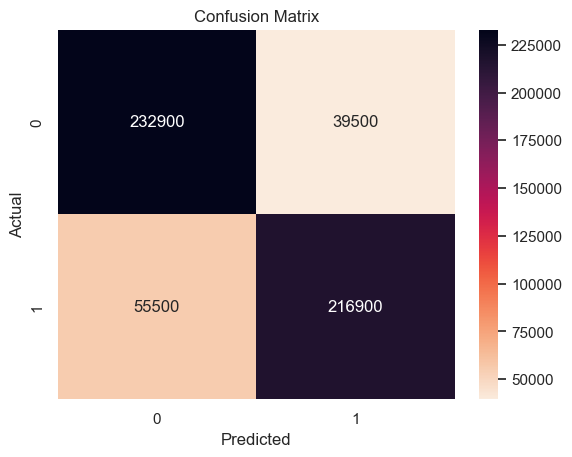

In [168]:
Confusion_Matrix_CB = confusion_matrix ( Test_Y , Y_CB ) * 100

sns.heatmap ( Confusion_Matrix_CB , annot = True , fmt='.0f' , cmap = 'rocket_r' )

plt.xlabel ( "Predicted" )

plt.ylabel ( "Actual" )

plt.title ( "Confusion Matrix" )

##### CHECKING FOR OVERFITTING 

In [169]:
# Predict the classes for the training set using KNN classifier

train_predictions = CB.predict(Train_X)


# Predict the classes for the test set using KNN classifier

test_predictions = CB.predict(Test_X)


# Calculate the accuracy of the model on the training set

train_accuracy = accuracy_score(Train_Y, train_predictions) * 100


# Calculate the accuracy of the model on the test set

test_accuracy = accuracy_score(Test_Y, test_predictions) * 100


print ( "Train Accuracy >> {}\n\nTest Accuracy >> {}".format ( train_accuracy , test_accuracy ) )

Train Accuracy >> 83.91812865497076

Test Accuracy >> 82.56240822320117


## COMPARING THE MODELS

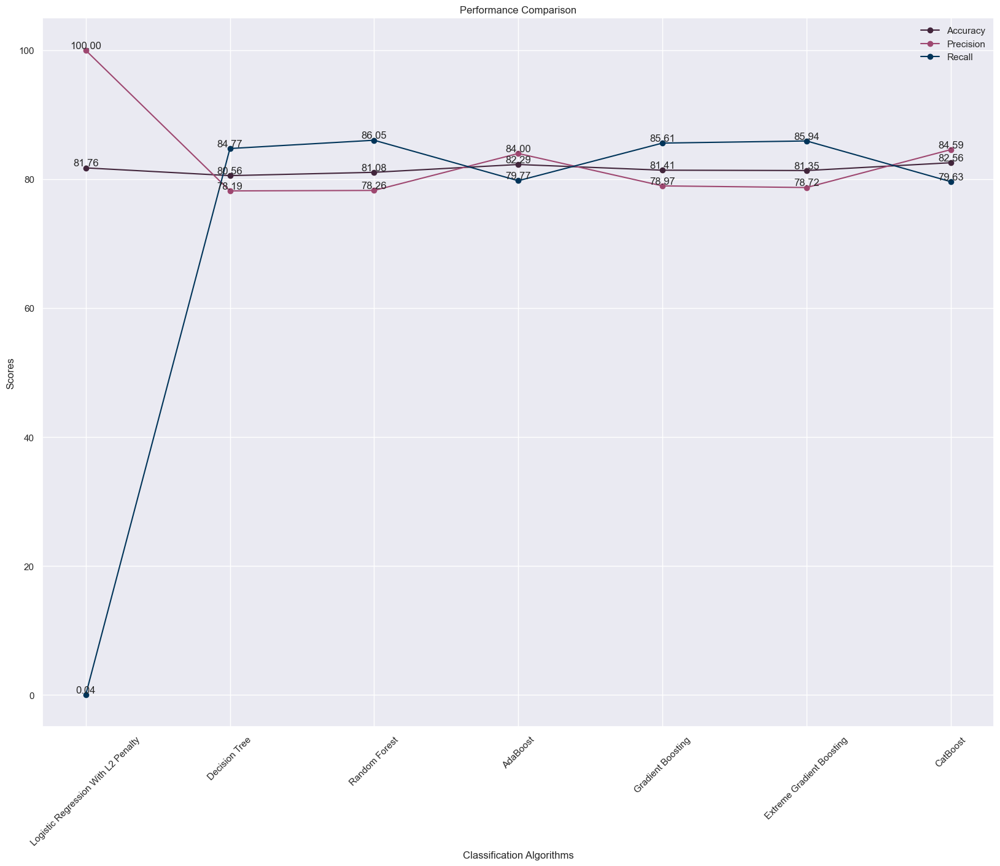

In [173]:
# Classification algorithm names

algorithm_names = ['Logistic Regression With L2 Penalty', 'Decision Tree', 'Random Forest', 'AdaBoost' , 'Gradient Boosting' , 'Extreme Gradient Boosting' , 'CatBoost' ]


# Accuracy scores

accuracy_scores = [ Accuracy_LR , Accuracy_DT , Accuracy_RF ,  Accuracy_AB , Accuracy_GB , Accuracy_XGB , Accuracy_CB ]


# Precision scores

precision_scores = [ Precision_LR , Precision_DT , Precision_RF ,   Precision_AB , Precision_GB , Precision_XGB , Precision_CB ]


# Recall scores

recall_scores = [ Recall_LR , Recall_DT , Recall_RF , Recall_AB , Recall_GB , Recall_XGB , Recall_CB ]


# Plotting the scores

plt.figure( figsize = ( 20 , 15 ) )


# Accuracy scores plot

plt.plot(algorithm_names, accuracy_scores, label='Accuracy', marker='o', color='#42253B')

for i in range(len(algorithm_names)):
    
    plt.text(algorithm_names[i], accuracy_scores[i], f'{accuracy_scores[i]:.2f}', ha='center', va='bottom')
    

# Precision scores plot

plt.plot( algorithm_names, precision_scores, label='Precision', marker='o', color='#9E4770')

for i in range ( len( algorithm_names ) ):
    
    plt.text( algorithm_names [ i ] , precision_scores[ i ], f'{precision_scores[i]:.2f}', ha='center', va='bottom')
    

# Recall scores plot

plt.plot(algorithm_names, recall_scores, label='Recall', marker='o', color='#003459')

for i in range(len(algorithm_names)):
    
    plt.text(algorithm_names[i], recall_scores[i], f'{recall_scores[i]:.2f}', ha='center', va='bottom')
    




# Labeling the axes and title

plt.xlabel( 'Classification Algorithms' )

plt.ylabel( 'Scores' )

plt.title( 'Performance Comparison' )


# Adding a legend

plt.legend()


# Rotating the x-axis labels for better visibility

plt.xticks( rotation = 45 )


# Displaying the plot

plt.show ( )


    * PERFORMANCE ANALYSIS OF THE ALGORITHMS
    
        - Good Performance
        
            > Decision Tree
            
            > Random Forest
            
            > Adaptive Boosting 
           
            > Gradient Boosting 
            
            > Extreme Gradient Boosting
            
            > Categorical Boost
            
        - Recall tells us the rate at which the algorithm correctly predicts Aircraft damage severity.

In [174]:
Performance = pd.DataFrame ( index = algorithm_names )

Performance [ "Accuracy" ] = accuracy_scores 

Performance [ "Precision" ] = precision_scores

Performance [ "Recall" ] = recall_scores

Performance

,Accuracy,Precision,Recall
Logistic Regression With L2 Penalty,81.762775,100.000000,0.036711
Decision Tree,80.561674,78.191669,84.765051
Random Forest,81.075624,78.263773,86.049927
AdaBoost,82.287078,83.996908,79.772394
Gradient Boosting,81.406021,78.970538,85.609398
Extreme Gradient Boosting,81.350954,78.715535,85.939794
CatBoost,82.562408,84.594384,79.625551


### AUROC CURVE

    * AUROC curve is a way to evaluate the performance of a classification model, which predicts whether something belongs 
      to a certain category or not. 
      
    * The AUROC curve measures how well a model can distinguish between the positive class and the negative class. 
    
    * The True Positive Rate (also called Sensitivity or Recall) represents the proportion of actual positive cases 
      correctly classified as positive by the model.
      
    * The False Positive Rate represents the proportion of actual negative cases incorrectly classified as positive by the
      model.
      
    * The AUROC value ranges from 0 to 1, where a value of 0.5 represents a random classifier, and a value of 1 represents 
      a perfect classifier. The higher the AUROC value, the better the model's ability to distinguish between the positive 
      and negative classes.
      
    * The AUROC value is calculated as the area under the AUROC curve. A larger area under the curve indicates better model
      performance.
      
    * When the False Positive Rate (FPR) increases drastically after a certain point in the AUROC (Area Under the Receiver
      Operating Characteristic) curve, it indicates that the model's ability to distinguish between the positive and
      negative classes deteriorates rapidly as the classification threshold is lowered.
      

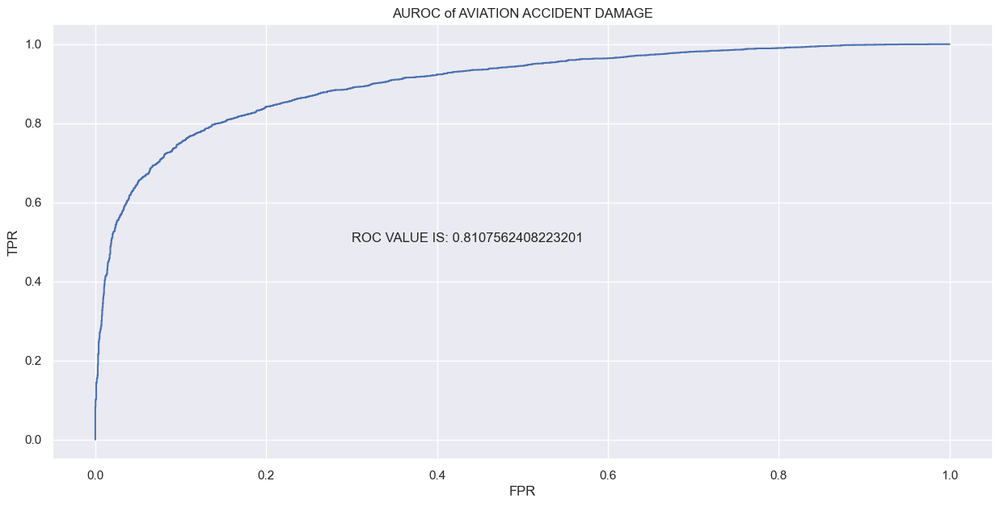

In [175]:
# Calculate AUROC score using roc_auc_score function

AUROC_Score = roc_auc_score( Test_Y , Y_RF )


# Predict probabilities using XGBoost's predict_proba function

Predicted_Prob = XGB.predict_proba ( Test_X )


# Calculate False Positive Rate (FPR), True Positive Rate (TPR), and Threshold values using roc_curve function

FPR, TPR, Threshold = roc_curve( Test_Y, Predicted_Prob [ : , 1 ] )


# Plot the ROC curve using FPR and TPR

plt.style.use( "seaborn-dark" )

plt.figure ( figsize = ( 15 , 7 ) )

sns.set( style = 'darkgrid' )

plt.plot( FPR , TPR )


# Set the x-axis label

plt.xlabel( "FPR" )


# Set the y-axis label

plt.ylabel( "TPR" )


# Set the title of the plot

plt.title( "AUROC of AVIATION ACCIDENT DAMAGE" )


# Add text to the plot indicating the AUROC score

plt.text( x = 0.3, y = 0.5, s = "ROC VALUE IS: {}".format ( AUROC_Score ) )

plt.show ( )

<span class="pirk">- INFERENCE</span>    
    
    * An AUROC (Area Under the Receiver Operating Characteristic) curve area of 0.8233 indicates the overall performance of 
      a binary classifier in terms of its ability to discriminate between positive and negative instances
    
    * The AUROC curve summarizes the trade-off between the true positive rate (sensitivity or recall) and the false 
      positive rate (1 - specificity) at different classification thresholds. 
    
    * The higher the AUROC curve area, the better the classifier is at achieving a high true positive rate while keeping 
      the false positive rate low.
    
    

## INTERPRETATION FOR BUSINESS

### WEATHER & AIRCRAFT ACCIDENTS

    * During the Exploratory Data Visualization, it has been noticed that the accidents occur mostly during the summer 
      season. 

      > Implement rigorous maintenance and inspection protocols for aircraft components that are more susceptible to 
        summer-related issues, such as engine overheating or air conditioning system failures. 
      
      > Conduct thorough checks on critical systems to ensure their proper functioning during hot weather conditions.
      
      > Continuously analyze accident data specific to the summer season to identify patterns or recurring factors that
        contribute to incidents. Use this information to drive improvements in training, procedures, and safety protocols.

### PHASE OF FLIGHT & ACCIDENTS

    * We can see that the maximum number of accidents occur during the Landing phase and Take off phase, followed by
      cruise, maneuvering and approach.
      
        > Ensure that runways and approach paths are properly maintained and designed to meet safety standards. 
        
        > This may involve regular inspections, repairs, and updates to runway lighting, and markings to enhance 
          visibility and minimize potential hazards.
          
        >  Establish and enforce standardized procedures for takeoff and landing operations, including communication
           protocols between pilots and air traffic controllers.

### ENGINE TYPE & ACCIDENTS

    * Maximum number of fatalities are associated with the Reciprocating engine type followed by Turbofan engines.
    
        > Explore the possibility of upgrading reciprocating engines and turbo fans with advanced technologies that improve
          safety, reliability, and performance. 
          
        > This may involve retrofitting existing aircraft or considering engine upgrades when procuring new aircraft.
        
        > Conduct a comprehensive risk assessment and analysis of aircraft accidents associated with reciprocating engines 
          and turbo fans. 
        
        > Identify common patterns or factors contributing to accidents and fatalities. 
        
        > Enhance training programs for pilots, crew members, and ground staff to raise awareness about the specific 
          challenges and risks associated with reciprocating engines and turbo fans. 